In [51]:
import pandas as pd
from datetime import datetime, timedelta
import numpy
from gurobipy import *


In [52]:
import numpy as np
import pandas as pd

In [53]:
lower_data = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="SEIR_params_conf_range_lower")
upper_data = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="SEIR_params_conf_range_upper")

In [54]:
%matplotlib inline


In [55]:
age_groups = ['age_group_0_9', 'age_group_10_19', 'age_group_20_29','age_group_30_39', 'age_group_40_49', 'age_group_50_59', 'age_group_60_69', 'age_group_70_79', 'age_group_80_plus']
econ_activities = ['transport', 'leisure', 'other']
cont = [ 'S', 'E', 'I', 'R', 'N', 'Ia', 'Ips', \
           'Ims', 'Iss', 'Rq', 'H', 'ICU', 'D' ]

In [56]:
data = pd.read_csv("donnees-hospitalieres-classe-age-covid19-2020-10-12-19h00.csv", sep=";")
data.head()

,reg,cl_age90,jour,hosp,rea,rad,dc
0,1,0,2020-03-18,0,0,0,0
1,1,9,2020-03-18,0,0,0,0
2,1,19,2020-03-18,0,0,0,0
3,1,29,2020-03-18,0,0,0,0
4,1,39,2020-03-18,0,0,0,0


In [57]:
# Extract days 
days = data[data['reg']==11][data['cl_age90']==0].jour.values
days

/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


array(['2020-03-18', '2020-03-19', '2020-03-20', '2020-03-21',
       '2020-03-22', '2020-03-23', '2020-03-24', '2020-03-25',
       '2020-03-26', '2020-03-27', '2020-03-28', '2020-03-29',
       '2020-03-30', '2020-03-31', '2020-04-01', '2020-04-02',
       '2020-04-03', '2020-04-04', '2020-04-05', '2020-04-06',
       '2020-04-07', '2020-04-08', '2020-04-09', '2020-04-10',
       '2020-04-11', '2020-04-12', '2020-04-13', '2020-04-14',
       '2020-04-15', '2020-04-16', '2020-04-17', '2020-04-18',
       '2020-04-19', '2020-04-20', '2020-04-21', '2020-04-22',
       '2020-04-23', '2020-04-24', '2020-04-25', '2020-04-26',
       '2020-04-27', '2020-04-28', '2020-04-29', '2020-05-01',
       '2020-05-02', '2020-05-03', '2020-05-04', '2020-05-05',
       '2020-05-06', '2020-05-07', '2020-05-08', '2020-05-09',
       '2020-05-10', '2020-05-11', '2020-05-12', '2020-05-13',
       '2020-05-14', '2020-05-15', '2020-05-16', '2020-05-17',
       '2020-05-18', '2020-05-19', '2020-05-20', '2020-

In [58]:
beds_real = {
    age_groups[i]:data[data['reg']==11][data['cl_age90']==10*i+9].hosp.values for i in range(0,9)
}
beds_real['age_group_80_plus']+=data[data['reg']==11][data['cl_age90']==90].hosp.values
beds_real['total']=data[data['reg']==11][data['cl_age90']==0].hosp.values

icus_real = {
    age_groups[i]:data[data['reg']==11][data['cl_age90']==10*i+9].rea.values for i in range(0,9)
}
icus_real['age_group_80_plus']+=data[data['reg']==11][data['cl_age90']==90].rea.values
icus_real['total']=data[data['reg']==11][data['cl_age90']==0].rea.values

deaths_real = {
    age_groups[i]:data[data['reg']==11][data['cl_age90']==10*i+9].dc.values for i in range(0,9)
}
deaths_real['age_group_80_plus']+=data[data['reg']==11][data['cl_age90']==90].dc.values
deaths_real['total']=data[data['reg']==11][data['cl_age90']==0].dc.values


/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/Users/sergioacamelogomez/opt/anaconda3/lib/pyth

In [59]:
mult_deaths = np.sum(data[data['reg']==11][data['cl_age90']==0].hosp.values)/np.sum(data[data['reg']==11][data['cl_age90']==0].dc.values)
print(mult_deaths)
mult_icus = np.sum(data[data['reg']==11][data['cl_age90']==0].hosp.values)/np.sum(data[data['reg']==11][data['cl_age90']==0].rea.values)
print(mult_icus)


0.8027031447630085
7.263841728449632


/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.
/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


In [60]:
import yaml
from inspect import getsourcefile
import os.path
import sys
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
import argparse
current_path = os.path.abspath(getsourcefile(lambda:0))
current_dir = os.path.dirname(current_path)
parentdir = os.path.dirname(current_dir)
sys.path.insert(0,parentdir) 
sys.path.insert(0, parentdir+"/heuristics")
sys.path.insert(0, parentdir+"/heuristics/LP-Models")
sys.path.insert(0, parentdir+"/fast_gradient")


from fast_group import FastDynamicalModel
from aux import *


In [61]:
region = "Ile-de-France"

In [62]:
# Read group parameters
with open("../parameters/"+region+".yaml") as file:
    # The FullLoader parameter handles the conversion from YAML
    # scalar values to Python the dictionary format
    universe_params = yaml.load(file, Loader=yaml.FullLoader)
    
# Read initialization
with open("../initialization/patient_zero.yaml") as file:
    # The FullLoader parameter handles the conversion from YAML
    # scalar values to Python the dictionary format
    original_initialization = yaml.load(file, Loader=yaml.FullLoader)

# Read econ parameters
with open("../parameters/econ.yaml") as file:
    econ_params = yaml.load(file, Loader=yaml.FullLoader)

experiment_params = {
    'delta_schooling':0.5,
    'xi':0,
    'icus':3000,
}

In [63]:
date_1 = datetime.strptime("2020-03-17", '%Y-%m-%d')
date_2 = datetime.strptime("2020-05-11", '%Y-%m-%d')
date_3 = datetime.strptime("2020-06-01", '%Y-%m-%d')
date_4 = datetime.strptime("2020-07-01", '%Y-%m-%d')
date_5 = datetime.strptime("2020-09-01", '%Y-%m-%d')
final_date = datetime.strptime("2020-10-12", '%Y-%m-%d')

vacation_start = date_4
vacation_end = date_5
days_vacation_start = (vacation_start - date_1).days
days_vacation_end = (vacation_end - date_1).days

In [64]:
(final_date-date_1).days+140

349

In [65]:
from copy import deepcopy

In [66]:
original_beta = universe_params['seir-groups']["age_group_0_9"]["parameters"]["beta"]
original_beta_vacation = original_beta
#original_beta_vacation = universe_params['seir-groups']["age_group_0_9"]["parameters"]["beta_vacation"]
t_days_beta = 730

for ag in universe_params['seir-groups']:
    universe_params['seir-groups'][ag]["parameters"]["beta"] = (
        [(original_beta if (t<days_vacation_start or t>= days_vacation_end) else original_beta_vacation) for t in range(t_days_beta) ]
    )


In [67]:
# Create model
mixing_method = {}
dynModel = FastDynamicalModel(universe_params, econ_params, experiment_params, 1, mixing_method, 1e9, 0, 0)


In [68]:
params = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="SEIR_params", index_col = 0)
initial_params = {
    "mu":params['mu'].values,
    "sigma":params['sigma'].values,
    "p_ICU":params['p_ICU'].values,
    "p_H":params['p_H'].values,
    "lambda_H_R":params['lambda_HR'].values,
    "lambda_H_D":params['lambda_HD'].values,
    "lambda_ICU_R":params['lambda_ICUR'].values,
    "lambda_ICU_D":params['lambda_ICUD'].values
}

params = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="SEIR_params_conf_range_lower", index_col = 0)
lower_params = {
    "mu":params['mu'].values,
    "sigma":params['sigma'].values,
    "p_ICU":params['p_ICU'].values,
    "p_H":params['p_H'].values,
    "lambda_H_R":params['lambda_HR'].values,
    "lambda_H_D":params['lambda_HD'].values,
    "lambda_ICU_R":params['lambda_ICUR'].values,
    "lambda_ICU_D":params['lambda_ICUD'].values
}

params = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="SEIR_params_conf_range_upper", index_col = 0)
upper_params = {
    "mu":params['mu'].values,
    "sigma":params['sigma'].values,
    "p_ICU":params['p_ICU'].values,
    "p_H":params['p_H'].values,
    "lambda_H_R":params['lambda_HR'].values,
    "lambda_H_D":params['lambda_HD'].values,
    "lambda_ICU_R":params['lambda_ICUR'].values,
    "lambda_ICU_D":params['lambda_ICUD'].values
}

In [71]:
# Construct the windows for the parameters to move
windows = {}
for p in initial_params:
    windows[p] = (
        np.min(upper_params[p]/initial_params[p]),
        np.max(lower_params[p]/initial_params[p]),
    )
    
windows['beta_mixing'] = (0.1,4.0)
windows['alpha_mixing'] = (0.1,4.0)
windows['gamma_mixing'] = (0.5,2.0)
windows['work_l'] = (0.2,0.3)
windows['other_l'] = (0,0.1)
windows['school_l'] = (0,0.1)
windows['leisure_l'] = (0,0.1)
windows['transport_l'] = (0.2,0.3)

In [72]:
import copy
import math
best_v = 0
best_error = float('inf')
validation_date = datetime.strptime("2020-05-11", '%Y-%m-%d')

def error(v):

    days_ahead = v[0]
    alpha_mixing = v[1]
    beta_mixing = alpha_mixing
    gamma_mixing_before = 1.0
    gamma_mixing_after = 1.0
    gamma_change = 0

    upper_bound_home = 1.0
    upper_bound_leisure = 1.0
    upper_bound_other = 1.0
    upper_bound_school = 1.0
    upper_bound_work = 1.0
    upper_bound_transport = 1.0
    
    work_l = v[2]
    leisure_l = v[3]
    other_l = v[4]
    transport_l = v[5]
    school_l = v[6]
    

    
    
    # Number of days
    days_before_date_1 = int(days_ahead)
    days_between_dates_1_2 = (date_2-date_1).days
    days_between_dates_2_3 = (date_3-date_2).days
    days_between_dates_3_4 = (date_4-date_3).days
    days_between_dates_4_5 = (date_5-date_4).days
    days_after_date_5 = (final_date-date_5).days
    total_days = days_before_date_1 + days_between_dates_1_2 + days_between_dates_2_3 + days_between_dates_3_4 + days_between_dates_4_5+ days_after_date_5
    days_denom = days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5
    
    
    # Some additional calculations
    validation_days = days_before_date_1 + (validation_date-date_1).days
    vacation_start_days = days_before_date_1 + (vacation_start-date_1).days
    vacation_end_days = days_before_date_1 + (vacation_end-date_1).days
    
    
    # Construct initialization
    initialization = copy.deepcopy(original_initialization)
    for i,group in enumerate(age_groups):
        if group == "age_group_40_49":
            initialization[group]["I"] = initialization[group]["I"] + 1
            initialization[group]["S"] = initialization[group]["S"] - 1
        initialization[group]["N"] = initialization[group]["S"] + initialization[group]["E"] + initialization[group]["I"] + initialization[group]["R"]


    # Alphas
    a_before_date_1 = {
        'home':upper_bound_home,
        'leisure':upper_bound_leisure,
        'other':upper_bound_other,
        'school':upper_bound_school,
        'transport':upper_bound_transport,
        'work':upper_bound_work
    }
    
    a_between_date_1_2 = {
        'home':upper_bound_home,
        'leisure':leisure_l,
        'other':other_l,
        'school':school_l,
        'transport':transport_l,
        'work':work_l
    }
    

    


    # Determine mixing method
    mixing_method_before = {
        "name":"mult",
        "param_alpha":alpha_mixing,
        "param_beta":beta_mixing,
    }

    # Determine mixing method
    mixing_method_after = {
        "name":"mult",
        "param_alpha":alpha_mixing,
        "param_beta":beta_mixing,
    }
    #dynModel.mixing_method = mixing_method_after




    # Calculate alphas
    alphas_vec = []
    for t in range(days_before_date_1):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_before_date_1
        alphas_vec.append(alphas)
    for t in range(days_between_dates_1_2):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_1_2
        alphas_vec.append(alphas)
    for t in range(days_between_dates_2_3):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_1_2
        alphas_vec.append(alphas)
    for t in range(days_between_dates_3_4):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_1_2
        alphas_vec.append(alphas)
    for t in range(days_between_dates_4_5):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_1_2
        alphas_vec.append(alphas)
    for t in range(days_after_date_5):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_1_2
        alphas_vec.append(alphas)

    mixing_vec = []
    for t in range(int(gamma_change)):
        mixing_vec.append(mixing_method_before)
    for t in range(int(gamma_change),total_days):
        mixing_vec.append(mixing_method_after)
        
        
        
        
    # Calculate tests
    tests = np.zeros(len(age_groups))


    # Run model
    model_data_beds = {ag:[] for ag in age_groups+["total"]}
    model_data_icus = {ag:[] for ag in age_groups+["total"]}
    model_data_deaths = {ag:[] for ag in age_groups+["total"]}

    state = state_to_matrix(initialization)
    t_beds = 0
    t_icus = 0
    t_deaths = 0
    for i,ag in enumerate(age_groups):
        state_H = state[i,cont.index("H")]
        state_ICU = state[i,cont.index("ICU")]
        state_D = state[i,cont.index("D")]
        model_data_beds[ag].append(state_H)
        model_data_icus[ag].append(state_ICU)
        model_data_deaths[ag].append(state_D)
        t_beds+= state_H
        t_icus+= state_ICU
        t_deaths+= state_D
    model_data_beds["total"].append(t_beds)
    model_data_icus["total"].append(t_icus)
    model_data_deaths["total"].append(t_deaths)

    recalc_days = [0,
                 days_before_date_1,
                 days_before_date_1+days_between_dates_1_2,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5,
                int(gamma_change)
                ]

    dynModel.beta = np.zeros((len(age_groups),len(dynModel.groups[age_groups[0]].parameters["beta"])))
    for i in range(len(age_groups)):
        for j in range(len(dynModel.groups[age_groups[0]].parameters["beta"])):
            if j < int(vacation_start_days) or j>= int(vacation_end_days):
                dynModel.beta[i,j] = original_beta
            else:
                dynModel.beta[i,j] = original_beta_vacation
    
    for t in range(total_days):
        if t in recalc_days:
            update_contacts = True
        else:
            update_contacts = False
            
        if t>=vacation_start_days and t<vacation_end_days:
            season = "vacation"
        else:
            season = "normal"

        dynModel.mixing_method = mixing_vec[t]
        state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]), t, season, update_contacts=update_contacts)
        t_beds = 0
        t_icus = 0
        t_deaths = 0
        for i,ag in enumerate(age_groups):
            state_H = state[i,cont.index("H")]
            state_ICU = state[i,cont.index("ICU")]
            state_D = state[i,cont.index("D")]
            model_data_beds[ag].append(state_H)
            model_data_icus[ag].append(state_ICU)
            model_data_deaths[ag].append(state_D)
            t_beds+= state_H
            t_icus+= state_ICU
            t_deaths+= state_D
        #print(t_beds)
        model_data_beds["total"].append(t_beds)
        model_data_icus["total"].append(t_icus)
        model_data_deaths["total"].append(t_deaths)


    initial_date = date_1-timedelta(days=days_before_date_1)

    # Calculate the days of the model
    days_model = [initial_date+timedelta(days = t) for t in range(total_days + 1)]

    # Indices where to put the real data
    indices = [(datetime.strptime(d, '%Y-%m-%d') - initial_date).days for d in days]

    # Real data
    real_data_beds = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
    real_data_icus = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
    real_data_deaths = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}

    for k,ind in enumerate(indices):
        for ag in age_groups+["total"]:
            real_data_beds[ag][ind] = beds_real[ag][k]
            real_data_icus[ag][ind] = icus_real[ag][k]
            real_data_deaths[ag][ind] = deaths_real[ag][k]


    error_beds = 0
    error_icus = 0
    error_deaths = 0
    for ag in age_groups:
        error_beds += np.nanmean((np.abs(np.array(model_data_beds[ag])-np.array(real_data_beds[ag])))[0:validation_days])
        #error_icus += np.nanmean(np.abs(np.array(model_data_icus[ag])-np.array(real_data_icus[ag])))
        #error_deaths += np.nanmean(np.abs(np.array(model_data_deaths[ag])-np.array(real_data_deaths[ag])))
    error_beds_total = np.nanmean((np.abs(np.array(model_data_beds["total"])-np.array(real_data_beds["total"])))[0:validation_days])
    #error_icus_total = np.nanmean(np.abs(np.array(model_data_icus["total"])-np.array(real_data_icus["total"])))
    #error_deaths_total = np.nanmean(np.abs(np.array(model_data_deaths["total"])-np.array(real_data_deaths["total"])))

    
    #diff = np.array(model_data_beds["total"])-np.array(real_data_beds["total"])
    #error_beds_above = np.nanmean([max(d,0) for d in diff])
    #error_beds_below = -np.nanmean([min(d,0) for d in diff])

    #cumm_beds_model = [sum([model_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(model_data_beds["total"]))]
    #cumm_beds_real = [sum([real_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(real_data_beds["total"]))]
    #diff_cumm = np.array(cumm_beds_model)-np.array(cumm_beds_real)
    #error_cumm_above = np.nanmean([max(d,0) for d in diff_cumm])
    #error_cumm_below = -np.nanmean([min(d,0) for d in diff_cumm])



    #     error = error_beds_total
    #     error = mult_icus*error_icus_total
    #     error = mult_deaths*error_deaths_total
    upper_model_data = model_data_beds["total"]
    upper_days_model = days_model
    upper_real_data = real_data_beds["total"]
    error = error_beds+5*error_beds_total




    
    
    global best_error
    global best_v
    if error<best_error:
        best_error = error
        print(best_error)
        print("error_groups",error_beds)
        print("error_total",error_beds_total)
        print("alpha:",alpha_mixing,"beta:",beta_mixing)
        best_v = v
        print(v)
        plt.figure(1)
        plt.plot(upper_days_model, upper_model_data, label="Upper")
        plt.plot(upper_days_model, upper_real_data, label="Model L1")
        plt.legend(loc='upper right')
        plt.show()
        print(a_before_date_1)
        print(a_between_date_1_2)
        #print(a_between_date_2_3)
        #print(a_between_date_3_4)
        #print(a_between_date_4_5)
        #print(a_after_date_5)
        

    return error





In [74]:
%matplotlib inline

/Users/sergioacamelogomez/opt/anaconda3/lib/python3.7/site-packages/scipy/optimize/_differentialevolution.py:494: UserWarning: differential_evolution: the 'workers' keyword has overridden updating='immediate' to updating='deferred'
  " updating='deferred'", UserWarning)


56564.755940508636
error_groups 9343.119700776597
error_total 9444.327247946409
55947.32309390188
44500.64194222784
alpha: 2.397799674548505 beta: 2.397799674548505
error_groups 7582.6390754529975
error_groups 9240.21422634214
error_total 9341.42177351195
error_total 7383.600573354968
[5.52443844e+01 2.39779967e+00 2.56388817e-01 7.26537848e-02
 6.58262946e-02 2.28912772e-01 2.59991482e-02]alpha: 0.9960285980312533 beta: 0.9960285980312533
alpha: 0.14293712403525372 beta: 0.14293712403525372

[52.88596925  0.14293712  0.22034903  0.08575997  0.07966516  0.28644509
  0.06768509][5.78431494e+01 9.96028598e-01 2.75520333e-01 8.10750431e-02
 4.17106845e-02 2.12760934e-01 6.53268613e-02]

54666.91044440509
error_groups 9026.835708999872
54076.6006536786
47966.71458556163
error_total 9128.014947081045
23648.421128659607
error_groups 7919.927911365672
error_groups 8928.573368784626
alpha: 1.6576147817718878 beta: 1.6576147817718878
error_groups 4800.066297494304
error_total 8009.357334839192


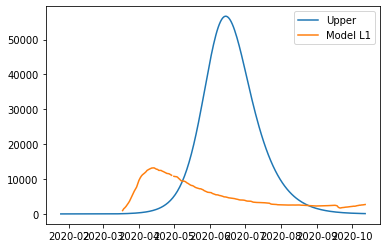

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.08575996933835042, 'other': 0.0796651643678767, 'school': 0.0676850914641659, 'transport': 0.2864450898376175, 'work': 0.220349030947589}


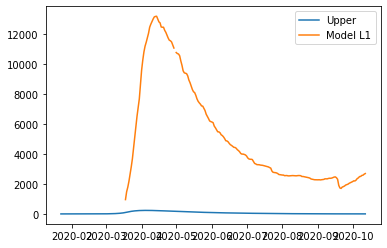

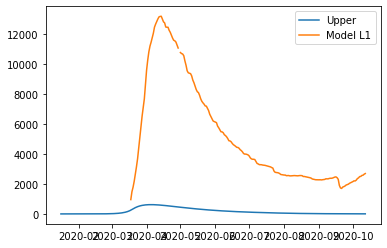

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}


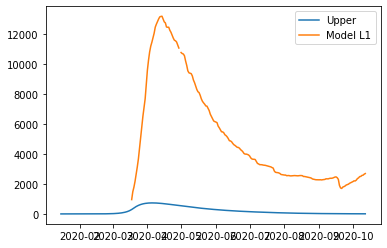

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07265378484862808, 'other': 0.06582629459499498, 'school': 0.02599914821389659, 'transport': 0.22891277169952284, 'work': 0.2563888167015097}
{'home': 1.0, 'leisure': 0.03592829598319219, 'other': 0.08293459545405026, 'school': 0.012281210150314747, 'transport': 0.21070082566980433, 'work': 0.2032041610646732}


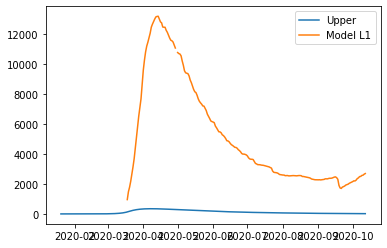

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.08107504310646714, 'other': 0.04171068454300501, 'school': 0.06532686131815289, 'transport': 0.21276093367109916, 'work': 0.27552033303320905}
{'home': 1.0, 'leisure': 0.005418673961986288, 'other': 0.07865342075446921, 'school': 0.09720058028161832, 'transport': 0.24805193154550698, 'work': 0.24238922332439664}


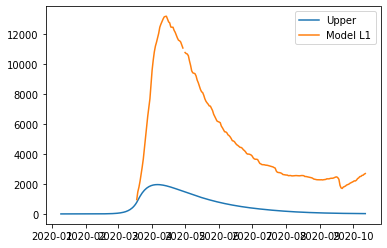

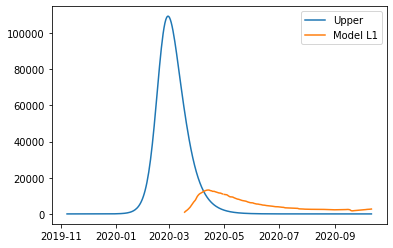

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0034554785823722595, 'other': 0.09591416251416213, 'school': 0.09038208213210443, 'transport': 0.28437517068532686, 'work': 0.24895985066399198}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.05579477375587814, 'other': 0.08629076478395423, 'school': 0.030822423050078526, 'transport': 0.2940138558529996, 'work': 0.28069462635653036}


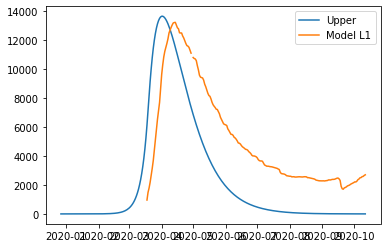

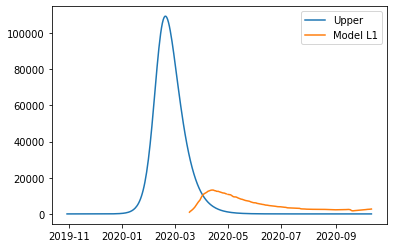

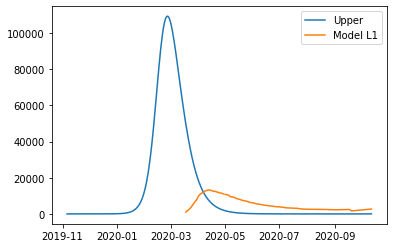

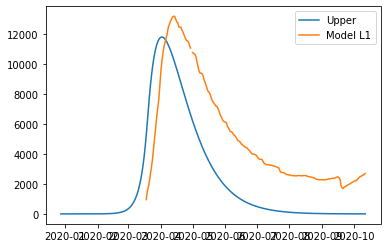

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07982805434671894, 'other': 0.014387605662693204, 'school': 0.0336730962586677, 'transport': 0.20809818412500986, 'work': 0.2578798982586099}
{'home': 1.0, 'leisure': 0.011293815045631594, 'other': 0.02360990011201604, 'school': 0.010110715284642212, 'transport': 0.20645601349139261, 'work': 0.2781640775469236}
{'home': 1.0, 'leisure': 0.007585936139648572, 'other': 0.01187142098714234, 'school': 0.04932180669210923, 'transport': 0.21726554277041243, 'work': 0.2431570185719896}
{'home': 1.0, 'leisure': 0.05270247056064327, 'other': 0.09787649272445435, 'school': 0.023694744793720725, 'transport': 0.2678216

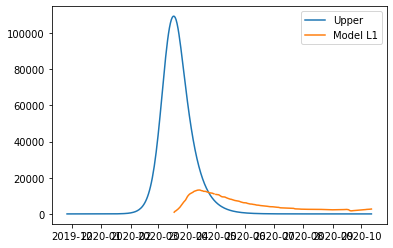

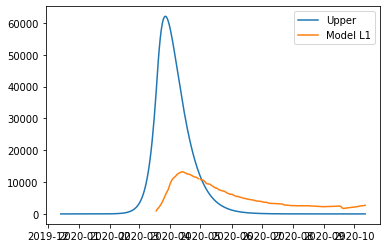

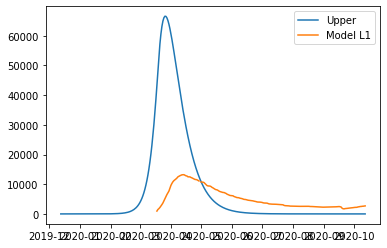

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.05940200968432913, 'other': 0.026889938174935974, 'school': 0.06334666636411908, 'transport': 0.2852117163630233, 'work': 0.2713378875002004}
{'home': 1.0, 'leisure': 0.034662379134684895, 'other': 0.03938313399640814, 'school': 0.010669800711300047, 'transport': 0.27215631260136863, 'work': 0.22223415021963164}
{'home': 1.0, 'leisure': 0.057911176996172764, 'other': 0.06361892688868288, 'school': 0.08660579781010447, 'transport': 0.24597539413782174, 'work': 0.22626376892931974}


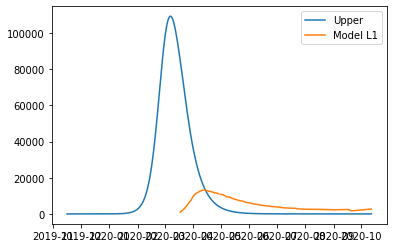

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}


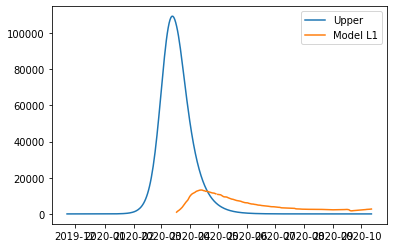

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.025916426403172668, 'other': 0.02905743362924215, 'school': 0.047596768412555966, 'transport': 0.2199981414825434, 'work': 0.28134896000092896}
{'home': 1.0, 'leisure': 0.03330111956011814, 'other': 0.024626169395388177, 'school': 0.004786656554174894, 'transport': 0.23821524923730836, 'work': 0.25012168945055024}
51008.87841606244
error_groups 8420.448541101745
error_total 8517.685974992139
alpha: 2.845429328610447 beta: 2.845429328610447
[6.64358020e+01 2.84542933e+00 2.25585644e-01 9.42116493e-02
 1.70258802e-02 2.10347211e-01 5.55805443e-02]25831.791461055735

error_groups 5155.552105640053
error_total 4135.2478710831365
56120.90584650393
alpha: 2.9557285404458873 beta: 2.9557285404458873
error_groups 9269.144685109146
[8.23284233e+01 2.95572854e+00 2.60530711e-01 5.33542484e-02
 6.96350436e-02 2.83122544e-01 2.85419043e-02]error_total 9370.352232278956

alpha: 2.065

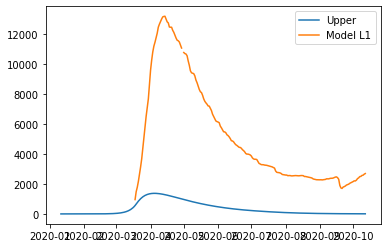

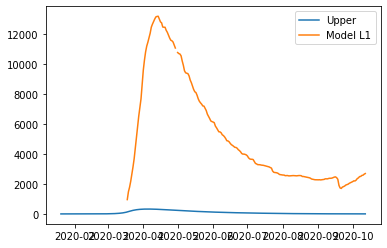

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.09421164926490372, 'other': 0.017025880247576987, 'school': 0.05558054427873597, 'transport': 0.21034721062115927, 'work': 0.22558564372299408}
{'home': 1.0, 'leisure': 0.029252011358063764, 'other': 0.005379694095220697, 'school': 0.04528973383202933, 'transport': 0.2626015218514432, 'work': 0.2343224647596416}


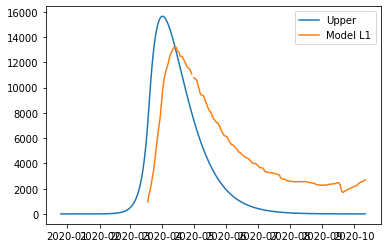

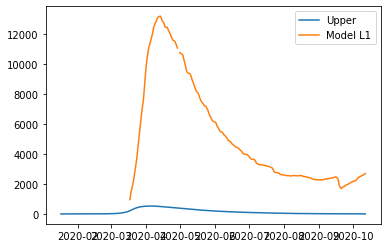

35718.385282352574
error_groups 6000.454584126224
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
error_total 5943.58613964527
{'home': 1.0, 'leisure': 0.05335424835385921, 'other': 0.0696350436396756, 'school': 0.028541904339689513, 'transport': 0.2831225443866727, 'work': 0.26053071065328803}
alpha: 1.478607542860841 beta: 1.478607542860841
[7.40772412e+01 1.47860754e+00 2.52952258e-01 2.56165890e-02
 8.87705921e-02 2.58542289e-01 1.97395512e-02]{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}

{'home': 1.0, 'leisure': 0.011736518104511741, 'other': 0.0011271278992513317, 'school': 0.07799360600088073, 'transport': 0.27675126366271957, 'work': 0.267717996609099}


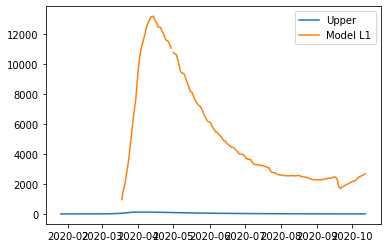

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0990978545708874, 'other': 0.042269956978198804, 'school': 0.052576989200666016, 'transport': 0.26079479674411227, 'work': 0.21360614329187957}


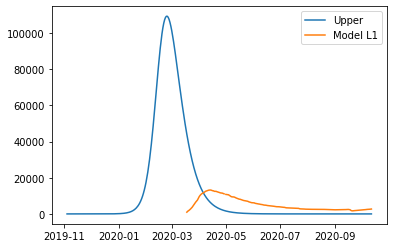

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.05193359492740462, 'other': 0.08765116071226738, 'school': 0.07026100548471872, 'transport': 0.2243032089738596, 'work': 0.27025275312799585}


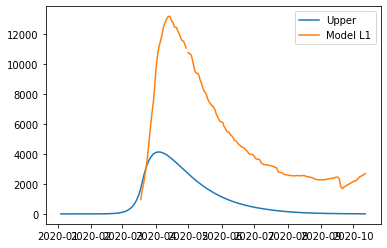

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.08993017791257361, 'other': 0.015428639440843946, 'school': 0.08559158971694047, 'transport': 0.24006334264428275, 'work': 0.2584826870554675}


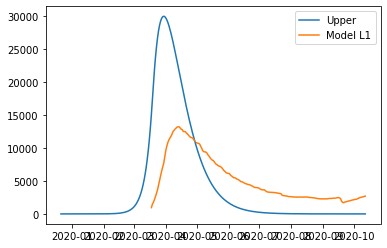

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.05028179132222093, 'other': 0.05108479769178305, 'school': 0.048463434993429436, 'transport': 0.2908292572653754, 'work': 0.2779573817174738}
25704.813340051354
error_groups 5143.034742493606
error_total 4112.35571951155
alpha: 1.9521210471134993 beta: 1.9521210471134993
[8.29039716e+01 1.95212105e+00 2.74002401e-01 4.66261460e-02
 6.11344583e-02 2.98385330e-01 7.85819633e-02]
32838.497948946155
error_groups 5602.667038583371
error_total 5447.166182072557
alpha: 1.3233215428136902 beta: 1.3233215428136902
[7.54804800e+01 1.32332154e+00 2.38060576e-01 9.09949275e-02
 6.87446447e-02 2.47239034e-01 9.85931433e-02]
49859.92808747742
error_groups 8231.38911425253
error_total 8325.707794644977
alpha: 2.518543503954817 beta: 2.518543503954817
[6.72564062e+01 2.51854350e+00 2.65808162e-01 1.77253865e-02
 1.89850786e-02 2.27038891e-01 5.41627663e-02]


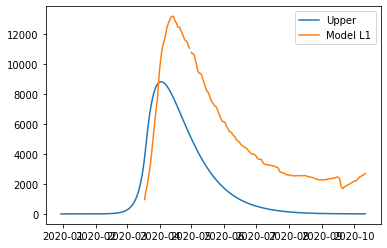

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.01696622817735799, 'other': 0.09925383161118109, 'school': 0.02897056505031372, 'transport': 0.21822881807213557, 'work': 0.21862893397403174}
55847.61412011329
error_groups 9223.596064044039
error_total 9324.80361121385
alpha: 3.9039417722759335 beta: 3.9039417722759335
[5.88628247e+01 3.90394177e+00 2.10457379e-01 3.09651677e-02
 8.67804806e-02 2.00791498e-01 8.38894405e-02]


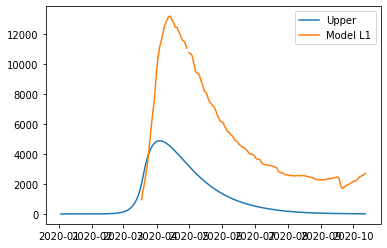

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.02561658903313545, 'other': 0.08877059211732635, 'school': 0.0197395511881317, 'transport': 0.2585422889064897, 'work': 0.25295225804314136}
23996.362625052
error_groups 4650.675993943175
error_total 3869.1373262217644
alpha: 1.7784409343667442 beta: 1.7784409343667442
[7.99851729e+01 1.77844093e+00 2.76399371e-01 7.11544377e-02
 3.01226045e-02 2.80104674e-01 3.04455332e-02]


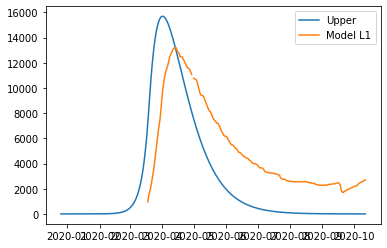

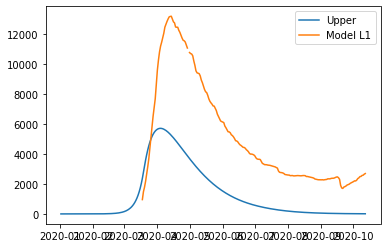

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.04662614603321338, 'other': 0.06113445825915155, 'school': 0.07858196325990557, 'transport': 0.29838533034335696, 'work': 0.2740024011626229}
{'home': 1.0, 'leisure': 0.09099492751636784, 'other': 0.06874464472177576, 'school': 0.09859314334219178, 'transport': 0.24723903388747528, 'work': 0.23806057592923557}


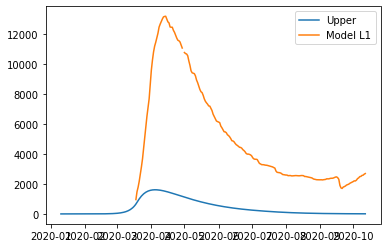

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.01772538653584682, 'other': 0.018985078598246077, 'school': 0.054162766289176136, 'transport': 0.2270388910035459, 'work': 0.2658081619009412}


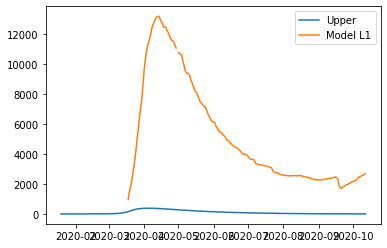

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.03096516766456779, 'other': 0.08678048064403367, 'school': 0.08388944046375152, 'transport': 0.20079149813165728, 'work': 0.21045737927424962}
28366.160195566445


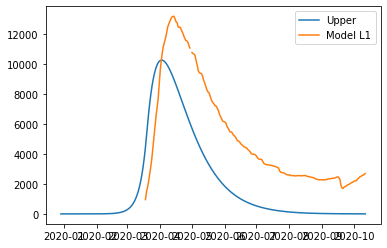

error_groups 5104.176660265446
error_total 4652.396707060199
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
alpha: 1.8518899142059475 beta: 1.8518899142059475
{'home': 1.0, 'leisure': 0.07115443766236279, 'other': 0.030122604515370188, 'school': 0.03044553321846802, 'transport': 0.2801046744165445, 'work': 0.2763993707252031}
[7.75400202e+01 1.85188991e+00 2.16157156e-01 4.36033360e-02
 3.44688991e-02 2.70891887e-01 3.85605067e-02]
28443.935081920943
error_groups 5113.911174129412
error_total 4666.004781558307
alpha: 2.455163639228009 beta: 2.455163639228009
[7.71012583e+01 2.45516364e+00 2.83125254e-01 4.49746675e-02
 3.64682426e-02 2.45687257e-01 3.79038762e-02]
34768.92866488818
error_groups 5882.628913528929
error_total 5777.259950271851
alpha: 0.47217590391008946 beta: 0.47217590391008946
[7.09895420e+01 4.72175904e-01 2.40238063e-01 8.37126060e-02
 8.19379563e-02 2.67517976e-01 3.26928000e-02]


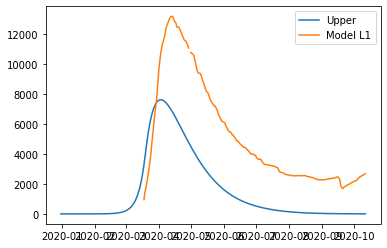

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.04360333604719488, 'other': 0.034468899063188244, 'school': 0.03856050672514875, 'transport': 0.27089188695847183, 'work': 0.21615715637306743}


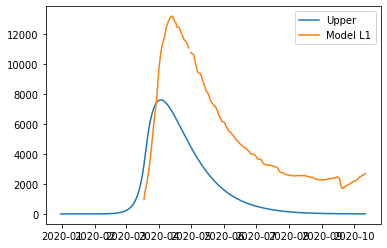

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.04497466747780254, 'other': 0.03646824264359702, 'school': 0.03790387622169839, 'transport': 0.24568725717247836, 'work': 0.28312525418425954}


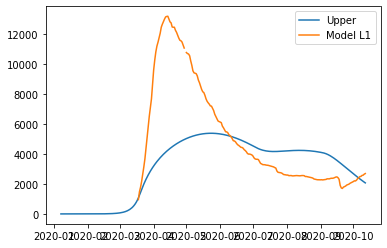

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.08371260603482723, 'other': 0.08193795628187135, 'school': 0.03269279998271822, 'transport': 0.26751797640846353, 'work': 0.2402380625425075}
39187.47104340261
error_groups 6521.921872725986
error_total 6533.109834135325
alpha: 0.8775834474623232 beta: 0.8775834474623232
[7.27979254e+01 8.77583447e-01 2.13010358e-01 4.21488630e-02
 4.72744098e-02 2.91888809e-01 9.40598200e-02]


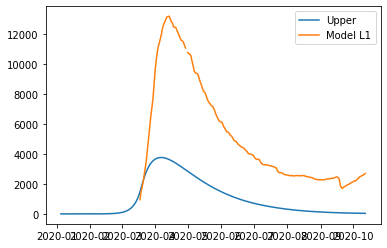

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.042148863032040074, 'other': 0.04727440978692163, 'school': 0.09405981999843616, 'transport': 0.2918888087845812, 'work': 0.2130103581326019}
10536.038280626777
error_groups 2965.8436675555404
error_total 1514.0389226142472
alpha: 0.37748034524499263 beta: 0.37748034524499263
[7.68583134e+01 3.77480345e-01 2.51862955e-01 4.99719531e-03
 8.48622226e-02 2.48814681e-01 2.18581120e-02]
30246.97628848873
error_groups 5800.212188638197
error_total 4889.352819970107
30982.412832635833
alpha: 2.409001680358537 beta: 2.409001680358537
[8.38757771e+01 2.40900168e+00 2.70507593e-01 7.76016940e-02
 9.45747246e-04 2.10347211e-01 5.55805443e-02]error_groups 5395.999497660725
error_total 5117.282666995021

alpha: 2.9832327979341695 beta: 2.9832327979341695
[7.67700473e+01 2.98323280e+00 2.13606143e-01 3.24618608e-02
 3.86936900e-02 2.60794797e-01 5.25769892e-02]
26290.15938112313
error

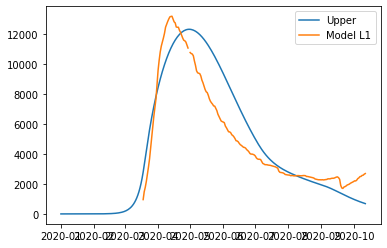

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.004997195311015057, 'other': 0.08486222255764206, 'school': 0.021858112039181123, 'transport': 0.24881468074214685, 'work': 0.25186295549964877}


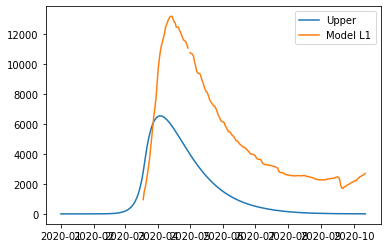

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.032461860831983026, 'other': 0.03869369003302084, 'school': 0.052576989200666016, 'transport': 0.26079479674411227, 'work': 0.21360614329187957}


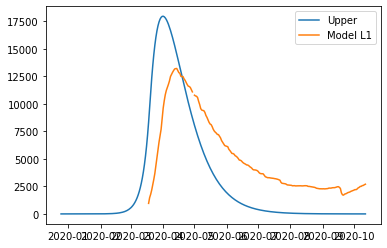

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0776016939778319, 'other': 0.0009457472457266233, 'school': 0.05558054427873597, 'transport': 0.21034721062115927, 'work': 0.2705075931032944}


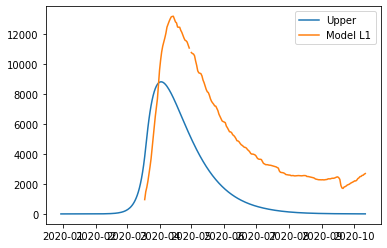

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.01696622817735799, 'other': 0.013710373331395478, 'school': 0.05265407444423739, 'transport': 0.23111845876813736, 'work': 0.2870425077839454}
20052.882126922297
error_groups 4257.774251307652
error_total 3159.021575122929
alpha: 0.8760074168817029 beta: 0.8760074168817029
[7.96336142e+01 8.76007417e-01 2.68978514e-01 5.73465384e-02
 5.00000123e-02 2.22608688e-01 5.41044826e-02]
36189.99432251602
error_groups 6074.507610095516
error_total 6023.0973424841
alpha: 3.5250953207846836 beta: 3.5250953207846836
[7.44287263e+01 3.52509532e+00 2.36649838e-01 4.68317477e-02
 9.11905035e-02 2.24419771e-01 5.91728070e-02]


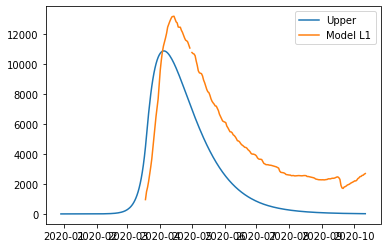

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.05734653839271147, 'other': 0.050000012340594625, 'school': 0.05410448257910943, 'transport': 0.2226086884549027, 'work': 0.268978514115437}


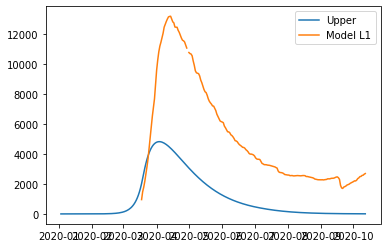

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.04683174769874082, 'other': 0.09119050346449142, 'school': 0.059172807001979244, 'transport': 0.22441977051144227, 'work': 0.23664983751991986}
33957.096644435514
21103.545010133814
error_groups 5736.575949021702
error_groups 4212.1327996098935
error_total 5644.104139082762
alpha: 0.9164627057929644 beta: 0.9164627057929644
error_total 3378.282442104784
alpha: 0.28344006880222006 beta: 0.28344006880222006
[7.44910343e+01 9.16462706e-01 2.48902816e-01 5.57947738e-02
 2.40214139e-02 2.20688223e-01 3.08224231e-02]
[7.18256707e+01 2.83440069e-01 2.39790138e-01 2.16109161e-03
 5.98436831e-02 2.23019392e-01 6.89569792e-02]
25590.95621271614
error_groups 5131.790932710966
error_total 4091.8330560010345
alpha: 1.6014683238171432 beta: 1.6014683238171432
[8.25094832e+01 1.60146832e+00 2.49860600e-01 5.18827331e-02
 1.06905666e-02 2.74805209e-01 9.92797694e-03]
25828.84280686659
e

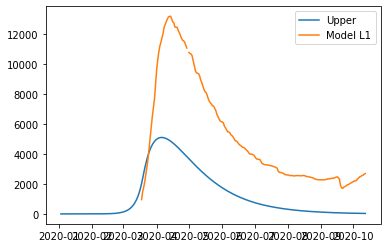

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.05579477375587814, 'other': 0.024021413860798792, 'school': 0.030822423050078526, 'transport': 0.22068822308264605, 'work': 0.24890281559827634}


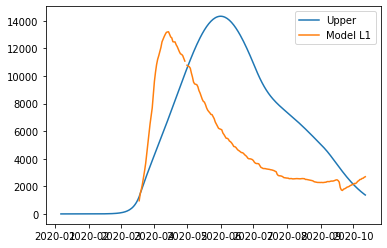

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0021610916127624835, 'other': 0.059843683052532154, 'school': 0.06895697924855598, 'transport': 0.2230193919802904, 'work': 0.23979013814109756}


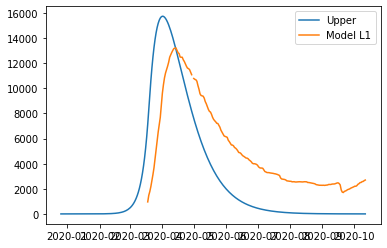

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.05188273313619925, 'other': 0.010690566606561959, 'school': 0.009927976937131697, 'transport': 0.27480520920236945, 'work': 0.2498606002404168}


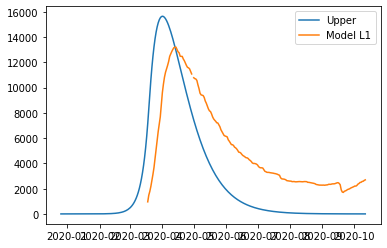

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.041407358829334585, 'other': 0.0696350436396756, 'school': 0.028541904339689513, 'transport': 0.27815495740347573, 'work': 0.28077000334913044}
23995.782299841525
error_groups 4650.997600272095
error_total 3868.9569399138863
alpha: 1.5945656296378554 beta: 1.5945656296378554
[7.95735834e+01 1.59456563e+00 2.41960336e-01 2.06652384e-02
 3.36299089e-02 2.17518212e-01 9.45013233e-02]
20458.60042751395
error_groups 4293.35563018635
error_total 3233.04895946552
alpha: 0.8661552835769417 beta: 0.8661552835769417
[7.99851729e+01 8.66155284e-01 2.55242182e-01 2.16560596e-02
 2.30993559e-02 2.70559794e-01 3.04455332e-02]
23340.430066195302
error_groups 4661.14978168623
error_total 3735.856056901815
alpha: 2.8977534813478365 beta: 2.8977534813478365
[8.07883135e+01 2.89775348e+00 2.38463733e-01 4.18370443e-02
 7.84688793e-02 2.70279667e-01 6.72681620e-02]
25720.580037627595
error_

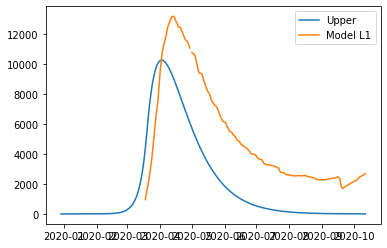

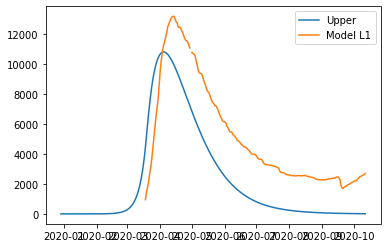

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.020665238387528418, 'other': 0.03362990889156782, 'school': 0.09450132334611172, 'transport': 0.21751821197596993, 'work': 0.2419603363390423}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.021656059564815186, 'other': 0.023099355940648415, 'school': 0.03044553321846802, 'transport': 0.27055979418821446, 'work': 0.2552421818944395}


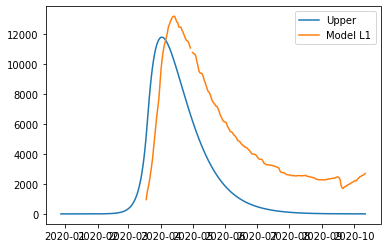

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.04183704425323005, 'other': 0.07846887926656378, 'school': 0.06726816201132785, 'transport': 0.2702796667705195, 'work': 0.23846373293742443}


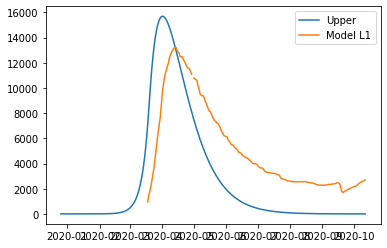

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.003990711945278259, 'other': 0.08135175878989082, 'school': 0.08902921389090845, 'transport': 0.2931723019206698, 'work': 0.243586933908058}
22599.004168934855
error_groups 4697.509843098742
error_total 3580.2988651672226
alpha: 1.165873709893271 beta: 1.165873709893271
[8.13892730e+01 1.16587371e+00 2.33078579e-01 2.95593111e-02
 8.45989814e-02 2.50059871e-01 3.11744275e-02]18657.017327529695

error_groups 4022.5693622243157
error_total 2926.8895930610756
alpha: 0.36156586707753524 beta: 0.36156586707753524
[7.30291158e+01 3.61565867e-01 2.48902816e-01 5.57947738e-02
 2.40214139e-02 2.20688223e-01 3.08224231e-02]
23349.143216192577
error_groups 4662.000918181371
error_total 3737.428459602241
alpha: 3.878079192440185 beta: 3.878079192440185
[8.05913351e+01 3.87807919e+00 2.76870888e-01 8.09476622e-03
 9.52545298e-02 2.22968104e-01 3.98441298e-03]
25830.595850707545
error

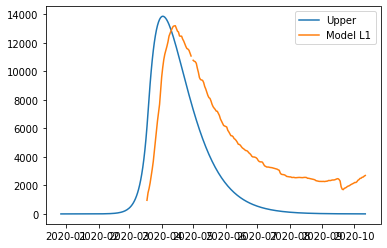

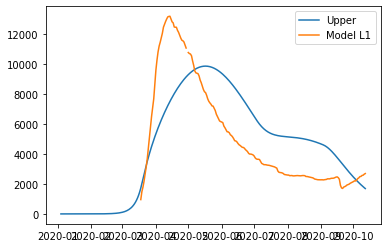

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.02955931108727233, 'other': 0.08459898144112982, 'school': 0.031174427516576255, 'transport': 0.2500598714860003, 'work': 0.2330785790348879}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.05579477375587814, 'other': 0.024021413860798792, 'school': 0.030822423050078526, 'transport': 0.22068822308264605, 'work': 0.24890281559827634}


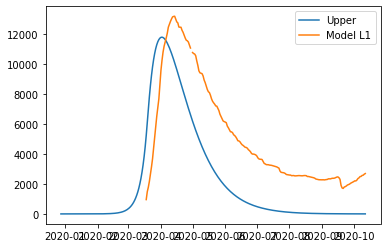

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.008094766215818353, 'other': 0.09525452975005919, 'school': 0.003984412983691954, 'transport': 0.22296810446271156, 'work': 0.27687088800877346}


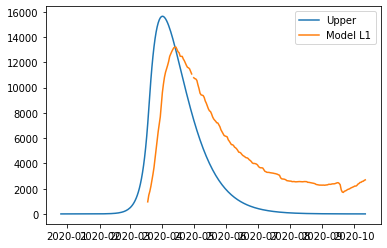

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.010336400690776897, 'other': 0.07525317926444107, 'school': 0.017066778014754314, 'transport': 0.27815495740347573, 'work': 0.27040108042680466}
23472.901835216253
error_groups 4468.107398878483
error_total 3800.9588872675536
alpha: 0.2709365806024002 beta: 0.2709365806024002
[7.19317712e+01 2.70936581e-01 2.61222973e-01 7.99025678e-02
 4.70948960e-02 2.52876180e-01 3.10423352e-02]


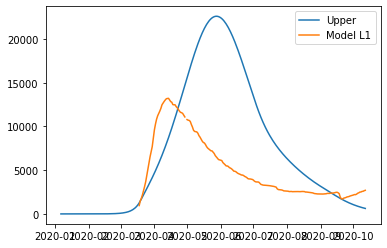

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07990256782224035, 'other': 0.04709489602132338, 'school': 0.031042335230405678, 'transport': 0.25287618021089964, 'work': 0.26122297262558036}
19575.118060896064
error_groups 3673.482213841216
error_total 3180.3271694109694
alpha: 0.4234832657949379 beta: 0.4234832657949379
[7.97720506e+01 4.23483266e-01 2.33944836e-01 2.39475699e-02
 7.73768506e-02 2.65457624e-01 4.82817208e-02]
23299.314333289825
error_groups 4657.219563008499
error_total 3728.4189540562647
alpha: 2.314049372123555 beta: 2.314049372123555
[8.04751142e+01 2.31404937e+00 2.40036327e-01 7.88144486e-02
 1.17145005e-02 2.60794797e-01 5.96547972e-02]
31807.77959033369
error_groups 5997.701339007895
error_total 5162.015650265159
alpha: 0.75772798592566 beta: 0.75772798592566
[8.34938023e+01 7.57727986e-01 2.39266414e-01 1.53945734e-02
 3.60522752e-02 2.62620453e-01 8.55915897e-02]


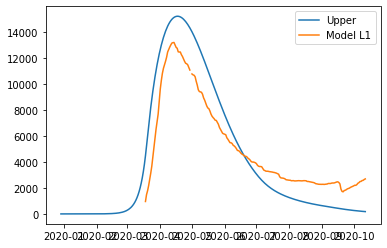

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.023947569927756526, 'other': 0.07737685055634008, 'school': 0.04828172078876658, 'transport': 0.2654576243171164, 'work': 0.2339448356818228}


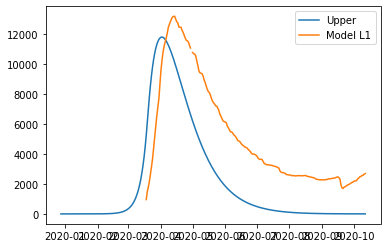

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.078814448646357, 'other': 0.011714500472688419, 'school': 0.05965479716407251, 'transport': 0.26079479674411227, 'work': 0.24003632683411508}


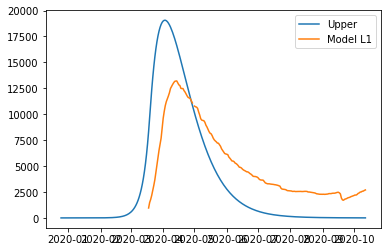

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.015394573415121342, 'other': 0.03605227521027997, 'school': 0.08559158971694047, 'transport': 0.2626204530968395, 'work': 0.23926641395955917}
15249.694711849828
22732.4877565456
error_groups 3802.115315797535
error_groups 4603.859995610059
error_total 2289.5158792104585
error_total 3625.7255521871084
alpha: 1.40977294784422 beta: 1.40977294784422
alpha: 0.529631113579552 beta: 0.529631113579552
[8.01691926e+01 1.40977295e+00 2.32005427e-01 5.84278512e-02
 8.38639172e-02 2.17518212e-01 9.45013233e-02][8.08391948e+01 5.29631114e-01 2.41520634e-01 6.36284165e-03
 6.85500816e-02 2.43128289e-01 3.69960865e-02]

15634.857604289582
error_groups 3907.9303118000807
error_total 2345.3854584979003
alpha: 0.6067335817461577 beta: 0.6067335817461577
[8.05638443e+01 6.06733582e-01 2.00732192e-01 3.66731140e-03
 8.70263356e-02 2.75111775e-01 1.71140884e-02]


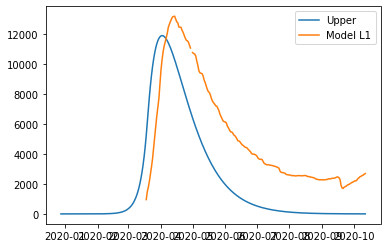

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}


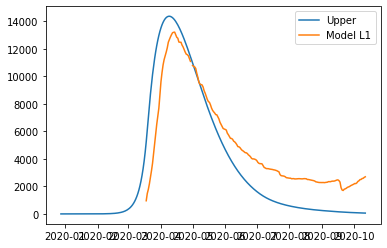

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.05842785122994655, 'other': 0.08386391724279127, 'school': 0.09450132334611172, 'transport': 0.21751821197596993, 'work': 0.2320054273134698}
{'home': 1.0, 'leisure': 0.006362841645867999, 'other': 0.06855008163770525, 'school': 0.0369960864506458, 'transport': 0.24312828899664074, 'work': 0.241520634244291}


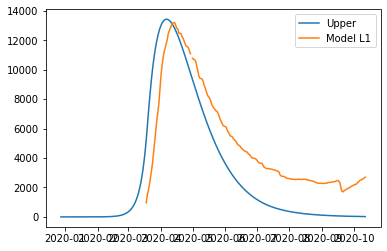

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0036673114028952375, 'other': 0.0870263356069193, 'school': 0.017114088448579506, 'transport': 0.2751117748604234, 'work': 0.20073219249276963}
20516.83010016366
error_groups 4303.706329827555
error_total 3242.624754067221
alpha: 0.8760074168817029 beta: 0.8760074168817029
[7.96336142e+01 8.76007417e-01 2.64616193e-01 1.90657471e-02
 1.98063957e-02 2.22608688e-01 6.53945017e-02]


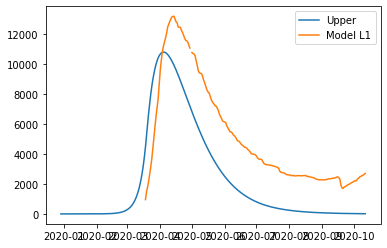

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0190657470966365, 'other': 0.019806395675885026, 'school': 0.06539450172560196, 'transport': 0.2226086884549027, 'work': 0.26461619335826453}
20258.81535727818
error_groups 4365.9322554743285
error_total 3178.5766203607704
alpha: 0.8719312095728331 beta: 0.8719312095728331
[8.06507218e+01 8.71931210e-01 2.04766011e-01 2.84067965e-02
 9.62180886e-02 2.38073090e-01 2.01131399e-02]
19262.035472045376
error_groups 3906.4365405051276
error_total 3071.1197863080497
alpha: 0.2802654345729594 beta: 0.2802654345729594
[7.22524290e+01 2.80265435e-01 2.44713644e-01 3.87743681e-02
 4.62053746e-02 2.13371313e-01 2.82757126e-02]


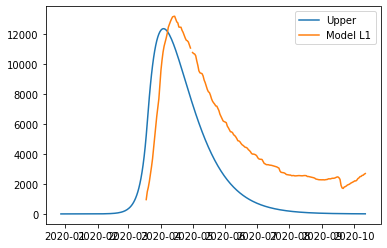

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.028406796507345473, 'other': 0.09621808855241545, 'school': 0.02011313992350477, 'transport': 0.23807308997469726, 'work': 0.20476601115098056}


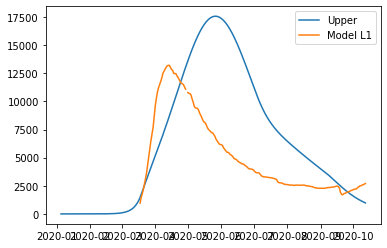

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.03877436805659641, 'other': 0.04620537458217161, 'school': 0.028275712565009405, 'transport': 0.2133713134561437, 'work': 0.2447136444410021}
19155.195344824468
error_groups 4284.788664273002
error_total 2974.0813361102933
alpha: 0.9100061690358521 beta: 0.9100061690358521
[8.07712063e+01 9.10006169e-01 2.94313691e-01 8.01042005e-03
 7.60259416e-02 2.55478204e-01 5.90648526e-02]
20682.36785226903
error_groups 4214.811906138204
error_total 3293.5111892261652
alpha: 0.291214788723303 beta: 0.291214788723303
[7.73378559e+01 2.91214789e-01 2.29245181e-01 1.48295003e-02
 3.91783575e-02 2.30553154e-01 7.94537411e-03]
17565.62897020318
error_groups 3528.880610686807
error_total 2807.3496719032746
alpha: 0.4234832657949379 beta: 0.4234832657949379
[7.97720506e+01 4.23483266e-01 2.58173237e-01 3.38997998e-02
 4.24795987e-02 2.11388453e-01 3.38169882e-02]
16846.69120904823
error_g

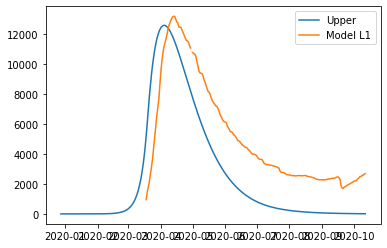

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.008010420048609697, 'other': 0.07602594157789672, 'school': 0.059064852560840625, 'transport': 0.25547820436565716, 'work': 0.29431369073445607}


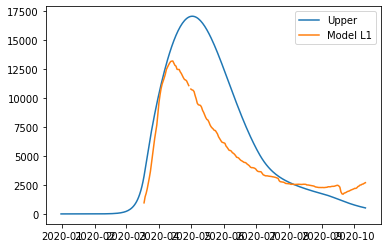

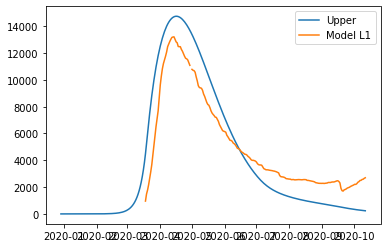

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.014829500310342796, 'other': 0.039178357495716035, 'school': 0.007945374111707593, 'transport': 0.23055315449741204, 'work': 0.22924518105475425}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.03389979978156479, 'other': 0.042479598736943236, 'school': 0.03381698822401208, 'transport': 0.21138845277620683, 'work': 0.2581732366126311}


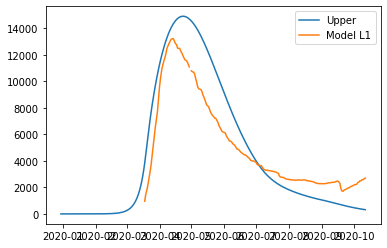

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.004262164888858153, 'other': 0.05842709987491456, 'school': 0.05635250621081931, 'transport': 0.26368407235073826, 'work': 0.23066913800022099}
25726.085697439477
error_groups 5144.970252315348
error_total 4116.223089024827
alpha: 1.8722535617832883 beta: 1.8722535617832883
[8.24626100e+01 1.87225356e+00 2.43586934e-01 4.64111343e-02
 6.82688803e-02 2.82918175e-01 6.95766716e-02]
17624.433605127288
error_groups 3853.7708268612905
error_total 2754.1325556531992
alpha: 0.43749626191859914 beta: 0.43749626191859914
[7.44287263e+01 4.37496262e-01 2.20113573e-01 4.68317477e-02
 9.92439842e-02 2.73710359e-01 5.33676114e-02]


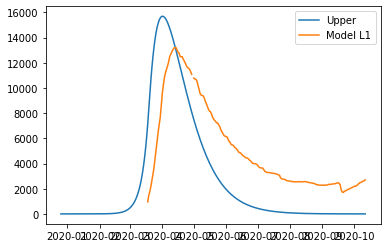

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.046411134280671104, 'other': 0.06826888031724804, 'school': 0.06957667155524117, 'transport': 0.28291817459680557, 'work': 0.243586933908058}


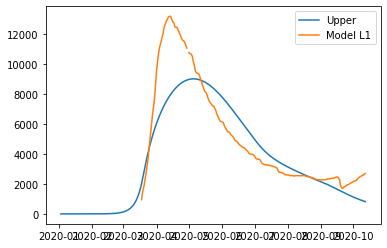

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.04683174769874082, 'other': 0.09924398419282937, 'school': 0.053367611365831596, 'transport': 0.27371035876875016, 'work': 0.22011357341610865}
20703.078474205882
error_groups 4417.919263835595
error_total 3257.0318420740573
alpha: 0.9804516076622505 beta: 0.9804516076622505
[8.03535692e+01 9.80451608e-01 2.49911978e-01 1.71078546e-02
 8.48622226e-02 2.38408619e-01 1.10358486e-02]
19831.853213932678
error_groups 3962.140369665626
error_total 3173.9425688534106
alpha: 0.291214788723303 beta: 0.291214788723303
21008.2079950399
[7.20705505e+01 2.91214789e-01 2.29245181e-01 8.43612096e-02
 4.93943019e-02 2.59041720e-01 1.68796761e-02]error_groups 4148.97440323078

error_total 3371.846718361824
alpha: 0.30483377016644186 beta: 0.30483377016644186
[7.29365052e+01 3.04833770e-01 2.44252188e-01 6.91595390e-02
 7.08481482e-02 2.81518956e-01 9.33694744e-02]11964.09607422425

error

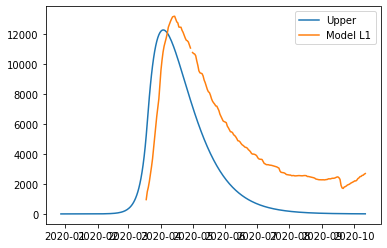

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.017107854642421462, 'other': 0.08486222255764206, 'school': 0.011035848589673818, 'transport': 0.23840861899036014, 'work': 0.24991197802680956}


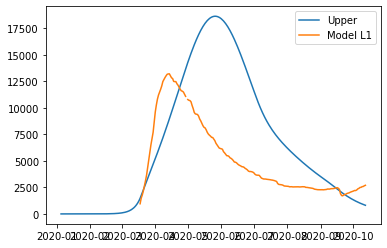

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.08436120955416168, 'other': 0.04939430191623422, 'school': 0.01687967613524107, 'transport': 0.2590417202740488, 'work': 0.22924518105475425}


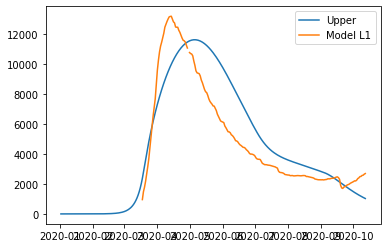

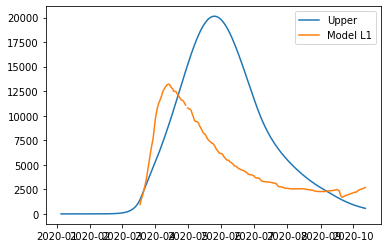

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.01399366341524446, 'other': 0.05842709987491456, 'school': 0.019222714607014135, 'transport': 0.25195925487234155, 'work': 0.25701508638053744}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.06915953903668137, 'other': 0.07084814823066311, 'school': 0.09336947436866838, 'transport': 0.281518955767916, 'work': 0.2442521876001988}


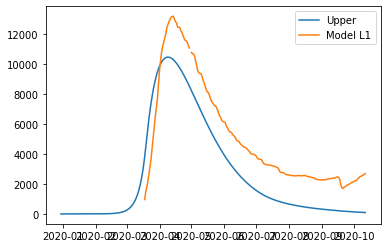

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.015477575615567188, 'other': 0.09054042233578329, 'school': 0.038051871658419036, 'transport': 0.2786386808839093, 'work': 0.2943298918194431}


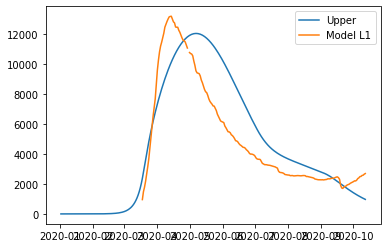

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.01762876082284231, 'other': 0.04915051897109712, 'school': 0.03885821023095723, 'transport': 0.22535409188509936, 'work': 0.24831901734838183}


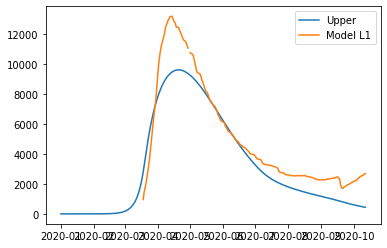

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.005086661230965739, 'other': 0.08822282311947584, 'school': 0.04732388713634375, 'transport': 0.2197703623948817, 'work': 0.23584362300251896}
20156.037955725606
error_groups 4374.715347912676
error_total 3156.264521562586
alpha: 0.9060179202551966 beta: 0.9060179202551966
[8.02574834e+01 9.06017920e-01 2.50220319e-01 5.28766073e-02
 4.37113087e-02 2.26111594e-01 6.29129242e-02]
20072.583676801045
error_groups 4253.16328875109
error_total 3163.884077609991
alpha: 0.7994393589406792 beta: 0.7994393589406792
[7.97660814e+01 7.99439359e-01 2.31015011e-01 4.20988342e-03
 4.99250168e-02 2.58538566e-01 6.34510251e-03]
24303.865474973132
error_groups 4686.623546345406
error_total 3923.448385725545
alpha: 2.219700526028165 beta: 2.219700526028165
[7.93925978e+01 2.21970053e+00 2.51882850e-01 8.69284045e-02
 8.13893093e-02 2.85230822e-01 2.53545989e-02]


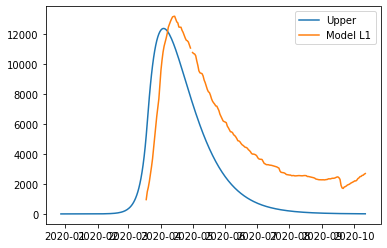

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0528766073258824, 'other': 0.04371130874788877, 'school': 0.06291292417139055, 'transport': 0.22611159447266488, 'work': 0.25022031852211624}


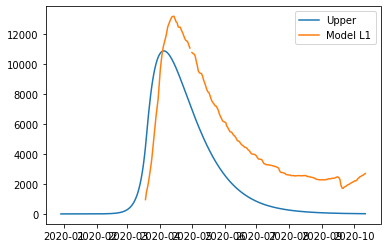

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.004209883415984633, 'other': 0.04992501680219083, 'school': 0.006345102513220062, 'transport': 0.25853856574552564, 'work': 0.23101501105732214}


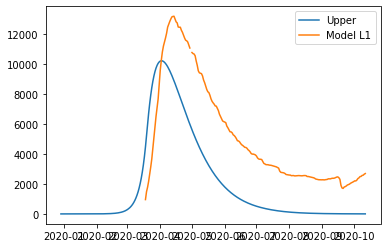

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0869284044813067, 'other': 0.08138930934039235, 'school': 0.02535459886293775, 'transport': 0.285230822129969, 'work': 0.2518828504553033}
13851.302204074847
error_groups 3684.9455101372623
error_total 2033.271338787517
alpha: 0.5995391954970819 beta: 0.5995391954970819
[7.93293830e+01 5.99539195e-01 2.29010385e-01 1.40028585e-03
 9.94158753e-02 2.30822669e-01 6.95465194e-02]


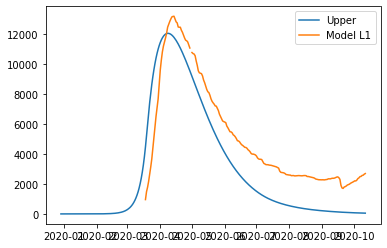

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0014002858497016851, 'other': 0.09941587528257179, 'school': 0.06954651940270114, 'transport': 0.23082266871823745, 'work': 0.22901038462617304}
17333.592591179244
error_groups 3828.574226639056
14548.994354187416
error_total 2701.0036729080375
alpha: 0.5061073719510749 beta: 0.5061073719510749
error_groups 3753.330980528991
21603.231466343954
[7.68583134e+01 5.06107372e-01 2.52881435e-01 4.99719531e-03
 7.82367240e-02 2.50853885e-01 2.18581120e-02]error_total 2159.1326747316853

alpha: 0.7044545349188411 beta: 0.7044545349188411
error_groups 4498.348708364281
[7.98488022e+01 7.04454535e-01 2.93154059e-01 8.43612096e-02
 8.59821925e-02 2.59041720e-01 9.81159496e-03]error_total 3420.976551595935

alpha: 1.1453423505218874 beta: 1.1453423505218874
[8.01191267e+01 1.14534235e+00 2.42768288e-01 7.15837587e-02
 9.38303231e-02 2.73849693e-01 9.51900375e-02]
15319.39077382324
e

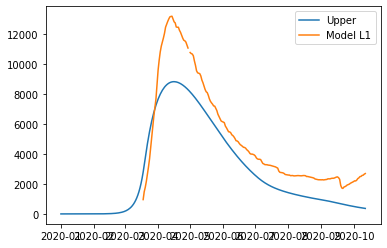

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.004997195311015057, 'other': 0.07823672397608461, 'school': 0.021858112039181123, 'transport': 0.2508538851761097, 'work': 0.25288143518897566}


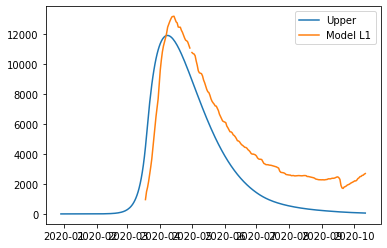

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}


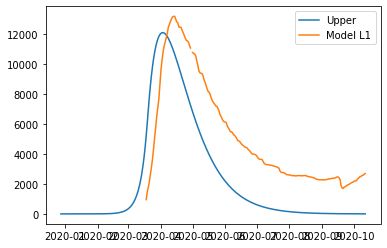

{'home': 1.0, 'leisure': 0.08436120955416168, 'other': 0.08598219252856643, 'school': 0.009811594963623618, 'transport': 0.2590417202740488, 'work': 0.29315405927940724}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0715837587419503, 'other': 0.09383032309963198, 'school': 0.09519003749405247, 'transport': 0.2738496930358649, 'work': 0.24276828824431043}
23288.02839426756
error_groups 4765.353083524145
error_total 3704.535062148683
alpha: 1.443462464085452 beta: 1.443462464085452
[8.12358795e+01 1.44346246e+00 2.34216207e-01 1.32079181e-02
 4.34472075e-02 2.38635571e-01 3.14924046e-02]


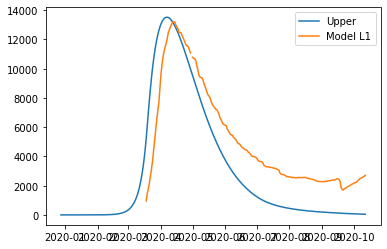

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.014668206802422527, 'other': 0.010531466235178998, 'school': 0.02997902112045786, 'transport': 0.24102424298049535, 'work': 0.2898824969907582}


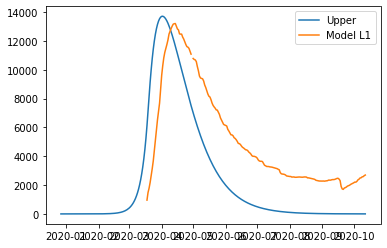

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.01320791812545593, 'other': 0.043447207503802404, 'school': 0.03149240462548517, 'transport': 0.23863557142605238, 'work': 0.23421620667011245}
16307.068606060591
error_groups 3796.872892581958
error_total 2502.0391426957267
alpha: 0.5799157836063962 beta: 0.5799157836063962
[7.81430666e+01 5.79915784e-01 2.07128204e-01 1.05536828e-02
 7.88850600e-02 2.55296608e-01 4.30726337e-02]
19801.347450794274
error_groups 4373.1383928693895
error_total 3085.6418115849765
alpha: 0.6787342458487229 beta: 0.6787342458487229
[8.19752478e+01 6.78734246e-01 2.95664353e-01 3.22405586e-02
 6.52198917e-02 2.39778510e-01 5.44889598e-02]
16735.003206927337
error_groups 3547.893974820102
error_total 2637.421846421447
alpha: 0.272120261164275 beta: 0.272120261164275
[7.32355144e+01 2.72120261e-01 2.30256516e-01 8.34531083e-03
 6.07357401e-02 2.22765887e-01 5.72228024e-03]


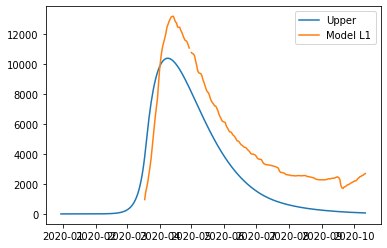

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.010553682834477357, 'other': 0.07888505996451074, 'school': 0.04307263370670279, 'transport': 0.2552966076521936, 'work': 0.20712820400168394}


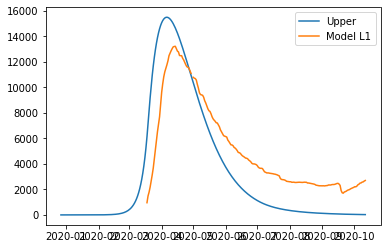

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.032240558617539924, 'other': 0.06521989169122175, 'school': 0.05448895979153361, 'transport': 0.2397785098373398, 'work': 0.29566435262689233}


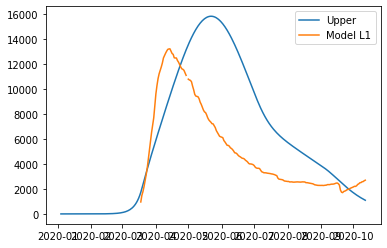

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.008345310830390647, 'other': 0.0607357401065971, 'school': 0.005722280237096478, 'transport': 0.2227658869539003, 'work': 0.23025651610167103}
18180.359054831162
18644.098771462806
error_groups 3873.7830575133084
error_groups 3928.5774364727854
error_total 2850.3563236716755
error_total 2954.0631427898998
alpha: 0.256139673577751 beta: 0.256139673577751
alpha: 0.4371960747178498 beta: 0.4371960747178498
[7.48683843e+01 2.56139674e-01 2.44841321e-01 1.09008671e-02
 3.28277272e-02 2.59225360e-01 2.90909712e-02][7.50889317e+01 4.37196075e-01 2.57873200e-01 2.16109161e-03
 4.69625130e-02 2.40028566e-01 4.34999510e-02]

13559.174025561326
error_groups 3191.5050334417647
error_total 2073.5337984239122
alpha: 0.3485355828241936 beta: 0.3485355828241936
[7.54245014e+01 3.48535583e-01 2.45351314e-01 1.76287608e-02
 9.11994516e-02 2.63896064e-01 5.96878497e-02]


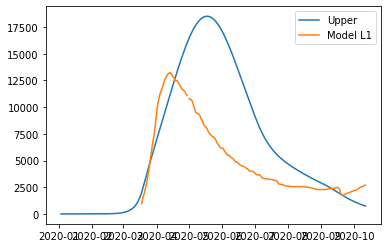

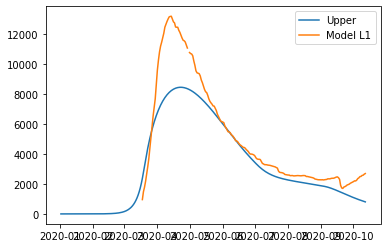

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.01090086714938373, 'other': 0.03282772720672386, 'school': 0.029090971187596678, 'transport': 0.25922536018619163, 'work': 0.24484132141509057}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0021610916127624835, 'other': 0.04696251300780611, 'school': 0.04349995098814024, 'transport': 0.2400285657060741, 'work': 0.25787320027124977}
16065.484955139018
error_groups 3887.794246691105
error_total 2435.5381416895825
alpha: 0.6933055627490858 beta: 0.6933055627490858
10035.474391065096
[7.95200982e+01 6.93305563e-01 2.57724428e-01 2.81838681e-02
 9.15128395e-02 2.69328163e-01 2.03173569e-02]error_groups 3122.1987715941077

error_total 1382.6551238941977
alpha: 0.4584395005486517 beta: 0.4584395005486517
[7.83242372e+01 4.58439501e-01 2.66444314e-01 6.89034540e-03
 9.00091243e-02 2.30931985e-01 5.06477955e-0

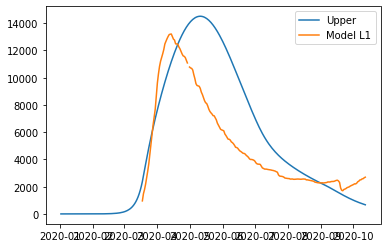

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.01762876082284231, 'other': 0.09119945162636169, 'school': 0.05968784974368492, 'transport': 0.2638960644074311, 'work': 0.24535131406364583}
11412.69538670794
15719.85825897076
error_groups 3534.6210752702846
error_groups 3109.9008411380514
error_total 2437.0474367400952
error_total 1660.5589091139777
alpha: 0.3486318041132874 beta: 0.3486318041132874
alpha: 0.35392500937045757 beta: 0.35392500937045757
[7.79665756e+01 3.48631804e-01 2.25243465e-01 3.83032082e-02
 5.83131885e-02 2.74898018e-01 2.85007593e-02][7.69299283e+01 3.53925009e-01 2.40960315e-01 7.00606532e-02
 8.29524956e-03 2.27452590e-01 5.14450250e-02]



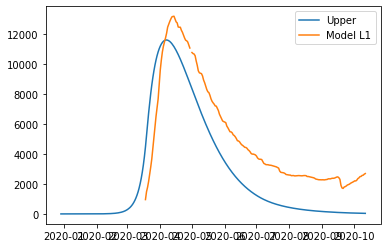

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.028183868134292828, 'other': 0.09151283953487088, 'school': 0.020317356941968803, 'transport': 0.26932816280082017, 'work': 0.257724427550627}


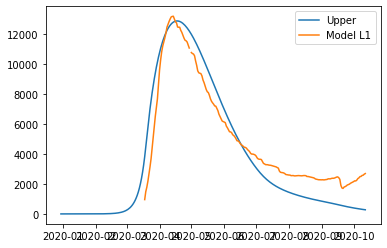

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.006890345400405916, 'other': 0.09000912427215335, 'school': 0.05064779549604303, 'transport': 0.23093198525527106, 'work': 0.2664443139612684}
12472.757555148382
error_groups 3069.902543702647
error_total 1880.5710022891471
alpha: 0.37951515304721495 beta: 0.37951515304721495
[7.62502316e+01 3.79515153e-01 2.74359430e-01 4.86311780e-02
 6.92332909e-02 2.63797549e-01 1.98948227e-02]
12627.946120684002
error_groups 3607.6873161519325
error_total 1804.051760906414
alpha: 0.5940010709887156 beta: 0.5940010709887156
[7.91757474e+01 5.94001071e-01 2.72600580e-01 2.69177652e-02
 8.13893093e-02 2.27263858e-01 2.53545989e-02]


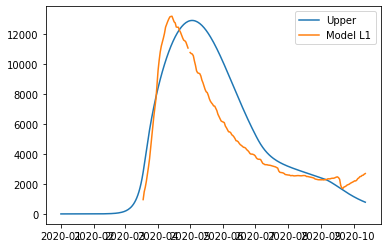

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07006065324613503, 'other': 0.008295249555193882, 'school': 0.051445025016616235, 'transport': 0.22745258978093116, 'work': 0.24096031547474672}


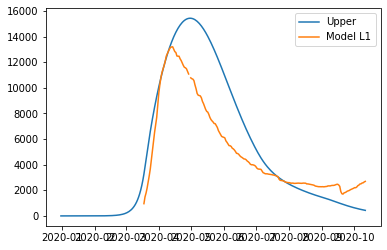

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.03830320815928254, 'other': 0.05831318845349651, 'school': 0.028500759259891012, 'transport': 0.27489801759300253, 'work': 0.22524346462137512}
15775.098297991988
error_groups 3754.65083635612
error_total 2404.0894923271735
alpha: 0.7043744872768398 beta: 0.7043744872768398
[7.86686702e+01 7.04374487e-01 2.96800848e-01 9.74839543e-02
 9.74201559e-02 2.28916603e-01 2.72997747e-02]


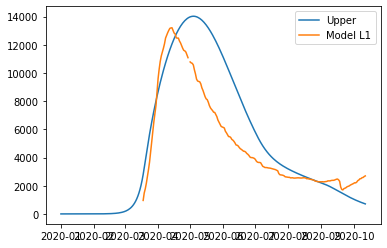

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.04863117802674079, 'other': 0.06923329087652809, 'school': 0.01989482274423158, 'transport': 0.263797549219387, 'work': 0.27435943020281606}


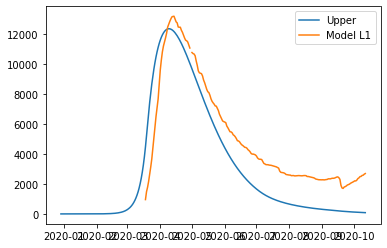

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.026917765180625386, 'other': 0.08138930934039235, 'school': 0.02535459886293775, 'transport': 0.2272638577130957, 'work': 0.27260058015045174}
10745.529086139506
error_groups 3456.9621995592697
error_total 1457.7133773160472
alpha: 0.5106607312497979 beta: 0.5106607312497979
[7.93183219e+01 5.10660731e-01 2.54792089e-01 5.12774447e-02
 4.96505680e-02 2.60267694e-01 1.15596538e-02]


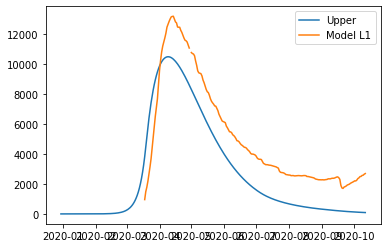

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.09748395427475383, 'other': 0.09742015586021098, 'school': 0.027299774743743718, 'transport': 0.22891660288403803, 'work': 0.2968008478214318}


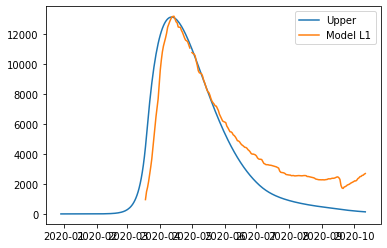

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.051277444727841875, 'other': 0.049650567994705165, 'school': 0.01155965375431238, 'transport': 0.2602676938791114, 'work': 0.25479208949937787}
9563.081503460775
error_groups 3176.2823386460154
error_total 1277.359832962952
alpha: 0.443468158655405 beta: 0.443468158655405
[7.72819839e+01 4.43468159e-01 2.38442049e-01 1.58156764e-02
 7.36466239e-02 2.45788128e-01 5.68707371e-02]
9307.339400033694
14346.524965429497
error_groups 3644.476756612093
error_groups 3175.452236201741
error_total 2140.4096417634805
error_total 1226.3774327663907
alpha: 0.5584298382441364 beta: 0.5584298382441364
alpha: 0.48029476578416075 beta: 0.48029476578416075
[7.84182291e+01 5.58429838e-01 2.59461104e-01 6.61081294e-03
 5.87976885e-02 2.47641889e-01 3.09681267e-02][7.86741764e+01 4.80294766e-01 2.87836324e-01 2.57249320e-02
 7.70218436e-02 2.02939720e-01 2.79486644e-02]



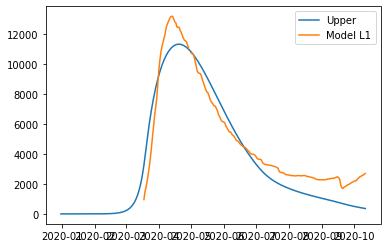

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.015815676414253105, 'other': 0.07364662389214074, 'school': 0.05687073711815789, 'transport': 0.24578812845692177, 'work': 0.23844204919546977}


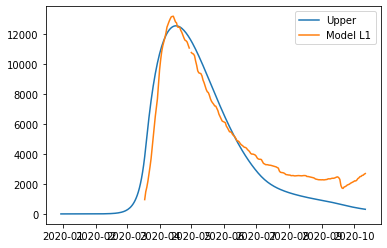

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.025724932015586146, 'other': 0.07702184358136291, 'school': 0.02794866439839513, 'transport': 0.2029397204688272, 'work': 0.28783632421787775}


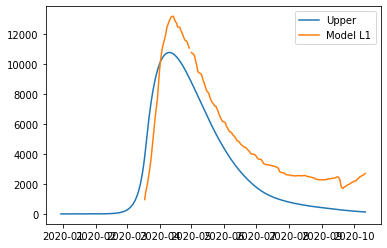

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.006610812936683502, 'other': 0.05879768849678485, 'school': 0.03096812668979459, 'transport': 0.247641889340807, 'work': 0.25946110360378355}
12055.27426220845
error_groups 3620.3039879664866
error_total 1686.9940548483926
alpha: 0.5323560963796115 beta: 0.5323560963796115
[7.95320393e+01 5.32356096e-01 2.47929632e-01 1.32079181e-02
 4.34472075e-02 2.23484171e-01 8.15500649e-02]


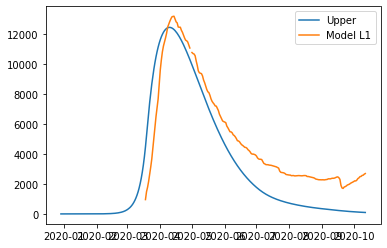

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.01320791812545593, 'other': 0.043447207503802404, 'school': 0.0815500649498504, 'transport': 0.223484171134162, 'work': 0.24792963168892768}
19059.1266931957
error_groups 4270.199546706036
error_total 2957.7854292979328
alpha: 0.8760074168817029 beta: 0.8760074168817029
[8.03016122e+01 8.76007417e-01 2.75834699e-01 3.16554876e-02
 7.97470215e-02 2.54871826e-01 3.48074893e-02]
11147.23083892177
error_groups 3129.8425683122937
error_total 1603.4776541218955
alpha: 0.46117578708489604 beta: 0.46117578708489604
[7.86766959e+01 4.61175787e-01 2.96696213e-01 3.22405586e-02
 6.52198917e-02 2.51080041e-01 4.80076827e-02]


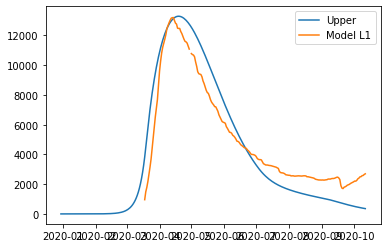

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.032240558617539924, 'other': 0.06521989169122175, 'school': 0.048007682725364174, 'transport': 0.25108004112758703, 'work': 0.2966962133180629}


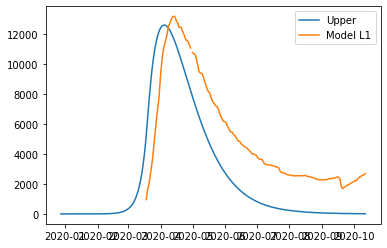

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.031655487580675074, 'other': 0.07974702149075846, 'school': 0.03480748925508834, 'transport': 0.2548718258297769, 'work': 0.27583469867026195}
11969.236371876872
error_groups 3165.5460169523353
error_total 1760.7380709849072
alpha: 0.3939078088151635 beta: 0.3939078088151635
[7.58493385e+01 3.93907809e-01 2.66444314e-01 5.80016692e-02
 6.51836583e-02 2.34189107e-01 1.61296622e-02]


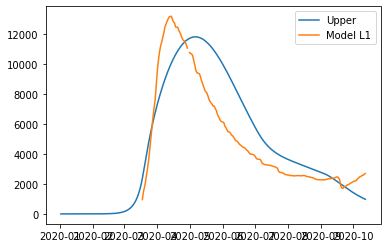

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.05800166915946236, 'other': 0.06518365827125339, 'school': 0.01612966219623057, 'transport': 0.23418910712426166, 'work': 0.2664443139612684}
16177.790009670602
error_groups 3421.066960372757
error_total 2551.344609859569
alpha: 0.4684921974255434 beta: 0.4684921974255434
[7.98330380e+01 4.68492197e-01 2.89445152e-01 4.99719531e-03
 8.48622226e-02 2.48814681e-01 3.04057941e-02]


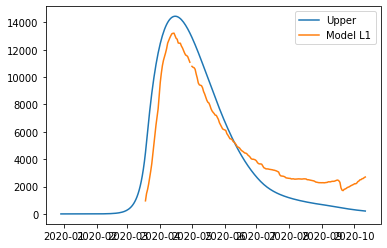

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.004997195311015057, 'other': 0.08486222255764206, 'school': 0.030405794146961613, 'transport': 0.24881468074214685, 'work': 0.28944515162788703}
11560.38304180195
error_groups 3329.0770908175423
error_total 1646.2611901968817
14690.791332645762
error_groups 3853.0297615988425
alpha: 0.47135774591021007 beta: 0.47135774591021007
error_total 2167.552314209384
[7.67179888e+01 4.71357746e-01 2.93439107e-01 3.78510098e-02
 7.64251968e-02 2.04018323e-01 5.69664951e-02]alpha: 0.5877339682282481 beta: 0.5877339682282481

[8.01566963e+01 5.87733968e-01 2.75394870e-01 6.09897344e-02
 4.15181247e-02 2.05691572e-01 3.73542417e-02]


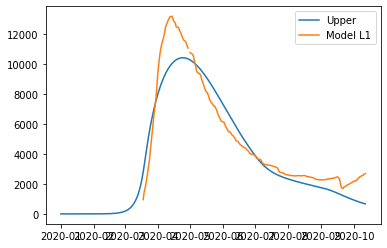

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}


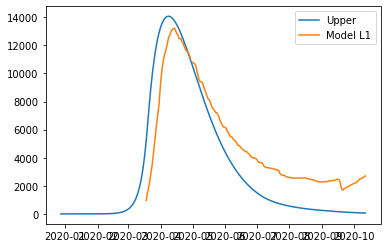

{'home': 1.0, 'leisure': 0.03785100983881791, 'other': 0.0764251967622665, 'school': 0.05696649510097107, 'transport': 0.20401832322717728, 'work': 0.29343910723050026}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.06098973444528491, 'other': 0.04151812466557687, 'school': 0.03735424165996729, 'transport': 0.20569157225791643, 'work': 0.27539486953497233}
9257.354675354476
error_groups 3165.7116429195075
error_total 1218.3286064869935
alpha: 0.4584395005486517 beta: 0.4584395005486517
[7.83242372e+01 4.58439501e-01 2.68245980e-01 1.23023144e-03
 8.27994622e-02 2.30931985e-01 2.66252823e-02]
18508.664069658113
error_groups 4209.743705537941
error_total 2859.7840728240344
8922.952282047987
alpha: 0.8319591569479545 beta: 0.8319591569479545
[8.09500352e+01 8.31959157e-01 2.61134009e-01 6.59189413e-02
 9.15852528e-02 2.21083537e-01 1.85323813e-02]
error_groups 3179.23158822769
error_total 1148.7441387640597
alpha: 0.465

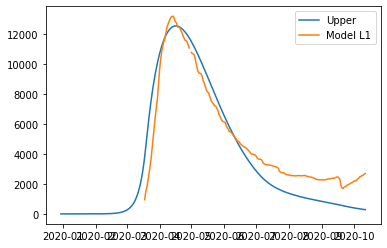

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0012302314374465634, 'other': 0.08279946221171669, 'school': 0.02662528225042542, 'transport': 0.23093198525527106, 'work': 0.26824598041180897}
11904.543552123894
error_groups 3094.4047785603334
error_total 1762.0277547127125
alpha: 0.3503449032299273 beta: 0.3503449032299273
[7.76697513e+01 3.50344903e-01 2.75453349e-01 1.25707601e-02
 3.51078975e-02 2.30308414e-01 7.65102055e-03]


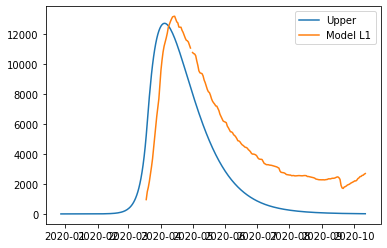

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.06591894125003148, 'other': 0.09158525283295706, 'school': 0.01853238131596873, 'transport': 0.22108353731087219, 'work': 0.26113400932981995}


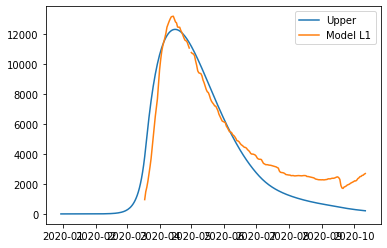

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.005086661230965739, 'other': 0.09301480984447143, 'school': 0.0332959061281643, 'transport': 0.2664425429116884, 'work': 0.23584362300251896}
8812.68623943319
error_groups 3203.4775723356356
error_total 1121.8417334195108
alpha: 0.5055594833961221 beta: 0.5055594833961221
[7.89759073e+01 5.05559483e-01 2.72585737e-01 4.09738082e-02
 9.43012038e-02 2.05056487e-01 3.39201353e-03]
13933.139226414394


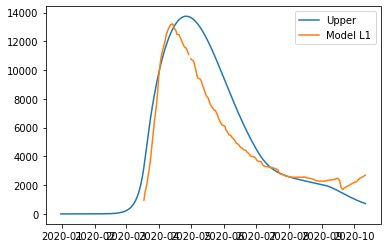

error_groups 3693.263552084941
error_total 2047.975134865891
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.012570760080523671, 'other': 0.03510789753011212, 'school': 0.00765102054923341, 'transport': 0.23030841390023366, 'work': 0.27545334932107896}
alpha: 0.6898840166315985 beta: 0.6898840166315985
[7.99318070e+01 6.89884017e-01 2.87478926e-01 9.71260640e-02
 9.31244977e-02 2.22540973e-01 2.47255224e-02]
13034.631347298418
error_groups 3148.2624198113176
error_total 1977.2737854974202
alpha: 0.3324649813672167 beta: 0.3324649813672167
[7.55439568e+01 3.32464981e-01 2.61811074e-01 1.94374765e-03
 8.13893093e-02 2.19877791e-01 4.37700100e-02]


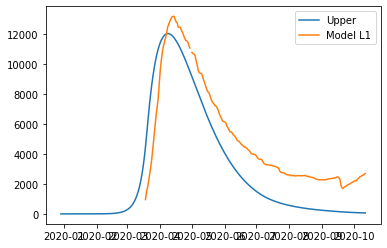

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.09712606401310804, 'other': 0.09312449766615814, 'school': 0.024725522366512917, 'transport': 0.22254097256240782, 'work': 0.2874789262082777}


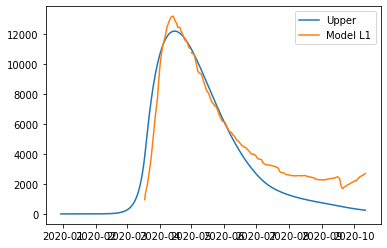

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.04097380817152027, 'other': 0.09430120378586618, 'school': 0.0033920135260221626, 'transport': 0.20505648720787445, 'work': 0.2725857365107376}
13264.413753310975
error_groups 3660.216225890441
error_total 1920.839505484107
alpha: 0.5868753143503618 beta: 0.5868753143503618
[7.92804277e+01 5.86875314e-01 2.66987207e-01 4.36557176e-02
 5.21303609e-02 2.16731259e-01 1.16692094e-02]


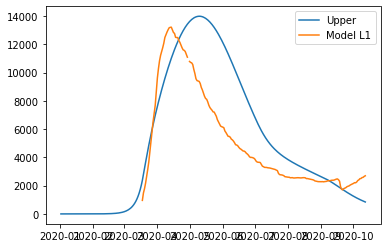

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0019437476460418476, 'other': 0.08138930934039235, 'school': 0.04377001004292489, 'transport': 0.2198777910374083, 'work': 0.26181107399623316}


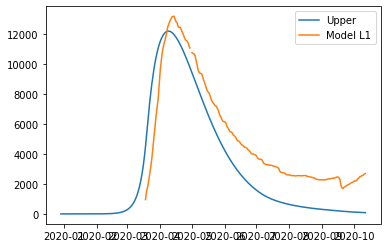

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.04365571763426277, 'other': 0.052130360948430134, 'school': 0.011669209425806418, 'transport': 0.21673125870253787, 'work': 0.26698720650793595}
11892.06871096816
error_groups 3371.045480248586
error_total 1704.204646143915
alpha: 0.5012499532442649 beta: 0.5012499532442649
[7.78886083e+01 5.01249953e-01 2.72773669e-01 4.24929695e-02
 6.57629586e-02 2.11499501e-01 2.87493551e-02]


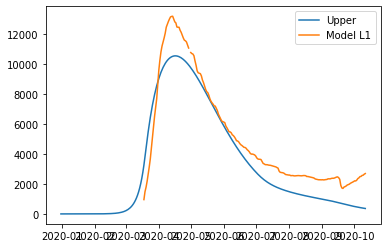

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.04249296945934559, 'other': 0.06576295862097226, 'school': 0.028749355057226162, 'transport': 0.2114995012812205, 'work': 0.2727736687691267}
11107.044969417195
error_groups 3006.1646955990072
error_total 1620.1760547636377
alpha: 0.41766763033929455 beta: 0.41766763033929455
[7.76568771e+01 4.17667630e-01 2.43698697e-01 4.32182103e-02
 7.60259416e-02 2.55478204e-01 8.97539040e-02]
10864.445173925895
error_groups 3460.4808526821807
error_total 1480.792864248743
alpha: 0.4584395005486517 beta: 0.4584395005486517
[7.83349294e+01 4.58439501e-01 2.82563567e-01 1.23023144e-03
 1.38131745e-02 2.30931985e-01 2.54299822e-02]


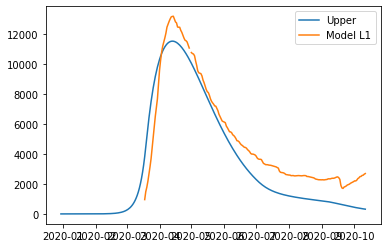

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0012302314374465634, 'other': 0.013813174500503969, 'school': 0.02542998224640719, 'transport': 0.23093198525527106, 'work': 0.28256356695485435}


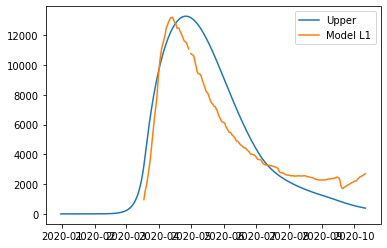

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.043218210338763594, 'other': 0.07602594157789672, 'school': 0.08975390403619322, 'transport': 0.25547820436565716, 'work': 0.24369869708495473}
12724.058692471855
error_groups 3539.739603943376
error_total 1836.8638177056957
alpha: 0.5443818017330022 beta: 0.5443818017330022
[7.89713905e+01 5.44381802e-01 2.77167055e-01 6.26846710e-02
 2.27048155e-02 2.02245316e-01 4.30704967e-02]
11416.18551490937
error_groups 3501.2169019199755
error_total 1582.9937225978788
alpha: 0.5770068622624711 beta: 0.5770068622624711
[7.99021764e+01 5.77006862e-01 2.32382517e-01 9.74839543e-02
 8.10046444e-02 2.28916603e-01 7.52273098e-03]
10685.938760021865
error_groups 2946.1070065363137
error_total 1547.96635069711
alpha: 0.39964505001124206 beta: 0.39964505001124206
[7.62136297e+01 3.99645050e-01 2.35614770e-01 3.89362892e-02
 9.86595480e-02 2.18750411e-01 2.56207088e-02]
11271.990215422009

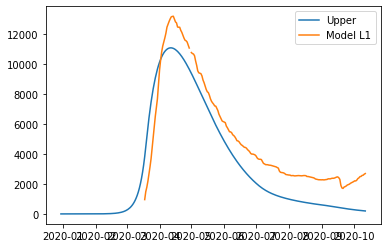

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.06268467102832953, 'other': 0.022704815480560737, 'school': 0.04307049666681687, 'transport': 0.20224531565030865, 'work': 0.2771670553900748}


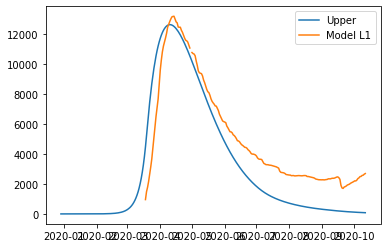

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.09748395427475383, 'other': 0.08100464443488264, 'school': 0.00752273097574261, 'transport': 0.22891660288403803, 'work': 0.23238251652765507}
10460.147663497308
error_groups 3488.394921844312
error_total 1394.350548330599
alpha: 0.5338750381029984 beta: 0.5338750381029984
[7.90655092e+01 5.33875038e-01 2.75541273e-01 2.68478498e-02
 6.89540319e-02 2.30893510e-01 2.16467090e-02]


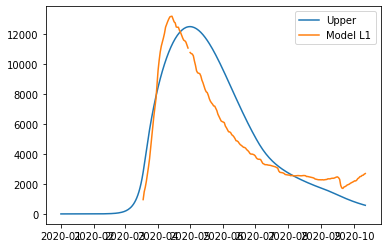

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.038936289175597855, 'other': 0.09865954799355468, 'school': 0.025620708812211235, 'transport': 0.21875041057517505, 'work': 0.23561476966440809}


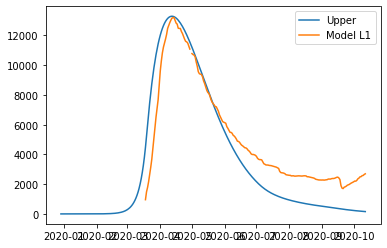

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.05194271430002452, 'other': 0.0667037939613495, 'school': 0.010097869691147426, 'transport': 0.21520424354783885, 'work': 0.2844024933442625}
10542.291390178954
error_groups 3268.9829379419853
error_total 1454.6616904473935
alpha: 0.5241745460417695 beta: 0.5241745460417695
[7.79143510e+01 5.24174546e-01 2.79249716e-01 8.88237943e-02
 7.73794756e-02 2.20736043e-01 3.21764299e-02]


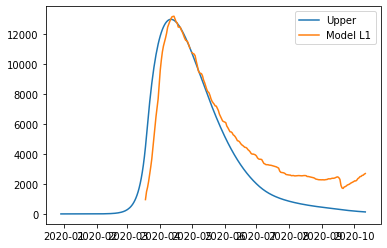

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.026847849789833064, 'other': 0.06895403186881222, 'school': 0.021646708995536515, 'transport': 0.2308935096091012, 'work': 0.27554127281748875}


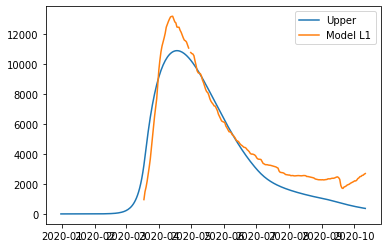

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.08882379431851842, 'other': 0.0773794755699534, 'school': 0.03217642989227229, 'transport': 0.220736042654344, 'work': 0.2792497157983854}
10559.242871508082
error_groups 3081.789663204584
error_total 1495.4906416606998
alpha: 0.46943473662796076 beta: 0.46943473662796076
[7.86043611e+01 4.69434737e-01 2.55627076e-01 6.86399152e-02
 8.34492575e-02 2.14376765e-01 1.26075702e-02]10381.491499628472

error_groups 3357.039349558084
error_total 1404.8904300140778
alpha: 0.5154264700437505 beta: 0.5154264700437505
[7.89746070e+01 5.15426470e-01 2.68013295e-01 6.61081294e-03
 7.63289233e-02 2.96532650e-01 3.09681267e-02]9728.735146308478

error_groups 3194.5255675734966
error_total 1306.8419157469962
alpha: 0.4584395005486517 beta: 0.4584395005486517
[7.78362738e+01 4.58439501e-01 2.46482767e-01 6.01392731e-02
 5.73857895e-02 2.09874127e-01 2.66252823e-02]


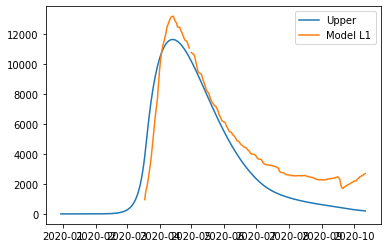

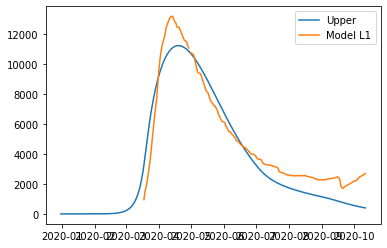

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.006610812936683502, 'other': 0.07632892325150048, 'school': 0.03096812668979459, 'transport': 0.2965326499281481, 'work': 0.26801329522995104}
{'home': 1.0, 'leisure': 0.06013927311009179, 'other': 0.05738578948775186, 'school': 0.02662528225042542, 'transport': 0.2098741268019832, 'work': 0.2464827665868899}


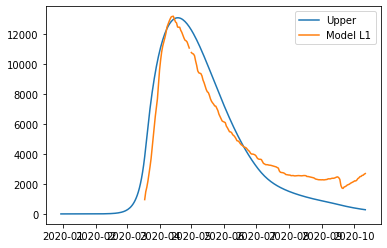

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.06863991522818949, 'other': 0.08344925754990903, 'school': 0.012607570160229176, 'transport': 0.21437676525385135, 'work': 0.25562707620512737}
11082.967277423426
error_groups 3552.683978211282
error_total 1506.0566598424289
alpha: 0.5323560963796115 beta: 0.5323560963796115
[7.95320393e+01 5.32356096e-01 2.63229957e-01 3.96212592e-02
 4.34472075e-02 2.23484171e-01 4.18975660e-02]
9802.210288584592
error_groups 3266.6356084422505
error_total 1307.1149360284685
alpha: 0.43666023669867915 beta: 0.43666023669867915
[7.88454349e+01 4.36660237e-01 2.83294045e-01 2.83661009e-02
 1.12872487e-02 2.66184405e-01 8.03250397e-02]
9312.683434829774
error_groups 3148.6773651676185
error_total 1232.8012139324312
alpha: 0.49008975866608506 beta: 0.49008975866608506
[7.83641908e+01 4.90089759e-01 2.67685150e-01 7.24083351e-02
 7.36157720e-02 2.07028765e-01 7.28558143e-03]


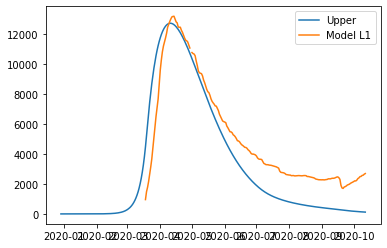

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.03962125920395416, 'other': 0.043447207503802404, 'school': 0.04189756602550711, 'transport': 0.223484171134162, 'work': 0.26322995681068573}


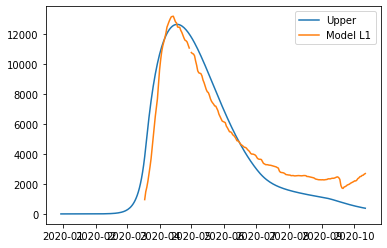

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.028366100884855694, 'other': 0.011287248728677403, 'school': 0.08032503970363976, 'transport': 0.26618440518373876, 'work': 0.2832940446253791}


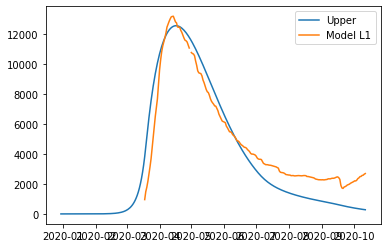

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07240833512290597, 'other': 0.07361577202116919, 'school': 0.00728558143066553, 'transport': 0.20702876478924362, 'work': 0.26768514993085457}
8824.44505892052
error_groups 3195.542080654135
error_total 1125.780595653277
alpha: 0.5031631233724612 beta: 0.5031631233724612
[7.82622161e+01 5.03163123e-01 2.63984364e-01 4.46739998e-02
 9.31244977e-02 2.23425196e-01 5.12356552e-03]
9428.0258925403
error_groups 3302.7916988978895
error_total 1225.0468387284818
alpha: 0.48552602964286806 beta: 0.48552602964286806
[7.81470060e+01 4.85526030e-01 2.73504061e-01 3.76021112e-03
 6.61093811e-02 2.80146589e-01 6.56340828e-03]


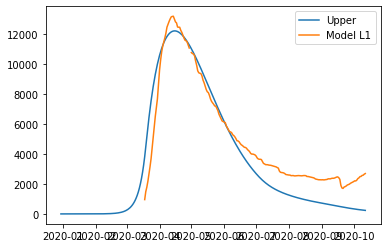

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.04467399984770612, 'other': 0.09312449766615814, 'school': 0.005123565517620873, 'transport': 0.22342519580139744, 'work': 0.26398436436820816}


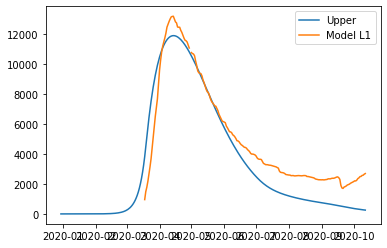

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0037602111151628093, 'other': 0.06610938113808647, 'school': 0.006563408275541596, 'transport': 0.28014658870254955, 'work': 0.27350406101725416}
9879.958302002033
error_groups 2957.7692796885913
error_total 1384.437804462688
alpha: 0.4575787614532101 beta: 0.4575787614532101
[7.74678893e+01 4.57578761e-01 2.92408703e-01 4.41776115e-02
 9.81893133e-02 2.26560689e-01 2.57533650e-02]


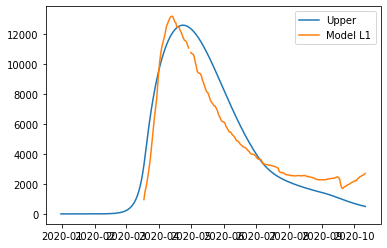

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0441776115371608, 'other': 0.09818931326463541, 'school': 0.025753365035841604, 'transport': 0.22656068926324102, 'work': 0.29240870345907627}
10546.797450511576
error_groups 3352.822480509995
error_total 1438.7949940003161
alpha: 0.5482107340414111 beta: 0.5482107340414111
[7.89797307e+01 5.48210734e-01 2.76154291e-01 7.02242325e-02
 7.56266528e-02 2.29174287e-01 1.13367240e-03]
10470.037895510319
error_groups 3305.098860249779
error_total 1432.9878070521077
alpha: 0.519412889753831 beta: 0.519412889753831
[7.80567912e+01 5.19412890e-01 2.09256234e-01 5.39459031e-02
 9.60105934e-02 2.96988073e-01 1.56132640e-02]


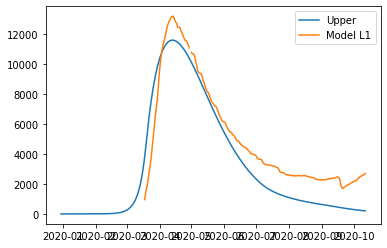

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07022423253870519, 'other': 0.07562665278927072, 'school': 0.0011336723978447316, 'transport': 0.2291742868044735, 'work': 0.2761542913644443}


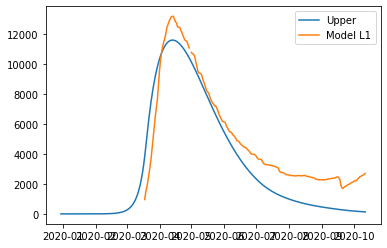

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.053945903124557805, 'other': 0.09601059335262706, 'school': 0.015613264008104748, 'transport': 0.29698807324823656, 'work': 0.20925623402130553}
10578.274846626824
error_groups 3421.243405676373
error_total 1431.4062881900902
alpha: 0.5555239398709502 beta: 0.5555239398709502
[7.97360193e+01 5.55523940e-01 2.48319017e-01 7.18881626e-02
 9.50753445e-02 2.26339366e-01 3.88582102e-02]
9581.509627218005
error_groups 3297.1351147052956
error_total 1256.874902502542
alpha: 0.4838250262099637 beta: 0.4838250262099637
[7.83628289e+01 4.83825026e-01 2.59493150e-01 1.25707601e-02
 7.60839605e-02 2.03903502e-01 5.67210330e-03]
10520.641568304913
error_groups 3360.740720391872
error_total 1431.980169582608
alpha: 0.5502498743580442 beta: 0.5502498743580442
[7.86307589e+01 5.50249874e-01 2.92501632e-01 4.37336196e-02
 8.34711649e-02 2.19797947e-01 1.47786811e-02]

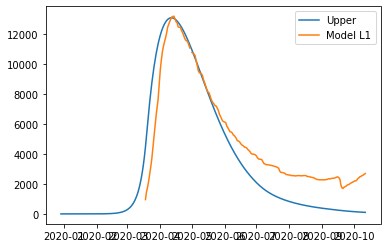


{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07188816264457935, 'other': 0.09507534454968954, 'school': 0.03885821023095723, 'transport': 0.22633936623350648, 'work': 0.24831901734838183}
8963.9140047737
error_groups 3166.42105858959
error_total 1159.498589236822
alpha: 0.4917309766729203 beta: 0.4917309766729203
[7.89797307e+01 4.91730977e-01 2.43688261e-01 7.47929357e-02
 7.56266528e-02 2.42033784e-01 3.99367644e-03]


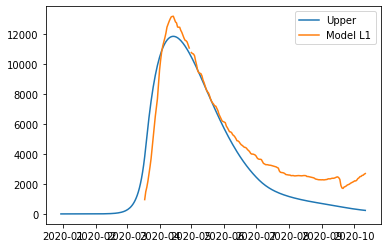

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.012570760080523671, 'other': 0.07608396051681217, 'school': 0.005672103298943666, 'transport': 0.20390350225448245, 'work': 0.2594931503818546}
9682.855297512113
error_groups 3233.69853484356
error_total 1289.8313525337107
alpha: 0.4349161353691231 beta: 0.4349161353691231
[7.71138571e+01 4.34916135e-01 2.63290153e-01 5.89899942e-02
 1.90467268e-02 2.15023767e-01 2.97418900e-02]


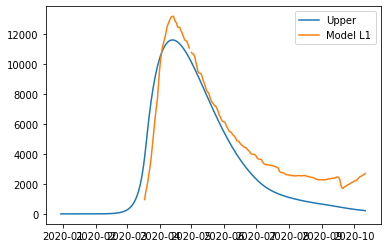

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.043733619602193886, 'other': 0.08347116488207032, 'school': 0.014778681111391925, 'transport': 0.21979794701630095, 'work': 0.2925016320769195}
9471.39366354753
error_groups 3132.5804718379504
error_total 1267.7626383419156
alpha: 0.47796035800040104 beta: 0.47796035800040104
[7.89713905e+01 4.77960358e-01 2.77167055e-01 2.53545666e-02
 9.02948707e-02 2.21518019e-01 1.17131054e-02]


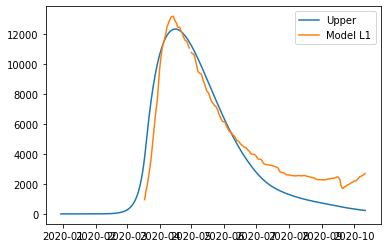

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07479293566456453, 'other': 0.07562665278927072, 'school': 0.003993676440343492, 'transport': 0.24203378401676276, 'work': 0.24368826092195656}
9333.599186417157
error_groups 3103.2491690420406
error_total 1246.0700034750232
alpha: 0.42797055668143025 beta: 0.42797055668143025
[7.76816384e+01 4.27970557e-01 2.86500941e-01 1.86756135e-02
 5.29983668e-02 2.02819018e-01 2.44686322e-02]
9413.204295957095
error_groups 2975.51558736763
error_total 1287.5377417178931
alpha: 0.4272438579581581 beta: 0.4272438579581581
[7.74733274e+01 4.27243858e-01 2.42357247e-01 3.87602736e-02
 8.15495505e-02 2.48913853e-01 2.57074906e-03]


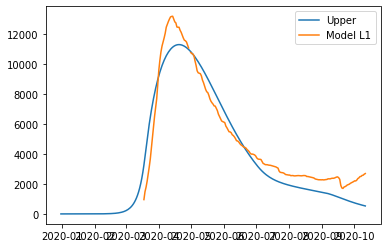

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.05898999421034898, 'other': 0.01904672680276408, 'school': 0.029741890043746468, 'transport': 0.21502376742797505, 'work': 0.26329015315926385}
8845.127212129839
error_groups 3203.6349680882404
error_total 1128.2984488083196
alpha: 0.47250830771930197 beta: 0.47250830771930197
[7.83987930e+01 4.72508308e-01 2.35079106e-01 5.19427143e-02
 6.67037940e-02 2.34591324e-01 4.03438747e-03]


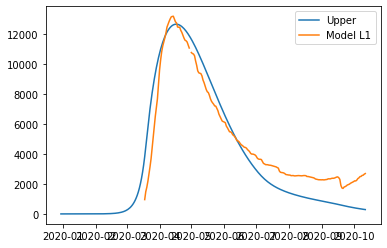

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.025354566598512707, 'other': 0.09029487072672539, 'school': 0.011713105361612124, 'transport': 0.22151801934566, 'work': 0.2771670553900748}


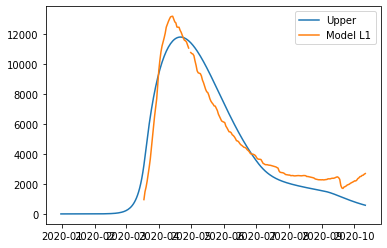

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.018675613502001698, 'other': 0.052998366755095984, 'school': 0.02446863222113877, 'transport': 0.20281901821875986, 'work': 0.28650094052523106}


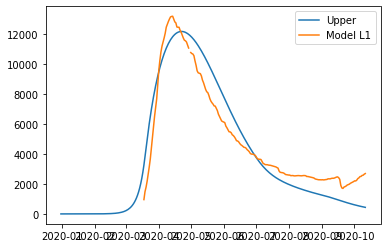

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.038760273620478194, 'other': 0.08154955048596205, 'school': 0.002570749058792343, 'transport': 0.24891385345242925, 'work': 0.24235724684699742}


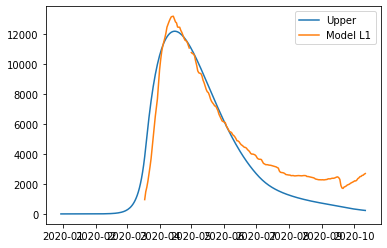

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.05194271430002452, 'other': 0.0667037939613495, 'school': 0.004034387467758423, 'transport': 0.23459132400960578, 'work': 0.23507910620436476}
8914.064958883544
error_groups 3176.212232111646
error_total 1147.5705453543794
alpha: 0.5055594833961221 beta: 0.5055594833961221
[7.89759073e+01 5.05559483e-01 2.70752276e-01 5.27295671e-02
 9.43012038e-02 2.05056487e-01 5.08093373e-03]
8909.81210567441
error_groups 3205.9083808567902
10211.878381478893
error_total 1140.7807449635238
error_groups 3241.9026853031323
alpha: 0.4995302995334463 beta: 0.4995302995334463
error_total 1393.995139235152
[7.84098862e+01 4.99530300e-01 2.37417072e-01 4.92018050e-02
 9.83019755e-02 2.14376765e-01 3.20835253e-03]alpha: 0.443468158655405 beta: 0.443468158655405

[7.77642061e+01 4.43468159e-01 2.50110324e-01 2.93119696e-02
 5.53776822e-02 2.05674895e-01 7.24466797e-03]


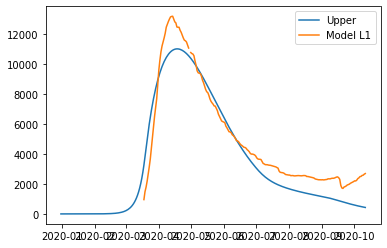

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.029311969610958957, 'other': 0.055377682184230975, 'school': 0.007244667970658557, 'transport': 0.20567489513567713, 'work': 0.250110323520705}


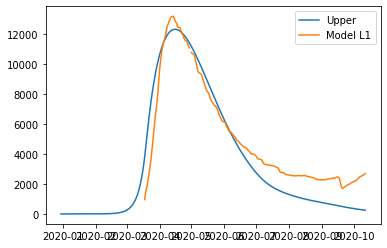

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.052729567084587425, 'other': 0.09430120378586618, 'school': 0.005080933729713341, 'transport': 0.20505648720787445, 'work': 0.270752276113688}


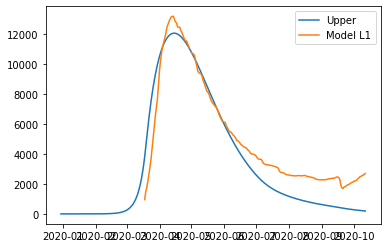

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.04920180504644051, 'other': 0.09830197553696658, 'school': 0.0032083525325954793, 'transport': 0.21437676525385135, 'work': 0.23741707199041895}
9830.570555084714
error_groups 3108.654913114993
error_total 1344.3831283939442
alpha: 0.4770975130726578 beta: 0.4770975130726578
[7.84192312e+01 4.77097513e-01 2.71297789e-01 3.83527278e-02
 9.01266897e-02 2.26111594e-01 1.52286325e-02]


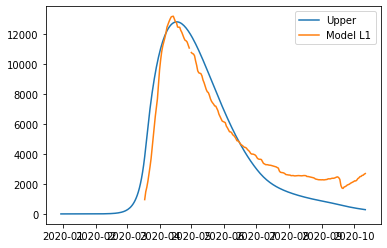

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.038352727756792986, 'other': 0.09012668969003076, 'school': 0.015228632469966502, 'transport': 0.22611159447266488, 'work': 0.27129778934241605}
8849.152934635496
error_groups 3185.831218638789
error_total 1132.6643431993416
alpha: 0.48670019040398826 beta: 0.48670019040398826
[7.85344246e+01 4.86700190e-01 2.51493264e-01 4.15113149e-02
 8.82945180e-02 2.07325678e-01 6.56340828e-03]
9141.820148947743
error_groups 3125.2636907451692
error_total 1203.3112916405148
alpha: 0.4884441368071011 beta: 0.4884441368071011
[7.83024079e+01 4.88444137e-01 2.13635188e-01 8.17164783e-02
 9.51925492e-02 2.15023767e-01 2.97418900e-02]
9549.113891261492
error_groups 3301.9120780938715
error_total 1249.4403626335238
alpha: 0.519412889753831 beta: 0.519412889753831
[7.81280850e+01 5.19412890e-01 2.73345298e-01 4.97742972e-02
 7.44314237e-02 2.19425637e-01 1.81121025e-02]


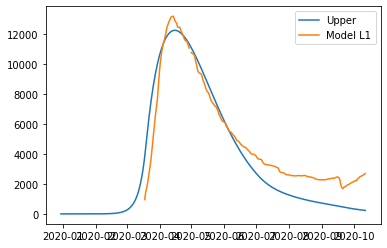

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.041511314900603336, 'other': 0.08829451802443683, 'school': 0.006563408275541596, 'transport': 0.20732567846441596, 'work': 0.25149326410645173}


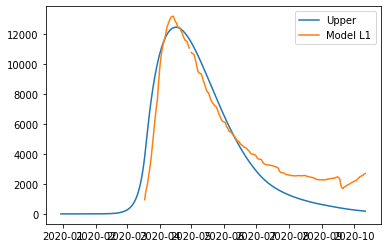

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.08171647831632073, 'other': 0.09519254916967279, 'school': 0.029741890043746468, 'transport': 0.21502376742797505, 'work': 0.21363518820178778}
9294.643055360671
error_groups 3230.6170889561968
error_total 1212.805193280895
alpha: 0.4644130716717545 beta: 0.4644130716717545
[7.88880338e+01 4.64413072e-01 2.69700114e-01 4.41475028e-02
 4.12804049e-02 2.11015134e-01 5.82356621e-02]


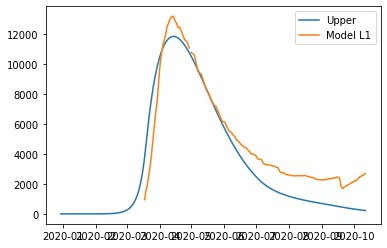

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.04977429720387397, 'other': 0.07443142369862846, 'school': 0.018112102468202017, 'transport': 0.21942563673215632, 'work': 0.2733452980779706}


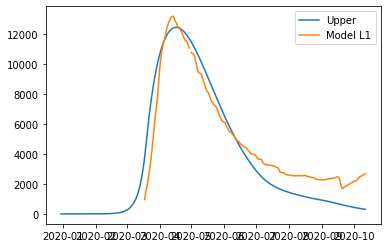

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.04414750281953535, 'other': 0.04128040493250099, 'school': 0.05823566206910749, 'transport': 0.21101513435442537, 'work': 0.2697001144431707}
8948.300496720447
error_groups 3253.213108040328
error_total 1139.0174777360237
alpha: 0.5225297418311097 beta: 0.5225297418311097
[7.83242372e+01 5.22529742e-01 2.80153059e-01 4.70371252e-02
 8.17210281e-02 2.59842341e-01 3.35053304e-02]


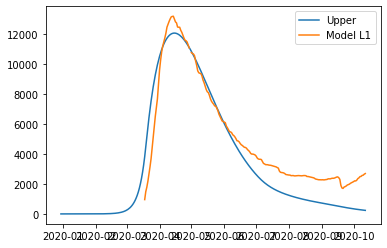

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.04703712518050015, 'other': 0.0817210280638392, 'school': 0.033505330417635905, 'transport': 0.25984234086682106, 'work': 0.2801530594886009}
8987.646636932066
error_groups 3267.6932146941526
error_total 1143.9906844475827
alpha: 0.5031631233724612 beta: 0.5031631233724612
[7.82622161e+01 5.03163123e-01 2.63984364e-01 3.89351838e-02
 7.45526238e-02 2.23425196e-01 5.98926248e-02]
9201.820688755844
error_groups 3285.8692329593846
error_total 1183.190291159292
alpha: 0.511826925688815 beta: 0.511826925688815
[7.85825445e+01 5.11826926e-01 2.83712663e-01 1.74487976e-02
 8.66359173e-02 2.06554522e-01 3.84750210e-02]
8903.473649511132
error_groups 3196.021381587619
error_total 1141.4904535847027
alpha: 0.4884441368071011 beta: 0.4884441368071011
[7.87421670e+01 4.88444137e-01 2.13635188e-01 8.17164783e-02
 6.80350138e-02 2.79486206e-01 2.97418900e-02]


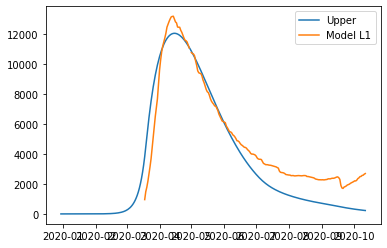

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.038935183760234464, 'other': 0.07455262382619943, 'school': 0.05989262477139045, 'transport': 0.22342519580139744, 'work': 0.26398436436820816}
8918.196398049633
error_groups 3242.539494068272
error_total 1135.131380796272
alpha: 0.5426705138452868 beta: 0.5426705138452868
[7.80404816e+01 5.42670514e-01 2.77802863e-01 8.62696197e-02
 7.74781297e-02 2.82189457e-01 4.67827000e-02]


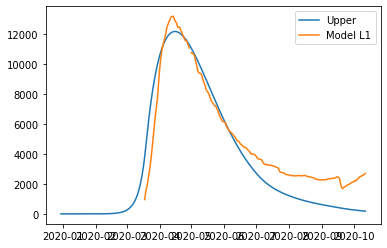

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.08171647831632073, 'other': 0.06803501383730531, 'school': 0.029741890043746468, 'transport': 0.2794862062202226, 'work': 0.21363518820178778}


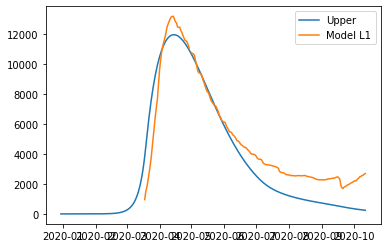

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0174487975611244, 'other': 0.08663591726339955, 'school': 0.03847502098203385, 'transport': 0.20655452221227352, 'work': 0.2837126631028375}


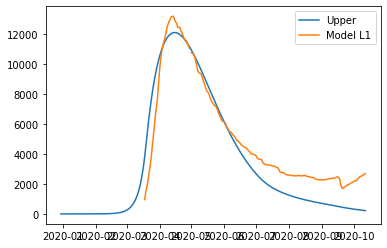

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.08626961972709132, 'other': 0.07747812972243924, 'school': 0.04678269999566009, 'transport': 0.28218945692439135, 'work': 0.2778028630646101}
9289.930383216795
error_groups 3240.1244496972986
error_total 1209.9611867038993
alpha: 0.45302754715350124 beta: 0.45302754715350124
[7.85505199e+01 4.53027547e-01 2.93117505e-01 3.61072795e-02
 2.42332683e-02 2.49858906e-01 1.62382252e-02]


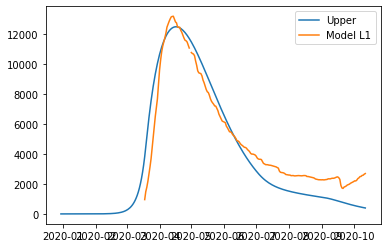

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.03610727951637055, 'other': 0.0242332683481175, 'school': 0.016238225238185876, 'transport': 0.24985890601371724, 'work': 0.29311750526638397}
8833.033759676051
error_groups 3208.3483611381107
error_total 1124.9370797075878
alpha: 0.4918535541973621 beta: 0.4918535541973621
[7.81782959e+01 4.91853554e-01 2.48594428e-01 6.02390996e-02
 7.60444470e-02 2.13791950e-01 6.77160636e-03]
8946.510880302274
error_groups 3181.8504922890615
error_total 1152.9320776026425
alpha: 0.48727311990029754 beta: 0.48727311990029754
[7.88365314e+01 4.87273120e-01 2.60111438e-01 2.34529857e-02
 9.55559780e-02 2.15270845e-01 2.86898908e-02]
8955.329384546068
error_groups 3213.6302790966192
error_total 1148.3398210898897
alpha: 0.486859929329706 beta: 0.486859929329706
[7.89084504e+01 4.86859929e-01 2.76272595e-01 4.24414211e-02
 6.22253045e-02 2.65022311e-01 7.28558143e-03]


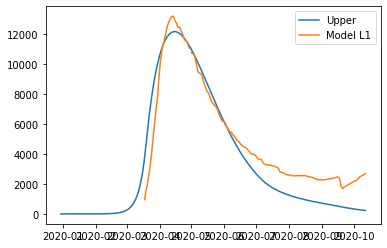

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.06023909963857704, 'other': 0.07604444696447227, 'school': 0.006771606356093363, 'transport': 0.21379195012004865, 'work': 0.24859442774039764}
9000.42466228103
error_groups 3243.4574438674363
error_total 1151.3934436827187
alpha: 0.49382783179061307 beta: 0.49382783179061307
[7.82337209e+01 4.93827832e-01 2.68731659e-01 1.65006618e-02
 8.38592992e-02 2.06811323e-01 8.90977671e-02]


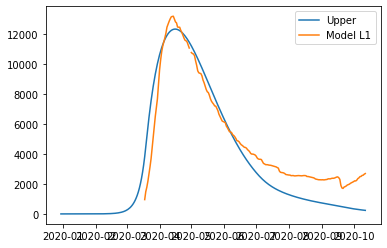

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.023452985703909236, 'other': 0.09555597800802701, 'school': 0.02868989075525054, 'transport': 0.21527084463544102, 'work': 0.26011143795627817}


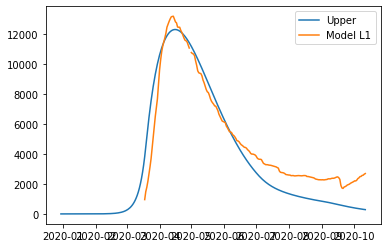

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.04244142105706612, 'other': 0.06222530450645186, 'school': 0.00728558143066553, 'transport': 0.26502231139937343, 'work': 0.2762725945766207}


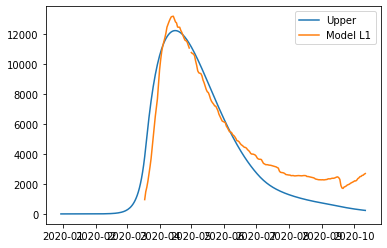

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.016500661780274616, 'other': 0.08385929922471713, 'school': 0.08909776713945723, 'transport': 0.20681132308576602, 'work': 0.26873165897349505}
8900.847998745925
error_groups 3233.6568201505515
error_total 1133.4382357190748
alpha: 0.5045030473866523 beta: 0.5045030473866523
[7.82170191e+01 5.04503047e-01 2.64439744e-01 4.23447356e-02
 8.71931515e-02 2.06733963e-01 1.96874760e-02]
8907.108835000392
8999.71953713641
error_groups 3204.4255971220146
error_groups 3276.840242726951
error_total 1140.5366475756755
error_total 1144.5758588818921
alpha: 0.5012250563787202 beta: 0.5012250563787202
alpha: 0.5508423857535394 beta: 0.5508423857535394
[7.81715843e+01 5.01225056e-01 2.86434820e-01 3.15959016e-02
 8.58459441e-02 2.26972762e-01 9.66297607e-03][7.81659789e+01 5.50842386e-01 2.96074161e-01 4.72364672e-02
 8.63827601e-02 2.96898841e-01 9.08736499e-02]



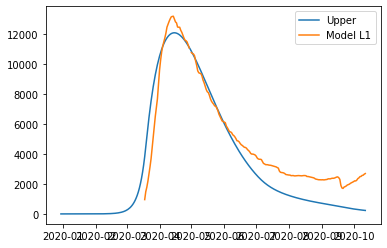

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0423447355714435, 'other': 0.08719315150427359, 'school': 0.019687476023615202, 'transport': 0.206733963293776, 'work': 0.2644397437290188}


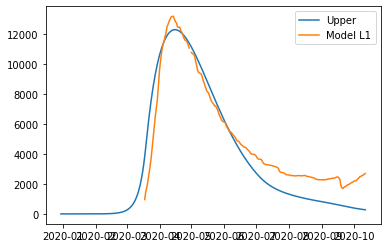

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.031595901601871645, 'other': 0.0858459441485084, 'school': 0.00966297606867924, 'transport': 0.22697276213230191, 'work': 0.28643481967692885}


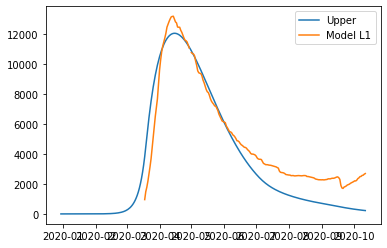

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.04723646722551337, 'other': 0.08638276007738224, 'school': 0.09087364989725533, 'transport': 0.2968988414234364, 'work': 0.296074160892004}
8822.855325306713
error_groups 3219.13534730078
error_total 1120.7439956011867
alpha: 0.4826956710400485 beta: 0.4826956710400485
[7.88391486e+01 4.82695671e-01 2.62750098e-01 1.14123909e-02
 9.04602347e-02 2.22912671e-01 8.71341418e-04]
8976.256169589064
error_groups 3196.1556713703353
error_total 1156.0200996437457
alpha: 0.5188616088126119 beta: 0.5188616088126119
[7.84840048e+01 5.18861609e-01 2.86434820e-01 7.15421709e-02
 7.43716677e-02 2.69257062e-01 6.91520616e-03]


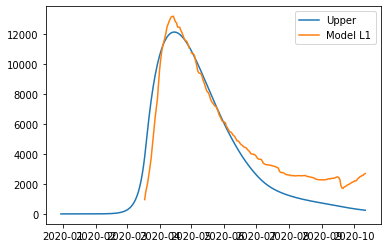

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.01141239094473672, 'other': 0.09046023470014303, 'school': 0.0008713414179478754, 'transport': 0.22291267063621453, 'work': 0.2627500976296101}
8934.580202302248
error_groups 3245.3286385789297
error_total 1137.8503127446636
alpha: 0.5091786638935423 beta: 0.5091786638935423
[7.82819613e+01 5.09178664e-01 2.55846018e-01 4.40944026e-02
 8.77199993e-02 2.17179587e-01 6.31782356e-02]


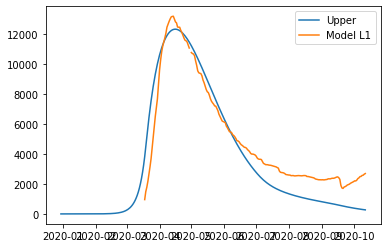

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07154217089728804, 'other': 0.07437166768773784, 'school': 0.006915206161595959, 'transport': 0.26925706193441273, 'work': 0.28643481967692885}


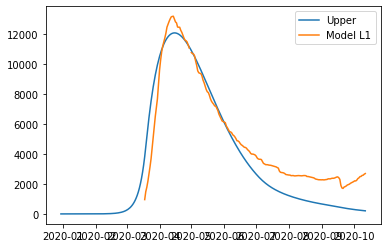

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.04409440257440728, 'other': 0.08771999931812481, 'school': 0.06317823557165468, 'transport': 0.21717958697907944, 'work': 0.25584601810331276}
8865.5708717551
error_groups 3217.4378740748684
error_total 1129.6265995360463
alpha: 0.5325048001925137 beta: 0.5325048001925137
[7.89497363e+01 5.32504800e-01 2.95286281e-01 5.84395497e-02
 9.09825213e-02 2.35745181e-01 1.58326933e-02]


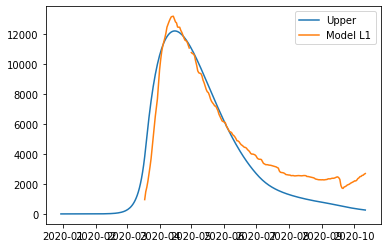

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.058439549706349604, 'other': 0.0909825212964102, 'school': 0.01583269333671313, 'transport': 0.23574518065137354, 'work': 0.2952862809791992}
8878.533122429679
8848.898872624672
error_groups 3242.3818862373028
error_total 1127.2302472384754
error_groups 3217.464270994402
error_total 1126.286920326054
alpha: 0.5071350754023158 beta: 0.5071350754023158
[7.82170191e+01 5.07135075e-01 2.80569220e-01 2.75142762e-02
 8.71337557e-02 2.06733963e-01 4.86280583e-02]alpha: 0.5050270752249941 beta: 0.5050270752249941

[7.82507695e+01 5.05027075e-01 2.62892273e-01 3.03640439e-02
 9.11027470e-02 2.72501147e-01 3.38916531e-02]


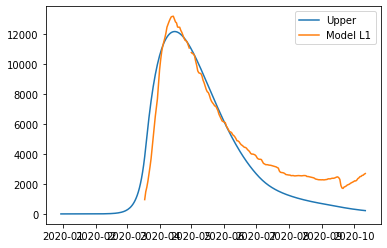

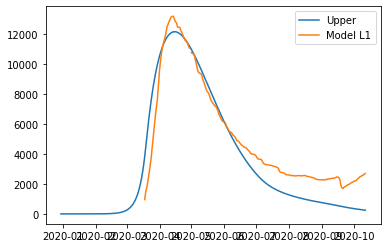

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.030364043907252808, 'other': 0.09110274697350736, 'school': 0.033891653096294605, 'transport': 0.27250114721202473, 'work': 0.2628922729120433}
{'home': 1.0, 'leisure': 0.0275142762036486, 'other': 0.08713375569164195, 'school': 0.04862805833240622, 'transport': 0.206733963293776, 'work': 0.2805692201554997}
9091.22480430434
error_groups 3167.8765178180674
error_total 1184.6696572972546
alpha: 0.49073974884672245 beta: 0.49073974884672245
[7.84871341e+01 4.90739749e-01 2.78046944e-01 2.96611164e-02
 9.05537512e-02 2.15943034e-01 1.66421945e-02]


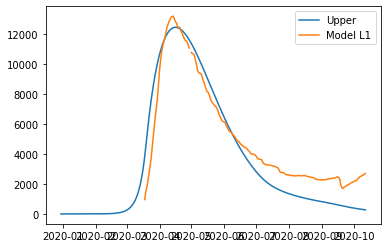

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.02966111640997789, 'other': 0.09055375117195687, 'school': 0.016642194488978704, 'transport': 0.2159430339428312, 'work': 0.2780469438320786}
8834.14043080824
error_groups 3197.410308696892
error_total 1127.3460244222697
alpha: 0.5068904133026364 beta: 0.5068904133026364
[7.86139436e+01 5.06890413e-01 2.50432883e-01 5.56821694e-02
 9.01007849e-02 2.63142978e-01 1.67454885e-02]
8831.069007642129
error_groups 3204.074940789716
error_total 1125.3988133704825
alpha: 0.5155284700037701 beta: 0.5155284700037701
[7.85426059e+01 5.15528470e-01 2.73340432e-01 4.74581393e-02
 9.83937971e-02 2.09905650e-01 1.64040814e-02]


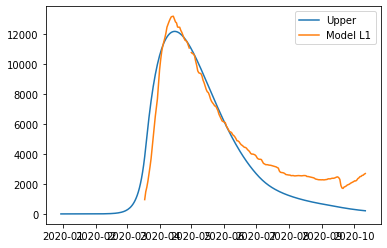

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.05568216938576978, 'other': 0.0901007849174849, 'school': 0.01674548854248336, 'transport': 0.26314297838545614, 'work': 0.25043288319397405}


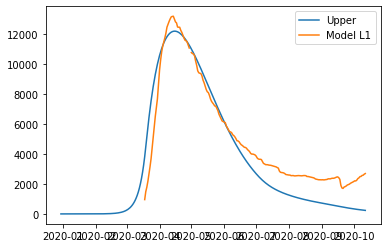

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.04745813929071066, 'other': 0.09839379711054473, 'school': 0.01640408138290997, 'transport': 0.2099056503823164, 'work': 0.2733404319126619}
8961.251710583576
error_groups 3268.515420251742
error_total 1138.5472580663668
alpha: 0.4918535541973621 beta: 0.4918535541973621
[7.89952598e+01 4.91853554e-01 2.75144955e-01 1.11258860e-02
 7.60444470e-02 2.39501820e-01 3.91806010e-02]


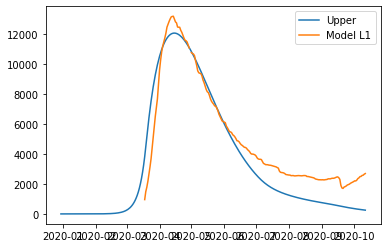

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.011125885970440362, 'other': 0.07604444696447227, 'school': 0.039180601025332995, 'transport': 0.2395018200320999, 'work': 0.27514495543110856}
8998.294168911534
error_groups 3190.0255283177544
error_total 1161.6537281187561
alpha: 0.49858148015860215 beta: 0.49858148015860215
[7.88295790e+01 4.98581480e-01 2.87001145e-01 4.31410686e-02
 8.10327647e-02 2.10883152e-01 6.39922087e-03]


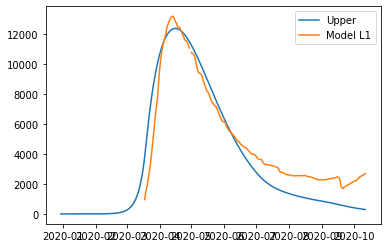

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.04314106863006495, 'other': 0.08103276469330761, 'school': 0.006399220868370553, 'transport': 0.21088315222283374, 'work': 0.2870011447715891}
8833.618210538129
error_groups 3211.0400754114257
error_total 1124.5156270253406
alpha: 0.4923000003708433 beta: 0.4923000003708433
[7.87611729e+01 4.92300000e-01 2.60234766e-01 4.85987487e-02
 7.66957088e-02 2.26972762e-01 3.35929222e-03]


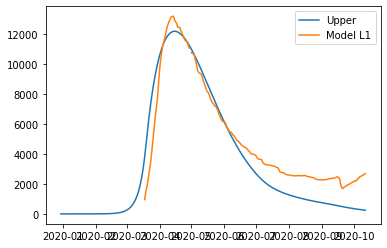

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.048598748692219855, 'other': 0.07669570875328617, 'school': 0.003359292221680618, 'transport': 0.22697276213230191, 'work': 0.26023476552934566}
8961.166759135614
error_groups 3265.9710393951755
error_total 1139.0391439480877
alpha: 0.4816592555995416 beta: 0.4816592555995416
[7.82229658e+01 4.81659256e-01 2.60695436e-01 1.19866515e-02
 7.51173083e-02 2.21373018e-01 4.80179410e-02]


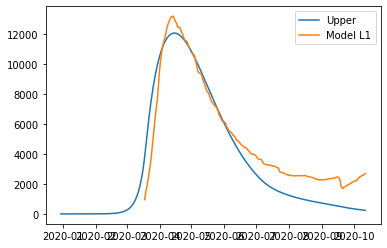

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.011986651467554503, 'other': 0.07511730825607278, 'school': 0.048017940968912376, 'transport': 0.22137301834683706, 'work': 0.26069543565718156}
8809.17773829907
error_groups 3185.3222027573784
error_total 1124.7711071083384
alpha: 0.5162176105624803 beta: 0.5162176105624803
[7.88571323e+01 5.16217611e-01 2.43329602e-01 7.81337220e-02
 9.88422204e-02 2.15124041e-01 1.04233710e-02]


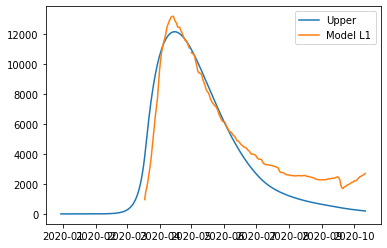

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07813372203042475, 'other': 0.09884222035163737, 'school': 0.010423370962596178, 'transport': 0.21512404087297615, 'work': 0.2433296020954823}
8900.992650478547
error_groups 3220.6953166746835
error_total 1136.0594667607725
alpha: 0.5139761590042455 beta: 0.5139761590042455
[7.89375867e+01 5.13976159e-01 2.54641874e-01 8.60435437e-02
 6.60493219e-02 2.83240137e-01 2.55579388e-02]


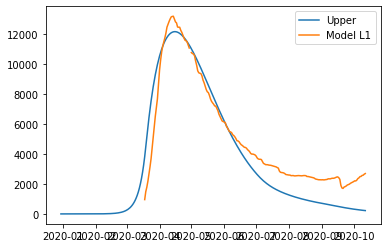

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.086043543677362, 'other': 0.06604932189429819, 'school': 0.025557938766350985, 'transport': 0.2832401372080586, 'work': 0.25464187444784586}
8906.467981307353
error_groups 3140.178131747603
error_total 1153.2579699119499
alpha: 0.4768288852659148 beta: 0.4768288852659148
[7.87863867e+01 4.76828885e-01 2.13778162e-01 4.77699036e-02
 9.86017656e-02 2.30936222e-01 1.60735763e-02]


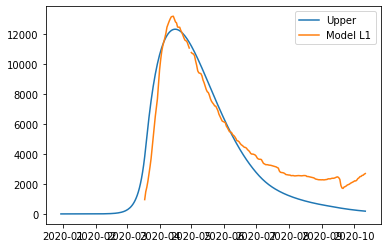

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.047769903588908466, 'other': 0.09860176557255469, 'school': 0.016073576340283113, 'transport': 0.23093622188762802, 'work': 0.21377816246923892}
8817.104133057557
error_groups 3194.9400059966074
error_total 1124.43282541219
alpha: 0.5345489551386313 beta: 0.5345489551386313
[7.85547265e+01 5.34548955e-01 2.63307313e-01 8.93961374e-02
 9.63146191e-02 2.40413165e-01 1.31295294e-03]


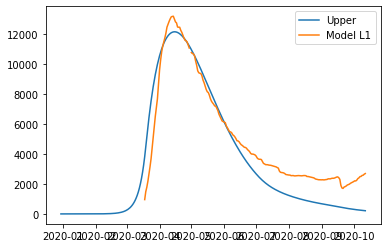

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0893961374238286, 'other': 0.09631461914255963, 'school': 0.0013129529445542465, 'transport': 0.24041316501891352, 'work': 0.26330731272511526}
8818.824989404528
error_groups 3183.7203865385036
error_total 1127.0209205732049
alpha: 0.5123084023081299 beta: 0.5123084023081299
[7.88571323e+01 5.12308402e-01 2.43329602e-01 7.19754076e-02
 9.86768473e-02 2.15124041e-01 1.41747276e-02]


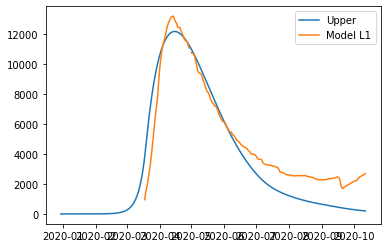

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07197540757884635, 'other': 0.09867684733780778, 'school': 0.014174727563149324, 'transport': 0.21512404087297615, 'work': 0.2433296020954823}
8843.275887208329
error_groups 3164.8973407385524
error_total 1135.6757092939552
alpha: 0.49976159354731653 beta: 0.49976159354731653
[7.84080899e+01 4.99761594e-01 2.08164337e-01 8.57670456e-02
 9.41686127e-02 2.37414330e-01 2.21168835e-02]


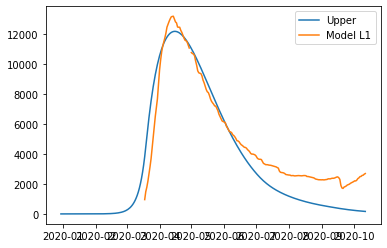

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.08576704555662229, 'other': 0.09416861269555901, 'school': 0.022116883492774037, 'transport': 0.23741433026070072, 'work': 0.20816433732086898}
8785.55972785804
error_groups 3156.664575204315
error_total 1125.779030530745
alpha: 0.4943383529330816 beta: 0.4943383529330816
[7.89364518e+01 4.94338353e-01 2.03885172e-01 8.21728528e-02
 9.81997873e-02 2.17947880e-01 4.23122573e-03]
8823.547100018048
error_groups 3199.7818476824677
error_total 1124.7530504671163
alpha: 0.5139761590042455 beta: 0.5139761590042455
[7.89375867e+01 5.13976159e-01 2.54641874e-01 4.36991354e-02
 9.97010500e-02 2.83240137e-01 2.55579388e-02]
8824.351304050822
error_groups 3177.0466446797327
error_total 1129.4609318742177
alpha: 0.5180374293318519 beta: 0.5180374293318519
[7.88667525e+01 5.18037429e-01 2.43886877e-01 8.72231424e-02
 9.72508105e-02 2.13169817e-01 6.07227084e-03]


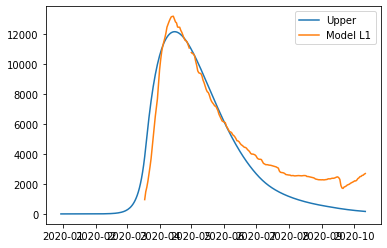

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.08217285283126852, 'other': 0.098199787343965, 'school': 0.004231225734966065, 'transport': 0.21794787975636568, 'work': 0.20388517243532978}


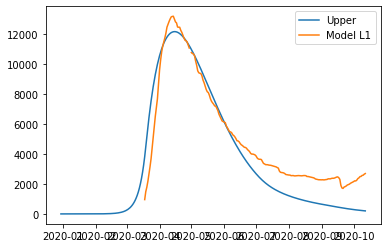

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.04369913536797018, 'other': 0.09970104998682204, 'school': 0.025557938766350985, 'transport': 0.2832401372080586, 'work': 0.25464187444784586}


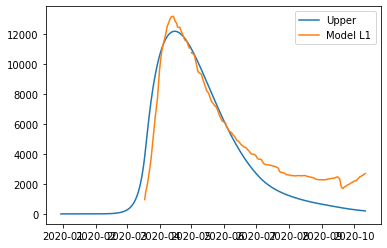

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0872231424402938, 'other': 0.09725081045141963, 'school': 0.006072270843361503, 'transport': 0.21316981742868746, 'work': 0.2438868771261544}
8801.5417431786
error_groups 3149.0280021215217
error_total 1130.5027482114158
alpha: 0.4960792879742515 beta: 0.4960792879742515
[7.87611729e+01 4.96079288e-01 2.04418291e-01 9.08682739e-02
 9.66773603e-02 2.16078366e-01 6.87328578e-05]


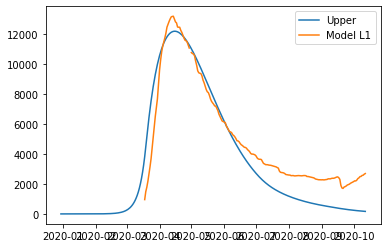

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.09086827391483582, 'other': 0.09667736032717458, 'school': 6.873285781566763e-05, 'transport': 0.21607836608297248, 'work': 0.20441829125177163}
8829.626187708815
error_groups 3178.6275872321153
error_total 1130.19972009534
alpha: 0.5066849086427636 beta: 0.5066849086427636
[7.89391631e+01 5.06684909e-01 2.37280313e-01 8.14009655e-02
 9.07587272e-02 2.16870255e-01 6.05937297e-03]
8801.559629692316
error_groups 3165.4370450967913
error_total 1127.2245169191049
alpha: 0.49801139568190944 beta: 0.49801139568190944
[7.87611729e+01 4.98011396e-01 2.04418291e-01 7.88071402e-02
 9.50918339e-02 2.73982379e-01 6.31375399e-03]


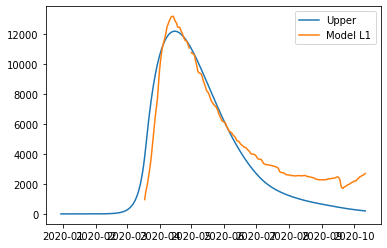

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.08140096550260081, 'other': 0.09075872716822758, 'school': 0.006059372968988577, 'transport': 0.21687025496355677, 'work': 0.23728031335184124}


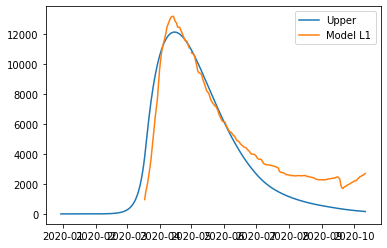

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.078807140194966, 'other': 0.09509183385631914, 'school': 0.006313753989483785, 'transport': 0.2739823788432263, 'work': 0.20441829125177163}
8805.09413329846
error_groups 3187.816424654363
error_total 1123.4555417288195
alpha: 0.4919994104588954 beta: 0.4919994104588954
[7.86342707e+01 4.91999410e-01 2.31342840e-01 4.51024811e-02
 9.92653208e-02 2.14904905e-01 1.38629126e-02]


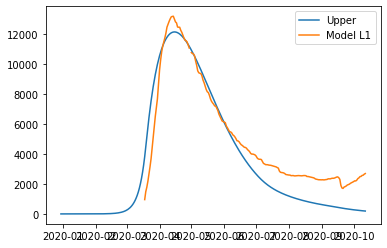

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.04510248113902445, 'other': 0.09926532077630645, 'school': 0.013862912560544033, 'transport': 0.2149049053796412, 'work': 0.23134283965810112}
8810.35179052259
error_groups 3158.311861494617
error_total 1130.4079858055948
alpha: 0.4876859966175191 beta: 0.4876859966175191
[7.85346415e+01 4.87685997e-01 2.07831619e-01 5.51346161e-02
 9.94572674e-02 2.68892998e-01 1.52623817e-02]


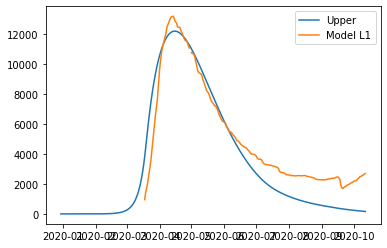

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.055134616075569645, 'other': 0.09945726736081521, 'school': 0.015262381690830065, 'transport': 0.26889299763483987, 'work': 0.20783161854193805}
8817.985422520804
error_groups 3188.7187505098736
error_total 1125.8533344021862
alpha: 0.49963220855976576 beta: 0.49963220855976576
[7.85744287e+01 4.99632209e-01 2.31111018e-01 7.10039065e-02
 9.15095293e-02 2.08739552e-01 5.17637795e-03]
8898.562463215834
error_groups 3216.6598686030775
error_total 1136.3805189225513
alpha: 0.4895292149156687 beta: 0.4895292149156687
[7.88196631e+01 4.89529215e-01 2.46337469e-01 5.15714668e-02
 7.55539240e-02 2.19007224e-01 3.62815547e-02]


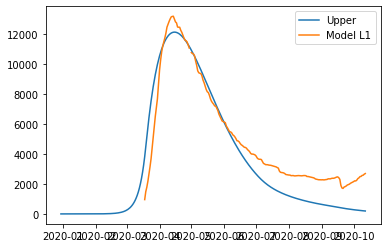

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07100390653170587, 'other': 0.09150952931056196, 'school': 0.005176377947684177, 'transport': 0.2087395523973383, 'work': 0.23111101750457871}


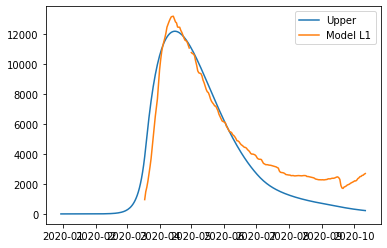

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0515714667614072, 'other': 0.07555392396438972, 'school': 0.03628155470480491, 'transport': 0.21900722447260496, 'work': 0.246337468508075}
8809.283875438108
error_groups 3201.4433654014
error_total 1121.5681020073418
alpha: 0.5055594833961221 beta: 0.5055594833961221
[7.88931014e+01 5.05559483e-01 2.72585737e-01 4.09738082e-02
 9.43012038e-02 2.11119028e-01 1.03905962e-04]


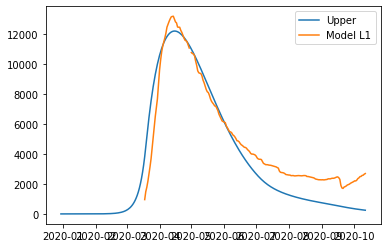

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.04097380817152027, 'other': 0.09430120378586618, 'school': 0.00010390596226898113, 'transport': 0.2111190275408166, 'work': 0.2725857365107376}
8832.08666362249
error_groups 3217.054321057893
error_total 1123.0064685129191
alpha: 0.49453134897340756 beta: 0.49453134897340756
[7.89200456e+01 4.94531349e-01 2.58928566e-01 4.18335753e-02
 8.42297218e-02 2.11270692e-01 8.93267748e-03]


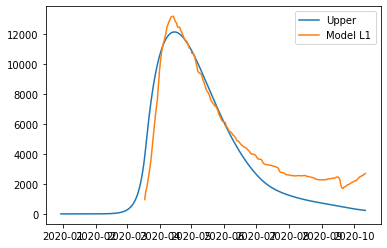

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0418335752621799, 'other': 0.08422972179173127, 'school': 0.008932677476518394, 'transport': 0.21127069195291054, 'work': 0.25892856579195633}
8815.59410806001
error_groups 3200.460503864132
error_total 1123.0267208391754
alpha: 0.48151254794461984 beta: 0.48151254794461984
[7.83987930e+01 4.81512548e-01 2.35079106e-01 5.19427143e-02
 7.68275859e-02 2.34591324e-01 4.03438747e-03]


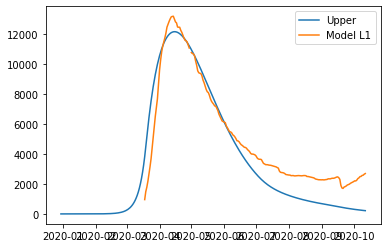

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.05194271430002452, 'other': 0.07682758592425845, 'school': 0.004034387467758423, 'transport': 0.23459132400960578, 'work': 0.23507910620436476}
8826.092068357579
error_groups 3177.2159961008156
error_total 1129.7752144513524
alpha: 0.5058185745266328 beta: 0.5058185745266328
[7.83423793e+01 5.05818575e-01 2.34937040e-01 8.14551274e-02
 9.12808521e-02 2.16945870e-01 5.93109539e-03]


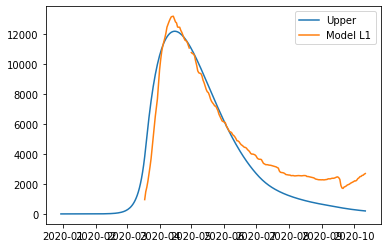

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.08145512735489047, 'other': 0.0912808520783649, 'school': 0.005931095386528737, 'transport': 0.21694586982687175, 'work': 0.23493704041246757}
8841.297027368844
error_groups 3198.5812079021134
error_total 1128.5431638933464
alpha: 0.5350817411205413 beta: 0.5350817411205413
[7.88911032e+01 5.35081741e-01 2.75077847e-01 8.50340071e-02
 9.49929235e-02 2.18991900e-01 7.38200962e-03]
8808.65402694217
error_groups 3180.8245087484793
error_total 1125.565903638738
alpha: 0.4922270744689523 beta: 0.4922270744689523
[7.88848872e+01 4.92227074e-01 2.19438879e-01 7.08138872e-02
 9.10208154e-02 2.08527721e-01 6.04411838e-03]


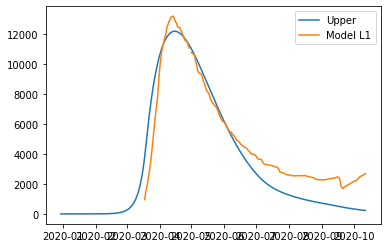

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.08503400712270871, 'other': 0.09499292346139845, 'school': 0.007382009622323146, 'transport': 0.21899190041421693, 'work': 0.27507784744167246}


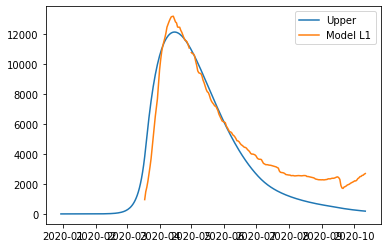

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07081388723094342, 'other': 0.09102081537723006, 'school': 0.006044118381852058, 'transport': 0.20852772139894443, 'work': 0.21943887890501923}
8802.173468179446
error_groups 3176.9254038614063
error_total 1125.049612863608
alpha: 0.4879650722107627 beta: 0.4879650722107627
[7.81782959e+01 4.87965072e-01 2.15237434e-01 6.14238630e-02
 9.47760016e-02 2.15011490e-01 6.77160636e-03]


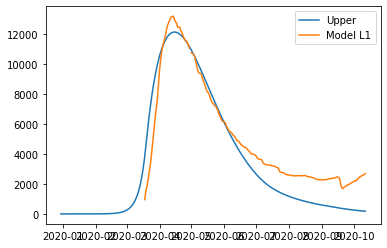

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.061423863044549255, 'other': 0.09477600161912425, 'school': 0.006771606356093363, 'transport': 0.21501149009275583, 'work': 0.21523743413495025}
8782.76978742355
error_groups 3157.1391204226275
error_total 1125.1261334001842
alpha: 0.49063994368491715 beta: 0.49063994368491715
[7.88372722e+01 4.90639944e-01 2.00650017e-01 7.67206744e-02
 9.85935051e-02 2.21639970e-01 4.92481139e-03]
8897.682251467832
error_groups 3158.0252245202705
error_total 1147.9314053895123
alpha: 0.5030495592786235 beta: 0.5030495592786235
[7.86992841e+01 5.03049559e-01 2.04099352e-01 8.63464247e-02
 9.33416093e-02 2.98745757e-01 3.21755697e-02]


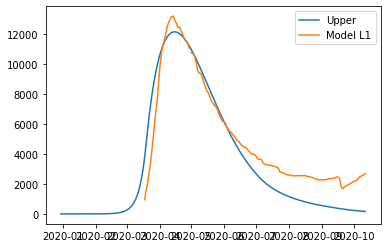

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0767206744316268, 'other': 0.09859350514765347, 'school': 0.004924811393378893, 'transport': 0.22163996991073098, 'work': 0.2006500170270933}


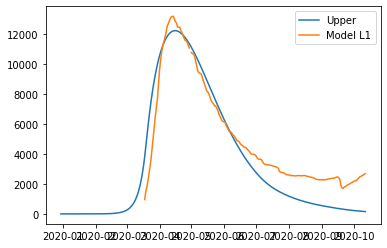

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.08634642474772948, 'other': 0.09334160929427332, 'school': 0.032175569675340424, 'transport': 0.2987457567547017, 'work': 0.20409935152249087}
8857.766141662987
error_groups 3153.7161599522633
error_total 1140.8099963421448
alpha: 0.4826737330050135 beta: 0.4826737330050135
[7.86031044e+01 4.82673733e-01 2.21209918e-01 4.36991354e-02
 9.97010500e-02 2.40911168e-01 1.57542829e-02]


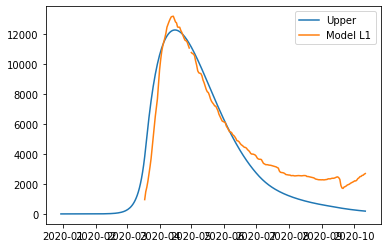

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.04369913536797018, 'other': 0.09970104998682204, 'school': 0.015754282949323642, 'transport': 0.24091116836196683, 'work': 0.22120991794761552}
8802.28405065311
error_groups 3173.6660847577696
error_total 1125.723593179068
alpha: 0.4837716550076172 beta: 0.4837716550076172
[7.89204520e+01 4.83771655e-01 2.10160264e-01 5.48272764e-02
 8.96210544e-02 2.79389125e-01 1.09582457e-02]
8794.548854768746
error_groups 3182.1032710123027
error_total 1122.4891167512885
alpha: 0.49379978562779714 beta: 0.49379978562779714
[7.87145178e+01 4.93799786e-01 2.31236584e-01 5.21870445e-02
 9.86303736e-02 2.09917570e-01 1.19724410e-02]


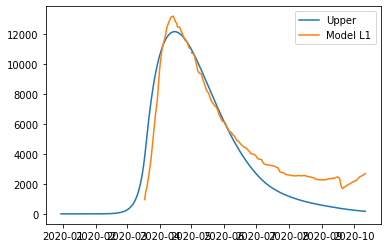

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.05482727642370791, 'other': 0.08962105439503615, 'school': 0.01095824573586017, 'transport': 0.27938912500626906, 'work': 0.21016026364237744}


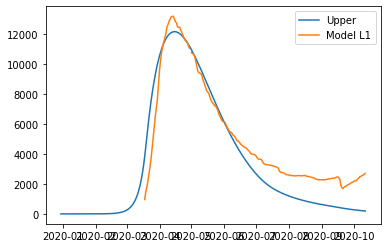

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.05218704446354786, 'other': 0.09863037363405437, 'school': 0.011972441016326982, 'transport': 0.20991756984545779, 'work': 0.23123658444333073}
8856.617314527457
error_groups 3173.2300470274226
error_total 1136.6774535000068
alpha: 0.5045798281094398 beta: 0.5045798281094398
[7.89257952e+01 5.04579828e-01 2.32474462e-01 8.07869168e-02
 9.17866408e-02 2.17496036e-01 1.51064606e-02]


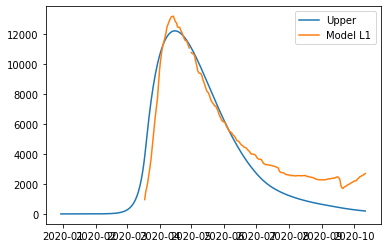

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.08078691681818917, 'other': 0.09178664082529903, 'school': 0.015106460571912915, 'transport': 0.2174960359553619, 'work': 0.2324744615518721}
8850.404873224119
error_groups 3183.143869762903
error_total 1133.4522006922432
alpha: 0.4876859966175191 beta: 0.4876859966175191
[7.84379688e+01 4.87685997e-01 2.03713007e-01 6.80981932e-02
 8.37979202e-02 2.82876078e-01 2.97931038e-02]


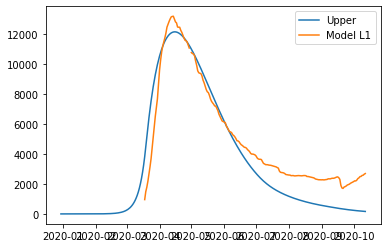

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.06809819320670074, 'other': 0.08379792019302668, 'school': 0.029793103799657456, 'transport': 0.2828760776943215, 'work': 0.203713006694751}
8803.9553048582
error_groups 3181.6092934905287
error_total 1124.4692022735344
alpha: 0.46801180232269846 beta: 0.46801180232269846
[7.84364321e+01 4.68011802e-01 2.05248254e-01 5.09612009e-02
 7.83087134e-02 2.61090391e-01 6.05937297e-03]


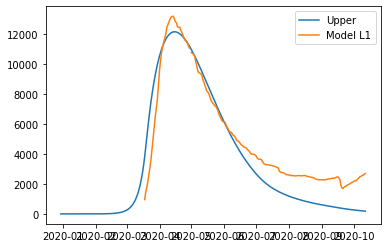

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.05096120093671324, 'other': 0.07830871343571459, 'school': 0.006059372968988577, 'transport': 0.26109039072663015, 'work': 0.20524825408069702}
8790.360059060746
error_groups 3150.3406766077883
error_total 1128.0038764905914
alpha: 0.4924357581247776 beta: 0.4924357581247776
[7.89189001e+01 4.92435758e-01 2.00574939e-01 8.17265327e-02
 9.81448599e-02 2.29354848e-01 3.58902932e-03]


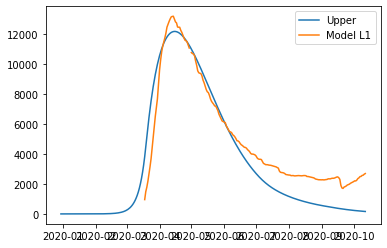

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0817265327347477, 'other': 0.0981448599343228, 'school': 0.003589029321437384, 'transport': 0.22935484825499766, 'work': 0.20057493850429048}
8782.76978742355
error_groups 3157.1391204226275
error_total 1125.1261334001842
alpha: 0.49063994368491715 beta: 0.49063994368491715
[7.88372722e+01 4.90639944e-01 2.00650017e-01 7.67206744e-02
 9.85935051e-02 2.21639970e-01 4.92481139e-03]


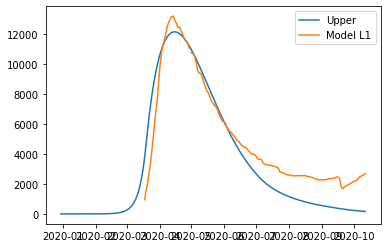

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0767206744316268, 'other': 0.09859350514765347, 'school': 0.004924811393378893, 'transport': 0.22163996991073098, 'work': 0.2006500170270933}
8782.769734230122
error_groups 3157.1391001461207
error_total 1125.1261268168003
alpha: 0.49063994368491715 beta: 0.49063994368491715
[7.88372722e+01 4.90639944e-01 2.00650027e-01 7.67206744e-02
 9.85935051e-02 2.21639970e-01 4.92481139e-03]


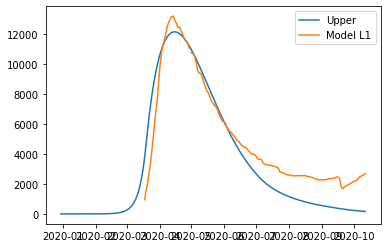

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0767206744316268, 'other': 0.09859350514765347, 'school': 0.004924811393378893, 'transport': 0.22163996991073098, 'work': 0.2006500270270933}
8782.769732934044
error_groups 3157.1390922049045
error_total 1125.126128145828
alpha: 0.49063994368491715 beta: 0.49063994368491715
[7.88372722e+01 4.90639944e-01 2.00650017e-01 7.67206844e-02
 9.85935051e-02 2.21639970e-01 4.92481139e-03]


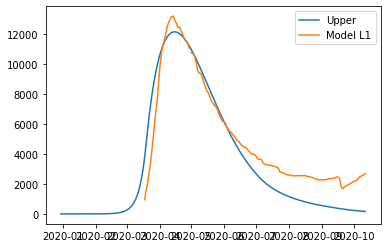

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0767206844316268, 'other': 0.09859350514765347, 'school': 0.004924811393378893, 'transport': 0.22163996991073098, 'work': 0.2006500170270933}
8782.769703239828
error_groups 3157.139078859056
error_total 1125.1261248761546
alpha: 0.49063994368491715 beta: 0.49063994368491715
[7.88372722e+01 4.90639944e-01 2.00650017e-01 7.67206744e-02
 9.85935151e-02 2.21639970e-01 4.92481139e-03]


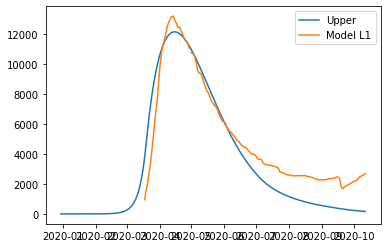

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0767206744316268, 'other': 0.09859351514765347, 'school': 0.004924811393378893, 'transport': 0.22163996991073098, 'work': 0.2006500170270933}
8781.183110901762
error_groups 3156.0407774560763
error_total 1125.0284666891373
alpha: 0.4904459506491845 beta: 0.4904459506491845
[7.88372722e+01 4.90445951e-01 2.00699355e-01 7.67322350e-02
 9.85942036e-02 2.21678884e-01 4.97202603e-03]


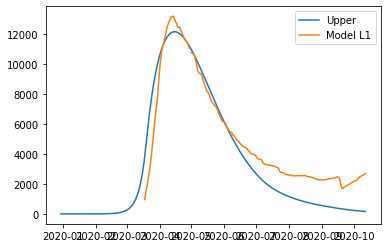

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07673223501858117, 'other': 0.09859420361746067, 'school': 0.004972026033762751, 'transport': 0.22167888375034944, 'work': 0.20069935454392557}
8781.183092500482
error_groups 3156.0407571599967
error_total 1125.028467068097
alpha: 0.4904459506491845 beta: 0.4904459506491845
[7.88372722e+01 4.90445951e-01 2.00699365e-01 7.67322350e-02
 9.85942036e-02 2.21678884e-01 4.97202603e-03]


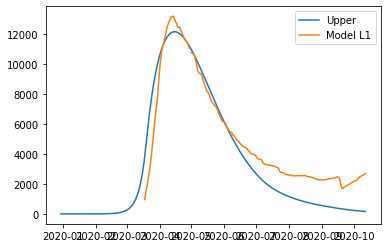

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07673223501858117, 'other': 0.09859420361746067, 'school': 0.004972026033762751, 'transport': 0.22167888375034944, 'work': 0.20069936454392556}
8781.183068458826
error_groups 3156.040735848965
error_total 1125.0284665219722
alpha: 0.4904459506491845 beta: 0.4904459506491845
[7.88372722e+01 4.90445951e-01 2.00699355e-01 7.67322350e-02
 9.85942136e-02 2.21678884e-01 4.97202603e-03]


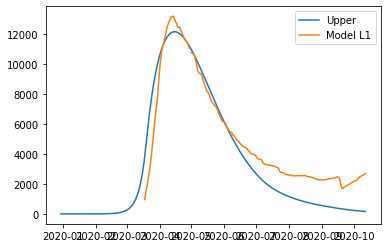

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07673223501858117, 'other': 0.09859421361746067, 'school': 0.004972026033762751, 'transport': 0.22167888375034944, 'work': 0.20069935454392557}
8781.063511040238
error_groups 3155.84050007752
error_total 1125.0446021925436
alpha: 0.4904152255910835 beta: 0.4904152255910835
[7.88372722e+01 4.90415226e-01 2.00705437e-01 7.67324022e-02
 9.86034241e-02 2.21684547e-01 4.97023348e-03]


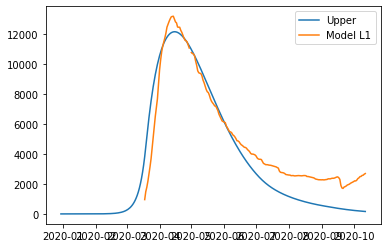

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0767324022198102, 'other': 0.09860342405084925, 'school': 0.004970233481916397, 'transport': 0.221684547420416, 'work': 0.2007054370021578}
8781.063497781874
error_groups 3155.8405478612676
error_total 1125.044589984121
alpha: 0.4904152355910835 beta: 0.4904152355910835
[7.88372722e+01 4.90415236e-01 2.00705437e-01 7.67324022e-02
 9.86034241e-02 2.21684547e-01 4.97023348e-03]


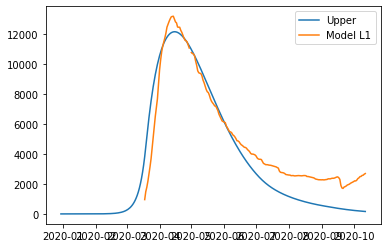

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0767324022198102, 'other': 0.09860342405084925, 'school': 0.004970233481916397, 'transport': 0.221684547420416, 'work': 0.2007054370021578}
8781.012058746095
error_groups 3155.8567157138195
error_total 1125.0310686064552
alpha: 0.4904236814575212 beta: 0.4904236814575212
[7.88372722e+01 4.90423681e-01 2.00701113e-01 7.67299983e-02
 9.86143698e-02 2.21682264e-01 4.95713271e-03]


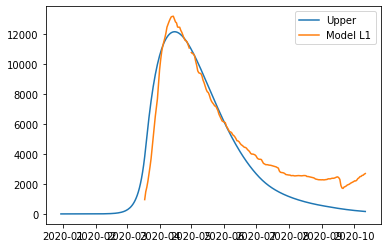

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0767299983308618, 'other': 0.09861436982418655, 'school': 0.004957132708948092, 'transport': 0.22168226368127963, 'work': 0.20070111319548684}
8781.01204549307
error_groups 3155.8567634956385
error_total 1125.0310563994863
alpha: 0.4904236914575212 beta: 0.4904236914575212
[7.88372722e+01 4.90423691e-01 2.00701113e-01 7.67299983e-02
 9.86143698e-02 2.21682264e-01 4.95713271e-03]


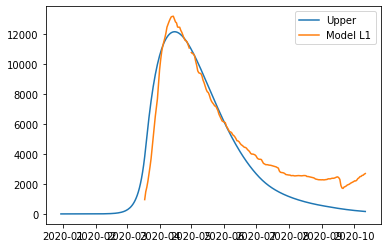

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0767299983308618, 'other': 0.09861436982418655, 'school': 0.004957132708948092, 'transport': 0.22168226368127963, 'work': 0.20070111319548684}
8780.95067698236
error_groups 3155.921571788715
error_total 1125.005821038729
alpha: 0.49045750492327184 beta: 0.49045750492327184
[7.88372722e+01 4.90457505e-01 2.00683818e-01 7.67203828e-02
 9.86581529e-02 2.21673129e-01 4.90472962e-03]


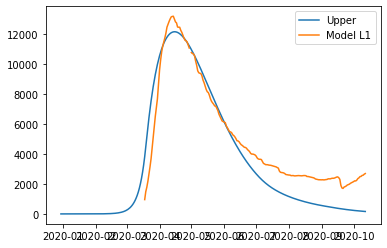

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07672038277506821, 'other': 0.09865815291753573, 'school': 0.004904729617074871, 'transport': 0.22167312872473421, 'work': 0.20068381796880302}
8780.950658580517
error_groups 3155.9215514920843
error_total 1125.0058214176865
alpha: 0.49045750492327184 beta: 0.49045750492327184
[7.88372722e+01 4.90457505e-01 2.00683828e-01 7.67203828e-02
 9.86581529e-02 2.21673129e-01 4.90472962e-03]


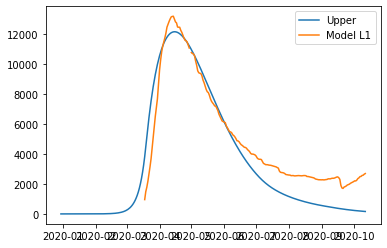

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07672038277506821, 'other': 0.09865815291753573, 'school': 0.004904729617074871, 'transport': 0.22167312872473421, 'work': 0.20068382796880302}
8780.950634539735
error_groups 3155.9215301820614
error_total 1125.0058208715348
alpha: 0.49045750492327184 beta: 0.49045750492327184
[7.88372722e+01 4.90457505e-01 2.00683818e-01 7.67203828e-02
 9.86581629e-02 2.21673129e-01 4.90472962e-03]


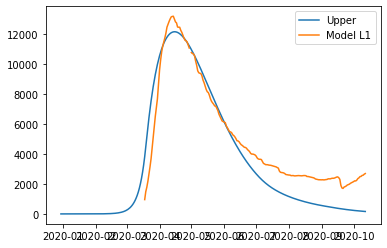

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07672038277506821, 'other': 0.09865816291753572, 'school': 0.004904729617074871, 'transport': 0.22167312872473421, 'work': 0.20068381796880302}
8780.64517116854
error_groups 3155.8017673502386
error_total 1124.9686807636604
alpha: 0.4904863784278972 beta: 0.4904863784278972
[7.88372722e+01 4.90486378e-01 2.00657120e-01 7.67015489e-02
 9.87562542e-02 2.21662064e-01 4.79876222e-03]


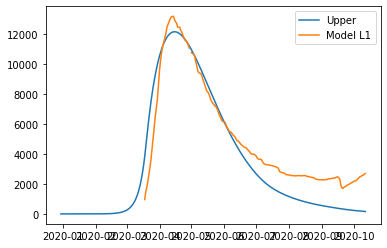

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07670154886232203, 'other': 0.09875625424938352, 'school': 0.004798762218029482, 'transport': 0.22166206410075048, 'work': 0.2006571202900201}
8780.645152764953
error_groups 3155.801747053887
error_total 1124.9686811422132
alpha: 0.4904863784278972 beta: 0.4904863784278972
[7.88372722e+01 4.90486378e-01 2.00657130e-01 7.67015489e-02
 9.87562542e-02 2.21662064e-01 4.79876222e-03]


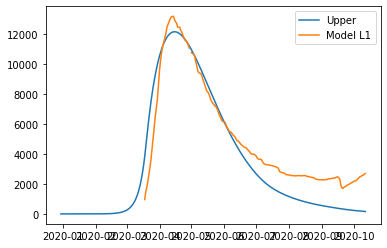

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07670154886232203, 'other': 0.09875625424938352, 'school': 0.004798762218029482, 'transport': 0.22166206410075048, 'work': 0.2006571302900201}
8780.645128726554
error_groups 3155.8017257467873
error_total 1124.9686805959532
alpha: 0.4904863784278972 beta: 0.4904863784278972
[7.88372722e+01 4.90486378e-01 2.00657120e-01 7.67015489e-02
 9.87562642e-02 2.21662064e-01 4.79876222e-03]


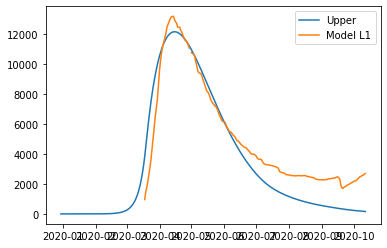

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07670154886232203, 'other': 0.09875626424938351, 'school': 0.004798762218029482, 'transport': 0.22166206410075048, 'work': 0.2006571202900201}
8779.423946896613
error_groups 3155.322938048892
error_total 1124.8202017695444
alpha: 0.49060187244639875 beta: 0.49060187244639875
[7.88372722e+01 4.90601872e-01 2.00550330e-01 7.66262132e-02
 9.91486596e-02 2.21617806e-01 4.37489262e-03]


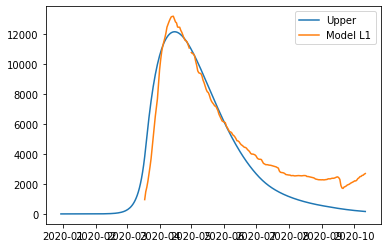

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07662621321133731, 'other': 0.09914865957677467, 'school': 0.0043748926218479265, 'transport': 0.22161780560481556, 'work': 0.20055032957488847}
8779.42392848606
error_groups 3155.32291775367
error_total 1124.8202021464779
alpha: 0.49060187244639875 beta: 0.49060187244639875
[7.88372722e+01 4.90601872e-01 2.00550340e-01 7.66262132e-02
 9.91486596e-02 2.21617806e-01 4.37489262e-03]


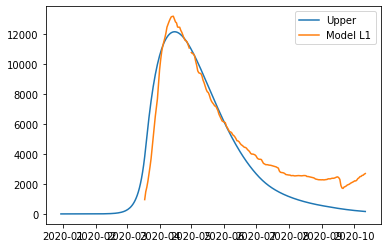

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07662621321133731, 'other': 0.09914865957677467, 'school': 0.0043748926218479265, 'transport': 0.22161780560481556, 'work': 0.20055033957488846}
8779.423904457124
error_groups 3155.3228964581917
error_total 1124.8202015997863
alpha: 0.49060187244639875 beta: 0.49060187244639875
[7.88372722e+01 4.90601872e-01 2.00550330e-01 7.66262132e-02
 9.91486696e-02 2.21617806e-01 4.37489262e-03]


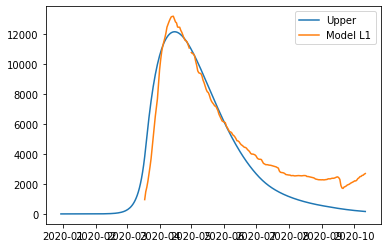

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07662621321133731, 'other': 0.09914866957677466, 'school': 0.0043748926218479265, 'transport': 0.22161780560481556, 'work': 0.20055032957488847}
8777.015252702678
error_groups 3154.286278043316
error_total 1124.5457949318725
alpha: 0.4908524417422969 beta: 0.4908524417422969
[7.88372722e+01 4.90852442e-01 2.00318642e-01 7.64627692e-02
 1.00000000e-01 2.21521785e-01 3.45528910e-03]


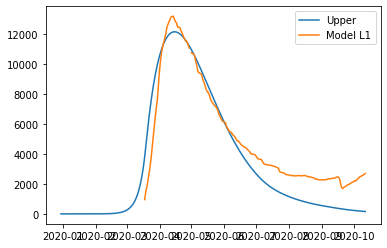

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07646276924022792, 'other': 0.1, 'school': 0.0034552890991214093, 'transport': 0.2215217848731118, 'work': 0.20031864247415224}
8777.015199498679
error_groups 3154.286257750579
error_total 1124.5457883496201
alpha: 0.4908524417422969 beta: 0.4908524417422969
[7.88372722e+01 4.90852442e-01 2.00318652e-01 7.64627692e-02
 1.00000000e-01 2.21521785e-01 3.45528910e-03]


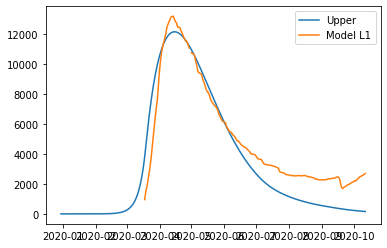

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07646276924022792, 'other': 0.1, 'school': 0.0034552890991214093, 'transport': 0.2215217848731118, 'work': 0.20031865247415223}
8777.015198201865
error_groups 3154.2862498122113
error_total 1124.545789677931
alpha: 0.4908524417422969 beta: 0.4908524417422969
[7.88372722e+01 4.90852442e-01 2.00318642e-01 7.64627792e-02
 1.00000000e-01 2.21521785e-01 3.45528910e-03]


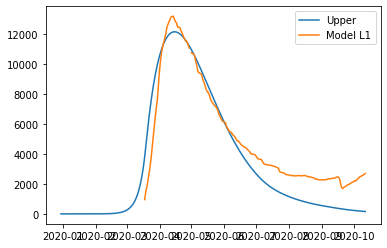

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07646277924022792, 'other': 0.1, 'school': 0.0034552890991214093, 'transport': 0.2215217848731118, 'work': 0.20031864247415224}
8777.015168544502
error_groups 3154.286236480002
error_total 1124.5457864129
alpha: 0.4908524417422969 beta: 0.4908524417422969
[7.88372722e+01 4.90852442e-01 2.00318642e-01 7.64627692e-02
 1.00000010e-01 2.21521785e-01 3.45528910e-03]


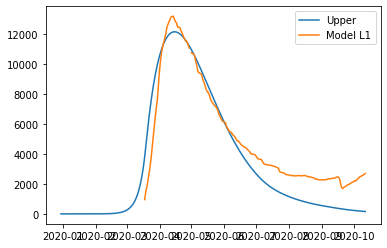

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07646276924022792, 'other': 0.10000001, 'school': 0.0034552890991214093, 'transport': 0.2215217848731118, 'work': 0.20031864247415224}
8776.562800343081
error_groups 3154.069404102044
error_total 1124.4986792482075
alpha: 0.4908069235986464 beta: 0.4908069235986464
[7.88372722e+01 4.90806924e-01 2.00323458e-01 7.64603271e-02
 1.00000000e-01 2.21529233e-01 3.43451381e-03]


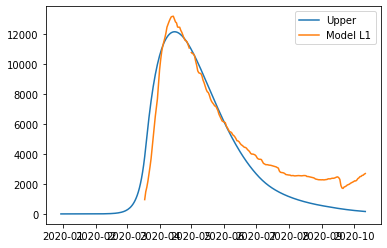

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07646032713575454, 'other': 0.1, 'school': 0.003434513807619441, 'transport': 0.22152923271282296, 'work': 0.20032345823503378}
8776.562781919676
error_groups 3154.069383805345
error_total 1124.4986796228663
alpha: 0.4908069235986464 beta: 0.4908069235986464
[7.88372722e+01 4.90806924e-01 2.00323468e-01 7.64603271e-02
 1.00000000e-01 2.21529233e-01 3.43451381e-03]


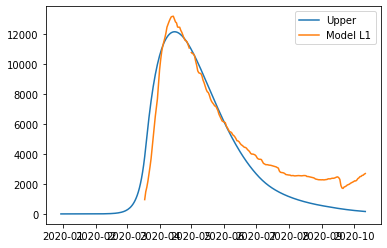

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07646032713575454, 'other': 0.1, 'school': 0.003434513807619441, 'transport': 0.22152923271282296, 'work': 0.20032346823503377}
8776.562757906668
error_groups 3154.0693625296344
error_total 1124.498679075407
alpha: 0.4908069235986464 beta: 0.4908069235986464
[7.88372722e+01 4.90806924e-01 2.00323458e-01 7.64603271e-02
 1.00000010e-01 2.21529233e-01 3.43451381e-03]


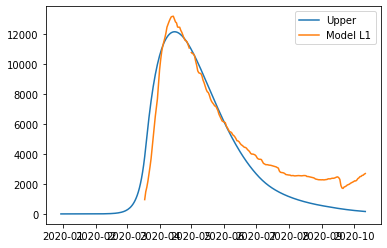

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07646032713575454, 'other': 0.10000001, 'school': 0.003434513807619441, 'transport': 0.22152923271282296, 'work': 0.20032345823503378}
8776.357489273676
error_groups 3153.8823973045137
error_total 1124.4950183938327
alpha: 0.49076420698621015 beta: 0.49076420698621015
[7.88372722e+01 4.90764207e-01 2.00325457e-01 7.64557367e-02
 1.00000000e-01 2.21535514e-01 3.40202891e-03]


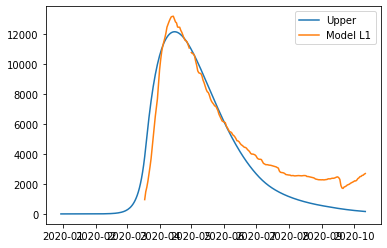

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07645573673111632, 'other': 0.1, 'school': 0.003402028905679429, 'transport': 0.2215355139773339, 'work': 0.20032545683073885}
8776.357470851854
error_groups 3153.88237700435
error_total 1124.4950187695006
alpha: 0.49076420698621015 beta: 0.49076420698621015
[7.88372722e+01 4.90764207e-01 2.00325467e-01 7.64557367e-02
 1.00000000e-01 2.21535514e-01 3.40202891e-03]


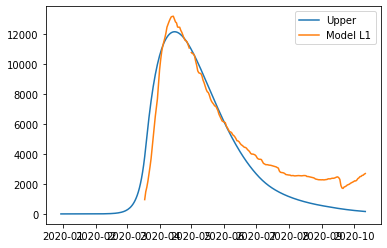

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07645573673111632, 'other': 0.1, 'school': 0.003402028905679429, 'transport': 0.2215355139773339, 'work': 0.20032546683073885}
8776.35744683479
error_groups 3153.882355723995
error_total 1124.495018222159
alpha: 0.49076420698621015 beta: 0.49076420698621015
[7.88372722e+01 4.90764207e-01 2.00325457e-01 7.64557367e-02
 1.00000010e-01 2.21535514e-01 3.40202891e-03]


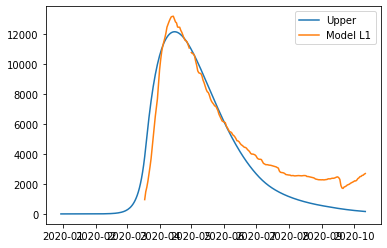

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07645573673111632, 'other': 0.10000001, 'school': 0.003402028905679429, 'transport': 0.2215355139773339, 'work': 0.20032545683073885}
8775.90604413135
error_groups 3153.13396215265
error_total 1124.55441639574
alpha: 0.4905933405364651 beta: 0.4905933405364651
[7.88372722e+01 4.90593341e-01 2.00333451e-01 7.64373751e-02
 1.00000000e-01 2.21560639e-01 3.27208930e-03]


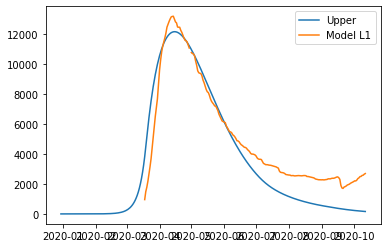

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07643737511256342, 'other': 0.1, 'school': 0.003272089297919381, 'transport': 0.22156063903537765, 'work': 0.20033345121355914}
8775.906031268201
error_groups 3153.1340100011994
error_total 1124.5544042534004
alpha: 0.4905933505364651 beta: 0.4905933505364651
[7.88372722e+01 4.90593351e-01 2.00333451e-01 7.64373751e-02
 1.00000000e-01 2.21560639e-01 3.27208930e-03]


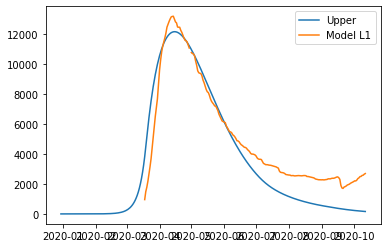

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07643737511256342, 'other': 0.1, 'school': 0.003272089297919381, 'transport': 0.22156063903537765, 'work': 0.20033345121355914}
8775.851931609885
error_groups 3153.0423726545423
error_total 1124.5619117910685
alpha: 0.49056047339804765 beta: 0.49056047339804765
[7.88372722e+01 4.90560473e-01 2.00326634e-01 7.64268441e-02
 1.00000000e-01 2.21563251e-01 3.20617468e-03]


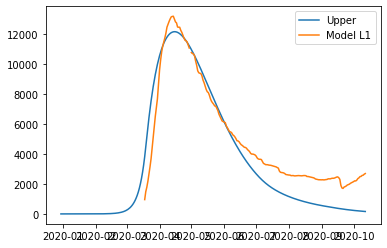

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07642684414266475, 'other': 0.1, 'school': 0.003206174676127765, 'transport': 0.2215632508606895, 'work': 0.20032663380773555}
8775.851862089794
error_groups 3153.042420508436
error_total 1124.5618883162715
alpha: 0.49056048339804764 beta: 0.49056048339804764
[7.88372722e+01 4.90560483e-01 2.00326634e-01 7.64268441e-02
 1.00000000e-01 2.21563251e-01 3.20617468e-03]


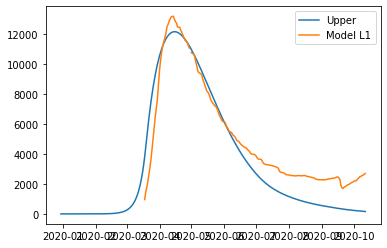

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07642684414266475, 'other': 0.1, 'school': 0.003206174676127765, 'transport': 0.2215632508606895, 'work': 0.20032663380773555}
8775.520394967945
error_groups 3153.456710495476
error_total 1124.412736894494
alpha: 0.4905848590313344 beta: 0.4905848590313344
[7.88372722e+01 4.90584859e-01 2.00313053e-01 7.63530730e-02
 1.00000000e-01 2.21535848e-01 3.07287270e-03]


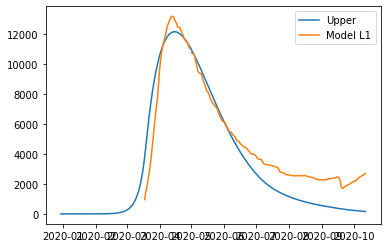

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07635307304455936, 'other': 0.1, 'school': 0.0030728726965607023, 'transport': 0.22153584844858146, 'work': 0.20031305347055403}
8775.520376542943
error_groups 3153.4566901856692
error_total 1124.412737271455
alpha: 0.4905848590313344 beta: 0.4905848590313344
[7.88372722e+01 4.90584859e-01 2.00313063e-01 7.63530730e-02
 1.00000000e-01 2.21535848e-01 3.07287270e-03]


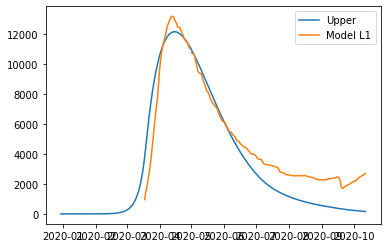

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07635307304455936, 'other': 0.1, 'school': 0.0030728726965607023, 'transport': 0.22153584844858146, 'work': 0.20031306347055403}
8775.520376536628
error_groups 3153.45668222925
error_total 1124.4127388614756
alpha: 0.4905848590313344 beta: 0.4905848590313344
[7.88372722e+01 4.90584859e-01 2.00313053e-01 7.63530830e-02
 1.00000000e-01 2.21535848e-01 3.07287270e-03]


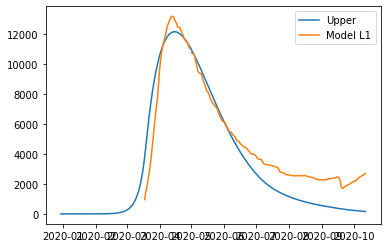

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07635308304455936, 'other': 0.1, 'school': 0.0030728726965607023, 'transport': 0.22153584844858146, 'work': 0.20031305347055403}
8775.52035250869
error_groups 3153.456668889443
error_total 1124.4127367238495
alpha: 0.4905848590313344 beta: 0.4905848590313344
[7.88372722e+01 4.90584859e-01 2.00313053e-01 7.63530730e-02
 1.00000010e-01 2.21535848e-01 3.07287270e-03]


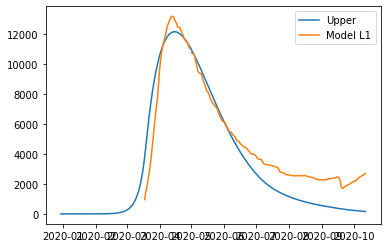

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07635307304455936, 'other': 0.10000001, 'school': 0.0030728726965607023, 'transport': 0.22153584844858146, 'work': 0.20031305347055403}
8771.382234210789
error_groups 3152.0003839611727
error_total 1123.8763700499233
alpha: 0.4897952340120298 beta: 0.4897952340120298
[7.88372722e+01 4.89795234e-01 2.00039491e-01 7.59957682e-02
 1.00000000e-01 2.21565596e-01 9.34289000e-04]


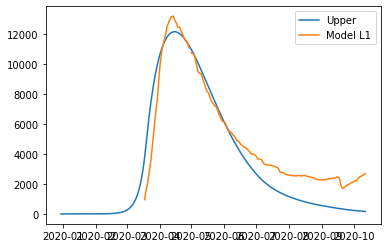

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07599576821690406, 'other': 0.1, 'school': 0.0009342890004725058, 'transport': 0.22156559597489053, 'work': 0.20003949116380798}
8771.38221574982
error_groups 3152.0003636180313
error_total 1123.8763704263577
alpha: 0.4897952340120298 beta: 0.4897952340120298
[7.88372722e+01 4.89795234e-01 2.00039501e-01 7.59957682e-02
 1.00000000e-01 2.21565596e-01 9.34289000e-04]


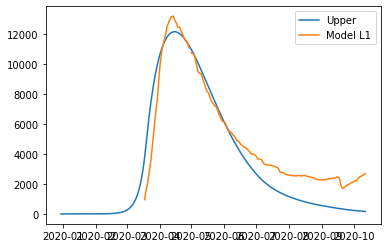

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07599576821690406, 'other': 0.1, 'school': 0.0009342890004725058, 'transport': 0.22156559597489053, 'work': 0.20003950116380798}
8771.382215690086
error_groups 3152.0003556092693
error_total 1123.8763720161635
alpha: 0.4897952340120298 beta: 0.4897952340120298
[7.88372722e+01 4.89795234e-01 2.00039491e-01 7.59957782e-02
 1.00000000e-01 2.21565596e-01 9.34289000e-04]


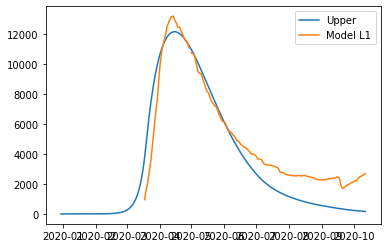

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07599577821690405, 'other': 0.1, 'school': 0.0009342890004725058, 'transport': 0.22156559597489053, 'work': 0.20003949116380798}
8771.382191636816
error_groups 3152.000342256968
error_total 1123.8763698759697
alpha: 0.4897952340120298 beta: 0.4897952340120298
[7.88372722e+01 4.89795234e-01 2.00039491e-01 7.59957682e-02
 1.00000010e-01 2.21565596e-01 9.34289000e-04]


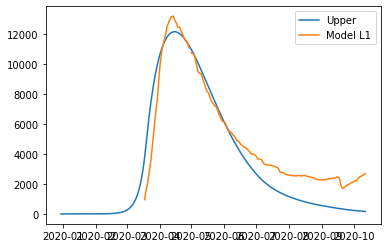

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07599576821690406, 'other': 0.10000001, 'school': 0.0009342890004725058, 'transport': 0.22156559597489053, 'work': 0.20003949116380798}
8770.776714753589
error_groups 3151.7927453959574
error_total 1123.7967938715262
alpha: 0.4896812445836062 beta: 0.4896812445836062
[7.88372722e+01 4.89681245e-01 2.00000000e-01 7.59441881e-02
 1.00000000e-01 2.21569890e-01 6.25565331e-04]


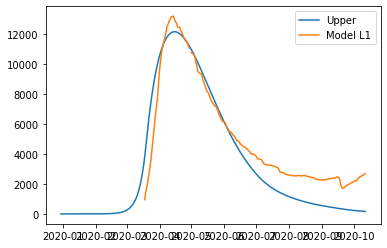

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07594418807179505, 'other': 0.1, 'school': 0.0006255653313974648, 'transport': 0.2215698902961672, 'work': 0.2}
8770.776696287225
error_groups 3151.792725048049
error_total 1123.7967942478351
alpha: 0.4896812445836062 beta: 0.4896812445836062
[7.88372722e+01 4.89681245e-01 2.00000010e-01 7.59441881e-02
 1.00000000e-01 2.21569890e-01 6.25565331e-04]


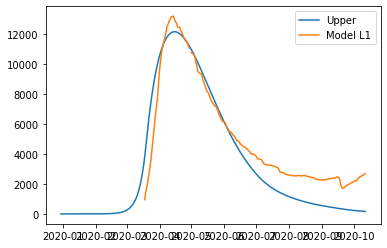

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07594418807179505, 'other': 0.1, 'school': 0.0006255653313974648, 'transport': 0.2215698902961672, 'work': 0.20000001}
8770.776696219644
error_groups 3151.792717031699
error_total 1123.796795837589
alpha: 0.4896812445836062 beta: 0.4896812445836062
[7.88372722e+01 4.89681245e-01 2.00000000e-01 7.59441981e-02
 1.00000000e-01 2.21569890e-01 6.25565331e-04]


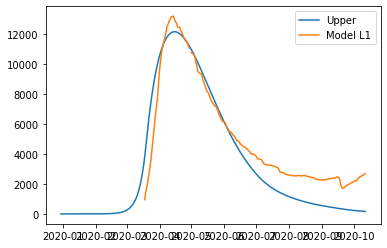

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07594419807179505, 'other': 0.1, 'school': 0.0006255653313974648, 'transport': 0.2215698902961672, 'work': 0.2}
8770.776672162821
error_groups 3151.7927036776764
error_total 1123.7967936970288
alpha: 0.4896812445836062 beta: 0.4896812445836062
[7.88372722e+01 4.89681245e-01 2.00000000e-01 7.59441881e-02
 1.00000010e-01 2.21569890e-01 6.25565331e-04]


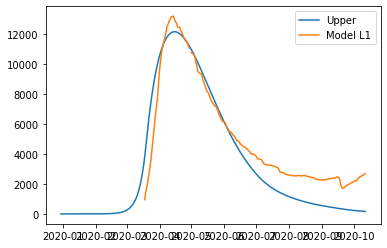

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07594418807179505, 'other': 0.10000001, 'school': 0.0006255653313974648, 'transport': 0.2215698902961672, 'work': 0.2}
8770.586542432686
error_groups 3151.2215110534516
error_total 1123.8730062758468
alpha: 0.4895048062568764 beta: 0.4895048062568764
[7.88372722e+01 4.89504806e-01 2.00000000e-01 7.58642468e-02
 1.00000000e-01 2.21576503e-01 4.89209194e-04]


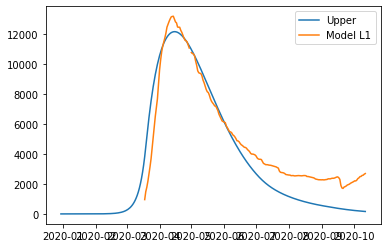

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07586424683007606, 'other': 0.1, 'school': 0.0004892091935609474, 'transport': 0.2215765029846483, 'work': 0.2}
8770.58647368327
error_groups 3151.221558987607
error_total 1123.8729829391327
alpha: 0.4895048162568764 beta: 0.4895048162568764
[7.88372722e+01 4.89504816e-01 2.00000000e-01 7.58642468e-02
 1.00000000e-01 2.21576503e-01 4.89209194e-04]


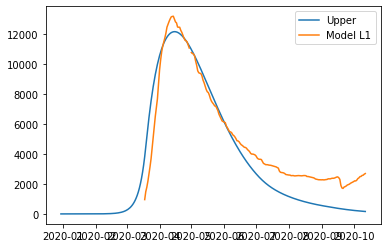

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07586424683007606, 'other': 0.1, 'school': 0.0004892091935609474, 'transport': 0.2215765029846483, 'work': 0.2}
8769.710676945611
error_groups 3151.361729117054
error_total 1123.6697895657114
alpha: 0.4894478434971853 beta: 0.4894478434971853
[7.88372722e+01 4.89447843e-01 2.00000000e-01 7.57712409e-02
 1.00000000e-01 2.21560731e-01 1.16546269e-04]


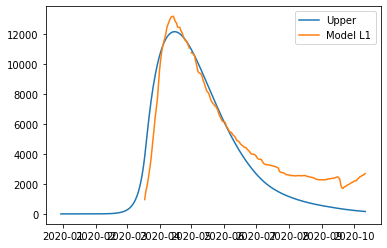

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07577124093011864, 'other': 0.1, 'school': 0.00011654626895421998, 'transport': 0.2215607307438024, 'work': 0.2}
8769.710664850156
error_groups 3151.361777028608
error_total 1123.6697775643097
alpha: 0.4894478534971853 beta: 0.4894478534971853
[7.88372722e+01 4.89447853e-01 2.00000000e-01 7.57712409e-02
 1.00000000e-01 2.21560731e-01 1.16546269e-04]


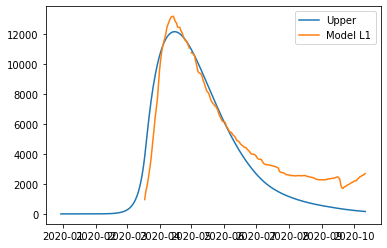

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07577124093011864, 'other': 0.1, 'school': 0.00011654626895421998, 'transport': 0.2215607307438024, 'work': 0.2}
8769.692826925067
error_groups 3151.2695944470865
error_total 1123.6846464955963
alpha: 0.48940169021915175 beta: 0.48940169021915175
[7.88372722e+01 4.89401690e-01 2.00000000e-01 7.57276708e-02
 1.00000000e-01 2.21556507e-01 1.08488976e-04]


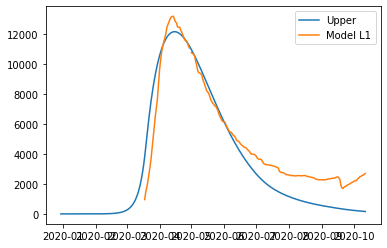

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07572767077744247, 'other': 0.1, 'school': 0.00010848897592439251, 'transport': 0.22155650720732883, 'work': 0.2}
8769.692814828053
error_groups 3151.2696423661046
error_total 1123.6846344923897
alpha: 0.48940170021915175 beta: 0.48940170021915175
[7.88372722e+01 4.89401700e-01 2.00000000e-01 7.57276708e-02
 1.00000000e-01 2.21556507e-01 1.08488976e-04]


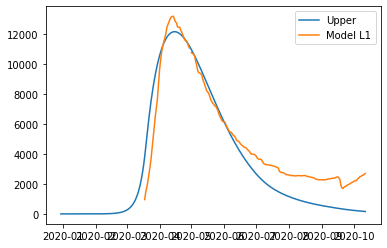

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07572767077744247, 'other': 0.1, 'school': 0.00010848897592439251, 'transport': 0.22155650720732883, 'work': 0.2}
8769.679255538656
error_groups 3151.1997202241682
error_total 1123.6959070628975
alpha: 0.48936668847722053 beta: 0.48936668847722053
[7.88372722e+01 4.89366688e-01 2.00000000e-01 7.56946280e-02
 1.00000000e-01 2.21553304e-01 1.02378483e-04]


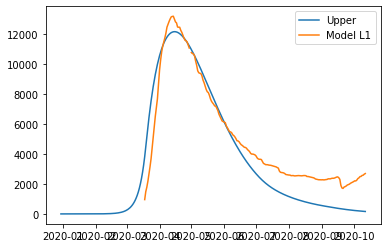

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07569462802717959, 'other': 0.1, 'school': 0.00010237848273061979, 'transport': 0.22155330416000515, 'work': 0.2}
8769.679243440494
error_groups 3151.1997681488424
error_total 1123.6958950583303
alpha: 0.48936669847722053 beta: 0.48936669847722053
[7.88372722e+01 4.89366698e-01 2.00000000e-01 7.56946280e-02
 1.00000000e-01 2.21553304e-01 1.02378483e-04]


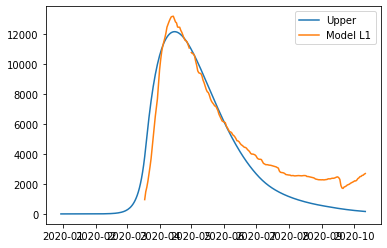

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07569462802717959, 'other': 0.1, 'school': 0.00010237848273061979, 'transport': 0.22155330416000515, 'work': 0.2}
8769.669841723015
error_groups 3151.151344058375
error_total 1123.703699532928
alpha: 0.48934245586282216 beta: 0.48934245586282216
[7.88372722e+01 4.89342456e-01 2.00000000e-01 7.56717517e-02
 1.00000000e-01 2.21551087e-01 9.81480297e-05]


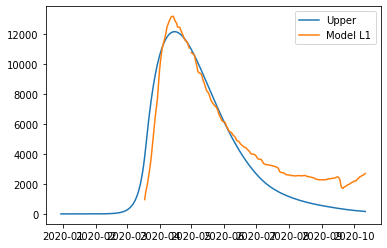

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07567175167355826, 'other': 0.1, 'school': 9.814802969661425e-05, 'transport': 0.22155108660720887, 'work': 0.2}
8769.669829624065
error_groups 3151.1513919869635
error_total 1123.7036875274202
alpha: 0.48934246586282215 beta: 0.48934246586282215
[7.88372722e+01 4.89342466e-01 2.00000000e-01 7.56717517e-02
 1.00000000e-01 2.21551087e-01 9.81480297e-05]


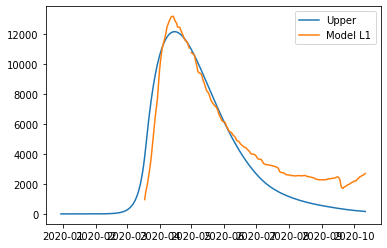

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07567175167355826, 'other': 0.1, 'school': 9.814802969661425e-05, 'transport': 0.22155108660720887, 'work': 0.2}
8769.660550940302
error_groups 3151.103676289519
error_total 1123.7113749301566
alpha: 0.48931857822673075 beta: 0.48931857822673075
[7.88372722e+01 4.89318578e-01 2.00000000e-01 7.56492104e-02
 1.00000000e-01 2.21548902e-01 9.39795477e-05]


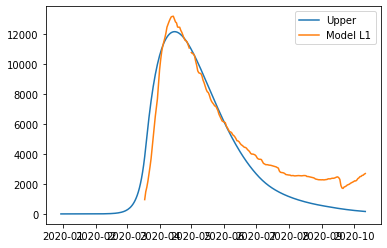

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07564921043067421, 'other': 0.1, 'school': 9.397954765058619e-05, 'transport': 0.22154890153886203, 'work': 0.2}
8769.660538840595
error_groups 3151.103724221962
error_total 1123.711362923727
alpha: 0.48931858822673074 beta: 0.48931858822673074
[7.88372722e+01 4.89318588e-01 2.00000000e-01 7.56492104e-02
 1.00000000e-01 2.21548902e-01 9.39795477e-05]


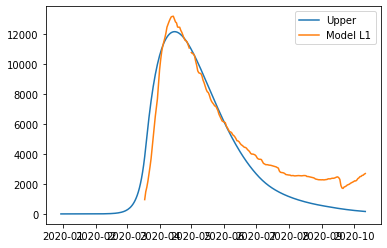

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07564921043067421, 'other': 0.1, 'school': 9.397954765058619e-05, 'transport': 0.22154890153886203, 'work': 0.2}
8769.655804580398
error_groups 3151.0793541956723
error_total 1123.715290076945
alpha: 0.48930639489162137 beta: 0.48930639489162137
[7.88372722e+01 4.89306395e-01 2.00000000e-01 7.56377090e-02
 1.00000000e-01 2.21547787e-01 9.18526196e-05]


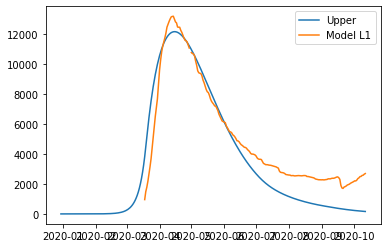

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07563770897739856, 'other': 0.1, 'school': 9.185261961341449e-05, 'transport': 0.22154778662866723, 'work': 0.2}
8769.655792480298
error_groups 3151.079402130081
error_total 1123.7152780700437
alpha: 0.48930640489162136 beta: 0.48930640489162136
[7.88372722e+01 4.89306405e-01 2.00000000e-01 7.56377090e-02
 1.00000000e-01 2.21547787e-01 9.18526196e-05]


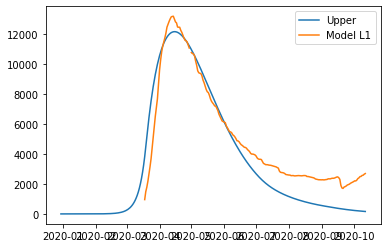

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07563770897739856, 'other': 0.1, 'school': 9.185261961341449e-05, 'transport': 0.22154778662866723, 'work': 0.2}
8769.649620683273
error_groups 3151.0476964784357
error_total 1123.7203848409674
alpha: 0.4892905370466167 beta: 0.4892905370466167
[7.88372722e+01 4.89290537e-01 2.00000000e-01 7.56227387e-02
 1.00000000e-01 2.21546335e-01 8.90842073e-05]


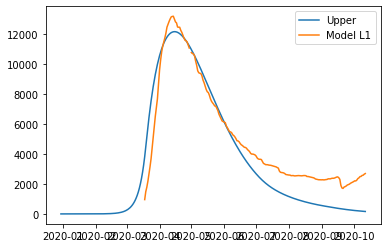

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07562273867068563, 'other': 0.1, 'school': 8.908420728241063e-05, 'transport': 0.22154633546009106, 'work': 0.2}
8769.649608582684
error_groups 3151.047744415402
error_total 1123.7203728334562
alpha: 0.4892905470466167 beta: 0.4892905470466167
[7.88372722e+01 4.89290547e-01 2.00000000e-01 7.56227387e-02
 1.00000000e-01 2.21546335e-01 8.90842073e-05]


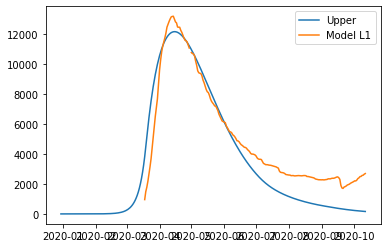

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07562273867068563, 'other': 0.1, 'school': 8.908420728241063e-05, 'transport': 0.22154633546009106, 'work': 0.2}
8769.647613814062
error_groups 3151.0374301507777
error_total 1123.7220367326568
alpha: 0.4892853944865858 beta: 0.4892853944865858
[7.88372722e+01 4.89285394e-01 2.00000000e-01 7.56178839e-02
 1.00000000e-01 2.21545865e-01 8.81864354e-05]


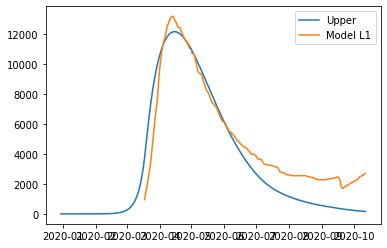

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07561788393153733, 'other': 0.1, 'school': 8.818643544782553e-05, 'transport': 0.2215458648588514, 'work': 0.2}
8769.64760171331
error_groups 3151.037478088573
error_total 1123.7220247249472
alpha: 0.4892854044865858 beta: 0.4892854044865858
[7.88372722e+01 4.89285404e-01 2.00000000e-01 7.56178839e-02
 1.00000000e-01 2.21545865e-01 8.81864354e-05]


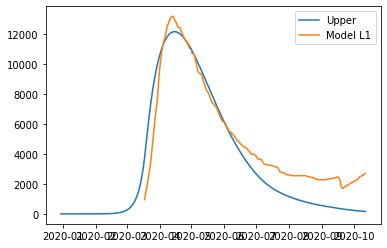

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07561788393153733, 'other': 0.1, 'school': 8.818643544782553e-05, 'transport': 0.2215458648588514, 'work': 0.2}
8769.646571988364
error_groups 3151.0321020755127
error_total 1123.72289398257
alpha: 0.4892827255729195 beta: 0.4892827255729195
[7.88372722e+01 4.89282726e-01 2.00000000e-01 7.56153644e-02
 1.00000000e-01 2.21545621e-01 8.77205050e-05]


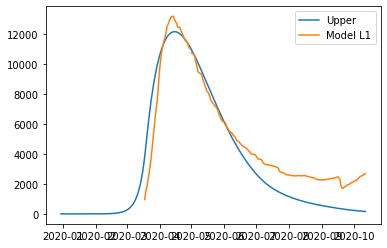

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07561536439271205, 'other': 0.1, 'school': 8.772050495714831e-05, 'transport': 0.22154562062367036, 'work': 0.2}
8769.64655988753
error_groups 3151.0321500137406
error_total 1123.7228819747575
alpha: 0.4892827355729195 beta: 0.4892827355729195
[7.88372722e+01 4.89282736e-01 2.00000000e-01 7.56153644e-02
 1.00000000e-01 2.21545621e-01 8.77205050e-05]


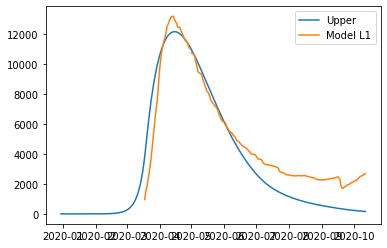

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07561536439271205, 'other': 0.1, 'school': 8.772050495714831e-05, 'transport': 0.22154562062367036, 'work': 0.2}
8769.64618256875
error_groups 3151.0294414364853
error_total 1123.7233482264528
alpha: 0.48928140452821367 beta: 0.48928140452821367
[7.88372722e+01 4.89281405e-01 2.00000000e-01 7.56141175e-02
 1.00000000e-01 2.21545500e-01 8.75484873e-05]


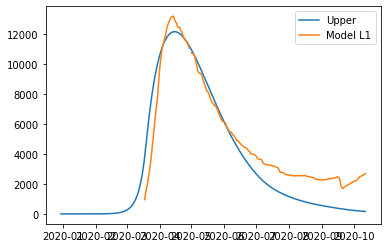

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07561411747781953, 'other': 0.1, 'school': 8.754848730903932e-05, 'transport': 0.22154549978063526, 'work': 0.2}
8769.646170467848
error_groups 3151.0294893749297
error_total 1123.7233362185837
alpha: 0.48928141452821367 beta: 0.48928141452821367
[7.88372722e+01 4.89281415e-01 2.00000000e-01 7.56141175e-02
 1.00000000e-01 2.21545500e-01 8.75484873e-05]


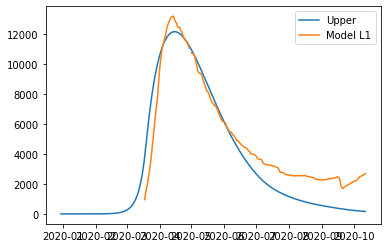

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07561411747781953, 'other': 0.1, 'school': 8.754848730903932e-05, 'transport': 0.22154549978063526, 'work': 0.2}
8769.645858009062
error_groups 3151.027224098293
error_total 1123.7237267821536
alpha: 0.48928030358992597 beta: 0.48928030358992597
[7.88372722e+01 4.89280304e-01 2.00000000e-01 7.56130783e-02
 1.00000000e-01 2.21545399e-01 8.74051305e-05]


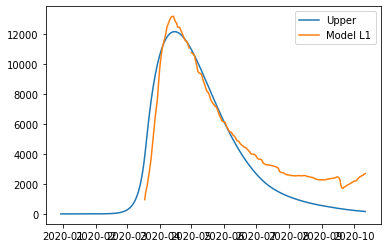

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0756130783181752, 'other': 0.1, 'school': 8.740513045357242e-05, 'transport': 0.22154539907191315, 'work': 0.2}
8769.645845908102
error_groups 3151.0272720369176
error_total 1123.723714774237
alpha: 0.48928031358992596 beta: 0.48928031358992596
[7.88372722e+01 4.89280314e-01 2.00000000e-01 7.56130783e-02
 1.00000000e-01 2.21545399e-01 8.74051305e-05]


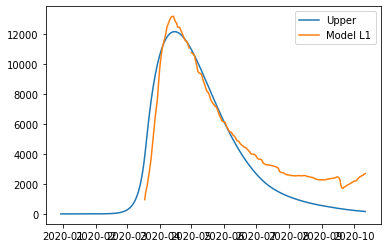

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0756130783181752, 'other': 0.1, 'school': 8.740513045357242e-05, 'transport': 0.22154539907191315, 'work': 0.2}
8769.645577773794
error_groups 3151.0253096922843
error_total 1123.724053616302
alpha: 0.48927935306251086 beta: 0.48927935306251086
[7.88372722e+01 4.89279353e-01 2.00000000e-01 7.56121811e-02
 1.00000000e-01 2.21545312e-01 8.72813591e-05]


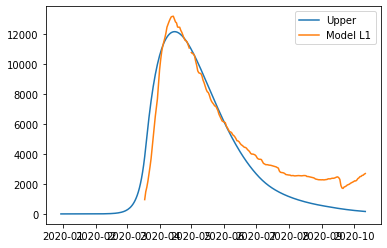

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07561218112916683, 'other': 0.1, 'school': 8.72813591007289e-05, 'transport': 0.22154531212207923, 'work': 0.2}
8769.645565672789
error_groups 3151.0253576310683
error_total 1123.724041608344
alpha: 0.48927936306251085 beta: 0.48927936306251085
[7.88372722e+01 4.89279363e-01 2.00000000e-01 7.56121811e-02
 1.00000000e-01 2.21545312e-01 8.72813591e-05]


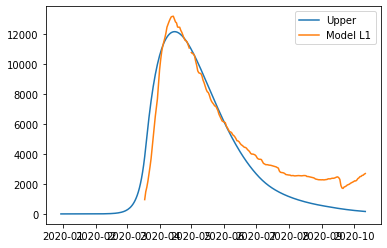

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07561218112916683, 'other': 0.1, 'school': 8.72813591007289e-05, 'transport': 0.22154531212207923, 'work': 0.2}
8769.645378469584
error_groups 3151.0239482255956
error_total 1123.7242860487977
alpha: 0.48927867707717987 beta: 0.48927867707717987
[7.88372722e+01 4.89278677e-01 2.00000000e-01 7.56115431e-02
 1.00000000e-01 2.21545250e-01 8.71933368e-05]


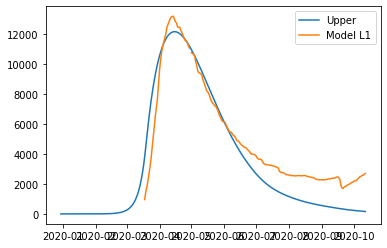

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07561154307644037, 'other': 0.1, 'school': 8.719333679059813e-05, 'transport': 0.22154525028608024, 'work': 0.2}
8769.64536636855
error_groups 3151.0239961644884
error_total 1123.7242740408121
alpha: 0.48927868707717986 beta: 0.48927868707717986
[7.88372722e+01 4.89278687e-01 2.00000000e-01 7.56115431e-02
 1.00000000e-01 2.21545250e-01 8.71933368e-05]


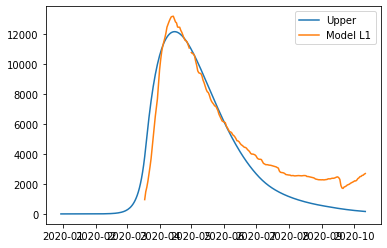

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07561154307644037, 'other': 0.1, 'school': 8.719333679059813e-05, 'transport': 0.22154525028608024, 'work': 0.2}
8769.645046041205
error_groups 3151.0216774947303
error_total 1123.7246737092948
alpha: 0.4892775496317527 beta: 0.4892775496317527
[7.88372722e+01 4.89277550e-01 2.00000000e-01 7.56104789e-02
 1.00000000e-01 2.21545147e-01 8.70465284e-05]


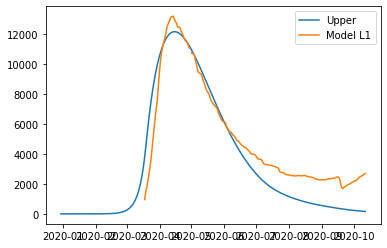

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07561047889709246, 'other': 0.1, 'school': 8.704652835187349e-05, 'transport': 0.22154514715260812, 'work': 0.2}
8769.645033940109
error_groups 3151.021725433811
error_total 1123.7246617012595
alpha: 0.4892775596317527 beta: 0.4892775596317527
[7.88372722e+01 4.89277560e-01 2.00000000e-01 7.56104789e-02
 1.00000000e-01 2.21545147e-01 8.70465284e-05]


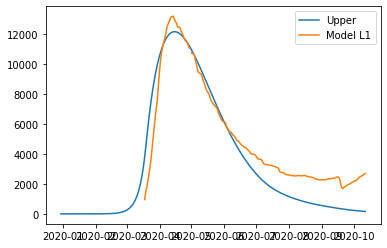

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07561047889709246, 'other': 0.1, 'school': 8.704652835187349e-05, 'transport': 0.22154514715260812, 'work': 0.2}
8769.644906607478
error_groups 3151.0207251043657
error_total 1123.7248363006224
alpha: 0.48927707675875226 beta: 0.48927707675875226
[7.88372722e+01 4.89277077e-01 2.00000000e-01 7.56100326e-02
 1.00000000e-01 2.21545104e-01 8.69849540e-05]


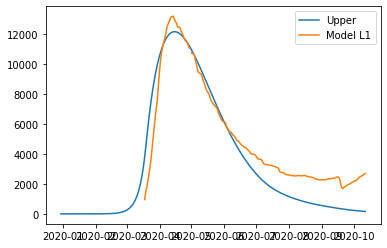

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07561003255914199, 'other': 0.1, 'school': 8.698495397742216e-05, 'transport': 0.22154510389638193, 'work': 0.2}
8769.644894506364
error_groups 3151.0207730435222
error_total 1123.7248242925682
alpha: 0.48927708675875226 beta: 0.48927708675875226
[7.88372722e+01 4.89277087e-01 2.00000000e-01 7.56100326e-02
 1.00000000e-01 2.21545104e-01 8.69849540e-05]


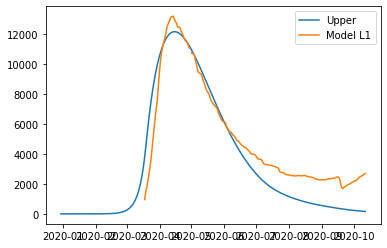

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07561003255914199, 'other': 0.1, 'school': 8.698495397742216e-05, 'transport': 0.22154510389638193, 'work': 0.2}
8769.644834145249
error_groups 3151.0202301676045
error_total 1123.7249207955288
alpha: 0.48927683101692415 beta: 0.48927683101692415
[7.88372722e+01 4.89276831e-01 2.00000000e-01 7.56098006e-02
 1.00000000e-01 2.21545081e-01 8.69529551e-05]


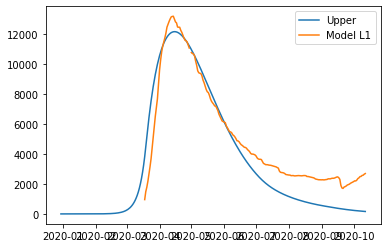

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07560980060700302, 'other': 0.1, 'school': 8.69529551123365e-05, 'transport': 0.22154508141706067, 'work': 0.2}
8769.64482204412
error_groups 3151.0202781068033
error_total 1123.7249087874634
alpha: 0.48927684101692415 beta: 0.48927684101692415
[7.88372722e+01 4.89276841e-01 2.00000000e-01 7.56098006e-02
 1.00000000e-01 2.21545081e-01 8.69529551e-05]


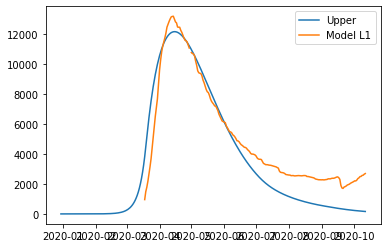

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07560980060700302, 'other': 0.1, 'school': 8.69529551123365e-05, 'transport': 0.22154508141706067, 'work': 0.2}
8769.644697806229
error_groups 3151.0192989544266
error_total 1123.7250797703605
alpha: 0.4892763686589688 beta: 0.4892763686589688
[7.88372722e+01 4.89276369e-01 2.00000000e-01 7.56093642e-02
 1.00000000e-01 2.21545039e-01 8.68927499e-05]


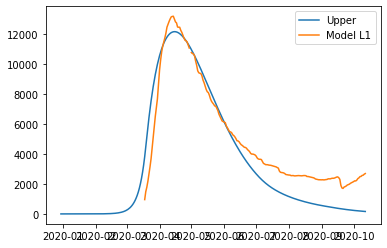

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07560936419405073, 'other': 0.1, 'school': 8.689274993706062e-05, 'transport': 0.22154503912270196, 'work': 0.2}
8769.644685705072
error_groups 3151.0193468937005
error_total 1123.7250677622746
alpha: 0.4892763786589688 beta: 0.4892763786589688
[7.88372722e+01 4.89276379e-01 2.00000000e-01 7.56093642e-02
 1.00000000e-01 2.21545039e-01 8.68927499e-05]


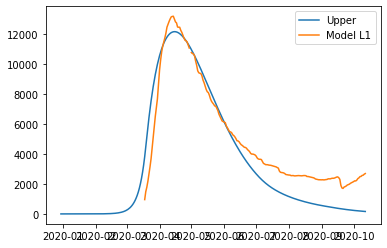

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07560936419405073, 'other': 0.1, 'school': 8.689274993706062e-05, 'transport': 0.22154503912270196, 'work': 0.2}
8769.644665503205
error_groups 3151.019076199266
error_total 1123.7251178607878
alpha: 0.4892762580864752 beta: 0.4892762580864752
[7.88372722e+01 4.89276258e-01 2.00000000e-01 7.56092598e-02
 1.00000000e-01 2.21545029e-01 8.68784923e-05]


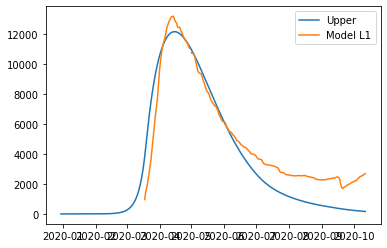

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07560925982683582, 'other': 0.1, 'school': 8.687849234482535e-05, 'transport': 0.2215450290081793, 'work': 0.2}
8769.644653402045
error_groups 3151.0191241385587
error_total 1123.7251058526972
alpha: 0.4892762680864752 beta: 0.4892762680864752
[7.88372722e+01 4.89276268e-01 2.00000000e-01 7.56092598e-02
 1.00000000e-01 2.21545029e-01 8.68784923e-05]


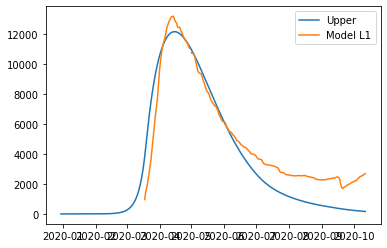

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07560925982683582, 'other': 0.1, 'school': 8.687849234482535e-05, 'transport': 0.2215450290081793, 'work': 0.2}
8769.64464661521
error_groups 3151.018945952109
error_total 1123.7251401326203
alpha: 0.48927619343364476 beta: 0.48927619343364476
[7.88372722e+01 4.89276193e-01 2.00000000e-01 7.56091988e-02
 1.00000000e-01 2.21545023e-01 8.68701558e-05]


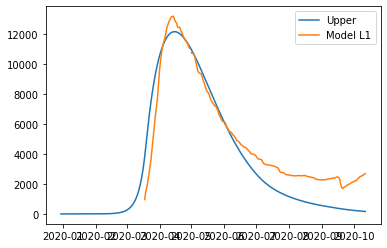

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07560919880229326, 'other': 0.1, 'school': 8.687015578966391e-05, 'transport': 0.2215450230941179, 'work': 0.2}
8769.644634514047
error_groups 3151.018993891411
error_total 1123.7251281245274
alpha: 0.48927620343364475 beta: 0.48927620343364475
[7.88372722e+01 4.89276203e-01 2.00000000e-01 7.56091988e-02
 1.00000000e-01 2.21545023e-01 8.68701558e-05]


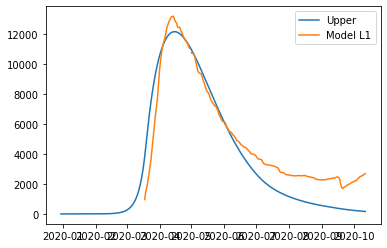

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07560919880229326, 'other': 0.1, 'school': 8.687015578966391e-05, 'transport': 0.2215450230941179, 'work': 0.2}
8769.644610079033
error_groups 3151.018470884203
error_total 1123.7252278389658
alpha: 0.4892759438203511 beta: 0.4892759438203511
[7.88372722e+01 4.89275944e-01 2.00000000e-01 7.56089538e-02
 1.00000000e-01 2.21544999e-01 8.68366804e-05]


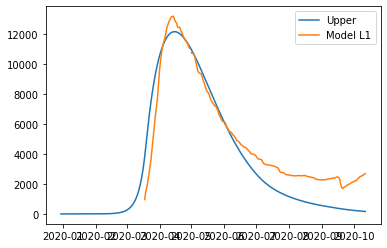

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07560895375838113, 'other': 0.1, 'school': 8.683668037133325e-05, 'transport': 0.22154499934621769, 'work': 0.2}
8769.644598722392
error_groups 3151.018747082029
error_total 1123.7251703280726
alpha: 0.4892760809209914 beta: 0.4892760809209914
[7.88372722e+01 4.89276081e-01 2.00000000e-01 7.56090832e-02
 1.00000000e-01 2.21545012e-01 8.68543586e-05]


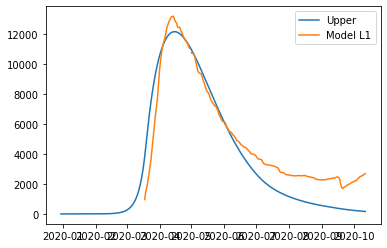

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07560908316499503, 'other': 0.1, 'school': 8.685435859274814e-05, 'transport': 0.2215450118873795, 'work': 0.2}
8769.644596856644
error_groups 3151.01860283114
error_total 1123.725198805101
alpha: 0.4892760231133127 beta: 0.4892760231133127
[7.88372722e+01 4.89276023e-01 2.00000000e-01 7.56090380e-02
 1.00000000e-01 2.21545008e-01 8.68481941e-05]


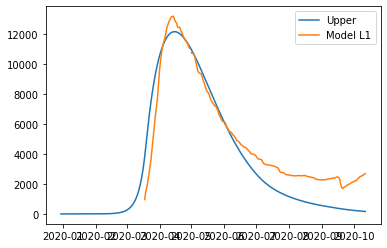

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07560903804026181, 'other': 0.1, 'school': 8.684819410855988e-05, 'transport': 0.2215450075142137, 'work': 0.2}
8769.644584755473
error_groups 3151.0186507704716
error_total 1123.7251867970003
alpha: 0.4892760331133127 beta: 0.4892760331133127
[7.88372722e+01 4.89276033e-01 2.00000000e-01 7.56090380e-02
 1.00000000e-01 2.21545008e-01 8.68481941e-05]


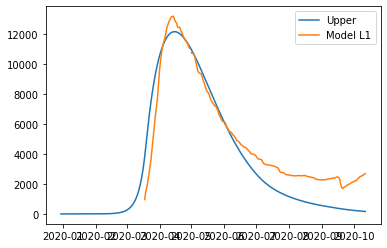

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07560903804026181, 'other': 0.1, 'school': 8.684819410855988e-05, 'transport': 0.2215450075142137, 'work': 0.2}
8769.644581747789
error_groups 3151.0186300304663
error_total 1123.7251903434644
alpha: 0.489276022818271 beta: 0.489276022818271
[7.88372722e+01 4.89276023e-01 2.00000000e-01 7.56090283e-02
 1.00000000e-01 2.21545007e-01 8.68468666e-05]


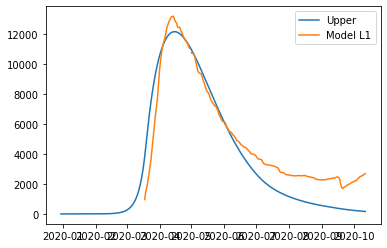

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0756090283229732, 'other': 0.1, 'school': 8.684686663097262e-05, 'transport': 0.2215450065724837, 'work': 0.2}
8769.644579766918
error_groups 3151.0186163710323
error_total 1123.7251926791773
alpha: 0.48927601603792353 beta: 0.48927601603792353
[7.88372722e+01 4.89276016e-01 2.00000000e-01 7.56090219e-02
 1.00000000e-01 2.21545006e-01 8.68459923e-05]


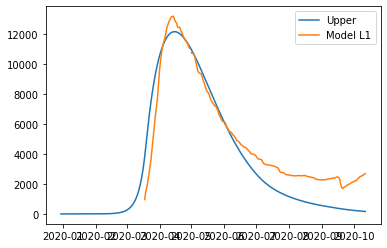

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.0756090219231358, 'other': 0.1, 'school': 8.684599234998411e-05, 'transport': 0.22154500595225732, 'work': 0.2}
8769.644569217771
error_groups 3151.0185436276183
error_total 1123.7252051180305
alpha: 0.4892759799291373 beta: 0.4892759799291373
[7.88372722e+01 4.89275980e-01 2.00000000e-01 7.56089878e-02
 1.00000000e-01 2.21545003e-01 8.68413364e-05]


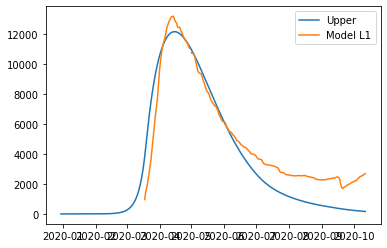

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07560898784075847, 'other': 0.1, 'school': 8.684133636065868e-05, 'transport': 0.22154500264923752, 'work': 0.2}
8769.644567964304
error_groups 3151.018534939865
error_total 1123.7252066048877
alpha: 0.4892759756172381 beta: 0.4892759756172381
[7.88372722e+01 4.89275976e-01 2.00000000e-01 7.56089838e-02
 1.00000000e-01 2.21545002e-01 8.68407833e-05]


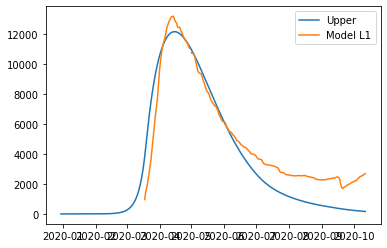

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.07560898377085255, 'other': 0.1, 'school': 8.68407832690664e-05, 'transport': 0.2215450022548129, 'work': 0.2}


In [75]:
from scipy.optimize import minimize, Bounds, shgo, differential_evolution, dual_annealing
epsilon = 0.1
result = differential_evolution(error, [(50,140),windows['alpha_mixing']]+
                                        [windows['work_l'],
                                         windows['leisure_l'],
                                         windows['other_l'],
                                         windows['transport_l'],
                                         windows['school_l']], workers=-1
                               )



In [25]:
best_v = [7.85447048e+01, 6.44205959e-01, 2.17293488e-01, 6.63368073e-02,
 1.00000010e-01, 2.78093696e-01, 0.00000000e+00]
best_v = [7.85447048e+01, 0.3, 2.17293488e-01, 6.63368073e-02,
 1.00000010e-01, 2.78093696e-01, 0.00000000e+00]

In [26]:
import copy
import math

validation_date = datetime.strptime("2020-10-12", '%Y-%m-%d')


days_ahead = best_v[0]
alpha_mixing = best_v[1]
beta_mixing = 1-alpha_mixing
gamma_mixing_before = 1.0
gamma_mixing_after = 1.0
gamma_change = 0

upper_bound_home = 1.0
upper_bound_leisure = 1.0
upper_bound_other = 1.0
upper_bound_school = 1.0
upper_bound_work = 1.0
upper_bound_transport = 1.0

work_l = best_v[2]
leisure_l = best_v[3]
other_l = best_v[4]
transport_l = best_v[5]
school_l = best_v[6]

In [27]:
best_error = float('inf')
def error(v):
    
    
    #days_ahead = v[0]
    #alpha_mixing = v[1]
    #beta_mixing = v[2]
    #gamma_mixing_before = 1.0
    #gamma_mixing_after = 1.0
    #gamma_change = 0

    #upper_bound_home = 1.0
    #upper_bound_leisure = 1.0
    #upper_bound_other = 1.0
    #upper_bound_school = 1.0
    #upper_bound_work = 1.0
    #upper_bound_transport = 1.0
    
    #work_l = v[3]
    #leisure_l = v[4]
    #other_l = v[5]
    #transport_l = v[6]
    #school_l = v[7]
    
    
    
    leisure_v = v[0:4]
    leisure_1 = leisure_v[0]
    leisure_2 = leisure_v[1]
    leisure_3 = leisure_v[2]
    leisure_4 = leisure_v[3]
    leisure_denom = leisure_1+leisure_2+leisure_3+leisure_4

    other_v = v[4:8]
    other_1 = other_v[0]
    other_2 = other_v[1]
    other_3 = other_v[2]
    other_4 = other_v[3]
    other_denom = other_1+other_2+other_3+other_4
    
    work_v = v[8:12]
    work_1 = work_v[0]
    work_2 = work_v[1]
    work_3 = work_v[2]
    work_4 = work_v[3]
    work_denom = work_2+work_3+work_4
    
    transport_v = v[12:16]
    transport_1 = transport_v[0]
    transport_2 = transport_v[1]
    transport_3 = transport_v[2]
    transport_4 = transport_v[3]
    transport_denom = transport_1+transport_2+transport_3+transport_4
    
    school_v = v[16:20]
    school_1 = school_v[0]
    school_2 = school_v[1]
    school_3 = school_v[2]
    school_4 = school_v[3]
    school_denom = school_1+school_2+school_3

    # Number of days
    days_before_date_1 = int(days_ahead)
    days_between_dates_1_2 = (date_2-date_1).days
    days_between_dates_2_3 = (date_3-date_2).days
    days_between_dates_3_4 = (date_4-date_3).days
    days_between_dates_4_5 = (date_5-date_4).days
    days_after_date_5 = (final_date-date_5).days
    total_days = days_before_date_1 + days_between_dates_1_2 + days_between_dates_2_3 + days_between_dates_3_4 + days_between_dates_4_5+ days_after_date_5
    days_denom = days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5
    
    
    # Some additional calculations
    validation_days = days_before_date_1 + (validation_date-date_1).days
    vacation_start_days = days_before_date_1 + (vacation_start-date_1).days
    vacation_end_days = days_before_date_1 + (vacation_end-date_1).days
    
    
    # Construct initialization
    initialization = copy.deepcopy(original_initialization)
    for i,group in enumerate(age_groups):
        if group == "age_group_40_49":
            initialization[group]["I"] = initialization[group]["I"] + 1
            initialization[group]["S"] = initialization[group]["S"] - 1
        initialization[group]["N"] = initialization[group]["S"] + initialization[group]["E"] + initialization[group]["I"] + initialization[group]["R"]


    # Alphas
    a_before_date_1 = {
        'home':upper_bound_home,
        'leisure':upper_bound_leisure,
        'other':upper_bound_other,
        'school':upper_bound_school,
        'transport':upper_bound_transport,
        'work':upper_bound_work
    }
    
    a_between_date_1_2 = {
        'home':upper_bound_home,
        'leisure':leisure_l,
        'other':other_l,
        'school':school_l,
        'transport':transport_l,
        'work':work_l
    }
    
    
    a_between_date_2_3 = {
        'home':upper_bound_home,
        'leisure':leisure_1/leisure_denom*(1-leisure_l)+leisure_l,
        'other':other_1/other_denom*(1-other_l)+other_l,
        'school':school_1/school_denom*(1-school_l)+school_l,
        'transport':transport_1/transport_denom*(1-transport_l)+transport_l,
        'work':work_1*(0.5-work_l)+work_l
    }
    
    a_between_date_3_4 = {
        'home':upper_bound_home,
        'leisure':(leisure_1+leisure_2)/leisure_denom*(1-leisure_l)+leisure_l,
        'other':(other_1+other_2)/other_denom*(1-other_l)+other_l,
        'school':(school_1+school_2)/school_denom*(1-school_l)+school_l,
        'transport':(transport_1+transport_2)/transport_denom*(1-transport_l)+transport_l,
        'work':work_1*(0.5-work_l)+work_l
    }
    
    a_between_date_4_5 = {
        'home':upper_bound_home,
        'leisure':(leisure_1+leisure_2)/leisure_denom*(1-leisure_l)+leisure_l,
        'other':(other_1+other_2)/other_denom*(1-other_l)+other_l,
        'school':(school_1+school_2)/school_denom*(1-school_l)+school_l,
        'transport':(transport_1+transport_2)/transport_denom*(1-transport_l)+transport_l,
        'work':work_1*(0.5-work_l)+work_l
    }
    
    a_after_date_5 = {
        'home':upper_bound_home,
        'leisure':(leisure_1+leisure_2+leisure_3)/leisure_denom*(1-leisure_l)+leisure_l,
        'other':(other_1+other_2+other_3)/other_denom*(1-other_l)+other_l,
        'school':school_3*(1-0.5)+0.5,
        'transport':(transport_1+transport_2+transport_3)/transport_denom*(1-transport_l)+transport_l,
        'work':(work_2+work_3)/work_denom*(1-0.5)+0.5
    }
    

    


    # Determine mixing method
    mixing_method_before = {
        "name":"mult",
        "param_alpha":alpha_mixing,
        "param_beta":beta_mixing,
    }

    # Determine mixing method
    mixing_method_after = {
        "name":"mult",
        "param_alpha":alpha_mixing,
        "param_beta":beta_mixing,
    }
    #dynModel.mixing_method = mixing_method_after




    # Calculate alphas
    alphas_vec = []
    for t in range(days_before_date_1):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_before_date_1
        alphas_vec.append(alphas)
    for t in range(days_between_dates_1_2):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_1_2
        alphas_vec.append(alphas)
    for t in range(days_between_dates_2_3):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_2_3
        alphas_vec.append(alphas)
    for t in range(days_between_dates_3_4):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_3_4
        alphas_vec.append(alphas)
    for t in range(days_between_dates_4_5):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_between_date_4_5
        alphas_vec.append(alphas)
    for t in range(days_after_date_5):
        alphas = {}
        for age_group in age_groups:
            alphas[age_group] = a_after_date_5
        alphas_vec.append(alphas)

    mixing_vec = []
    for t in range(int(gamma_change)):
        mixing_vec.append(mixing_method_before)
    for t in range(int(gamma_change),total_days):
        mixing_vec.append(mixing_method_after)
        
        
        
        
    # Calculate tests
    tests = np.zeros(len(age_groups))


    # Run model
    model_data_beds = {ag:[] for ag in age_groups+["total"]}
    model_data_icus = {ag:[] for ag in age_groups+["total"]}
    model_data_deaths = {ag:[] for ag in age_groups+["total"]}

    state = state_to_matrix(initialization)
    t_beds = 0
    t_icus = 0
    t_deaths = 0
    for i,ag in enumerate(age_groups):
        state_H = state[i,cont.index("H")]
        state_ICU = state[i,cont.index("ICU")]
        state_D = state[i,cont.index("D")]
        model_data_beds[ag].append(state_H)
        model_data_icus[ag].append(state_ICU)
        model_data_deaths[ag].append(state_D)
        t_beds+= state_H
        t_icus+= state_ICU
        t_deaths+= state_D
    model_data_beds["total"].append(t_beds)
    model_data_icus["total"].append(t_icus)
    model_data_deaths["total"].append(t_deaths)

    recalc_days = [0,
                 days_before_date_1,
                 days_before_date_1+days_between_dates_1_2,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4,
                 days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5,
                int(gamma_change)
                ]

    dynModel.beta = np.zeros((len(age_groups),len(dynModel.groups[age_groups[0]].parameters["beta"])))
    for i in range(len(age_groups)):
        for j in range(len(dynModel.groups[age_groups[0]].parameters["beta"])):
            if j < int(vacation_start_days) or j>= int(vacation_end_days):
                dynModel.beta[i,j] = original_beta
            else:
                dynModel.beta[i,j] = original_beta_vacation
    
    for t in range(total_days):
        if t in recalc_days:
            update_contacts = True
        else:
            update_contacts = False
            
        if t>=vacation_start_days and t<vacation_end_days:
            season = "vacation"
        else:
            season = "normal"

        dynModel.mixing_method = mixing_vec[t]
        state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]), t, season, update_contacts=update_contacts)
        t_beds = 0
        t_icus = 0
        t_deaths = 0
        for i,ag in enumerate(age_groups):
            state_H = state[i,cont.index("H")]
            state_ICU = state[i,cont.index("ICU")]
            state_D = state[i,cont.index("D")]
            model_data_beds[ag].append(state_H)
            model_data_icus[ag].append(state_ICU)
            model_data_deaths[ag].append(state_D)
            t_beds+= state_H
            t_icus+= state_ICU
            t_deaths+= state_D
        #print(t_beds)
        model_data_beds["total"].append(t_beds)
        model_data_icus["total"].append(t_icus)
        model_data_deaths["total"].append(t_deaths)


    initial_date = date_1-timedelta(days=days_before_date_1)

    # Calculate the days of the model
    days_model = [initial_date+timedelta(days = t) for t in range(total_days + 1)]

    # Indices where to put the real data
    indices = [(datetime.strptime(d, '%Y-%m-%d') - initial_date).days for d in days]

    # Real data
    real_data_beds = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
    real_data_icus = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
    real_data_deaths = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}

    for k,ind in enumerate(indices):
        for ag in age_groups+["total"]:
            real_data_beds[ag][ind] = beds_real[ag][k]
            real_data_icus[ag][ind] = icus_real[ag][k]
            real_data_deaths[ag][ind] = deaths_real[ag][k]


    error_beds = 0
    error_icus = 0
    error_deaths = 0
    for ag in age_groups:
        error_beds += np.nanmean((np.abs(np.array(model_data_beds[ag])-np.array(real_data_beds[ag])))[0:validation_days])
        #error_icus += np.nanmean(np.abs(np.array(model_data_icus[ag])-np.array(real_data_icus[ag])))
        #error_deaths += np.nanmean(np.abs(np.array(model_data_deaths[ag])-np.array(real_data_deaths[ag])))
    error_beds_total = np.nanmean((np.abs(np.array(model_data_beds["total"])-np.array(real_data_beds["total"])))[0:validation_days])
    #error_icus_total = np.nanmean(np.abs(np.array(model_data_icus["total"])-np.array(real_data_icus["total"])))
    #error_deaths_total = np.nanmean(np.abs(np.array(model_data_deaths["total"])-np.array(real_data_deaths["total"])))

    
    #diff = np.array(model_data_beds["total"])-np.array(real_data_beds["total"])
    #error_beds_above = np.nanmean([max(d,0) for d in diff])
    #error_beds_below = -np.nanmean([min(d,0) for d in diff])

    #cumm_beds_model = [sum([model_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(model_data_beds["total"]))]
    #cumm_beds_real = [sum([real_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(real_data_beds["total"]))]
    #diff_cumm = np.array(cumm_beds_model)-np.array(cumm_beds_real)
    #error_cumm_above = np.nanmean([max(d,0) for d in diff_cumm])
    #error_cumm_below = -np.nanmean([min(d,0) for d in diff_cumm])



    #     error = error_beds_total
    #     error = mult_icus*error_icus_total
    #     error = mult_deaths*error_deaths_total
    upper_model_data = model_data_beds["total"]
    upper_days_model = days_model
    upper_real_data = real_data_beds["total"]
    error = error_beds+5*error_beds_total




    
    
    global best_error
    global best_v
    if error<best_error:
        best_error = error
        print(best_error)
        print("error_groups",error_beds)
        print("error_total",error_beds_total)
        best_v = v
        print(v)
        plt.figure(1)
        plt.plot(upper_days_model, upper_model_data, label="Upper")
        plt.plot(upper_days_model, upper_real_data, label="Model L1")
        plt.legend(loc='upper right')
        plt.show()
        print("Before March 17",a_before_date_1)
        print("March17-May11",a_between_date_1_2)
        print("May12-May30", a_between_date_2_3)
        print("June1-June30",a_between_date_3_4)
        print("July1-Aug31",a_between_date_4_5)
        print("Sept1-Oct12",a_after_date_5)
        print("alpha1",alpha_mixing,"alpha2",beta_mixing)
        


    return error





48396.64995934726
47253.33004273266
46709.37513721012
35836.58627377348
42288.462344879
error_groups 8326.411617670696
44618.49803490453
47775.21102000406
error_total 7676.592703907884
error_groups 8606.875942861125
error_groups 8418.917446284831
error_groups 6525.269979616212
40428.06377203061
error_groups 7606.741304068348
41250.44291889339
[0.00497751 0.97949313 0.20568929 0.27947919 0.70557859 0.19162573
 0.11955053 0.10732458 0.13863337 0.36764623 0.25962296 0.89750792
 0.07832054 0.01174436 0.01212428 0.14103745 0.60261361 0.03564889
 0.1251953  0.38495064]error_groups 7987.448980030087
error_groups 8509.689846135694
50927.0663702094
40463.112757046765
46171.39600955613
error_total 7957.954803297228

error_total 7766.8825192895665
36917.990771122604
38308.77534696808
error_total 5862.263258831454
error_groups 7282.249336156008
error_groups 7419.715307223436
54252.85587136225
error_groups 6702.815336755746
error_total 6936.344208162131
error_total 7326.209810974888
error_groups 82

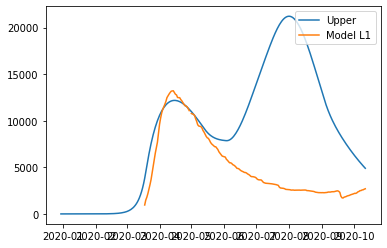

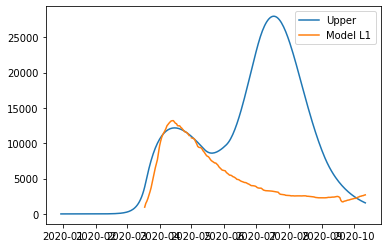

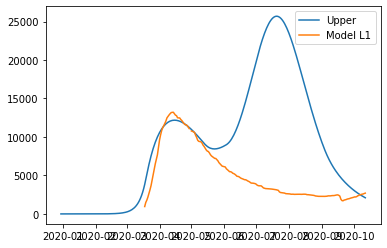

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}


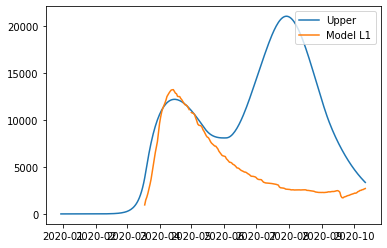

May12-May30 {'home': 1.0, 'leisure': 0.2878336137290877, 'other': 0.4565108397445756, 'school': 0.3947324198789246, 'transport': 0.5565032973759414, 'work': 0.4124878613823201}
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
June1-June30 {'home': 1.0, 'leisure': 0.5186378175189429, 'other': 0.8185080345089559, 'school': 0.5945753849010708, 'transport': 0.7236423676797636, 'work': 0.4124878613823201}


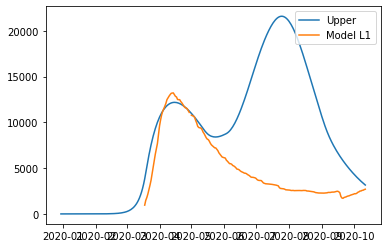

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}


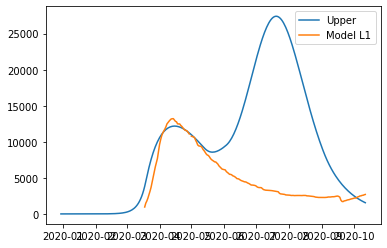

July1-Aug31 {'home': 1.0, 'leisure': 0.5186378175189429, 'other': 0.8185080345089559, 'school': 0.5945753849010708, 'transport': 0.7236423676797636, 'work': 0.4124878613823201}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}


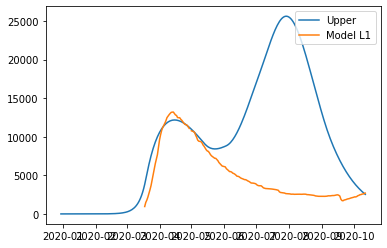

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7228057055830861, 'other': 0.851478747626655, 'school': 0.8368554844312752, 'transport': 0.9645996366555021, 'work': 0.7864317297022122}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
alpha1 0.3 alpha2 0.7
May12-May30 {'home': 1.0, 'leisure': 0.25504532233714483, 'other': 0.3306996947649612, 'school': 0.3753500452976783, 'transport': 0.3699818469956272, 'work': 0.43154286159124633}
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
Before March 17 {'home': 1.0, 'le

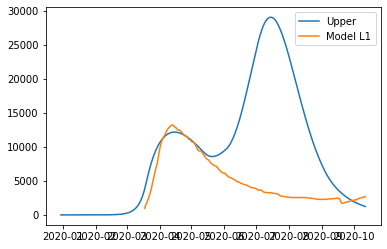

July1-Aug31 {'home': 1.0, 'leisure': 0.6139206168505055, 'other': 0.5379109819043341, 'school': 0.5678427037839671, 'transport': 0.44193597586551736, 'work': 0.4647966719434132}
alpha1 0.3 alpha2 0.7
July1-Aug31 {'home': 1.0, 'leisure': 0.6284026319281448, 'other': 0.6261313520037171, 'school': 0.8981308448463746, 'transport': 0.7304214021514454, 'work': 0.3726649239225185}
alpha1 0.3 alpha2 0.7
alpha1 0.3 alpha2 0.7
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7857940184301312, 'other': 0.7767421832447184, 'school': 0.9152792591760075, 'transport': 0.648289702519458, 'work': 0.7793351064468275}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7595043710692027, 'other': 0.7097098018946129, 'school': 0.5961225232431892, 'transport': 0.8448872617538186, 'work': 0.9425645259581819}
alpha1 0.3 alpha2 0.7


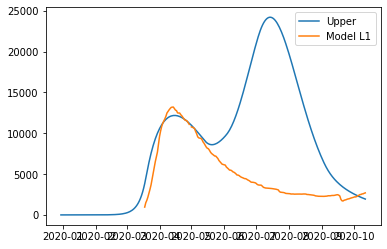

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
alpha1 0.3 alpha2 0.7


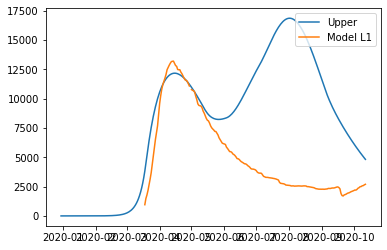

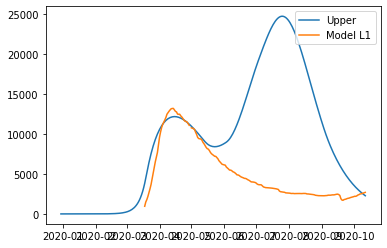

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}


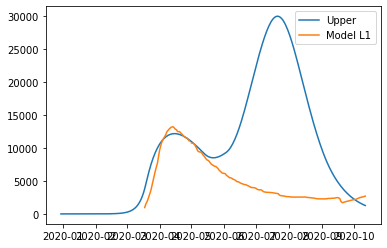

March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
May12-May30 {'home': 1.0, 'leisure': 0.06949902183339127, 'other': 0.6649251471210949, 'school': 0.7893214401323365, 'transport': 0.5105521612037615, 'work': 0.25648604563957167}
May12-May30 {'home': 1.0, 'leisure': 0.3127892689638801, 'other': 0.5517129705168128, 'school': 0.5928983312831722, 'transport': 0.27927484885212217, 'work': 0.27740400091385997}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073,

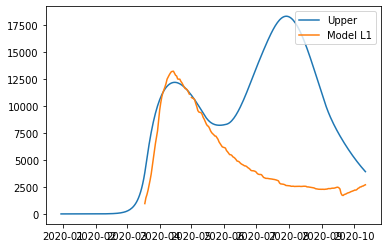

July1-Aug31 {'home': 1.0, 'leisure': 0.506612380280321, 'other': 0.738691304389303, 'school': 0.9748940864281657, 'transport': 0.4737651650989019, 'work': 0.27740400091385997}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.8224465947180157, 'other': 0.914070023656034, 'school': 0.5625976491209581, 'transport': 0.5813952575118994, 'work': 0.7056920916511638}
June1-June30 {'home': 1.0, 'leisure': 0.6855035191182135, 'other': 0.29931954850729503, 'school': 0.31456074465743944, 'transport': 0.7658883913854329, 'work': 0.30691447292254437}
July1-Aug31 {'home': 1.0, 'leisure': 0.6275687348616937, 'other': 0.5253041318193574, 'school': 0.521019426424404, 'transport': 0.6036253006588368, 'work': 0.43091530334917216}
June1-June30 {'home': 1.0, 'leisure': 0.6398616922897018, 'other': 0.626004523697591, 'school': 0.9320985912243507, 'transport': 0.6032961714589242, 'work': 0.4472269339501311}
July1-Aug31 {'home': 1.0, 'leisure': 0.6855035191182135, 'other': 0.29931954850729503, 'school': 0.31456074465743

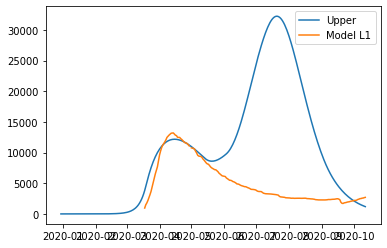

March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}


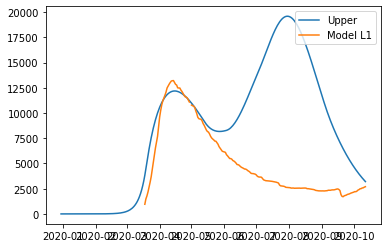

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
alpha1 0.3 alpha2 0.7
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
May12-May30 {'home': 1.0, 'leisure': 0.12278141857293369, 'other': 0.35348355864758263, 'school': 0.4790969225375223, 'transport': 0.3735274199286941, 'work': 0.4001066591554179}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
June1-June30 {'home': 1.0, 'leisure': 0.3928925730094762, 'other': 0.4677164208052418, 'school': 0.6779868956448483, 'transport': 0.9761400620023085, 'work': 0.4001066591554179}
May12-May30 {'home': 1.0, 'leisure': 0.36805325696317803, 'other': 0.35283326808633686, 'school': 0.40741496293152407, 'transport': 0.452

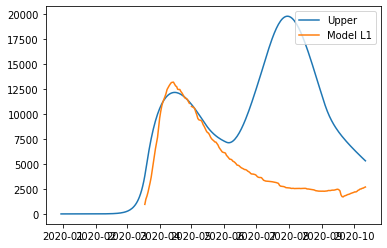

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.22202490722781248, 'other': 0.12471456415238884, 'school': 0.5054907420362862, 'transport': 0.5922793600817673, 'work': 0.2729085753468736}
June1-June30 {'home': 1.0, 'leisure': 0.6768393342245217, 'other': 0.4191678536737743, 'school': 0.7559231187860631, 'transport': 0.8369313691244032, 'work': 0.2729085753468736}
July1-Aug31 {'home': 1.0, 'leisure': 0.6768393342245217, 'other': 0.4191678536737743, 'school': 0.7559231187860631, 'transport': 0.8369313691244032, 'work': 0.2729085753468736}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.929404904856453, 'other': 0.8602971861904376, 'school': 0.6188124860415395, 'transport': 0.8999935934601881, 'work': 0.83494145022078}
alpha1 0.3 alpha2 0.7
46362.1610695492
34060.06307

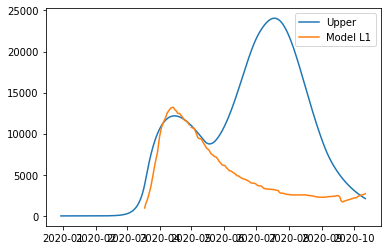

error_groups 4366.182103425848
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
error_total 3691.891137543349
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.52580850352634, 'other': 0.5321999832508061, 'school': 0.15196531411471068, 'transport': 0.44297271929725557, 'work': 0.4596303371044782}
[0.41960092 0.16982317 0.33688322 0.79949061 0.60418757 0.8543509
 0.70520106 0.86519057 0.10003016 0.70117172 0.51645286 0.6961407
 0.42378831 0.58962832 0.79648636 0.51179184 0.19361992 0.05398601
 0.73876266 0.94186022]
June1-June30 {'home': 1.0, 'leisure': 0.5375203198859266, 'other': 0.5474105007921802, 'school': 0.47964261266390984, 'transport': 0.6481750548436542, 'work': 0.4596303371044782}


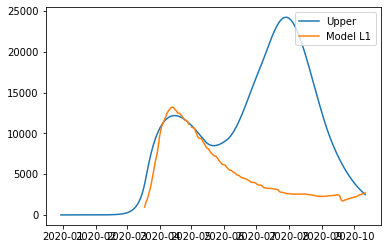

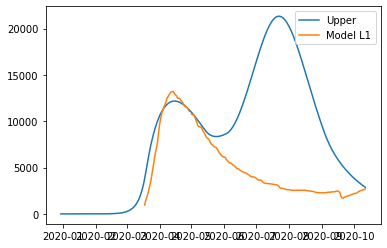

July1-Aug31 {'home': 1.0, 'leisure': 0.5375203198859266, 'other': 0.5474105007921802, 'school': 0.47964261266390984, 'transport': 0.6481750548436542, 'work': 0.4596303371044782}
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6080692441471859, 'other': 0.9527387252007858, 'school': 0.9793763785076905, 'transport': 0.9470153812398656, 'work': 0.885906690467289}
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
alpha1 0.3 alpha2 0.7
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.42981703011742767, 'other': 0.31953011521863195, 'school': 0.3514262651570469, 'transport': 0.3935882

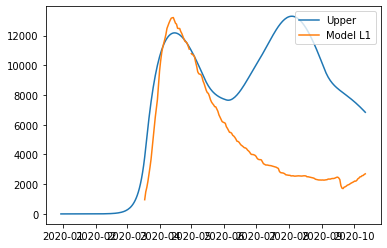

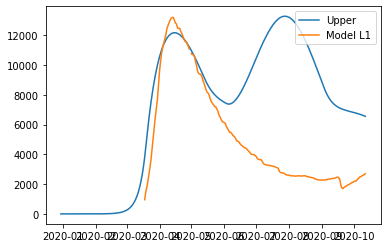

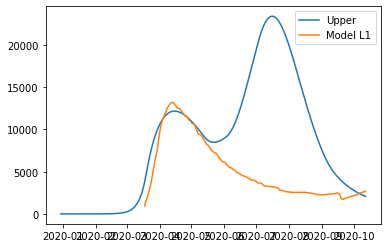

Sept1-Oct12 {'home': 1.0, 'leisure': 0.7673293934691251, 'other': 0.6746229837859438, 'school': 0.7166041059404661, 'transport': 0.8946380260852416, 'work': 0.9014005297215355}


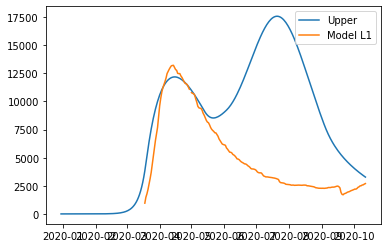

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
alpha1 0.3 alpha2 0.7
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6560695420337761, 'other': 0.6955270057267362, 'school': 0.8131409247043859, 'transport': 0.9313731309979697, 'work': 0.8692190741914687}
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.16623443795461584, 'other': 0.2703478529763256, 'school': 0.385347

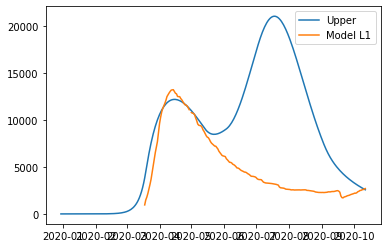

June1-June30 {'home': 1.0, 'leisure': 0.4012892340769353, 'other': 0.39004211897510754, 'school': 0.5381265192982614, 'transport': 0.6024823313920691, 'work': 0.34777296461122276}
May12-May30 {'home': 1.0, 'leisure': 0.24773200714956672, 'other': 0.1842176697084722, 'school': 0.3417496143637651, 'transport': 0.47878351438786365, 'work': 0.2939133690285954}
June1-June30 {'home': 1.0, 'leisure': 0.6247031110156268, 'other': 0.7417233518383953, 'school': 0.8256919779723213, 'transport': 0.3657675417872284, 'work': 0.22183641420293068}
July1-Aug31 {'home': 1.0, 'leisure': 0.4012892340769353, 'other': 0.39004211897510754, 'school': 0.5381265192982614, 'transport': 0.6024823313920691, 'work': 0.34777296461122276}
June1-June30 {'home': 1.0, 'leisure': 0.6137759361534488, 'other': 0.49527969295129415, 'school': 0.6158093951181441, 'transport': 0.545290965015969, 'work': 0.23871421858254915}
July1-Aug31 {'home': 1.0, 'leisure': 0.6247031110156268, 'other': 0.7417233518383953, 'school': 0.825691

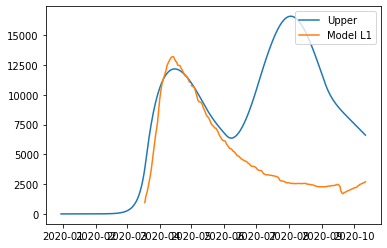

alpha1 0.3 alpha2 0.7
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5438662278626322, 'other': 0.7170153153147171, 'school': 0.80251603569991, 'transport': 0.7830335969163748, 'work': 0.8705551897827677}
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7878933469095062, 'other': 0.896268115864653, 'school': 0.6339364866196253, 'transport': 0.7282152037418221, 'work': 0.7032758446538877}
July1-Aug31 {'home': 1.0, 'leisure': 0.3868143278324643, 'other': 0.48458696811008095, 'school': 0.6889383423083324, 'transport': 0.6240889571877835, 'work': 0.2939133690285954}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.8117045237302566, 'other': 0.5604135346463615, 'school': 0.7481688810960969, 'transport': 0.799639840964232, 'work': 0.7792987774003276}
alpha1 0.3 alpha2 0.7
alpha1 0.3 alpha2 0.7
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 

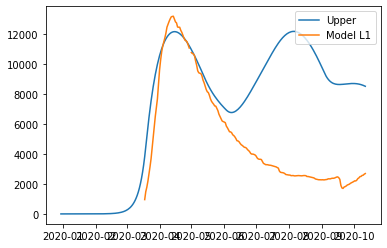

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}


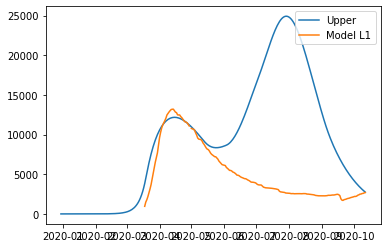

March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.11719675115846076, 'other': 0.15233316733786606, 'school': 0.393191166986421, 'transport': 0.39235865790860813, 'work': 0.33420369553314405}
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
June1-June30 {'home': 1.0, 'leisure': 0.34672728349279913, 'other': 0.43088120851522893, 'school': 0.6034886269450146, 'transport': 0.660692345537383, 'work': 0.33420369553314405}
July1-Aug31 {'home': 1.0, 'leisure': 0.34672728349279913, 'other': 0.43088120851522893, 'school': 0.6034886269450146, 'transport': 0.660692345537383, 'work': 0.33420369553314405}
May12-May30 {'home': 1.0, 'leisure': 0.10775011733754696, 'other': 0.33188747826042

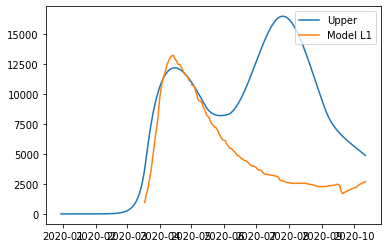

alpha1 0.3 alpha2 0.7
July1-Aug31 {'home': 1.0, 'leisure': 0.5424785173808436, 'other': 0.45225529550097254, 'school': 0.7754895904147292, 'transport': 0.6373519530788354, 'work': 0.4822135683805674}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.9550034224152145, 'other': 0.6428574300820463, 'school': 0.6521987556845594, 'transport': 0.8195172780966498, 'work': 0.9548713057346555}
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
alpha1 0.3 alpha2 0.7
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.20938364909178084, 'other': 0.3963996412976083, 'school': 0.27179986848944243, 'transport': 0.501781733599402, 'work': 0.27221691314194857}
June1-June30 {'home': 1.0, 'leisure': 0.534933327575057, 'other': 0.4738347577721701, 'school': 0.7538128353406881, 'transport': 0.5505020616998604, 'work': 0.27221691314194857}
Ju

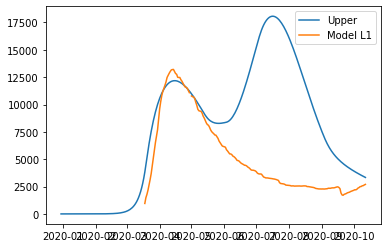

error_total 5713.301050342269
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
[0.56084906 0.14544223 0.99731421 0.31878877 0.45102423 0.99157394
 0.21394917 0.75630593 0.43793766 0.95684218 0.09397403 0.61298403
 0.23857334 0.52819144 0.52365047 0.61203132 0.55794746 0.14383803
 0.5089108  0.08313659]March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.13815688978017482, 'other': 0.5010260161829987, 'school': 0.30870099042209254, 'transport': 0.4691928957252368, 'work': 0.23625469326688264}

June1-June30 {'home': 1.0, 'leisure': 0.40494205503347125, 'other': 0.8263182415700477, 'school': 0.6501269772748239, 'transport': 0.5029104202732271, 'work': 0.23625469326688264}
July1-Aug31 {'home': 1.0, 'leisure': 0.40494205503347125, 'other': 0.8263182415700477, 'school': 0.6501269772748239, 'transport': 0.50291042027

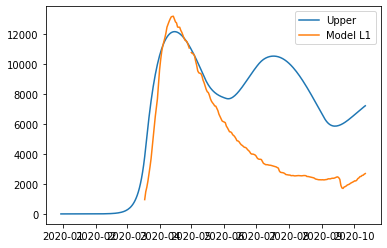

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.29334248927326867, 'other': 0.27952505419414375, 'school': 0.19629570578151234, 'transport': 0.4098661627191012, 'work': 0.24557266485289694}
June1-June30 {'home': 1.0, 'leisure': 0.3852174659590847, 'other': 0.533382283155383, 'school': 0.25102779159741495, 'transport': 0.593204813959346, 'work': 0.24557266485289694}
July1-Aug31 {'home': 1.0, 'leisure': 0.3852174659590847, 'other': 0.533382283155383, 'school': 0.25102779159741495, 'transport': 0.593204813959346, 'work': 0.24557266485289694}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5674725599166313, 'other': 0.7429219309352904, 'school': 0.8693813290138931, 'transport': 0.8408637733304302, 'work': 0.8181227584375078}
alpha1 0.3 alpha2 0.7
33072.57184299288
error

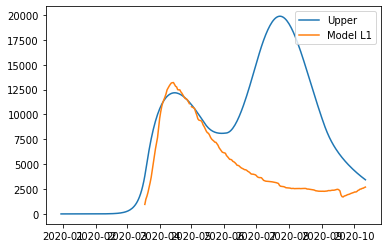

[0.0719559  0.10521311 0.41039571 0.1364691  0.60193507 0.04515249
 0.5789793  0.9732038  0.22576753 0.89655045 0.66659627 0.3203775
 0.3604434  0.37470189 0.71512585 0.09244963 0.42982573 0.82565175
 0.07393176 0.75817107]
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}


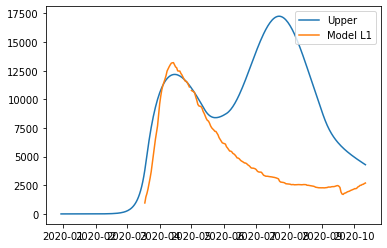

March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
May12-May30 {'home': 1.0, 'leisure': 0.20431111161450466, 'other': 0.3437185869489803, 'school': 0.48147461865027524, 'transport': 0.3233810803863468, 'work': 0.3050641240550967}
June1-June30 {'home': 1.0, 'leisure': 0.4866113138797902, 'other': 0.6134300887863195, 'school': 0.8110524136543239, 'transport': 0.7410293951495706, 'work': 0.3050641240550967}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
July1-Aug31 {'home': 1.0, 'leisure': 0.4866113138797902, 'other': 0.6134300887863195, 'school': 0.8110524136543239, 'transport': 0.7410293951495706, 'work': 0.3050641240550967}
May12-May30 {'home': 1.0, 'leisure': 0.34596447906283345, 'other': 0.4033753373927369, '

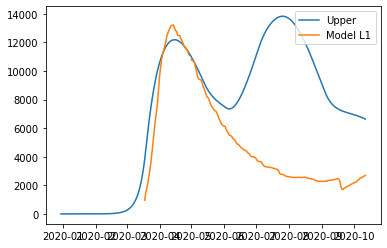

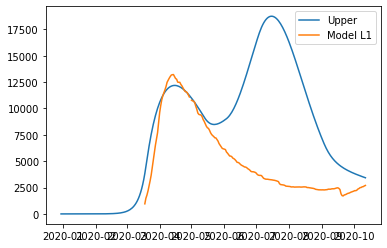

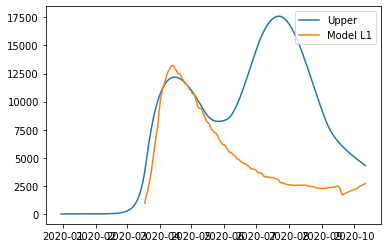

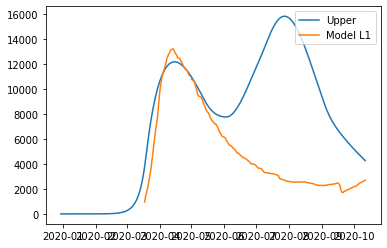

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
May12-May30 {'home': 1.0, 'leisure': 0.1784699672602554, 'other': 0.3166643696597812, 'school': 0.01596087191054946, 'transport': 0.3612795202225262, 'work': 0.27905745334459314}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.

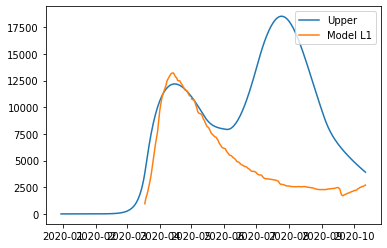

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.12868088518860937, 'other': 0.3771960562519251, 'school': 0.0954458433152009, 'transport': 0.6171108669230883, 'work': 0.3130630935850792}
June1-June30 {'home': 1.0, 'leisure': 0.37039469661905555, 'other': 0.6753874834110377, 'school': 0.9594479371338555, 'transport': 0.7761334435263345, 'work': 0.3130630935850792}
July1-Aug31 {'home': 1.0, 'leisure': 0.37039469661905555, 'other': 0.6753874834110377, 'school': 0.9594479371338555, 'transport': 0.7761334435263345, 'work': 0.3130630935850792}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.528462776108101, 'other': 0.8952495006695497, 'school': 0.5162604039699183, 'transport': 0.9738696659423535, 'work': 0.7996163114426735}
alpha1 0.3 alpha2 0.7
24978.92353075112
error_g

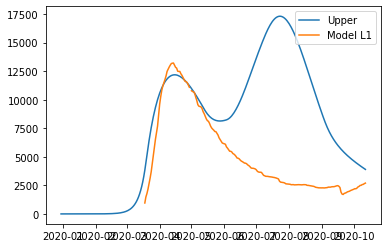

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.459841359572036, 'other': 0.21381223610215283, 'school': 0.46834325631334267, 'transport': 0.41230924328838575, 'work': 0.23140032817153358}


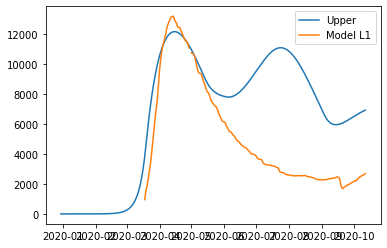

June1-June30 {'home': 1.0, 'leisure': 0.633409845484721, 'other': 0.39616857554983476, 'school': 0.8213912592674157, 'transport': 0.5582665082038167, 'work': 0.23140032817153358}
July1-Aug31 {'home': 1.0, 'leisure': 0.633409845484721, 'other': 0.39616857554983476, 'school': 0.8213912592674157, 'transport': 0.5582665082038167, 'work': 0.23140032817153358}
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.9925607267335844, 'other': 0.4972772410844397, 'school': 0.6553283043447934, 'transport': 0.7727113550902067, 'work': 0.8940793005574421}
alpha1 0.3 alpha2 0.7
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.15912608756137744, 'other': 0.3463278354412128, 'school': 0.323320854033234, 'transport': 0.4467608782712814, 'work': 0.2811194395714894}
June1-June30 {'home': 1.0

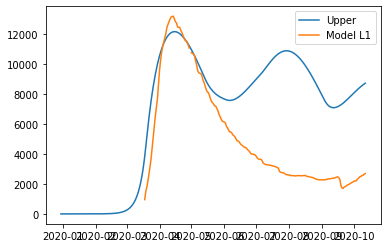

error_total 5220.35435010786
24291.01378809955
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
[0.08280528 0.7192628  0.97516614 0.66174525 0.36469968 0.47310362
 0.96369314 0.7200151  0.53703823 0.79526099 0.58222985 0.67293258
 0.29832121 0.87652647 0.41363126 0.01936339 0.7014967  0.34683552
 0.64401579 0.31595532]error_groups 4595.689880000959

March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.3264500253800042, 'other': 0.23064318199303838, 'school': 0.24622796013904766, 'transport': 0.45485749494153827, 'work': 0.2342291169621564}
error_total 3939.0647816197184
June1-June30 {'home': 1.0, 'leisure': 0.5380311475500918, 'other': 0.26078964020416073, 'school': 0.5623899097378905, 'transport': 0.5718179208979236, 'work': 0.2342291169621564}
[0.06151679 0.07055116 0.96331212 0.96602569 0.91535977 0.2556249

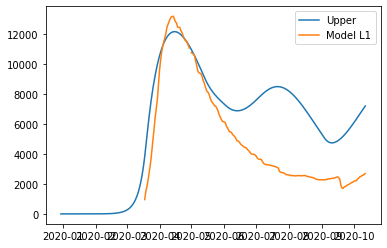

error_total 5509.246447282472
[0.37134482 0.59125546 0.40803693 0.34411616 0.52508372 0.48295705
 0.72046108 0.53065573 0.16525842 0.5906429  0.57471028 0.76122256
 0.06767628 0.12399812 0.00403482 0.35249361 0.35523496 0.71138679
 0.94935832 0.26965875]Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}

March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08671257817416358, 'other': 0.3625998427820821, 'school': 0.17005470256751506, 'transport': 0.32849394116532404, 'work': 0.22819879803728166}
June1-June30 {'home': 1.0, 'leisure': 0.2549337345504124, 'other': 0.38738076628491014, 'school': 0.9857433559315428, 'transport': 0.458464660878525, 'work': 0.22819879803728166}
July1-Aug31 {'home': 1.0, 'leisure': 0.2549337345504124, 'other': 0.38738076628491014, 'school': 0.9857433559315428, 'transport': 0.45846466087

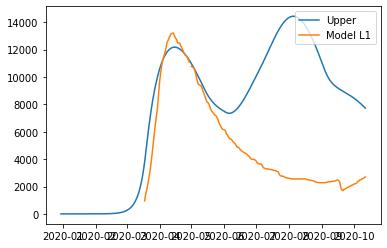

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}


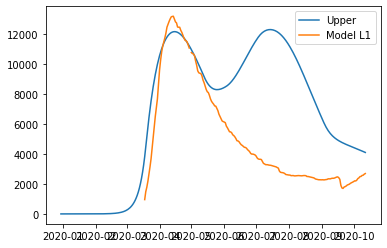

March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.0980354101734637, 'other': 0.2301718144826882, 'school': 0.4145108996322609, 'transport': 0.41203715483810144, 'work': 0.3691176914881202}
June1-June30 {'home': 1.0, 'leisure': 0.37337565353125923, 'other': 0.39903610308551074, 'school': 0.6194542793717527, 'transport': 0.8055894139815133, 'work': 0.3691176914881202}
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
July1-Aug31 {'home': 1.0, 'leisure': 0.37337565353125923, 'other': 0.39903610308551074, 'school': 0.6194542793717527, 'transport': 0.8055894139815133, 'work': 0.3691176914881202}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7466779888360985, 'other': 0.7430059008944814,

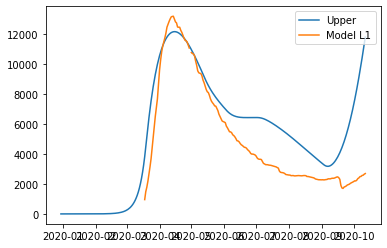

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.14436388744489306, 'other': 0.21943361780756204, 'school': 0.1142385975630723, 'transport': 0.6066091711537713, 'work': 0.23996841764031554}
June1-June30 {'home': 1.0, 'leisure': 0.1464217424834967, 'other': 0.44488305400640993, 'school': 0.3120462911003987, 'transport': 0.804520475602055, 'work': 0.23996841764031554}
July1-Aug31 {'home': 1.0, 'leisure': 0.1464217424834967, 'other': 0.44488305400640993, 'school': 0.3120462911003987, 'transport': 0.804520475602055, 'work': 0.23996841764031554}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6847875083912531, 'other': 0.9564273368042344, 'school': 0.8636240050114992, 'transport': 0.8887434975870501, 'work': 0.8659212126524776}
alpha1 0.3 alpha2 0.7
29527.79894860823
erro

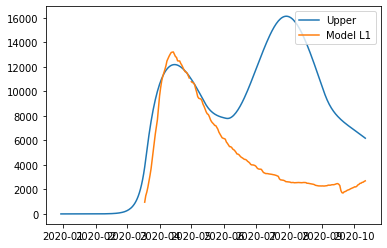

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.26852972662129254, 'other': 0.3091821164113824, 'school': 0.1762095574350363, 'transport': 0.36721387832483693, 'work': 0.2640131202641446}
June1-June30 {'home': 1.0, 'leisure': 0.5904614224486128, 'other': 0.5015818628159598, 'school': 0.5290834792492233, 'transport': 0.5305020292669107, 'work': 0.2640131202641446}
July1-Aug31 {'home': 1.0, 'leisure': 0.5904614224486128, 'other': 0.5015818628159598, 'school': 0.5290834792492233, 'transport': 0.5305020292669107, 'work': 0.2640131202641446}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.8126327678844965, 'other': 0.7885981243021611, 'school': 0.9746791597129782, 'transport': 0.5358153177830851, 'work': 0.8024415701688165}
alpha1 0.3 alpha2 0.7


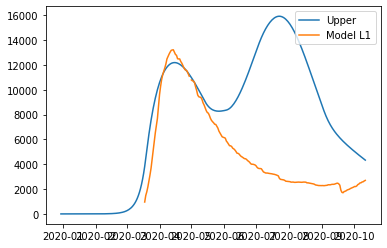

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.3426133995706925, 'other': 0.3477786507287789, 'school': 0.0718437761611043, 'transport': 0.36854962489102605, 'work': 0.3002026471323351}
June1-June30 {'home': 1.0, 'leisure': 0.38745701246506103, 'other': 0.6105675807408313, 'school': 0.6894793460492818, 'transport': 0.6077253840931554, 'work': 0.3002026471323351}
July1-Aug31 {'home': 1.0, 'leisure': 0.38745701246506103, 'other': 0.6105675807408313, 'school': 0.6894793460492818, 'transport': 0.6077253840931554, 'work': 0.3002026471323351}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6733423465542531, 'other': 0.6856426912304483, 'school': 0.6096598261416656, 'transport': 0.9239601955386326, 'work': 0.7985741452159152}
alpha1 0.3 alpha2 0.7
29752.26459208433
error_

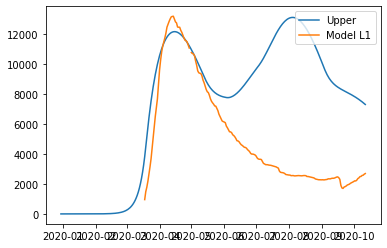

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.33554216266440295, 'other': 0.17286533931892728, 'school': 0.3079053825157107, 'transport': 0.3975233079692763, 'work': 0.3352636307675388}
June1-June30 {'home': 1.0, 'leisure': 0.4630596775566196, 'other': 0.2558337808905602, 'school': 0.6562688960964556, 'transport': 0.5465470351025814, 'work': 0.3352636307675388}
July1-Aug31 {'home': 1.0, 'leisure': 0.4630596775566196, 'other': 0.2558337808905602, 'school': 0.6562688960964556, 'transport': 0.5465470351025814, 'work': 0.3352636307675388}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7460299750154882, 'other': 0.5821695054690021, 'school': 0.9208764445869507, 'transport': 0.8379431290893251, 'work': 0.9059952559003047}
alpha1 0.3 alpha2 0.7


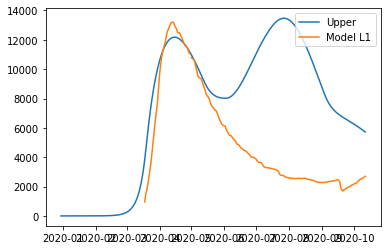

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.2904577664731314, 'other': 0.2665264737789179, 'school': 0.26039260905059597, 'transport': 0.3420792975454219, 'work': 0.33936695747087253}


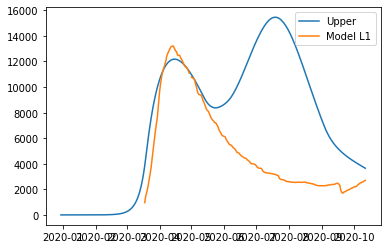

29621.367334789247
June1-June30 {'home': 1.0, 'leisure': 0.3133854955205845, 'other': 0.4927784015908986, 'school': 0.7816151422026206, 'transport': 0.37430964447865783, 'work': 0.33936695747087253}
error_groups 5474.7804550790825
July1-Aug31 {'home': 1.0, 'leisure': 0.3133854955205845, 'other': 0.4927784015908986, 'school': 0.7816151422026206, 'transport': 0.37430964447865783, 'work': 0.33936695747087253}
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6611172626378699, 'other': 0.7667558672469256, 'school': 0.6000913163751334, 'transport': 0.6893182799079032, 'work': 0.7744340675522475}
error_total 4829.317375942033
alpha1 0.3 alpha2 0.7
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.33657146827584594, 'other': 0.38988182940154126, 'school': 0.5439524389607664, '

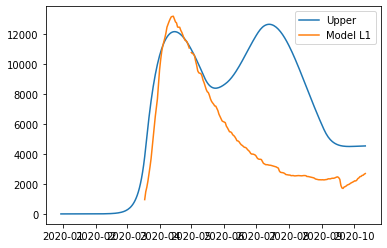

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.22000854549098994, 'other': 0.4712028512157017, 'school': 0.3738149701645221, 'transport': 0.45769943381885314, 'work': 0.2649250660073458}
June1-June30 {'home': 1.0, 'leisure': 0.27844529920814404, 'other': 0.5120060715345925, 'school': 0.7605088202962479, 'transport': 0.5679284182845101, 'work': 0.2649250660073458}
July1-Aug31 {'home': 1.0, 'leisure': 0.27844529920814404, 'other': 0.5120060715345925, 'school': 0.7605088202962479, 'transport': 0.5679284182845101, 'work': 0.2649250660073458}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5756089732585105, 'other': 0.8995097491382312, 'school': 0.7778366201367135, 'transport': 0.7779042476387567, 'work': 0.6179230922126492}
alpha1 0.3 alpha2 0.7
23522.65079703454
error

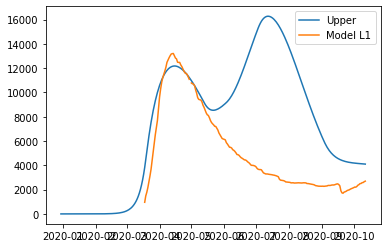

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.142923013244888, 'other': 0.6433274027041581, 'school': 0.2321158459829011, 'transport': 0.4160351965124427, 'work': 0.2486776038037501}
June1-June30 {'home': 1.0, 'leisure': 0.31767178530459506, 'other': 0.7534714496277759, 'school': 0.5643302562444144, 'transport': 0.6377968610529297, 'work': 0.2486776038037501}
July1-Aug31 {'home': 1.0, 'leisure': 0.31767178530459506, 'other': 0.7534714496277759, 'school': 0.5643302562444144, 'transport': 0.6377968610529297, 'work': 0.2486776038037501}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5465649362240366, 'other': 0.9330772235618394, 'school': 0.9981073664611192, 'transport': 0.7713187328248462, 'work': 0.7924986819225728}
alpha1 0.3 alpha2 0.7
28230.39038166702
error_gr

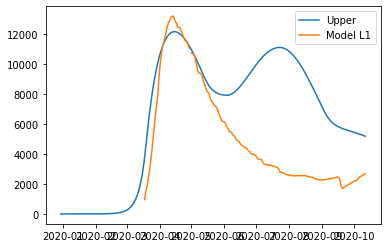

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.1919174702987338, 'other': 0.28092008315341177, 'school': 0.3298913192460522, 'transport': 0.6416292555790435, 'work': 0.32152008038284546}
June1-June30 {'home': 1.0, 'leisure': 0.23244432487994546, 'other': 0.4266610218672422, 'school': 0.7314305225726779, 'transport': 0.7557791778177271, 'work': 0.32152008038284546}
July1-Aug31 {'home': 1.0, 'leisure': 0.23244432487994546, 'other': 0.4266610218672422, 'school': 0.7314305225726779, 'transport': 0.7557791778177271, 'work': 0.32152008038284546}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5708943066779566, 'other': 0.48604576900262664, 'school': 0.7739971341562626, 'transport': 0.7791009326180911, 'work': 0.8764241485678086}
alpha1 0.3 alpha2 0.7
32124.57866712638
er

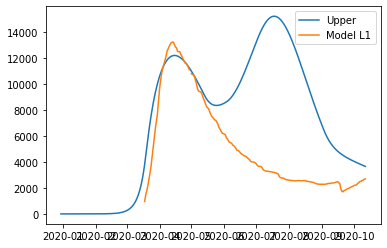

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.36190608552645476, 'other': 0.37564202653216383, 'school': 0.3637161862649928, 'transport': 0.4218705243219587, 'work': 0.22633616794533373}
June1-June30 {'home': 1.0, 'leisure': 0.4399512969364947, 'other': 0.4684687206608056, 'school': 0.9310321085776867, 'transport': 0.6562024870951781, 'work': 0.22633616794533373}
July1-Aug31 {'home': 1.0, 'leisure': 0.4399512969364947, 'other': 0.4684687206608056, 'school': 0.9310321085776867, 'transport': 0.6562024870951781, 'work': 0.22633616794533373}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6522162532864426, 'other': 0.7362180662573099, 'school': 0.5573989035409586, 'transport': 0.7908079599292599, 'work': 0.810246803862051}
alpha1 0.3 alpha2 0.7
24047.04309790892
error

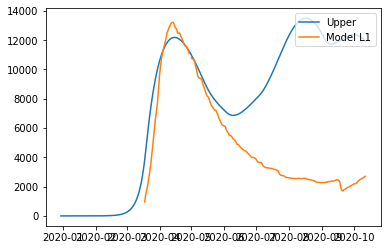

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.16597753395671436, 'other': 0.13712094993319035, 'school': 0.13869624716693899, 'transport': 0.3925367908765387, 'work': 0.39713149040992884}
June1-June30 {'home': 1.0, 'leisure': 0.4101069474390001, 'other': 0.31248671264443106, 'school': 0.4029871109952948, 'transport': 0.5165708135624714, 'work': 0.39713149040992884}
July1-Aug31 {'home': 1.0, 'leisure': 0.4101069474390001, 'other': 0.31248671264443106, 'school': 0.4029871109952948, 'transport': 0.5165708135624714, 'work': 0.39713149040992884}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.8201337405703619, 'other': 0.7492794574308029, 'school': 0.9443036155888188, 'transport': 0.7278532693612139, 'work': 0.9081871080306618}
alpha1 0.3 alpha2 0.7
23530.2758632542
er

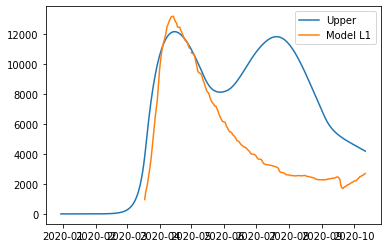

28053.124728705123
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
error_groups 5217.722604275428
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
error_total 4567.080424885939
May12-May30 {'home': 1.0, 'leisure': 0.10841772971473798, 'other': 0.37334637707461305, 'school': 0.7171828324327439, 'transport': 0.3764635378879779, 'work': 0.31534773760253726}
[0.50772433 0.17573286 0.76196975 0.04235965 0.60769062 0.06612348
 0.14616514 0.95606776 0.08653185 0.51989974 0.4570324  0.08918771
 0.96194194 0.01544999 0.43458805 0.11898338 0.14210356 0.23598056
 0.75957351 0.8771024 ]June1-June30 {'home': 1.0, 'leisure': 0.2692092042519808, 'other': 0.3764330386658542, 'school': 0.8143232855238167, 'transport': 0.6305461897354252, 'work': 0.31534773760253726}
July1-Aug31 {'home': 1.0, 'leisure': 0.2692092042519808, 'other': 0.3764330386658542, 'school':

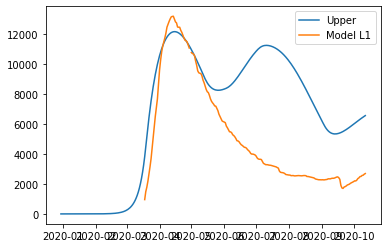

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07246400852288012, 'other': 0.43155211750272116, 'school': 0.502734233842598, 'transport': 0.4924295730868548, 'work': 0.3449418055224177}
June1-June30 {'home': 1.0, 'leisure': 0.11587386817335175, 'other': 0.53767582630947, 'school': 0.5904647640463666, 'transport': 0.7431208645155386, 'work': 0.3449418055224177}
July1-Aug31 {'home': 1.0, 'leisure': 0.11587386817335175, 'other': 0.53767582630947, 'school': 0.5904647640463666, 'transport': 0.7431208645155386, 'work': 0.3449418055224177}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5646488050989216, 'other': 0.7021018650753458, 'school': 0.8573838555105942, 'transport': 0.8945552928992122, 'work': 0.9863901594040663}
alpha1 0.3 alpha2 0.7


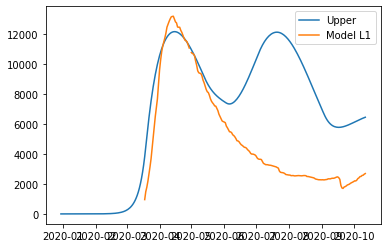

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.15568889008556547, 'other': 0.27469167474584677, 'school': 0.24353419136098944, 'transport': 0.7893454175673648, 'work': 0.22553817680178384}
June1-June30 {'home': 1.0, 'leisure': 0.3593891702971127, 'other': 0.5629837113360185, 'school': 0.6494913235056774, 'transport': 0.8520039329775487, 'work': 0.22553817680178384}
July1-Aug31 {'home': 1.0, 'leisure': 0.3593891702971127, 'other': 0.5629837113360185, 'school': 0.6494913235056774, 'transport': 0.8520039329775487, 'work': 0.22553817680178384}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.717129366591263, 'other': 0.6851396463072537, 'school': 0.6692893173946637, 'transport': 0.9584580577424235, 'work': 0.8480104281047611}
alpha1 0.3 alpha2 0.7


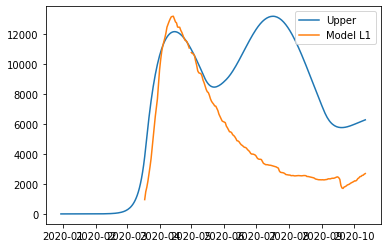

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.3849601369103274, 'other': 0.40794318519539274, 'school': 0.12490889537523756, 'transport': 0.7316851836804015, 'work': 0.2417566056464955}
June1-June30 {'home': 1.0, 'leisure': 0.4952416164118465, 'other': 0.44145081772764927, 'school': 0.3323355907137218, 'transport': 0.7389704308118208, 'work': 0.2417566056464955}
July1-Aug31 {'home': 1.0, 'leisure': 0.4952416164118465, 'other': 0.44145081772764927, 'school': 0.3323355907137218, 'transport': 0.7389704308118208, 'work': 0.2417566056464955}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.9734171244970413, 'other': 0.515519029491081, 'school': 0.8797867573156207, 'transport': 0.9438949008272792, 'work': 0.9581718194500279}
alpha1 0.3 alpha2 0.7


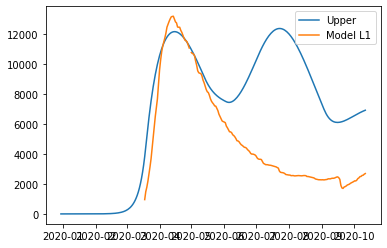

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.19724142529608368, 'other': 0.2401517287345313, 'school': 0.34159776610325737, 'transport': 0.7163215591267744, 'work': 0.2437768192782657}
June1-June30 {'home': 1.0, 'leisure': 0.37256793949006783, 'other': 0.45019268581226113, 'school': 0.8264774076950324, 'transport': 0.7972049387853893, 'work': 0.2437768192782657}
July1-Aug31 {'home': 1.0, 'leisure': 0.37256793949006783, 'other': 0.45019268581226113, 'school': 0.8264774076950324, 'transport': 0.7972049387853893, 'work': 0.2437768192782657}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.805960896569672, 'other': 0.7232054747675688, 'school': 0.5823990658199896, 'transport': 0.9446974005021014, 'work': 0.8799068073362155}
alpha1 0.3 alpha2 0.7
21833.99516496
error_g

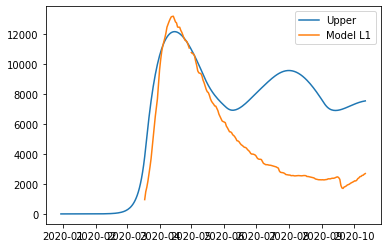


Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.3370398722847886, 'other': 0.13102092578883387, 'school': 0.09019355626313741, 'transport': 0.3398740661575795, 'work': 0.27413695572166275}
June1-June30 {'home': 1.0, 'leisure': 0.39130957571251457, 'other': 0.42287205798855965, 'school': 0.4667776928407102, 'transport': 0.3487992642517486, 'work': 0.27413695572166275}
July1-Aug31 {'home': 1.0, 'leisure': 0.39130957571251457, 'other': 0.42287205798855965, 'school': 0.4667776928407102, 'transport': 0.3487992642517486, 'work': 0.27413695572166275}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.582978291536804, 'other': 0.6263748637414132, 'school': 0.8659180892362872, 'transport': 0.6944269405075175, 'work': 0.7358244976837958}
alpha1 0.3 alpha2 0.7


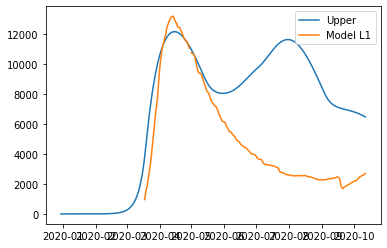

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.2401438115898795, 'other': 0.23487184667525265, 'school': 0.4314512895217369, 'transport': 0.49535883364207905, 'work': 0.3747692935803981}
June1-June30 {'home': 1.0, 'leisure': 0.2605741254517745, 'other': 0.2644782644434138, 'school': 0.8768762816901959, 'transport': 0.5873826369755725, 'work': 0.3747692935803981}
July1-Aug31 {'home': 1.0, 'leisure': 0.2605741254517745, 'other': 0.2644782644434138, 'school': 0.8768762816901959, 'transport': 0.5873826369755725, 'work': 0.3747692935803981}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7596625349839864, 'other': 0.5123464169732882, 'school': 0.6201084654632492, 'transport': 0.8363501662286095, 'work': 0.9298532326950828}
alpha1 0.3 alpha2 0.7
21313.214468893268
error_

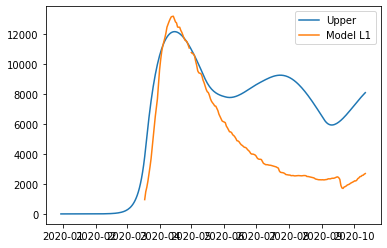

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.21940836411161554, 'other': 0.2796513359733224, 'school': 0.2045093692607683, 'transport': 0.6093026816820417, 'work': 0.30055781944328347}
June1-June30 {'home': 1.0, 'leisure': 0.2677004244994585, 'other': 0.34335369467205873, 'school': 0.627958730967631, 'transport': 0.679968953081755, 'work': 0.30055781944328347}
July1-Aug31 {'home': 1.0, 'leisure': 0.2677004244994585, 'other': 0.34335369467205873, 'school': 0.627958730967631, 'transport': 0.679968953081755, 'work': 0.30055781944328347}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6576517416116929, 'other': 0.7357866969423889, 'school': 0.7491199111868121, 'transport': 0.8887210659839405, 'work': 0.7963223287461222}
alpha1 0.3 alpha2 0.7


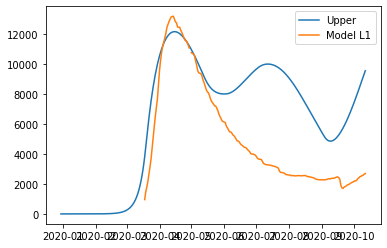

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.16331390738555432, 'other': 0.35612858154850413, 'school': 0.49801591033755804, 'transport': 0.3729018099024339, 'work': 0.28815693516750573}
June1-June30 {'home': 1.0, 'leisure': 0.18403413161367826, 'other': 0.4379274700901007, 'school': 0.7205935917656927, 'transport': 0.6511605669446574, 'work': 0.28815693516750573}
July1-Aug31 {'home': 1.0, 'leisure': 0.18403413161367826, 'other': 0.4379274700901007, 'school': 0.7205935917656927, 'transport': 0.6511605669446574, 'work': 0.28815693516750573}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.8171282108399671, 'other': 0.8869031808716129, 'school': 0.5886425766372547, 'transport': 0.9374508749544225, 'work': 0.9893413163766205}
alpha1 0.3 alpha2 0.7
23380.313435470787


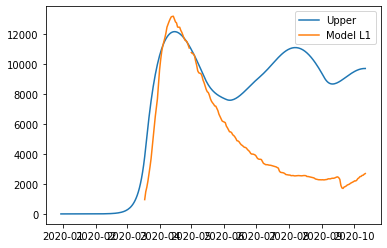

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.13143206051645145, 'other': 0.285759165040569, 'school': 0.17467560244121205, 'transport': 0.6484278506981309, 'work': 0.33647267477735343}
June1-June30 {'home': 1.0, 'leisure': 0.3922883835405764, 'other': 0.3583933596497252, 'school': 0.23505743716216967, 'transport': 0.8617488828774975, 'work': 0.33647267477735343}
July1-Aug31 {'home': 1.0, 'leisure': 0.3922883835405764, 'other': 0.3583933596497252, 'school': 0.23505743716216967, 'transport': 0.8617488828774975, 'work': 0.33647267477735343}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6500468901292195, 'other': 0.7280210179555776, 'school': 0.8368554844312752, 'transport': 0.8797893007271236, 'work': 0.8826328505359322}
alpha1 0.3 alpha2 0.7


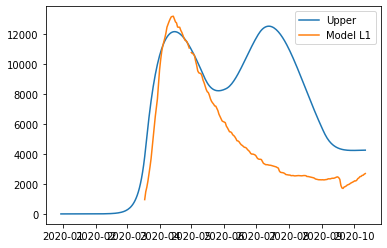

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.24739559688350454, 'other': 0.35459420376882766, 'school': 0.5045723332187299, 'transport': 0.6570651382121722, 'work': 0.23702822008988955}
June1-June30 {'home': 1.0, 'leisure': 0.3218292434231398, 'other': 0.500210706308694, 'school': 0.6665303049799025, 'transport': 0.7079608885607749, 'work': 0.23702822008988955}
July1-Aug31 {'home': 1.0, 'leisure': 0.3218292434231398, 'other': 0.500210706308694, 'school': 0.6665303049799025, 'transport': 0.7079608885607749, 'work': 0.23702822008988955}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6112077943114141, 'other': 0.7309108650703593, 'school': 0.7858416204500717, 'transport': 0.9954199007731505, 'work': 0.6691373356658865}
alpha1 0.3 alpha2 0.7
21923.811000297075
error

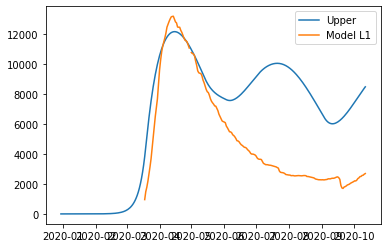

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.2825133452104811, 'other': 0.299454612415205, 'school': 0.024871314825515828, 'transport': 0.5165591967583459, 'work': 0.22716485601641598}
June1-June30 {'home': 1.0, 'leisure': 0.4195488852594145, 'other': 0.4763545392359446, 'school': 0.3383228795776411, 'transport': 0.6482156109778763, 'work': 0.22716485601641598}
July1-Aug31 {'home': 1.0, 'leisure': 0.4195488852594145, 'other': 0.4763545392359446, 'school': 0.3383228795776411, 'transport': 0.6482156109778763, 'work': 0.22716485601641598}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5295587792365705, 'other': 0.8548185850419686, 'school': 0.9456665129126343, 'transport': 0.7698113557412307, 'work': 0.8379858274074657}
alpha1 0.3 alpha2 0.7
14825.593200624011
erro

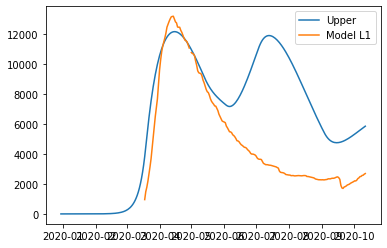

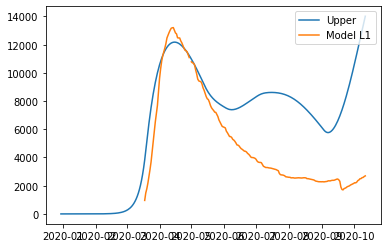

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08635088525930222, 'other': 0.310415512502222, 'school': 0.1686293570242423, 'transport': 0.5561758739583027, 'work': 0.3276402696459839}
May12-May30 {'home': 1.0, 'leisure': 0.14819688919551494, 'other': 0.3129243092050177, 'school': 0.1828539483698023, 'transport': 0.4277811065708117, 'work': 0.22557365839682253}
June1-June30 {'home': 1.0, 'leisure': 0.1372634462350947, 'other': 0.5049597531714914, 'school': 0.4575960210772504, 'transport': 0.7329929015153702, 'work': 0.

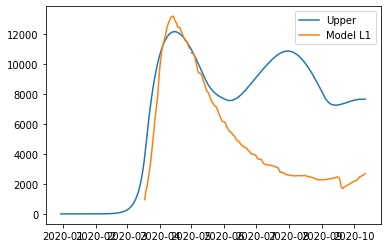

June1-June30 {'home': 1.0, 'leisure': 0.20044496902024503, 'other': 0.8532916366069173, 'school': 0.4770907354350273, 'transport': 0.5979996979011776, 'work': 0.22557365839682253}
July1-Aug31 {'home': 1.0, 'leisure': 0.1372634462350947, 'other': 0.5049597531714914, 'school': 0.4575960210772504, 'transport': 0.7329929015153702, 'work': 0.3276402696459839}
July1-Aug31 {'home': 1.0, 'leisure': 0.20044496902024503, 'other': 0.8532916366069173, 'school': 0.4770907354350273, 'transport': 0.5979996979011776, 'work': 0.22557365839682253}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.2187506637069325, 'other': 0.9596177655129761, 'school': 0.8989278248227687, 'transport': 0.9712283640687429, 'work': 0.8484449086496828}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.8874221054464361, 'other': 0.9752260098080814, 'school': 0.8761379831021058, 'transport': 0.8446904922499788, 'work': 0.8146431878445645}
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
alph

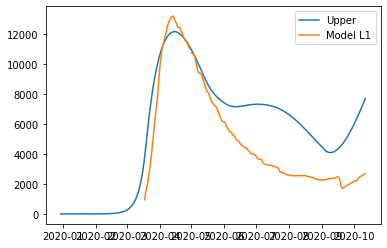


Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.19982357573435877, 'other': 0.22554538569658553, 'school': 0.3986741106511127, 'transport': 0.5186347169548982, 'work': 0.2413654151963965}
June1-June30 {'home': 1.0, 'leisure': 0.28141139762396655, 'other': 0.31394939535457156, 'school': 0.4532523967362822, 'transport': 0.5888867440601377, 'work': 0.2413654151963965}
July1-Aug31 {'home': 1.0, 'leisure': 0.28141139762396655, 'other': 0.31394939535457156, 'school': 0.4532523967362822, 'transport': 0.5888867440601377, 'work': 0.2413654151963965}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6624343115209845, 'other': 0.5971391206600106, 'school': 0.9903186577898533, 'transport': 0.8733977553588205, 'work': 0.8275444878174074}
alpha1 0.3 alpha2 0.7


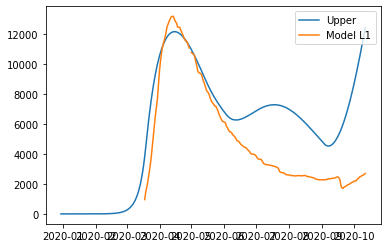

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.17904272511032998, 'other': 0.10474696917442207, 'school': 0.39527266686324986, 'transport': 0.48914179067606, 'work': 0.23113082380103028}
June1-June30 {'home': 1.0, 'leisure': 0.26979621705920587, 'other': 0.3718257771706499, 'school': 0.6219080841009543, 'transport': 0.6046077140226773, 'work': 0.23113082380103028}
July1-Aug31 {'home': 1.0, 'leisure': 0.26979621705920587, 'other': 0.3718257771706499, 'school': 0.6219080841009543, 'transport': 0.6046077140226773, 'work': 0.23113082380103028}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.9281826302904327, 'other': 0.7476471107907154, 'school': 0.9453717354046454, 'transport': 0.8086743145393389, 'work': 0.8779711061851206}
alpha1 0.3 alpha2 0.7
24054.696966035874
er

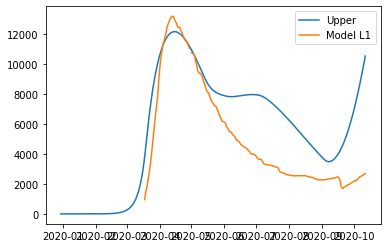

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.16068486436846913, 'other': 0.3846403345277142, 'school': 0.14108408813920612, 'transport': 0.6879557987927372, 'work': 0.23676967551988976}
June1-June30 {'home': 1.0, 'leisure': 0.21160377604042058, 'other': 0.44694231679154095, 'school': 0.23075403699979385, 'transport': 0.717690258273395, 'work': 0.23676967551988976}
July1-Aug31 {'home': 1.0, 'leisure': 0.21160377604042058, 'other': 0.44694231679154095, 'school': 0.23075403699979385, 'transport': 0.717690258273395, 'work': 0.23676967551988976}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7478983857784485, 'other': 0.865601925340358, 'school': 0.9204174327746054, 'transport': 0.95551821296509, 'work': 0.9149470084364546}
alpha1 0.3 alpha2 0.7


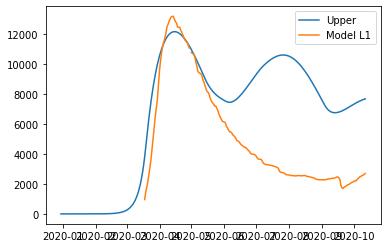

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.2245394830617753, 'other': 0.19966740612375167, 'school': 0.2256578301097163, 'transport': 0.6294317619445993, 'work': 0.31547805685294933}
June1-June30 {'home': 1.0, 'leisure': 0.26577454164264575, 'other': 0.4599967498811275, 'school': 0.5198969909587632, 'transport': 0.8342682538538353, 'work': 0.31547805685294933}
July1-Aug31 {'home': 1.0, 'leisure': 0.26577454164264575, 'other': 0.4599967498811275, 'school': 0.5198969909587632, 'transport': 0.8342682538538353, 'work': 0.31547805685294933}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6957071954773754, 'other': 0.6629960226311385, 'school': 0.8326993787497015, 'transport': 0.8479897552530385, 'work': 0.797799072813427}
alpha1 0.3 alpha2 0.7
22452.72152373274
erro

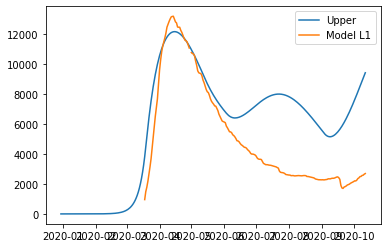


Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.19725990784259814, 'other': 0.1420332850126012, 'school': 0.32158576970871783, 'transport': 0.41092053249238886, 'work': 0.22387145343613418}
June1-June30 {'home': 1.0, 'leisure': 0.3358339197277357, 'other': 0.38111957602867175, 'school': 0.5934539479394172, 'transport': 0.6182873688301069, 'work': 0.22387145343613418}
July1-Aug31 {'home': 1.0, 'leisure': 0.3358339197277357, 'other': 0.38111957602867175, 'school': 0.5934539479394172, 'transport': 0.6182873688301069, 'work': 0.22387145343613418}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7285636837601197, 'other': 0.6329417728523122, 'school': 0.8064764911526141, 'transport': 0.8305133828015802, 'work': 0.908024582884523}
alpha1 0.3 alpha2 0.7


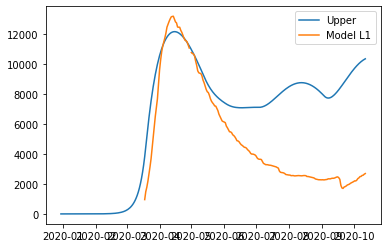

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.11543481726967976, 'other': 0.1842678463070492, 'school': 0.3810597380418284, 'transport': 0.49606116808963696, 'work': 0.3871944380017364}
June1-June30 {'home': 1.0, 'leisure': 0.2420342733073856, 'other': 0.18564703755556827, 'school': 0.5548684892008731, 'transport': 0.6046959965363952, 'work': 0.3871944380017364}
July1-Aug31 {'home': 1.0, 'leisure': 0.2420342733073856, 'other': 0.18564703755556827, 'school': 0.5548684892008731, 'transport': 0.6046959965363952, 'work': 0.3871944380017364}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5930504550491639, 'other': 0.765774440697594, 'school': 0.709996421494241, 'transport': 0.7734412993630173, 'work': 0.7757691000220108}
20479.751043338332
alpha1 0.3 alpha2 0.7
error_

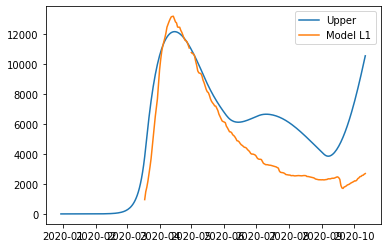

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.11878476386520137, 'other': 0.16169251669669588, 'school': 0.3434941075184695, 'transport': 0.31379816110718184, 'work': 0.2450703572885477}
June1-June30 {'home': 1.0, 'leisure': 0.16601503402517714, 'other': 0.4527327326880184, 'school': 0.6188587693973816, 'transport': 0.46399580810911123, 'work': 0.2450703572885477}
July1-Aug31 {'home': 1.0, 'leisure': 0.16601503402517714, 'other': 0.4527327326880184, 'school': 0.6188587693973816, 'transport': 0.46399580810911123, 'work': 0.2450703572885477}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7277592959740561, 'other': 0.8840899951567464, 'school': 0.6856340966827146, 'transport': 0.9910723795817739, 'work': 0.7492811613951524}
alpha1 0.3 alpha2 0.7
10667.252477643699
e

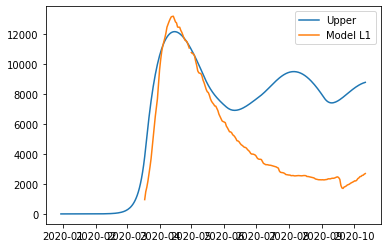

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.24450103777326124, 'other': 0.11733782970406201, 'school': 0.13210965205871567, 'transport': 0.5603356818765859, 'work': 0.33878286642091426}
June1-June30 {'home': 1.0, 'leisure': 0.2571718758354732, 'other': 0.30721586389100036, 'school': 0.6495725426767672, 'transport': 0.8178986936267301, 'work': 0.33878286642091426}
July1-Aug31 {'home': 1.0, 'leisure': 0.2571718758354732, 'other': 0.30721586389100036, 'school': 0.6495725426767672, 'transport': 0.8178986936267301, 'work': 0.33878286642091426}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7022387956632438, 'other': 0.4629103097796399, 'school': 0.6963034696833711, 'transport': 0.8796570787573659, 'work': 0.9703530408426747}
alpha1 0.3 alpha2 0.7


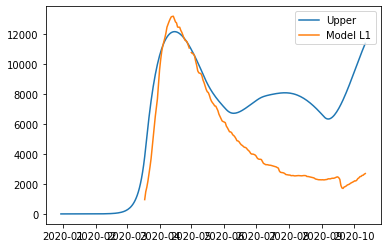

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.1434500236695867, 'other': 0.1631502233912422, 'school': 0.11776721955804365, 'transport': 0.5640785227143578, 'work': 0.33105513673106013}
June1-June30 {'home': 1.0, 'leisure': 0.1812799384163738, 'other': 0.523105866264565, 'school': 0.26477288979151775, 'transport': 0.6966592701127148, 'work': 0.33105513673106013}
July1-Aug31 {'home': 1.0, 'leisure': 0.1812799384163738, 'other': 0.523105866264565, 'school': 0.26477288979151775, 'transport': 0.6966592701127148, 'work': 0.33105513673106013}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6657077660955825, 'other': 0.849480299983443, 'school': 0.8690958045779256, 'transport': 0.793262184140044, 'work': 0.725917448559438}
alpha1 0.3 alpha2 0.7
15307.884165275576
error_g

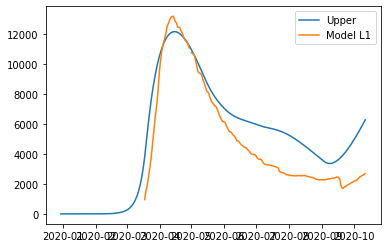

error_groups 3501.75095461097
error_total 2800.3894267820533
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
[0.1462185  0.3758794  0.52602716 0.74861952 0.23573313 0.17272336
 0.67936438 0.18772439 0.04339187 0.83962939 0.99813121 0.41252236
 0.73316102 0.60666547 0.99287182 0.52970989 0.144057   0.40994755
 0.84175289 0.17969949]
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.09992478290315807, 'other': 0.15937923620964078, 'school': 0.6001730014481492, 'transport': 0.47331971473704315, 'work': 0.2733578940398716}
June1-June30 {'home': 1.0, 'leisure': 0.15499847047188903, 'other': 0.16744832828549866, 'school': 0.6988376287244636, 'transport': 0.648166050142039, 'work': 0.2733578940398716}
July1-Aug31 {'home': 1.0, 'leisure': 0.15499847047188903, 'other': 0.16744832828549866, 'school': 0.6988376287244

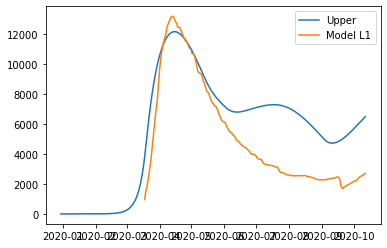

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.2760409824739421, 'other': 0.1457966697160836, 'school': 0.2035204872636657, 'transport': 0.5141161190757861, 'work': 0.2484000618740775}
June1-June30 {'home': 1.0, 'leisure': 0.30083059015531066, 'other': 0.3217738405815943, 'school': 0.47235346943025497, 'transport': 0.6802825501908484, 'work': 0.2484000618740775}
July1-Aug31 {'home': 1.0, 'leisure': 0.30083059015531066, 'other': 0.3217738405815943, 'school': 0.47235346943025497, 'transport': 0.6802825501908484, 'work': 0.2484000618740775}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.37182890218848075, 'other': 0.5431997912666092, 'school': 0.9004501933941874, 'transport': 0.8352575200561466, 'work': 0.894034174656522}
alpha1 0.3 alpha2 0.7


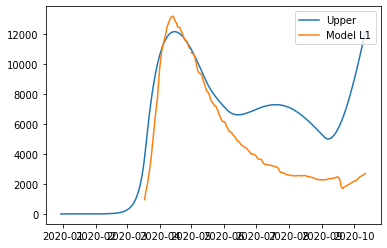

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.14231802008919126, 'other': 0.2663287356047995, 'school': 0.1032106285124382, 'transport': 0.4629986866852204, 'work': 0.2295606525343752}
June1-June30 {'home': 1.0, 'leisure': 0.3376405857778304, 'other': 0.3881989884865735, 'school': 0.3969203641072713, 'transport': 0.6160011934290965, 'work': 0.2295606525343752}
July1-Aug31 {'home': 1.0, 'leisure': 0.3376405857778304, 'other': 0.3881989884865735, 'school': 0.3969203641072713, 'transport': 0.6160011934290965, 'work': 0.2295606525343752}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6109861697829364, 'other': 0.8675453101165235, 'school': 0.9208764445869507, 'transport': 0.866405879946514, 'work': 0.9083398911577749}
alpha1 0.3 alpha2 0.7
13715.59930022078
error_gro

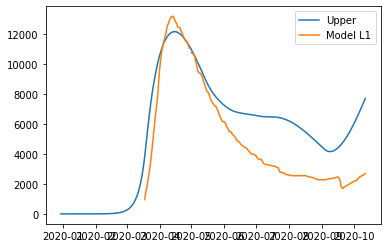

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.3136048377250594, 'other': 0.11844603751840321, 'school': 0.3118402783498767, 'transport': 0.612539030662312, 'work': 0.2204094366985907}
June1-June30 {'home': 1.0, 'leisure': 0.37544253370604364, 'other': 0.15302829528859485, 'school': 0.44844697401292205, 'transport': 0.73901644338993, 'work': 0.2204094366985907}
July1-Aug31 {'home': 1.0, 'leisure': 0.37544253370604364, 'other': 0.15302829528859485, 'school': 0.44844697401292205, 'transport': 0.73901644338993, 'work': 0.2204094366985907}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7212593362783486, 'other': 0.4143831750746422, 'school': 0.8619549192095038, 'transport': 0.9128079995889765, 'work': 0.9309483546036991}
alpha1 0.3 alpha2 0.7


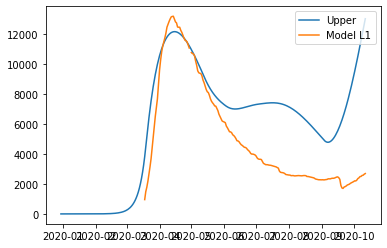

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.16150871985008494, 'other': 0.17900857544796578, 'school': 0.5251682397527081, 'transport': 0.39576001378245856, 'work': 0.29682629710192965}
June1-June30 {'home': 1.0, 'leisure': 0.1840428914273345, 'other': 0.2946873492294658, 'school': 0.6728103651569308, 'transport': 0.612826058035572, 'work': 0.29682629710192965}
July1-Aug31 {'home': 1.0, 'leisure': 0.1840428914273345, 'other': 0.2946873492294658, 'school': 0.6728103651569308, 'transport': 0.612826058035572, 'work': 0.29682629710192965}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.806141327672787, 'other': 0.9521545828939921, 'school': 0.8091944214354276, 'transport': 0.8067107298618221, 'work': 0.8793813954109437}
alpha1 0.3 alpha2 0.7
21284.490799252093
error

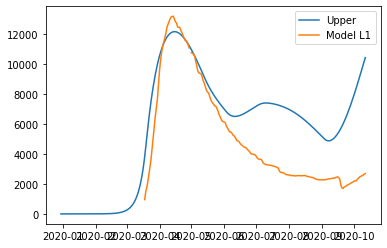

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.11215702285219281, 'other': 0.176810934894368, 'school': 0.14624778591838103, 'transport': 0.577846445285567, 'work': 0.2957943300240071}
June1-June30 {'home': 1.0, 'leisure': 0.1314118864829633, 'other': 0.5400575931645685, 'school': 0.32850343986185465, 'transport': 0.8128138058338255, 'work': 0.2957943300240071}
July1-Aug31 {'home': 1.0, 'leisure': 0.1314118864829633, 'other': 0.5400575931645685, 'school': 0.32850343986185465, 'transport': 0.8128138058338255, 'work': 0.2957943300240071}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7787631783333049, 'other': 0.5404817300801784, 'school': 0.9333178955077964, 'transport': 0.8828239694135335, 'work': 0.932112440740174}
alpha1 0.3 alpha2 0.7


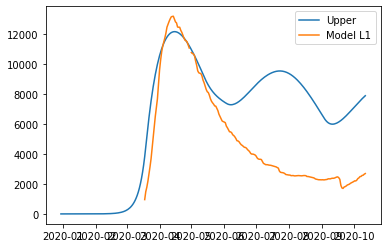

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.2202252693059969, 'other': 0.24240041431751108, 'school': 0.26425533030997655, 'transport': 0.47911655926349017, 'work': 0.25268443256529044}
June1-June30 {'home': 1.0, 'leisure': 0.3631148552770791, 'other': 0.40400258545766754, 'school': 0.4755254538787198, 'transport': 0.7082745434432853, 'work': 0.25268443256529044}
July1-Aug31 {'home': 1.0, 'leisure': 0.3631148552770791, 'other': 0.40400258545766754, 'school': 0.4755254538787198, 'transport': 0.7082745434432853, 'work': 0.25268443256529044}
9601.842181679882
Sept1-Oct12 {'home': 1.0, 'leisure': 0.4212451015803004, 'other': 0.8195513211355108, 'school': 0.7731701056692797, 'transport': 0.86550180633604, 'work': 0.8774425608691674}
alpha1 0.3 alpha2 0.7
err

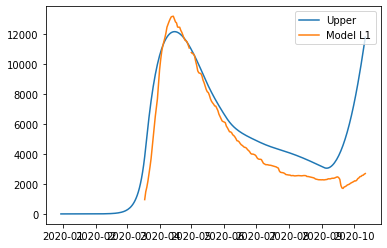

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.15019367570792855, 'other': 0.10967407233685605, 'school': 0.0529678368968734, 'transport': 0.589284575866134, 'work': 0.2469230383992076}
June1-June30 {'home': 1.0, 'leisure': 0.22973424094796213, 'other': 0.2451256333419048, 'school': 0.1814639752223797, 'transport': 0.8472195675594625, 'work': 0.2469230383992076}
July1-Aug31 {'home': 1.0, 'leisure': 0.22973424094796213, 'other': 0.2451256333419048, 'school': 0.1814639752223797, 'transport': 0.8472195675594625, 'work': 0.2469230383992076}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.8611342431062878, 'other': 0.6654039923374224, 'school': 0.88396955524066, 'transport': 0.9290809138272216, 'work': 0.798996464849704}
alpha1 0.3 alpha2 0.7
20138.28431855159
error_gro

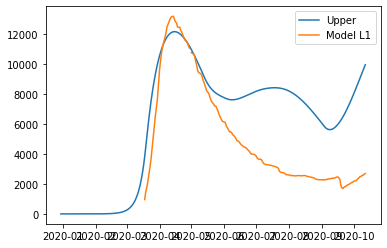

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.26413804027837307, 'other': 0.34244891672236455, 'school': 0.002333026499479341, 'transport': 0.286816528807464, 'work': 0.2554227804236918}
June1-June30 {'home': 1.0, 'leisure': 0.3633694617004397, 'other': 0.42494462775644526, 'school': 0.2963582167985052, 'transport': 0.39848777531874263, 'work': 0.2554227804236918}
July1-Aug31 {'home': 1.0, 'leisure': 0.3633694617004397, 'other': 0.42494462775644526, 'school': 0.2963582167985052, 'transport': 0.39848777531874263, 'work': 0.2554227804236918}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.8074765002927036, 'other': 0.701548292921023, 'school': 0.8987034342829378, 'transport': 0.5874060284728759, 'work': 0.8320802208108433}
alpha1 0.3 alpha2 0.7


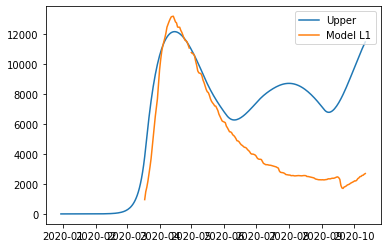

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.14924271339800382, 'other': 0.11810896315778313, 'school': 0.15653944920635546, 'transport': 0.564833272623465, 'work': 0.2740689317659696}
June1-June30 {'home': 1.0, 'leisure': 0.319823215243203, 'other': 0.4814718763120326, 'school': 0.33121274371026577, 'transport': 0.7919963933152988, 'work': 0.2740689317659696}
July1-Aug31 {'home': 1.0, 'leisure': 0.319823215243203, 'other': 0.4814718763120326, 'school': 0.33121274371026577, 'transport': 0.7919963933152988, 'work': 0.2740689317659696}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6351260499925374, 'other': 0.7953639795282954, 'school': 0.7125296545766541, 'transport': 0.9490039677541049, 'work': 0.8609770558164975}
alpha1 0.3 alpha2 0.7
15192.527686427065
error_

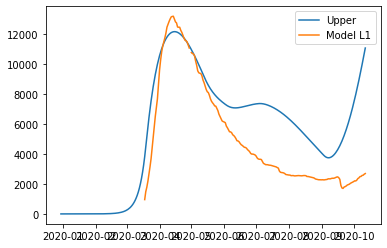

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.12927957680279217, 'other': 0.2742682118098946, 'school': 0.39751621524266034, 'transport': 0.4117290351574685, 'work': 0.25207584551235146}
June1-June30 {'home': 1.0, 'leisure': 0.17249085618184354, 'other': 0.37302476982744115, 'school': 0.47579450628523334, 'transport': 0.8920303181871945, 'work': 0.25207584551235146}
July1-Aug31 {'home': 1.0, 'leisure': 0.17249085618184354, 'other': 0.37302476982744115, 'school': 0.47579450628523334, 'transport': 0.8920303181871945, 'work': 0.25207584551235146}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.8213223579879316, 'other': 0.7942578948468132, 'school': 0.7411509419640294, 'transport': 0.9624069793461089, 'work': 0.9536053467138692}
alpha1 0.3 alpha2 0.7
15301.7739272255

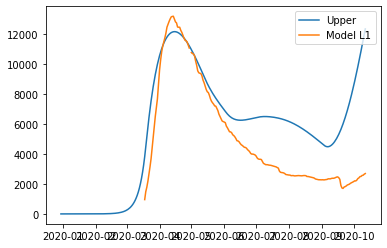

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.14367033687174607, 'other': 0.22480644051328072, 'school': 0.04029024627632078, 'transport': 0.48550117003472937, 'work': 0.2249028865826427}
June1-June30 {'home': 1.0, 'leisure': 0.3287682119968274, 'other': 0.4215109831402144, 'school': 0.1638283256540254, 'transport': 0.6693371422219009, 'work': 0.2249028865826427}
July1-Aug31 {'home': 1.0, 'leisure': 0.3287682119968274, 'other': 0.4215109831402144, 'school': 0.1638283256540254, 'transport': 0.6693371422219009, 'work': 0.2249028865826427}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6642833207878297, 'other': 0.8148720644062296, 'school': 0.981495826660254, 'transport': 0.9509468995832573, 'work': 0.8291237418191224}
alpha1 0.3 alpha2 0.7


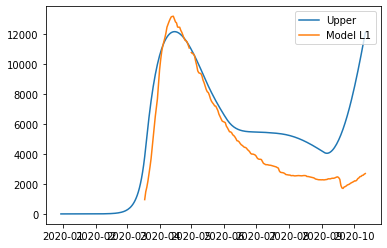

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.0788574066029955, 'other': 0.12268737158971622, 'school': 0.20861451151596144, 'transport': 0.4251803991869638, 'work': 0.2776269867452208}
June1-June30 {'home': 1.0, 'leisure': 0.17395174873922142, 'other': 0.35707261175502714, 'school': 0.4616795141782647, 'transport': 0.5446811218158034, 'work': 0.2776269867452208}
July1-Aug31 {'home': 1.0, 'leisure': 0.17395174873922142, 'other': 0.35707261175502714, 'school': 0.4616795141782647, 'transport': 0.5446811218158034, 'work': 0.2776269867452208}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7427964571439293, 'other': 0.6224855122963524, 'school': 0.9002477986237145, 'transport': 0.8071539540384578, 'work': 0.9393818441990407}
alpha1 0.3 alpha2 0.7
12055.19469188914
err

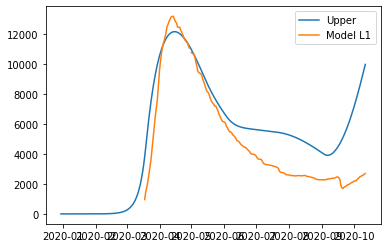

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.1231809517022999, 'other': 0.11467035336398329, 'school': 0.24642254614197504, 'transport': 0.6228710041012724, 'work': 0.2469230383992076}
June1-June30 {'home': 1.0, 'leisure': 0.2611191471126255, 'other': 0.26942948548374146, 'school': 0.36032194414486907, 'transport': 0.7685761455185807, 'work': 0.2469230383992076}
July1-Aug31 {'home': 1.0, 'leisure': 0.2611191471126255, 'other': 0.26942948548374146, 'school': 0.36032194414486907, 'transport': 0.7685761455185807, 'work': 0.2469230383992076}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7725276966442551, 'other': 0.663596304252408, 'school': 0.8385237106335606, 'transport': 0.9434357894788116, 'work': 0.6950579653956844}
alpha1 0.3 alpha2 0.7


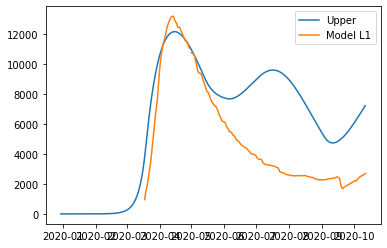

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.30565448893798136, 'other': 0.2501206537706388, 'school': 0.24595394104806587, 'transport': 0.6238694128654988, 'work': 0.21957852413334336}
June1-June30 {'home': 1.0, 'leisure': 0.32702466180884626, 'other': 0.34281276740096067, 'school': 0.7214073841870078, 'transport': 0.8741698905665736, 'work': 0.21957852413334336}
July1-Aug31 {'home': 1.0, 'leisure': 0.32702466180884626, 'other': 0.34281276740096067, 'school': 0.7214073841870078, 'transport': 0.8741698905665736, 'work': 0.21957852413334336}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7777583757731272, 'other': 0.7186946020747126, 'school': 0.6456349600235674, 'transport': 0.9786816941200327, 'work': 0.8146816129698689}
alpha1 0.3 alpha2 0.7
13744.279497015632

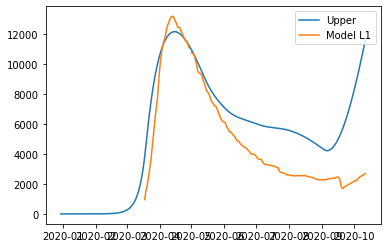

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.10194813449065829, 'other': 0.19415543793414836, 'school': 0.3916054034653598, 'transport': 0.4712445232866378, 'work': 0.29055575468147893}
June1-June30 {'home': 1.0, 'leisure': 0.21390017468113073, 'other': 0.20130375260304884, 'school': 0.43574931709948417, 'transport': 0.745791939453447, 'work': 0.29055575468147893}
July1-Aug31 {'home': 1.0, 'leisure': 0.21390017468113073, 'other': 0.20130375260304884, 'school': 0.43574931709948417, 'transport': 0.745791939453447, 'work': 0.29055575468147893}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.8143446678356135, 'other': 0.6875285045418129, 'school': 0.792050205313985, 'transport': 0.8613011454039957, 'work': 0.8431234396207676}
alpha1 0.3 alpha2 0.7
12522.97483922722
e

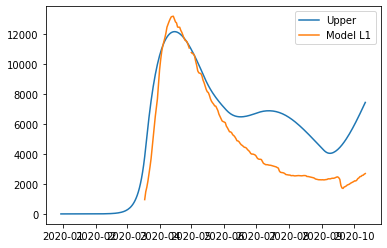

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.11535115462653892, 'other': 0.22804520330558492, 'school': 0.19998836094510888, 'transport': 0.5591680976358411, 'work': 0.24990911353671333}
June1-June30 {'home': 1.0, 'leisure': 0.17323498794210435, 'other': 0.3498790349683103, 'school': 0.6778332866251121, 'transport': 0.8975298941446177, 'work': 0.24990911353671333}
July1-Aug31 {'home': 1.0, 'leisure': 0.17323498794210435, 'other': 0.3498790349683103, 'school': 0.6778332866251121, 'transport': 0.8975298941446177, 'work': 0.24990911353671333}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.633428380655084, 'other': 0.6800455296978039, 'school': 0.7419526245470892, 'transport': 0.9724085699814395, 'work': 0.7007494098863158}
alpha1 0.3 alpha2 0.7


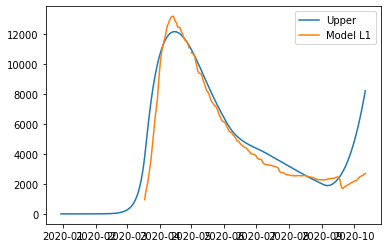

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.06981234349916446, 'other': 0.1424502421596885, 'school': 0.0539620906694559, 'transport': 0.43804764579838296, 'work': 0.21762126372231866}
June1-June30 {'home': 1.0, 'leisure': 0.10635292679003164, 'other': 0.3426180334206077, 'school': 0.36903406422889634, 'transport': 0.6513013122317424, 'work': 0.21762126372231866}
July1-Aug31 {'home': 1.0, 'leisure': 0.10635292679003164, 'other': 0.3426180334206077, 'school': 0.36903406422889634, 'transport': 0.6513013122317424, 'work': 0.21762126372231866}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6039299819894165, 'other': 0.863344463379836, 'school': 0.8119006067202768, 'transport': 0.8727291678662528, 'work': 0.7930725531874117}
alpha1 0.3 alpha2 0.7


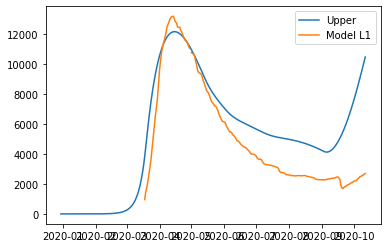

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.13844726200473842, 'other': 0.18068845336341127, 'school': 0.031965450531274496, 'transport': 0.576086422641497, 'work': 0.3143295153544823}
June1-June30 {'home': 1.0, 'leisure': 0.1779528646918867, 'other': 0.3055384912408519, 'school': 0.13640007934826423, 'transport': 0.665009771483871, 'work': 0.3143295153544823}
July1-Aug31 {'home': 1.0, 'leisure': 0.1779528646918867, 'other': 0.3055384912408519, 'school': 0.13640007934826423, 'transport': 0.665009771483871, 'work': 0.3143295153544823}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6325710033876999, 'other': 0.591873309430394, 'school': 0.9150111461950059, 'transport': 0.7836907690347256, 'work': 0.8751745267069747}
alpha1 0.3 alpha2 0.7
19861.963027893842
error_

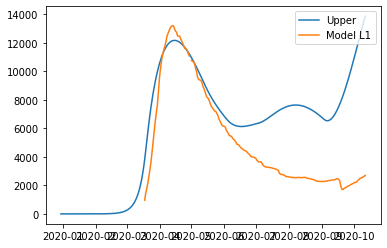

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.14155173566311677, 'other': 0.1687146122633862, 'school': 0.26109453575792296, 'transport': 0.4468803210889064, 'work': 0.23384689954138743}
June1-June30 {'home': 1.0, 'leisure': 0.49464358372909933, 'other': 0.1840323364891659, 'school': 0.37278741676767646, 'transport': 0.687191891579059, 'work': 0.23384689954138743}
July1-Aug31 {'home': 1.0, 'leisure': 0.49464358372909933, 'other': 0.1840323364891659, 'school': 0.37278741676767646, 'transport': 0.687191891579059, 'work': 0.23384689954138743}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7501401257961677, 'other': 0.7463949851885491, 'school': 0.994357118582311, 'transport': 0.8769432085565645, 'work': 0.8652887884063591}
alpha1 0.3 alpha2 0.7
9568.733632555


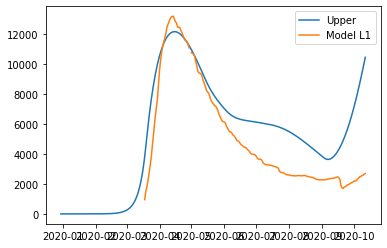

error_groups 2205.651759391494
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
error_total 1472.6163746327013
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
[0.05488881 0.17715859 0.85115273 0.67645613 0.16913089 0.08436109
 0.58654258 0.62500389 0.23386228 0.50634934 0.58449554 0.51264297
 0.57383761 0.35613942 0.51047508 0.61803013 0.04622037 0.08705043
 0.55235007 0.59129561]May12-May30 {'home': 1.0, 'leisure': 0.17859490316839788, 'other': 0.1903939131247179, 'school': 0.27621192270180706, 'transport': 0.4881883028571985, 'work': 0.2197110852424542}
June1-June30 {'home': 1.0, 'leisure': 0.29414017276736315, 'other': 0.2424053894023584, 'school': 0.41139834219799953, 'transport': 0.7893292790098061, 'work': 0.2197110852424542}

July1-Aug31 {'home': 1.0, 'leisure': 0.29414017276736315, 'other': 0.2424053894023584, 'school': 0.4113983421979

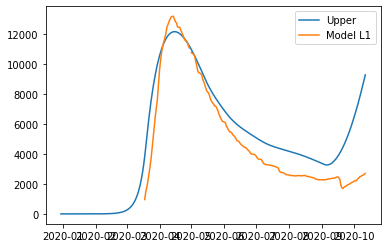

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.09546048417799623, 'other': 0.20390021943692754, 'school': 0.06741389504211946, 'transport': 0.4793375941241248, 'work': 0.28340787611202434}
June1-June30 {'home': 1.0, 'leisure': 0.18945978235617872, 'other': 0.25572478308901103, 'school': 0.1943797352211526, 'transport': 0.6042350964861642, 'work': 0.28340787611202434}
July1-Aug31 {'home': 1.0, 'leisure': 0.18945978235617872, 'other': 0.25572478308901103, 'school': 0.1943797352211526, 'transport': 0.6042350964861642, 'work': 0.28340787611202434}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6410763799937944, 'other': 0.6160486449676436, 'school': 0.7761750361178092, 'transport': 0.7832578596523717, 'work': 0.8401475358471342}
alpha1 0.3 alpha2 0.7
10762.30423503613

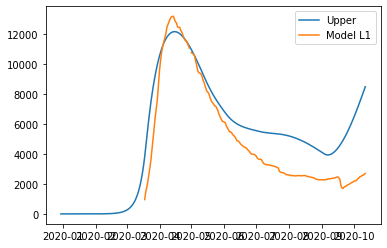

error_groups 2379.7124172192985
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
error_total 1676.5183635633666
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
[0.07187065 0.01557749 0.17400192 0.53983287 0.38227824 0.28755736
 0.86413563 0.8268953  0.05563522 0.60102825 0.06399595 0.89815178
 0.39113693 0.39628547 0.57415399 0.38192854 0.70793438 0.53413832
 0.98927173 0.764758  ]May12-May30 {'home': 1.0, 'leisure': 0.11173402515952216, 'other': 0.12568164546174956, 'school': 0.23065501438343025, 'transport': 0.6094053736880569, 'work': 0.2907265648580778}

June1-June30 {'home': 1.0, 'leisure': 0.15363154743267265, 'other': 0.2290828754125585, 'school': 0.5366984309874749, 'transport': 0.8400123312630955, 'work': 0.2907265648580778}
July1-Aug31 {'home': 1.0, 'leisure': 0.15363154743267265, 'other': 0.2290828754125585, 'school': 0.536698430987

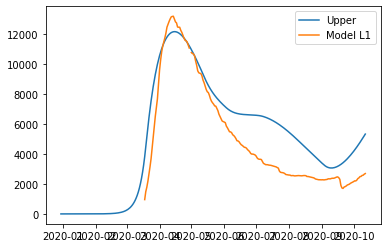

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.15008123745585095, 'other': 0.24573057338800852, 'school': 0.31726808783462535, 'transport': 0.4400457556106526, 'work': 0.23302192579092007}
June1-June30 {'home': 1.0, 'leisure': 0.16823229450199148, 'other': 0.3553520272457419, 'school': 0.556647678464878, 'transport': 0.6041295944502221, 'work': 0.23302192579092007}
July1-Aug31 {'home': 1.0, 'leisure': 0.16823229450199148, 'other': 0.3553520272457419, 'school': 0.556647678464878, 'transport': 0.6041295944502221, 'work': 0.23302192579092007}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.37098113477390704, 'other': 0.6847743174524226, 'school': 0.9946358672967246, 'transport': 0.841860716554742, 'work': 0.7127157176611179}
alpha1 0.3 alpha2 0.7
14841.32283587562
err

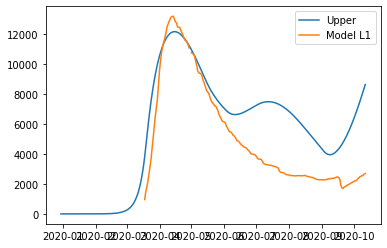

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08888824868844185, 'other': 0.2034200511909453, 'school': 0.5001990798708672, 'transport': 0.5487153491322361, 'work': 0.23308966188976107}
June1-June30 {'home': 1.0, 'leisure': 0.20408556824675575, 'other': 0.3634302324751836, 'school': 0.6858198740657572, 'transport': 0.8141048487640201, 'work': 0.23308966188976107}
July1-Aug31 {'home': 1.0, 'leisure': 0.20408556824675575, 'other': 0.3634302324751836, 'school': 0.6858198740657572, 'transport': 0.8141048487640201, 'work': 0.23308966188976107}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.866958399517979, 'other': 0.6300352522630603, 'school': 0.7874225625593287, 'transport': 0.9368757008798521, 'work': 0.8208364618385489}
alpha1 0.3 alpha2 0.7
9087.295338552001
erro

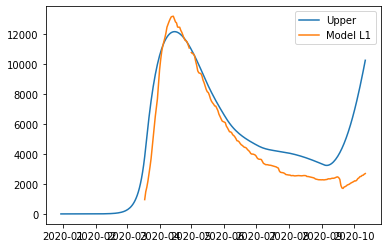

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.11477095902113363, 'other': 0.14155957305625674, 'school': 0.06775139851622547, 'transport': 0.5666209668012122, 'work': 0.22326373527380972}
June1-June30 {'home': 1.0, 'leisure': 0.34353700342454896, 'other': 0.15808174924520565, 'school': 0.20036397748640844, 'transport': 0.6650686683294527, 'work': 0.22326373527380972}
July1-Aug31 {'home': 1.0, 'leisure': 0.34353700342454896, 'other': 0.15808174924520565, 'school': 0.20036397748640844, 'transport': 0.6650686683294527, 'work': 0.22326373527380972}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.9363425053283471, 'other': 0.5344372426569989, 'school': 0.789457212780572, 'transport': 0.8061082855510451, 'work': 0.7136918981878727}
alpha1 0.3 alpha2 0.7
10715.2950763727

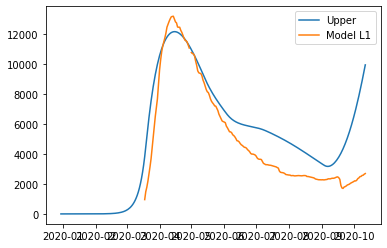

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.1545691487590748, 'other': 0.19782510868057523, 'school': 0.04193724452689746, 'transport': 0.5225968958574052, 'work': 0.2283137355468031}
June1-June30 {'home': 1.0, 'leisure': 0.22987768522151733, 'other': 0.38017498242455694, 'school': 0.1661194458562959, 'transport': 0.7349789230012533, 'work': 0.2283137355468031}
July1-Aug31 {'home': 1.0, 'leisure': 0.22987768522151733, 'other': 0.38017498242455694, 'school': 0.1661194458562959, 'transport': 0.7349789230012533, 'work': 0.2283137355468031}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.639756477869509, 'other': 0.779844142069885, 'school': 0.9663893285479337, 'transport': 0.9844295287224886, 'work': 0.7662846076704337}
alpha1 0.3 alpha2 0.7
16775.42160228429
error

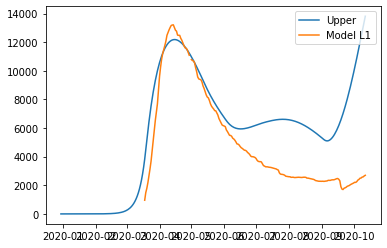

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.186276116287784, 'other': 0.10017423758972661, 'school': 0.11826107067442837, 'transport': 0.36091163475422416, 'work': 0.2797454583189632}
June1-June30 {'home': 1.0, 'leisure': 0.20912895789082275, 'other': 0.3801054203138634, 'school': 0.5368214028321346, 'transport': 0.6925919117711795, 'work': 0.2797454583189632}
July1-Aug31 {'home': 1.0, 'leisure': 0.20912895789082275, 'other': 0.3801054203138634, 'school': 0.5368214028321346, 'transport': 0.6925919117711795, 'work': 0.2797454583189632}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7213654476101792, 'other': 0.8350860750467495, 'school': 0.9075227194299746, 'transport': 0.9453613262206035, 'work': 0.8423176640267283}
alpha1 0.3 alpha2 0.7
16443.231653760144
erro

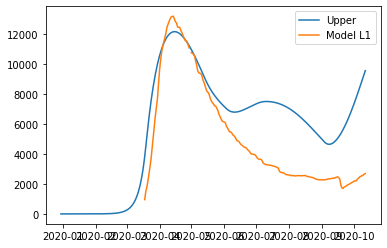

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.16695859211509567, 'other': 0.18412728356052444, 'school': 0.2806595690884208, 'transport': 0.5287801385621901, 'work': 0.27272572168472936}
June1-June30 {'home': 1.0, 'leisure': 0.19549416733706085, 'other': 0.4194033793453009, 'school': 0.4433513318752977, 'transport': 0.8144097660658046, 'work': 0.27272572168472936}
July1-Aug31 {'home': 1.0, 'leisure': 0.19549416733706085, 'other': 0.4194033793453009, 'school': 0.4433513318752977, 'transport': 0.8144097660658046, 'work': 0.27272572168472936}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5803387688413604, 'other': 0.6736744979133682, 'school': 0.8923914191166862, 'transport': 0.8963799112361849, 'work': 0.9819674319002045}
alpha1 0.3 alpha2 0.7
6504.108238283156
er

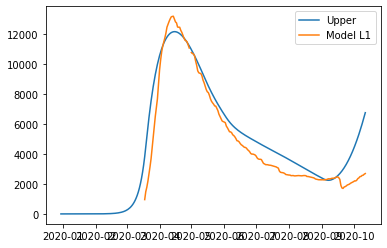

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.15302317117470388, 'other': 0.10542036908569358, 'school': 0.2104628567473877, 'transport': 0.579998221704795, 'work': 0.21772891105400533}
June1-June30 {'home': 1.0, 'leisure': 0.196737115575178, 'other': 0.24499237001207944, 'school': 0.31857948130223285, 'transport': 0.6374465258967954, 'work': 0.21772891105400533}
July1-Aug31 {'home': 1.0, 'leisure': 0.196737115575178, 'other': 0.24499237001207944, 'school': 0.31857948130223285, 'transport': 0.6374465258967954, 'work': 0.21772891105400533}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.43753483294219986, 'other': 0.6347670073143545, 'school': 0.9872169044661858, 'transport': 0.8527622351524441, 'work': 0.9280248145254033}
alpha1 0.3 alpha2 0.7
14153.996370151104
e

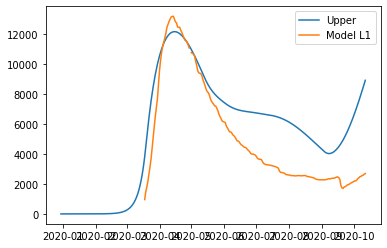

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.24050858707188402, 'other': 0.2523082643223804, 'school': 0.10855140623943128, 'transport': 0.5362932932968865, 'work': 0.22937338558669257}
June1-June30 {'home': 1.0, 'leisure': 0.30675922199749056, 'other': 0.26022642404926605, 'school': 0.42465955223710616, 'transport': 0.7376037224650439, 'work': 0.22937338558669257}
July1-Aug31 {'home': 1.0, 'leisure': 0.30675922199749056, 'other': 0.26022642404926605, 'school': 0.42465955223710616, 'transport': 0.7376037224650439, 'work': 0.22937338558669257}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.680255176109174, 'other': 0.6801763758008302, 'school': 0.9234726576957801, 'transport': 0.8642226923374422, 'work': 0.8098572497102923}
alpha1 0.3 alpha2 0.7
9233.206668218518

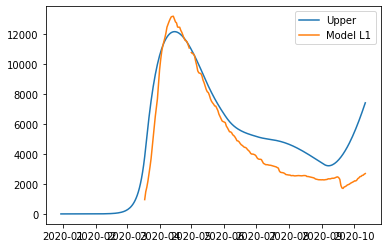

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.15189297468576513, 'other': 0.10262093994258929, 'school': 0.32284568919643686, 'transport': 0.3895434321980622, 'work': 0.2377530154244463}
June1-June30 {'home': 1.0, 'leisure': 0.2244571737539499, 'other': 0.17642806460711735, 'school': 0.5443677114705086, 'transport': 0.782459555195877, 'work': 0.2377530154244463}
July1-Aug31 {'home': 1.0, 'leisure': 0.2244571737539499, 'other': 0.17642806460711735, 'school': 0.5443677114705086, 'transport': 0.782459555195877, 'work': 0.2377530154244463}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6858792372502076, 'other': 0.5152982557993717, 'school': 0.8369553265565597, 'transport': 0.9353000862335247, 'work': 0.7537831223961522}
alpha1 0.3 alpha2 0.7
11760.593885451248
error

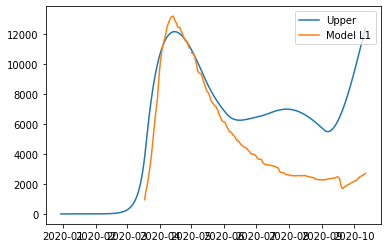

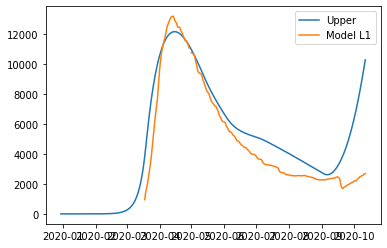

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
May12-May30 {'home': 1.0, 'leisure': 0.17877520368179173, 'other': 0.10738782658730739, 'school': 0.32450703627308125, 'transport': 0.497141052909135, 'work': 0.263240681160145}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
June1-June30 {'home': 1.0, 'leisure': 0.33516094858, 'other': 0.25983168855644456, 'school': 0.45297238143083834, 'transport': 0.6740350676643387, 'work': 0.263240681160145}
May12-May30 {'home': 1.0, 'leisure': 0.08327818516572422, 'other': 0.18360524222657432, 'school': 0.06838587473820332, 'transport': 0.4475620725154591, 'work': 0.24

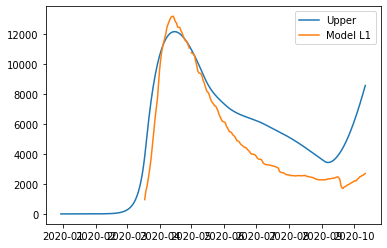

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.06676109806119329, 'other': 0.31307680371605234, 'school': 0.12902946101238455, 'transport': 0.48955315064833266, 'work': 0.2912401717903914}
June1-June30 {'home': 1.0, 'leisure': 0.09796093143144574, 'other': 0.3565534306537238, 'school': 0.3987652898514311, 'transport': 0.7039657002473323, 'work': 0.2912401717903914}
July1-Aug31 {'home': 1.0, 'leisure': 0.09796093143144574, 'other': 0.3565534306537238, 'school': 0.3987652898514311, 'transport': 0.7039657002473323, 'work': 0.2912401717903914}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5503216516235868, 'other': 0.7534973461465481, 'school': 0.9136356944377895, 'transport': 0.8819808248674234, 'work': 0.7688303658104363}
alpha1 0.3 alpha2 0.7


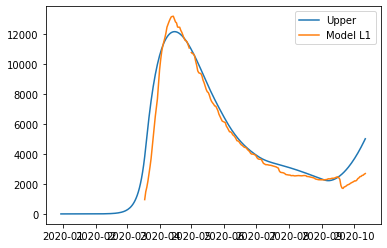

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.10160382329182288, 'other': 0.11130545638802555, 'school': 0.02635347307445489, 'transport': 0.45511970241500976, 'work': 0.24828235464474066}
June1-June30 {'home': 1.0, 'leisure': 0.1616825738614689, 'other': 0.11283842462557592, 'school': 0.49608764770455593, 'transport': 0.6707467007867953, 'work': 0.24828235464474066}
July1-Aug31 {'home': 1.0, 'leisure': 0.1616825738614689, 'other': 0.11283842462557592, 'school': 0.49608764770455593, 'transport': 0.6707467007867953, 'work': 0.24828235464474066}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6392368586930791, 'other': 0.37892533654904825, 'school': 0.7863673944089495, 'transport': 0.7967613448796816, 'work': 0.6791349882702793}
alpha1 0.3 alpha2 0.7
8662.4775917373

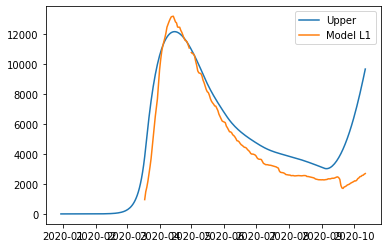

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.06735435731265092, 'other': 0.18590413109550896, 'school': 0.008854945841055834, 'transport': 0.4907322052578551, 'work': 0.2925126830014568}
June1-June30 {'home': 1.0, 'leisure': 0.13424594238812704, 'other': 0.25709178276242456, 'school': 0.2520235776943855, 'transport': 0.6790739804424195, 'work': 0.2925126830014568}
July1-Aug31 {'home': 1.0, 'leisure': 0.13424594238812704, 'other': 0.25709178276242456, 'school': 0.2520235776943855, 'transport': 0.6790739804424195, 'work': 0.2925126830014568}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5040924687750602, 'other': 0.757665213562793, 'school': 0.9246041190459102, 'transport': 0.926958242036216, 'work': 0.7772566520317024}
alpha1 0.3 alpha2 0.7


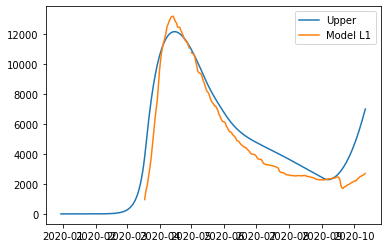

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.06643569187436352, 'other': 0.23583448230339973, 'school': 0.05174299812673553, 'transport': 0.39020916345450296, 'work': 0.23445688149312355}
June1-June30 {'home': 1.0, 'leisure': 0.12885047533378924, 'other': 0.27975320902792233, 'school': 0.45653033758452904, 'transport': 0.6387627622109519, 'work': 0.23445688149312355}
July1-Aug31 {'home': 1.0, 'leisure': 0.12885047533378924, 'other': 0.27975320902792233, 'school': 0.45653033758452904, 'transport': 0.6387627622109519, 'work': 0.23445688149312355}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7213630751224288, 'other': 0.5801710826564958, 'school': 0.7679215177849894, 'transport': 0.8658123959021176, 'work': 0.7679444928150698}
alpha1 0.3 alpha2 0.7


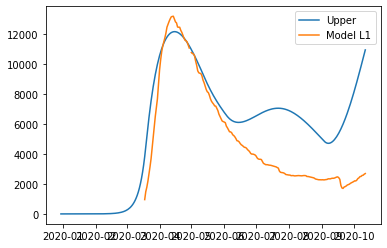

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.09616486396979942, 'other': 0.15459895570004242, 'school': 0.31514342169201787, 'transport': 0.5870522599436445, 'work': 0.23408961882154755}
June1-June30 {'home': 1.0, 'leisure': 0.27358218950567215, 'other': 0.33768186005770684, 'school': 0.6511449689058547, 'transport': 0.720484290770059, 'work': 0.23408961882154755}
July1-Aug31 {'home': 1.0, 'leisure': 0.27358218950567215, 'other': 0.33768186005770684, 'school': 0.6511449689058547, 'transport': 0.720484290770059, 'work': 0.23408961882154755}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6386600421490575, 'other': 0.8839693689128998, 'school': 0.8463165991699675, 'transport': 0.910909843332676, 'work': 0.773908841734753}
alpha1 0.3 alpha2 0.7
7438.848087806464
err

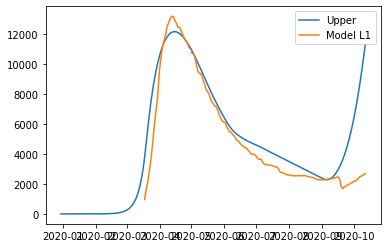

error_total 1073.93694398448
[0.09526692 0.02515089 0.36856393 0.9082334  0.24083346 0.01740155
 0.96168491 0.08179651 0.0124098  0.06763175 0.98564891 0.84140088
 0.3772736  0.70245894 0.85302384 0.22787872 0.16750592 0.21057286
 0.70117684 0.88470763]Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}

March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.12604316436790464, 'other': 0.10631524260626195, 'school': 0.12745821625942133, 'transport': 0.3462675341563096, 'work': 0.22743752931821734}
June1-June30 {'home': 1.0, 'leisure': 0.1670325916896906, 'other': 0.31783756814684816, 'school': 0.22083253180221846, 'transport': 0.7019417780250672, 'work': 0.22743752931821734}
July1-Aug31 {'home': 1.0, 'leisure': 0.1670325916896906, 'other': 0.31783756814684816, 'school': 0.22083253180221846, 'transport': 0.701941778

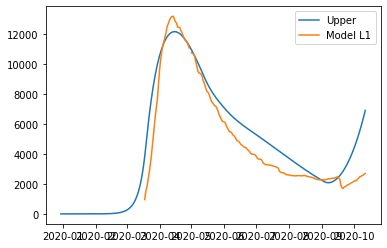

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.12999716403549222, 'other': 0.26651101395140997, 'school': 0.15520504848807004, 'transport': 0.40414746114777056, 'work': 0.22080181993870773}
June1-June30 {'home': 1.0, 'leisure': 0.1468037816806813, 'other': 0.2785423521939647, 'school': 0.35031439828096395, 'transport': 0.6388513859149728, 'work': 0.22080181993870773}
July1-Aug31 {'home': 1.0, 'leisure': 0.1468037816806813, 'other': 0.2785423521939647, 'school': 0.35031439828096395, 'transport': 0.6388513859149728, 'work': 0.22080181993870773}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3930898150028658, 'other': 0.9434463194205185, 'school': 0.8505884204798618, 'transport': 0.9238617001019857, 'work': 0.7779571745630358}
alpha1 0.3 alpha2 0.7
5135.263422910467


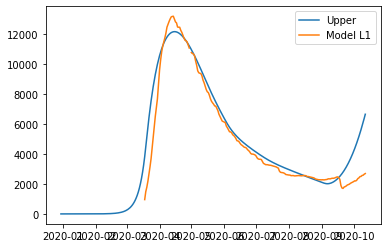

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07858784055251525, 'other': 0.10420091488797883, 'school': 0.12268961564033673, 'transport': 0.3808716462394884, 'work': 0.2547858913201126}
June1-June30 {'home': 1.0, 'leisure': 0.13025005693601452, 'other': 0.25053631226524664, 'school': 0.16487129610956322, 'transport': 0.6796058693292081, 'work': 0.2547858913201126}
July1-Aug31 {'home': 1.0, 'leisure': 0.13025005693601452, 'other': 0.25053631226524664, 'school': 0.16487129610956322, 'transport': 0.6796058693292081, 'work': 0.2547858913201126}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6608967710712299, 'other': 0.5295195794828668, 'school': 0.842040205975158, 'transport': 0.8907930162228476, 'work': 0.7869501094194706}
alpha1 0.3 alpha2 0.7
9058.42347158663
er

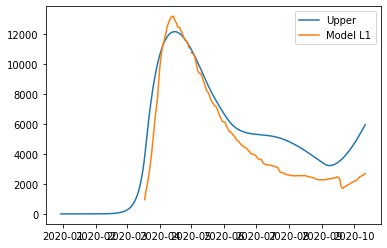

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08884597645396736, 'other': 0.17810293903967875, 'school': 0.16551454206065244, 'transport': 0.36639565128520235, 'work': 0.24094347786294557}
June1-June30 {'home': 1.0, 'leisure': 0.16765655797057996, 'other': 0.3144503761277282, 'school': 0.6376948815308517, 'transport': 0.5553692636927864, 'work': 0.24094347786294557}
July1-Aug31 {'home': 1.0, 'leisure': 0.16765655797057996, 'other': 0.3144503761277282, 'school': 0.6376948815308517, 'transport': 0.5553692636927864, 'work': 0.24094347786294557}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5043697315958554, 'other': 0.5265416863954863, 'school': 0.8352903490730235, 'transport': 0.8174652959516988, 'work': 0.7215039895778842}
alpha1 0.3 alpha2 0.7


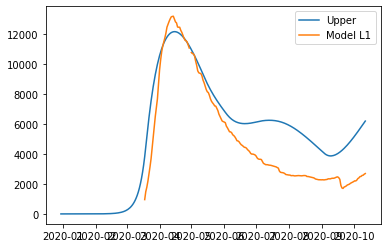

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08487262974216259, 'other': 0.2281219264893807, 'school': 0.19879560778974323, 'transport': 0.3569998664107538, 'work': 0.2484000618740775}
June1-June30 {'home': 1.0, 'leisure': 0.17853024133001166, 'other': 0.3698202529490663, 'school': 0.6995448979072796, 'transport': 0.5310994642751814, 'work': 0.2484000618740775}
July1-Aug31 {'home': 1.0, 'leisure': 0.17853024133001166, 'other': 0.3698202529490663, 'school': 0.6995448979072796, 'transport': 0.5310994642751814, 'work': 0.2484000618740775}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.4831703996199498, 'other': 0.4611630213104001, 'school': 0.6852663449849667, 'transport': 0.7880221660118202, 'work': 0.907122582533805}
alpha1 0.3 alpha2 0.7


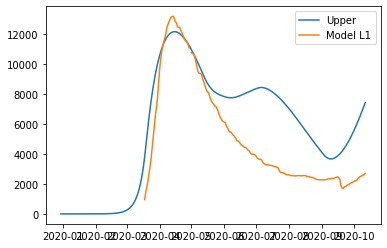

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.13672053060331057, 'other': 0.4272285440154585, 'school': 0.23896145775075273, 'transport': 0.30907456095482094, 'work': 0.2377530154244463}
June1-June30 {'home': 1.0, 'leisure': 0.18223678207020738, 'other': 0.4973957499261553, 'school': 0.5343546320586179, 'transport': 0.49570243237400047, 'work': 0.2377530154244463}
July1-Aug31 {'home': 1.0, 'leisure': 0.18223678207020738, 'other': 0.4973957499261553, 'school': 0.5343546320586179, 'transport': 0.49570243237400047, 'work': 0.2377530154244463}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6843533625405744, 'other': 0.8195540048434027, 'school': 0.9652434345552375, 'transport': 0.7082559291931902, 'work': 0.7356397499412914}
alpha1 0.3 alpha2 0.7
11738.237861906458
e

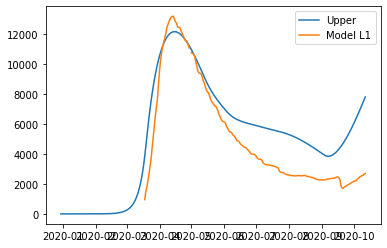

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.11355236389133319, 'other': 0.19301392865755249, 'school': 0.2052989217887214, 'transport': 0.47879502051257355, 'work': 0.29112279787900464}
June1-June30 {'home': 1.0, 'leisure': 0.14479993645528433, 'other': 0.3036653176058509, 'school': 0.4643555184447115, 'transport': 0.6670743520297449, 'work': 0.29112279787900464}
July1-Aug31 {'home': 1.0, 'leisure': 0.14479993645528433, 'other': 0.3036653176058509, 'school': 0.4643555184447115, 'transport': 0.6670743520297449, 'work': 0.29112279787900464}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5637477389640058, 'other': 0.6946354752654321, 'school': 0.7238960098569823, 'transport': 0.8551702968980293, 'work': 0.6834443020342498}
alpha1 0.3 alpha2 0.7


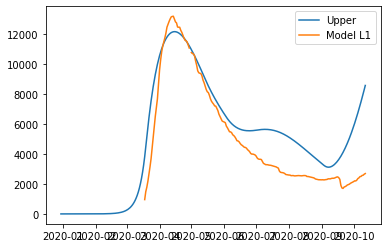

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08564488814811316, 'other': 0.1785823579101831, 'school': 0.19183275427099375, 'transport': 0.45628500175958986, 'work': 0.22661207712369846}
June1-June30 {'home': 1.0, 'leisure': 0.13025972715748313, 'other': 0.33812157023162565, 'school': 0.8261490724406735, 'transport': 0.6313947108665465, 'work': 0.22661207712369846}
July1-Aug31 {'home': 1.0, 'leisure': 0.13025972715748313, 'other': 0.33812157023162565, 'school': 0.8261490724406735, 'transport': 0.6313947108665465, 'work': 0.22661207712369846}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6429710526861194, 'other': 0.7140961150099021, 'school': 0.6187310566482311, 'transport': 0.8396913624937656, 'work': 0.9005756983683271}
alpha1 0.3 alpha2 0.7
9147.28811347481


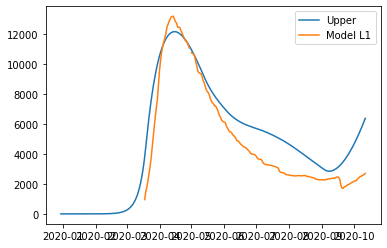

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07778390678256569, 'other': 0.24382662609379951, 'school': 0.1815335240128108, 'transport': 0.5462049899963622, 'work': 0.2612361097590436}
June1-June30 {'home': 1.0, 'leisure': 0.08336218804645042, 'other': 0.30672037742887936, 'school': 0.6151441323052136, 'transport': 0.7208995284545219, 'work': 0.2612361097590436}
July1-Aug31 {'home': 1.0, 'leisure': 0.08336218804645042, 'other': 0.30672037742887936, 'school': 0.6151441323052136, 'transport': 0.7208995284545219, 'work': 0.2612361097590436}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5325009729302044, 'other': 0.4732609292293468, 'school': 0.8288318183036324, 'transport': 0.8724500402859677, 'work': 0.949614308401608}
alpha1 0.3 alpha2 0.7
6613.985944785616
erro

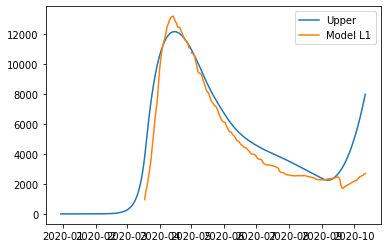

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07771522928841604, 'other': 0.2109338367591827, 'school': 0.044536796873235605, 'transport': 0.440273561034326, 'work': 0.2327993734034502}
June1-June30 {'home': 1.0, 'leisure': 0.13921337126455602, 'other': 0.2268263004131086, 'school': 0.48823346383858335, 'transport': 0.6876777966066637, 'work': 0.2327993734034502}
July1-Aug31 {'home': 1.0, 'leisure': 0.13921337126455602, 'other': 0.2268263004131086, 'school': 0.48823346383858335, 'transport': 0.6876777966066637, 'work': 0.2327993734034502}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.8579508351030941, 'other': 0.6503574582125532, 'school': 0.9050382472430519, 'transport': 0.7403036631831132, 'work': 0.6481067435750845}
alpha1 0.3 alpha2 0.7
12256.391127004696
er

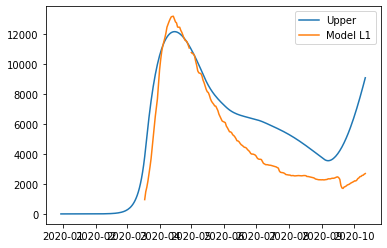

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.09083375838346908, 'other': 0.26013300920078525, 'school': 0.21786964248088117, 'transport': 0.4628300227034542, 'work': 0.2963549187300828}
June1-June30 {'home': 1.0, 'leisure': 0.09099565445284968, 'other': 0.3775591844475642, 'school': 0.4722123963894562, 'transport': 0.521423941860272, 'work': 0.2963549187300828}
July1-Aug31 {'home': 1.0, 'leisure': 0.09099565445284968, 'other': 0.3775591844475642, 'school': 0.4722123963894562, 'transport': 0.521423941860272, 'work': 0.2963549187300828}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7124218735241394, 'other': 0.7013848372128729, 'school': 0.9212944353942495, 'transport': 0.7449346347303163, 'work': 0.7561466342181479}
alpha1 0.3 alpha2 0.7
10189.843438996617
error

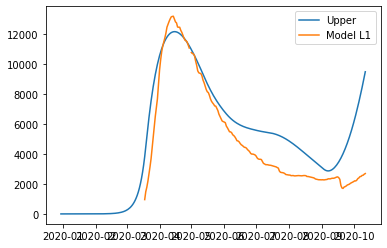

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.10529589190920735, 'other': 0.1551727397189821, 'school': 0.5402917094050794, 'transport': 0.36936351955158975, 'work': 0.24031212036300847}
June1-June30 {'home': 1.0, 'leisure': 0.13544602551685925, 'other': 0.17468981625505825, 'school': 0.8950844139480022, 'transport': 0.5343014741378583, 'work': 0.24031212036300847}
July1-Aug31 {'home': 1.0, 'leisure': 0.13544602551685925, 'other': 0.17468981625505825, 'school': 0.8950844139480022, 'transport': 0.5343014741378583, 'work': 0.24031212036300847}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7335853957289501, 'other': 0.8431922664381433, 'school': 0.5904254564572998, 'transport': 0.6997834177957789, 'work': 0.9063935818376643}
alpha1 0.3 alpha2 0.7


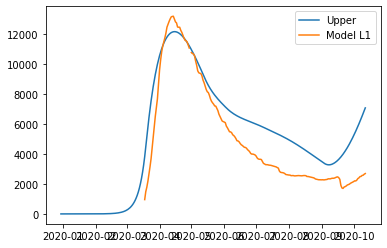

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.136149991953456, 'other': 0.258295091637245, 'school': 0.12441325116434122, 'transport': 0.455755300667404, 'work': 0.26668650370523755}
June1-June30 {'home': 1.0, 'leisure': 0.15685269918176398, 'other': 0.3164784414635191, 'school': 0.3844989025967146, 'transport': 0.6676786383572517, 'work': 0.26668650370523755}
July1-Aug31 {'home': 1.0, 'leisure': 0.15685269918176398, 'other': 0.3164784414635191, 'school': 0.3844989025967146, 'transport': 0.6676786383572517, 'work': 0.26668650370523755}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.4570174930313876, 'other': 0.6591291529724072, 'school': 0.9391622882477431, 'transport': 0.8172413653947804, 'work': 0.7945466398101135}
alpha1 0.3 alpha2 0.7


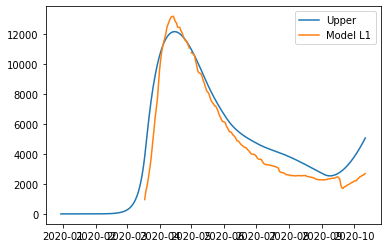

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.1294216494257271, 'other': 0.11512311388390215, 'school': 0.24960916528057878, 'transport': 0.40305893616637045, 'work': 0.24699316463340648}
June1-June30 {'home': 1.0, 'leisure': 0.16305073711769102, 'other': 0.2090285446247106, 'school': 0.5066543115842772, 'transport': 0.5119064490512732, 'work': 0.24699316463340648}
July1-Aug31 {'home': 1.0, 'leisure': 0.16305073711769102, 'other': 0.2090285446247106, 'school': 0.5066543115842772, 'transport': 0.5119064490512732, 'work': 0.24699316463340648}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7109895828397684, 'other': 0.20914014334485753, 'school': 0.9206916572262482, 'transport': 0.8575662194738938, 'work': 0.7845108687616397}
alpha1 0.3 alpha2 0.7
9902.255730649415


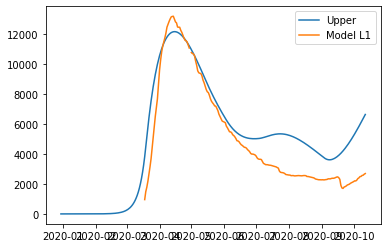

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.11761798024157415, 'other': 0.13182996440025566, 'school': 0.21627316040175446, 'transport': 0.29855612614117844, 'work': 0.2218483853943286}
June1-June30 {'home': 1.0, 'leisure': 0.23564285950824243, 'other': 0.16843601662389904, 'school': 0.9553497747033539, 'transport': 0.522065283004716, 'work': 0.2218483853943286}
July1-Aug31 {'home': 1.0, 'leisure': 0.23564285950824243, 'other': 0.16843601662389904, 'school': 0.9553497747033539, 'transport': 0.522065283004716, 'work': 0.2218483853943286}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.693714915964663, 'other': 0.3671467638637036, 'school': 0.5230529043749101, 'transport': 0.7893451267428383, 'work': 0.8907282863870285}
alpha1 0.3 alpha2 0.7
11207.075418303579
err

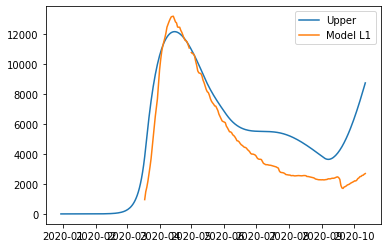

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.06646118133452596, 'other': 0.23952418151609756, 'school': 0.050449817781396025, 'transport': 0.40280734175428234, 'work': 0.25866928853484694}
June1-June30 {'home': 1.0, 'leisure': 0.1449646130667096, 'other': 0.3104210957338016, 'school': 0.7152888037849463, 'transport': 0.6416407249944658, 'work': 0.25866928853484694}
July1-Aug31 {'home': 1.0, 'leisure': 0.1449646130667096, 'other': 0.3104210957338016, 'school': 0.7152888037849463, 'transport': 0.6416407249944658, 'work': 0.25866928853484694}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.8902090864085722, 'other': 0.34771022481118763, 'school': 0.6888192833312264, 'transport': 0.8577461486168072, 'work': 0.9326453480102791}
alpha1 0.3 alpha2 0.7
6823.109942084002


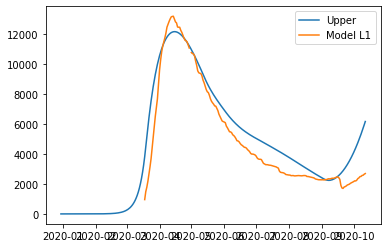

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07352378080949917, 'other': 0.272341312030465, 'school': 0.05338631147514902, 'transport': 0.4417104769901925, 'work': 0.2327993734034502}
June1-June30 {'home': 1.0, 'leisure': 0.11236796480231531, 'other': 0.2803057260534298, 'school': 0.5061480436942967, 'transport': 0.6635531346720213, 'work': 0.2327993734034502}
July1-Aug31 {'home': 1.0, 'leisure': 0.11236796480231531, 'other': 0.2803057260534298, 'school': 0.5061480436942967, 'transport': 0.6635531346720213, 'work': 0.2327993734034502}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5663454247832383, 'other': 0.5915525034544621, 'school': 0.8830340500518057, 'transport': 0.7166452671894309, 'work': 0.8393022743257637}
alpha1 0.3 alpha2 0.7
8440.93882690766
error_g

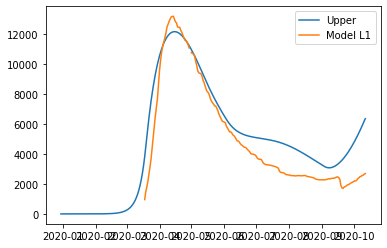

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.1344265898967304, 'other': 0.11344022763214623, 'school': 0.14101498177510194, 'transport': 0.48981204590749094, 'work': 0.22480886200181285}
June1-June30 {'home': 1.0, 'leisure': 0.21483769075389123, 'other': 0.2842582757795177, 'school': 0.5115899658549541, 'transport': 0.6482970168878455, 'work': 0.22480886200181285}
July1-Aug31 {'home': 1.0, 'leisure': 0.21483769075389123, 'other': 0.2842582757795177, 'school': 0.5115899658549541, 'transport': 0.6482970168878455, 'work': 0.22480886200181285}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.4862590806469512, 'other': 0.5905020239989419, 'school': 0.9729825609599607, 'transport': 0.7899972705338997, 'work': 0.6900778318917372}
alpha1 0.3 alpha2 0.7


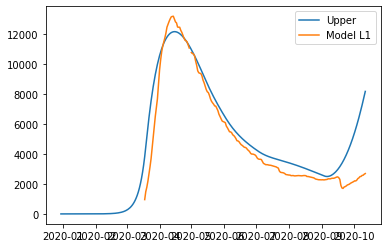

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.10228086474271435, 'other': 0.11477063157120403, 'school': 0.1690620259168497, 'transport': 0.43127940254552316, 'work': 0.2629125622416315}
June1-June30 {'home': 1.0, 'leisure': 0.16555678833665324, 'other': 0.14619028627307035, 'school': 0.4384028203336597, 'transport': 0.5401580930147426, 'work': 0.2629125622416315}
July1-Aug31 {'home': 1.0, 'leisure': 0.16555678833665324, 'other': 0.14619028627307035, 'school': 0.4384028203336597, 'transport': 0.5401580930147426, 'work': 0.2629125622416315}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7801728410135552, 'other': 0.5764490727321289, 'school': 0.8833344654315386, 'transport': 0.7078898623456665, 'work': 0.7190801444700543}
alpha1 0.3 alpha2 0.7


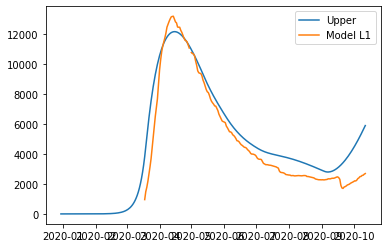

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.09131318753519842, 'other': 0.15982809546475596, 'school': 0.008581120525914063, 'transport': 0.47604690703289043, 'work': 0.2745333897870353}
June1-June30 {'home': 1.0, 'leisure': 0.13418581789988013, 'other': 0.16955870036245532, 'school': 0.5323380607336458, 'transport': 0.6645037608682662, 'work': 0.2745333897870353}
July1-Aug31 {'home': 1.0, 'leisure': 0.13418581789988013, 'other': 0.16955870036245532, 'school': 0.5323380607336458, 'transport': 0.6645037608682662, 'work': 0.2745333897870353}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5143319883561909, 'other': 0.4703916576618814, 'school': 0.8139998475888741, 'transport': 0.8290470420696322, 'work': 0.7197529939536152}
alpha1 0.3 alpha2 0.7
9388.97434105821
e

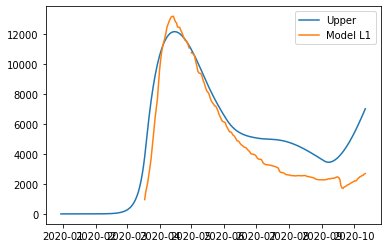

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08823734130928458, 'other': 0.11710376588226992, 'school': 0.21242326345237955, 'transport': 0.5668411013798487, 'work': 0.23727954566104575}
June1-June30 {'home': 1.0, 'leisure': 0.22830825250400227, 'other': 0.21282857561427532, 'school': 0.5586876881855434, 'transport': 0.7978748177970001, 'work': 0.23727954566104575}
July1-Aug31 {'home': 1.0, 'leisure': 0.22830825250400227, 'other': 0.21282857561427532, 'school': 0.5586876881855434, 'transport': 0.7978748177970001, 'work': 0.23727954566104575}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.587818534616376, 'other': 0.49600677940212967, 'school': 0.7381715315232914, 'transport': 0.9693816253476689, 'work': 0.7674616524012585}
alpha1 0.3 alpha2 0.7


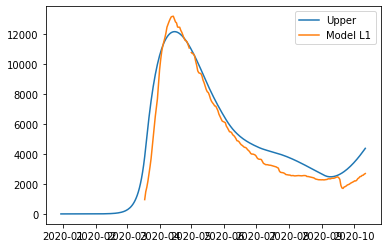

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08586275846311898, 'other': 0.11526583889821397, 'school': 0.23397909897288183, 'transport': 0.4710546991967587, 'work': 0.23508516170235563}
June1-June30 {'home': 1.0, 'leisure': 0.1663099934369187, 'other': 0.1734578786599793, 'school': 0.5999377536879091, 'transport': 0.647458548351161, 'work': 0.23508516170235563}
July1-Aug31 {'home': 1.0, 'leisure': 0.1663099934369187, 'other': 0.1734578786599793, 'school': 0.5999377536879091, 'transport': 0.647458548351161, 'work': 0.23508516170235563}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7285649231851834, 'other': 0.2088514399765996, 'school': 0.7563432533648775, 'transport': 0.7333925889600619, 'work': 0.7072260481068029}
alpha1 0.3 alpha2 0.7
10874.141083204235
erro

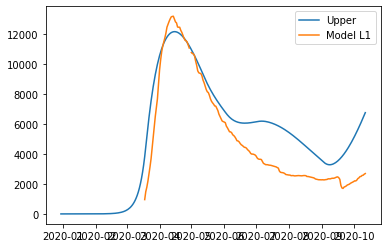

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07595327286232524, 'other': 0.23896741094525, 'school': 0.20621325621496736, 'transport': 0.3538863591918263, 'work': 0.24413837527585983}
June1-June30 {'home': 1.0, 'leisure': 0.11317188991393845, 'other': 0.4231947670524917, 'school': 0.6540668309269676, 'transport': 0.6253178827843234, 'work': 0.24413837527585983}
July1-Aug31 {'home': 1.0, 'leisure': 0.11317188991393845, 'other': 0.4231947670524917, 'school': 0.6540668309269676, 'transport': 0.6253178827843234, 'work': 0.24413837527585983}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6276523355699017, 'other': 0.6434040644251784, 'school': 0.6901822935459034, 'transport': 0.9548388243232729, 'work': 0.7041948765994538}
alpha1 0.3 alpha2 0.7


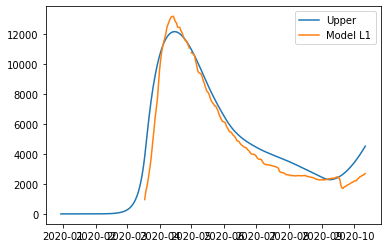

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.09725879852998945, 'other': 0.11129897229674669, 'school': 0.1637740762050409, 'transport': 0.4730399635328833, 'work': 0.24699316463340648}
June1-June30 {'home': 1.0, 'leisure': 0.12444887197030025, 'other': 0.21479286968654437, 'school': 0.4883073027945452, 'transport': 0.693729249047177, 'work': 0.24699316463340648}
July1-Aug31 {'home': 1.0, 'leisure': 0.12444887197030025, 'other': 0.21479286968654437, 'school': 0.4883073027945452, 'transport': 0.693729249047177, 'work': 0.24699316463340648}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5433641531710844, 'other': 0.21487624871647004, 'school': 0.8336784313583673, 'transport': 0.8085992416696042, 'work': 0.9064370678669064}
alpha1 0.3 alpha2 0.7
9356.68440908698
er

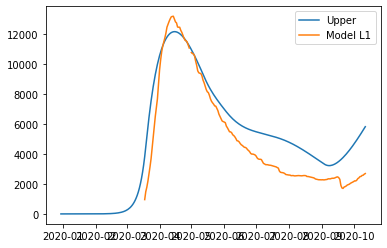

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.0825310329938242, 'other': 0.24366992989238584, 'school': 0.05523836617018717, 'transport': 0.45640472930297915, 'work': 0.27789745339075145}
June1-June30 {'home': 1.0, 'leisure': 0.08263805780183231, 'other': 0.29466042712488905, 'school': 0.687783974034828, 'transport': 0.6503132574505515, 'work': 0.27789745339075145}
July1-Aug31 {'home': 1.0, 'leisure': 0.08263805780183231, 'other': 0.29466042712488905, 'school': 0.687783974034828, 'transport': 0.6503132574505515, 'work': 0.27789745339075145}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5261578905201398, 'other': 0.6068367204653532, 'school': 0.6002095827059549, 'transport': 0.7598107443391328, 'work': 0.6627583891622753}
alpha1 0.3 alpha2 0.7
8969.114209426552
e

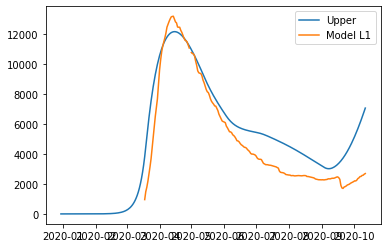

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07985228528237973, 'other': 0.19696016740023284, 'school': 0.14135640668133967, 'transport': 0.2846306663330245, 'work': 0.2717304495092847}
June1-June30 {'home': 1.0, 'leisure': 0.08455564724462816, 'other': 0.40912467721799395, 'school': 0.4184153782557579, 'transport': 0.6015870828277208, 'work': 0.2717304495092847}
July1-Aug31 {'home': 1.0, 'leisure': 0.08455564724462816, 'other': 0.40912467721799395, 'school': 0.4184153782557579, 'transport': 0.6015870828277208, 'work': 0.2717304495092847}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7043088268549135, 'other': 0.44453026605037615, 'school': 0.9821530325063217, 'transport': 0.6323651141176893, 'work': 0.7897564914060797}
alpha1 0.3 alpha2 0.7
6343.868602930381
e

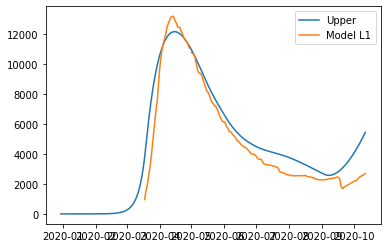

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.09568877775955024, 'other': 0.17899977659412514, 'school': 0.031659176092123334, 'transport': 0.35047307783972703, 'work': 0.24830168365613225}
June1-June30 {'home': 1.0, 'leisure': 0.132477439776634, 'other': 0.20477206657069066, 'school': 0.6465643484758036, 'transport': 0.5865434862961129, 'work': 0.24830168365613225}
July1-Aug31 {'home': 1.0, 'leisure': 0.132477439776634, 'other': 0.20477206657069066, 'school': 0.6465643484758036, 'transport': 0.5865434862961129, 'work': 0.24830168365613225}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5689550461408817, 'other': 0.4143066783945768, 'school': 0.7572637638323365, 'transport': 0.7499217513622206, 'work': 0.7832873071993762}
alpha1 0.3 alpha2 0.7
9826.912907396521
e

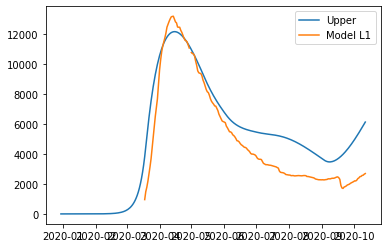

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08435537764353947, 'other': 0.15150660677686062, 'school': 0.33035768488636963, 'transport': 0.44342557959962375, 'work': 0.27413695572166275}
June1-June30 {'home': 1.0, 'leisure': 0.1400089131986351, 'other': 0.24530591016407655, 'school': 0.6770393233467068, 'transport': 0.5769651650924317, 'work': 0.27413695572166275}
July1-Aug31 {'home': 1.0, 'leisure': 0.1400089131986351, 'other': 0.24530591016407655, 'school': 0.6770393233467068, 'transport': 0.5769651650924317, 'work': 0.27413695572166275}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6388213178227063, 'other': 0.3796392289005963, 'school': 0.766441469067789, 'transport': 0.7837412251238813, 'work': 0.7943230810607684}
alpha1 0.3 alpha2 0.7
5967.093407698815
e

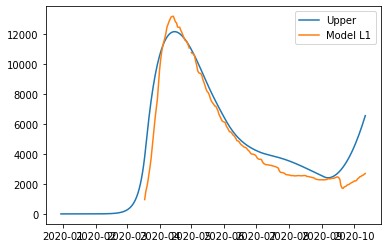

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.10813869888714994, 'other': 0.13564731145247666, 'school': 0.011291004783222175, 'transport': 0.39490830997560433, 'work': 0.2248191981669561}
June1-June30 {'home': 1.0, 'leisure': 0.17615230697197043, 'other': 0.18192588439947466, 'school': 0.6113502236412236, 'transport': 0.6330484080614099, 'work': 0.2248191981669561}
July1-Aug31 {'home': 1.0, 'leisure': 0.17615230697197043, 'other': 0.18192588439947466, 'school': 0.6113502236412236, 'transport': 0.6330484080614099, 'work': 0.2248191981669561}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.877687556259449, 'other': 0.5091227894451977, 'school': 0.8213454197697694, 'transport': 0.7739819686895033, 'work': 0.5264623492840669}
alpha1 0.3 alpha2 0.7
6355.872631847811
e

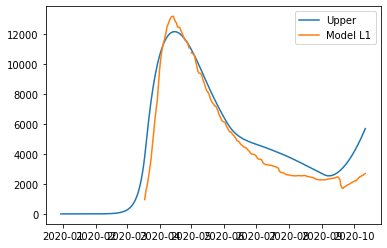

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08315131068471057, 'other': 0.12206183770467993, 'school': 0.1078931164939469, 'transport': 0.452829320866784, 'work': 0.22761167763466755}
June1-June30 {'home': 1.0, 'leisure': 0.17810026948358998, 'other': 0.31005790754186824, 'school': 0.3446882999042008, 'transport': 0.6956857836010439, 'work': 0.22761167763466755}
July1-Aug31 {'home': 1.0, 'leisure': 0.17810026948358998, 'other': 0.31005790754186824, 'school': 0.3446882999042008, 'transport': 0.6956857836010439, 'work': 0.22761167763466755}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6661670756058157, 'other': 0.3942871431493157, 'school': 0.7140904592034805, 'transport': 0.7378535390792613, 'work': 0.7800573479658877}
alpha1 0.3 alpha2 0.7
6681.61432299915
er

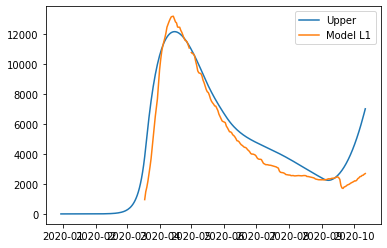

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.06871576319160513, 'other': 0.1785617059540185, 'school': 0.18336159103750055, 'transport': 0.4855898435077528, 'work': 0.24013692924684799}
June1-June30 {'home': 1.0, 'leisure': 0.09479514025080989, 'other': 0.2529598758062941, 'school': 0.5832092624836764, 'transport': 0.6498144830457118, 'work': 0.24013692924684799}
July1-Aug31 {'home': 1.0, 'leisure': 0.09479514025080989, 'other': 0.2529598758062941, 'school': 0.5832092624836764, 'transport': 0.6498144830457118, 'work': 0.24013692924684799}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.734568084145272, 'other': 0.6485323823999819, 'school': 0.937335947057975, 'transport': 0.7793323054051386, 'work': 0.6714086104185482}
alpha1 0.3 alpha2 0.7
5360.417281802622
erro

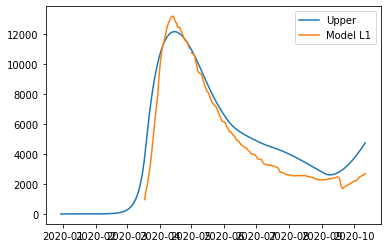

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.10523212154312157, 'other': 0.12018133423427589, 'school': 0.4413545678261821, 'transport': 0.31142134222315854, 'work': 0.2297876494627513}
June1-June30 {'home': 1.0, 'leisure': 0.22050028292784427, 'other': 0.179497224233795, 'school': 0.4500661571305568, 'transport': 0.5735219711939749, 'work': 0.2297876494627513}
July1-Aug31 {'home': 1.0, 'leisure': 0.22050028292784427, 'other': 0.179497224233795, 'school': 0.4500661571305568, 'transport': 0.5735219711939749, 'work': 0.2297876494627513}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5368942920817963, 'other': 0.5426436079963984, 'school': 0.8060266941908478, 'transport': 0.6753430311593356, 'work': 0.5875323807235476}
alpha1 0.3 alpha2 0.7


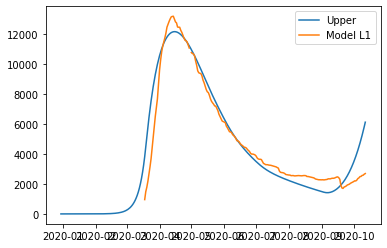

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.09699926090727481, 'other': 0.10141334459689562, 'school': 0.02613918910791549, 'transport': 0.45793340104679536, 'work': 0.23118540484761804}
June1-June30 {'home': 1.0, 'leisure': 0.162569326104479, 'other': 0.11184760357907317, 'school': 0.17257036323750605, 'transport': 0.6415224337507512, 'work': 0.23118540484761804}
July1-Aug31 {'home': 1.0, 'leisure': 0.162569326104479, 'other': 0.11184760357907317, 'school': 0.17257036323750605, 'transport': 0.6415224337507512, 'work': 0.23118540484761804}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6868739689936968, 'other': 0.5505965946288122, 'school': 0.8833344654315386, 'transport': 0.6534058080539418, 'work': 0.9097615396792149}
alpha1 0.3 alpha2 0.7
8502.30427594994
e

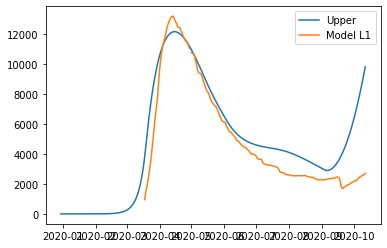

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07303294712213149, 'other': 0.15547444748020647, 'school': 0.06547192277061936, 'transport': 0.3594479780663574, 'work': 0.2529987963583382}
June1-June30 {'home': 1.0, 'leisure': 0.1227690266153939, 'other': 0.24775780389363128, 'school': 0.7221870850572958, 'transport': 0.5499439585725079, 'work': 0.2529987963583382}
July1-Aug31 {'home': 1.0, 'leisure': 0.1227690266153939, 'other': 0.24775780389363128, 'school': 0.7221870850572958, 'transport': 0.5499439585725079, 'work': 0.2529987963583382}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.9235154845733204, 'other': 0.5393707827990245, 'school': 0.7020971877503399, 'transport': 0.7035848567431415, 'work': 0.8329474869836728}
alpha1 0.3 alpha2 0.7
6313.208411693603
erro

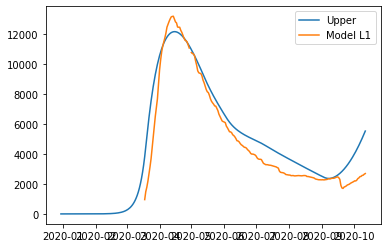

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.06809570163954137, 'other': 0.20163835807757394, 'school': 0.02832374306079396, 'transport': 0.4122348873669601, 'work': 0.2452289483117829}
June1-June30 {'home': 1.0, 'leisure': 0.12702392736885904, 'other': 0.384630154268533, 'school': 0.18761752422939235, 'transport': 0.6254948819356182, 'work': 0.2452289483117829}
July1-Aug31 {'home': 1.0, 'leisure': 0.12702392736885904, 'other': 0.384630154268533, 'school': 0.18761752422939235, 'transport': 0.6254948819356182, 'work': 0.2452289483117829}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3472034446194233, 'other': 0.6509957527560585, 'school': 0.9433583607475388, 'transport': 0.724040312753665, 'work': 0.7531708391037067}
alpha1 0.3 alpha2 0.7


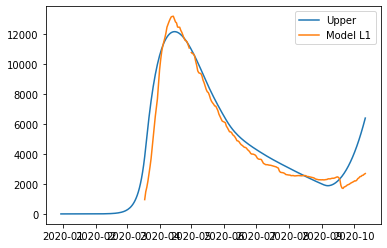

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.11813981312360461, 'other': 0.14837473857431194, 'school': 0.08302461973126254, 'transport': 0.31399835401389303, 'work': 0.2201727183993664}
June1-June30 {'home': 1.0, 'leisure': 0.15481412921675558, 'other': 0.24667292664549192, 'school': 0.2768322926979621, 'transport': 0.7110358291211494, 'work': 0.2201727183993664}
July1-Aug31 {'home': 1.0, 'leisure': 0.15481412921675558, 'other': 0.24667292664549192, 'school': 0.2768322926979621, 'transport': 0.7110358291211494, 'work': 0.2201727183993664}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.299322030468942, 'other': 0.7921543507896562, 'school': 0.9543599477389075, 'transport': 0.9990979532099932, 'work': 0.8584395618074064}
alpha1 0.3 alpha2 0.7
5244.64214435808
err

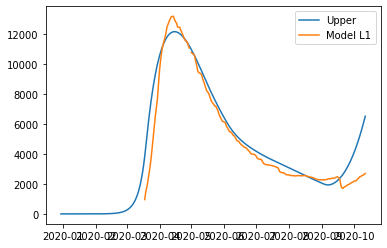

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.10096702305506718, 'other': 0.11352457335675323, 'school': 0.12009652908800499, 'transport': 0.38677621235603427, 'work': 0.23255499976871707}
June1-June30 {'home': 1.0, 'leisure': 0.12008358033187964, 'other': 0.22351768425189283, 'school': 0.4371303788634128, 'transport': 0.6583655390228902, 'work': 0.23255499976871707}
July1-Aug31 {'home': 1.0, 'leisure': 0.12008358033187964, 'other': 0.22351768425189283, 'school': 0.4371303788634128, 'transport': 0.6583655390228902, 'work': 0.23255499976871707}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6833643931853179, 'other': 0.4705288023318356, 'school': 0.9304374826557087, 'transport': 0.7778263092040151, 'work': 0.8867251807492107}
alpha1 0.3 alpha2 0.7
7712.67565139458

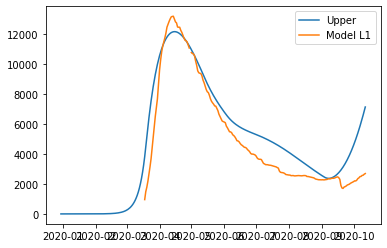

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.10987217347871414, 'other': 0.18162755904271544, 'school': 0.2962244616737416, 'transport': 0.44404929632030365, 'work': 0.2249028865826427}
June1-June30 {'home': 1.0, 'leisure': 0.13433971332650918, 'other': 0.279702011930872, 'school': 0.5522773018172714, 'transport': 0.6249268048980721, 'work': 0.2249028865826427}
July1-Aug31 {'home': 1.0, 'leisure': 0.13433971332650918, 'other': 0.279702011930872, 'school': 0.5522773018172714, 'transport': 0.6249268048980721, 'work': 0.2249028865826427}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7726431547783726, 'other': 0.6441257252097561, 'school': 0.8409105546643365, 'transport': 0.8504537318109998, 'work': 0.7252948287717419}
alpha1 0.3 alpha2 0.7
7540.276775474753
error_

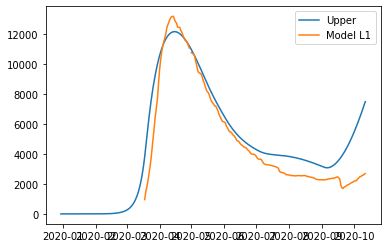

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08076193778243493, 'other': 0.10497829923466909, 'school': 0.10242743305844905, 'transport': 0.5087155880903975, 'work': 0.28039641825743}
June1-June30 {'home': 1.0, 'leisure': 0.15745399999844223, 'other': 0.11184682635830416, 'school': 0.5650584442965565, 'transport': 0.7546498300123761, 'work': 0.28039641825743}
July1-Aug31 {'home': 1.0, 'leisure': 0.15745399999844223, 'other': 0.11184682635830416, 'school': 0.5650584442965565, 'transport': 0.7546498300123761, 'work': 0.28039641825743}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.600718712986252, 'other': 0.44245640521751606, 'school': 0.842040205975158, 'transport': 0.8381766351701386, 'work': 0.8137346326345382}
alpha1 0.3 alpha2 0.7
7375.4238784582985
error_gr

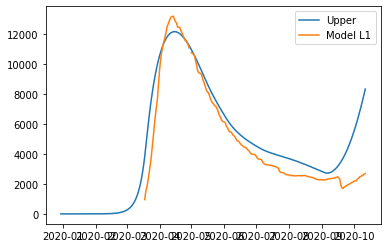

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.14080790080040068, 'other': 0.11784455048991765, 'school': 0.050969493406215545, 'transport': 0.49817019578105803, 'work': 0.24756541823129857}
June1-June30 {'home': 1.0, 'leisure': 0.21094725810687406, 'other': 0.19085832022910376, 'school': 0.3067074342578517, 'transport': 0.7167014704884812, 'work': 0.24756541823129857}
July1-Aug31 {'home': 1.0, 'leisure': 0.21094725810687406, 'other': 0.19085832022910376, 'school': 0.3067074342578517, 'transport': 0.7167014704884812, 'work': 0.24756541823129857}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6710490708366137, 'other': 0.5123673733098608, 'school': 0.962815355863127, 'transport': 0.8542447276070413, 'work': 0.8360249079841708}
alpha1 0.3 alpha2 0.7
5532.58431427731

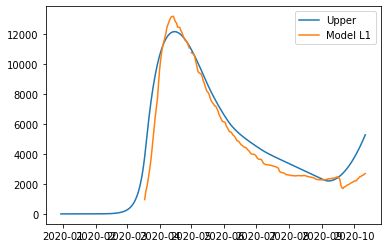

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.09174976598082693, 'other': 0.127622621029391, 'school': 0.231216379627567, 'transport': 0.5555351031443626, 'work': 0.2297876494627513}
June1-June30 {'home': 1.0, 'leisure': 0.19966968788318282, 'other': 0.18645167186368383, 'school': 0.2432048910856382, 'transport': 0.7694791947970336, 'work': 0.2297876494627513}
July1-Aug31 {'home': 1.0, 'leisure': 0.19966968788318282, 'other': 0.18645167186368383, 'school': 0.2432048910856382, 'transport': 0.7694791947970336, 'work': 0.2297876494627513}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5664168558717746, 'other': 0.5466175072044839, 'school': 0.8060266941908478, 'transport': 0.8614626129046539, 'work': 0.6733509182871468}
alpha1 0.3 alpha2 0.7


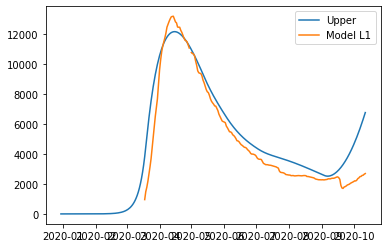

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.13398709303438522, 'other': 0.15982809546475596, 'school': 0.009499406322977084, 'transport': 0.38592853840464214, 'work': 0.25696682345610466}
June1-June30 {'home': 1.0, 'leisure': 0.15432941933388078, 'other': 0.16955870036245532, 'school': 0.4822924617517464, 'transport': 0.6232228413045249, 'work': 0.25696682345610466}
July1-Aug31 {'home': 1.0, 'leisure': 0.15432941933388078, 'other': 0.16955870036245532, 'school': 0.4822924617517464, 'transport': 0.6232228413045249, 'work': 0.25696682345610466}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6816710736729348, 'other': 0.4703916576618814, 'school': 0.8139998475888741, 'transport': 0.8418948209660199, 'work': 0.764988931375082}
alpha1 0.3 alpha2 0.7
5115.21390383401

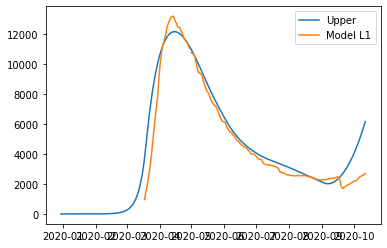

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.10631018283575056, 'other': 0.12142105904196332, 'school': 0.03858485928986686, 'transport': 0.4534095979287824, 'work': 0.23328850630392622}
June1-June30 {'home': 1.0, 'leisure': 0.12966578773836862, 'other': 0.16800205345937613, 'school': 0.5473902172173454, 'transport': 0.665674475576167, 'work': 0.23328850630392622}
July1-Aug31 {'home': 1.0, 'leisure': 0.12966578773836862, 'other': 0.16800205345937613, 'school': 0.5473902172173454, 'transport': 0.665674475576167, 'work': 0.23328850630392622}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5262832890286436, 'other': 0.5957539180307335, 'school': 0.8515977888851479, 'transport': 0.8262702450332085, 'work': 0.8176928361585629}
alpha1 0.3 alpha2 0.7


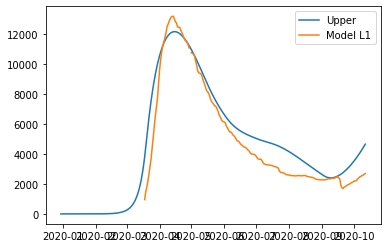

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08651931763098278, 'other': 0.10084362311547941, 'school': 0.5332877079359856, 'transport': 0.4933442745972081, 'work': 0.23508516170235563}
June1-June30 {'home': 1.0, 'leisure': 0.1215309462192684, 'other': 0.1426147251310442, 'school': 0.7871409459619818, 'transport': 0.7028862040023578, 'work': 0.23508516170235563}
July1-Aug31 {'home': 1.0, 'leisure': 0.1215309462192684, 'other': 0.1426147251310442, 'school': 0.7871409459619818, 'transport': 0.7028862040023578, 'work': 0.23508516170235563}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.7026916709128824, 'other': 0.2828552499511379, 'school': 0.6966236552842425, 'transport': 0.8197058887383125, 'work': 0.8528716694109227}
alpha1 0.3 alpha2 0.7
5797.684562077511
erro

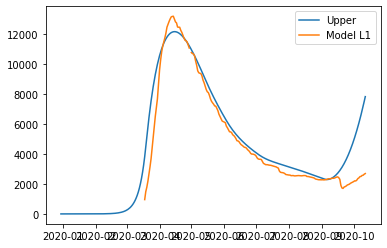

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.09449637854007127, 'other': 0.10786959331861252, 'school': 0.07997100493497895, 'transport': 0.5824588327789058, 'work': 0.24065375331842487}
June1-June30 {'home': 1.0, 'leisure': 0.2172468036325577, 'other': 0.11826662122207263, 'school': 0.2626061068974338, 'transport': 0.7956752053195717, 'work': 0.24065375331842487}
July1-Aug31 {'home': 1.0, 'leisure': 0.2172468036325577, 'other': 0.11826662122207263, 'school': 0.2626061068974338, 'transport': 0.7956752053195717, 'work': 0.24065375331842487}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.801716430990288, 'other': 0.43586528373532696, 'school': 0.8619549192095038, 'transport': 0.9206500962020503, 'work': 0.8162688047455373}
alpha1 0.3 alpha2 0.7
5192.622524374086
e

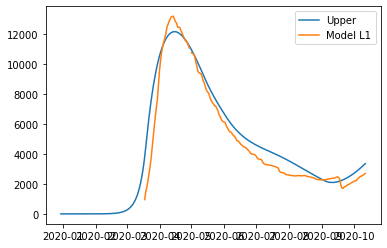

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.11264036875925526, 'other': 0.18555331058858932, 'school': 0.04699963905581855, 'transport': 0.45603896927875154, 'work': 0.22301224080595095}
June1-June30 {'home': 1.0, 'leisure': 0.13069891784773408, 'other': 0.2162001219489813, 'school': 0.5800307023664905, 'transport': 0.7183099295867708, 'work': 0.22301224080595095}
July1-Aug31 {'home': 1.0, 'leisure': 0.13069891784773408, 'other': 0.2162001219489813, 'school': 0.5800307023664905, 'transport': 0.7183099295867708, 'work': 0.22301224080595095}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5253244626180673, 'other': 0.3366725519226663, 'school': 0.7771954153633295, 'transport': 0.9070664705545726, 'work': 0.5948907332985849}
alpha1 0.3 alpha2 0.7


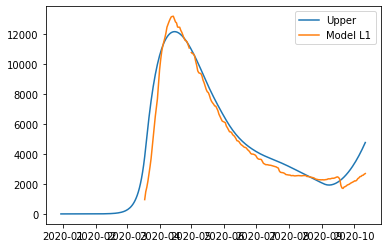

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.06643683579428915, 'other': 0.17738371832022148, 'school': 0.12257677540721543, 'transport': 0.3037375837491247, 'work': 0.2218483853943286}
June1-June30 {'home': 1.0, 'leisure': 0.12308028404493537, 'other': 0.1787115272039176, 'school': 0.6271710139069417, 'transport': 0.6191325089453847, 'work': 0.2218483853943286}
July1-Aug31 {'home': 1.0, 'leisure': 0.12308028404493537, 'other': 0.1787115272039176, 'school': 0.6271710139069417, 'transport': 0.6191325089453847, 'work': 0.2218483853943286}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5711518381477714, 'other': 0.46704054122902583, 'school': 0.7352287248508818, 'transport': 0.7397789103688581, 'work': 0.7963635463089844}
alpha1 0.3 alpha2 0.7
5060.553848862544
err

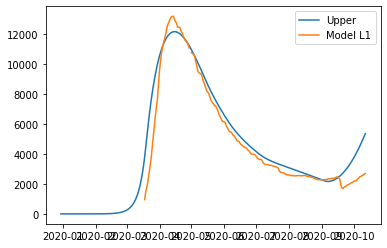

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.11340230967353968, 'other': 0.11698446690226072, 'school': 0.14435794567764254, 'transport': 0.4428938083904465, 'work': 0.2634020108581906}
June1-June30 {'home': 1.0, 'leisure': 0.14617395407930545, 'other': 0.1295026633037301, 'school': 0.3435213652991084, 'transport': 0.6618928760611213, 'work': 0.2634020108581906}
July1-Aug31 {'home': 1.0, 'leisure': 0.14617395407930545, 'other': 0.1295026633037301, 'school': 0.3435213652991084, 'transport': 0.6618928760611213, 'work': 0.2634020108581906}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5091542959989023, 'other': 0.5050848266979766, 'school': 0.9253442349761962, 'transport': 0.7075829086296136, 'work': 0.7356052239977013}
alpha1 0.3 alpha2 0.7
5304.258015601585
erro

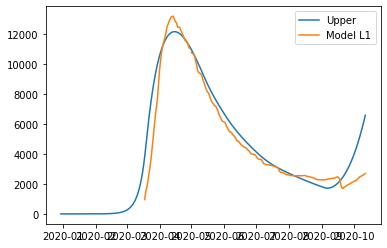

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08648929628640215, 'other': 0.18166900023466487, 'school': 0.0973136714816726, 'transport': 0.3784317705692155, 'work': 0.25723934043671076}
June1-June30 {'home': 1.0, 'leisure': 0.10633978325899815, 'other': 0.18812513040178624, 'school': 0.19642402553201346, 'transport': 0.6486965334779043, 'work': 0.25723934043671076}
July1-Aug31 {'home': 1.0, 'leisure': 0.10633978325899815, 'other': 0.18812513040178624, 'school': 0.19642402553201346, 'transport': 0.6486965334779043, 'work': 0.25723934043671076}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.6360055682400235, 'other': 0.5231230989414934, 'school': 0.829759022227764, 'transport': 0.7965686158668898, 'work': 0.9712502867929035}
alpha1 0.3 alpha2 0.7
5103.249751027368

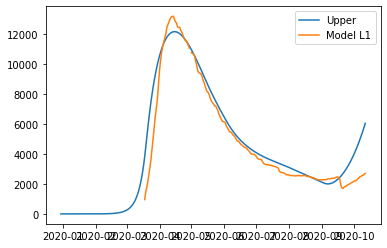

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.06909725258215695, 'other': 0.14863614133972944, 'school': 0.01989588448156006, 'transport': 0.4884556274911155, 'work': 0.23342691097831933}
4084.6695655742215
error_groups 1608.1226468150878
error_total 495.3093837518268
[0.0234086  0.12729546 0.24142496 0.77559799 0.0441096  0.03011454
 0.35279666 0.75859536 0.05855334 0.51471192 0.49976753 0.8536844
 0.29409046 0.35727418 0.71364496 0.94478616 0.04525991 0.193356
 0.54569527 0.46270802]
3838.0717994074803
error_groups 1618.2372698284312
error_total 443.96690591580983
[0.00919006 0.07607237 0.49078243 0.81150913 0.00397391 0.01899872
 0.05145371 0.66751737 0.05467324 0.36234677 0.29699291 0.67026787
 0.5779727  0.26551931 0.3698614  0.87184365 0.06330368 0.

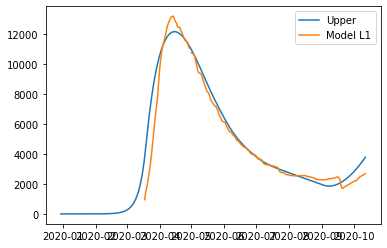

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08505329409054768, 'other': 0.1334835603203975, 'school': 0.057706573870414245, 'transport': 0.3700090760139653, 'work': 0.23384689954138743}
June1-June30 {'home': 1.0, 'leisure': 0.18683314927696262, 'other': 0.1563434771963232, 'school': 0.30423626853919267, 'transport': 0.48167197294459885, 'work': 0.23384689954138743}
July1-Aug31 {'home': 1.0, 'leisure': 0.18683314927696262, 'other': 0.1563434771963232, 'school': 0.30423626853919267, 'transport': 0.48167197294459885, 'work': 0.23384689954138743}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3798659360196476, 'other': 0.4241510526152028, 'school': 0.7728476369284514, 'transport': 0.7047154147741133, 'work': 0.7715177916103522}
alpha1 0.3 alpha2 0.7


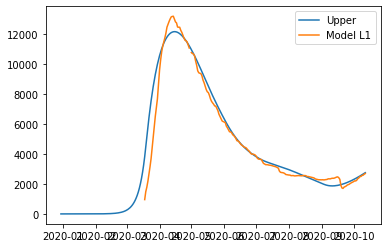

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07252065266460254, 'other': 0.1048204814022924, 'school': 0.08817125612176112, 'transport': 0.47819091764931876, 'work': 0.23274996778792195}
June1-June30 {'home': 1.0, 'leisure': 0.12370855345706647, 'other': 0.1278664976800222, 'school': 0.6526126694283869, 'transport': 0.5701151142656233, 'work': 0.23274996778792195}
July1-Aug31 {'home': 1.0, 'leisure': 0.12370855345706647, 'other': 0.1278664976800222, 'school': 0.6526126694283869, 'transport': 0.5701151142656233, 'work': 0.23274996778792195}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.4539483086684254, 'other': 0.19028139458972426, 'school': 0.624705594276052, 'transport': 0.6981630951889843, 'work': 0.7479452226628783}
alpha1 0.3 alpha2 0.7
3961.525765502416
e

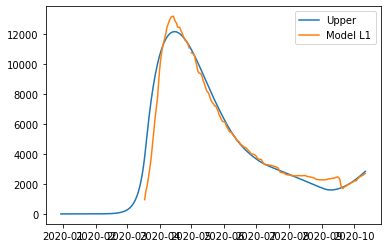

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07167011204877811, 'other': 0.1111356664221024, 'school': 0.1258862361389164, 'transport': 0.3922539237132782, 'work': 0.222128899146358}
June1-June30 {'home': 1.0, 'leisure': 0.1286181213751058, 'other': 0.12233161425555095, 'school': 0.5898363219472875, 'transport': 0.4870494483577699, 'work': 0.222128899146358}
July1-Aug31 {'home': 1.0, 'leisure': 0.1286181213751058, 'other': 0.12233161425555095, 'school': 0.5898363219472875, 'transport': 0.4870494483577699, 'work': 0.222128899146358}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.34242783270995913, 'other': 0.3590129723456498, 'school': 0.7156994923767896, 'transport': 0.6928759461443479, 'work': 0.7762514827589234}
alpha1 0.3 alpha2 0.7
3872.8989316525754
error_g

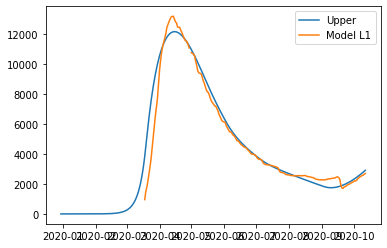

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08718548593211947, 'other': 0.12315640398836414, 'school': 0.1368378595464036, 'transport': 0.292896301881549, 'work': 0.23125460579311824}
June1-June30 {'home': 1.0, 'leisure': 0.18542121713010135, 'other': 0.158191529128484, 'school': 0.18229527432090026, 'transport': 0.6844840299220962, 'work': 0.23125460579311824}
July1-Aug31 {'home': 1.0, 'leisure': 0.18542121713010135, 'other': 0.158191529128484, 'school': 0.18229527432090026, 'transport': 0.6844840299220962, 'work': 0.23125460579311824}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.36828620189310746, 'other': 0.23842022736731186, 'school': 0.7101298026007448, 'transport': 0.8660655693709889, 'work': 0.802408049543814}
alpha1 0.3 alpha2 0.7
3933.483836655887
er

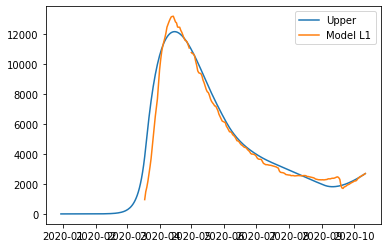

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.09581607104731718, 'other': 0.11130478163708289, 'school': 0.05472365460307651, 'transport': 0.39924183783182216, 'work': 0.23559918287647552}
June1-June30 {'home': 1.0, 'leisure': 0.11203456493367103, 'other': 0.2122669472373071, 'school': 0.4809110842562903, 'transport': 0.5740984447634123, 'work': 0.23559918287647552}
July1-Aug31 {'home': 1.0, 'leisure': 0.11203456493367103, 'other': 0.2122669472373071, 'school': 0.4809110842562903, 'transport': 0.5740984447634123, 'work': 0.23559918287647552}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3462832649215988, 'other': 0.26240227246527825, 'school': 0.7606577204411621, 'transport': 0.670446184323906, 'work': 0.7362747642798607}
alpha1 0.3 alpha2 0.7


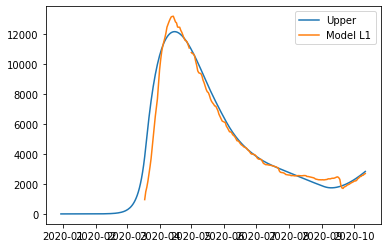

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07941134623250372, 'other': 0.15365524528894184, 'school': 0.008076648207770286, 'transport': 0.31573739707524406, 'work': 0.22907243476328812}
June1-June30 {'home': 1.0, 'leisure': 0.1421309793956575, 'other': 0.18566631800305886, 'school': 0.4158745867281586, 'transport': 0.5546633916526484, 'work': 0.22907243476328812}
July1-Aug31 {'home': 1.0, 'leisure': 0.1421309793956575, 'other': 0.18566631800305886, 'school': 0.4158745867281586, 'transport': 0.5546633916526484, 'work': 0.22907243476328812}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.50382602020365, 'other': 0.2905755786006739, 'school': 0.6768501856607188, 'transport': 0.6295743163203326, 'work': 0.6417358529043086}
alpha1 0.3 alpha2 0.7
3827.099887211833
e

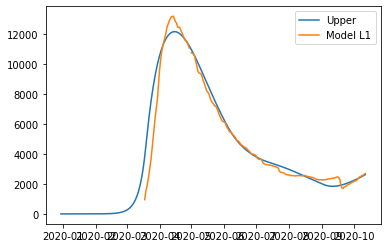

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07509054827131047, 'other': 0.10871584161481829, 'school': 0.08481527435843002, 'transport': 0.3524751820256472, 'work': 0.22061059767940794}
June1-June30 {'home': 1.0, 'leisure': 0.13478780812702335, 'other': 0.1650933850506794, 'school': 0.6660718252806517, 'transport': 0.48418942123833164, 'work': 0.22061059767940794}
July1-Aug31 {'home': 1.0, 'leisure': 0.13478780812702335, 'other': 0.1650933850506794, 'school': 0.6660718252806517, 'transport': 0.48418942123833164, 'work': 0.22061059767940794}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.30088169432711254, 'other': 0.32972869628951845, 'school': 0.6121019201782867, 'transport': 0.6765325189291563, 'work': 0.715879782474}
alpha1 0.3 alpha2 0.7
3780.9096847767096


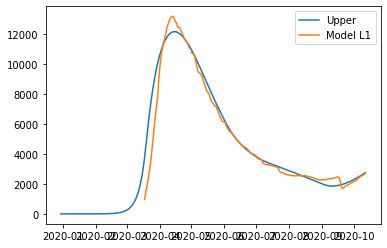

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07565231961658937, 'other': 0.10489364203243666, 'school': 0.04025086987540196, 'transport': 0.4390843957601588, 'work': 0.22976909049320013}
June1-June30 {'home': 1.0, 'leisure': 0.13840522363231006, 'other': 0.16386037841177775, 'school': 0.4987381824234727, 'transport': 0.6860715273873728, 'work': 0.22976909049320013}
July1-Aug31 {'home': 1.0, 'leisure': 0.13840522363231006, 'other': 0.16386037841177775, 'school': 0.4987381824234727, 'transport': 0.6860715273873728, 'work': 0.22976909049320013}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.38813616511523585, 'other': 0.21616728679370467, 'school': 0.7030465378724432, 'transport': 0.765130170732197, 'work': 0.7365893196902707}
alpha1 0.3 alpha2 0.7


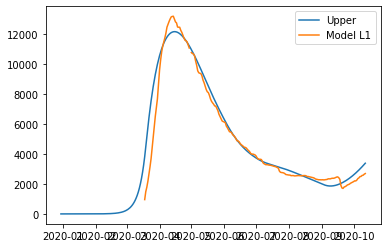

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07183924935952704, 'other': 0.1042198668459218, 'school': 0.09589405767174017, 'transport': 0.4249004956661595, 'work': 0.23283187944417433}
June1-June30 {'home': 1.0, 'leisure': 0.12261684342382825, 'other': 0.11563511349774841, 'school': 0.7111339085914041, 'transport': 0.4574486978087452, 'work': 0.23283187944417433}
July1-Aug31 {'home': 1.0, 'leisure': 0.12261684342382825, 'other': 0.11563511349774841, 'school': 0.7111339085914041, 'transport': 0.4574486978087452, 'work': 0.23283187944417433}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.5489971535354153, 'other': 0.1393318481115638, 'school': 0.627936089027926, 'transport': 0.6981173166281807, 'work': 0.8965813025325666}
alpha1 0.3 alpha2 0.7
3873.953691409711
e

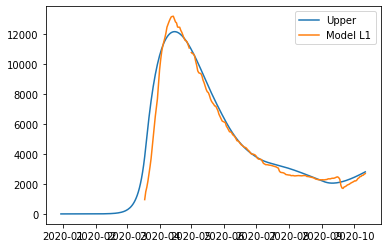

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07104365120865208, 'other': 0.10329686637360576, 'school': 0.032579371830910094, 'transport': 0.5422714034058806, 'work': 0.24184682192156987}
June1-June30 {'home': 1.0, 'leisure': 0.13997565699886594, 'other': 0.11494784353895945, 'school': 0.6335979087508502, 'transport': 0.5700370322431396, 'work': 0.24184682192156987}
July1-Aug31 {'home': 1.0, 'leisure': 0.13997565699886594, 'other': 0.11494784353895945, 'school': 0.6335979087508502, 'transport': 0.5700370322431396, 'work': 0.24184682192156987}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3910644350154051, 'other': 0.22366542121065933, 'school': 0.624956675306845, 'transport': 0.7480636244264562, 'work': 0.6958849559215258}
alpha1 0.3 alpha2 0.7
3802.35612563353

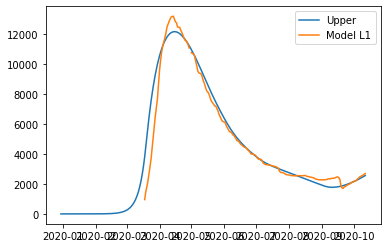

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07533996512728124, 'other': 0.10302672529906338, 'school': 0.1655114073801053, 'transport': 0.4894419708045705, 'work': 0.2311854710802272}
June1-June30 {'home': 1.0, 'leisure': 0.1803256547867842, 'other': 0.11792751651824912, 'school': 0.36851103687415326, 'transport': 0.5526613948630201, 'work': 0.2311854710802272}
July1-Aug31 {'home': 1.0, 'leisure': 0.1803256547867842, 'other': 0.11792751651824912, 'school': 0.36851103687415326, 'transport': 0.5526613948630201, 'work': 0.2311854710802272}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.30699091420110003, 'other': 0.3019267345046178, 'school': 0.6983768902527557, 'transport': 0.7453163762793409, 'work': 0.6978711377478567}
alpha1 0.3 alpha2 0.7


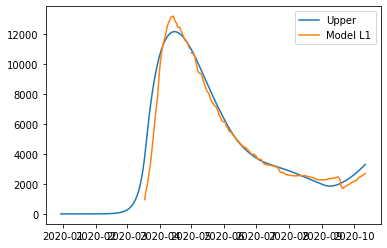

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07403776247634336, 'other': 0.10872043282492315, 'school': 0.04637768020636654, 'transport': 0.4416424741390401, 'work': 0.23440347595869998}
June1-June30 {'home': 1.0, 'leisure': 0.11138267332770346, 'other': 0.12753149712672365, 'school': 0.683538908981881, 'transport': 0.5490656500598765, 'work': 0.23440347595869998}
July1-Aug31 {'home': 1.0, 'leisure': 0.11138267332770346, 'other': 0.12753149712672365, 'school': 0.683538908981881, 'transport': 0.5490656500598765, 'work': 0.23440347595869998}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.2688762471306818, 'other': 0.5366046786050077, 'school': 0.6552971686994555, 'transport': 0.7380791087616173, 'work': 0.6695528448450356}
alpha1 0.3 alpha2 0.7
3824.0032694649426


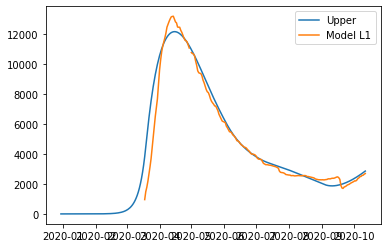

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07034894890288347, 'other': 0.10879726284205188, 'school': 0.11471869630281309, 'transport': 0.42634477855470054, 'work': 0.22374272474316004}
June1-June30 {'home': 1.0, 'leisure': 0.1609535239654525, 'other': 0.13043665017772796, 'school': 0.5627659882120642, 'transport': 0.5604822966321488, 'work': 0.22374272474316004}
July1-Aug31 {'home': 1.0, 'leisure': 0.1609535239654525, 'other': 0.13043665017772796, 'school': 0.5627659882120642, 'transport': 0.5604822966321488, 'work': 0.22374272474316004}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.4779013485231183, 'other': 0.2680082910447158, 'school': 0.7473892380394843, 'transport': 0.7314731644585755, 'work': 0.6189743730128145}
alpha1 0.3 alpha2 0.7
3862.987597346271


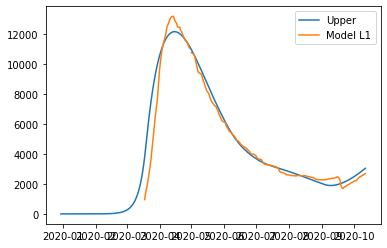

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.0798036375291697, 'other': 0.1077541589473235, 'school': 0.018908051288259536, 'transport': 0.31166577477574264, 'work': 0.24218687614487397}
June1-June30 {'home': 1.0, 'leisure': 0.12312464858700478, 'other': 0.16463820493649206, 'school': 0.5936560787810347, 'transport': 0.40006858627446984, 'work': 0.24218687614487397}
July1-Aug31 {'home': 1.0, 'leisure': 0.12312464858700478, 'other': 0.16463820493649206, 'school': 0.5936560787810347, 'transport': 0.40006858627446984, 'work': 0.24218687614487397}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.4300611180218554, 'other': 0.30386138519946493, 'school': 0.6874390246939286, 'transport': 0.4476388721087003, 'work': 0.714300645838682}
alpha1 0.3 alpha2 0.7
3973.8015414850

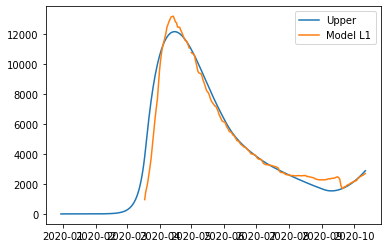

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.0813797516814091, 'other': 0.10246477067857478, 'school': 0.15875710177834138, 'transport': 0.3584419728598699, 'work': 0.22657230677472512}
June1-June30 {'home': 1.0, 'leisure': 0.12855007626351725, 'other': 0.20685284266164083, 'school': 0.3033365293145025, 'transport': 0.5663886187094354, 'work': 0.22657230677472512}
July1-Aug31 {'home': 1.0, 'leisure': 0.12855007626351725, 'other': 0.20685284266164083, 'school': 0.3033365293145025, 'transport': 0.5663886187094354, 'work': 0.22657230677472512}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.42963364586249286, 'other': 0.22558701542989446, 'school': 0.9788552269151966, 'transport': 0.7075247924907713, 'work': 0.7975144397423044}
alpha1 0.3 alpha2 0.7
3892.10604069108

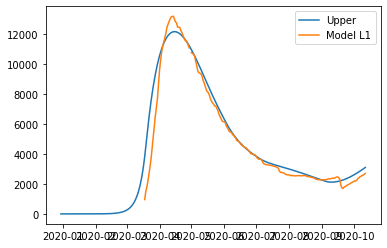

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.10434969974628658, 'other': 0.11010716686724653, 'school': 0.027680484168839822, 'transport': 0.35708552455036574, 'work': 0.2244152922267337}
June1-June30 {'home': 1.0, 'leisure': 0.2342032373144712, 'other': 0.13468303226479178, 'school': 0.3323004694862936, 'transport': 0.6170494575380558, 'work': 0.2244152922267337}
July1-Aug31 {'home': 1.0, 'leisure': 0.2342032373144712, 'other': 0.13468303226479178, 'school': 0.3323004694862936, 'transport': 0.6170494575380558, 'work': 0.2244152922267337}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.24273681114887438, 'other': 0.27653647208116394, 'school': 0.8364424498398875, 'transport': 0.7538223009826163, 'work': 0.7715988446369426}
alpha1 0.3 alpha2 0.7
3891.0074121603457

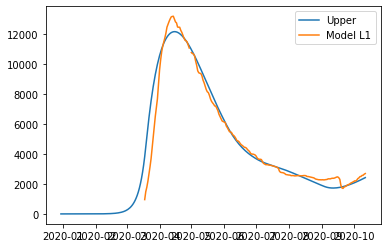

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07482984918037394, 'other': 0.10247504004460185, 'school': 0.09226920617760503, 'transport': 0.2826589605905436, 'work': 0.230752337227058}
June1-June30 {'home': 1.0, 'leisure': 0.08843493701383381, 'other': 0.1324202356178075, 'school': 0.7394514575615942, 'transport': 0.5939470337838344, 'work': 0.230752337227058}
July1-Aug31 {'home': 1.0, 'leisure': 0.08843493701383381, 'other': 0.1324202356178075, 'school': 0.7394514575615942, 'transport': 0.5939470337838344, 'work': 0.230752337227058}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.42457116279308393, 'other': 0.17981700575690973, 'school': 0.6073903387953583, 'transport': 0.6271631942122204, 'work': 0.743133988391053}
alpha1 0.3 alpha2 0.7
3800.1775718243807
error

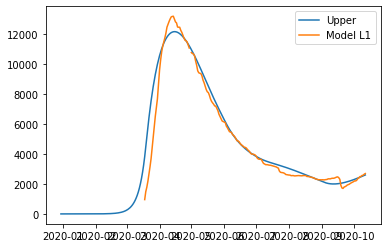

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08084009545464474, 'other': 0.11620992252356918, 'school': 0.020327288955671936, 'transport': 0.35162254971839485, 'work': 0.22766912163704883}
June1-June30 {'home': 1.0, 'leisure': 0.15839900021047906, 'other': 0.15505267342332402, 'school': 0.5389697244909848, 'transport': 0.6777115479454516, 'work': 0.22766912163704883}
July1-Aug31 {'home': 1.0, 'leisure': 0.15839900021047906, 'other': 0.15505267342332402, 'school': 0.5389697244909848, 'transport': 0.6777115479454516, 'work': 0.22766912163704883}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.19087123799726602, 'other': 0.24295524375720481, 'school': 0.7083417471271976, 'transport': 0.7458668534902814, 'work': 0.7966433256888096}
alpha1 0.3 alpha2 0.7


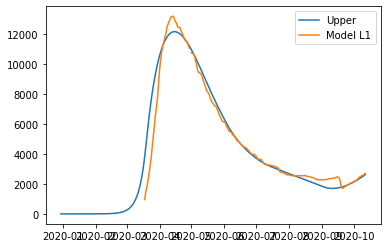

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.0896204923919813, 'other': 0.10283651556284033, 'school': 0.019336849089266552, 'transport': 0.5503221639093943, 'work': 0.2190686925081966}
June1-June30 {'home': 1.0, 'leisure': 0.17534075430300045, 'other': 0.11467400806043034, 'school': 0.4065130029282648, 'transport': 0.7289807176905709, 'work': 0.2190686925081966}
July1-Aug31 {'home': 1.0, 'leisure': 0.17534075430300045, 'other': 0.11467400806043034, 'school': 0.4065130029282648, 'transport': 0.7289807176905709, 'work': 0.2190686925081966}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.2936627661009065, 'other': 0.21920277456698822, 'school': 0.8722323537012702, 'transport': 0.8052251525346248, 'work': 0.7818147903895896}
alpha1 0.3 alpha2 0.7
3826.1179379153527


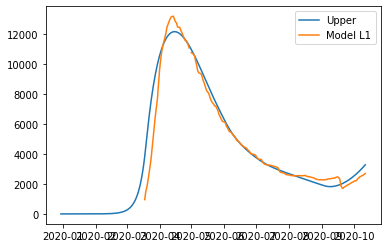

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07310126264001704, 'other': 0.11109986985844732, 'school': 0.004284555872883546, 'transport': 0.43505949245122216, 'work': 0.23328546510899545}
June1-June30 {'home': 1.0, 'leisure': 0.1838073458369731, 'other': 0.1840226727678701, 'school': 0.1823861324149837, 'transport': 0.6845020814700131, 'work': 0.23328546510899545}
July1-Aug31 {'home': 1.0, 'leisure': 0.1838073458369731, 'other': 0.1840226727678701, 'school': 0.1823861324149837, 'transport': 0.6845020814700131, 'work': 0.23328546510899545}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3753245836867851, 'other': 0.26544143777348683, 'school': 0.8794502989477005, 'transport': 0.8865737925947712, 'work': 0.7557118603812324}
alpha1 0.3 alpha2 0.7


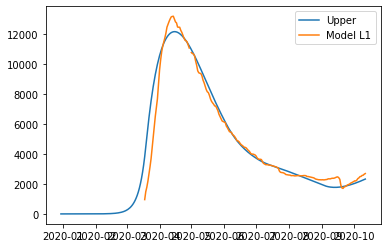

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.0684408046179537, 'other': 0.10590933973998987, 'school': 0.0815670753179583, 'transport': 0.425010474418155, 'work': 0.21942735025488305}
June1-June30 {'home': 1.0, 'leisure': 0.16828962000128356, 'other': 0.12342296358136252, 'school': 0.514536539841674, 'transport': 0.6473098592347715, 'work': 0.21942735025488305}
July1-Aug31 {'home': 1.0, 'leisure': 0.16828962000128356, 'other': 0.12342296358136252, 'school': 0.514536539841674, 'transport': 0.6473098592347715, 'work': 0.21942735025488305}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.23135373516859434, 'other': 0.2144440178158853, 'school': 0.8702510131248251, 'transport': 0.7415205513099006, 'work': 0.7249484905407121}
alpha1 0.3 alpha2 0.7
3800.842834535424
err

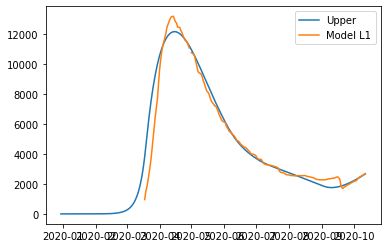

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07632839047020377, 'other': 0.11113184399243764, 'school': 0.05862742354797644, 'transport': 0.2804811563439905, 'work': 0.23371537313789184}
June1-June30 {'home': 1.0, 'leisure': 0.12131743026256314, 'other': 0.1705146311135452, 'school': 0.540875368731646, 'transport': 0.505210779896806, 'work': 0.23371537313789184}
July1-Aug31 {'home': 1.0, 'leisure': 0.12131743026256314, 'other': 0.1705146311135452, 'school': 0.540875368731646, 'transport': 0.505210779896806, 'work': 0.23371537313789184}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.27679181908384415, 'other': 0.33427493662651575, 'school': 0.6809565124207708, 'transport': 0.7357894832530372, 'work': 0.7273195854570222}
alpha1 0.3 alpha2 0.7
3968.2079444757287
er

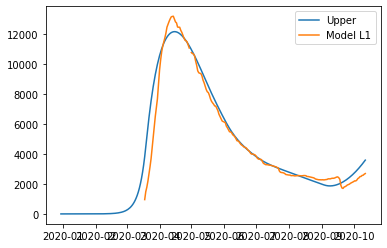

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08017821036387551, 'other': 0.11889542488356072, 'school': 0.015676938505893624, 'transport': 0.46569024368687906, 'work': 0.22413287297208254}
June1-June30 {'home': 1.0, 'leisure': 0.19893582832429366, 'other': 0.16427820801050463, 'school': 0.24804614062320846, 'transport': 0.703232704963368, 'work': 0.22413287297208254}
July1-Aug31 {'home': 1.0, 'leisure': 0.19893582832429366, 'other': 0.16427820801050463, 'school': 0.24804614062320846, 'transport': 0.703232704963368, 'work': 0.22413287297208254}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.4406274295628001, 'other': 0.25704216840006217, 'school': 0.8614836856648583, 'transport': 0.7677128049929882, 'work': 0.810622766109734}
alpha1 0.3 alpha2 0.7
3852.2781257594

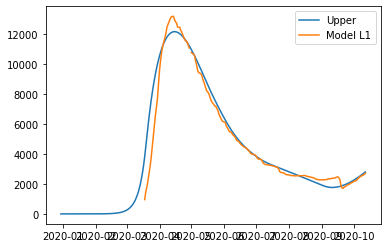

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.11862700810486704, 'other': 0.11134933001533111, 'school': 0.05807369090983513, 'transport': 0.33730982688826555, 'work': 0.23348139518466707}
June1-June30 {'home': 1.0, 'leisure': 0.13346141737692727, 'other': 0.14922494849236004, 'school': 0.5245682667279039, 'transport': 0.4985874524069996, 'work': 0.23348139518466707}
July1-Aug31 {'home': 1.0, 'leisure': 0.13346141737692727, 'other': 0.14922494849236004, 'school': 0.5245682667279039, 'transport': 0.4985874524069996, 'work': 0.23348139518466707}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.4288040319887104, 'other': 0.18650840062203372, 'school': 0.8555364651048305, 'transport': 0.6960520705952038, 'work': 0.7549084234977006}
alpha1 0.3 alpha2 0.7
3827.8924786855

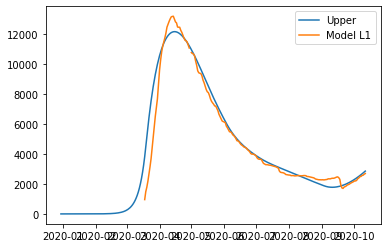

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.09050640863283013, 'other': 0.10339179866430032, 'school': 0.11060691779429775, 'transport': 0.3444015318967898, 'work': 0.22792359338000037}
June1-June30 {'home': 1.0, 'leisure': 0.15342852506779842, 'other': 0.18629894048733836, 'school': 0.372639380584837, 'transport': 0.6090780141661541, 'work': 0.22792359338000037}
July1-Aug31 {'home': 1.0, 'leisure': 0.15342852506779842, 'other': 0.18629894048733836, 'school': 0.372639380584837, 'transport': 0.6090780141661541, 'work': 0.22792359338000037}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.42070779629336175, 'other': 0.1996897246709541, 'school': 0.942429129437252, 'transport': 0.7876264975319379, 'work': 0.7112767799150284}
alpha1 0.3 alpha2 0.7
3859.3787080530938


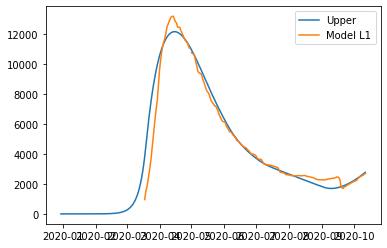

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07055301054972074, 'other': 0.10370413309003312, 'school': 0.06602649510595845, 'transport': 0.5343289166168267, 'work': 0.2278650518880845}
June1-June30 {'home': 1.0, 'leisure': 0.16105871578222605, 'other': 0.13847056982406974, 'school': 0.41133151915778626, 'transport': 0.539161952436159, 'work': 0.2278650518880845}
July1-Aug31 {'home': 1.0, 'leisure': 0.16105871578222605, 'other': 0.13847056982406974, 'school': 0.41133151915778626, 'transport': 0.539161952436159, 'work': 0.2278650518880845}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3176437083889546, 'other': 0.3298290783923713, 'school': 0.7572680435813812, 'transport': 0.6354737790430485, 'work': 0.7492334562353465}
alpha1 0.3 alpha2 0.7
3933.2656995626153
e

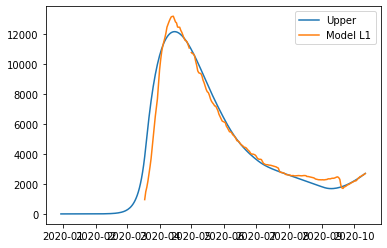

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.0718075166017873, 'other': 0.10503848838968535, 'school': 0.0482180629405116, 'transport': 0.5014618321189996, 'work': 0.23880506775266166}
June1-June30 {'home': 1.0, 'leisure': 0.14239965093107165, 'other': 0.10666769848396374, 'school': 0.40824396066006025, 'transport': 0.668037491297995, 'work': 0.23880506775266166}
July1-Aug31 {'home': 1.0, 'leisure': 0.14239965093107165, 'other': 0.10666769848396374, 'school': 0.40824396066006025, 'transport': 0.668037491297995, 'work': 0.23880506775266166}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.20873318687776635, 'other': 0.2635006124219491, 'school': 0.7943302384967986, 'transport': 0.7718696773723703, 'work': 0.8614136585910948}
alpha1 0.3 alpha2 0.7


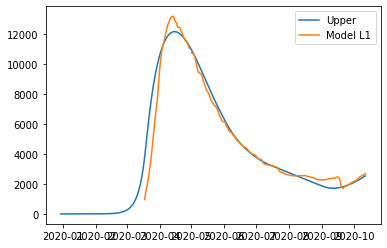

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.06994390052964644, 'other': 0.10282834373685247, 'school': 0.09869691466901029, 'transport': 0.46937458423748846, 'work': 0.230752337227058}
June1-June30 {'home': 1.0, 'leisure': 0.13376473062247793, 'other': 0.14643162545162844, 'school': 0.48500380288221917, 'transport': 0.606756484521246, 'work': 0.230752337227058}
July1-Aug31 {'home': 1.0, 'leisure': 0.13376473062247793, 'other': 0.14643162545162844, 'school': 0.48500380288221917, 'transport': 0.606756484521246, 'work': 0.230752337227058}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3926815729216635, 'other': 0.20059415341553827, 'school': 0.8316425742248286, 'transport': 0.7218828598658549, 'work': 0.7044343963439409}
alpha1 0.3 alpha2 0.7
3797.4539970044193
er

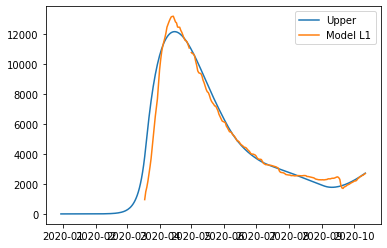

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07937310773620335, 'other': 0.10682873139857385, 'school': 0.027506471521603175, 'transport': 0.4440935644320329, 'work': 0.2278451796476569}
June1-June30 {'home': 1.0, 'leisure': 0.1432460354455435, 'other': 0.12860170928537154, 'school': 0.5208242452835488, 'transport': 0.668137272653066, 'work': 0.2278451796476569}
July1-Aug31 {'home': 1.0, 'leisure': 0.1432460354455435, 'other': 0.12860170928537154, 'school': 0.5208242452835488, 'transport': 0.668137272653066, 'work': 0.2278451796476569}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3289575710636474, 'other': 0.20291464192381092, 'school': 0.7304441609316625, 'transport': 0.7229873311972613, 'work': 0.8259628007251496}
alpha1 0.3 alpha2 0.7
3822.0275007775504
err

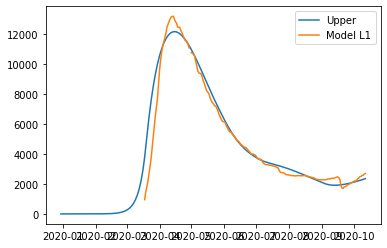

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07430225394011114, 'other': 0.11193439058997323, 'school': 0.037696383358589255, 'transport': 0.420389963888968, 'work': 0.23100867212589177}
June1-June30 {'home': 1.0, 'leisure': 0.13098474800358884, 'other': 0.13511112431443967, 'school': 0.7176634672116808, 'transport': 0.4527079819625409, 'work': 0.23100867212589177}
July1-Aug31 {'home': 1.0, 'leisure': 0.13098474800358884, 'other': 0.13511112431443967, 'school': 0.7176634672116808, 'transport': 0.4527079819625409, 'work': 0.23100867212589177}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.31849737402739875, 'other': 0.2459646529662213, 'school': 0.6062760044207187, 'transport': 0.6658576271759165, 'work': 0.6600455309533299}
alpha1 0.3 alpha2 0.7
3841.68461048613

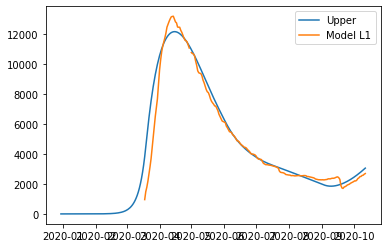

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07263740104497761, 'other': 0.11700880857836998, 'school': 0.0014654428818438538, 'transport': 0.44342612515136237, 'work': 0.2244662188194729}
June1-June30 {'home': 1.0, 'leisure': 0.16030877852798242, 'other': 0.17417846861518282, 'school': 0.4421198675180315, 'transport': 0.6251010532862147, 'work': 0.2244662188194729}
July1-Aug31 {'home': 1.0, 'leisure': 0.16030877852798242, 'other': 0.17417846861518282, 'school': 0.4421198675180315, 'transport': 0.6251010532862147, 'work': 0.2244662188194729}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3882190058603622, 'other': 0.28434682887586193, 'school': 0.7321335520757916, 'transport': 0.6691570563953639, 'work': 0.7580778713001248}
alpha1 0.3 alpha2 0.7
3775.54239248754

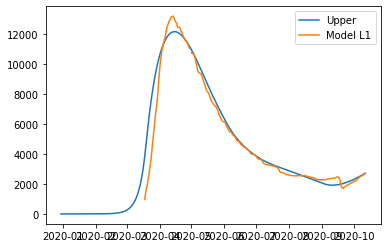

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08604615113614139, 'other': 0.11111800724487282, 'school': 0.0016338028117818466, 'transport': 0.46282071371872413, 'work': 0.2391795079146738}
June1-June30 {'home': 1.0, 'leisure': 0.14717295354475973, 'other': 0.16319561430944562, 'school': 0.3787177460423759, 'transport': 0.7520683583630536, 'work': 0.2391795079146738}
July1-Aug31 {'home': 1.0, 'leisure': 0.14717295354475973, 'other': 0.16319561430944562, 'school': 0.3787177460423759, 'transport': 0.7520683583630536, 'work': 0.2391795079146738}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.1920070820858262, 'other': 0.2915375181689107, 'school': 0.8383217589876474, 'transport': 0.7532752388238281, 'work': 0.758399878585569}
alpha1 0.3 alpha2 0.7
3792.7716739706384

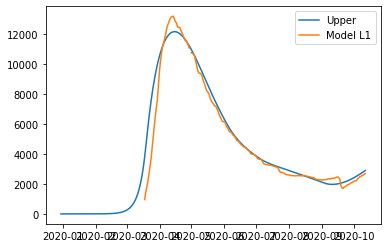

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08967017881896892, 'other': 0.10539091039637853, 'school': 0.09319884228841177, 'transport': 0.35147892269508885, 'work': 0.23546895494158088}
June1-June30 {'home': 1.0, 'leisure': 0.18969084155187763, 'other': 0.1693217839946055, 'school': 0.34704477749812856, 'transport': 0.46396994890477505, 'work': 0.23546895494158088}
July1-Aug31 {'home': 1.0, 'leisure': 0.18969084155187763, 'other': 0.1693217839946055, 'school': 0.34704477749812856, 'transport': 0.46396994890477505, 'work': 0.23546895494158088}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.25911036684434935, 'other': 0.205856215546187, 'school': 0.8861716742872172, 'transport': 0.7313179660612137, 'work': 0.8199541312093519}
alpha1 0.3 alpha2 0.7
3801.212441349

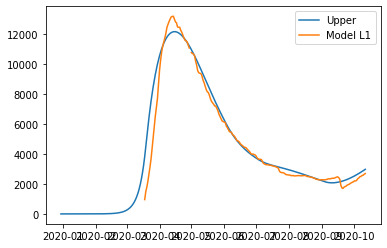

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07213102912867377, 'other': 0.10733212831115034, 'school': 0.07116694029154559, 'transport': 0.3530524966495039, 'work': 0.22996794708866738}
June1-June30 {'home': 1.0, 'leisure': 0.20921391596386507, 'other': 0.12194659831209848, 'school': 0.44976805495511174, 'transport': 0.5135991579767294, 'work': 0.22996794708866738}
July1-Aug31 {'home': 1.0, 'leisure': 0.20921391596386507, 'other': 0.12194659831209848, 'school': 0.44976805495511174, 'transport': 0.5135991579767294, 'work': 0.22996794708866738}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.40774301567094795, 'other': 0.2489313117616618, 'school': 0.8067017339571635, 'transport': 0.7488090942128934, 'work': 0.6186425175059305}
alpha1 0.3 alpha2 0.7
3795.539608508

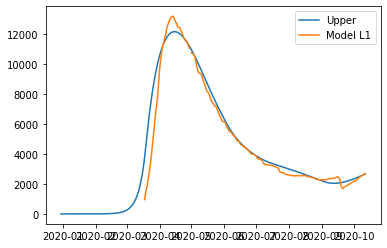

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07017973063294428, 'other': 0.120446356153542, 'school': 0.05416395278464332, 'transport': 0.3544811813313577, 'work': 0.2425835408298692}
June1-June30 {'home': 1.0, 'leisure': 0.15479677956106241, 'other': 0.16139173477635674, 'school': 0.43576791669675696, 'transport': 0.6568367612483479, 'work': 0.2425835408298692}
July1-Aug31 {'home': 1.0, 'leisure': 0.15479677956106241, 'other': 0.16139173477635674, 'school': 0.43576791669675696, 'transport': 0.6568367612483479, 'work': 0.2425835408298692}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.1844270109157925, 'other': 0.265493119798887, 'school': 0.9094026584710415, 'transport': 0.747823982131, 'work': 0.7108126434201183}
alpha1 0.3 alpha2 0.7
3810.542176043814
error_g

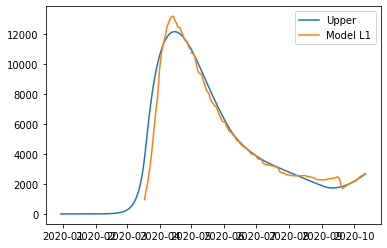

3852.282369867956
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
error_groups 1588.3115710681082
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07446667852440192, 'other': 0.11120588989425427, 'school': 0.09573778484774657, 'transport': 0.3872900349340759, 'work': 0.23228546658705349}
June1-June30 {'home': 1.0, 'leisure': 0.12567631632908005, 'other': 0.1858236265058982, 'school': 0.40584903927411126, 'transport': 0.681069286209359, 'work': 0.23228546658705349}
July1-Aug31 {'home': 1.0, 'leisure': 0.12567631632908005, 'other': 0.1858236265058982, 'school': 0.40584903927411126, 'transport': 0.681069286209359, 'work': 0.23228546658705349}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.37488975828576043, 'other': 0.20546927379732532, 'school': 0.8587084429806239, 'transport': 0.7078516599108936, 'work': 0.7502416

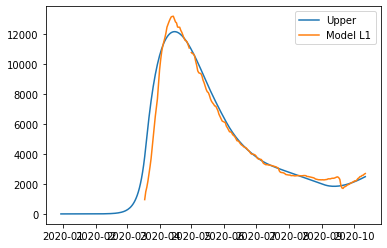

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.09320886173348343, 'other': 0.11992643613457832, 'school': 0.002228647860780747, 'transport': 0.39564435643381773, 'work': 0.24008494741520853}
June1-June30 {'home': 1.0, 'leisure': 0.15817631889051592, 'other': 0.15183509313951218, 'school': 0.3389325000584916, 'transport': 0.6808741378760486, 'work': 0.24008494741520853}
July1-Aug31 {'home': 1.0, 'leisure': 0.15817631889051592, 'other': 0.15183509313951218, 'school': 0.3389325000584916, 'transport': 0.6808741378760486, 'work': 0.24008494741520853}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.1896557450664984, 'other': 0.21117246306563142, 'school': 0.976986998970032, 'transport': 0.7519996760042931, 'work': 0.7469674568382486}
alpha1 0.3 alpha2 0.7


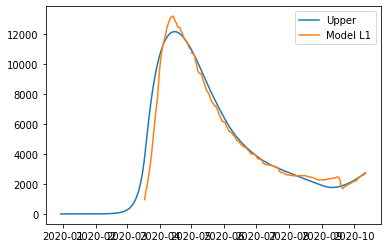

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.10080984224627879, 'other': 0.11326067832422519, 'school': 0.030974845454124465, 'transport': 0.45373545089693473, 'work': 0.23769357370080632}
June1-June30 {'home': 1.0, 'leisure': 0.14761054758567632, 'other': 0.17505582818241033, 'school': 0.306429249816759, 'transport': 0.6453531271460156, 'work': 0.23769357370080632}
July1-Aug31 {'home': 1.0, 'leisure': 0.14761054758567632, 'other': 0.17505582818241033, 'school': 0.306429249816759, 'transport': 0.6453531271460156, 'work': 0.23769357370080632}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3524697006817217, 'other': 0.1944911226749188, 'school': 0.8091202352478231, 'transport': 0.7105779618936698, 'work': 0.8045604965867775}
alpha1 0.3 alpha2 0.7
3834.063420728713

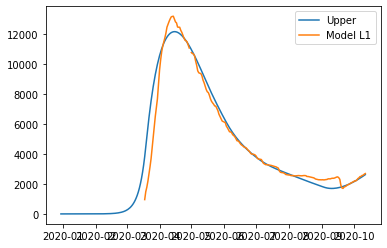

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08069923517456035, 'other': 0.12236374408400343, 'school': 0.02852480538919737, 'transport': 0.4467224013384304, 'work': 0.2322095693042916}
June1-June30 {'home': 1.0, 'leisure': 0.15745432337639897, 'other': 0.16731511767664614, 'school': 0.29926761684645575, 'transport': 0.6232774720440051, 'work': 0.2322095693042916}
July1-Aug31 {'home': 1.0, 'leisure': 0.15745432337639897, 'other': 0.16731511767664614, 'school': 0.29926761684645575, 'transport': 0.6232774720440051, 'work': 0.2322095693042916}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.25865823513627095, 'other': 0.3046005900579133, 'school': 0.7742485875064382, 'transport': 0.8343475745024913, 'work': 0.7403291310919746}
alpha1 0.3 alpha2 0.7


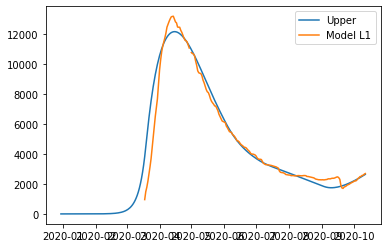

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07218508661588428, 'other': 0.10560943181771039, 'school': 0.06249467062977987, 'transport': 0.34353307901791474, 'work': 0.23952661258559496}
June1-June30 {'home': 1.0, 'leisure': 0.10719132532958218, 'other': 0.15996166177870566, 'school': 0.5456137150514166, 'transport': 0.5479885152623525, 'work': 0.23952661258559496}
July1-Aug31 {'home': 1.0, 'leisure': 0.10719132532958218, 'other': 0.15996166177870566, 'school': 0.5456137150514166, 'transport': 0.5479885152623525, 'work': 0.23952661258559496}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.14980252795551807, 'other': 0.46271401727343686, 'school': 0.7620578264030569, 'transport': 0.6275299181181822, 'work': 0.6898479668127447}
alpha1 0.3 alpha2 0.7
3764.347545294

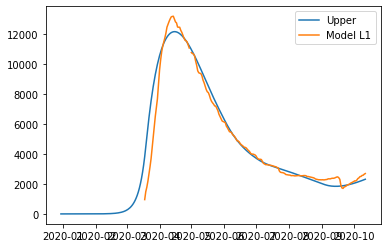

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08216894384813217, 'other': 0.1105063523424953, 'school': 0.0037397026788825983, 'transport': 0.44601449901083456, 'work': 0.22566897652018642}
June1-June30 {'home': 1.0, 'leisure': 0.1818590834198735, 'other': 0.13337804925625854, 'school': 0.44842974194299184, 'transport': 0.600715903791212, 'work': 0.22566897652018642}
July1-Aug31 {'home': 1.0, 'leisure': 0.1818590834198735, 'other': 0.13337804925625854, 'school': 0.44842974194299184, 'transport': 0.600715903791212, 'work': 0.22566897652018642}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.33477316886122, 'other': 0.1941787706338895, 'school': 0.8511341612619601, 'transport': 0.6156886789621585, 'work': 0.6245181604065698}
alpha1 0.3 alpha2 0.7
3764.574990103103
e

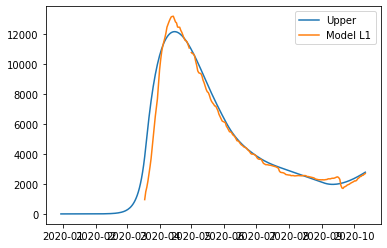

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07315297726237284, 'other': 0.11835138238368637, 'school': 0.02843746556497782, 'transport': 0.31953426556042164, 'work': 0.2549868311397528}
June1-June30 {'home': 1.0, 'leisure': 0.12350116983353576, 'other': 0.20462256650884997, 'school': 0.3408087245682012, 'transport': 0.6428077402522241, 'work': 0.2549868311397528}
July1-Aug31 {'home': 1.0, 'leisure': 0.12350116983353576, 'other': 0.20462256650884997, 'school': 0.3408087245682012, 'transport': 0.6428077402522241, 'work': 0.2549868311397528}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.21639212544036696, 'other': 0.24206495488918708, 'school': 0.9617519541100462, 'transport': 0.7907502928868538, 'work': 0.7313055317483834}
alpha1 0.3 alpha2 0.7


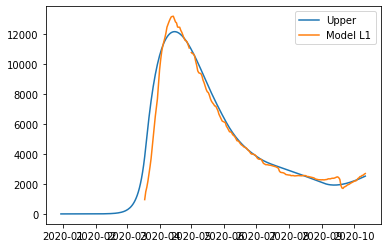

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08101958868641793, 'other': 0.1147165978434234, 'school': 0.06236173374040135, 'transport': 0.37728212329142374, 'work': 0.24509367817666997}
June1-June30 {'home': 1.0, 'leisure': 0.13772877506666964, 'other': 0.15275402476751515, 'school': 0.4619784490480871, 'transport': 0.6094854564520713, 'work': 0.24509367817666997}
July1-Aug31 {'home': 1.0, 'leisure': 0.13772877506666964, 'other': 0.15275402476751515, 'school': 0.4619784490480871, 'transport': 0.6094854564520713, 'work': 0.24509367817666997}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.2739066275056896, 'other': 0.18662179524402095, 'school': 0.8746768880692025, 'transport': 0.7632765923317133, 'work': 0.7141944810020303}
alpha1 0.3 alpha2 0.7


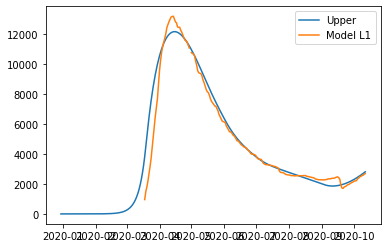

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.10700406965252321, 'other': 0.10639479413293423, 'school': 0.07126107042272205, 'transport': 0.3664998483944384, 'work': 0.23223031099067779}
June1-June30 {'home': 1.0, 'leisure': 0.19938276863936896, 'other': 0.12616473285612367, 'school': 0.26379038078168776, 'transport': 0.6836018108481097, 'work': 0.23223031099067779}
July1-Aug31 {'home': 1.0, 'leisure': 0.19938276863936896, 'other': 0.12616473285612367, 'school': 0.26379038078168776, 'transport': 0.6836018108481097, 'work': 0.23223031099067779}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.33301160006535113, 'other': 0.1635000011654136, 'school': 0.9871841577291993, 'transport': 0.8131977805065912, 'work': 0.7537240492812907}
alpha1 0.3 alpha2 0.7
3773.831531344

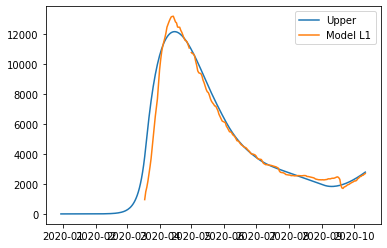

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.09029428113839126, 'other': 0.10281015968392532, 'school': 0.020500510117915035, 'transport': 0.45166894261103874, 'work': 0.24288827224358983}
June1-June30 {'home': 1.0, 'leisure': 0.14497630080439436, 'other': 0.14694324756787414, 'school': 0.3692097307599757, 'transport': 0.6686261930712187, 'work': 0.24288827224358983}
July1-Aug31 {'home': 1.0, 'leisure': 0.14497630080439436, 'other': 0.14694324756787414, 'school': 0.3692097307599757, 'transport': 0.6686261930712187, 'work': 0.24288827224358983}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.22029706458979942, 'other': 0.29431704774398015, 'school': 0.9136210929858679, 'transport': 0.755223544715812, 'work': 0.7499874048810488}
alpha1 0.3 alpha2 0.7
3760.627245541

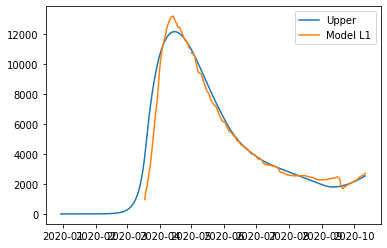

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07159800367019088, 'other': 0.12158597399081356, 'school': 0.01918767628832768, 'transport': 0.4069582557110233, 'work': 0.24109040866099268}
June1-June30 {'home': 1.0, 'leisure': 0.11957187355757355, 'other': 0.17333010029290852, 'school': 0.3929579189321846, 'transport': 0.7817224163633243, 'work': 0.24109040866099268}
July1-Aug31 {'home': 1.0, 'leisure': 0.11957187355757355, 'other': 0.17333010029290852, 'school': 0.3929579189321846, 'transport': 0.7817224163633243, 'work': 0.24109040866099268}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.23635033581368575, 'other': 0.2745464027824014, 'school': 0.9559961865762725, 'transport': 0.8184690073345025, 'work': 0.6654372051826585}
alpha1 0.3 alpha2 0.7


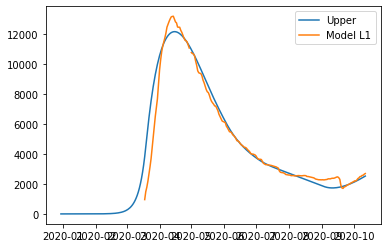

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.09268429874273137, 'other': 0.102093366968735, 'school': 0.0954142951775973, 'transport': 0.30459707178728623, 'work': 0.2372834898606017}
June1-June30 {'home': 1.0, 'leisure': 0.13371678923595237, 'other': 0.15109440919171646, 'school': 0.4533795704717293, 'transport': 0.5488454435179697, 'work': 0.2372834898606017}
July1-Aug31 {'home': 1.0, 'leisure': 0.13371678923595237, 'other': 0.15109440919171646, 'school': 0.4533795704717293, 'transport': 0.5488454435179697, 'work': 0.2372834898606017}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.24280741186095536, 'other': 0.30423981509399933, 'school': 0.8179545672273763, 'transport': 0.704873895235523, 'work': 0.7195685953358487}
alpha1 0.3 alpha2 0.7
3774.9731380577014
er

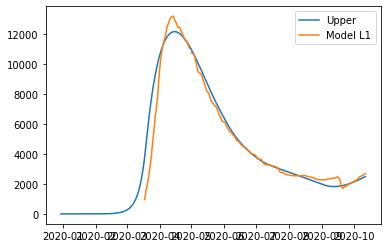

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.09898240306784677, 'other': 0.10662096118826775, 'school': 0.054670276930872654, 'transport': 0.36801033251767523, 'work': 0.2484876386919369}
June1-June30 {'home': 1.0, 'leisure': 0.12360574766320562, 'other': 0.11883163061565487, 'school': 0.46844522713423054, 'transport': 0.6905302151812036, 'work': 0.2484876386919369}
July1-Aug31 {'home': 1.0, 'leisure': 0.12360574766320562, 'other': 0.11883163061565487, 'school': 0.46844522713423054, 'transport': 0.6905302151812036, 'work': 0.2484876386919369}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.21354242579368854, 'other': 0.1339151492626638, 'school': 0.9585014989198215, 'transport': 0.7099783545471479, 'work': 0.8412150664069262}
alpha1 0.3 alpha2 0.7
3832.0759784191

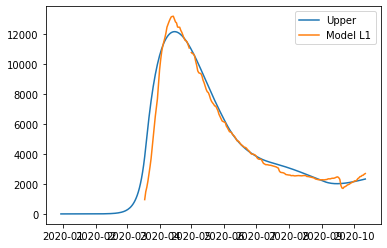

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08848199038791459, 'other': 0.10226957940578385, 'school': 0.06188647486346549, 'transport': 0.27993810757739007, 'work': 0.2411088879093057}
June1-June30 {'home': 1.0, 'leisure': 0.13262215258009236, 'other': 0.1577337884391597, 'school': 0.5797056457017105, 'transport': 0.6213306446114533, 'work': 0.2411088879093057}
July1-Aug31 {'home': 1.0, 'leisure': 0.13262215258009236, 'other': 0.1577337884391597, 'school': 0.5797056457017105, 'transport': 0.6213306446114533, 'work': 0.2411088879093057}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.19498379002266047, 'other': 0.19595256740083328, 'school': 0.7368895954857527, 'transport': 0.7382688080892419, 'work': 0.7255371669285798}
alpha1 0.3 alpha2 0.7
3765.3282191514836


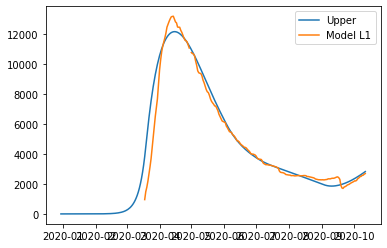

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08436918954508443, 'other': 0.10906520192817717, 'school': 0.025283786879176675, 'transport': 0.30082171912860056, 'work': 0.237721706043562}
June1-June30 {'home': 1.0, 'leisure': 0.13629925081636246, 'other': 0.17879839313638685, 'school': 0.4493695574859684, 'transport': 0.586733398741405, 'work': 0.237721706043562}
July1-Aug31 {'home': 1.0, 'leisure': 0.13629925081636246, 'other': 0.17879839313638685, 'school': 0.4493695574859684, 'transport': 0.586733398741405, 'work': 0.237721706043562}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.22265081102883766, 'other': 0.30471291855234606, 'school': 0.867566702884105, 'transport': 0.6022305045992615, 'work': 0.7830199412726035}
alpha1 0.3 alpha2 0.7


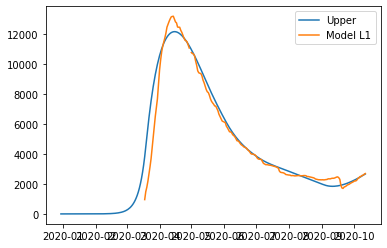

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.09160942775898774, 'other': 0.10586335310097039, 'school': 0.05158029501158338, 'transport': 0.3930392347882528, 'work': 0.24651103445096315}
June1-June30 {'home': 1.0, 'leisure': 0.11378825376094084, 'other': 0.16772508521028726, 'school': 0.46508443290582635, 'transport': 0.6194052764874596, 'work': 0.24651103445096315}
July1-Aug31 {'home': 1.0, 'leisure': 0.11378825376094084, 'other': 0.16772508521028726, 'school': 0.46508443290582635, 'transport': 0.6194052764874596, 'work': 0.24651103445096315}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.25480180231763183, 'other': 0.22463533371573824, 'school': 0.8486768284366379, 'transport': 0.7617047665859233, 'work': 0.7848865536247502}
alpha1 0.3 alpha2 0.7
3779.15241561

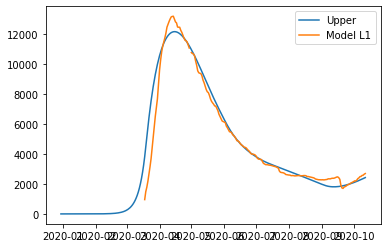

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.0800339122453159, 'other': 0.1101530197587046, 'school': 0.03893314277436806, 'transport': 0.3909661037435285, 'work': 0.23152452334061546}
June1-June30 {'home': 1.0, 'leisure': 0.13377222772881714, 'other': 0.17293968711778634, 'school': 0.5003045344323105, 'transport': 0.6037682758575027, 'work': 0.23152452334061546}
July1-Aug31 {'home': 1.0, 'leisure': 0.13377222772881714, 'other': 0.17293968711778634, 'school': 0.5003045344323105, 'transport': 0.6037682758575027, 'work': 0.23152452334061546}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.2163369624584574, 'other': 0.2573656342006766, 'school': 0.8330706734520331, 'transport': 0.7929682640347394, 'work': 0.7148591668362232}
alpha1 0.3 alpha2 0.7
3709.9911587808324


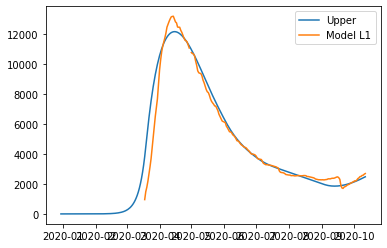

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.0856982449012994, 'other': 0.11501262728455955, 'school': 0.039439018282070214, 'transport': 0.4111113206425025, 'work': 0.2296212660086705}
June1-June30 {'home': 1.0, 'leisure': 0.19890975786734522, 'other': 0.1405883638082897, 'school': 0.2903053255719717, 'transport': 0.6511956599648171, 'work': 0.2296212660086705}
July1-Aug31 {'home': 1.0, 'leisure': 0.19890975786734522, 'other': 0.1405883638082897, 'school': 0.2903053255719717, 'transport': 0.6511956599648171, 'work': 0.2296212660086705}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.22412314476395456, 'other': 0.16659717058854598, 'school': 0.9655836328586902, 'transport': 0.8265392530014012, 'work': 0.7467193776336378}
alpha1 0.3 alpha2 0.7
3762.7774780212458
e

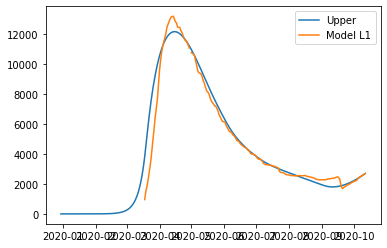

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.10025783608967934, 'other': 0.11429258292254212, 'school': 0.01662400416265843, 'transport': 0.3596652452193473, 'work': 0.24253023523762007}
June1-June30 {'home': 1.0, 'leisure': 0.14641896470620708, 'other': 0.19056418476976267, 'school': 0.3028050552457354, 'transport': 0.5667156688850858, 'work': 0.24253023523762007}
July1-Aug31 {'home': 1.0, 'leisure': 0.14641896470620708, 'other': 0.19056418476976267, 'school': 0.3028050552457354, 'transport': 0.5667156688850858, 'work': 0.24253023523762007}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3336858620430312, 'other': 0.239788441690446, 'school': 0.9666709649701319, 'transport': 0.7189674303939169, 'work': 0.6727905610320928}
alpha1 0.3 alpha2 0.7


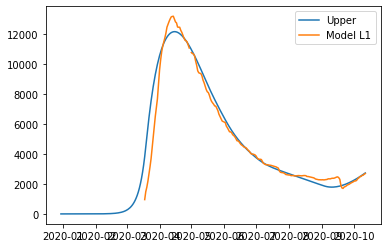

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.10138895995832799, 'other': 0.12044740290125668, 'school': 0.013222203852352793, 'transport': 0.3804981988327124, 'work': 0.24391001436547105}
June1-June30 {'home': 1.0, 'leisure': 0.15612276158251182, 'other': 0.14876561592105184, 'school': 0.3563815301298096, 'transport': 0.4750504711261769, 'work': 0.24391001436547105}
July1-Aug31 {'home': 1.0, 'leisure': 0.15612276158251182, 'other': 0.14876561592105184, 'school': 0.3563815301298096, 'transport': 0.4750504711261769, 'work': 0.24391001436547105}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.20639148182263417, 'other': 0.25458415643908605, 'school': 0.9028095450644492, 'transport': 0.6255335811171042, 'work': 0.8354851568027855}
alpha1 0.3 alpha2 0.7
3737.901171340

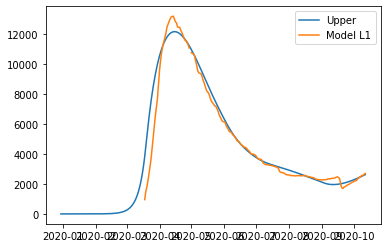

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.09006396964063862, 'other': 0.1127927450861413, 'school': 0.006101367750932138, 'transport': 0.331055854011, 'work': 0.2465644422699879}
June1-June30 {'home': 1.0, 'leisure': 0.1196700827643646, 'other': 0.13737516676249856, 'school': 0.5740056641452135, 'transport': 0.6341728394519196, 'work': 0.2465644422699879}
July1-Aug31 {'home': 1.0, 'leisure': 0.1196700827643646, 'other': 0.13737516676249856, 'school': 0.5740056641452135, 'transport': 0.6341728394519196, 'work': 0.2465644422699879}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.343394064233143, 'other': 0.17636679194194516, 'school': 0.7620578264030569, 'transport': 0.6985482071920738, 'work': 0.7240501611037045}
alpha1 0.3 alpha2 0.7
3792.5544907585254
error_g

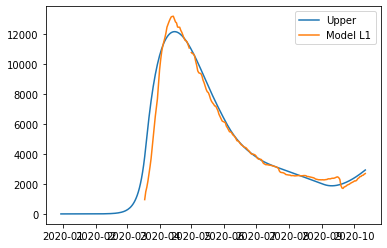

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08007754544944268, 'other': 0.11518285413612242, 'school': 0.041840651556872596, 'transport': 0.35762997706809174, 'work': 0.239401276784235}
June1-June30 {'home': 1.0, 'leisure': 0.1453471990006365, 'other': 0.16656795048396625, 'school': 0.4159583361145032, 'transport': 0.6010788415483019, 'work': 0.239401276784235}
July1-Aug31 {'home': 1.0, 'leisure': 0.1453471990006365, 'other': 0.16656795048396625, 'school': 0.4159583361145032, 'transport': 0.6010788415483019, 'work': 0.239401276784235}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.30400164696001997, 'other': 0.170566412589367, 'school': 0.8656956214669087, 'transport': 0.8035540193412366, 'work': 0.8499324792906489}
alpha1 0.3 alpha2 0.7
3774.1672343615937
erro

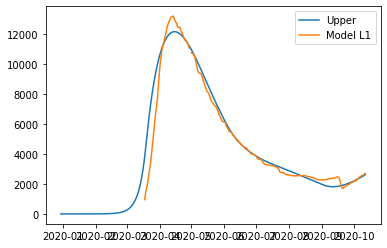

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07644694116939367, 'other': 0.10789098773455305, 'school': 0.03321262060647121, 'transport': 0.4590608011315269, 'work': 0.22072861394440046}
June1-June30 {'home': 1.0, 'leisure': 0.15473157868256812, 'other': 0.18393586300624637, 'school': 0.4428532130205531, 'transport': 0.6832992018131103, 'work': 0.22072861394440046}
July1-Aug31 {'home': 1.0, 'leisure': 0.15473157868256812, 'other': 0.18393586300624637, 'school': 0.4428532130205531, 'transport': 0.6832992018131103, 'work': 0.22072861394440046}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3549379596005554, 'other': 0.1963639660872077, 'school': 0.6874798796670728, 'transport': 0.8889519221345875, 'work': 0.7533276650723555}
alpha1 0.3 alpha2 0.7
3771.037625481664

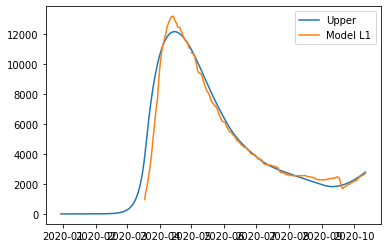

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08568412944471011, 'other': 0.12283579551182201, 'school': 0.05838449917739037, 'transport': 0.410755919230453, 'work': 0.2308714470398884}
June1-June30 {'home': 1.0, 'leisure': 0.22116978873570378, 'other': 0.1520184778924345, 'school': 0.08969710181674706, 'transport': 0.6896373051493445, 'work': 0.2308714470398884}
July1-Aug31 {'home': 1.0, 'leisure': 0.22116978873570378, 'other': 0.1520184778924345, 'school': 0.08969710181674706, 'transport': 0.6896373051493445, 'work': 0.2308714470398884}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.4029435004644799, 'other': 0.16409959781140765, 'school': 0.9339258979001306, 'transport': 0.8639411858032464, 'work': 0.6918723098594743}
alpha1 0.3 alpha2 0.7
3781.977149625407
er

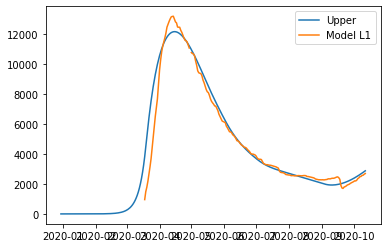

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07661216822168708, 'other': 0.12226159121432355, 'school': 0.017445304344118936, 'transport': 0.3777456401457747, 'work': 0.2438829831524257}
June1-June30 {'home': 1.0, 'leisure': 0.1994467567499256, 'other': 0.13280797328436766, 'school': 0.24472152994918903, 'transport': 0.5559368104051915, 'work': 0.2438829831524257}
July1-Aug31 {'home': 1.0, 'leisure': 0.1994467567499256, 'other': 0.13280797328436766, 'school': 0.24472152994918903, 'transport': 0.5559368104051915, 'work': 0.2438829831524257}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.254710292462928, 'other': 0.18874984946260134, 'school': 0.943612791556121, 'transport': 0.7879869106514955, 'work': 0.7929320757231113}
alpha1 0.3 alpha2 0.7
3726.0866649108275
e

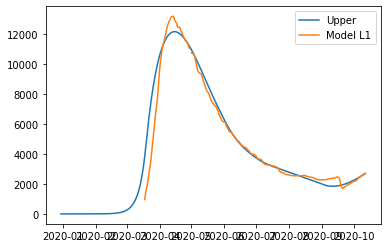

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07514230305940511, 'other': 0.1021935887058655, 'school': 0.008936179813896423, 'transport': 0.4995537455384277, 'work': 0.22873817949175573}
June1-June30 {'home': 1.0, 'leisure': 0.1709562314467607, 'other': 0.14208167428072938, 'school': 0.3860584953689717, 'transport': 0.7209202138085262, 'work': 0.22873817949175573}
July1-Aug31 {'home': 1.0, 'leisure': 0.1709562314467607, 'other': 0.14208167428072938, 'school': 0.3860584953689717, 'transport': 0.7209202138085262, 'work': 0.22873817949175573}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3083500371162821, 'other': 0.19719102097083083, 'school': 0.8791666717135633, 'transport': 0.7892855902852318, 'work': 0.7483575552770517}
alpha1 0.3 alpha2 0.7
3732.3955234659834

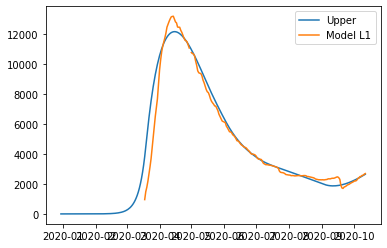

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08304782739656785, 'other': 0.11576731125038017, 'school': 0.00902945978205664, 'transport': 0.38961871794380654, 'work': 0.24732588491072569}
June1-June30 {'home': 1.0, 'leisure': 0.120242468899006, 'other': 0.15805854736193778, 'school': 0.46900440156145123, 'transport': 0.6359950960272236, 'work': 0.24732588491072569}
July1-Aug31 {'home': 1.0, 'leisure': 0.120242468899006, 'other': 0.15805854736193778, 'school': 0.46900440156145123, 'transport': 0.6359950960272236, 'work': 0.24732588491072569}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.27291648727607865, 'other': 0.16018059132963297, 'school': 0.9391512344721287, 'transport': 0.7755320162445516, 'work': 0.7796956763982101}
alpha1 0.3 alpha2 0.7


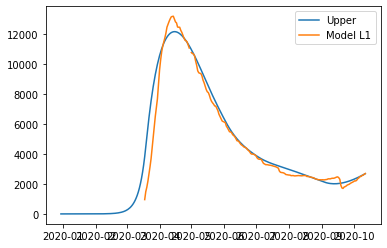

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08388569429888139, 'other': 0.12338652620726474, 'school': 0.027652307607650264, 'transport': 0.3765456387498312, 'work': 0.22828236244756295}
June1-June30 {'home': 1.0, 'leisure': 0.20270490568784022, 'other': 0.16681942344049855, 'school': 0.32212341507393927, 'transport': 0.6470102980239343, 'work': 0.22828236244756295}
July1-Aug31 {'home': 1.0, 'leisure': 0.20270490568784022, 'other': 0.16681942344049855, 'school': 0.32212341507393927, 'transport': 0.6470102980239343, 'work': 0.22828236244756295}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.2793073508219649, 'other': 0.16953942925923504, 'school': 0.9380686641516114, 'transport': 0.8582973195937644, 'work': 0.7128085366819756}
alpha1 0.3 alpha2 0.7
3760.81935039

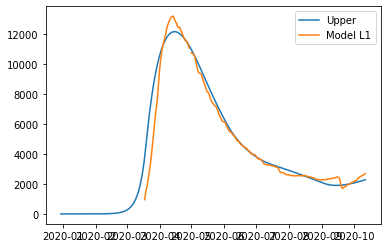

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08307235440515207, 'other': 0.12312234017368173, 'school': 0.050721704909885916, 'transport': 0.3315466942418459, 'work': 0.2322095693042916}
June1-June30 {'home': 1.0, 'leisure': 0.17167214696741628, 'other': 0.15027671749626917, 'school': 0.45624720447799905, 'transport': 0.5431298756553677, 'work': 0.2322095693042916}
July1-Aug31 {'home': 1.0, 'leisure': 0.17167214696741628, 'other': 0.15027671749626917, 'school': 0.45624720447799905, 'transport': 0.5431298756553677, 'work': 0.2322095693042916}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.17659553346165457, 'other': 0.20812074680675402, 'school': 0.7769623711409369, 'transport': 0.6788956368150276, 'work': 0.7493985423321243}
alpha1 0.3 alpha2 0.7
3734.4345905585

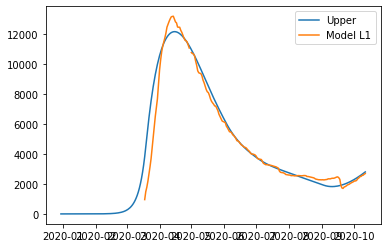

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.06766759711793525, 'other': 0.11137978474024948, 'school': 0.07918874468189525, 'transport': 0.3303279482595793, 'work': 0.24698506321135702}
June1-June30 {'home': 1.0, 'leisure': 0.13360755856574896, 'other': 0.17567105068254957, 'school': 0.3444537868596525, 'transport': 0.618962587710916, 'work': 0.24698506321135702}
July1-Aug31 {'home': 1.0, 'leisure': 0.13360755856574896, 'other': 0.17567105068254957, 'school': 0.3444537868596525, 'transport': 0.618962587710916, 'work': 0.24698506321135702}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.30916093143357526, 'other': 0.26405794588033615, 'school': 0.9935778251699359, 'transport': 0.7035619547304328, 'work': 0.6816449704547967}
alpha1 0.3 alpha2 0.7


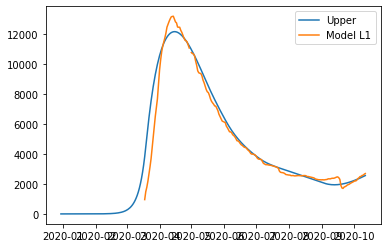

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.09431774954510631, 'other': 0.12086880316098006, 'school': 0.05090154526584238, 'transport': 0.3727440646797012, 'work': 0.24151709664669585}
June1-June30 {'home': 1.0, 'leisure': 0.1911380848625061, 'other': 0.16604021169426017, 'school': 0.3071755133705526, 'transport': 0.4158162485466012, 'work': 0.24151709664669585}
July1-Aug31 {'home': 1.0, 'leisure': 0.1911380848625061, 'other': 0.16604021169426017, 'school': 0.3071755133705526, 'transport': 0.4158162485466012, 'work': 0.24151709664669585}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.26432641612719165, 'other': 0.18723069784057197, 'school': 0.9120752600488558, 'transport': 0.7128055135879895, 'work': 0.7194631925084072}
alpha1 0.3 alpha2 0.7
3692.288303276922

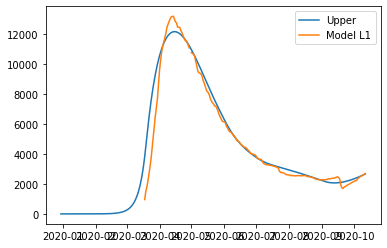

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07773930059602405, 'other': 0.11660925137648143, 'school': 0.016226832041619087, 'transport': 0.36927214454462554, 'work': 0.23425228460327016}
June1-June30 {'home': 1.0, 'leisure': 0.2045876128184834, 'other': 0.13991359383157498, 'school': 0.35803237990329795, 'transport': 0.6315385592879462, 'work': 0.23425228460327016}
July1-Aug31 {'home': 1.0, 'leisure': 0.2045876128184834, 'other': 0.13991359383157498, 'school': 0.35803237990329795, 'transport': 0.6315385592879462, 'work': 0.23425228460327016}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.2954465633292406, 'other': 0.1588317138060983, 'school': 0.8502652755142053, 'transport': 0.7522305332515569, 'work': 0.7164404587606688}
alpha1 0.3 alpha2 0.7
3748.2924334804

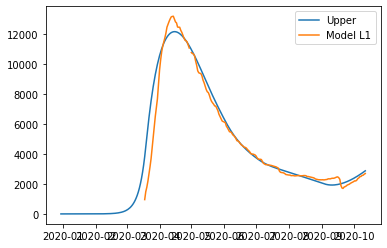

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.06851425995153895, 'other': 0.10779717426773042, 'school': 0.024545843877848028, 'transport': 0.5033110711606015, 'work': 0.2381817862898863}
June1-June30 {'home': 1.0, 'leisure': 0.18697644552376824, 'other': 0.13509361123000183, 'school': 0.3111608786962051, 'transport': 0.6465794873385549, 'work': 0.2381817862898863}
July1-Aug31 {'home': 1.0, 'leisure': 0.18697644552376824, 'other': 0.13509361123000183, 'school': 0.3111608786962051, 'transport': 0.6465794873385549, 'work': 0.2381817862898863}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.40215214879182803, 'other': 0.15482738782623096, 'school': 0.8136330766258928, 'transport': 0.7738233174054461, 'work': 0.7433639053718933}
alpha1 0.3 alpha2 0.7
3742.203103894561

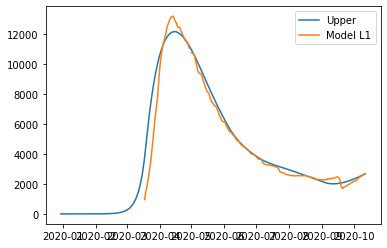

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08692845034360593, 'other': 0.11480637659001379, 'school': 0.009088438710749908, 'transport': 0.42062785272050196, 'work': 0.23186562338639982}
June1-June30 {'home': 1.0, 'leisure': 0.1890130844346803, 'other': 0.15841445169633273, 'school': 0.367015939966407, 'transport': 0.6402691157371441, 'work': 0.23186562338639982}
July1-Aug31 {'home': 1.0, 'leisure': 0.1890130844346803, 'other': 0.15841445169633273, 'school': 0.367015939966407, 'transport': 0.6402691157371441, 'work': 0.23186562338639982}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.2514576928823706, 'other': 0.19469900701455697, 'school': 0.7368895954857527, 'transport': 0.783871383031993, 'work': 0.7898401798219781}
alpha1 0.3 alpha2 0.7
3673.7484918450587


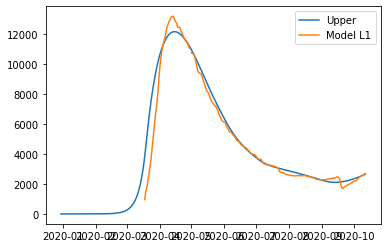

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07895025612341422, 'other': 0.11710635851862704, 'school': 0.020996838470153385, 'transport': 0.4277721095292521, 'work': 0.2462002974180682}
June1-June30 {'home': 1.0, 'leisure': 0.2202954870797631, 'other': 0.11851986534703182, 'school': 0.2912683714537057, 'transport': 0.49844789872943873, 'work': 0.2462002974180682}
July1-Aug31 {'home': 1.0, 'leisure': 0.2202954870797631, 'other': 0.11851986534703182, 'school': 0.2912683714537057, 'transport': 0.49844789872943873, 'work': 0.2462002974180682}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.31712751394123473, 'other': 0.12816656135017163, 'school': 0.8714503908824318, 'transport': 0.6233684257243735, 'work': 0.7148923123919325}
alpha1 0.3 alpha2 0.7
3701.241051471036

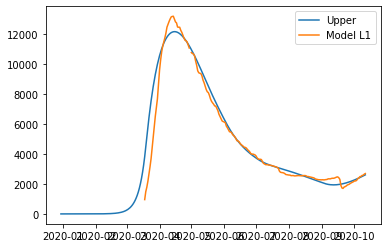

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.06763879845371008, 'other': 0.11113823786649203, 'school': 0.03418099031460626, 'transport': 0.43881983894896026, 'work': 0.23934420984546875}
June1-June30 {'home': 1.0, 'leisure': 0.15980726287397984, 'other': 0.1331244745397026, 'school': 0.49962131535010945, 'transport': 0.5227800493631676, 'work': 0.23934420984546875}
July1-Aug31 {'home': 1.0, 'leisure': 0.15980726287397984, 'other': 0.1331244745397026, 'school': 0.49962131535010945, 'transport': 0.5227800493631676, 'work': 0.23934420984546875}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.444191138978023, 'other': 0.166314342513371, 'school': 0.7835135813864287, 'transport': 0.670628827342751, 'work': 0.6291605114230816}
alpha1 0.3 alpha2 0.7
3678.771085644391
e

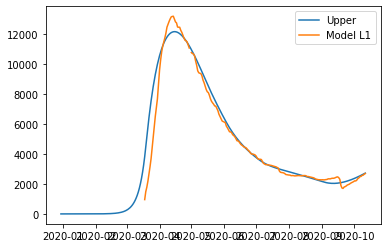

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07940648943015172, 'other': 0.13165926327364594, 'school': 0.03713653994438962, 'transport': 0.30290658238978363, 'work': 0.24708954288374296}
June1-June30 {'home': 1.0, 'leisure': 0.20789140257771058, 'other': 0.13833738397862078, 'school': 0.25082511047045264, 'transport': 0.5030743753593463, 'work': 0.24708954288374296}
July1-Aug31 {'home': 1.0, 'leisure': 0.20789140257771058, 'other': 0.13833738397862078, 'school': 0.25082511047045264, 'transport': 0.5030743753593463, 'work': 0.24708954288374296}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.36737402738024916, 'other': 0.17595259610980335, 'school': 0.8484091986754441, 'transport': 0.5829008184460991, 'work': 0.6776817041422056}
alpha1 0.3 alpha2 0.7
3678.6975922

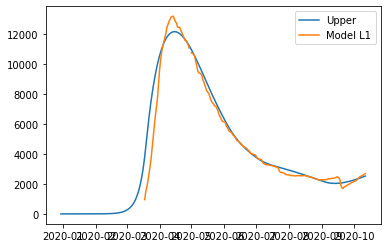

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.0813844401367379, 'other': 0.11344007519188591, 'school': 0.07612201751876253, 'transport': 0.38265108634842143, 'work': 0.23021200456738075}
June1-June30 {'home': 1.0, 'leisure': 0.22599488790946015, 'other': 0.12448168240093054, 'school': 0.38273270530821973, 'transport': 0.43882509122153956, 'work': 0.23021200456738075}
July1-Aug31 {'home': 1.0, 'leisure': 0.22599488790946015, 'other': 0.12448168240093054, 'school': 0.38273270530821973, 'transport': 0.43882509122153956, 'work': 0.23021200456738075}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.35220490160784634, 'other': 0.15717150886852313, 'school': 0.6949546104318538, 'transport': 0.5466711548970555, 'work': 0.7232530179628639}
alpha1 0.3 alpha2 0.7


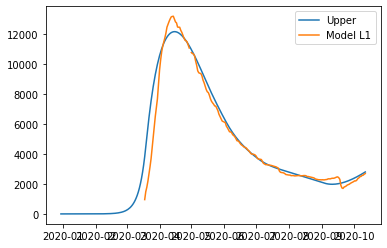

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.0903871576973043, 'other': 0.11559795579613522, 'school': 0.005713034737723376, 'transport': 0.3888915231272547, 'work': 0.2463559912936311}
June1-June30 {'home': 1.0, 'leisure': 0.18862864467747084, 'other': 0.1509872516860683, 'school': 0.24935851173698978, 'transport': 0.5855972125549038, 'work': 0.2463559912936311}
July1-Aug31 {'home': 1.0, 'leisure': 0.18862864467747084, 'other': 0.1509872516860683, 'school': 0.24935851173698978, 'transport': 0.5855972125549038, 'work': 0.2463559912936311}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3302067258326792, 'other': 0.19570140804428288, 'school': 0.808710625428479, 'transport': 0.70017852060859, 'work': 0.7349610595719358}
alpha1 0.3 alpha2 0.7
3685.5879176163808
err

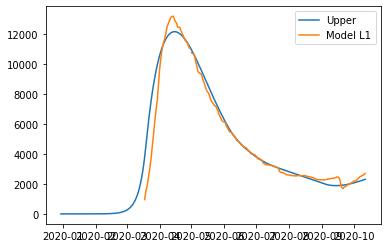

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.0759548725486286, 'other': 0.11619988158254192, 'school': 0.07240104801201748, 'transport': 0.3148312945136913, 'work': 0.2295531906241514}
June1-June30 {'home': 1.0, 'leisure': 0.2054848304830638, 'other': 0.17861233443278773, 'school': 0.2375604767336043, 'transport': 0.5781631917444028, 'work': 0.2295531906241514}
July1-Aug31 {'home': 1.0, 'leisure': 0.2054848304830638, 'other': 0.17861233443278773, 'school': 0.2375604767336043, 'transport': 0.5781631917444028, 'work': 0.2295531906241514}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3072110531900204, 'other': 0.18838160350278232, 'school': 0.7308798145455917, 'transport': 0.6256421825589144, 'work': 0.6780046903626668}
alpha1 0.3 alpha2 0.7


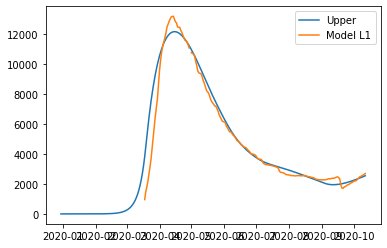

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.06802724172804506, 'other': 0.102610920474881, 'school': 0.04665071726405354, 'transport': 0.47406390689805455, 'work': 0.25037457777821526}
June1-June30 {'home': 1.0, 'leisure': 0.11052990682660879, 'other': 0.12466487132049059, 'school': 0.614599735178904, 'transport': 0.5858293445604765, 'work': 0.25037457777821526}
July1-Aug31 {'home': 1.0, 'leisure': 0.11052990682660879, 'other': 0.12466487132049059, 'school': 0.614599735178904, 'transport': 0.5858293445604765, 'work': 0.25037457777821526}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.23851377546784877, 'other': 0.24106457853787708, 'school': 0.7346159709706124, 'transport': 0.7058337952784327, 'work': 0.741063249830136}
alpha1 0.3 alpha2 0.7
3705.4713595336043


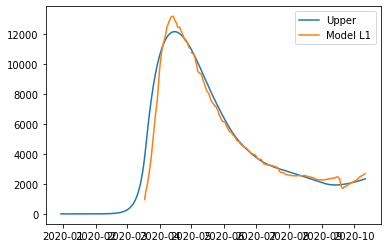

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07193547252129111, 'other': 0.11679825851206826, 'school': 0.038710137433639845, 'transport': 0.4283515728596715, 'work': 0.2473888502329635}
June1-June30 {'home': 1.0, 'leisure': 0.17274489020988687, 'other': 0.15117042701641004, 'school': 0.3457100718561125, 'transport': 0.48318072792924593, 'work': 0.2473888502329635}
July1-Aug31 {'home': 1.0, 'leisure': 0.17274489020988687, 'other': 0.15117042701641004, 'school': 0.3457100718561125, 'transport': 0.48318072792924593, 'work': 0.2473888502329635}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.2467738540131919, 'other': 0.20201286539803226, 'school': 0.7300925366547139, 'transport': 0.5871464183293135, 'work': 0.7152606823505743}
alpha1 0.3 alpha2 0.7
3686.63543712258

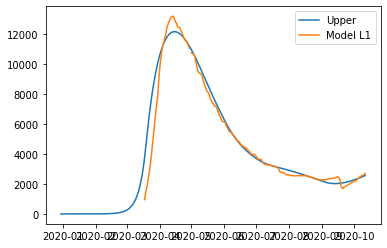

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.0705907314126845, 'other': 0.11741994274949728, 'school': 0.03827407284149945, 'transport': 0.3825324389473699, 'work': 0.22968806248821633}
June1-June30 {'home': 1.0, 'leisure': 0.21288269940446192, 'other': 0.12645146176016878, 'school': 0.45854507329567346, 'transport': 0.41442193904523056, 'work': 0.22968806248821633}
July1-Aug31 {'home': 1.0, 'leisure': 0.21288269940446192, 'other': 0.12645146176016878, 'school': 0.45854507329567346, 'transport': 0.41442193904523056, 'work': 0.22968806248821633}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.38557488166769216, 'other': 0.13515718359928153, 'school': 0.8026540240124656, 'transport': 0.45742437429566485, 'work': 0.7087800358541656}
alpha1 0.3 alpha2 0.7
3684.741607

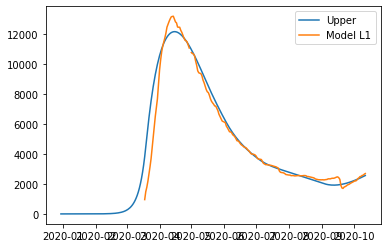

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.0728965306126334, 'other': 0.11899315905768748, 'school': 0.06222002119013546, 'transport': 0.43598791281724514, 'work': 0.23524887915975498}
June1-June30 {'home': 1.0, 'leisure': 0.21340850362446268, 'other': 0.14614435502377865, 'school': 0.25821320390908015, 'transport': 0.48602732099405976, 'work': 0.23524887915975498}
July1-Aug31 {'home': 1.0, 'leisure': 0.21340850362446268, 'other': 0.14614435502377865, 'school': 0.25821320390908015, 'transport': 0.48602732099405976, 'work': 0.23524887915975498}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.37056437633378814, 'other': 0.1780253474617108, 'school': 0.7866285702415536, 'transport': 0.5961778554036169, 'work': 0.6922183317717394}
alpha1 0.3 alpha2 0.7
3683.6287430

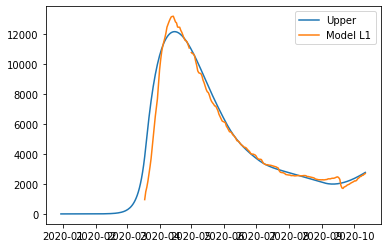

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07559140820219926, 'other': 0.10756646723916433, 'school': 0.02687990446168603, 'transport': 0.4367199577490867, 'work': 0.23649846448356415}
June1-June30 {'home': 1.0, 'leisure': 0.23144438662220404, 'other': 0.11980286035507302, 'school': 0.15576629549974785, 'transport': 0.7296282334595868, 'work': 0.23649846448356415}
July1-Aug31 {'home': 1.0, 'leisure': 0.23144438662220404, 'other': 0.11980286035507302, 'school': 0.15576629549974785, 'transport': 0.7296282334595868, 'work': 0.23649846448356415}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3502592207848647, 'other': 0.15350448191085214, 'school': 0.8510251328270486, 'transport': 0.7419741736060266, 'work': 0.7189167995715302}
alpha1 0.3 alpha2 0.7


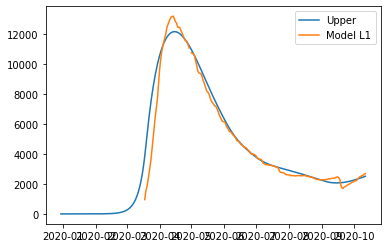

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07560783761981155, 'other': 0.11688314165274884, 'school': 0.02827698948105782, 'transport': 0.4411504052994254, 'work': 0.23154011159032606}
June1-June30 {'home': 1.0, 'leisure': 0.24384122177835202, 'other': 0.13176495741858346, 'school': 0.23820391137593733, 'transport': 0.5900886732276278, 'work': 0.23154011159032606}
July1-Aug31 {'home': 1.0, 'leisure': 0.24384122177835202, 'other': 0.13176495741858346, 'school': 0.23820391137593733, 'transport': 0.5900886732276278, 'work': 0.23154011159032606}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.2636217880394497, 'other': 0.14692909810970367, 'school': 0.9126661062683477, 'transport': 0.6714129971654075, 'work': 0.6971680717590557}
alpha1 0.3 alpha2 0.7
3698.464125255

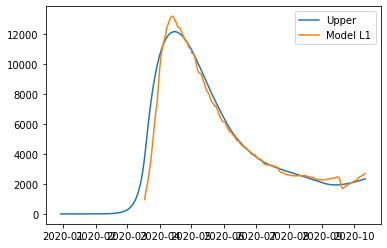

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07683127806144958, 'other': 0.12514958311905283, 'school': 0.030679829527951945, 'transport': 0.3277055128137613, 'work': 0.2513546146532656}
June1-June30 {'home': 1.0, 'leisure': 0.16041416598645747, 'other': 0.16542860701205428, 'school': 0.29834677884745764, 'transport': 0.5822487060177184, 'work': 0.2513546146532656}
July1-Aug31 {'home': 1.0, 'leisure': 0.16041416598645747, 'other': 0.16542860701205428, 'school': 0.29834677884745764, 'transport': 0.5822487060177184, 'work': 0.2513546146532656}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.1943946686299893, 'other': 0.22878099248148395, 'school': 0.7604925936408586, 'transport': 0.7582141350105034, 'work': 0.6896129422378405}
alpha1 0.3 alpha2 0.7
3656.24188145371

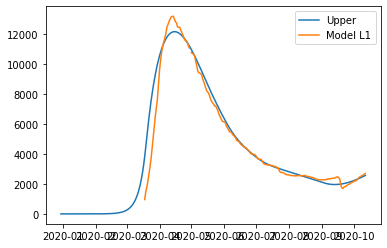

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08327984692122492, 'other': 0.12126649166443408, 'school': 0.03409508383404883, 'transport': 0.40139778297361284, 'work': 0.2330024037379938}
June1-June30 {'home': 1.0, 'leisure': 0.22433349039021794, 'other': 0.1390033972292644, 'school': 0.22352742724257335, 'transport': 0.6021067782874574, 'work': 0.2330024037379938}
July1-Aug31 {'home': 1.0, 'leisure': 0.22433349039021794, 'other': 0.1390033972292644, 'school': 0.22352742724257335, 'transport': 0.6021067782874574, 'work': 0.2330024037379938}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3713298552135822, 'other': 0.17629451217303113, 'school': 0.9107975524737284, 'transport': 0.7808481999341648, 'work': 0.5955059952588386}
alpha1 0.3 alpha2 0.7


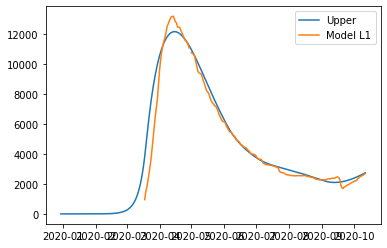

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.06693529196464512, 'other': 0.1123103275640703, 'school': 0.030383798859456537, 'transport': 0.4394096161514011, 'work': 0.22451025376814393}
June1-June30 {'home': 1.0, 'leisure': 0.24709509496526358, 'other': 0.13392302048613006, 'school': 0.2803428938605442, 'transport': 0.6258115791926702, 'work': 0.22451025376814393}
July1-Aug31 {'home': 1.0, 'leisure': 0.24709509496526358, 'other': 0.13392302048613006, 'school': 0.2803428938605442, 'transport': 0.6258115791926702, 'work': 0.22451025376814393}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.30444718033733, 'other': 0.14918819695709845, 'school': 0.9236190259971688, 'transport': 0.807919014129703, 'work': 0.6977174374965935}
alpha1 0.3 alpha2 0.7
3768.0219025092692


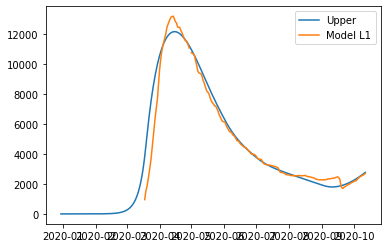

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07920313996287538, 'other': 0.11704049060238265, 'school': 0.0619802570243882, 'transport': 0.4580232267384776, 'work': 0.2258759333798482}
June1-June30 {'home': 1.0, 'leisure': 0.2264224757258296, 'other': 0.15769885608361658, 'school': 0.15074885915298736, 'transport': 0.5411835937219489, 'work': 0.2258759333798482}
July1-Aug31 {'home': 1.0, 'leisure': 0.2264224757258296, 'other': 0.15769885608361658, 'school': 0.15074885915298736, 'transport': 0.5411835937219489, 'work': 0.2258759333798482}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.34575337800413697, 'other': 0.1896154436622441, 'school': 0.922181028532239, 'transport': 0.5705796248646542, 'work': 0.7867985429906128}
alpha1 0.3 alpha2 0.7
3721.3651848242953
er

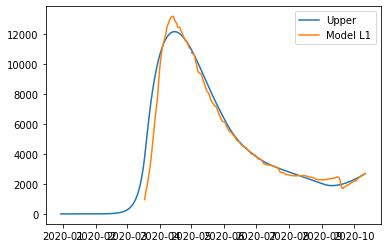

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07742046200714327, 'other': 0.1170487524736738, 'school': 0.02693323324525481, 'transport': 0.29374838158271815, 'work': 0.2596798288442302}
June1-June30 {'home': 1.0, 'leisure': 0.10083136646960507, 'other': 0.2041733785944555, 'school': 0.39012098907355525, 'transport': 0.555460542271053, 'work': 0.2596798288442302}


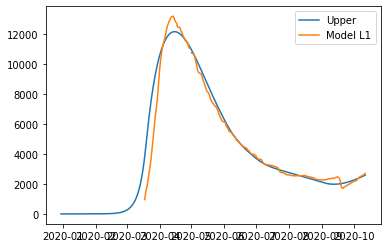

July1-Aug31 {'home': 1.0, 'leisure': 0.10083136646960507, 'other': 0.2041733785944555, 'school': 0.39012098907355525, 'transport': 0.555460542271053, 'work': 0.2596798288442302}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3278178193554696, 'other': 0.22217693336592448, 'school': 0.7471102698330391, 'transport': 0.8128533696277093, 'work': 0.7106673840433293}
Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
alpha1 0.3 alpha2 0.7
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08178062841616826, 'other': 0.12102286791166378, 'school': 0.021520364346403448, 'transport': 0.35396480521747203, 'work': 0.2267973225652066}
June1-June30 {'home': 1.0, 'leisure': 0.2634484975097522, 'other': 0.14366273049670752, 'school': 0.14240844156929774, 'transport': 0.5002470886781338, 'work': 0.2267973225652066}
July1-Aug31 {'home

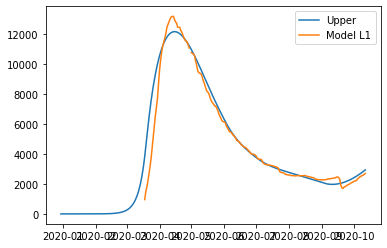

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07525083124483645, 'other': 0.11784021594536961, 'school': 0.03466506456633732, 'transport': 0.36500690824345605, 'work': 0.23356895782908899}
June1-June30 {'home': 1.0, 'leisure': 0.22858020670582124, 'other': 0.1475945690644807, 'school': 0.11703656366367193, 'transport': 0.7396425876702791, 'work': 0.23356895782908899}
July1-Aug31 {'home': 1.0, 'leisure': 0.22858020670582124, 'other': 0.1475945690644807, 'school': 0.11703656366367193, 'transport': 0.7396425876702791, 'work': 0.23356895782908899}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.4307296786322422, 'other': 0.15862976710686988, 'school': 0.9339258979001306, 'transport': 0.7825786849873696, 'work': 0.659736307504501}
alpha1 0.3 alpha2 0.7
3716.51465443538

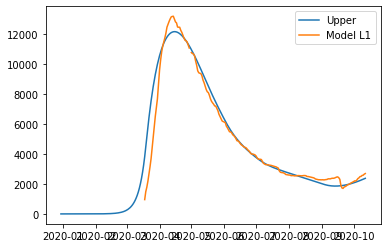

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07509948747038699, 'other': 0.11638398969021571, 'school': 0.05602995681743849, 'transport': 0.39537055204986515, 'work': 0.23462006075912134}
June1-June30 {'home': 1.0, 'leisure': 0.21196743966360673, 'other': 0.15376154905475867, 'school': 0.18495041742584875, 'transport': 0.5903978422467424, 'work': 0.23462006075912134}
July1-Aug31 {'home': 1.0, 'leisure': 0.21196743966360673, 'other': 0.15376154905475867, 'school': 0.18495041742584875, 'transport': 0.5903978422467424, 'work': 0.23462006075912134}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.28715272768573863, 'other': 0.18418687928647293, 'school': 0.9031649228653513, 'transport': 0.7668008961836479, 'work': 0.6447347858609431}
alpha1 0.3 alpha2 0.7
3667.1986588

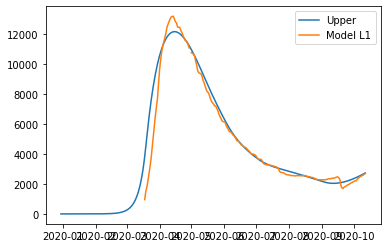

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08685507315004312, 'other': 0.1098829401491277, 'school': 0.01731046871911744, 'transport': 0.3953168203865967, 'work': 0.24171849951822455}
June1-June30 {'home': 1.0, 'leisure': 0.20985132612383306, 'other': 0.1465547769785483, 'school': 0.2849562385424844, 'transport': 0.49185425352446344, 'work': 0.24171849951822455}
July1-Aug31 {'home': 1.0, 'leisure': 0.20985132612383306, 'other': 0.1465547769785483, 'school': 0.2849562385424844, 'transport': 0.49185425352446344, 'work': 0.24171849951822455}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.31046875905164817, 'other': 0.15731433848019125, 'school': 0.8603285074739077, 'transport': 0.8126889264420831, 'work': 0.7148308251744042}
alpha1 0.3 alpha2 0.7
3720.60027778379

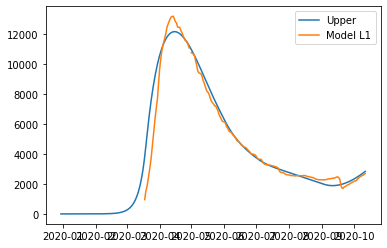

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07280971037403608, 'other': 0.11740014629121444, 'school': 0.0648998610177153, 'transport': 0.4226157964201088, 'work': 0.2185355108612306}
June1-June30 {'home': 1.0, 'leisure': 0.24457416296433662, 'other': 0.1401194154216902, 'school': 0.21877144037098992, 'transport': 0.5721943322753353, 'work': 0.2185355108612306}
July1-Aug31 {'home': 1.0, 'leisure': 0.24457416296433662, 'other': 0.1401194154216902, 'school': 0.21877144037098992, 'transport': 0.5721943322753353, 'work': 0.2185355108612306}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.37255048850781747, 'other': 0.14875240302982157, 'school': 0.9143687817151941, 'transport': 0.7330392221319763, 'work': 0.7663004942832712}
alpha1 0.3 alpha2 0.7
3722.7354752041565


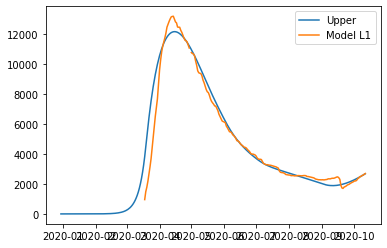

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07198919642524282, 'other': 0.12180448899417538, 'school': 0.04351148869531457, 'transport': 0.3555934168063323, 'work': 0.23808350185085228}
June1-June30 {'home': 1.0, 'leisure': 0.1963349697408796, 'other': 0.1531460774646226, 'school': 0.31914936637212027, 'transport': 0.39672014497838903, 'work': 0.23808350185085228}
July1-Aug31 {'home': 1.0, 'leisure': 0.1963349697408796, 'other': 0.1531460774646226, 'school': 0.31914936637212027, 'transport': 0.39672014497838903, 'work': 0.23808350185085228}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3326874384264411, 'other': 0.19729448884524514, 'school': 0.8490645290535168, 'transport': 0.5462473209337106, 'work': 0.7426418023620833}
alpha1 0.3 alpha2 0.7
3710.66873267417

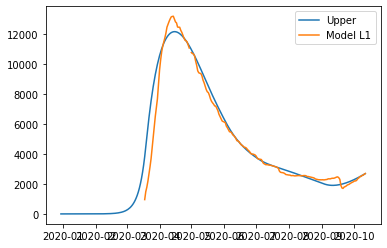

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.06973026158494851, 'other': 0.1088672455063247, 'school': 0.04337515982726306, 'transport': 0.5077799207321222, 'work': 0.22645065959382804}
June1-June30 {'home': 1.0, 'leisure': 0.19169830566583418, 'other': 0.1320947132074583, 'school': 0.4064959710605816, 'transport': 0.6107318020630997, 'work': 0.22645065959382804}
July1-Aug31 {'home': 1.0, 'leisure': 0.19169830566583418, 'other': 0.1320947132074583, 'school': 0.4064959710605816, 'transport': 0.6107318020630997, 'work': 0.22645065959382804}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.27244405691607343, 'other': 0.22756923501129817, 'school': 0.7901009587960254, 'transport': 0.6225449016549216, 'work': 0.7883935112043231}
alpha1 0.3 alpha2 0.7
3695.2720799600993

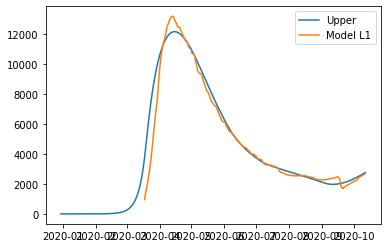

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.0750233561702334, 'other': 0.12663355616077265, 'school': 0.07917867611080699, 'transport': 0.2798207860088666, 'work': 0.2295531906241514}
June1-June30 {'home': 1.0, 'leisure': 0.2217029019841092, 'other': 0.12869096538521496, 'school': 0.32514075738330805, 'transport': 0.5174058450704495, 'work': 0.2295531906241514}
July1-Aug31 {'home': 1.0, 'leisure': 0.2217029019841092, 'other': 0.12869096538521496, 'school': 0.32514075738330805, 'transport': 0.5174058450704495, 'work': 0.2295531906241514}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3152854017199721, 'other': 0.2009914446343399, 'school': 0.877199234497357, 'transport': 0.6447029406590892, 'work': 0.7314273026490937}
alpha1 0.3 alpha2 0.7
3684.949226047034
erro

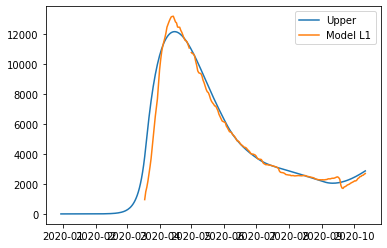

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07517610831011581, 'other': 0.12791946393838652, 'school': 0.025746997386924503, 'transport': 0.329928462491673, 'work': 0.21953763523815525}
June1-June30 {'home': 1.0, 'leisure': 0.26472926613491654, 'other': 0.15707440783302873, 'school': 0.21183778812033954, 'transport': 0.49724140765167435, 'work': 0.21953763523815525}
July1-Aug31 {'home': 1.0, 'leisure': 0.26472926613491654, 'other': 0.15707440783302873, 'school': 0.21183778812033954, 'transport': 0.49724140765167435, 'work': 0.21953763523815525}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3471296164780595, 'other': 0.19299556864061718, 'school': 0.8492793242401788, 'transport': 0.7175747348355477, 'work': 0.7063532295397469}
alpha1 0.3 alpha2 0.7
3648.8454443

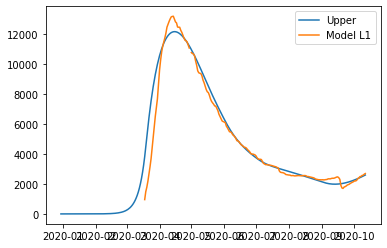

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08102280451334204, 'other': 0.11496153467531664, 'school': 0.014378408820999871, 'transport': 0.43028790628055386, 'work': 0.2296212660086705}
June1-June30 {'home': 1.0, 'leisure': 0.22889496394900904, 'other': 0.12398909346503298, 'school': 0.2717897066670337, 'transport': 0.635361885725154, 'work': 0.2296212660086705}
July1-Aug31 {'home': 1.0, 'leisure': 0.22889496394900904, 'other': 0.12398909346503298, 'school': 0.2717897066670337, 'transport': 0.635361885725154, 'work': 0.2296212660086705}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.25316460123746076, 'other': 0.13055457733372883, 'school': 0.9655836328586902, 'transport': 0.8359840193836046, 'work': 0.7392536407895325}
alpha1 0.3 alpha2 0.7
3683.480959999075


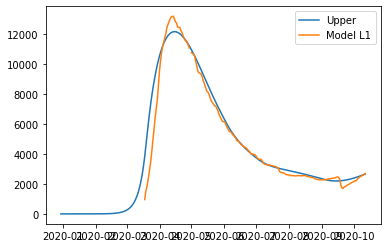

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08565608562013363, 'other': 0.12095539011635634, 'school': 0.032460234603618625, 'transport': 0.293391973387098, 'work': 0.2434247432767959}
June1-June30 {'home': 1.0, 'leisure': 0.26297839931147027, 'other': 0.1334077826684642, 'school': 0.16045622001254697, 'transport': 0.44715183079047505, 'work': 0.2434247432767959}
July1-Aug31 {'home': 1.0, 'leisure': 0.26297839931147027, 'other': 0.1334077826684642, 'school': 0.16045622001254697, 'transport': 0.44715183079047505, 'work': 0.2434247432767959}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.2812587263068616, 'other': 0.13890637050276627, 'school': 0.9490864432842038, 'transport': 0.5686848494813902, 'work': 0.6878193812018368}
alpha1 0.3 alpha2 0.7
3696.337942836461

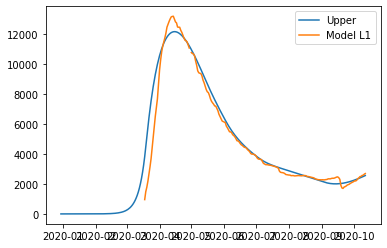

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.09372216155414782, 'other': 0.12146263719272475, 'school': 0.04102164919034466, 'transport': 0.4452023102136201, 'work': 0.22452952697323145}
June1-June30 {'home': 1.0, 'leisure': 0.26139938205002883, 'other': 0.13652459633249003, 'school': 0.16099898806588941, 'transport': 0.5848086671604904, 'work': 0.22452952697323145}
July1-Aug31 {'home': 1.0, 'leisure': 0.26139938205002883, 'other': 0.13652459633249003, 'school': 0.16099898806588941, 'transport': 0.5848086671604904, 'work': 0.22452952697323145}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.28350273783443886, 'other': 0.15187229792167814, 'school': 0.9126661062683477, 'transport': 0.6920010213362897, 'work': 0.7207781636553369}
alpha1 0.3 alpha2 0.7
3663.30949231

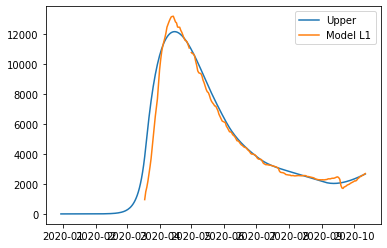

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.09710605115330297, 'other': 0.12427966841242685, 'school': 0.011298777868490317, 'transport': 0.3867020025098908, 'work': 0.22838553211164336}
June1-June30 {'home': 1.0, 'leisure': 0.265991476618743, 'other': 0.1665129864825508, 'school': 0.07072700691374953, 'transport': 0.5297764190802616, 'work': 0.22838553211164336}
July1-Aug31 {'home': 1.0, 'leisure': 0.265991476618743, 'other': 0.1665129864825508, 'school': 0.07072700691374953, 'transport': 0.5297764190802616, 'work': 0.22838553211164336}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.32198440160585917, 'other': 0.19263517919122625, 'school': 0.7623230510012182, 'transport': 0.5973339081105429, 'work': 0.7223800154241227}
alpha1 0.3 alpha2 0.7
3662.7277079125197

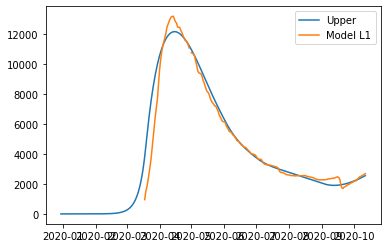

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.06878641874189917, 'other': 0.12463518115220497, 'school': 0.07967219989839293, 'transport': 0.3887993250423921, 'work': 0.2217749439842523}
June1-June30 {'home': 1.0, 'leisure': 0.24724611989528114, 'other': 0.12983576364080984, 'school': 0.19859227422311787, 'transport': 0.6072815480063514, 'work': 0.2217749439842523}
July1-Aug31 {'home': 1.0, 'leisure': 0.24724611989528114, 'other': 0.12983576364080984, 'school': 0.19859227422311787, 'transport': 0.6072815480063514, 'work': 0.2217749439842523}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.28965824974489074, 'other': 0.24014529955433103, 'school': 0.911523925686067, 'transport': 0.7706564786167059, 'work': 0.6288568515373232}
alpha1 0.3 alpha2 0.7
3715.721405398431

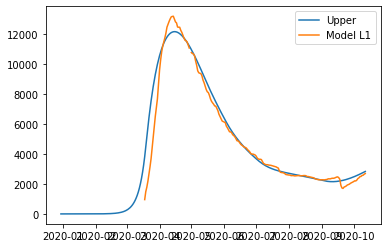

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.06748964165749036, 'other': 0.12115117915466932, 'school': 0.004027154309320238, 'transport': 0.3540725818620711, 'work': 0.27131392108550206}
June1-June30 {'home': 1.0, 'leisure': 0.2124637126415525, 'other': 0.13155862630520704, 'school': 0.06547555305079741, 'transport': 0.5334475445440435, 'work': 0.27131392108550206}
July1-Aug31 {'home': 1.0, 'leisure': 0.2124637126415525, 'other': 0.13155862630520704, 'school': 0.06547555305079741, 'transport': 0.5334475445440435, 'work': 0.27131392108550206}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.29322006845913806, 'other': 0.15819931590653383, 'school': 0.8563264861025792, 'transport': 0.6854223927614858, 'work': 0.7145115148795191}
alpha1 0.3 alpha2 0.7
3690.262530622

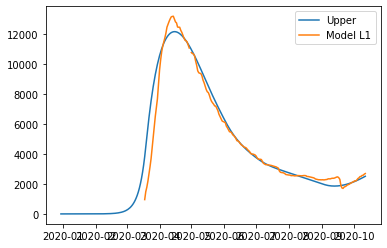

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.10063679817122047, 'other': 0.11718610634717513, 'school': 0.003990650065684134, 'transport': 0.3280556028186994, 'work': 0.22907243476328812}
June1-June30 {'home': 1.0, 'leisure': 0.21325024354209973, 'other': 0.16253585068107118, 'school': 0.2244091619692785, 'transport': 0.5644042681143017, 'work': 0.22907243476328812}
July1-Aug31 {'home': 1.0, 'leisure': 0.21325024354209973, 'other': 0.16253585068107118, 'school': 0.2244091619692785, 'transport': 0.5644042681143017, 'work': 0.22907243476328812}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3116213281718285, 'other': 0.19743793336141124, 'school': 0.9752472461534374, 'transport': 0.6671197231645745, 'work': 0.6508376589809598}
alpha1 0.3 alpha2 0.7


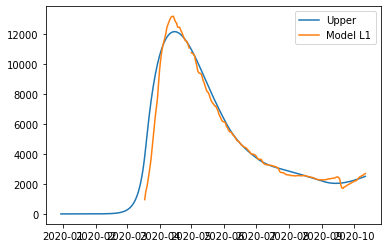

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08417245198241356, 'other': 0.11526676341150568, 'school': 0.07490192782355169, 'transport': 0.31775390900039235, 'work': 0.2271571218598442}
June1-June30 {'home': 1.0, 'leisure': 0.2655834340637685, 'other': 0.1475762886419379, 'school': 0.2219291153154827, 'transport': 0.3503356406125032, 'work': 0.2271571218598442}
July1-Aug31 {'home': 1.0, 'leisure': 0.2655834340637685, 'other': 0.1475762886419379, 'school': 0.2219291153154827, 'transport': 0.3503356406125032, 'work': 0.2271571218598442}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.2728863438436967, 'other': 0.26006501453791453, 'school': 0.8997961015010816, 'transport': 0.4685125501356923, 'work': 0.6077978385879684}
alpha1 0.3 alpha2 0.7
3681.0182572884737
err

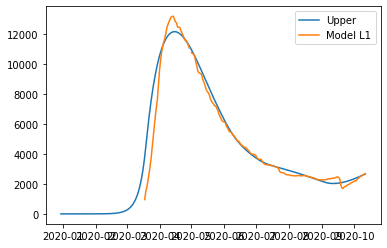

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08666644432172715, 'other': 0.11517596732470381, 'school': 0.06302635598820013, 'transport': 0.31980505457358155, 'work': 0.21999024609001958}
June1-June30 {'home': 1.0, 'leisure': 0.24714257253927338, 'other': 0.12500268610798063, 'school': 0.37156414616247224, 'transport': 0.43441868541177653, 'work': 0.21999024609001958}
July1-Aug31 {'home': 1.0, 'leisure': 0.24714257253927338, 'other': 0.12500268610798063, 'school': 0.37156414616247224, 'transport': 0.43441868541177653, 'work': 0.21999024609001958}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.2765204836837204, 'other': 0.21891934868228477, 'school': 0.7015617409055204, 'transport': 0.5170185316969712, 'work': 0.7815621257063061}
alpha1 0.3 alpha2 0.7
3608.276160

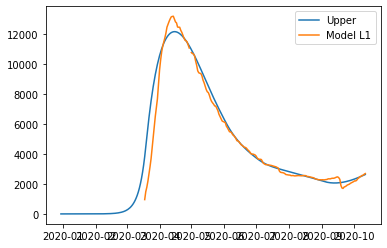

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08783653628440587, 'other': 0.11810907852437538, 'school': 0.05147127695219376, 'transport': 0.28565750469929196, 'work': 0.23426893626841291}
June1-June30 {'home': 1.0, 'leisure': 0.25690781326773837, 'other': 0.14856481963082463, 'school': 0.17695228862455442, 'transport': 0.41441632890504254, 'work': 0.23426893626841291}
July1-Aug31 {'home': 1.0, 'leisure': 0.25690781326773837, 'other': 0.14856481963082463, 'school': 0.17695228862455442, 'transport': 0.41441632890504254, 'work': 0.23426893626841291}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.2772513307446641, 'other': 0.25586634764514693, 'school': 0.9490864432842038, 'transport': 0.5655582481145863, 'work': 0.6003507304492094}
alpha1 0.3 alpha2 0.7
3670.520504

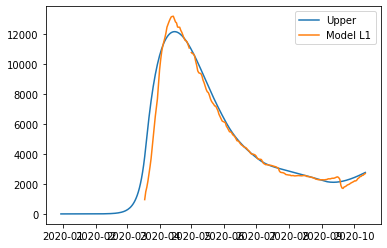

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.06971573963057029, 'other': 0.12188276810343891, 'school': 0.15911225059927186, 'transport': 0.2866486036933238, 'work': 0.23209971901080717}
June1-June30 {'home': 1.0, 'leisure': 0.27948774791155034, 'other': 0.12223003443125727, 'school': 0.18913443944900693, 'transport': 0.3249518458384416, 'work': 0.23209971901080717}
July1-Aug31 {'home': 1.0, 'leisure': 0.27948774791155034, 'other': 0.12223003443125727, 'school': 0.18913443944900693, 'transport': 0.3249518458384416, 'work': 0.23209971901080717}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.356284900418569, 'other': 0.2244764278660469, 'school': 0.7770134499325343, 'transport': 0.41021942615472007, 'work': 0.6878288000221084}
alpha1 0.3 alpha2 0.7
3662.4882638527

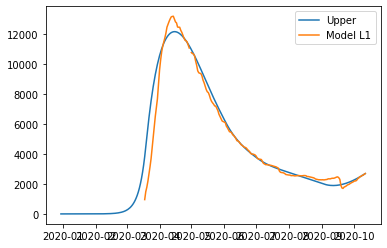

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07407320322080904, 'other': 0.12046399372762391, 'school': 0.04958672805368776, 'transport': 0.37678972488041385, 'work': 0.22410373772287753}
June1-June30 {'home': 1.0, 'leisure': 0.2338099064084961, 'other': 0.16159613087277236, 'school': 0.16895881779814456, 'transport': 0.6032488922449257, 'work': 0.22410373772287753}
July1-Aug31 {'home': 1.0, 'leisure': 0.2338099064084961, 'other': 0.16159613087277236, 'school': 0.16895881779814456, 'transport': 0.6032488922449257, 'work': 0.22410373772287753}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.29209441888338983, 'other': 0.21533947125979486, 'school': 0.9441196309756945, 'transport': 0.6494660874404458, 'work': 0.7185923871029516}
alpha1 0.3 alpha2 0.7


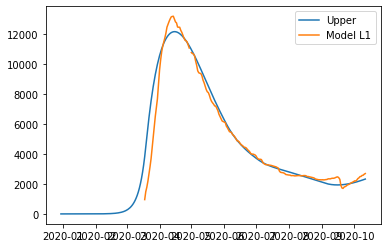

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07936579051386614, 'other': 0.11353304507325228, 'school': 0.08293671193793126, 'transport': 0.33424529887800025, 'work': 0.22105721556541857}
June1-June30 {'home': 1.0, 'leisure': 0.26226171929180875, 'other': 0.13351548564195964, 'school': 0.2288324949324151, 'transport': 0.46246457526193385, 'work': 0.22105721556541857}
July1-Aug31 {'home': 1.0, 'leisure': 0.26226171929180875, 'other': 0.13351548564195964, 'school': 0.2288324949324151, 'transport': 0.46246457526193385, 'work': 0.22105721556541857}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.29614456942692435, 'other': 0.24276900584625966, 'school': 0.9520686496309032, 'transport': 0.48954099670105056, 'work': 0.5499263135618322}
alpha1 0.3 alpha2 0.7
3645.273938

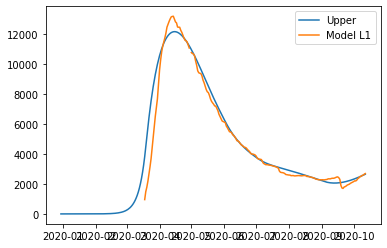

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07944283528885457, 'other': 0.10751383138311153, 'school': 0.047562243553033776, 'transport': 0.43095283305512616, 'work': 0.22509454208123303}
June1-June30 {'home': 1.0, 'leisure': 0.24880106511090885, 'other': 0.13969793230345262, 'school': 0.279813246209231, 'transport': 0.5019826364339717, 'work': 0.22509454208123303}
July1-Aug31 {'home': 1.0, 'leisure': 0.24880106511090885, 'other': 0.13969793230345262, 'school': 0.279813246209231, 'transport': 0.5019826364339717, 'work': 0.22509454208123303}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3528763776005489, 'other': 0.23281439684259667, 'school': 0.8668062301373349, 'transport': 0.551674637376134, 'work': 0.6041990053003585}
alpha1 0.3 alpha2 0.7
3700.239808029842

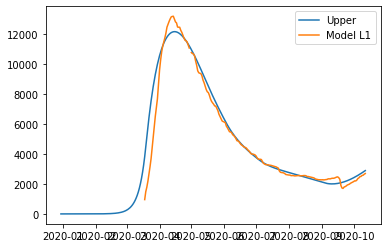

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08744352305601978, 'other': 0.11815401988281676, 'school': 0.07141629729065521, 'transport': 0.33830058749894487, 'work': 0.22585026546178918}
June1-June30 {'home': 1.0, 'leisure': 0.2802749734000858, 'other': 0.14604683360997398, 'school': 0.07199509108613837, 'transport': 0.4652403984504413, 'work': 0.22585026546178918}
July1-Aug31 {'home': 1.0, 'leisure': 0.2802749734000858, 'other': 0.14604683360997398, 'school': 0.07199509108613837, 'transport': 0.4652403984504413, 'work': 0.22585026546178918}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.2943359140548676, 'other': 0.264087446441521, 'school': 0.8909594463762771, 'transport': 0.5068653513037771, 'work': 0.7224395371659724}
alpha1 0.3 alpha2 0.7
3646.450418366284

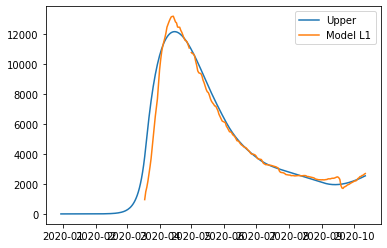

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.09133524927862603, 'other': 0.11290640807632724, 'school': 0.005888062386000321, 'transport': 0.4635346437812661, 'work': 0.22866761918931133}
June1-June30 {'home': 1.0, 'leisure': 0.2448865968657519, 'other': 0.14315289968281403, 'school': 0.15043046667813015, 'transport': 0.6140442115978428, 'work': 0.22866761918931133}
July1-Aug31 {'home': 1.0, 'leisure': 0.2448865968657519, 'other': 0.14315289968281403, 'school': 0.15043046667813015, 'transport': 0.6140442115978428, 'work': 0.22866761918931133}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.31050569841788794, 'other': 0.21651966423731767, 'school': 0.9600436489544218, 'transport': 0.7427614112175756, 'work': 0.5905762883004865}
alpha1 0.3 alpha2 0.7
3644.399885122

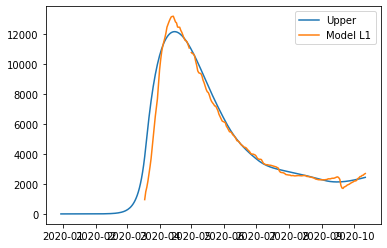

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08252708525603226, 'other': 0.11018019313711024, 'school': 0.06493731895845374, 'transport': 0.29150231823390227, 'work': 0.24971991694712764}
June1-June30 {'home': 1.0, 'leisure': 0.24622101884329323, 'other': 0.11910768944647662, 'school': 0.20341920697284555, 'transport': 0.392499380521078, 'work': 0.24971991694712764}
July1-Aug31 {'home': 1.0, 'leisure': 0.24622101884329323, 'other': 0.11910768944647662, 'school': 0.20341920697284555, 'transport': 0.392499380521078, 'work': 0.24971991694712764}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3016874389439584, 'other': 0.1792228642609566, 'school': 0.7588397593412641, 'transport': 0.6636881349606802, 'work': 0.6031811789355159}
alpha1 0.3 alpha2 0.7
3645.12099842615

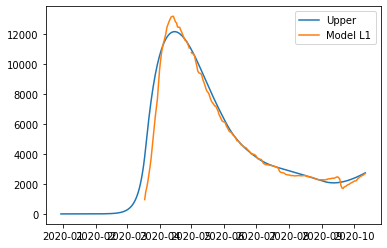

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.08198000963974847, 'other': 0.10613785989191966, 'school': 0.04221992170680908, 'transport': 0.4004327629460268, 'work': 0.2330024037379938}
June1-June30 {'home': 1.0, 'leisure': 0.23684137915239378, 'other': 0.14726798068089614, 'school': 0.20684150356902314, 'transport': 0.5995709409013523, 'work': 0.2330024037379938}
July1-Aug31 {'home': 1.0, 'leisure': 0.23684137915239378, 'other': 0.14726798068089614, 'school': 0.20684150356902314, 'transport': 0.5995709409013523, 'work': 0.2330024037379938}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.2844403328521325, 'other': 0.26741003347587033, 'school': 0.9107975524737284, 'transport': 0.6161938103672238, 'work': 0.6259641548201695}
alpha1 0.3 alpha2 0.7


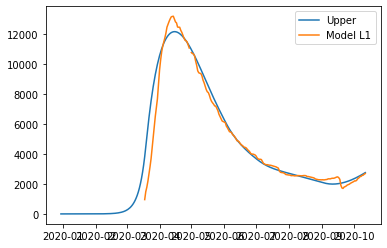

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.0725462164616512, 'other': 0.10395765088761914, 'school': 0.031752375222256365, 'transport': 0.3914461956653205, 'work': 0.24361188220896052}
June1-June30 {'home': 1.0, 'leisure': 0.2282523247846705, 'other': 0.15106531082570004, 'school': 0.1122473183219295, 'transport': 0.5597931484732961, 'work': 0.24361188220896052}
July1-Aug31 {'home': 1.0, 'leisure': 0.2282523247846705, 'other': 0.15106531082570004, 'school': 0.1122473183219295, 'transport': 0.5597931484732961, 'work': 0.24361188220896052}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.35195761149189597, 'other': 0.24719831482367988, 'school': 0.9237543753511147, 'transport': 0.76490101455401, 'work': 0.5614451934341411}
alpha1 0.3 alpha2 0.7
3637.482370060375
e

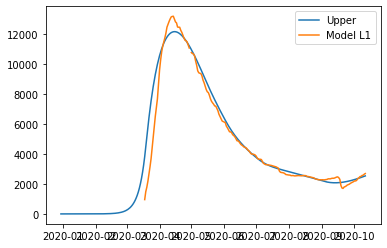

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.0823941226028064, 'other': 0.11287496221999556, 'school': 0.04082063588483403, 'transport': 0.45129934762698704, 'work': 0.24373225974599597}
June1-June30 {'home': 1.0, 'leisure': 0.2435572663804257, 'other': 0.12640534848456972, 'school': 0.17536285517852176, 'transport': 0.4748517406508459, 'work': 0.24373225974599597}
July1-Aug31 {'home': 1.0, 'leisure': 0.2435572663804257, 'other': 0.12640534848456972, 'school': 0.17536285517852176, 'transport': 0.4748517406508459, 'work': 0.24373225974599597}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.3174995673099963, 'other': 0.2459477577912286, 'school': 0.8262577045899886, 'transport': 0.5730049188890869, 'work': 0.5727522251988504}
alpha1 0.3 alpha2 0.7
3673.206538902119

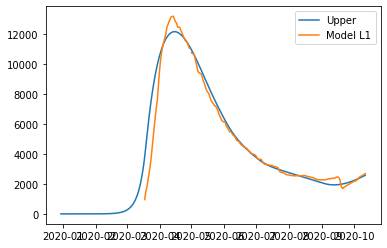

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.086618785629463, 'other': 0.1129032936308001, 'school': 0.0786669511634527, 'transport': 0.36213979996254875, 'work': 0.2377592025037913}
June1-June30 {'home': 1.0, 'leisure': 0.22740965690526863, 'other': 0.1351117888076501, 'school': 0.1783493525439733, 'transport': 0.5363591398610092, 'work': 0.2377592025037913}
July1-Aug31 {'home': 1.0, 'leisure': 0.22740965690526863, 'other': 0.1351117888076501, 'school': 0.1783493525439733, 'transport': 0.5363591398610092, 'work': 0.2377592025037913}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.29421404860238465, 'other': 0.2130409580246867, 'school': 0.9102493909819482, 'transport': 0.6854128957241868, 'work': 0.6624567973082777}
alpha1 0.3 alpha2 0.7
3645.97815149711
error_g

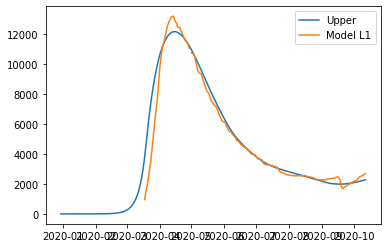

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07137523890351985, 'other': 0.11780861369659848, 'school': 0.006513423298084871, 'transport': 0.4973197799301902, 'work': 0.2382001590654779}
June1-June30 {'home': 1.0, 'leisure': 0.24527172975947056, 'other': 0.15954355624578248, 'school': 0.06019915739366687, 'transport': 0.6306964852315136, 'work': 0.2382001590654779}
July1-Aug31 {'home': 1.0, 'leisure': 0.24527172975947056, 'other': 0.15954355624578248, 'school': 0.06019915739366687, 'transport': 0.6306964852315136, 'work': 0.2382001590654779}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.2522036298681758, 'other': 0.1695769151998219, 'school': 0.9600436489544218, 'transport': 0.6902971501129909, 'work': 0.5842713155577803}
alpha1 0.3 alpha2 0.7
3624.659553201693

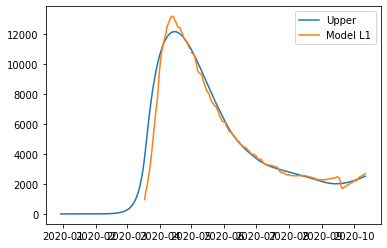

Before March 17 {'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
March17-May11 {'home': 1.0, 'leisure': 0.0663368073, 'other': 0.10000001, 'school': 0.0, 'transport': 0.278093696, 'work': 0.217293488}
May12-May30 {'home': 1.0, 'leisure': 0.07560445312452385, 'other': 0.11754570863047889, 'school': 0.04107690346480395, 'transport': 0.3289457128205215, 'work': 0.2295641445079895}
June1-June30 {'home': 1.0, 'leisure': 0.25773625405182926, 'other': 0.1427697995369405, 'school': 0.17212181059585507, 'transport': 0.5091845911002727, 'work': 0.2295641445079895}
July1-Aug31 {'home': 1.0, 'leisure': 0.25773625405182926, 'other': 0.1427697995369405, 'school': 0.17212181059585507, 'transport': 0.5091845911002727, 'work': 0.2295641445079895}
Sept1-Oct12 {'home': 1.0, 'leisure': 0.28430644251720283, 'other': 0.16659024650090742, 'school': 0.9798236387328513, 'transport': 0.529447125554813, 'work': 0.6694778947162935}
alpha1 0.3 alpha2 0.7


Process ForkPoolWorker-19:
Process ForkPoolWorker-27:
Process ForkPoolWorker-29:
Process ForkPoolWorker-20:
Process ForkPoolWorker-25:
Process ForkPoolWorker-24:
Process ForkPoolWorker-31:
Process ForkPoolWorker-17:
Process ForkPoolWorker-26:
Process ForkPoolWorker-32:
Process ForkPoolWorker-30:
Process ForkPoolWorker-21:
Process ForkPoolWorker-18:
Process ForkPoolWorker-23:
Process ForkPoolWorker-28:
Process ForkPoolWorker-22:


KeyboardInterrupt: 

In [28]:
from scipy.optimize import minimize, Bounds, shgo, differential_evolution, dual_annealing
epsilon = 0.1
result = differential_evolution(error, [(0,1)]*20, workers=-1)



In [22]:
best_v = [50.88753474,  0.26877947,  1.33454102,  1.48102971,  0.47847758, 10.14438959,
  0.51890012,  0.41202596,  0.17060711,  0.24185315,  0.25654917,  0.28517006,
  0.20474128,  0.16875515,  0.43551292,  0.05633155]

0.0033064996693500004
0.005534162394714904
0.009348850655232535
0.01537873063733888
0.023728622712360262
0.03443589303407403
0.04762678518989236
0.06358089720196425
0.08276786950556922
0.10587956944734175
0.1338681723682132
0.16799614758695414
0.20990280891813157
0.26169207484963486
0.3260468109223219
0.40637639158365235
0.5070058787828224
0.6334175130020481
0.7925581500089791
0.9932300039100357
1.2465867764370144
1.5667632260711417
1.9716737937705082
2.4840254806502235
3.1326023069561106
3.9538940549019492
4.994161475830896
6.312054819335675
7.981933802065308
10.098076724508584
12.78001656995996
16.179305359300255
20.488088282556877
25.94997056884885
32.87378817784679
41.65105503905201
52.77806321543082
66.88386848190865
84.76571516042216
107.43385606060559
136.1682243456675
172.59003530236714
218.7521610887128
277.25305563726226
351.380133818711
445.2898463199436
564.233242011257
714.8375452884766
905.4561144205865
1146.6009110348234
1451.4729667960514
1836.6066980851167
2262.3294441

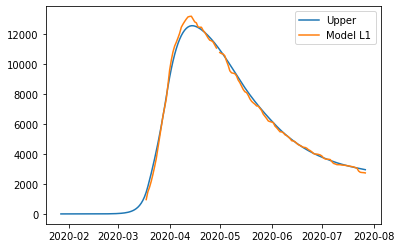

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3121477082805756, 'other': 0.3908749780564532, 'school': 0.23577417895540323, 'transport': 0.2531138724436288, 'work': 0.41202596}
{'home': 1.0, 'leisure': 0.33447910824320526, 'other': 0.4244556542976172, 'school': 0.2927800868886231, 'transport': 0.27991322103197747, 'work': 0.542919683963964}
{'home': 1.0, 'leisure': 0.3560129582071695, 'other': 0.45683702067302545, 'school': 0.3477500695385138, 'transport': 0.30575545002788507, 'work': 0.669138632072072}
{'home': 1.0, 'leisure': 0.3735590581778071, 'other': 0.4832218377196544, 'school': 0.392540425771758, 'transport': 0.3268120810615876, 'work': 0.771983700900901}
{'home': 1.0, 'leisure': 0.38392720816045656, 'other': 0.49881286597448055, 'school': 0.4190074544550387, 'transport': 0.33925463576332093, 'work': 0.832755787027027}
{'home': 1.0, 'leisure': 0.38951005815111395, 'other': 0.5072080350347715, 'school': 0.433

2798.055967994423

In [23]:
# v0 = (list(best_v[0:4]) + list(best_v[4]*initial_params["mu"]) + list(best_v[5]*initial_params['sigma']) + list(best_v[6]*initial_params['p_H'])+
#       list(best_v[7]*initial_params['p_ICU'])+list(best_v[8]*initial_params['lambda_H_R'])+list(best_v[9]*initial_params['lambda_H_D'])+
#     list(best_v[10]*initial_params['lambda_ICU_R'])+list(best_v[11]*initial_params['lambda_ICU_D']) + list(best_v[12:]))
v0 = best_v
error(best_v)

In [24]:
lb= ([50,windows['alpha_mixing'][0],windows['beta_mixing'][0],windows['gamma_mixing'][0],0,-50]+
                [0]*10)
ub = ([140,windows['alpha_mixing'][1],windows['beta_mixing'][1],windows['gamma_mixing'][1],0.5,50]+
                [1]*10)
for i in range(len(v0)):
    assert(v0[i]>=lb[i])
    assert(ub[i]>=v0[i])

2798.055886359947
violation 0
error_groups 1901.5072004844485
error_total 179.30973717509974
[50.88753474  0.26877948  1.33454102  1.48102971  0.47847758 10.14438959
  0.51890012  0.41202596  0.17060711  0.24185315  0.25654917  0.28517006
  0.20474128  0.16875515  0.43551292  0.05633155]


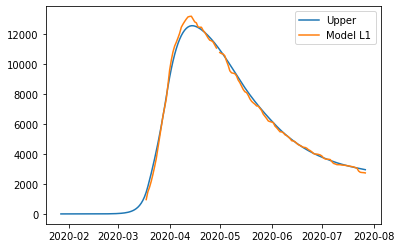

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3121477082805756, 'other': 0.3908749780564532, 'school': 0.23577417895540323, 'transport': 0.2531138724436288, 'work': 0.41202596}
{'home': 1.0, 'leisure': 0.33447910824320526, 'other': 0.4244556542976172, 'school': 0.2927800868886231, 'transport': 0.27991322103197747, 'work': 0.542919683963964}
{'home': 1.0, 'leisure': 0.3560129582071695, 'other': 0.45683702067302545, 'school': 0.3477500695385138, 'transport': 0.30575545002788507, 'work': 0.669138632072072}
{'home': 1.0, 'leisure': 0.3735590581778071, 'other': 0.4832218377196544, 'school': 0.392540425771758, 'transport': 0.3268120810615876, 'work': 0.771983700900901}
{'home': 1.0, 'leisure': 0.38392720816045656, 'other': 0.49881286597448055, 'school': 0.4190074544550387, 'transport': 0.33925463576332093, 'work': 0.832755787027027}
{'home': 1.0, 'leisure': 0.38951005815111395, 'other': 0.5072080350347715, 'school': 0.433

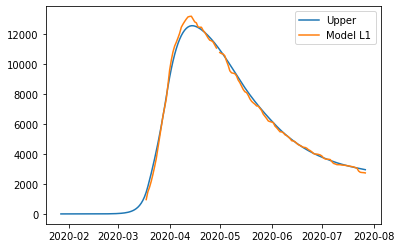

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3121477082805756, 'other': 0.3908749780564532, 'school': 0.23577417895540323, 'transport': 0.2531138724436288, 'work': 0.41202596}
{'home': 1.0, 'leisure': 0.33447910824320526, 'other': 0.4244556542976172, 'school': 0.2927800868886231, 'transport': 0.27991322103197747, 'work': 0.542919683963964}
{'home': 1.0, 'leisure': 0.3560129582071695, 'other': 0.45683702067302545, 'school': 0.3477500695385138, 'transport': 0.30575545002788507, 'work': 0.669138632072072}
{'home': 1.0, 'leisure': 0.3735590581778071, 'other': 0.4832218377196544, 'school': 0.392540425771758, 'transport': 0.3268120810615876, 'work': 0.771983700900901}
{'home': 1.0, 'leisure': 0.38392720816045656, 'other': 0.49881286597448055, 'school': 0.4190074544550387, 'transport': 0.33925463576332093, 'work': 0.832755787027027}
{'home': 1.0, 'leisure': 0.38951005815111395, 'other': 0.5072080350347715, 'school': 0.433

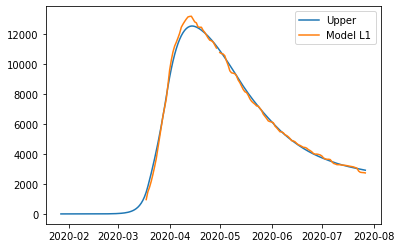

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118493397605296, 'other': 0.3904875720049046, 'school': 0.23545030363217875, 'transport': 0.2528506013354287, 'work': 0.41170446517470677}
{'home': 1.0, 'leisure': 0.33414590391546506, 'other': 0.42401586415990583, 'school': 0.29236728535165846, 'transport': 0.27960814435156445, 'work': 0.5424960556349523}
{'home': 1.0, 'leisure': 0.3556461622077242, 'other': 0.4563467173093713, 'school': 0.3472515177240139, 'transport': 0.30541006083140954, 'work': 0.6686165178644747}
{'home': 1.0, 'leisure': 0.373164891186602, 'other': 0.482690375431158, 'school': 0.3919720033607479, 'transport': 0.3264338446298019, 'work': 0.7713813389403819}
{'home': 1.0, 'leisure': 0.38351686740139346, 'other': 0.49825708250312284, 'school': 0.4183977448733635, 'transport': 0.3388569896015792, 'work': 0.8321060059397816}
{'home': 1.0, 'leisure': 0.38909100844012734, 'other': 0.5066391555418732, 'sc

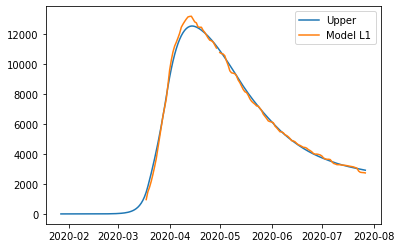

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118493397605296, 'other': 0.3904875720049046, 'school': 0.23545030363217875, 'transport': 0.2528506013354287, 'work': 0.41170446517470677}
{'home': 1.0, 'leisure': 0.33414590391546506, 'other': 0.42401586415990583, 'school': 0.29236728535165846, 'transport': 0.27960814435156445, 'work': 0.5424960556349523}
{'home': 1.0, 'leisure': 0.3556461622077242, 'other': 0.4563467173093713, 'school': 0.3472515177240139, 'transport': 0.30541006083140954, 'work': 0.6686165178644747}
{'home': 1.0, 'leisure': 0.373164891186602, 'other': 0.482690375431158, 'school': 0.3919720033607479, 'transport': 0.3264338446298019, 'work': 0.7713813389403819}
{'home': 1.0, 'leisure': 0.38351686740139346, 'other': 0.49825708250312284, 'school': 0.4183977448733635, 'transport': 0.3388569896015792, 'work': 0.8321060059397816}
{'home': 1.0, 'leisure': 0.38909100844012734, 'other': 0.5066391555418732, 'sc

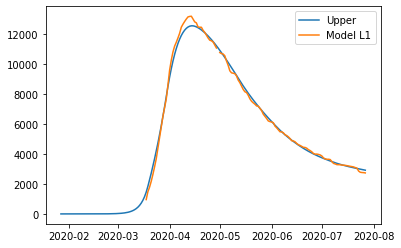

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31188520445029244, 'other': 0.3905540302246411, 'school': 0.23548047108447281, 'transport': 0.2528781200190962, 'work': 0.41174928984913683}
{'home': 1.0, 'leisure': 0.3341876596549662, 'other': 0.42409188450725377, 'school': 0.2924091526557905, 'transport': 0.27964136418822727, 'work': 0.5425589664429182}
{'home': 1.0, 'leisure': 0.35569359860233024, 'other': 0.4564319582797731, 'school': 0.34730466702813256, 'transport': 0.30544877820846084, 'work': 0.668696868872636}
{'home': 1.0, 'leisure': 0.3732169562631453, 'other': 0.4827831295018259, 'school': 0.39203434540559645, 'transport': 0.32647704148420664, 'work': 0.7714759004820356}
{'home': 1.0, 'leisure': 0.3835716676081725, 'other': 0.49835427613303895, 'school': 0.4184655189922797, 'transport': 0.33890283341987465, 'work': 0.8322089646148627}
{'home': 1.0, 'leisure': 0.3891472814093409, 'other': 0.5067387397036921, 

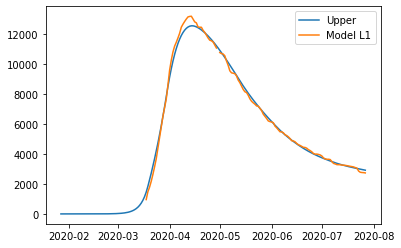

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31188520445029244, 'other': 0.3905540302246411, 'school': 0.23548047108447281, 'transport': 0.2528781200190962, 'work': 0.41174928984913683}
{'home': 1.0, 'leisure': 0.3341876596549662, 'other': 0.42409188450725377, 'school': 0.2924091526557905, 'transport': 0.27964136418822727, 'work': 0.5425589664429182}
{'home': 1.0, 'leisure': 0.35569359860233024, 'other': 0.4564319582797731, 'school': 0.34730466702813256, 'transport': 0.30544877820846084, 'work': 0.668696868872636}
{'home': 1.0, 'leisure': 0.3732169562631453, 'other': 0.4827831295018259, 'school': 0.39203434540559645, 'transport': 0.32647704148420664, 'work': 0.7714759004820356}
{'home': 1.0, 'leisure': 0.3835716676081725, 'other': 0.49835427613303895, 'school': 0.4184655189922797, 'transport': 0.33890283341987465, 'work': 0.8322089646148627}
{'home': 1.0, 'leisure': 0.3891472814093409, 'other': 0.5067387397036921, 

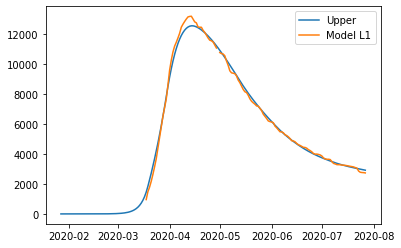

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31188520445029244, 'other': 0.3905540302246411, 'school': 0.23548047108447281, 'transport': 0.2528781200190962, 'work': 0.41174928984913683}
{'home': 1.0, 'leisure': 0.3341876596549662, 'other': 0.42409188450725377, 'school': 0.2924091526557905, 'transport': 0.27964136418822727, 'work': 0.5425589664429182}
{'home': 1.0, 'leisure': 0.35569359860233024, 'other': 0.4564319582797731, 'school': 0.34730466702813256, 'transport': 0.30544877820846084, 'work': 0.668696868872636}
{'home': 1.0, 'leisure': 0.3732169562631453, 'other': 0.4827831295018259, 'school': 0.39203434540559645, 'transport': 0.32647704148420664, 'work': 0.7714759004820356}
{'home': 1.0, 'leisure': 0.3835716676081725, 'other': 0.49835427613303895, 'school': 0.4184655189922797, 'transport': 0.33890283341987465, 'work': 0.8322089646148627}
{'home': 1.0, 'leisure': 0.3891472814093409, 'other': 0.5067387397036921, 

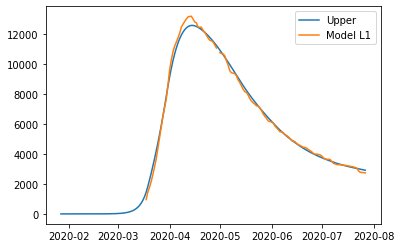

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31190212269457934, 'other': 0.3906282978379099, 'school': 0.23547854896821876, 'transport': 0.2528855718029506, 'work': 0.4117838649213901}
{'home': 1.0, 'leisure': 0.3342122172590274, 'other': 0.4241794949967495, 'school': 0.29241794033193186, 'transport': 0.27965436731854554, 'work': 0.5426192812179489}
{'home': 1.0, 'leisure': 0.35572552273188796, 'other': 0.456532435114202, 'school': 0.3473237820040838, 'transport': 0.3054671344228692, 'work': 0.6687820040753449}
{'home': 1.0, 'leisure': 0.3732548827468114, 'other': 0.48289409002471884, 'school': 0.39206187521842983, 'transport': 0.32649975947083665, 'work': 0.7715812597369269}
{'home': 1.0, 'leisure': 0.383613140937448, 'other': 0.49847143156275153, 'school': 0.4184980212087252, 'transport': 0.33892812881736284, 'work': 0.8323262744460436}
{'home': 1.0, 'leisure': 0.38919066457856005, 'other': 0.5068592308524614, 's

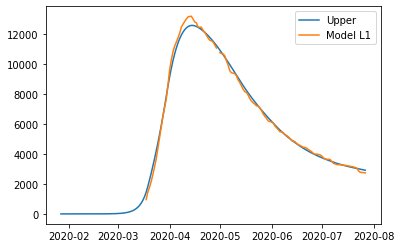

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31190212269457934, 'other': 0.3906282978379099, 'school': 0.23547854896821876, 'transport': 0.2528855718029506, 'work': 0.4117838649213901}
{'home': 1.0, 'leisure': 0.3342122172590274, 'other': 0.4241794949967495, 'school': 0.29241794033193186, 'transport': 0.27965436731854554, 'work': 0.5426192812179489}
{'home': 1.0, 'leisure': 0.35572552273188796, 'other': 0.456532435114202, 'school': 0.3473237820040838, 'transport': 0.3054671344228692, 'work': 0.6687820040753449}
{'home': 1.0, 'leisure': 0.3732548827468114, 'other': 0.48289409002471884, 'school': 0.39206187521842983, 'transport': 0.32649975947083665, 'work': 0.7715812597369269}
{'home': 1.0, 'leisure': 0.383613140937448, 'other': 0.49847143156275153, 'school': 0.4184980212087252, 'transport': 0.33892812881736284, 'work': 0.8323262744460436}
{'home': 1.0, 'leisure': 0.38919066457856005, 'other': 0.5068592308524614, 's

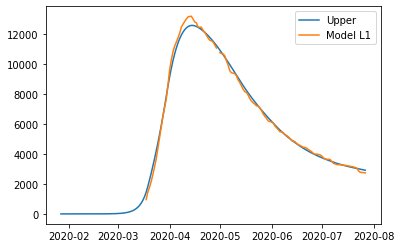

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31190212269457934, 'other': 0.3906282978379099, 'school': 0.23547854896821876, 'transport': 0.2528855718029506, 'work': 0.4117838649213901}
{'home': 1.0, 'leisure': 0.3342122172590274, 'other': 0.4241794949967495, 'school': 0.29241794033193186, 'transport': 0.27965436731854554, 'work': 0.5426192812179489}
{'home': 1.0, 'leisure': 0.35572552273188796, 'other': 0.456532435114202, 'school': 0.3473237820040838, 'transport': 0.3054671344228692, 'work': 0.6687820040753449}
{'home': 1.0, 'leisure': 0.3732548827468114, 'other': 0.48289409002471884, 'school': 0.39206187521842983, 'transport': 0.32649975947083665, 'work': 0.7715812597369269}
{'home': 1.0, 'leisure': 0.383613140937448, 'other': 0.49847143156275153, 'school': 0.4184980212087252, 'transport': 0.33892812881736284, 'work': 0.8323262744460436}
{'home': 1.0, 'leisure': 0.38919066457856005, 'other': 0.5068592308524614, 's

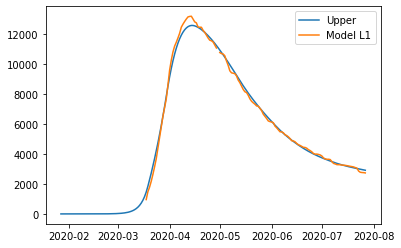

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118845740500324, 'other': 0.3906278164419192, 'school': 0.2354557654592954, 'transport': 0.25287414654393403, 'work': 0.4117703672353074}
{'home': 1.0, 'leisure': 0.33419685966777996, 'other': 0.4241831975149727, 'school': 0.2923976118001607, 'transport': 0.2796443044431382, 'work': 0.5426156762841294}
{'home': 1.0, 'leisure': 0.35571227794203647, 'other': 0.4565401721211313, 'school': 0.34730582077170935, 'transport': 0.30545838527451363, 'work': 0.6687879385812077}
{'home': 1.0, 'leisure': 0.37324335949883813, 'other': 0.48290511439281625, 'school': 0.392045842896675, 'transport': 0.3264920807667455, 'work': 0.7715949671195679}
{'home': 1.0, 'leisure': 0.3836026349642209, 'other': 0.4984843984624482, 'school': 0.4184831286977909, 'transport': 0.3389210826485189, 'work': 0.8323445748922351}
{'home': 1.0, 'leisure': 0.3891807063686578, 'other': 0.5068732437307115, 'scho

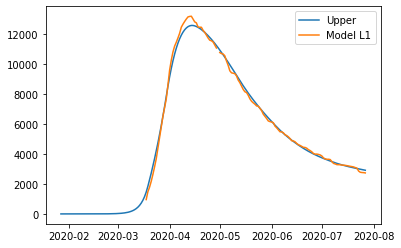

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118845740500324, 'other': 0.3906278164419192, 'school': 0.2354557654592954, 'transport': 0.25287414654393403, 'work': 0.4117703672353074}
{'home': 1.0, 'leisure': 0.33419685966777996, 'other': 0.4241831975149727, 'school': 0.2923976118001607, 'transport': 0.2796443044431382, 'work': 0.5426156762841294}
{'home': 1.0, 'leisure': 0.35571227794203647, 'other': 0.4565401721211313, 'school': 0.34730582077170935, 'transport': 0.30545838527451363, 'work': 0.6687879385812077}
{'home': 1.0, 'leisure': 0.37324335949883813, 'other': 0.48290511439281625, 'school': 0.392045842896675, 'transport': 0.3264920807667455, 'work': 0.7715949671195679}
{'home': 1.0, 'leisure': 0.3836026349642209, 'other': 0.4984843984624482, 'school': 0.4184831286977909, 'transport': 0.3389210826485189, 'work': 0.8323445748922351}
{'home': 1.0, 'leisure': 0.3891807063686578, 'other': 0.5068732437307115, 'scho

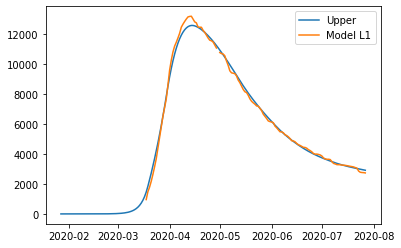

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118845740500324, 'other': 0.3906278164419192, 'school': 0.2354557654592954, 'transport': 0.25287414654393403, 'work': 0.4117703672353074}
{'home': 1.0, 'leisure': 0.33419685966777996, 'other': 0.4241831975149727, 'school': 0.2923976118001607, 'transport': 0.2796443044431382, 'work': 0.5426156762841294}
{'home': 1.0, 'leisure': 0.35571227794203647, 'other': 0.4565401721211313, 'school': 0.34730582077170935, 'transport': 0.30545838527451363, 'work': 0.6687879385812077}
{'home': 1.0, 'leisure': 0.37324335949883813, 'other': 0.48290511439281625, 'school': 0.392045842896675, 'transport': 0.3264920807667455, 'work': 0.7715949671195679}
{'home': 1.0, 'leisure': 0.3836026349642209, 'other': 0.4984843984624482, 'school': 0.4184831286977909, 'transport': 0.3389210826485189, 'work': 0.8323445748922351}
{'home': 1.0, 'leisure': 0.3891807063686578, 'other': 0.5068732437307115, 'scho

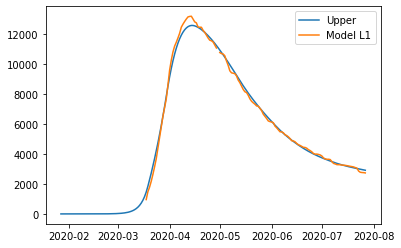

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118845740500324, 'other': 0.3906278164419192, 'school': 0.2354557654592954, 'transport': 0.25287414654393403, 'work': 0.4117703672353074}
{'home': 1.0, 'leisure': 0.33419685966777996, 'other': 0.4241831975149727, 'school': 0.2923976118001607, 'transport': 0.2796443044431382, 'work': 0.5426156762841294}
{'home': 1.0, 'leisure': 0.35571227794203647, 'other': 0.4565401721211313, 'school': 0.34730582077170935, 'transport': 0.30545838527451363, 'work': 0.6687879385812077}
{'home': 1.0, 'leisure': 0.37324335949883813, 'other': 0.48290511439281625, 'school': 0.392045842896675, 'transport': 0.3264920807667455, 'work': 0.7715949671195679}
{'home': 1.0, 'leisure': 0.3836026349642209, 'other': 0.4984843984624482, 'school': 0.4184831286977909, 'transport': 0.3389210826485189, 'work': 0.8323445748922351}
{'home': 1.0, 'leisure': 0.3891807063686578, 'other': 0.5068732437307115, 'scho

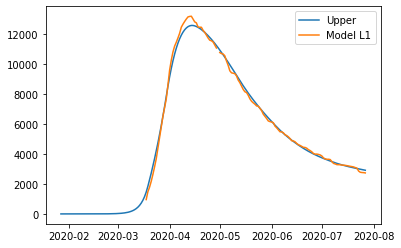

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118845740500324, 'other': 0.3906278164419192, 'school': 0.2354557654592954, 'transport': 0.25287414654393403, 'work': 0.4117703672353074}
{'home': 1.0, 'leisure': 0.33419685966777996, 'other': 0.4241831975149727, 'school': 0.2923976118001607, 'transport': 0.2796443044431382, 'work': 0.5426156762841294}
{'home': 1.0, 'leisure': 0.35571227794203647, 'other': 0.4565401721211313, 'school': 0.34730582077170935, 'transport': 0.30545838527451363, 'work': 0.6687879385812077}
{'home': 1.0, 'leisure': 0.37324335949883813, 'other': 0.48290511439281625, 'school': 0.392045842896675, 'transport': 0.3264920807667455, 'work': 0.7715949671195679}
{'home': 1.0, 'leisure': 0.3836026349642209, 'other': 0.4984843984624482, 'school': 0.4184831286977909, 'transport': 0.3389210826485189, 'work': 0.8323445748922351}
{'home': 1.0, 'leisure': 0.3891807063686578, 'other': 0.5068732437307115, 'scho

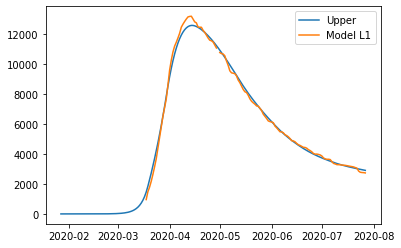

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118092167882165, 'other': 0.39066303851430906, 'school': 0.23534463505874373, 'transport': 0.25282154441452, 'work': 0.4117236447348602}
{'home': 1.0, 'leisure': 0.33413536791582527, 'other': 0.4242444393790572, 'school': 0.29230230343636826, 'transport': 0.27960040107897755, 'work': 0.5426273633561471}
{'home': 1.0, 'leisure': 0.3556641565031623, 'other': 0.4566265044986358, 'school': 0.3472257693719347, 'transport': 0.3054228700054188, 'work': 0.668855949169531}
{'home': 1.0, 'leisure': 0.3732061323891406, 'other': 0.4830118908923665, 'school': 0.39197822309721114, 'transport': 0.32646340024177833, 'work': 0.7717088709433992}
{'home': 1.0, 'leisure': 0.38357184541267325, 'other': 0.49860325557957097, 'school': 0.41842285484396535, 'transport': 0.33889644083599074, 'work': 0.8324855974461396}
{'home': 1.0, 'leisure': 0.3891533831945755, 'other': 0.5069986057957581, 'sc

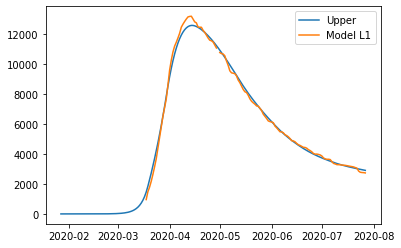

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118092167882165, 'other': 0.39066303851430906, 'school': 0.23534463505874373, 'transport': 0.25282154441452, 'work': 0.4117236447348602}
{'home': 1.0, 'leisure': 0.33413536791582527, 'other': 0.4242444393790572, 'school': 0.29230230343636826, 'transport': 0.27960040107897755, 'work': 0.5426273633561471}
{'home': 1.0, 'leisure': 0.3556641565031623, 'other': 0.4566265044986358, 'school': 0.3472257693719347, 'transport': 0.3054228700054188, 'work': 0.668855949169531}
{'home': 1.0, 'leisure': 0.3732061323891406, 'other': 0.4830118908923665, 'school': 0.39197822309721114, 'transport': 0.32646340024177833, 'work': 0.7717088709433992}
{'home': 1.0, 'leisure': 0.38357184541267325, 'other': 0.49860325557957097, 'school': 0.41842285484396535, 'transport': 0.33889644083599074, 'work': 0.8324855974461396}
{'home': 1.0, 'leisure': 0.3891533831945755, 'other': 0.5069986057957581, 'sc

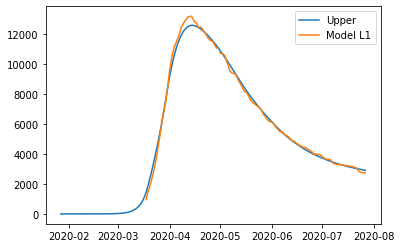

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118064933440953, 'other': 0.39072797616259575, 'school': 0.23532616170538395, 'transport': 0.2528257738280718, 'work': 0.4117384210891717}
{'home': 1.0, 'leisure': 0.33414374239468814, 'other': 0.4243287393041046, 'school': 0.2923021406239019, 'transport': 0.27961389038596235, 'work': 0.5426835763094005}
{'home': 1.0, 'leisure': 0.3556832325506169, 'other': 0.45672947519055956, 'school': 0.34724326315247284, 'transport': 0.3054452884953569, 'work': 0.6689521188431926}
{'home': 1.0, 'leisure': 0.37323392823322554, 'other': 0.4831300748017451, 'school': 0.3920101037313084, 'transport': 0.3264930943622709, 'work': 0.7718375979448009}
{'home': 1.0, 'leisure': 0.38360479386385793, 'other': 0.4987304291174456, 'school': 0.41846323680062036, 'transport': 0.3389304341927202, 'work': 0.8326335628684787}
{'home': 1.0, 'leisure': 0.3891891061265061, 'other': 0.5071306199028228, 's

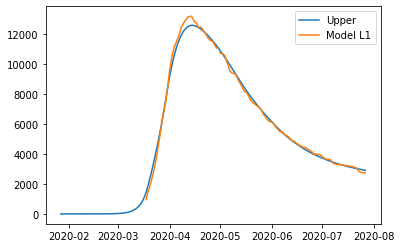

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3118064933440953, 'other': 0.39072797616259575, 'school': 0.23532616170538395, 'transport': 0.2528257738280718, 'work': 0.4117384210891717}
{'home': 1.0, 'leisure': 0.33414374239468814, 'other': 0.4243287393041046, 'school': 0.2923021406239019, 'transport': 0.27961389038596235, 'work': 0.5426835763094005}
{'home': 1.0, 'leisure': 0.3556832325506169, 'other': 0.45672947519055956, 'school': 0.34724326315247284, 'transport': 0.3054452884953569, 'work': 0.6689521188431926}
{'home': 1.0, 'leisure': 0.37323392823322554, 'other': 0.4831300748017451, 'school': 0.3920101037313084, 'transport': 0.3264930943622709, 'work': 0.7718375979448009}
{'home': 1.0, 'leisure': 0.38360479386385793, 'other': 0.4987304291174456, 'school': 0.41846323680062036, 'transport': 0.3389304341927202, 'work': 0.8326335628684787}
{'home': 1.0, 'leisure': 0.3891891061265061, 'other': 0.5071306199028228, 's

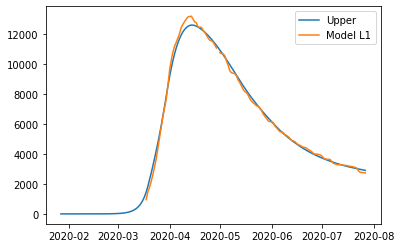

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31179560866450745, 'other': 0.3909877464635449, 'school': 0.2352522689261598, 'transport': 0.25284269324996744, 'work': 0.41179752650641777}
{'home': 1.0, 'leisure': 0.3341772749170139, 'other': 0.42466601397771053, 'school': 0.29230149178674913, 'transport': 0.27966785433863145, 'work': 0.5429084281224141}
{'home': 1.0, 'leisure': 0.35575959594621653, 'other': 0.457141486223513, 'school': 0.34731324240231737, 'transport': 0.3055349739598432, 'work': 0.6693367975378391}
{'home': 1.0, 'leisure': 0.37334519085890017, 'other': 0.4836029821275003, 'school': 0.3921376317927804, 'transport': 0.3266118862437935, 'work': 0.7723525059504077}
{'home': 1.0, 'leisure': 0.3837366787618496, 'other': 0.49923932061622, 'school': 0.41862477097805395, 'transport': 0.3390664253206732, 'work': 0.8332254245578345}
{'home': 1.0, 'leisure': 0.38933209532497626, 'other': 0.5076588874947614, 'sc

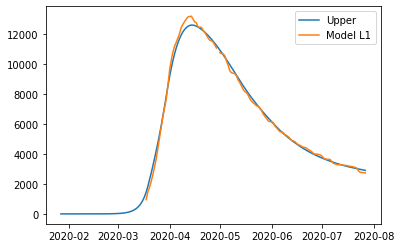

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31179560866450745, 'other': 0.3909877464635449, 'school': 0.2352522689261598, 'transport': 0.25284269324996744, 'work': 0.41179752650641777}
{'home': 1.0, 'leisure': 0.3341772749170139, 'other': 0.42466601397771053, 'school': 0.29230149178674913, 'transport': 0.27966785433863145, 'work': 0.5429084281224141}
{'home': 1.0, 'leisure': 0.35575959594621653, 'other': 0.457141486223513, 'school': 0.34731324240231737, 'transport': 0.3055349739598432, 'work': 0.6693367975378391}
{'home': 1.0, 'leisure': 0.37334519085890017, 'other': 0.4836029821275003, 'school': 0.3921376317927804, 'transport': 0.3266118862437935, 'work': 0.7723525059504077}
{'home': 1.0, 'leisure': 0.3837366787618496, 'other': 0.49923932061622, 'school': 0.41862477097805395, 'transport': 0.3390664253206732, 'work': 0.8332254245578345}
{'home': 1.0, 'leisure': 0.38933209532497626, 'other': 0.5076588874947614, 'sc

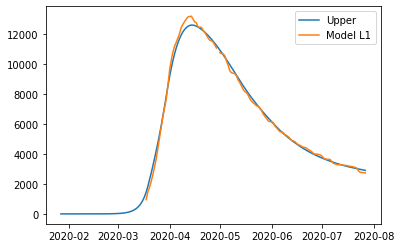

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31179560866450745, 'other': 0.3909877464635449, 'school': 0.2352522689261598, 'transport': 0.25284269324996744, 'work': 0.41179752650641777}
{'home': 1.0, 'leisure': 0.3341772753476284, 'other': 0.4246660146256672, 'school': 0.29230149288435386, 'transport': 0.27966785485473705, 'work': 0.5429084306449367}
{'home': 1.0, 'leisure': 0.3557595967920665, 'other': 0.45714148749628514, 'school': 0.3473132445583267, 'transport': 0.3055349749736221, 'work': 0.6693368024927941}
{'home': 1.0, 'leisure': 0.37334519204309013, 'other': 0.4836029839093813, 'school': 0.3921376348111935, 'transport': 0.32661188766308397, 'work': 0.7723525128873447}
{'home': 1.0, 'leisure': 0.38373668014596773, 'other': 0.49923932269893806, 'school': 0.4186247745060693, 'transport': 0.3390664269795841, 'work': 0.8332254326659427}
{'home': 1.0, 'leisure': 0.38933209681674796, 'other': 0.5076588897394687, 

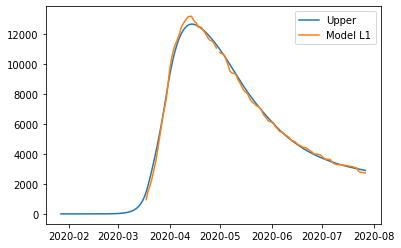

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3117371252531703, 'other': 0.39213147023957357, 'school': 0.23491766217236393, 'transport': 0.25291677716797467, 'work': 0.41204814830863107}
{'home': 1.0, 'leisure': 0.33431783265882203, 'other': 0.42615719126682844, 'school': 0.29229563158186045, 'transport': 0.2799081812218798, 'work': 0.5439014495758937}
{'home': 1.0, 'leisure': 0.3560920862285576, 'other': 0.45896770797168135, 'school': 0.34762438779816063, 'transport': 0.3059356065595741, 'work': 0.6710457043693255}
{'home': 1.0, 'leisure': 0.37383407061871254, 'other': 0.48570220306452444, 'school': 0.3927070780484793, 'transport': 0.3271431383162139, 'work': 0.7746447267936033}
{'home': 1.0, 'leisure': 0.38431797048562233, 'other': 0.5014998592557499, 'school': 0.4193468495600313, 'transport': 0.3396748616269556, 'work': 0.8358623309534039}
{'home': 1.0, 'leisure': 0.3899631473370352, 'other': 0.5100062895125637,

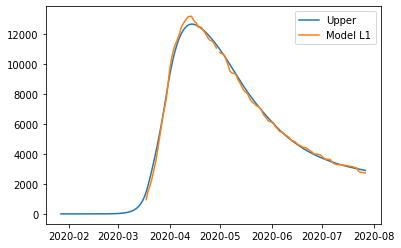

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3117371252531703, 'other': 0.39213147023957357, 'school': 0.23491766217236393, 'transport': 0.25291677716797467, 'work': 0.41204814830863107}
{'home': 1.0, 'leisure': 0.33431783265882203, 'other': 0.42615719126682844, 'school': 0.29229563158186045, 'transport': 0.2799081812218798, 'work': 0.5439014495758937}
{'home': 1.0, 'leisure': 0.3560920862285576, 'other': 0.45896770797168135, 'school': 0.34762438779816063, 'transport': 0.3059356065595741, 'work': 0.6710457043693255}
{'home': 1.0, 'leisure': 0.37383407061871254, 'other': 0.48570220306452444, 'school': 0.3927070780484793, 'transport': 0.3271431383162139, 'work': 0.7746447267936033}
{'home': 1.0, 'leisure': 0.38431797048562233, 'other': 0.5014998592557499, 'school': 0.4193468495600313, 'transport': 0.3396748616269556, 'work': 0.8358623309534039}
{'home': 1.0, 'leisure': 0.3899631473370352, 'other': 0.5100062895125637,

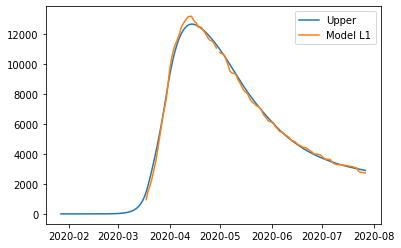

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3117371252531703, 'other': 0.39213147023957357, 'school': 0.23491766217236393, 'transport': 0.25291677716797467, 'work': 0.41204814830863107}
{'home': 1.0, 'leisure': 0.33431783265882203, 'other': 0.42615719126682844, 'school': 0.29229563158186045, 'transport': 0.2799081812218798, 'work': 0.5439014495758937}
{'home': 1.0, 'leisure': 0.3560920862285576, 'other': 0.45896770797168135, 'school': 0.34762438779816063, 'transport': 0.3059356065595741, 'work': 0.6710457043693255}
{'home': 1.0, 'leisure': 0.37383407061871254, 'other': 0.48570220306452444, 'school': 0.3927070780484793, 'transport': 0.3271431383162139, 'work': 0.7746447267936033}
{'home': 1.0, 'leisure': 0.38431797048562233, 'other': 0.5014998592557499, 'school': 0.4193468495600313, 'transport': 0.3396748616269556, 'work': 0.8358623309534039}
{'home': 1.0, 'leisure': 0.3899631473370352, 'other': 0.5100062895125637,

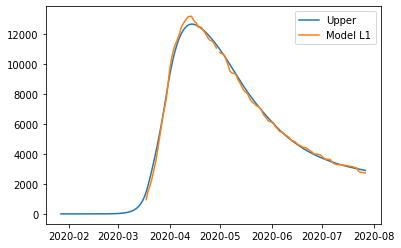

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3117371252531703, 'other': 0.39213147023957357, 'school': 0.23491766217236393, 'transport': 0.25291677716797467, 'work': 0.41204814830863107}
{'home': 1.0, 'leisure': 0.33431783309081986, 'other': 0.42615719191778406, 'school': 0.2922956326795745, 'transport': 0.27990818173826, 'work': 0.5439014520984162}
{'home': 1.0, 'leisure': 0.35609208707712486, 'other': 0.4589677092503442, 'school': 0.34762438995438466, 'transport': 0.30593560757389227, 'work': 0.6710457093242805}
{'home': 1.0, 'leisure': 0.3738340718067067, 'other': 0.48570220485465243, 'school': 0.392707081067193, 'transport': 0.32714313973625925, 'work': 0.7746447337305403}
{'home': 1.0, 'leisure': 0.3843179718741868, 'other': 0.5014998613481073, 'school': 0.4193468530883979, 'transport': 0.3396748632867489, 'work': 0.8358623390615121}
{'home': 1.0, 'leisure': 0.3899631488335992, 'other': 0.51000629176766, 'scho

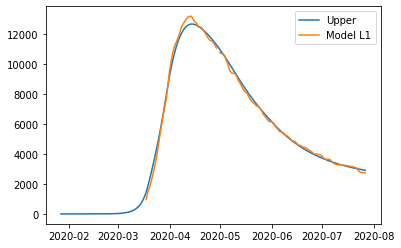

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31171612810718746, 'other': 0.392426795606832, 'school': 0.23482834336482977, 'transport': 0.2529388348712508, 'work': 0.41210708194339174}
{'home': 1.0, 'leisure': 0.33435106744250837, 'other': 0.42654698685376746, 'school': 0.2922973916008377, 'transport': 0.27997615694667044, 'work': 0.5441632308167181}
{'home': 1.0, 'leisure': 0.3561776160872821, 'other': 0.45944859984188374, 'school': 0.3477139738284168, 'transport': 0.3060478603765394, 'work': 0.6715030886588543}
{'home': 1.0, 'leisure': 0.37396221127931994, 'other': 0.4862573215359044, 'school': 0.39286822601385163, 'transport': 0.3272914705786549, 'work': 0.7752614913450394}
{'home': 1.0, 'leisure': 0.38447129025643323, 'other': 0.502098838900553, 'school': 0.41955028412342676, 'transport': 0.339844512970814, 'work': 0.8365732747505124}
{'home': 1.0, 'leisure': 0.3901300250902635, 'other': 0.5106288867122868, 'sc

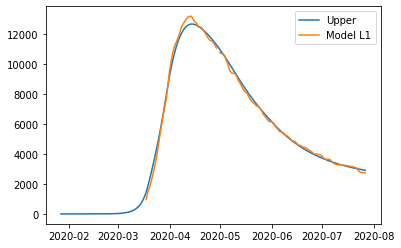

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31171612810718746, 'other': 0.392426795606832, 'school': 0.23482834336482977, 'transport': 0.2529388348712508, 'work': 0.41210708194339174}
{'home': 1.0, 'leisure': 0.33435106744250837, 'other': 0.42654698685376746, 'school': 0.2922973916008377, 'transport': 0.27997615694667044, 'work': 0.5441632308167181}
{'home': 1.0, 'leisure': 0.3561776160872821, 'other': 0.45944859984188374, 'school': 0.3477139738284168, 'transport': 0.3060478603765394, 'work': 0.6715030886588543}
{'home': 1.0, 'leisure': 0.37396221127931994, 'other': 0.4862573215359044, 'school': 0.39286822601385163, 'transport': 0.3272914705786549, 'work': 0.7752614913450394}
{'home': 1.0, 'leisure': 0.38447129025643323, 'other': 0.502098838900553, 'school': 0.41955028412342676, 'transport': 0.339844512970814, 'work': 0.8365732747505124}
{'home': 1.0, 'leisure': 0.3901300250902635, 'other': 0.5106288867122868, 'sc

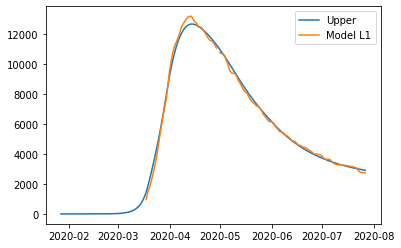

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31171612810718746, 'other': 0.392426795606832, 'school': 0.23482834336482977, 'transport': 0.2529388348712508, 'work': 0.41210708194339174}
{'home': 1.0, 'leisure': 0.3343510678748786, 'other': 0.4265469875055278, 'school': 0.2922973926986054, 'transport': 0.27997615746313453, 'work': 0.5441632333392408}
{'home': 1.0, 'leisure': 0.35617761693658073, 'other': 0.45944860112212715, 'school': 0.3477139759847461, 'transport': 0.3060478613910224, 'work': 0.6715030936138093}
{'home': 1.0, 'leisure': 0.37396221246833805, 'other': 0.4862573233282451, 'school': 0.3928682290327127, 'transport': 0.32729147199893105, 'work': 0.7752614982819763}
{'home': 1.0, 'leisure': 0.38447129164619465, 'other': 0.5020988409954967, 'school': 0.41955028765196567, 'transport': 0.33984451463087706, 'work': 0.8365732828586205}
{'home': 1.0, 'leisure': 0.39013002658811746, 'other': 0.5106288889701707, 

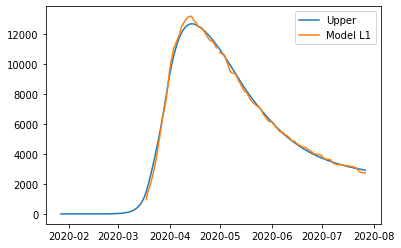

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3116323135088532, 'other': 0.3936084730544347, 'school': 0.23447109318516912, 'transport': 0.2530271048989641, 'work': 0.4123428164824344}
{'home': 1.0, 'leisure': 0.33448477941547555, 'other': 0.4281078392857911, 'school': 0.29230454295012653, 'transport': 0.2802482340358176, 'work': 0.545210355780016}
{'home': 1.0, 'leisure': 0.3565210858254328, 'other': 0.46137508529459903, 'school': 0.34807251236633546, 'transport': 0.3064971799892121, 'work': 0.6733326258169696}
{'home': 1.0, 'leisure': 0.3744765947520647, 'other': 0.4884817301906647, 'school': 0.39351308003880203, 'transport': 0.3278852100253113, 'work': 0.7777285495507837}
{'home': 1.0, 'leisure': 0.38508666820871074, 'other': 0.5044992930837945, 'school': 0.42036432457253226, 'transport': 0.340523591410279, 'work': 0.8394170499389466}
{'home': 1.0, 'leisure': 0.39079978468536636, 'other': 0.5131241346416335, 'sch

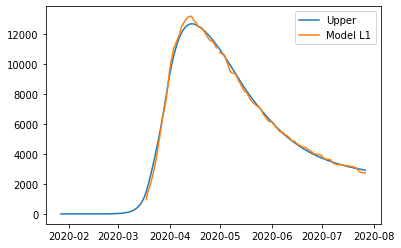

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3116323135088532, 'other': 0.3936084730544347, 'school': 0.23447109318516912, 'transport': 0.2530271048989641, 'work': 0.4123428164824344}
{'home': 1.0, 'leisure': 0.33448477941547555, 'other': 0.4281078392857911, 'school': 0.29230454295012653, 'transport': 0.2802482340358176, 'work': 0.545210355780016}
{'home': 1.0, 'leisure': 0.3565210858254328, 'other': 0.46137508529459903, 'school': 0.34807251236633546, 'transport': 0.3064971799892121, 'work': 0.6733326258169696}
{'home': 1.0, 'leisure': 0.3744765947520647, 'other': 0.4884817301906647, 'school': 0.39351308003880203, 'transport': 0.3278852100253113, 'work': 0.7777285495507837}
{'home': 1.0, 'leisure': 0.38508666820871074, 'other': 0.5044992930837945, 'school': 0.42036432457253226, 'transport': 0.340523591410279, 'work': 0.8394170499389466}
{'home': 1.0, 'leisure': 0.39079978468536636, 'other': 0.5131241346416335, 'sch

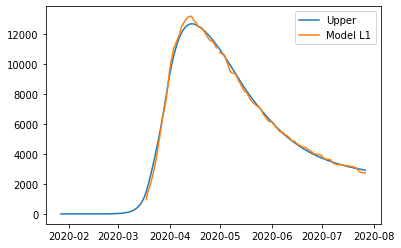

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3116323135088532, 'other': 0.3936084730544347, 'school': 0.23447109318516912, 'transport': 0.2530271048989641, 'work': 0.4123428164824344}
{'home': 1.0, 'leisure': 0.33448477941547555, 'other': 0.4281078392857911, 'school': 0.29230454295012653, 'transport': 0.2802482340358176, 'work': 0.545210355780016}
{'home': 1.0, 'leisure': 0.3565210858254328, 'other': 0.46137508529459903, 'school': 0.34807251236633546, 'transport': 0.3064971799892121, 'work': 0.6733326258169696}
{'home': 1.0, 'leisure': 0.3744765947520647, 'other': 0.4884817301906647, 'school': 0.39351308003880203, 'transport': 0.3278852100253113, 'work': 0.7777285495507837}
{'home': 1.0, 'leisure': 0.38508666820871074, 'other': 0.5044992930837945, 'school': 0.42036432457253226, 'transport': 0.340523591410279, 'work': 0.8394170499389466}
{'home': 1.0, 'leisure': 0.39079978468536636, 'other': 0.5131241346416335, 'sch

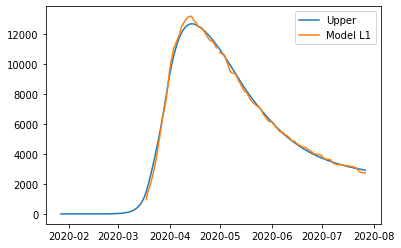

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3116323135088532, 'other': 0.3936084730544347, 'school': 0.23447109318516912, 'transport': 0.2530271048989641, 'work': 0.4123428164824344}
{'home': 1.0, 'leisure': 0.33448477941547555, 'other': 0.4281078392857911, 'school': 0.29230454295012653, 'transport': 0.2802482340358176, 'work': 0.545210355780016}
{'home': 1.0, 'leisure': 0.3565210858254328, 'other': 0.46137508529459903, 'school': 0.34807251236633546, 'transport': 0.3064971799892121, 'work': 0.6733326258169696}
{'home': 1.0, 'leisure': 0.3744765947520647, 'other': 0.4884817301906647, 'school': 0.39351308003880203, 'transport': 0.3278852100253113, 'work': 0.7777285495507837}
{'home': 1.0, 'leisure': 0.38508666820871074, 'other': 0.5044992930837945, 'school': 0.42036432457253226, 'transport': 0.340523591410279, 'work': 0.8394170499389466}
{'home': 1.0, 'leisure': 0.39079978468536636, 'other': 0.5131241346416335, 'sch

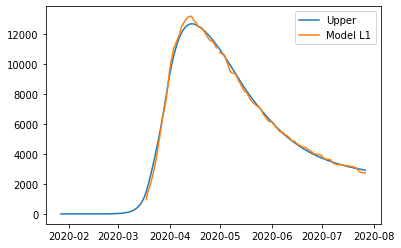

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3116323135088532, 'other': 0.3936084730544347, 'school': 0.23447109318516912, 'transport': 0.2530271048989641, 'work': 0.4123428164824344}
{'home': 1.0, 'leisure': 0.33448477984933517, 'other': 0.42810783994076995, 'school': 0.2923045440481086, 'transport': 0.2802482345526174, 'work': 0.5452103583025385}
{'home': 1.0, 'leisure': 0.3565210866776571, 'other': 0.4613750865811646, 'school': 0.348072514523086, 'transport': 0.3064971810043544, 'work': 0.6733326307719246}
{'home': 1.0, 'leisure': 0.3744765959451786, 'other': 0.4884817319918565, 'school': 0.3935130830582528, 'transport': 0.3278852114465106, 'work': 0.7777285564877207}
{'home': 1.0, 'leisure': 0.38508666960325955, 'other': 0.5044992951890837, 'school': 0.4203643281017604, 'transport': 0.34052359307142105, 'work': 0.8394170580470547}
{'home': 1.0, 'leisure': 0.39079978618838, 'other': 0.5131241369106674, 'school':

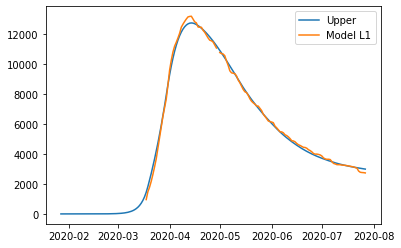

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3129295953763168, 'other': 0.4075405967953235, 'school': 0.2328521112476099, 'transport': 0.25559118358869337, 'work': 0.4160394870977984}
{'home': 1.0, 'leisure': 0.33792019351872554, 'other': 0.44579849894890267, 'school': 0.2943887134136331, 'transport': 0.28468361478659276, 'work': 0.5564551192387546}
{'home': 1.0, 'leisure': 0.3620182702989054, 'other': 0.4826900474541398, 'school': 0.35372757978801267, 'transport': 0.31273703058456714, 'work': 0.6918559073746766}
{'home': 1.0, 'leisure': 0.38165374026794086, 'other': 0.5127498277176663, 'school': 0.4020777672041737, 'transport': 0.3355953693829167, 'work': 0.8021824754854279}
{'home': 1.0, 'leisure': 0.3932565179769163, 'other': 0.5305124251461137, 'school': 0.43064833249554163, 'transport': 0.34910256958194136, 'work': 0.8673754475508717}
{'home': 1.0, 'leisure': 0.3995041675125185, 'other': 0.5400769006845085, 's

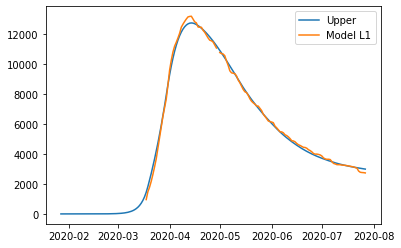

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3129295953763168, 'other': 0.4075405967953235, 'school': 0.2328521112476099, 'transport': 0.25559118358869337, 'work': 0.4160394870977984}
{'home': 1.0, 'leisure': 0.33792019351872554, 'other': 0.44579849894890267, 'school': 0.2943887134136331, 'transport': 0.28468361478659276, 'work': 0.5564551192387546}
{'home': 1.0, 'leisure': 0.3620182702989054, 'other': 0.4826900474541398, 'school': 0.35372757978801267, 'transport': 0.31273703058456714, 'work': 0.6918559073746766}
{'home': 1.0, 'leisure': 0.38165374026794086, 'other': 0.5127498277176663, 'school': 0.4020777672041737, 'transport': 0.3355953693829167, 'work': 0.8021824754854279}
{'home': 1.0, 'leisure': 0.3932565179769163, 'other': 0.5305124251461137, 'school': 0.43064833249554163, 'transport': 0.34910256958194136, 'work': 0.8673754475508717}
{'home': 1.0, 'leisure': 0.3995041675125185, 'other': 0.5400769006845085, 's

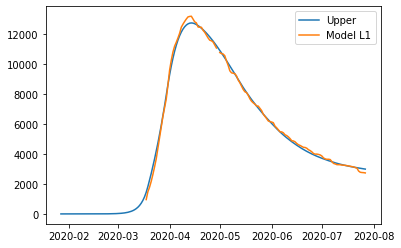

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3129295953763168, 'other': 0.4075405967953235, 'school': 0.2328521112476099, 'transport': 0.25559118358869337, 'work': 0.4160394870977984}
{'home': 1.0, 'leisure': 0.33792019396767375, 'other': 0.44579849963619383, 'school': 0.29438871451911874, 'transport': 0.2846836153092291, 'work': 0.5564551217612771}
{'home': 1.0, 'leisure': 0.36201827118076796, 'other': 0.4826900488041759, 'school': 0.35372758195950227, 'transport': 0.3127370316111743, 'work': 0.6918559123296315}
{'home': 1.0, 'leisure': 0.3816537415025484, 'other': 0.5127498296077169, 'school': 0.4020777702442592, 'transport': 0.3355953708201666, 'work': 0.8021824824223648}
{'home': 1.0, 'leisure': 0.3932565194199641, 'other': 0.5305124273552638, 'school': 0.43064833604888836, 'transport': 0.3491025712618439, 'work': 0.8673754556589799}
{'home': 1.0, 'leisure': 0.39950416906780334, 'other': 0.5400769030654814, 'sc

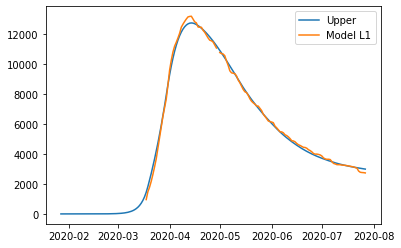

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3129295971560758, 'other': 0.4075405995199419, 'school': 0.23285211563007083, 'transport': 0.25559118566057315, 'work': 0.4160394970977984}
{'home': 1.0, 'leisure': 0.3379201952984845, 'other': 0.4457985016735211, 'school': 0.294388717796094, 'transport': 0.28468361685847254, 'work': 0.5564551292387545}
{'home': 1.0, 'leisure': 0.3620182720786643, 'other': 0.4826900501787582, 'school': 0.35372758417047356, 'transport': 0.3127370326564469, 'work': 0.6918559173746766}
{'home': 1.0, 'leisure': 0.38165374204769975, 'other': 0.5127498304422846, 'school': 0.40207777158663466, 'transport': 0.33559537145479645, 'work': 0.8021824854854278}
{'home': 1.0, 'leisure': 0.39325651975667525, 'other': 0.5305124278707322, 'school': 0.4306483368780025, 'transport': 0.34910257165382114, 'work': 0.8673754575508716}
{'home': 1.0, 'leisure': 0.3995041692922774, 'other': 0.540076903409127, 'sch

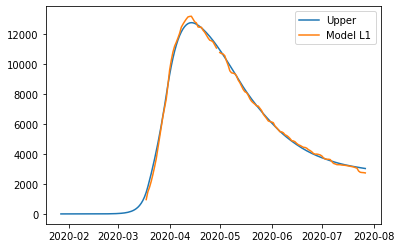

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3131076970668519, 'other': 0.4088060862904209, 'school': 0.232781775569596, 'transport': 0.2558658734931183, 'work': 0.4164092942522919}
{'home': 1.0, 'leisure': 0.3382870410171459, 'other': 0.4473966602073811, 'school': 0.2946465597986562, 'transport': 0.2851243010814415, 'work': 0.5574692546710597}
{'home': 1.0, 'leisure': 0.36256712268350083, 'other': 0.48460899934159274, 'school': 0.3543018874481071, 'transport': 0.31333778482732455, 'work': 0.6934913593605857}
{'home': 1.0, 'leisure': 0.3823508929301604, 'other': 0.5149301645620614, 'school': 0.40290993219951154, 'transport': 0.33632654936100703, 'work': 0.8043241854039032}
{'home': 1.0, 'leisure': 0.39404130262136833, 'other': 0.532847216737793, 'school': 0.4316328677344323, 'transport': 0.34991081931272855, 'work': 0.8698163098840453}
{'home': 1.0, 'leisure': 0.40033613860894185, 'other': 0.542494860217033, 'schoo

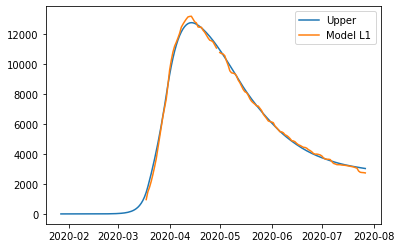

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3131076970668519, 'other': 0.4088060862904209, 'school': 0.232781775569596, 'transport': 0.2558658734931183, 'work': 0.4164092942522919}
{'home': 1.0, 'leisure': 0.3382870410171459, 'other': 0.4473966602073811, 'school': 0.2946465597986562, 'transport': 0.2851243010814415, 'work': 0.5574692546710597}
{'home': 1.0, 'leisure': 0.36256712268350083, 'other': 0.48460899934159274, 'school': 0.3543018874481071, 'transport': 0.31333778482732455, 'work': 0.6934913593605857}
{'home': 1.0, 'leisure': 0.3823508929301604, 'other': 0.5149301645620614, 'school': 0.40290993219951154, 'transport': 0.33632654936100703, 'work': 0.8043241854039032}
{'home': 1.0, 'leisure': 0.39404130262136833, 'other': 0.532847216737793, 'school': 0.4316328677344323, 'transport': 0.34991081931272855, 'work': 0.8698163098840453}
{'home': 1.0, 'leisure': 0.40033613860894185, 'other': 0.542494860217033, 'schoo

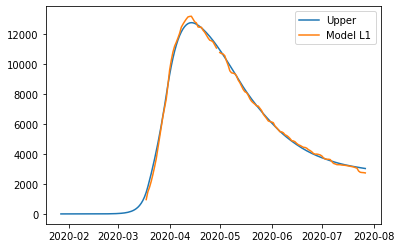

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3131076970668519, 'other': 0.4088060862904209, 'school': 0.232781775569596, 'transport': 0.2558658734931183, 'work': 0.4164092942522919}
{'home': 1.0, 'leisure': 0.3382870410171459, 'other': 0.4473966602073811, 'school': 0.2946465597986562, 'transport': 0.2851243010814415, 'work': 0.5574692546710597}
{'home': 1.0, 'leisure': 0.36256712268350083, 'other': 0.48460899934159274, 'school': 0.3543018874481071, 'transport': 0.31333778482732455, 'work': 0.6934913593605857}
{'home': 1.0, 'leisure': 0.3823508929301604, 'other': 0.5149301645620614, 'school': 0.40290993219951154, 'transport': 0.33632654936100703, 'work': 0.8043241854039032}
{'home': 1.0, 'leisure': 0.39404130262136833, 'other': 0.532847216737793, 'school': 0.4316328677344323, 'transport': 0.34991081931272855, 'work': 0.8698163098840453}
{'home': 1.0, 'leisure': 0.40033613860894185, 'other': 0.542494860217033, 'schoo

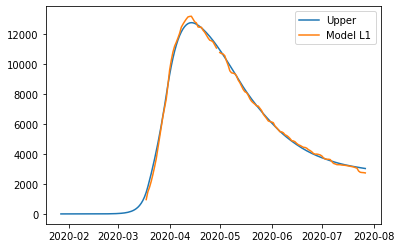

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3131076970668519, 'other': 0.4088060862904209, 'school': 0.232781775569596, 'transport': 0.2558658734931183, 'work': 0.4164092942522919}
{'home': 1.0, 'leisure': 0.3382870410171459, 'other': 0.4473966602073811, 'school': 0.2946465597986562, 'transport': 0.2851243010814415, 'work': 0.5574692546710597}
{'home': 1.0, 'leisure': 0.36256712268350083, 'other': 0.48460899934159274, 'school': 0.3543018874481071, 'transport': 0.31333778482732455, 'work': 0.6934913593605857}
{'home': 1.0, 'leisure': 0.3823508929301604, 'other': 0.5149301645620614, 'school': 0.40290993219951154, 'transport': 0.33632654936100703, 'work': 0.8043241854039032}
{'home': 1.0, 'leisure': 0.39404130262136833, 'other': 0.532847216737793, 'school': 0.4316328677344323, 'transport': 0.34991081931272855, 'work': 0.8698163098840453}
{'home': 1.0, 'leisure': 0.40033613860894185, 'other': 0.542494860217033, 'schoo

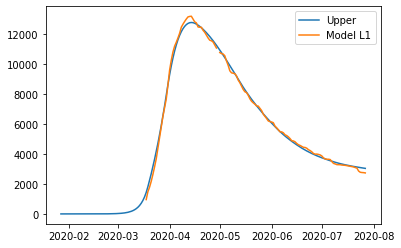

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3134521106056184, 'other': 0.41141986181311324, 'school': 0.23259140173738327, 'transport': 0.2564129603336426, 'work': 0.41713542023651345}
{'home': 1.0, 'leisure': 0.3390195111368879, 'other': 0.4506979105986866, 'school': 0.2951258757926748, 'transport': 0.28601114610814354, 'work': 0.5595142746609696}
{'home': 1.0, 'leisure': 0.363673790220612, 'other': 0.48857317192763233, 'school': 0.35542697577456306, 'transport': 0.31455225381926943, 'work': 0.696808169998838}
{'home': 1.0, 'leisure': 0.38376246206660947, 'other': 0.51943449597344, 'school': 0.404561205389435, 'transport': 0.33780797121352024, 'work': 0.8086772699037679}
{'home': 1.0, 'leisure': 0.39563304088469886, 'other': 0.537670732909599, 'school': 0.43359506834367745, 'transport': 0.3515499860373956, 'work': 0.8747817380294081}
{'home': 1.0, 'leisure': 0.40202489101751626, 'other': 0.5474902451059924, 'scho

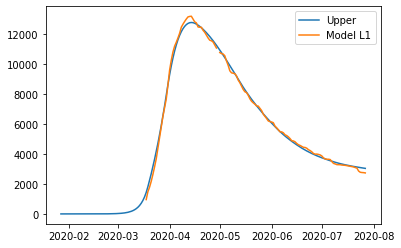

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3134521106056184, 'other': 0.41141986181311324, 'school': 0.23259140173738327, 'transport': 0.2564129603336426, 'work': 0.41713542023651345}
{'home': 1.0, 'leisure': 0.3390195111368879, 'other': 0.4506979105986866, 'school': 0.2951258757926748, 'transport': 0.28601114610814354, 'work': 0.5595142746609696}
{'home': 1.0, 'leisure': 0.363673790220612, 'other': 0.48857317192763233, 'school': 0.35542697577456306, 'transport': 0.31455225381926943, 'work': 0.696808169998838}
{'home': 1.0, 'leisure': 0.38376246206660947, 'other': 0.51943449597344, 'school': 0.404561205389435, 'transport': 0.33780797121352024, 'work': 0.8086772699037679}
{'home': 1.0, 'leisure': 0.39563304088469886, 'other': 0.537670732909599, 'school': 0.43359506834367745, 'transport': 0.3515499860373956, 'work': 0.8747817380294081}
{'home': 1.0, 'leisure': 0.40202489101751626, 'other': 0.5474902451059924, 'scho

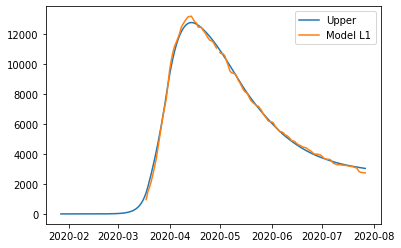

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31352992309404837, 'other': 0.41127522809630146, 'school': 0.23270524427774888, 'transport': 0.25644666281897344, 'work': 0.4171229733824656}
{'home': 1.0, 'leisure': 0.33904996753432487, 'other': 0.4504716304642933, 'school': 0.29516921938852003, 'transport': 0.2860091899536807, 'work': 0.5593266010111427}
{'home': 1.0, 'leisure': 0.36365858181602007, 'other': 0.48826816131914264, 'school': 0.35540233824533507, 'transport': 0.3145159125478627, 'work': 0.6964515276530814}
{'home': 1.0, 'leisure': 0.38371004530480873, 'other': 0.5190653346082791, 'school': 0.40448117583236953, 'transport': 0.3377436124394185, 'work': 0.8081829493613276}
{'home': 1.0, 'leisure': 0.39555863736636565, 'other': 0.5372636642791324, 'school': 0.433482307133799, 'transport': 0.35146907146624684, 'work': 0.8742060621889276}
{'home': 1.0, 'leisure': 0.4019386484764348, 'other': 0.5470627648711304,

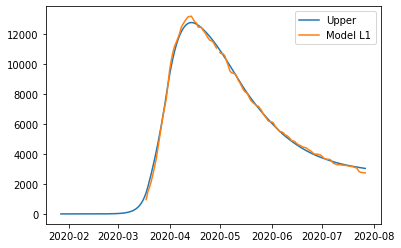

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31352992309404837, 'other': 0.41127522809630146, 'school': 0.23270524427774888, 'transport': 0.25644666281897344, 'work': 0.4171229733824656}
{'home': 1.0, 'leisure': 0.33904996753432487, 'other': 0.4504716304642933, 'school': 0.29516921938852003, 'transport': 0.2860091899536807, 'work': 0.5593266010111427}
{'home': 1.0, 'leisure': 0.36365858181602007, 'other': 0.48826816131914264, 'school': 0.35540233824533507, 'transport': 0.3145159125478627, 'work': 0.6964515276530814}
{'home': 1.0, 'leisure': 0.38371004530480873, 'other': 0.5190653346082791, 'school': 0.40448117583236953, 'transport': 0.3377436124394185, 'work': 0.8081829493613276}
{'home': 1.0, 'leisure': 0.39555863736636565, 'other': 0.5372636642791324, 'school': 0.433482307133799, 'transport': 0.35146907146624684, 'work': 0.8742060621889276}
{'home': 1.0, 'leisure': 0.4019386484764348, 'other': 0.5470627648711304,

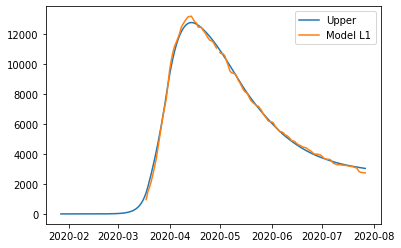

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31352992309404837, 'other': 0.41127522809630146, 'school': 0.23270524427774888, 'transport': 0.25644666281897344, 'work': 0.4171229733824656}
{'home': 1.0, 'leisure': 0.33904996753432487, 'other': 0.4504716304642933, 'school': 0.29516921938852003, 'transport': 0.2860091899536807, 'work': 0.5593266010111427}
{'home': 1.0, 'leisure': 0.36365858181602007, 'other': 0.48826816131914264, 'school': 0.35540233824533507, 'transport': 0.3145159125478627, 'work': 0.6964515276530814}
{'home': 1.0, 'leisure': 0.38371004530480873, 'other': 0.5190653346082791, 'school': 0.40448117583236953, 'transport': 0.3377436124394185, 'work': 0.8081829493613276}
{'home': 1.0, 'leisure': 0.39555863736636565, 'other': 0.5372636642791324, 'school': 0.433482307133799, 'transport': 0.35146907146624684, 'work': 0.8742060621889276}
{'home': 1.0, 'leisure': 0.4019386484764348, 'other': 0.5470627648711304,

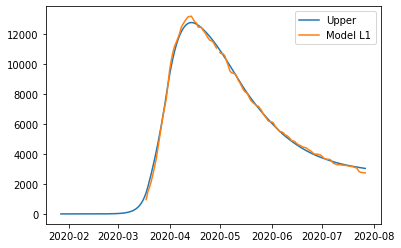

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31352992309404837, 'other': 0.41127522809630146, 'school': 0.23270524427774888, 'transport': 0.25644666281897344, 'work': 0.4171229733824656}
{'home': 1.0, 'leisure': 0.33904996753432487, 'other': 0.4504716304642933, 'school': 0.29516921938852003, 'transport': 0.2860091899536807, 'work': 0.5593266010111427}
{'home': 1.0, 'leisure': 0.36365858181602007, 'other': 0.48826816131914264, 'school': 0.35540233824533507, 'transport': 0.3145159125478627, 'work': 0.6964515276530814}
{'home': 1.0, 'leisure': 0.38371004530480873, 'other': 0.5190653346082791, 'school': 0.40448117583236953, 'transport': 0.3377436124394185, 'work': 0.8081829493613276}
{'home': 1.0, 'leisure': 0.39555863736636565, 'other': 0.5372636642791324, 'school': 0.433482307133799, 'transport': 0.35146907146624684, 'work': 0.8742060621889276}
{'home': 1.0, 'leisure': 0.4019386484764348, 'other': 0.5470627648711304,

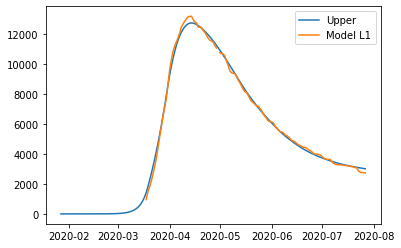

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31393392140033594, 'other': 0.41035350279396027, 'school': 0.23333734576022985, 'transport': 0.25660678165250617, 'work': 0.41701706322523957}
{'home': 1.0, 'leisure': 0.3391797809697084, 'other': 0.44907602927352097, 'school': 0.29538922818447716, 'transport': 0.28596071009828217, 'work': 0.5582097529665602}
{'home': 1.0, 'leisure': 0.36352400269731755, 'other': 0.4864156083788117, 'school': 0.3552249719507157, 'transport': 0.3142662839567091, 'work': 0.6943598466456908}
{'home': 1.0, 'leisure': 0.3833600352161102, 'other': 0.5168404506127523, 'school': 0.40398002242691, 'transport': 0.3373300848783902, 'work': 0.8052969600138714}
{'home': 1.0, 'leisure': 0.3950813271590331, 'other': 0.5348187664782627, 'school': 0.4327898249810249, 'transport': 0.35095869451392914, 'work': 0.8708507088223417}
{'home': 1.0, 'leisure': 0.40139279205137623, 'other': 0.5444993980981528, 's

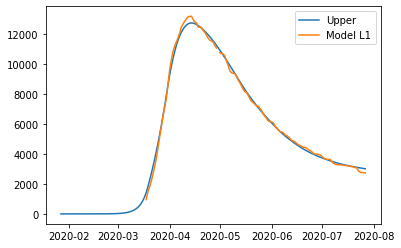

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31393392140033594, 'other': 0.41035350279396027, 'school': 0.23333734576022985, 'transport': 0.25660678165250617, 'work': 0.41701706322523957}
{'home': 1.0, 'leisure': 0.3391797809697084, 'other': 0.44907602927352097, 'school': 0.29538922818447716, 'transport': 0.28596071009828217, 'work': 0.5582097529665602}
{'home': 1.0, 'leisure': 0.36352400269731755, 'other': 0.4864156083788117, 'school': 0.3552249719507157, 'transport': 0.3142662839567091, 'work': 0.6943598466456908}
{'home': 1.0, 'leisure': 0.3833600352161102, 'other': 0.5168404506127523, 'school': 0.40398002242691, 'transport': 0.3373300848783902, 'work': 0.8052969600138714}
{'home': 1.0, 'leisure': 0.3950813271590331, 'other': 0.5348187664782627, 'school': 0.4327898249810249, 'transport': 0.35095869451392914, 'work': 0.8708507088223417}
{'home': 1.0, 'leisure': 0.40139279205137623, 'other': 0.5444993980981528, 's

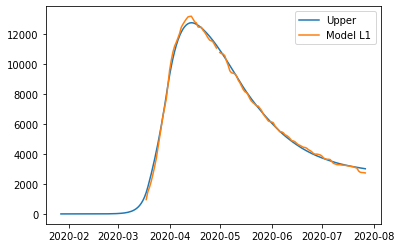

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137968951221594, 'other': 0.4105711466624693, 'school': 0.2331177488436018, 'transport': 0.2565383042050293, 'work': 0.4169838044277309}
{'home': 1.0, 'leisure': 0.3391025970286008, 'other': 0.449401577769052, 'school': 0.29525452841515754, 'transport': 0.28593642008459963, 'work': 0.5584007003319433}
{'home': 1.0, 'leisure': 0.3635045238669549, 'other': 0.4868452077646853, 'school': 0.35517213728772906, 'transport': 0.31428460325418517, 'work': 0.6947669928110052}
{'home': 1.0, 'leisure': 0.3833875753648731, 'other': 0.5173548322055718, 'school': 0.40399389266538, 'transport': 0.3373831228738476, 'work': 0.805880268164315}
{'home': 1.0, 'leisure': 0.39513665125000663, 'other': 0.5353832466479138, 'school': 0.43284311175217366, 'transport': 0.3510322481036481, 'work': 0.8715381126912707}
{'home': 1.0, 'leisure': 0.40146307672661696, 'other': 0.5450908544245594, 'school'

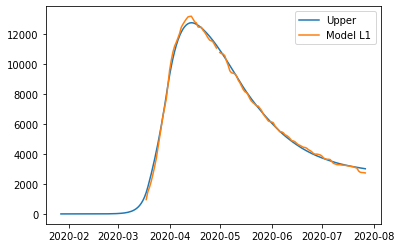

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137968951221594, 'other': 0.4105711466624693, 'school': 0.2331177488436018, 'transport': 0.2565383042050293, 'work': 0.4169838044277309}
{'home': 1.0, 'leisure': 0.3391025970286008, 'other': 0.449401577769052, 'school': 0.29525452841515754, 'transport': 0.28593642008459963, 'work': 0.5584007003319433}
{'home': 1.0, 'leisure': 0.3635045238669549, 'other': 0.4868452077646853, 'school': 0.35517213728772906, 'transport': 0.31428460325418517, 'work': 0.6947669928110052}
{'home': 1.0, 'leisure': 0.3833875753648731, 'other': 0.5173548322055718, 'school': 0.40399389266538, 'transport': 0.3373831228738476, 'work': 0.805880268164315}
{'home': 1.0, 'leisure': 0.39513665125000663, 'other': 0.5353832466479138, 'school': 0.43284311175217366, 'transport': 0.3510322481036481, 'work': 0.8715381126912707}
{'home': 1.0, 'leisure': 0.40146307672661696, 'other': 0.5450908544245594, 'school'

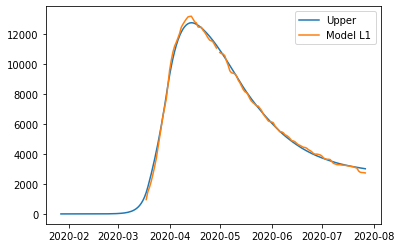

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137968951221594, 'other': 0.4105711466624693, 'school': 0.2331177488436018, 'transport': 0.2565383042050293, 'work': 0.4169838044277309}
{'home': 1.0, 'leisure': 0.3391025970286008, 'other': 0.449401577769052, 'school': 0.29525452841515754, 'transport': 0.28593642008459963, 'work': 0.5584007003319433}
{'home': 1.0, 'leisure': 0.3635045238669549, 'other': 0.4868452077646853, 'school': 0.35517213728772906, 'transport': 0.31428460325418517, 'work': 0.6947669928110052}
{'home': 1.0, 'leisure': 0.3833875753648731, 'other': 0.5173548322055718, 'school': 0.40399389266538, 'transport': 0.3373831228738476, 'work': 0.805880268164315}
{'home': 1.0, 'leisure': 0.39513665125000663, 'other': 0.5353832466479138, 'school': 0.43284311175217366, 'transport': 0.3510322481036481, 'work': 0.8715381126912707}
{'home': 1.0, 'leisure': 0.40146307672661696, 'other': 0.5450908544245594, 'school'

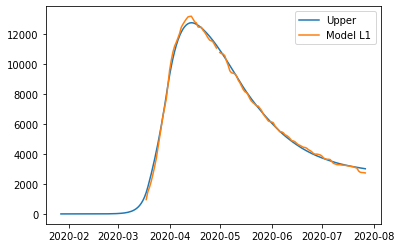

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137968951221594, 'other': 0.4105711466624693, 'school': 0.2331177488436018, 'transport': 0.2565383042050293, 'work': 0.4169838044277309}
{'home': 1.0, 'leisure': 0.3391025970286008, 'other': 0.449401577769052, 'school': 0.29525452841515754, 'transport': 0.28593642008459963, 'work': 0.5584007003319433}
{'home': 1.0, 'leisure': 0.3635045238669549, 'other': 0.4868452077646853, 'school': 0.35517213728772906, 'transport': 0.31428460325418517, 'work': 0.6947669928110052}
{'home': 1.0, 'leisure': 0.3833875753648731, 'other': 0.5173548322055718, 'school': 0.40399389266538, 'transport': 0.3373831228738476, 'work': 0.805880268164315}
{'home': 1.0, 'leisure': 0.39513665125000663, 'other': 0.5353832466479138, 'school': 0.43284311175217366, 'transport': 0.3510322481036481, 'work': 0.8715381126912707}
{'home': 1.0, 'leisure': 0.40146307672661696, 'other': 0.5450908544245594, 'school'

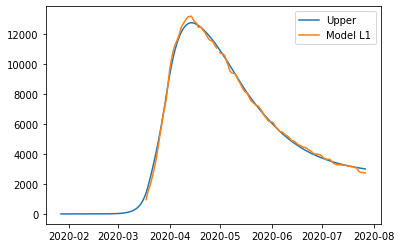

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138963680967778, 'other': 0.410225555786506, 'school': 0.23327474840790133, 'transport': 0.2565581887649722, 'work': 0.41688992959757787}
{'home': 1.0, 'leisure': 0.3390988905576653, 'other': 0.44888151966574646, 'school': 0.2952496107411461, 'transport': 0.28587549719408467, 'work': 0.5579293789804616}
{'home': 1.0, 'leisure': 0.3634013229306639, 'other': 0.4861569134064426, 'school': 0.3550110851339178, 'transport': 0.31414575889358604, 'work': 0.6939317051710995}
{'home': 1.0, 'leisure': 0.3832033048642184, 'other': 0.5165294564544173, 'school': 0.4037056198243245, 'transport': 0.3371807869450316, 'work': 0.8047484154005082}
{'home': 1.0, 'leisure': 0.39490447600677325, 'other': 0.5344768682554932, 'school': 0.4324796630504738, 'transport': 0.3507923944299767, 'work': 0.8702310168997042}
{'home': 1.0, 'leisure': 0.40120510662199516, 'other': 0.5441408592253033, 'scho

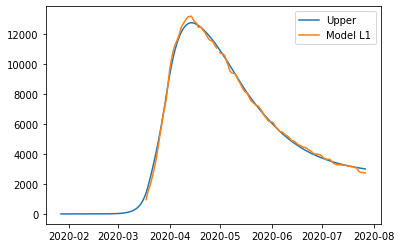

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138963680967778, 'other': 0.410225555786506, 'school': 0.23327474840790133, 'transport': 0.2565581887649722, 'work': 0.41688992959757787}
{'home': 1.0, 'leisure': 0.3390988910084181, 'other': 0.44888152035711715, 'school': 0.2952496118495806, 'transport': 0.28587549771843146, 'work': 0.5579293815029842}
{'home': 1.0, 'leisure': 0.36340132381607126, 'other': 0.4861569147644922, 'school': 0.35501108731119985, 'transport': 0.31414575992355276, 'work': 0.6939317101260545}
{'home': 1.0, 'leisure': 0.38320330610378867, 'other': 0.5165294583556866, 'school': 0.40370562287251927, 'transport': 0.33718078838698506, 'work': 0.8047484223374451}
{'home': 1.0, 'leisure': 0.3949044774556217, 'other': 0.5344768704777562, 'school': 0.4324796666132989, 'transport': 0.3507923961153768, 'work': 0.8702310250078124}
{'home': 1.0, 'leisure': 0.4012051081835317, 'other': 0.5441408616204089, 's

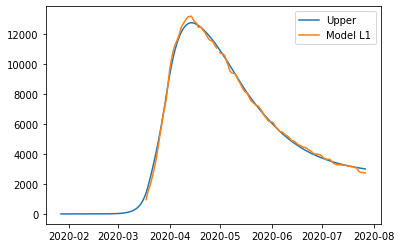

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31389636988369074, 'other': 0.4102255585272969, 'school': 0.2332747528020522, 'transport': 0.25655819084363235, 'work': 0.41688993959757786}
{'home': 1.0, 'leisure': 0.33909889234457824, 'other': 0.4488815224065374, 'school': 0.295249615135297, 'transport': 0.28587549927274486, 'work': 0.5579293889804616}
{'home': 1.0, 'leisure': 0.3634013247175769, 'other': 0.48615691614723355, 'school': 0.35501108952806876, 'transport': 0.3141457609722462, 'work': 0.6939317151710995}
{'home': 1.0, 'leisure': 0.3832033066511314, 'other': 0.5165294591952082, 'school': 0.4037056242184754, 'transport': 0.33718078902369175, 'work': 0.8047484254005082}
{'home': 1.0, 'leisure': 0.3949044777936863, 'other': 0.5344768709962842, 'school': 0.43247966744462474, 'transport': 0.3507923965086368, 'work': 0.8702310268997042}
{'home': 1.0, 'leisure': 0.40120510840890816, 'other': 0.5441408619660942, 's

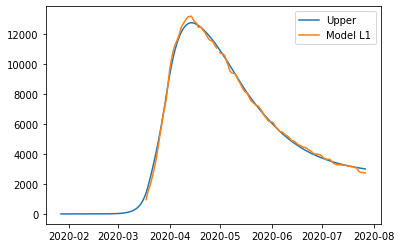

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138963680967778, 'other': 0.41022556578650604, 'school': 0.23327474840790133, 'transport': 0.2565581887649722, 'work': 0.41688992959757787}
{'home': 1.0, 'leisure': 0.3390988905576653, 'other': 0.44888152966574646, 'school': 0.2952496107411461, 'transport': 0.28587549719408467, 'work': 0.5579293789804616}
{'home': 1.0, 'leisure': 0.3634013229306639, 'other': 0.4861569234064426, 'school': 0.3550110851339178, 'transport': 0.31414575889358604, 'work': 0.6939317051710995}
{'home': 1.0, 'leisure': 0.3832033048642184, 'other': 0.5165294664544173, 'school': 0.4037056198243245, 'transport': 0.3371807869450316, 'work': 0.8047484154005082}
{'home': 1.0, 'leisure': 0.39490447600677325, 'other': 0.5344768782554932, 'school': 0.4324796630504738, 'transport': 0.3507923944299767, 'work': 0.8702310168997042}
{'home': 1.0, 'leisure': 0.40120510662199516, 'other': 0.5441408692253034, 'sc

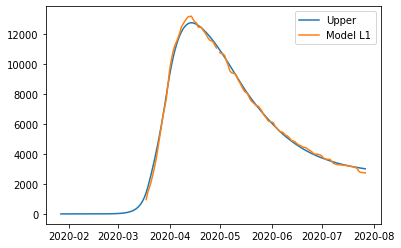

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31383423838875557, 'other': 0.41044137760587507, 'school': 0.23317669762692744, 'transport': 0.2565457698373129, 'work': 0.4169485575179932}
{'home': 1.0, 'leisure': 0.33910117744445667, 'other': 0.4492062575623561, 'school': 0.29525268506838914, 'transport': 0.28591354370798383, 'work': 0.558223734673459}
{'home': 1.0, 'leisure': 0.363465725819597, 'other': 0.4865866775203914, 'school': 0.35511167295837004, 'transport': 0.31423246851184505, 'work': 0.694453369787658}
{'home': 1.0, 'leisure': 0.3833183207919336, 'other': 0.5170447974861979, 'school': 0.4038856630909471, 'transport': 0.3373071479816579, 'work': 0.805455294695524}
{'home': 1.0, 'leisure': 0.3950493996392235, 'other': 0.5350427774659927, 'school': 0.4327066572601972, 'transport': 0.35094218585018366, 'work': 0.8710473412319903}
{'home': 1.0, 'leisure': 0.4013661344031487, 'other': 0.544733997455113, 'school

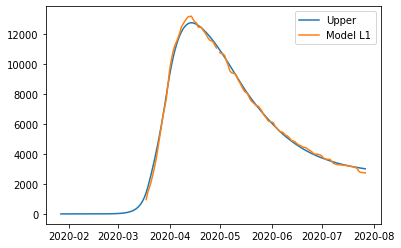

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31383423838875557, 'other': 0.41044137760587507, 'school': 0.23317669762692744, 'transport': 0.2565457698373129, 'work': 0.4169485575179932}
{'home': 1.0, 'leisure': 0.33910117744445667, 'other': 0.4492062575623561, 'school': 0.29525268506838914, 'transport': 0.28591354370798383, 'work': 0.558223734673459}
{'home': 1.0, 'leisure': 0.363465725819597, 'other': 0.4865866775203914, 'school': 0.35511167295837004, 'transport': 0.31423246851184505, 'work': 0.694453369787658}
{'home': 1.0, 'leisure': 0.3833183207919336, 'other': 0.5170447974861979, 'school': 0.4038856630909471, 'transport': 0.3373071479816579, 'work': 0.805455294695524}
{'home': 1.0, 'leisure': 0.3950493996392235, 'other': 0.5350427774659927, 'school': 0.4327066572601972, 'transport': 0.35094218585018366, 'work': 0.8710473412319903}
{'home': 1.0, 'leisure': 0.4013661344031487, 'other': 0.544733997455113, 'school

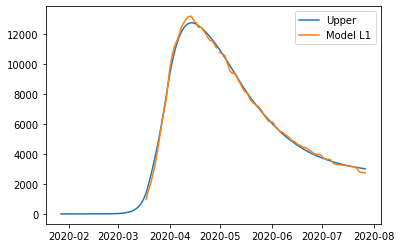

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138543244375803, 'other': 0.41040629926231004, 'school': 0.2332041644600407, 'transport': 0.2565548198600165, 'work': 0.4169428835826847}
{'home': 1.0, 'leisure': 0.33910869438182145, 'other': 0.449149815332874, 'school': 0.29526130309650245, 'transport': 0.28591313522234757, 'work': 0.5581712308092917}
{'home': 1.0, 'leisure': 0.36346112254233964, 'other': 0.4865096344009179, 'school': 0.3551021153530906, 'transport': 0.3142229393217382, 'work': 0.6943557084920913}
{'home': 1.0, 'leisure': 0.3833038417842433, 'other': 0.516950968456361, 'school': 0.4038612957103106, 'transport': 0.33729018710642694, 'work': 0.8053208384558539}
{'home': 1.0, 'leisure': 0.39502908497264094, 'other': 0.5349390294891228, 'school': 0.4326735386486678, 'transport': 0.3509208335246521, 'work': 0.8708911425253498}
{'home': 1.0, 'leisure': 0.4013426774587012, 'other': 0.5446249085067638, 'schoo

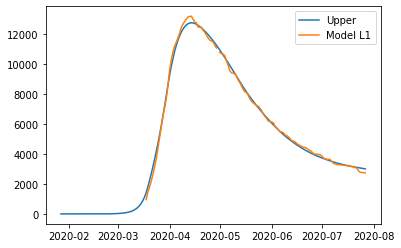

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138543244375803, 'other': 0.41040629926231004, 'school': 0.2332041644600407, 'transport': 0.2565548198600165, 'work': 0.4169428835826847}
{'home': 1.0, 'leisure': 0.33910869438182145, 'other': 0.449149815332874, 'school': 0.29526130309650245, 'transport': 0.28591313522234757, 'work': 0.5581712308092917}
{'home': 1.0, 'leisure': 0.36346112254233964, 'other': 0.4865096344009179, 'school': 0.3551021153530906, 'transport': 0.3142229393217382, 'work': 0.6943557084920913}
{'home': 1.0, 'leisure': 0.3833038417842433, 'other': 0.516950968456361, 'school': 0.4038612957103106, 'transport': 0.33729018710642694, 'work': 0.8053208384558539}
{'home': 1.0, 'leisure': 0.39502908497264094, 'other': 0.5349390294891228, 'school': 0.4326735386486678, 'transport': 0.3509208335246521, 'work': 0.8708911425253498}
{'home': 1.0, 'leisure': 0.4013426774587012, 'other': 0.5446249085067638, 'schoo

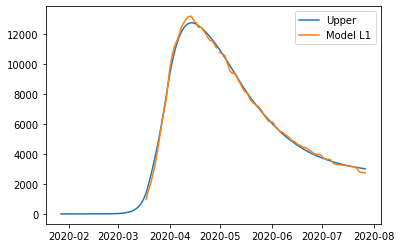

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138543244375803, 'other': 0.41040629926231004, 'school': 0.2332041644600407, 'transport': 0.2565548198600165, 'work': 0.4169428835826847}
{'home': 1.0, 'leisure': 0.33910869438182145, 'other': 0.449149815332874, 'school': 0.29526130309650245, 'transport': 0.28591313522234757, 'work': 0.5581712308092917}
{'home': 1.0, 'leisure': 0.36346112254233964, 'other': 0.4865096344009179, 'school': 0.3551021153530906, 'transport': 0.3142229393217382, 'work': 0.6943557084920913}
{'home': 1.0, 'leisure': 0.3833038417842433, 'other': 0.516950968456361, 'school': 0.4038612957103106, 'transport': 0.33729018710642694, 'work': 0.8053208384558539}
{'home': 1.0, 'leisure': 0.39502908497264094, 'other': 0.5349390294891228, 'school': 0.4326735386486678, 'transport': 0.3509208335246521, 'work': 0.8708911425253498}
{'home': 1.0, 'leisure': 0.4013426774587012, 'other': 0.5446249085067638, 'schoo

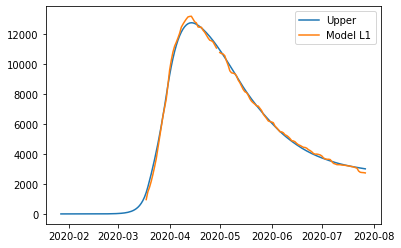

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138492978259998, 'other': 0.4104185022006044, 'school': 0.2331900278752547, 'transport': 0.2565526440240455, 'work': 0.41693266557094216}
{'home': 1.0, 'leisure': 0.33910347729623397, 'other': 0.4491629035508181, 'school': 0.2952463398358535, 'transport': 0.2859108389082662, 'work': 0.5581602719616678}
{'home': 1.0, 'leisure': 0.3634557217853884, 'other': 0.4865235762813813, 'school': 0.35508635494071666, 'transport': 0.31422052683233614, 'work': 0.6943440352670105}
{'home': 1.0, 'leisure': 0.3832982913691438, 'other': 0.516965605913692, 'school': 0.4038448857669015, 'transport': 0.33728767995565245, 'work': 0.8053085831454379}
{'home': 1.0, 'leisure': 0.3950234461231811, 'other': 0.5349540779691484, 'school': 0.43265674489146516, 'transport': 0.35091827043761203, 'work': 0.8708785432554176}
{'home': 1.0, 'leisure': 0.4013369909907396, 'other': 0.5446401783067019, 'scho

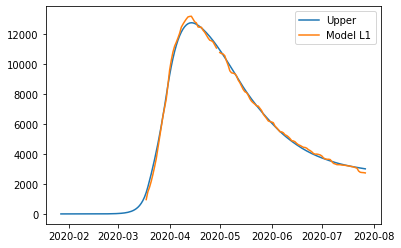

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138492978259998, 'other': 0.4104185022006044, 'school': 0.2331900278752547, 'transport': 0.2565526440240455, 'work': 0.41693266557094216}
{'home': 1.0, 'leisure': 0.33910347729623397, 'other': 0.4491629035508181, 'school': 0.2952463398358535, 'transport': 0.2859108389082662, 'work': 0.5581602719616678}
{'home': 1.0, 'leisure': 0.3634557217853884, 'other': 0.4865235762813813, 'school': 0.35508635494071666, 'transport': 0.31422052683233614, 'work': 0.6943440352670105}
{'home': 1.0, 'leisure': 0.3832982913691438, 'other': 0.516965605913692, 'school': 0.4038448857669015, 'transport': 0.33728767995565245, 'work': 0.8053085831454379}
{'home': 1.0, 'leisure': 0.3950234461231811, 'other': 0.5349540779691484, 'school': 0.43265674489146516, 'transport': 0.35091827043761203, 'work': 0.8708785432554176}
{'home': 1.0, 'leisure': 0.4013369909907396, 'other': 0.5446401783067019, 'scho

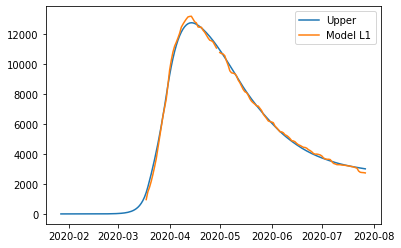

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138492978259998, 'other': 0.4104185022006044, 'school': 0.2331900278752547, 'transport': 0.2565526440240455, 'work': 0.41693266557094216}
{'home': 1.0, 'leisure': 0.33910347729623397, 'other': 0.4491629035508181, 'school': 0.2952463398358535, 'transport': 0.2859108389082662, 'work': 0.5581602719616678}
{'home': 1.0, 'leisure': 0.3634557217853884, 'other': 0.4865235762813813, 'school': 0.35508635494071666, 'transport': 0.31422052683233614, 'work': 0.6943440352670105}
{'home': 1.0, 'leisure': 0.3832982913691438, 'other': 0.516965605913692, 'school': 0.4038448857669015, 'transport': 0.33728767995565245, 'work': 0.8053085831454379}
{'home': 1.0, 'leisure': 0.3950234461231811, 'other': 0.5349540779691484, 'school': 0.43265674489146516, 'transport': 0.35091827043761203, 'work': 0.8708785432554176}
{'home': 1.0, 'leisure': 0.4013369909907396, 'other': 0.5446401783067019, 'scho

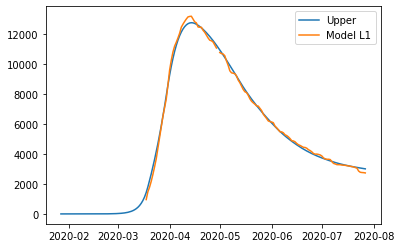

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138291914636026, 'other': 0.41046731237867057, 'school': 0.23313348226128175, 'transport': 0.2565439406316489, 'work': 0.41689179352397193}
{'home': 1.0, 'leisure': 0.339082609043894, 'other': 0.449215254733283, 'school': 0.2951864875710057, 'transport': 0.2859016535999109, 'work': 0.5581164365711726}
{'home': 1.0, 'leisure': 0.3634341188534606, 'other': 0.48657934200380215, 'school': 0.35502331411966814, 'transport': 0.3142108768193064, 'work': 0.6942973423666876}
{'home': 1.0, 'leisure': 0.3832760898094038, 'other': 0.5170241538538547, 'school': 0.4037792468630227, 'transport': 0.3372776512943693, 'work': 0.8052595619037739}
{'home': 1.0, 'leisure': 0.3950008908288248, 'other': 0.5350142699470677, 'school': 0.4325895707568231, 'transport': 0.3509080180296338, 'work': 0.8708281461756885}
{'home': 1.0, 'leisure': 0.40131424522389764, 'other': 0.5447012555357207, 'school

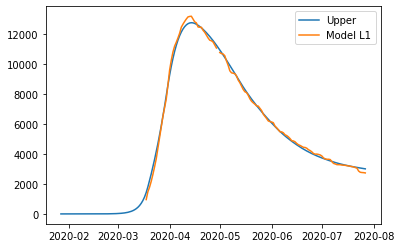

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138291914636026, 'other': 0.41046731237867057, 'school': 0.23313348226128175, 'transport': 0.2565439406316489, 'work': 0.41689179352397193}
{'home': 1.0, 'leisure': 0.339082609043894, 'other': 0.449215254733283, 'school': 0.2951864875710057, 'transport': 0.2859016535999109, 'work': 0.5581164365711726}
{'home': 1.0, 'leisure': 0.3634341188534606, 'other': 0.48657934200380215, 'school': 0.35502331411966814, 'transport': 0.3142108768193064, 'work': 0.6942973423666876}
{'home': 1.0, 'leisure': 0.3832760898094038, 'other': 0.5170241538538547, 'school': 0.4037792468630227, 'transport': 0.3372776512943693, 'work': 0.8052595619037739}
{'home': 1.0, 'leisure': 0.3950008908288248, 'other': 0.5350142699470677, 'school': 0.4325895707568231, 'transport': 0.3509080180296338, 'work': 0.8708281461756885}
{'home': 1.0, 'leisure': 0.40131424522389764, 'other': 0.5447012555357207, 'school

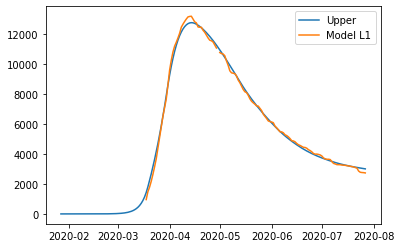

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138146161618781, 'other': 0.41051934762349207, 'school': 0.23305770561173805, 'transport': 0.2565380997654594, 'work': 0.41680658232152884}
{'home': 1.0, 'leisure': 0.3390515874623739, 'other': 0.44924861974695524, 'school': 0.2950818985670496, 'transport': 0.28588361449948146, 'work': 0.5579696860387963}
{'home': 1.0, 'leisure': 0.3633872383592806, 'other': 0.4865947035802947, 'school': 0.35489094177395714, 'transport': 0.3141810751358599, 'work': 0.6940912503375898}
{'home': 1.0, 'leisure': 0.38321628723824164, 'other': 0.5170248459630158, 'school': 0.40362423623884486, 'transport': 0.3372382652840201, 'work': 0.8050051175440143}
{'home': 1.0, 'leisure': 0.3949334524849004, 'other': 0.5350062937346236, 'school': 0.43242118296809656, 'transport': 0.3508629685533875, 'work': 0.870545129984174}
{'home': 1.0, 'leisure': 0.4012426953100243, 'other': 0.5446886117654894, 'sc

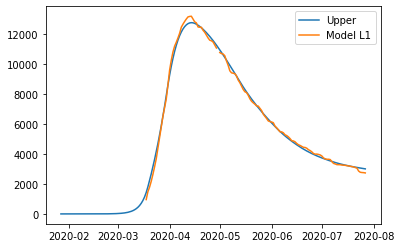

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3138146161618781, 'other': 0.41051934762349207, 'school': 0.23305770561173805, 'transport': 0.2565380997654594, 'work': 0.41680658232152884}
{'home': 1.0, 'leisure': 0.3390515874623739, 'other': 0.44924861974695524, 'school': 0.2950818985670496, 'transport': 0.28588361449948146, 'work': 0.5579696860387963}
{'home': 1.0, 'leisure': 0.3633872383592806, 'other': 0.4865947035802947, 'school': 0.35489094177395714, 'transport': 0.3141810751358599, 'work': 0.6940912503375898}
{'home': 1.0, 'leisure': 0.38321628723824164, 'other': 0.5170248459630158, 'school': 0.40362423623884486, 'transport': 0.3372382652840201, 'work': 0.8050051175440143}
{'home': 1.0, 'leisure': 0.3949334524849004, 'other': 0.5350062937346236, 'school': 0.43242118296809656, 'transport': 0.3508629685533875, 'work': 0.870545129984174}
{'home': 1.0, 'leisure': 0.4012426953100243, 'other': 0.5446886117654894, 'sc

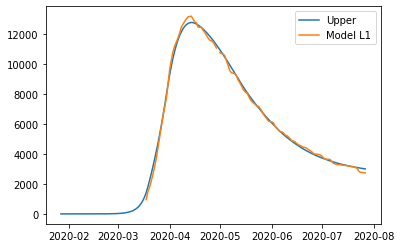

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31375638065452827, 'other': 0.41072751016015235, 'school': 0.2327546204119148, 'transport': 0.25651472912306494, 'work': 0.4164657375117565}
{'home': 1.0, 'leisure': 0.3389276142839013, 'other': 0.44938211692770363, 'school': 0.29466357940341587, 'transport': 0.28581144573645556, 'work': 0.5573826839092906}
{'home': 1.0, 'leisure': 0.36319987528365383, 'other': 0.4866562020249852, 'school': 0.35436150414522044, 'transport': 0.31406185104222506, 'work': 0.6932668822211985}
{'home': 1.0, 'leisure': 0.38297727313530405, 'other': 0.5170276787709184, 'school': 0.40300425763854275, 'transport': 0.33708069980988914, 'work': 0.8039873401049754}
{'home': 1.0, 'leisure': 0.39466391732037015, 'other': 0.5349744604844244, 'school': 0.4317477028845968, 'transport': 0.35068274680896333, 'work': 0.8694130652181162}
{'home': 1.0, 'leisure': 0.4009567257277134, 'other': 0.544638112176312

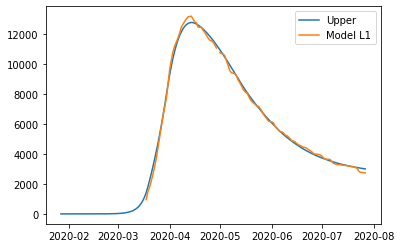

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31375638065452827, 'other': 0.41072751016015235, 'school': 0.2327546204119148, 'transport': 0.25651472912306494, 'work': 0.4164657375117565}
{'home': 1.0, 'leisure': 0.33892761473448585, 'other': 0.4493821176196511, 'school': 0.2946635805116342, 'transport': 0.2858114462608895, 'work': 0.5573826864318132}
{'home': 1.0, 'leisure': 0.36319987616873073, 'other': 0.4866562033841677, 'school': 0.35436150632207797, 'transport': 0.31406185207236315, 'work': 0.6932668871761536}
{'home': 1.0, 'leisure': 0.3829772743744117, 'other': 0.5170276806737738, 'school': 0.40300426068614315, 'transport': 0.33708070125208245, 'work': 0.8039873470419123}
{'home': 1.0, 'leisure': 0.39466391876867774, 'other': 0.5349744627085411, 'school': 0.4317477064467272, 'transport': 0.35068274849464387, 'work': 0.8694130733262244}
{'home': 1.0, 'leisure': 0.40095672728866716, 'other': 0.5446381145734158,

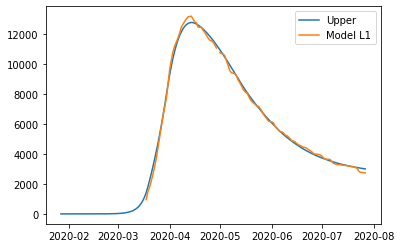

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31375638065452827, 'other': 0.4107275143248097, 'school': 0.2327546204119148, 'transport': 0.25651472912306494, 'work': 0.4164657375117565}
{'home': 1.0, 'leisure': 0.3389276142839013, 'other': 0.4493821225015305, 'school': 0.29466357940341587, 'transport': 0.28581144573645556, 'work': 0.5573826839092906}
{'home': 1.0, 'leisure': 0.36319987528365383, 'other': 0.48665620895765405, 'school': 0.35436150414522044, 'transport': 0.31406185104222506, 'work': 0.6932668822211985}
{'home': 1.0, 'leisure': 0.38297727313530405, 'other': 0.5170276868107918, 'school': 0.40300425763854275, 'transport': 0.33708069980988914, 'work': 0.8039873401049754}
{'home': 1.0, 'leisure': 0.39466391732037015, 'other': 0.534974469178555, 'school': 0.4317477028845968, 'transport': 0.35068274680896333, 'work': 0.8694130652181162}
{'home': 1.0, 'leisure': 0.4009567257277134, 'other': 0.5446381212227352,

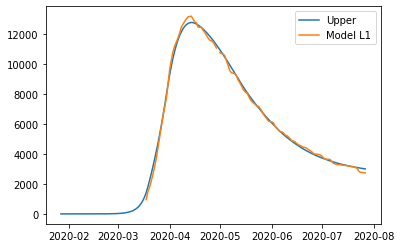

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31375638065452827, 'other': 0.41072752016015235, 'school': 0.2327546204119148, 'transport': 0.25651472912306494, 'work': 0.4164657375117565}
{'home': 1.0, 'leisure': 0.3389276142839013, 'other': 0.44938212692770363, 'school': 0.29466357940341587, 'transport': 0.28581144573645556, 'work': 0.5573826839092906}
{'home': 1.0, 'leisure': 0.36319987528365383, 'other': 0.4866562120249852, 'school': 0.35436150414522044, 'transport': 0.31406185104222506, 'work': 0.6932668822211985}
{'home': 1.0, 'leisure': 0.38297727313530405, 'other': 0.5170276887709184, 'school': 0.40300425763854275, 'transport': 0.33708069980988914, 'work': 0.8039873401049754}
{'home': 1.0, 'leisure': 0.39466391732037015, 'other': 0.5349744704844244, 'school': 0.4317477028845968, 'transport': 0.35068274680896333, 'work': 0.8694130652181162}
{'home': 1.0, 'leisure': 0.4009567257277134, 'other': 0.544638122176312

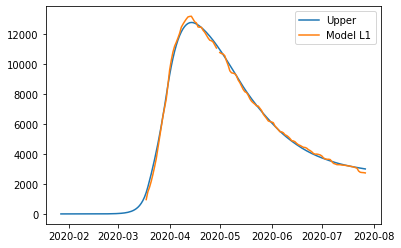

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137594683351236, 'other': 0.4107548209595293, 'school': 0.23275074546384358, 'transport': 0.25651995967441577, 'work': 0.4164707492267299}
{'home': 1.0, 'leisure': 0.3389340661109444, 'other': 0.44941567062856336, 'school': 0.2946655041439407, 'transport': 0.28581968428419313, 'work': 0.5573990083437779}
{'home': 1.0, 'leisure': 0.3632095711090573, 'other': 0.48669577566656047, 'school': 0.35436902144260574, 'transport': 0.31407299015790696, 'work': 0.6932941153495026}
{'home': 1.0, 'leisure': 0.3829896122186308, 'other': 0.517072157549373, 'school': 0.4030163318341106, 'transport': 0.33709420235130344, 'work': 0.8040234617986117}
{'home': 1.0, 'leisure': 0.3946778183288333, 'other': 0.5350218377528531, 'school': 0.4317624697927271, 'transport': 0.35069764592012864, 'work': 0.8694544392458124}
{'home': 1.0, 'leisure': 0.40097146777278847, 'other': 0.5446870501701115, 's

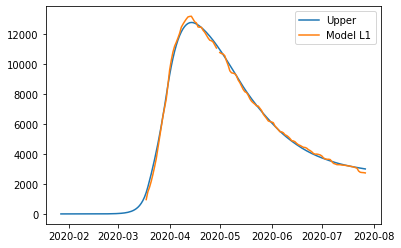

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137594683351236, 'other': 0.4107548209595293, 'school': 0.23275074546384358, 'transport': 0.25651995967441577, 'work': 0.4164707492267299}
{'home': 1.0, 'leisure': 0.3389340661109444, 'other': 0.44941567062856336, 'school': 0.2946655041439407, 'transport': 0.28581968428419313, 'work': 0.5573990083437779}
{'home': 1.0, 'leisure': 0.3632095711090573, 'other': 0.48669577566656047, 'school': 0.35436902144260574, 'transport': 0.31407299015790696, 'work': 0.6932941153495026}
{'home': 1.0, 'leisure': 0.3829896122186308, 'other': 0.517072157549373, 'school': 0.4030163318341106, 'transport': 0.33709420235130344, 'work': 0.8040234617986117}
{'home': 1.0, 'leisure': 0.3946778183288333, 'other': 0.5350218377528531, 'school': 0.4317624697927271, 'transport': 0.35069764592012864, 'work': 0.8694544392458124}
{'home': 1.0, 'leisure': 0.40097146777278847, 'other': 0.5446870501701115, 's

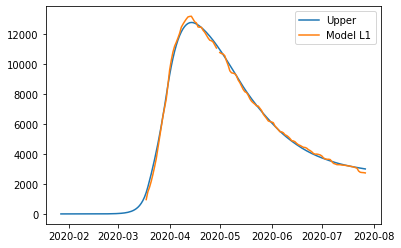

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137594683351236, 'other': 0.4107548209595293, 'school': 0.23275074546384358, 'transport': 0.25651995967441577, 'work': 0.4164707492267299}
{'home': 1.0, 'leisure': 0.3389340661109444, 'other': 0.44941567062856336, 'school': 0.2946655041439407, 'transport': 0.28581968428419313, 'work': 0.5573990083437779}
{'home': 1.0, 'leisure': 0.3632095711090573, 'other': 0.48669577566656047, 'school': 0.35436902144260574, 'transport': 0.31407299015790696, 'work': 0.6932941153495026}
{'home': 1.0, 'leisure': 0.3829896122186308, 'other': 0.517072157549373, 'school': 0.4030163318341106, 'transport': 0.33709420235130344, 'work': 0.8040234617986117}
{'home': 1.0, 'leisure': 0.3946778183288333, 'other': 0.5350218377528531, 'school': 0.4317624697927271, 'transport': 0.35069764592012864, 'work': 0.8694544392458124}
{'home': 1.0, 'leisure': 0.40097146777278847, 'other': 0.5446870501701115, 's

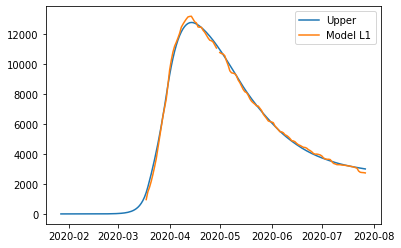

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137594683351236, 'other': 0.4107548209595293, 'school': 0.23275074546384358, 'transport': 0.25651995967441577, 'work': 0.4164707492267299}
{'home': 1.0, 'leisure': 0.3389340661109444, 'other': 0.44941567062856336, 'school': 0.2946655041439407, 'transport': 0.28581968428419313, 'work': 0.5573990083437779}
{'home': 1.0, 'leisure': 0.3632095711090573, 'other': 0.48669577566656047, 'school': 0.35436902144260574, 'transport': 0.31407299015790696, 'work': 0.6932941153495026}
{'home': 1.0, 'leisure': 0.3829896122186308, 'other': 0.517072157549373, 'school': 0.4030163318341106, 'transport': 0.33709420235130344, 'work': 0.8040234617986117}
{'home': 1.0, 'leisure': 0.3946778183288333, 'other': 0.5350218377528531, 'school': 0.4317624697927271, 'transport': 0.35069764592012864, 'work': 0.8694544392458124}
{'home': 1.0, 'leisure': 0.40097146777278847, 'other': 0.5446870501701115, 's

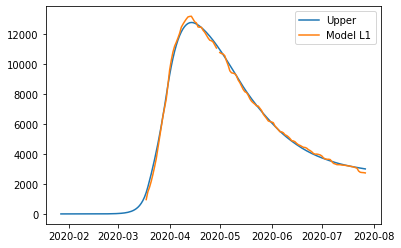

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31376987116951927, 'other': 0.41074692295426285, 'school': 0.23278863953727413, 'transport': 0.2565271455228444, 'work': 0.4165197119019469}
{'home': 1.0, 'leisure': 0.33895549784070317, 'other': 0.44942198699957736, 'school': 0.29472272275829925, 'transport': 0.28583544090460883, 'work': 0.5574883272367528}
{'home': 1.0, 'leisure': 0.3632416378450591, 'other': 0.48671579875755927, 'school': 0.3544448744357164, 'transport': 0.3140970114513103, 'work': 0.6934223491667442}
{'home': 1.0, 'leisure': 0.38303034451527507, 'other': 0.5171033490788779, 'school': 0.4031073683950934, 'transport': 0.3371249578226967, 'work': 0.8041834040726632}
{'home': 1.0, 'leisure': 0.39472367118403895, 'other': 0.5350596288142024, 'school': 0.4318624784619979, 'transport': 0.35073238067851586, 'work': 0.8696331183352516}
{'home': 1.0, 'leisure': 0.4010200778518349, 'other': 0.5447283948255311, 

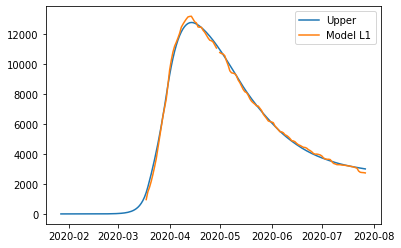

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31376987116951927, 'other': 0.41074692295426285, 'school': 0.23278863953727413, 'transport': 0.2565271455228444, 'work': 0.4165197119019469}
{'home': 1.0, 'leisure': 0.33895549784070317, 'other': 0.44942198699957736, 'school': 0.29472272275829925, 'transport': 0.28583544090460883, 'work': 0.5574883272367528}
{'home': 1.0, 'leisure': 0.3632416378450591, 'other': 0.48671579875755927, 'school': 0.3544448744357164, 'transport': 0.3140970114513103, 'work': 0.6934223491667442}
{'home': 1.0, 'leisure': 0.38303034451527507, 'other': 0.5171033490788779, 'school': 0.4031073683950934, 'transport': 0.3371249578226967, 'work': 0.8041834040726632}
{'home': 1.0, 'leisure': 0.39472367118403895, 'other': 0.5350596288142024, 'school': 0.4318624784619979, 'transport': 0.35073238067851586, 'work': 0.8696331183352516}
{'home': 1.0, 'leisure': 0.4010200778518349, 'other': 0.5447283948255311, 

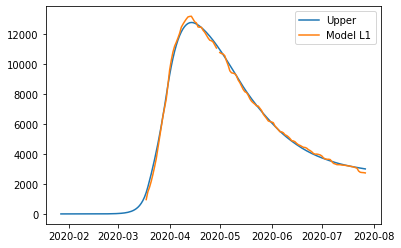

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31376987116951927, 'other': 0.41074692295426285, 'school': 0.23278863953727413, 'transport': 0.2565271455228444, 'work': 0.4165197119019469}
{'home': 1.0, 'leisure': 0.33895549784070317, 'other': 0.44942198699957736, 'school': 0.29472272275829925, 'transport': 0.28583544090460883, 'work': 0.5574883272367528}
{'home': 1.0, 'leisure': 0.3632416378450591, 'other': 0.48671579875755927, 'school': 0.3544448744357164, 'transport': 0.3140970114513103, 'work': 0.6934223491667442}
{'home': 1.0, 'leisure': 0.38303034451527507, 'other': 0.5171033490788779, 'school': 0.4031073683950934, 'transport': 0.3371249578226967, 'work': 0.8041834040726632}
{'home': 1.0, 'leisure': 0.39472367118403895, 'other': 0.5350596288142024, 'school': 0.4318624784619979, 'transport': 0.35073238067851586, 'work': 0.8696331183352516}
{'home': 1.0, 'leisure': 0.4010200778518349, 'other': 0.5447283948255311, 

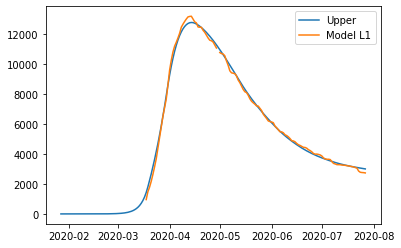

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31377067995677255, 'other': 0.41074630908536164, 'school': 0.23279158532233532, 'transport': 0.2565277041281521, 'work': 0.4165235180708852}
{'home': 1.0, 'leisure': 0.3389571640632288, 'other': 0.44942247817668673, 'school': 0.2947271707966527, 'transport': 0.28583666577290034, 'work': 0.5574952705419243}
{'home': 1.0, 'leisure': 0.3632441308801687, 'other': 0.48671735551475026, 'school': 0.35445077107545886, 'transport': 0.314098878787479, 'work': 0.6934323175675692}
{'home': 1.0, 'leisure': 0.3830335112495272, 'other': 0.5171057740865057, 'school': 0.40311444537670826, 'transport': 0.3371273486512098, 'work': 0.8041958373662428}
{'home': 1.0, 'leisure': 0.394727236013239, 'other': 0.5350625668789067, 'school': 0.4318702529183557, 'transport': 0.3507350808434143, 'work': 0.8696470081563681}
{'home': 1.0, 'leisure': 0.4010238570398531, 'other': 0.544731609151738, 'schoo

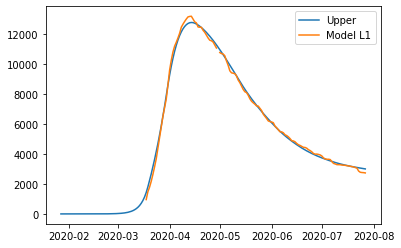

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31377067995677255, 'other': 0.41074630908536164, 'school': 0.23279158532233532, 'transport': 0.2565277041281521, 'work': 0.4165235180708852}
{'home': 1.0, 'leisure': 0.3389571640632288, 'other': 0.44942247817668673, 'school': 0.2947271707966527, 'transport': 0.28583666577290034, 'work': 0.5574952705419243}
{'home': 1.0, 'leisure': 0.3632441308801687, 'other': 0.48671735551475026, 'school': 0.35445077107545886, 'transport': 0.314098878787479, 'work': 0.6934323175675692}
{'home': 1.0, 'leisure': 0.3830335112495272, 'other': 0.5171057740865057, 'school': 0.40311444537670826, 'transport': 0.3371273486512098, 'work': 0.8041958373662428}
{'home': 1.0, 'leisure': 0.394727236013239, 'other': 0.5350625668789067, 'school': 0.4318702529183557, 'transport': 0.3507350808434143, 'work': 0.8696470081563681}
{'home': 1.0, 'leisure': 0.4010238570398531, 'other': 0.544731609151738, 'schoo

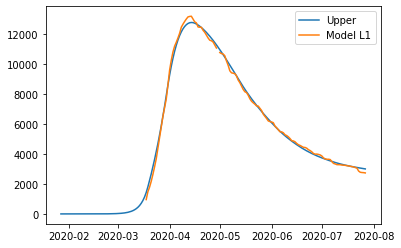

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31377067995677255, 'other': 0.41074630908536164, 'school': 0.23279158532233532, 'transport': 0.2565277041281521, 'work': 0.4165235180708852}
{'home': 1.0, 'leisure': 0.3389571640632288, 'other': 0.44942247817668673, 'school': 0.2947271707966527, 'transport': 0.28583666577290034, 'work': 0.5574952705419243}
{'home': 1.0, 'leisure': 0.3632441308801687, 'other': 0.48671735551475026, 'school': 0.35445077107545886, 'transport': 0.314098878787479, 'work': 0.6934323175675692}
{'home': 1.0, 'leisure': 0.3830335112495272, 'other': 0.5171057740865057, 'school': 0.40311444537670826, 'transport': 0.3371273486512098, 'work': 0.8041958373662428}
{'home': 1.0, 'leisure': 0.394727236013239, 'other': 0.5350625668789067, 'school': 0.4318702529183557, 'transport': 0.3507350808434143, 'work': 0.8696470081563681}
{'home': 1.0, 'leisure': 0.4010238570398531, 'other': 0.544731609151738, 'schoo

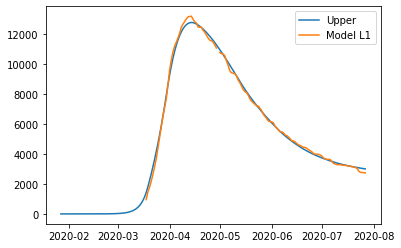

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137412450981458, 'other': 0.4107940977870104, 'school': 0.23271246978900512, 'transport': 0.2565133432776366, 'work': 0.4164532966824402}
{'home': 1.0, 'leisure': 0.3389214260024885, 'other': 0.4494667041780609, 'school': 0.2946350824663129, 'transport': 0.2858175391965808, 'work': 0.5574022966351382}
{'home': 1.0, 'leisure': 0.363202314731676, 'other': 0.48675814605514534, 'school': 0.35434617326228834, 'transport': 0.3140751566898484, 'work': 0.6933174037323828}
{'home': 1.0, 'leisure': 0.38298674258508814, 'other': 0.5171437653623993, 'school': 0.40299965465160165, 'transport': 0.3370998820547332, 'work': 0.8040630465523599}
{'home': 1.0, 'leisure': 0.3946775408621044, 'other': 0.5350989040439584, 'school': 0.4317494391089231, 'transport': 0.35070540158852875, 'work': 0.8695036536732554}
{'home': 1.0, 'leisure': 0.40097258608819003, 'other': 0.544767055641721, 'schoo

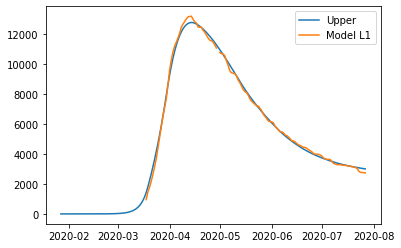

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137412450981458, 'other': 0.4107940977870104, 'school': 0.23271246978900512, 'transport': 0.2565133432776366, 'work': 0.4164532966824402}
{'home': 1.0, 'leisure': 0.3389214260024885, 'other': 0.4494667041780609, 'school': 0.2946350824663129, 'transport': 0.2858175391965808, 'work': 0.5574022966351382}
{'home': 1.0, 'leisure': 0.363202314731676, 'other': 0.48675814605514534, 'school': 0.35434617326228834, 'transport': 0.3140751566898484, 'work': 0.6933174037323828}
{'home': 1.0, 'leisure': 0.38298674258508814, 'other': 0.5171437653623993, 'school': 0.40299965465160165, 'transport': 0.3370998820547332, 'work': 0.8040630465523599}
{'home': 1.0, 'leisure': 0.3946775408621044, 'other': 0.5350989040439584, 'school': 0.4317494391089231, 'transport': 0.35070540158852875, 'work': 0.8695036536732554}
{'home': 1.0, 'leisure': 0.40097258608819003, 'other': 0.544767055641721, 'schoo

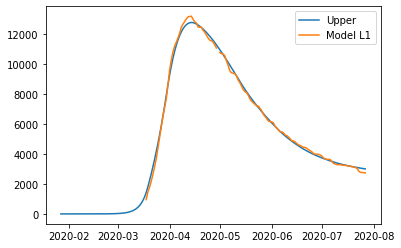

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3137412450981458, 'other': 0.4107940977870104, 'school': 0.23271246978900512, 'transport': 0.2565133432776366, 'work': 0.4164532966824402}
{'home': 1.0, 'leisure': 0.3389214260024885, 'other': 0.4494667041780609, 'school': 0.2946350824663129, 'transport': 0.2858175391965808, 'work': 0.5574022966351382}
{'home': 1.0, 'leisure': 0.363202314731676, 'other': 0.48675814605514534, 'school': 0.35434617326228834, 'transport': 0.3140751566898484, 'work': 0.6933174037323828}
{'home': 1.0, 'leisure': 0.38298674258508814, 'other': 0.5171437653623993, 'school': 0.40299965465160165, 'transport': 0.3370998820547332, 'work': 0.8040630465523599}
{'home': 1.0, 'leisure': 0.3946775408621044, 'other': 0.5350989040439584, 'school': 0.4317494391089231, 'transport': 0.35070540158852875, 'work': 0.8695036536732554}
{'home': 1.0, 'leisure': 0.40097258608819003, 'other': 0.544767055641721, 'schoo

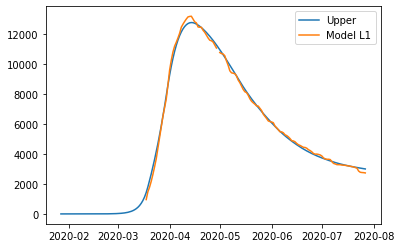

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3136119058368483, 'other': 0.41102523022938675, 'school': 0.23238925224873058, 'transport': 0.2564553470505756, 'work': 0.4162033810247161}
{'home': 1.0, 'leisure': 0.33878572817563657, 'other': 0.44971355071395247, 'school': 0.2942906140340616, 'transport': 0.28575529624512386, 'work': 0.5571307590853292}
{'home': 1.0, 'leisure': 0.3630604854308967, 'other': 0.4870201454669266, 'school': 0.35398121289848794, 'transport': 0.314008818682724, 'work': 0.6930250165009204}
{'home': 1.0, 'leisure': 0.3828399172685161, 'other': 0.5174181115619425, 'school': 0.40261799715839086, 'transport': 0.33703020733558336, 'work': 0.8037536706914021}
{'home': 1.0, 'leisure': 0.394527763354382, 'other': 0.5353805460726337, 'school': 0.4313579151301516, 'transport': 0.35063375517590933, 'work': 0.8691842390766866}
{'home': 1.0, 'leisure': 0.40082121893907907, 'other': 0.5450526261937751, 'sc

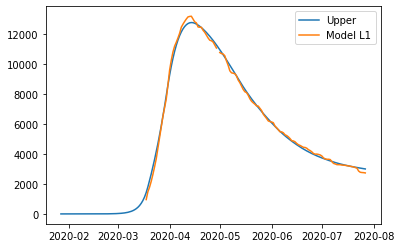

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3136119058368483, 'other': 0.41102523022938675, 'school': 0.23238925224873058, 'transport': 0.2564553470505756, 'work': 0.4162033810247161}
{'home': 1.0, 'leisure': 0.33878572817563657, 'other': 0.44971355071395247, 'school': 0.2942906140340616, 'transport': 0.28575529624512386, 'work': 0.5571307590853292}
{'home': 1.0, 'leisure': 0.3630604854308967, 'other': 0.4870201454669266, 'school': 0.35398121289848794, 'transport': 0.314008818682724, 'work': 0.6930250165009204}
{'home': 1.0, 'leisure': 0.3828399172685161, 'other': 0.5174181115619425, 'school': 0.40261799715839086, 'transport': 0.33703020733558336, 'work': 0.8037536706914021}
{'home': 1.0, 'leisure': 0.394527763354382, 'other': 0.5353805460726337, 'school': 0.4313579151301516, 'transport': 0.35063375517590933, 'work': 0.8691842390766866}
{'home': 1.0, 'leisure': 0.40082121893907907, 'other': 0.5450526261937751, 'sc

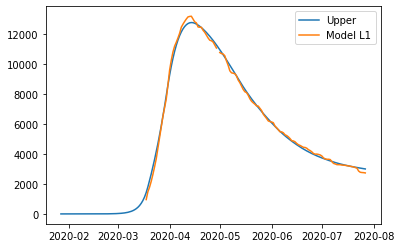

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3136119058368483, 'other': 0.41102523022938675, 'school': 0.23238925224873058, 'transport': 0.2564553470505756, 'work': 0.4162033810247161}
{'home': 1.0, 'leisure': 0.33878572862623413, 'other': 0.44971355140645214, 'school': 0.2942906151420619, 'transport': 0.28575529676957684, 'work': 0.5571307616078517}
{'home': 1.0, 'leisure': 0.363060486315999, 'other': 0.48702014682719375, 'school': 0.3539812150749171, 'transport': 0.31400881971289946, 'work': 0.6930250214558753}
{'home': 1.0, 'leisure': 0.3828399185076593, 'other': 0.5174181134663165, 'school': 0.40261800020539174, 'transport': 0.337030208777829, 'work': 0.803753677628339}
{'home': 1.0, 'leisure': 0.39452776480273133, 'other': 0.5353805482985254, 'school': 0.43135791869158124, 'transport': 0.350633756861651, 'work': 0.8691842471847948}
{'home': 1.0, 'leisure': 0.40082122050007785, 'other': 0.5450526285927918, 'sch

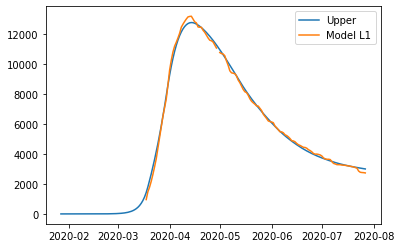

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3136119076231458, 'other': 0.4110252329746532, 'school': 0.2323892566411604, 'transport': 0.25645534912965695, 'work': 0.4162033910247161}
{'home': 1.0, 'leisure': 0.338785729961934, 'other': 0.44971355345921893, 'school': 0.29429061842649135, 'transport': 0.28575529832420526, 'work': 0.5571307690853291}
{'home': 1.0, 'leisure': 0.3630604872171942, 'other': 0.4870201482121931, 'school': 0.35398121729091775, 'transport': 0.31400882076180536, 'work': 0.6930250265009203}
{'home': 1.0, 'leisure': 0.3828399190548135, 'other': 0.517418114307209, 'school': 0.40261800155082067, 'transport': 0.33703020941466477, 'work': 0.8037536806914021}
{'home': 1.0, 'leisure': 0.3945277651406795, 'other': 0.5353805488179002, 'school': 0.43135791952258146, 'transport': 0.35063375725499074, 'work': 0.8691842490766867}
{'home': 1.0, 'leisure': 0.40082122072537657, 'other': 0.5450526289390416, 's

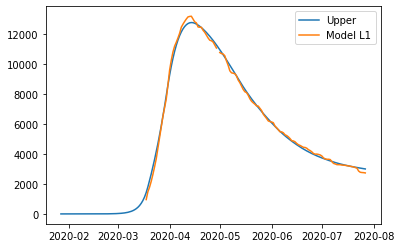

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3136119058368483, 'other': 0.4110252343914206, 'school': 0.23238925224873058, 'transport': 0.2564553470505756, 'work': 0.4162033810247161}
{'home': 1.0, 'leisure': 0.33878572817563657, 'other': 0.4497135562852601, 'school': 0.2942906140340616, 'transport': 0.28575529624512386, 'work': 0.5571307590853292}
{'home': 1.0, 'leisure': 0.3630604854308967, 'other': 0.4870201523971768, 'school': 0.35398121289848794, 'transport': 0.314008818682724, 'work': 0.6930250165009204}
{'home': 1.0, 'leisure': 0.3828399172685161, 'other': 0.5174181195994793, 'school': 0.40261799715839086, 'transport': 0.33703020733558336, 'work': 0.8037536706914021}
{'home': 1.0, 'leisure': 0.394527763354382, 'other': 0.5353805547644761, 'school': 0.4313579151301516, 'transport': 0.35063375517590933, 'work': 0.8691842390766866}
{'home': 1.0, 'leisure': 0.40082121893907907, 'other': 0.545052635237936, 'schoo

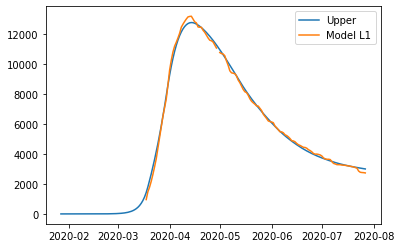

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3136119058368483, 'other': 0.4110252402293868, 'school': 0.23238925224873058, 'transport': 0.2564553470505756, 'work': 0.4162033810247161}
{'home': 1.0, 'leisure': 0.33878572817563657, 'other': 0.4497135607139525, 'school': 0.2942906140340616, 'transport': 0.28575529624512386, 'work': 0.5571307590853292}
{'home': 1.0, 'leisure': 0.3630604854308967, 'other': 0.48702015546692656, 'school': 0.35398121289848794, 'transport': 0.314008818682724, 'work': 0.6930250165009204}
{'home': 1.0, 'leisure': 0.3828399172685161, 'other': 0.5174181215619426, 'school': 0.40261799715839086, 'transport': 0.33703020733558336, 'work': 0.8037536706914021}
{'home': 1.0, 'leisure': 0.394527763354382, 'other': 0.5353805560726337, 'school': 0.4313579151301516, 'transport': 0.35063375517590933, 'work': 0.8691842390766866}
{'home': 1.0, 'leisure': 0.40082121893907907, 'other': 0.5450526361937752, 'sch

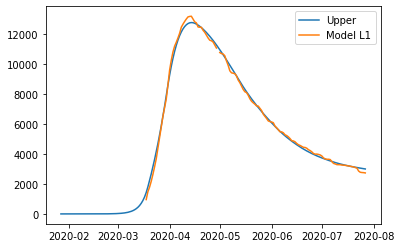

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3132261630233861, 'other': 0.4118202515411932, 'school': 0.23138264317719456, 'transport': 0.25629234502664144, 'work': 0.4154482174964364}
{'home': 1.0, 'leisure': 0.33838814093756225, 'other': 0.45057210055222124, 'school': 0.2932316150395387, 'transport': 0.28558619023688103, 'work': 0.5563339296683083}
{'home': 1.0, 'leisure': 0.362651476783375, 'other': 0.4879399549557126, 'school': 0.35287169504965626, 'transport': 0.31383382668961207, 'work': 0.6921880092626134}
{'home': 1.0, 'leisure': 0.3824216022873706, 'other': 0.5183878363215203, 'school': 0.4014673157986409, 'transport': 0.3368504193548003, 'work': 0.8028839259690842}
{'home': 1.0, 'leisure': 0.39410394917609526, 'other': 0.5363797662194977, 'school': 0.4301829098775864, 'transport': 0.3504511332024116, 'work': 0.8682951494774533}
{'home': 1.0, 'leisure': 0.4003944436546393, 'other': 0.5460677284722546, 'sch

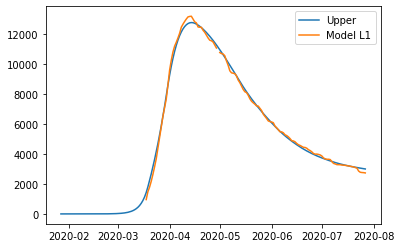

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3132261630233861, 'other': 0.4118202515411932, 'school': 0.23138264317719456, 'transport': 0.25629234502664144, 'work': 0.4154482174964364}
{'home': 1.0, 'leisure': 0.33838814093756225, 'other': 0.45057210055222124, 'school': 0.2932316150395387, 'transport': 0.28558619023688103, 'work': 0.5563339296683083}
{'home': 1.0, 'leisure': 0.362651476783375, 'other': 0.4879399549557126, 'school': 0.35287169504965626, 'transport': 0.31383382668961207, 'work': 0.6921880092626134}
{'home': 1.0, 'leisure': 0.3824216022873706, 'other': 0.5183878363215203, 'school': 0.4014673157986409, 'transport': 0.3368504193548003, 'work': 0.8028839259690842}
{'home': 1.0, 'leisure': 0.39410394917609526, 'other': 0.5363797662194977, 'school': 0.4301829098775864, 'transport': 0.3504511332024116, 'work': 0.8682951494774533}
{'home': 1.0, 'leisure': 0.4003944436546393, 'other': 0.5460677284722546, 'sch

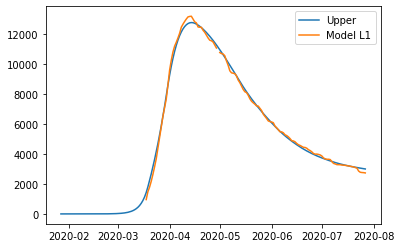

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3132261630233861, 'other': 0.4118202515411932, 'school': 0.23138264317719456, 'transport': 0.25629234502664144, 'work': 0.4154482174964364}
{'home': 1.0, 'leisure': 0.33838814138808104, 'other': 0.4505721012460632, 'school': 0.2932316161469287, 'transport': 0.28558619076137987, 'work': 0.5563339321908309}
{'home': 1.0, 'leisure': 0.3626514776683226, 'other': 0.48793995631861636, 'school': 0.3528716972248866, 'transport': 0.31383382771987756, 'work': 0.6921880142175685}
{'home': 1.0, 'leisure': 0.38242160352629717, 'other': 0.5183878382295857, 'school': 0.40146731884396336, 'transport': 0.336850420797172, 'work': 0.8028839329060212}
{'home': 1.0, 'leisure': 0.39410395062419123, 'other': 0.5363797684497038, 'school': 0.4301829134370542, 'transport': 0.35045113488830054, 'work': 0.8682951575855615}
{'home': 1.0, 'leisure': 0.40039444521536505, 'other': 0.5460677308759213, '

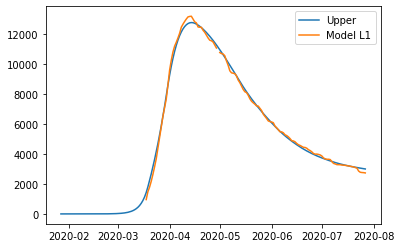

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31322616480937115, 'other': 0.4118202542917808, 'school': 0.2313826475672048, 'transport': 0.2562923471059045, 'work': 0.4154482274964364}
{'home': 1.0, 'leisure': 0.33838814272354734, 'other': 0.45057210330280884, 'school': 0.29323161942954895, 'transport': 0.28558619231614407, 'work': 0.5563339396683084}
{'home': 1.0, 'leisure': 0.3626514785693601, 'other': 0.48793995770630016, 'school': 0.3528716994396665, 'transport': 0.3138338287688751, 'work': 0.6921880192626134}
{'home': 1.0, 'leisure': 0.3824216040733557, 'other': 0.518387839072108, 'school': 0.40146732018865117, 'transport': 0.3368504214340634, 'work': 0.8028839359690843}
{'home': 1.0, 'leisure': 0.3941039509620803, 'other': 0.5363797689700852, 'school': 0.43018291426759664, 'transport': 0.3504511352816746, 'work': 0.8682951594774533}
{'home': 1.0, 'leisure': 0.4003944454406244, 'other': 0.5460677312228422, 'sch

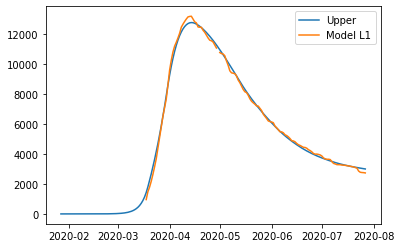

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3132261630233861, 'other': 0.4118202556956754, 'school': 0.23138264317719456, 'transport': 0.25629234502664144, 'work': 0.4154482174964364}
{'home': 1.0, 'leisure': 0.33838814093756225, 'other': 0.45057210611556053, 'school': 0.2932316150395387, 'transport': 0.28558619023688103, 'work': 0.5563339296683083}
{'home': 1.0, 'leisure': 0.362651476783375, 'other': 0.4879399618775927, 'school': 0.35287169504965626, 'transport': 0.31383382668961207, 'work': 0.6921880092626134}
{'home': 1.0, 'leisure': 0.3824216022873706, 'other': 0.5183878443503596, 'school': 0.4014673157986409, 'transport': 0.3368504193548003, 'work': 0.8028839259690842}
{'home': 1.0, 'leisure': 0.39410394917609526, 'other': 0.5363797749024491, 'school': 0.4301829098775864, 'transport': 0.3504511332024116, 'work': 0.8682951494774533}
{'home': 1.0, 'leisure': 0.4003944436546393, 'other': 0.5460677375074204, 'sch

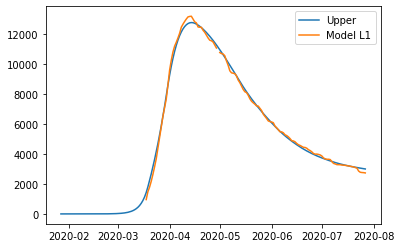

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3132261630233861, 'other': 0.4118202615411932, 'school': 0.23138264317719456, 'transport': 0.25629234502664144, 'work': 0.4154482174964364}
{'home': 1.0, 'leisure': 0.33838814093756225, 'other': 0.45057211055222124, 'school': 0.2932316150395387, 'transport': 0.28558619023688103, 'work': 0.5563339296683083}
{'home': 1.0, 'leisure': 0.362651476783375, 'other': 0.48793996495571257, 'school': 0.35287169504965626, 'transport': 0.31383382668961207, 'work': 0.6921880092626134}
{'home': 1.0, 'leisure': 0.3824216022873706, 'other': 0.5183878463215204, 'school': 0.4014673157986409, 'transport': 0.3368504193548003, 'work': 0.8028839259690842}
{'home': 1.0, 'leisure': 0.39410394917609526, 'other': 0.5363797762194976, 'school': 0.4301829098775864, 'transport': 0.3504511332024116, 'work': 0.8682951494774533}
{'home': 1.0, 'leisure': 0.4003944436546393, 'other': 0.5460677384722546, 'sc

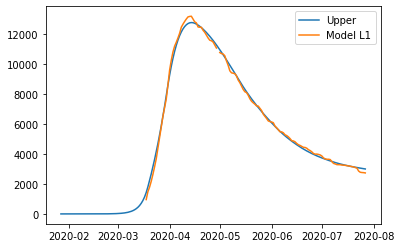

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31322419600951723, 'other': 0.41182430377378637, 'school': 0.2313775108081636, 'transport': 0.2562915137109071, 'work': 0.4154443664630438}
{'home': 1.0, 'leisure': 0.33838611352851505, 'other': 0.4505764766413718, 'school': 0.2932262155544283, 'transport': 0.2855853277893779, 'work': 0.5563298661554688}
{'home': 1.0, 'leisure': 0.36264939113612005, 'other': 0.4879446433351148, 'school': 0.3528660379883263, 'transport': 0.31383293422218894, 'work': 0.6921837408588785}
{'home': 1.0, 'leisure': 0.3824194691867612, 'other': 0.5183927791596462, 'school': 0.4014614488603914, 'transport': 0.3368495024267017, 'work': 0.8028794906172124}
{'home': 1.0, 'leisure': 0.3941017880348673, 'other': 0.5363848594195966, 'school': 0.4301769189211571, 'transport': 0.3504502018202774, 'work': 0.8682906154744097}
{'home': 1.0, 'leisure': 0.4003922674146167, 'other': 0.5460729026364929, 'schoo

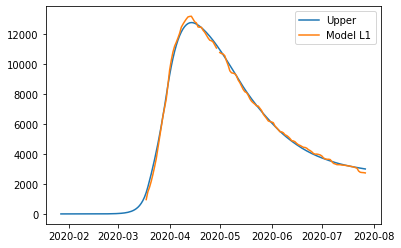

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31322419600951723, 'other': 0.41182430377378637, 'school': 0.2313775108081636, 'transport': 0.2562915137109071, 'work': 0.4154443664630438}
{'home': 1.0, 'leisure': 0.33838611352851505, 'other': 0.4505764766413718, 'school': 0.2932262155544283, 'transport': 0.2855853277893779, 'work': 0.5563298661554688}
{'home': 1.0, 'leisure': 0.36264939113612005, 'other': 0.4879446433351148, 'school': 0.3528660379883263, 'transport': 0.31383293422218894, 'work': 0.6921837408588785}
{'home': 1.0, 'leisure': 0.3824194691867612, 'other': 0.5183927791596462, 'school': 0.4014614488603914, 'transport': 0.3368495024267017, 'work': 0.8028794906172124}
{'home': 1.0, 'leisure': 0.3941017880348673, 'other': 0.5363848594195966, 'school': 0.4301769189211571, 'transport': 0.3504502018202774, 'work': 0.8682906154744097}
{'home': 1.0, 'leisure': 0.4003922674146167, 'other': 0.5460729026364929, 'schoo

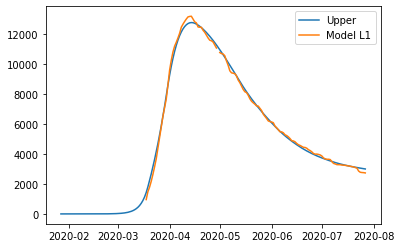

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31322419600951723, 'other': 0.41182430377378637, 'school': 0.2313775108081636, 'transport': 0.2562915137109071, 'work': 0.4154443664630438}
{'home': 1.0, 'leisure': 0.3383861139790334, 'other': 0.45057647733522055, 'school': 0.29322621666181514, 'transport': 0.2855853283138769, 'work': 0.5563298686779913}
{'home': 1.0, 'leisure': 0.36264939202106683, 'other': 0.487944644698032, 'school': 0.35286604016355055, 'transport': 0.3138329352524549, 'work': 0.6921837458138336}
{'home': 1.0, 'leisure': 0.38241947042568664, 'other': 0.5183927810677302, 'school': 0.40146145190570526, 'transport': 0.336849503869074, 'work': 0.8028794975541493}
{'home': 1.0, 'leisure': 0.394101789482962, 'other': 0.5363848616498247, 'school': 0.4301769224806149, 'transport': 0.3504502035061671, 'work': 0.8682906235825179}
{'home': 1.0, 'leisure': 0.400392268975341, 'other': 0.5460729050401832, 'school

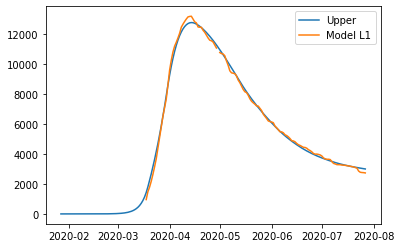

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3132241977955007, 'other': 0.4118243065244011, 'school': 0.2313775151981615, 'transport': 0.25629151579017106, 'work': 0.4154443764630438}
{'home': 1.0, 'leisure': 0.3383861153144985, 'other': 0.4505764793919865, 'school': 0.2932262199444261, 'transport': 0.2855853298686418, 'work': 0.5563298761554687}
{'home': 1.0, 'leisure': 0.3626493929221035, 'other': 0.4879446460857295, 'school': 0.3528660423783242, 'transport': 0.3138329363014529, 'work': 0.6921837508588785}
{'home': 1.0, 'leisure': 0.38241947097274465, 'other': 0.518392781910261, 'school': 0.40146145325038934, 'transport': 0.3368495045059657, 'work': 0.8028795006172125}
{'home': 1.0, 'leisure': 0.39410178982085076, 'other': 0.5363848621702112, 'school': 0.43017692331115504, 'transport': 0.3504502038995414, 'work': 0.8682906254744097}
{'home': 1.0, 'leisure': 0.40039226920060017, 'other': 0.5460729053871076, 'schoo

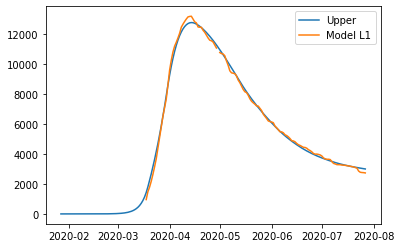

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31322419600951723, 'other': 0.41182430792823005, 'school': 0.2313775108081636, 'transport': 0.2562915137109071, 'work': 0.4154443664630438}
{'home': 1.0, 'leisure': 0.33838611352851505, 'other': 0.4505764822046704, 'school': 0.2932262155544283, 'transport': 0.2855853277893779, 'work': 0.5563298661554688}
{'home': 1.0, 'leisure': 0.36264939113612005, 'other': 0.4879446502569522, 'school': 0.3528660379883263, 'transport': 0.31383293422218894, 'work': 0.6921837408588785}
{'home': 1.0, 'leisure': 0.3824194691867612, 'other': 0.5183927871884411, 'school': 0.4014614488603914, 'transport': 0.3368495024267017, 'work': 0.8028794906172124}
{'home': 1.0, 'leisure': 0.3941017880348673, 'other': 0.5363848681025026, 'school': 0.4301769189211571, 'transport': 0.3504502018202774, 'work': 0.8682906154744097}
{'home': 1.0, 'leisure': 0.4003922674146167, 'other': 0.5460729116716128, 'schoo

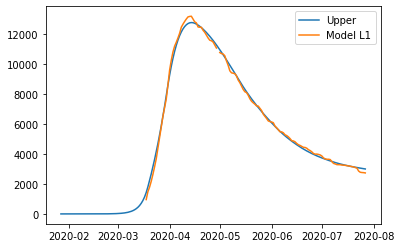

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31322419600951723, 'other': 0.41182431377378637, 'school': 0.2313775108081636, 'transport': 0.2562915137109071, 'work': 0.4154443664630438}
{'home': 1.0, 'leisure': 0.33838611352851505, 'other': 0.45057648664137173, 'school': 0.2932262155544283, 'transport': 0.2855853277893779, 'work': 0.5563298661554688}
{'home': 1.0, 'leisure': 0.36264939113612005, 'other': 0.4879446533351148, 'school': 0.3528660379883263, 'transport': 0.31383293422218894, 'work': 0.6921837408588785}
{'home': 1.0, 'leisure': 0.3824194691867612, 'other': 0.5183927891596462, 'school': 0.4014614488603914, 'transport': 0.3368495024267017, 'work': 0.8028794906172124}
{'home': 1.0, 'leisure': 0.3941017880348673, 'other': 0.5363848694195965, 'school': 0.4301769189211571, 'transport': 0.3504502018202774, 'work': 0.8682906154744097}
{'home': 1.0, 'leisure': 0.4003922674146167, 'other': 0.5460729126364929, 'scho

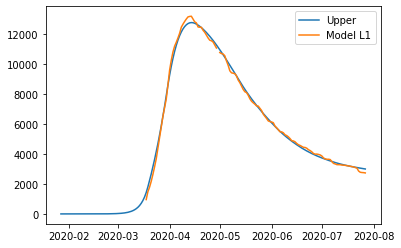

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3129329818833593, 'other': 0.41242402939656353, 'school': 0.23061773904873073, 'transport': 0.2561684247850266, 'work': 0.41487419891761773}
{'home': 1.0, 'leisure': 0.3380859582974559, 'other': 0.4512241383577378, 'school': 0.2924269015157371, 'transport': 0.2854576291925675, 'work': 0.5557282398112238}
{'home': 1.0, 'leisure': 0.3623406141253349, 'other': 0.4886385291417273, 'school': 0.3520285938946361, 'transport': 0.31370079058555345, 'work': 0.691551779244344}
{'home': 1.0, 'leisure': 0.3821036670221251, 'other': 0.5191243290397928, 'school': 0.40059293583299815, 'transport': 0.3367137369057641, 'work': 0.8022228113750344}
{'home': 1.0, 'leisure': 0.3937818346429557, 'other': 0.5371386653431951, 'school': 0.429290046978394, 'transport': 0.3503122960949796, 'work': 0.8676193303613515}
{'home': 1.0, 'leisure': 0.4000700787464799, 'other': 0.5468386925834887, 'school'

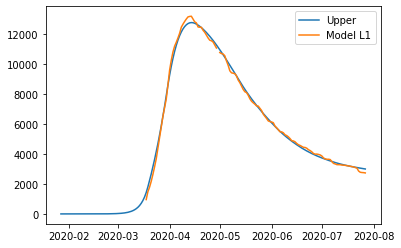

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3129329818833593, 'other': 0.41242402939656353, 'school': 0.23061773904873073, 'transport': 0.2561684247850266, 'work': 0.41487419891761773}
{'home': 1.0, 'leisure': 0.3380859587479148, 'other': 0.45122413905259995, 'school': 0.2924269026226631, 'transport': 0.2854576297171011, 'work': 0.5557282423337463}
{'home': 1.0, 'leisure': 0.3623406150101648, 'other': 0.4886385305066352, 'school': 0.35202859606895504, 'transport': 0.31370079161588726, 'work': 0.6915517841992989}
{'home': 1.0, 'leisure': 0.38210366826088693, 'other': 0.5191243309506638, 'school': 0.4005929388770447, 'transport': 0.33671373834823154, 'work': 0.8022228183119713}
{'home': 1.0, 'leisure': 0.3937818360908592, 'other': 0.5371386675766808, 'school': 0.4292900505363706, 'transport': 0.35031229778098044, 'work': 0.8676193384694597}
{'home': 1.0, 'leisure': 0.4000700803069981, 'other': 0.5468386949906899, 's

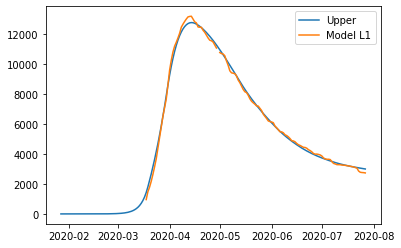

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3129329836691069, 'other': 0.41242403215119583, 'school': 0.23061774343690178, 'transport': 0.25616842686442765, 'work': 0.4148742089176177}
{'home': 1.0, 'leisure': 0.3380859600832035, 'other': 0.4512241411123701, 'school': 0.2924269059039081, 'transport': 0.28545763127196855, 'work': 0.5557282498112237}
{'home': 1.0, 'leisure': 0.36234061591108246, 'other': 0.48863853189635953, 'school': 0.3520285982828071, 'transport': 0.3137007926649545, 'work': 0.6915517892443439}
{'home': 1.0, 'leisure': 0.3821036688078727, 'other': 0.5191243317944251, 'school': 0.40059294022116926, 'transport': 0.3367137389851652, 'work': 0.8022228213750344}
{'home': 1.0, 'leisure': 0.39378183642870335, 'other': 0.5371386680978274, 'school': 0.429290051366565, 'transport': 0.3503122981743806, 'work': 0.8676193403613515}
{'home': 1.0, 'leisure': 0.4000700805322275, 'other': 0.546838695338121, 'scho

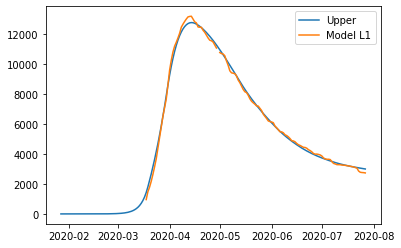

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3129329818833593, 'other': 0.4124240393965635, 'school': 0.23061773904873073, 'transport': 0.2561684247850266, 'work': 0.41487419891761773}
{'home': 1.0, 'leisure': 0.3380859582974559, 'other': 0.4512241483577378, 'school': 0.2924269015157371, 'transport': 0.2854576291925675, 'work': 0.5557282398112238}
{'home': 1.0, 'leisure': 0.3623406141253349, 'other': 0.4886385391417273, 'school': 0.3520285938946361, 'transport': 0.31370079058555345, 'work': 0.691551779244344}
{'home': 1.0, 'leisure': 0.3821036670221251, 'other': 0.5191243390397928, 'school': 0.40059293583299815, 'transport': 0.3367137369057641, 'work': 0.8022228113750344}
{'home': 1.0, 'leisure': 0.3937818346429557, 'other': 0.5371386753431951, 'school': 0.429290046978394, 'transport': 0.3503122960949796, 'work': 0.8676193303613515}
{'home': 1.0, 'leisure': 0.4000700787464799, 'other': 0.5468387025834887, 'school':

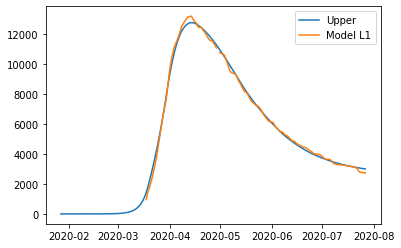

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3124540527949223, 'other': 0.41340945873723883, 'school': 0.22936852322123052, 'transport': 0.25596593469966644, 'work': 0.4139363900760702}
{'home': 1.0, 'leisure': 0.33759232615077345, 'other': 0.45228835777432796, 'school': 0.29111267173760713, 'transport': 0.28524755526604734, 'work': 0.5547386876884013}
{'home': 1.0, 'leisure': 0.3618328040296299, 'other': 0.4897787247029496, 'school': 0.35065167209268455, 'transport': 0.31348340366934313, 'work': 0.6905123318145776}
{'home': 1.0, 'leisure': 0.381584304523513, 'other': 0.5203264310892339, 'school': 0.39916493164126626, 'transport': 0.33649039125721386, 'work': 0.8011427085099807}
{'home': 1.0, 'leisure': 0.39325564572444394, 'other': 0.5383773484993111, 'school': 0.42783185773815535, 'transport': 0.35008542937731923, 'work': 0.8665152038299915}
{'home': 1.0, 'leisure': 0.3995402140634067, 'other': 0.5480970732585833

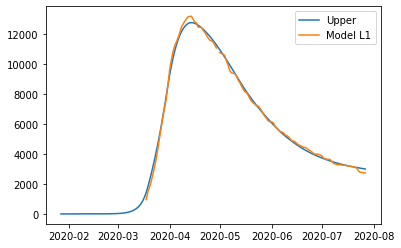

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3124540527949223, 'other': 0.41340945873723883, 'school': 0.22936852322123052, 'transport': 0.25596593469966644, 'work': 0.4139363900760702}
{'home': 1.0, 'leisure': 0.3375923266011345, 'other': 0.4522883584708571, 'school': 0.29111267284377523, 'transport': 0.2852475557906378, 'work': 0.5547386902109238}
{'home': 1.0, 'leisure': 0.3618328049142676, 'other': 0.4897787260711318, 'school': 0.35065167426551475, 'transport': 0.3134834046997888, 'work': 0.6905123367695327}
{'home': 1.0, 'leisure': 0.38158430576200575, 'other': 0.5203264330046891, 'school': 0.39916493468322845, 'transport': 0.3364903926998377, 'work': 0.8011427154469177}
{'home': 1.0, 'leisure': 0.39325564717203276, 'other': 0.5383773507381546, 'school': 0.4278318612936956, 'transport': 0.350085431063503, 'work': 0.8665152119380997}
{'home': 1.0, 'leisure': 0.3995402156235858, 'other': 0.5480970756715592, 'sch

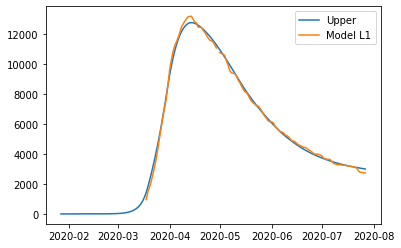

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31245405458028186, 'other': 0.41340946149847924, 'school': 0.22936852760639675, 'transport': 0.2559659367792931, 'work': 0.4139364000760702}
{'home': 1.0, 'leisure': 0.33759232793613303, 'other': 0.4522883605355683, 'school': 0.29111267612277336, 'transport': 0.2852475573456739, 'work': 0.5547386976884012}
{'home': 1.0, 'leisure': 0.36183280581498956, 'other': 0.48977872746419, 'school': 0.35065167647785084, 'transport': 0.31348340574896977, 'work': 0.6905123418145777}
{'home': 1.0, 'leisure': 0.38158430630887263, 'other': 0.5203264338504743, 'school': 0.3991649360264325, 'transport': 0.3364903933368405, 'work': 0.8011427185099806}
{'home': 1.0, 'leisure': 0.39325564750980346, 'other': 0.5383773512605514, 'school': 0.42783186212332164, 'transport': 0.3500854314569459, 'work': 0.8665152138299915}
{'home': 1.0, 'leisure': 0.3995402158487663, 'other': 0.5480970760198237, 's

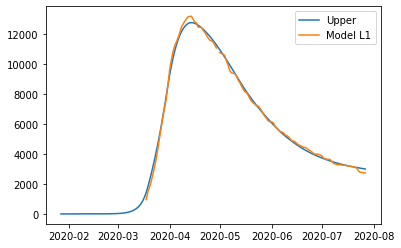

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3124540527949223, 'other': 0.4134094687372388, 'school': 0.22936852322123052, 'transport': 0.25596593469966644, 'work': 0.4139363900760702}
{'home': 1.0, 'leisure': 0.33759232615077345, 'other': 0.45228836777432796, 'school': 0.29111267173760713, 'transport': 0.28524755526604734, 'work': 0.5547386876884013}
{'home': 1.0, 'leisure': 0.3618328040296299, 'other': 0.48977873470294964, 'school': 0.35065167209268455, 'transport': 0.31348340366934313, 'work': 0.6905123318145776}
{'home': 1.0, 'leisure': 0.381584304523513, 'other': 0.520326441089234, 'school': 0.39916493164126626, 'transport': 0.33649039125721386, 'work': 0.8011427085099807}
{'home': 1.0, 'leisure': 0.39325564572444394, 'other': 0.538377358499311, 'school': 0.42783185773815535, 'transport': 0.35008542937731923, 'work': 0.8665152038299915}
{'home': 1.0, 'leisure': 0.3995402140634067, 'other': 0.5480970832585833, 

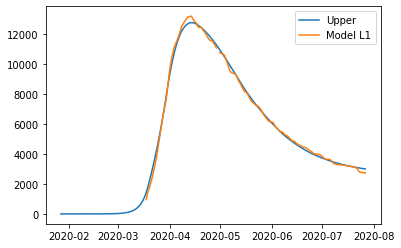

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31245383078955125, 'other': 0.41340991527576976, 'school': 0.22936794423966855, 'transport': 0.25596584081937596, 'work': 0.4139359553260601}
{'home': 1.0, 'leisure': 0.3375920973302806, 'other': 0.4522888508225533, 'school': 0.2911120626240482, 'transport': 0.2852474578694937, 'work': 0.5547382289512084}
{'home': 1.0, 'leisure': 0.3618325686374125, 'other': 0.4897792529569518, 'school': 0.35065103392327146, 'transport': 0.31348330288210724, 'work': 0.6905118499468872}
{'home': 1.0, 'leisure': 0.38158406377655696, 'other': 0.5203269880294246, 'school': 0.39916426979671266, 'transport': 0.3364902877071998, 'work': 0.801142207795218}
{'home': 1.0, 'leisure': 0.39325540181332413, 'other': 0.5383779223904313, 'school': 0.4278311819037461, 'transport': 0.35008532419475447, 'work': 0.8665146919783226}
{'home': 1.0, 'leisure': 0.3995399684485065, 'other': 0.5480976562771271, 's

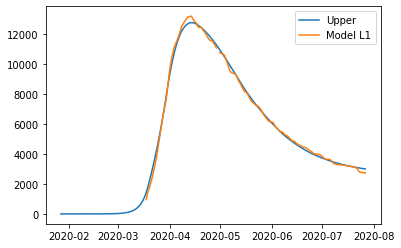

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31245383078955125, 'other': 0.41340991527576976, 'school': 0.22936794423966855, 'transport': 0.25596584081937596, 'work': 0.4139359553260601}
{'home': 1.0, 'leisure': 0.3375920977806416, 'other': 0.45228885151908327, 'school': 0.291112063730216, 'transport': 0.2852474583940843, 'work': 0.554738231473731}
{'home': 1.0, 'leisure': 0.36183256952205, 'other': 0.48977925432513547, 'school': 0.35065103609610093, 'transport': 0.31348330391255297, 'work': 0.6905118549018422}
{'home': 1.0, 'leisure': 0.3815840650150495, 'other': 0.5203269899448817, 'school': 0.39916427283867384, 'transport': 0.33649028914982376, 'work': 0.801142214732155}
{'home': 1.0, 'leisure': 0.39325540326091285, 'other': 0.5383779246292772, 'school': 0.42783118545928517, 'transport': 0.3500853258809383, 'work': 0.8665147000864308}
{'home': 1.0, 'leisure': 0.39953997000868546, 'other': 0.5480976586901056, 'sc

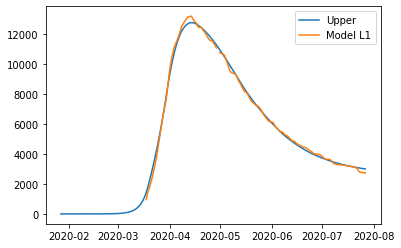

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31245383257491066, 'other': 0.4134099180370132, 'school': 0.2293679486248334, 'transport': 0.25596584289900265, 'work': 0.4139359653260601}
{'home': 1.0, 'leisure': 0.33759209911564003, 'other': 0.4522888535837968, 'school': 0.2911120670092131, 'transport': 0.28524745994912043, 'work': 0.5547382389512084}
{'home': 1.0, 'leisure': 0.36183257042277184, 'other': 0.48977925571819525, 'school': 0.3506510383084363, 'transport': 0.313483304961734, 'work': 0.6905118599468871}
{'home': 1.0, 'leisure': 0.3815840655619164, 'other': 0.520326990790668, 'school': 0.39916427418187755, 'transport': 0.33649028978682655, 'work': 0.8011422177952181}
{'home': 1.0, 'leisure': 0.39325540359868355, 'other': 0.5383779251516747, 'school': 0.4278311862889109, 'transport': 0.3500853262743812, 'work': 0.8665147019783226}
{'home': 1.0, 'leisure': 0.3995399702338659, 'other': 0.5480976590383706, 'sch

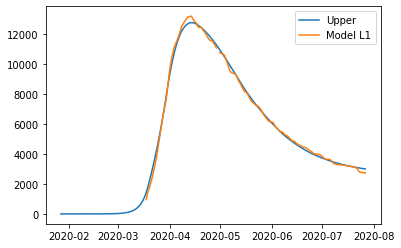

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31245383078955125, 'other': 0.41340992527576975, 'school': 0.22936794423966855, 'transport': 0.25596584081937596, 'work': 0.4139359553260601}
{'home': 1.0, 'leisure': 0.3375920973302806, 'other': 0.4522888608225533, 'school': 0.2911120626240482, 'transport': 0.2852474578694937, 'work': 0.5547382289512084}
{'home': 1.0, 'leisure': 0.3618325686374125, 'other': 0.48977926295695173, 'school': 0.35065103392327146, 'transport': 0.31348330288210724, 'work': 0.6905118499468872}
{'home': 1.0, 'leisure': 0.38158406377655696, 'other': 0.5203269980294246, 'school': 0.39916426979671266, 'transport': 0.3364902877071998, 'work': 0.801142207795218}
{'home': 1.0, 'leisure': 0.39325540181332413, 'other': 0.5383779323904312, 'school': 0.4278311819037461, 'transport': 0.35008532419475447, 'work': 0.8665146919783226}
{'home': 1.0, 'leisure': 0.3995399684485065, 'other': 0.5480976662771271, '

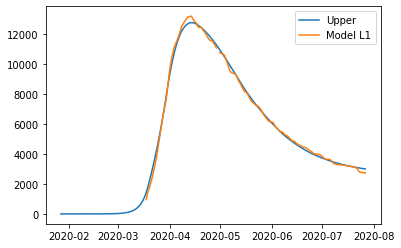

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3124536096751381, 'other': 0.4134103699818755, 'school': 0.2293673675817705, 'transport': 0.25596574731583266, 'work': 0.4139355223207697}
{'home': 1.0, 'leisure': 0.33759186942809655, 'other': 0.4522893418918198, 'school': 0.29111145595508425, 'transport': 0.28524736086379815, 'work': 0.5547377720549996}
{'home': 1.0, 'leisure': 0.361832334189878, 'other': 0.48977977909069464, 'school': 0.35065039831506534, 'transport': 0.3134832024993363, 'work': 0.690511370013007}
{'home': 1.0, 'leisure': 0.38158382399577395, 'other': 0.5203275427342223, 'school': 0.3991636106083833, 'transport': 0.33649018457273777, 'work': 0.801141709089902}
{'home': 1.0, 'leisure': 0.3932551588810761, 'other': 0.5383784939781251, 'school': 0.42783050878170753, 'transport': 0.35008521943429316, 'work': 0.8665141821807945}
{'home': 1.0, 'leisure': 0.3995397238193157, 'other': 0.5480982369556111, 'sch

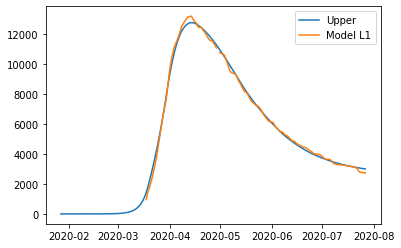

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3124536096751381, 'other': 0.4134103699818755, 'school': 0.2293673675817705, 'transport': 0.25596574731583266, 'work': 0.4139355223207697}
{'home': 1.0, 'leisure': 0.33759186987845746, 'other': 0.45228934258835046, 'school': 0.29111145706125163, 'transport': 0.2852473613883887, 'work': 0.5547377745775222}
{'home': 1.0, 'leisure': 0.36183233507451545, 'other': 0.4897797804588798, 'school': 0.3506504004878941, 'transport': 0.31348320352978204, 'work': 0.690511374967962}
{'home': 1.0, 'leisure': 0.38158382523426637, 'other': 0.5203275446496817, 'school': 0.3991636136503436, 'transport': 0.33649018601536185, 'work': 0.801141716026839}
{'home': 1.0, 'leisure': 0.3932551603286647, 'other': 0.5383784962169735, 'school': 0.4278305123372455, 'transport': 0.35008522112047713, 'work': 0.8665141902889026}
{'home': 1.0, 'leisure': 0.39953972537949456, 'other': 0.5480982393685923, 'sc

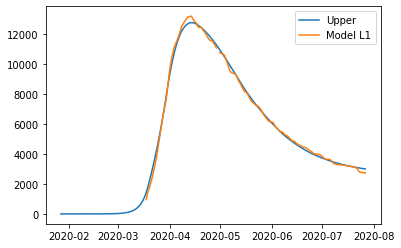

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3124536114604973, 'other': 0.413410372743122, 'school': 0.22936737196693396, 'transport': 0.25596574939545946, 'work': 0.4139355323207697}
{'home': 1.0, 'leisure': 0.3375918712134558, 'other': 0.45228934465306625, 'school': 0.2911114603402477, 'transport': 0.28524736294342495, 'work': 0.5547377820549996}
{'home': 1.0, 'leisure': 0.36183233597523723, 'other': 0.48977978185194115, 'school': 0.35065040270022885, 'transport': 0.31348320457896317, 'work': 0.690511380013007}
{'home': 1.0, 'leisure': 0.38158382578113315, 'other': 0.5203275454954688, 'school': 0.39916361499354674, 'transport': 0.3364901866523646, 'work': 0.801141719089902}
{'home': 1.0, 'leisure': 0.39325516066643534, 'other': 0.5383784967393715, 'school': 0.427830513166871, 'transport': 0.35008522151391996, 'work': 0.8665141921807944}
{'home': 1.0, 'leisure': 0.399539725604675, 'other': 0.5480982397168576, 'sch

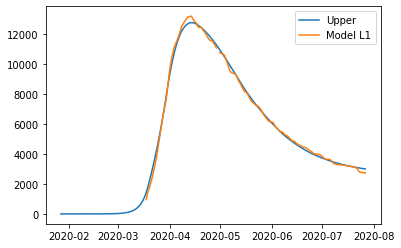

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3124536096751381, 'other': 0.41341037998187546, 'school': 0.2293673675817705, 'transport': 0.25596574731583266, 'work': 0.4139355223207697}
{'home': 1.0, 'leisure': 0.33759186942809655, 'other': 0.4522893518918198, 'school': 0.29111145595508425, 'transport': 0.28524736086379815, 'work': 0.5547377720549996}
{'home': 1.0, 'leisure': 0.361832334189878, 'other': 0.48977978909069464, 'school': 0.35065039831506534, 'transport': 0.3134832024993363, 'work': 0.690511370013007}
{'home': 1.0, 'leisure': 0.38158382399577395, 'other': 0.5203275527342224, 'school': 0.3991636106083833, 'transport': 0.33649018457273777, 'work': 0.801141709089902}
{'home': 1.0, 'leisure': 0.3932551588810761, 'other': 0.538378503978125, 'school': 0.42783050878170753, 'transport': 0.35008521943429316, 'work': 0.8665141821807945}
{'home': 1.0, 'leisure': 0.3995397238193157, 'other': 0.548098246955611, 'scho

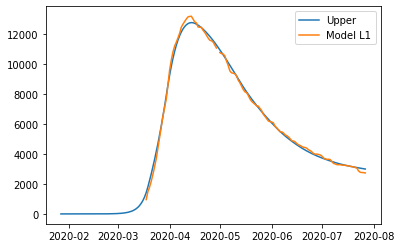

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123304825071764, 'other': 0.4136635361829876, 'school': 0.22904626903372427, 'transport': 0.25591367761419503, 'work': 0.4136943993755971}
{'home': 1.0, 'leisure': 0.3374649625609959, 'other': 0.45256275498620724, 'school': 0.2907736465009324, 'transport': 0.28519334087943565, 'work': 0.5544833452340038}
{'home': 1.0, 'leisure': 0.3617017826128933, 'other': 0.49007271597502616, 'school': 0.35029647477288295, 'transport': 0.31342730188520335, 'work': 0.6902441144546101}
{'home': 1.0, 'leisure': 0.3814503026551801, 'other': 0.5206363878918416, 'school': 0.39879655706854655, 'transport': 0.33643275159360675, 'work': 0.8008640004862154}
{'home': 1.0, 'leisure': 0.39311988268016773, 'other': 0.5386967394790507, 'school': 0.4274556966068932, 'transport': 0.35002688096675416, 'work': 0.8662302967776185}
{'home': 1.0, 'leisure': 0.3994035026936226, 'other': 0.5484215441798557, 

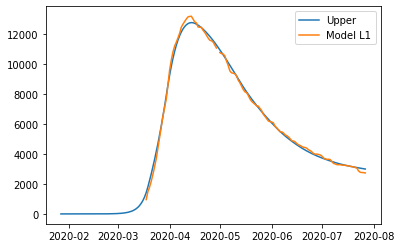

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123304825071764, 'other': 0.4136635361829876, 'school': 0.22904626903372427, 'transport': 0.25591367761419503, 'work': 0.4136943993755971}
{'home': 1.0, 'leisure': 0.33746496301133166, 'other': 0.4525627556831665, 'school': 0.29077364760690483, 'transport': 0.28519334140404085, 'work': 0.5544833477565263}
{'home': 1.0, 'leisure': 0.3617017834974814, 'other': 0.4900727173440533, 'school': 0.35029647694532895, 'transport': 0.3134273029156779, 'work': 0.6902441194095652}
{'home': 1.0, 'leisure': 0.38145030389360335, 'other': 0.5206363898084795, 'school': 0.3987965601099709, 'transport': 0.33643275303627096, 'work': 0.8008640074231523}
{'home': 1.0, 'leisure': 0.39311988412767546, 'other': 0.5386967417192768, 'school': 0.4274557001618048, 'transport': 0.3500268826529851, 'work': 0.8662303048857267}
{'home': 1.0, 'leisure': 0.3994035042537143, 'other': 0.5484215465943216, 's

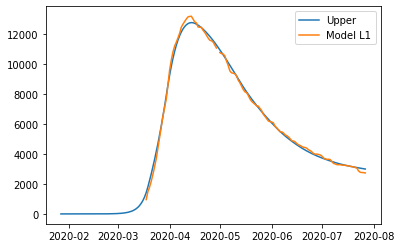

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123304842924359, 'other': 0.41366353894593316, 'school': 0.22904627341811518, 'transport': 0.2559136796938798, 'work': 0.4136944093755971}
{'home': 1.0, 'leisure': 0.3374649643462554, 'other': 0.4525627577491528, 'school': 0.29077365088532325, 'transport': 0.28519334295912047, 'work': 0.5544833552340037}
{'home': 1.0, 'leisure': 0.3617017843981528, 'other': 0.4900727187379717, 'school': 0.3502964791572739, 'transport': 0.31342730396488816, 'work': 0.6902441244546101}
{'home': 1.0, 'leisure': 0.3814503044404396, 'other': 0.5206363906547872, 'school': 0.3987965614529375, 'transport': 0.33643275367329156, 'work': 0.8008640104862155}
{'home': 1.0, 'leisure': 0.3931198844654272, 'other': 0.5386967422419963, 'school': 0.42745570099128405, 'transport': 0.350026883046439, 'work': 0.8662303067776185}
{'home': 1.0, 'leisure': 0.39940350447888207, 'other': 0.5484215469428011, 'sch

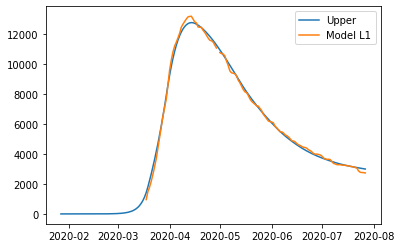

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123304825071764, 'other': 0.4136635461829876, 'school': 0.22904626903372427, 'transport': 0.25591367761419503, 'work': 0.4136943993755971}
{'home': 1.0, 'leisure': 0.3374649625609959, 'other': 0.4525627649862073, 'school': 0.2907736465009324, 'transport': 0.28519334087943565, 'work': 0.5544833452340038}
{'home': 1.0, 'leisure': 0.3617017826128933, 'other': 0.49007272597502616, 'school': 0.35029647477288295, 'transport': 0.31342730188520335, 'work': 0.6902441144546101}
{'home': 1.0, 'leisure': 0.3814503026551801, 'other': 0.5206363978918416, 'school': 0.39879655706854655, 'transport': 0.33643275159360675, 'work': 0.8008640004862154}
{'home': 1.0, 'leisure': 0.39311988268016773, 'other': 0.5386967494790508, 'school': 0.4274556966068932, 'transport': 0.35002688096675416, 'work': 0.8662302967776185}
{'home': 1.0, 'leisure': 0.3994035026936226, 'other': 0.5484215541798556, '

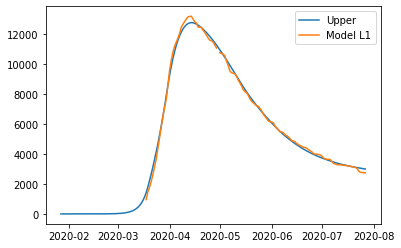

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123264851220528, 'other': 0.4136718127788025, 'school': 0.2290358456823713, 'transport': 0.2559119956918501, 'work': 0.4136866091622293}
{'home': 1.0, 'leisure': 0.3374608608117925, 'other': 0.45257171852581335, 'school': 0.2907627112611542, 'transport': 0.28519161054341646, 'work': 0.5544751892782639}
{'home': 1.0, 'leisure': 0.3616975802268986, 'other': 0.4900823419247168, 'school': 0.3502850459264092, 'transport': 0.31342552486456976, 'work': 0.6902356058187258}
{'home': 1.0, 'leisure': 0.38144601826883684, 'other': 0.5206465535830824, 'school': 0.3987847260240243, 'transport': 0.3364309365336577, 'work': 0.8008552044813244}
{'home': 1.0, 'leisure': 0.39311554983907315, 'other': 0.5387072241084804, 'school': 0.4274436278998878, 'transport': 0.35002504342902774, 'work': 0.866221330963769}
{'home': 1.0, 'leisure': 0.3993991437615081, 'other': 0.5484322005452331, 'schoo

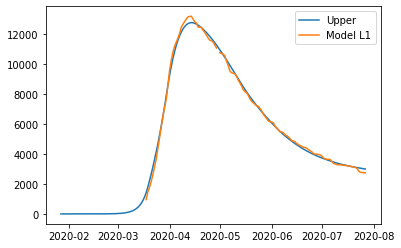

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123264851220528, 'other': 0.4136718127788025, 'school': 0.2290358456823713, 'transport': 0.2559119956918501, 'work': 0.4136866091622293}
{'home': 1.0, 'leisure': 0.3374608612621275, 'other': 0.4525717192227867, 'school': 0.2907627123671204, 'transport': 0.28519161106802215, 'work': 0.5544751918007864}
{'home': 1.0, 'leisure': 0.3616975811114852, 'other': 0.49008234329377154, 'school': 0.35028504809884276, 'transport': 0.31342552589504524, 'work': 0.6902356107736808}
{'home': 1.0, 'leisure': 0.3814460195072582, 'other': 0.5206465554997592, 'school': 0.3987847290654314, 'transport': 0.3364309379763233, 'work': 0.8008552114182614}
{'home': 1.0, 'leisure': 0.3931155512865786, 'other': 0.5387072263487519, 'school': 0.42744363145477915, 'transport': 0.35002504511526034, 'work': 0.8662213390718771}
{'home': 1.0, 'leisure': 0.39939914532159726, 'other': 0.5484322029597479, 'sch

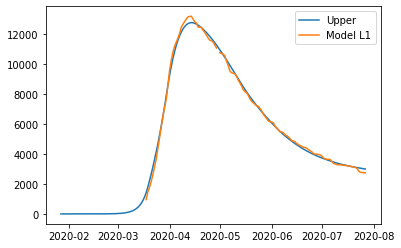

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123264869073095, 'other': 0.413671815541804, 'school': 0.2290358500667372, 'transport': 0.2559119977715369, 'work': 0.4136866191622293}
{'home': 1.0, 'leisure': 0.3374608625970492, 'other': 0.4525717212888149, 'school': 0.2907627156455202, 'transport': 0.2851916126231033, 'work': 0.5544751992782639}
{'home': 1.0, 'leisure': 0.3616975820121553, 'other': 0.4900823446877182, 'school': 0.35028505031077506, 'transport': 0.3134255269442565, 'work': 0.6902356158187257}
{'home': 1.0, 'leisure': 0.38144602005409356, 'other': 0.5206465563460839, 'school': 0.39878473040839024, 'transport': 0.33643093861334444, 'work': 0.8008552144813244}
{'home': 1.0, 'leisure': 0.3931155516243298, 'other': 0.5387072268714819, 'school': 0.42744363228425375, 'transport': 0.3500250455087145, 'work': 0.8662213409637689}
{'home': 1.0, 'leisure': 0.39939914554676476, 'other': 0.5484322033082346, 'schoo

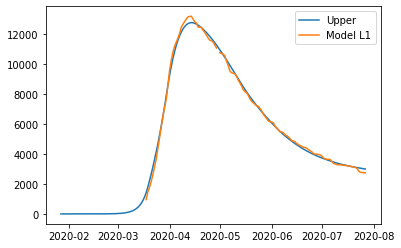

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123264851220528, 'other': 0.41367182277880243, 'school': 0.2290358456823713, 'transport': 0.2559119956918501, 'work': 0.4136866091622293}
{'home': 1.0, 'leisure': 0.3374608608117925, 'other': 0.4525717285258134, 'school': 0.2907627112611542, 'transport': 0.28519161054341646, 'work': 0.5544751892782639}
{'home': 1.0, 'leisure': 0.3616975802268986, 'other': 0.4900823519247167, 'school': 0.3502850459264092, 'transport': 0.31342552486456976, 'work': 0.6902356058187258}
{'home': 1.0, 'leisure': 0.38144601826883684, 'other': 0.5206465635830825, 'school': 0.3987847260240243, 'transport': 0.3364309365336577, 'work': 0.8008552044813244}
{'home': 1.0, 'leisure': 0.39311554983907315, 'other': 0.5387072341084804, 'school': 0.4274436278998878, 'transport': 0.35002504342902774, 'work': 0.866221330963769}
{'home': 1.0, 'leisure': 0.3993991437615081, 'other': 0.5484322105452331, 'schoo

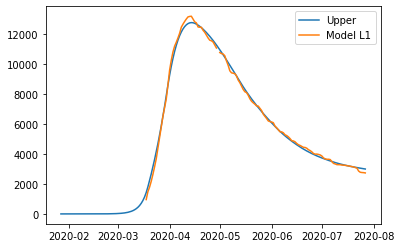

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123252669561313, 'other': 0.4136743349788082, 'school': 0.22903266926852628, 'transport': 0.25591148314069545, 'work': 0.4136842351655167}
{'home': 1.0, 'leisure': 0.33745961084190657, 'other': 0.4525744500648814, 'school': 0.2907593788543277, 'transport': 0.28519108323860615, 'work': 0.5544727038248879}
{'home': 1.0, 'leisure': 0.3616962995889042, 'other': 0.49008527532645196, 'school': 0.350281563097779, 'transport': 0.31342498333302, 'work': 0.6902330128892815}
{'home': 1.0, 'leisure': 0.38144471264201335, 'other': 0.5206496514655095, 'school': 0.3987811206294801, 'transport': 0.3364303834099498, 'work': 0.8008525239787875}
{'home': 1.0, 'leisure': 0.3931142294461233, 'other': 0.5387104191840435, 'school': 0.4274399500800308, 'transport': 0.3500244834554083, 'work': 0.8662185987134955}
{'home': 1.0, 'leisure': 0.39939781541756714, 'other': 0.5484354479555618, 'school

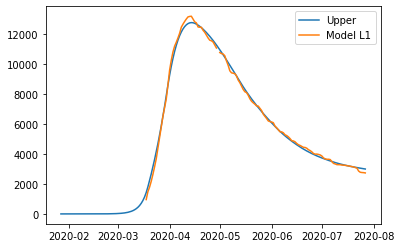

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123252669561313, 'other': 0.4136743349788082, 'school': 0.22903266926852628, 'transport': 0.25591148314069545, 'work': 0.4136842351655167}
{'home': 1.0, 'leisure': 0.3374596112922414, 'other': 0.4525744507618591, 'school': 0.29075937996029194, 'transport': 0.28519108376321195, 'work': 0.5544727063474104}
{'home': 1.0, 'leisure': 0.36169630047349044, 'other': 0.49008527669551527, 'school': 0.3502815652702088, 'transport': 0.31342498436349575, 'work': 0.6902330178442365}
{'home': 1.0, 'leisure': 0.3814447138804341, 'other': 0.520649653382198, 'school': 0.3987811236708819, 'transport': 0.33643038485261584, 'work': 0.8008525309157244}
{'home': 1.0, 'leisure': 0.39311423089362807, 'other': 0.5387104214243288, 'school': 0.42743995363491594, 'transport': 0.35002448514164136, 'work': 0.8662186068216037}
{'home': 1.0, 'leisure': 0.39939781697765564, 'other': 0.5484354503700916, 

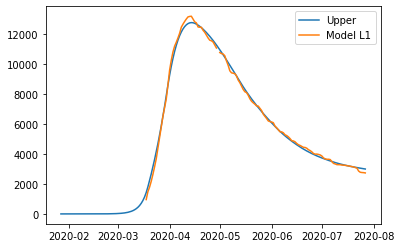

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123252687413871, 'other': 0.41367433774182677, 'school': 0.22903267365288463, 'transport': 0.2559114852203829, 'work': 0.4136842451655167}
{'home': 1.0, 'leisure': 0.33745961262716245, 'other': 0.4525744528279, 'school': 0.29075938323868605, 'transport': 0.2851910853182935, 'work': 0.5544727138248879}
{'home': 1.0, 'leisure': 0.36169630137416003, 'other': 0.49008527808947056, 'school': 0.35028156748213735, 'transport': 0.31342498541270736, 'work': 0.6902330228892815}
{'home': 1.0, 'leisure': 0.38144471442726924, 'other': 0.520649654228528, 'school': 0.39878112501383856, 'transport': 0.3364303854896372, 'work': 0.8008525339787875}
{'home': 1.0, 'leisure': 0.39311423123137923, 'other': 0.5387104219470621, 'school': 0.4274399544643891, 'transport': 0.3500244855350957, 'work': 0.8662186087134955}
{'home': 1.0, 'leisure': 0.39939781720282297, 'other': 0.5484354507185804, 'sc

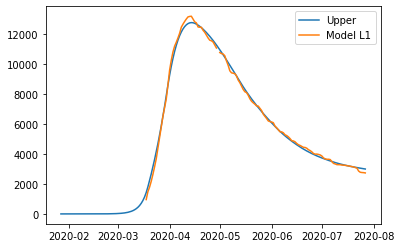

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123252669561313, 'other': 0.4136743449788082, 'school': 0.22903266926852628, 'transport': 0.25591148314069545, 'work': 0.4136842351655167}
{'home': 1.0, 'leisure': 0.33745961084190657, 'other': 0.4525744600648814, 'school': 0.2907593788543277, 'transport': 0.28519108323860615, 'work': 0.5544727038248879}
{'home': 1.0, 'leisure': 0.3616962995889042, 'other': 0.490085285326452, 'school': 0.350281563097779, 'transport': 0.31342498333302, 'work': 0.6902330128892815}
{'home': 1.0, 'leisure': 0.38144471264201335, 'other': 0.5206496614655095, 'school': 0.3987811206294801, 'transport': 0.3364303834099498, 'work': 0.8008525239787875}
{'home': 1.0, 'leisure': 0.3931142294461233, 'other': 0.5387104291840434, 'school': 0.4274399500800308, 'transport': 0.3500244834554083, 'work': 0.8662185987134955}
{'home': 1.0, 'leisure': 0.39939781541756714, 'other': 0.5484354579555618, 'school':

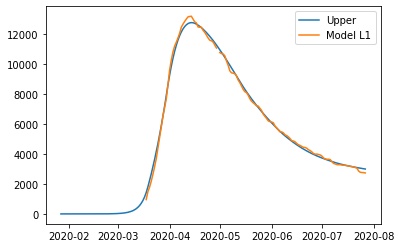

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232368451420495, 'other': 0.4136776113976819, 'school': 0.22902854299501332, 'transport': 0.25591081731738985, 'work': 0.4136811512561018}
{'home': 1.0, 'leisure': 0.337457987085484, 'other': 0.45257799842236135, 'school': 0.2907550499404233, 'transport': 0.28519039824973685, 'work': 0.5544694751291505}
{'home': 1.0, 'leisure': 0.3616946359935031, 'other': 0.4900890859104451, 'school': 0.35027703878064004, 'transport': 0.31342427986307153, 'work': 0.6902296445781617}
{'home': 1.0, 'leisure': 0.3814430165852224, 'other': 0.5206536757155504, 'school': 0.39877643709489075, 'transport': 0.3364296648813442, 'work': 0.8008490419069857}
{'home': 1.0, 'leisure': 0.39311251420760196, 'other': 0.5387145696912945, 'school': 0.4274351724624025, 'transport': 0.35002375602850533, 'work': 0.8662150494194726}
{'home': 1.0, 'leisure': 0.3993960898504217, 'other': 0.5484396664474643, 's

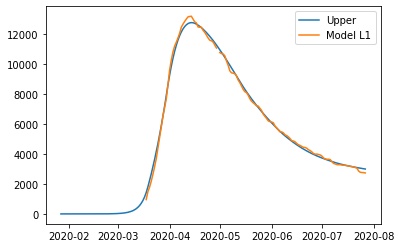

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232368451420495, 'other': 0.4136776113976819, 'school': 0.22902854299501332, 'transport': 0.25591081731738985, 'work': 0.4136811512561018}
{'home': 1.0, 'leisure': 0.3374579875358185, 'other': 0.4525779991193446, 'school': 0.29075505104638505, 'transport': 0.2851903987743429, 'work': 0.554469477651673}
{'home': 1.0, 'leisure': 0.3616946368780888, 'other': 0.4900890872795194, 'school': 0.350277040953065, 'transport': 0.3134242808935476, 'work': 0.6902296495331167}
{'home': 1.0, 'leisure': 0.3814430178236423, 'other': 0.5206536776322543, 'school': 0.3987764401362856, 'transport': 0.3364296663240107, 'work': 0.8008490488439226}
{'home': 1.0, 'leisure': 0.39311251565510585, 'other': 0.5387145719315978, 'school': 0.42743517601727965, 'transport': 0.3500237577147389, 'work': 0.8662150575275808}
{'home': 1.0, 'leisure': 0.39939609141050925, 'other': 0.5484396688620135, 'schoo

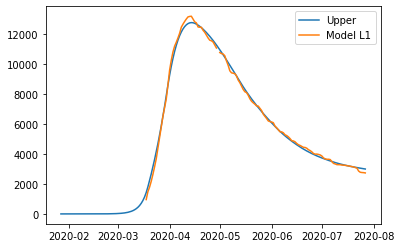

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123236862994597, 'other': 0.4136776141607226, 'school': 0.22902854737936176, 'transport': 0.255910819397078, 'work': 0.41368116125610177}
{'home': 1.0, 'leisure': 0.33745798887073875, 'other': 0.45257800118540203, 'school': 0.2907550543247717, 'transport': 0.285190400329425, 'work': 0.5544694851291505}
{'home': 1.0, 'leisure': 0.3616946377787579, 'other': 0.4900890886734858, 'school': 0.3502770431649885, 'transport': 0.3134242819427596, 'work': 0.6902296545781617}
{'home': 1.0, 'leisure': 0.3814430183704771, 'other': 0.5206536784785911, 'school': 0.3987764414792392, 'transport': 0.3364296669610323, 'work': 0.8008490519069857}
{'home': 1.0, 'leisure': 0.3931125159928567, 'other': 0.5387145724543352, 'school': 0.427435176846751, 'transport': 0.3500237581081934, 'work': 0.8662150594194726}
{'home': 1.0, 'leisure': 0.39939609163567646, 'other': 0.548439669210505, 'school': 

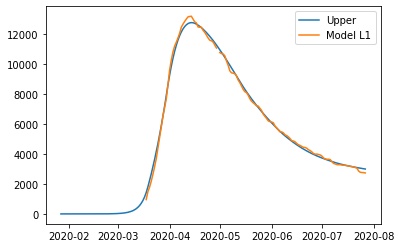

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232368451420495, 'other': 0.4136776213976819, 'school': 0.22902854299501332, 'transport': 0.25591081731738985, 'work': 0.4136811512561018}
{'home': 1.0, 'leisure': 0.337457987085484, 'other': 0.45257800842236134, 'school': 0.2907550499404233, 'transport': 0.28519039824973685, 'work': 0.5544694751291505}
{'home': 1.0, 'leisure': 0.3616946359935031, 'other': 0.49008909591044514, 'school': 0.35027703878064004, 'transport': 0.31342427986307153, 'work': 0.6902296445781617}
{'home': 1.0, 'leisure': 0.3814430165852224, 'other': 0.5206536857155504, 'school': 0.39877643709489075, 'transport': 0.3364296648813442, 'work': 0.8008490419069857}
{'home': 1.0, 'leisure': 0.39311251420760196, 'other': 0.5387145796912944, 'school': 0.4274351724624025, 'transport': 0.35002375602850533, 'work': 0.8662150494194726}
{'home': 1.0, 'leisure': 0.3993960898504217, 'other': 0.5484396764474643, '

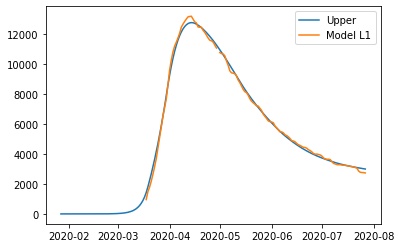

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123233275876413, 'other': 0.41367835040631656, 'school': 0.2290276122969232, 'transport': 0.25591066713798183, 'work': 0.41368045566692374}
{'home': 1.0, 'leisure': 0.3374576208402605, 'other': 0.4525787987678424, 'school': 0.29075407353595134, 'transport': 0.2851902437474495, 'work': 0.5544687468827878}
{'home': 1.0, 'leisure': 0.36169426076242905, 'other': 0.490089945402171, 'school': 0.35027601830215704, 'transport': 0.31342412119229346, 'work': 0.6902288848409426}
{'home': 1.0, 'leisure': 0.38144263403234413, 'other': 0.5206545834005127, 'school': 0.39877538070425056, 'transport': 0.33642950281401807, 'work': 0.80084825651055}
{'home': 1.0, 'leisure': 0.393112127328203, 'other': 0.5387155058540782, 'school': 0.4274340948509422, 'transport': 0.350023591954128, 'work': 0.8662142488607727}
{'home': 1.0, 'leisure': 0.3993957006413578, 'other': 0.5484406179444598, 'schoo

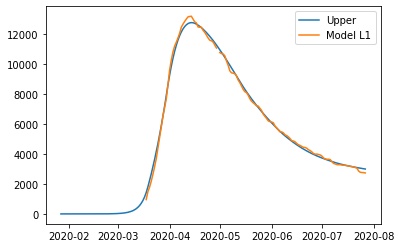

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123233275876413, 'other': 0.41367835040631656, 'school': 0.2290276122969232, 'transport': 0.25591066713798183, 'work': 0.41368045566692374}
{'home': 1.0, 'leisure': 0.337457621290595, 'other': 0.45257879946482693, 'school': 0.29075407464191255, 'transport': 0.28519024427205564, 'work': 0.5544687494053104}
{'home': 1.0, 'leisure': 0.36169426164701457, 'other': 0.4900899467712476, 'school': 0.35027602047458084, 'transport': 0.3134241222227696, 'work': 0.6902288897958975}
{'home': 1.0, 'leisure': 0.38144263527076394, 'other': 0.5206545853172201, 'school': 0.3987753837456439, 'transport': 0.3364295042566847, 'work': 0.800848263447487}
{'home': 1.0, 'leisure': 0.39311212877570667, 'other': 0.5387155080943856, 'school': 0.42743409840581753, 'transport': 0.35002359364036184, 'work': 0.8662142569688809}
{'home': 1.0, 'leisure': 0.3993957022014451, 'other': 0.5484406203590132, '

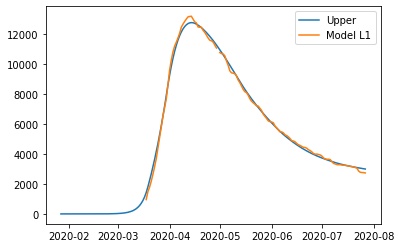

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123233293728958, 'other': 0.41367835316936225, 'school': 0.22902761668126942, 'transport': 0.25591066921767014, 'work': 0.41368046566692374}
{'home': 1.0, 'leisure': 0.33745762262551504, 'other': 0.45257880153088814, 'school': 0.29075407792029756, 'transport': 0.28519024582713787, 'work': 0.5544687568827878}
{'home': 1.0, 'leisure': 0.36169426254768355, 'other': 0.49008994816521667, 'school': 0.3502760226865032, 'transport': 0.31342412327198177, 'work': 0.6902288948409425}
{'home': 1.0, 'leisure': 0.38144263581759863, 'other': 0.5206545861635584, 'school': 0.3987753850885968, 'transport': 0.3364295048937064, 'work': 0.8008482665105501}
{'home': 1.0, 'leisure': 0.3931121291134575, 'other': 0.538715508617124, 'school': 0.42743409923528836, 'transport': 0.35002359403381633, 'work': 0.8662142588607726}
{'home': 1.0, 'leisure': 0.3993957024266124, 'other': 0.5484406207075054

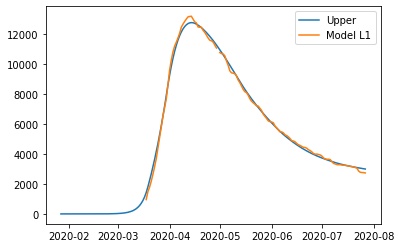

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123233275876413, 'other': 0.41367836040631656, 'school': 0.2290276122969232, 'transport': 0.25591066713798183, 'work': 0.41368045566692374}
{'home': 1.0, 'leisure': 0.3374576208402605, 'other': 0.4525788087678424, 'school': 0.29075407353595134, 'transport': 0.2851902437474495, 'work': 0.5544687468827878}
{'home': 1.0, 'leisure': 0.36169426076242905, 'other': 0.49008995540217093, 'school': 0.35027601830215704, 'transport': 0.31342412119229346, 'work': 0.6902288848409426}
{'home': 1.0, 'leisure': 0.38144263403234413, 'other': 0.5206545934005127, 'school': 0.39877538070425056, 'transport': 0.33642950281401807, 'work': 0.80084825651055}
{'home': 1.0, 'leisure': 0.393112127328203, 'other': 0.5387155158540783, 'school': 0.4274340948509422, 'transport': 0.350023591954128, 'work': 0.8662142488607727}
{'home': 1.0, 'leisure': 0.3993957006413578, 'other': 0.5484406279444598, 'sch

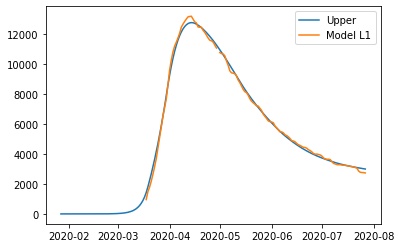

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232332506960025, 'other': 0.41367835561986316, 'school': 0.22902760573104683, 'transport': 0.2559106660784979, 'work': 0.41368045075968973}
{'home': 1.0, 'leisure': 0.3374576187068128, 'other': 0.4525788051110919, 'school': 0.29075406775358736, 'transport': 0.2851902431820747, 'work': 0.5544687442676869}
{'home': 1.0, 'leisure': 0.36169425899983915, 'other': 0.49008995283477674, 'school': 0.35027601327532293, 'transport': 0.31342412110338086, 'work': 0.6902288844361127}
{'home': 1.0, 'leisure': 0.38144263257193467, 'other': 0.5206545917207421, 'school': 0.39877537629303345, 'transport': 0.3364295031133341, 'work': 0.800848257906682}
{'home': 1.0, 'leisure': 0.3931121260463548, 'other': 0.5387155146988126, 'school': 0.42743409080349865, 'transport': 0.35002359248285186, 'work': 0.8662142513211092}
{'home': 1.0, 'leisure': 0.3993956994556579, 'other': 0.5484406270716198,

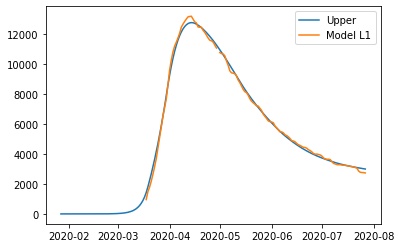

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232332685485475, 'other': 0.4136783583829089, 'school': 0.22902761011539302, 'transport': 0.2559106681581862, 'work': 0.4136804607596897}
{'home': 1.0, 'leisure': 0.3374576200417328, 'other': 0.4525788071771531, 'school': 0.29075407103197237, 'transport': 0.28519024473715693, 'work': 0.5544687517451643}
{'home': 1.0, 'leisure': 0.3616942599005081, 'other': 0.49008995422874574, 'school': 0.3502760154872453, 'transport': 0.31342412215259297, 'work': 0.6902288894811577}
{'home': 1.0, 'leisure': 0.38144263311876936, 'other': 0.5206545925670805, 'school': 0.39877537763598625, 'transport': 0.3364295037503557, 'work': 0.8008482609697449}
{'home': 1.0, 'leisure': 0.39311212638410564, 'other': 0.538715515221551, 'school': 0.4274340916329695, 'transport': 0.35002359287630636, 'work': 0.866214253213001}
{'home': 1.0, 'leisure': 0.3993956996808251, 'other': 0.548440627420112, 'sch

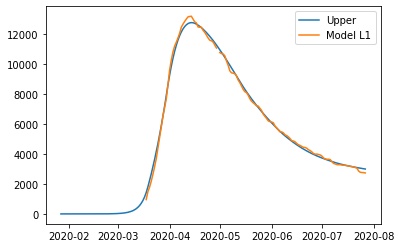

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232332506960025, 'other': 0.41367836561986315, 'school': 0.22902760573104683, 'transport': 0.2559106660784979, 'work': 0.41368045075968973}
{'home': 1.0, 'leisure': 0.3374576182564783, 'other': 0.4525788144141074, 'school': 0.29075406664762615, 'transport': 0.2851902426574686, 'work': 0.5544687417451644}
{'home': 1.0, 'leisure': 0.3616942581152536, 'other': 0.4900899614657, 'school': 0.35027601110289913, 'transport': 0.31342412007290466, 'work': 0.6902288794811577}
{'home': 1.0, 'leisure': 0.38144263133351486, 'other': 0.5206545998040347, 'school': 0.3987753732516401, 'transport': 0.3364295016706674, 'work': 0.800848250969745}
{'home': 1.0, 'leisure': 0.39311212459885114, 'other': 0.5387155224585052, 'school': 0.4274340872486233, 'transport': 0.35002359079661804, 'work': 0.866214243213001}
{'home': 1.0, 'leisure': 0.3993956978955706, 'other': 0.5484406346570663, 'schoo

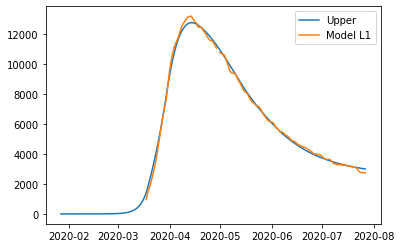

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123229073361995, 'other': 0.4136792205269252, 'school': 0.2290265164773532, 'transport': 0.25591049031412794, 'work': 0.41367963666824026}
{'home': 1.0, 'leisure': 0.3374571896168701, 'other': 0.452579741107469, 'school': 0.29075292390091845, 'transport': 0.28519006183376155, 'work': 0.5544678894329725}
{'home': 1.0, 'leisure': 0.36169381895894526, 'other': 0.4900909573815649, 'school': 0.3502748167736421, 'transport': 0.31342393437055116, 'work': 0.6902279903132501}
{'home': 1.0, 'leisure': 0.3814421836080436, 'other': 0.5206556521234208, 'school': 0.3987741368921577, 'transport': 0.33642931199312043, 'work': 0.8008473317712541}
{'home': 1.0, 'leisure': 0.3931116718097835, 'other': 0.5387166081072448, 'school': 0.4274328260530987, 'transport': 0.3500233987700932, 'work': 0.8662133062691655}
{'home': 1.0, 'leisure': 0.39939524237995117, 'other': 0.5484417382523807, 'sch

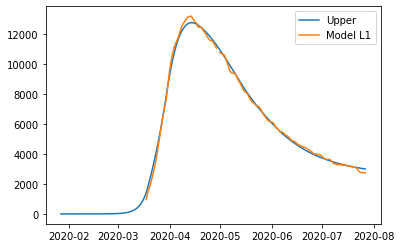

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123229073361995, 'other': 0.4136792205269252, 'school': 0.2290265164773532, 'transport': 0.25591049031412794, 'work': 0.41367963666824026}
{'home': 1.0, 'leisure': 0.3374571900672045, 'other': 0.45257974180445504, 'school': 0.290752925006879, 'transport': 0.2851900623583677, 'work': 0.5544678919554951}
{'home': 1.0, 'leisure': 0.3616938198435307, 'other': 0.4900909587506445, 'school': 0.3502748189460646, 'transport': 0.3134239354010274, 'work': 0.6902279952682051}
{'home': 1.0, 'leisure': 0.3814421848464632, 'other': 0.5206556540401323, 'school': 0.39877413993354915, 'transport': 0.3364293134357873, 'work': 0.800847338708191}
{'home': 1.0, 'leisure': 0.39311167325728696, 'other': 0.5387166103475568, 'school': 0.42743282960797185, 'transport': 0.3500234004563272, 'work': 0.8662133143772737}
{'home': 1.0, 'leisure': 0.3993952439400382, 'other': 0.5484417406669393, 'school

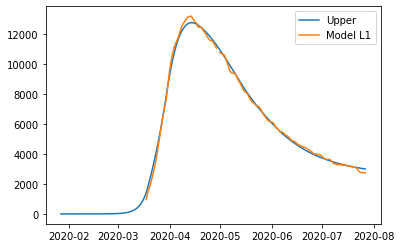

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123229091214538, 'other': 0.41367922328997675, 'school': 0.22902652086169678, 'transport': 0.25591049239381647, 'work': 0.41367964666824025}
{'home': 1.0, 'leisure': 0.3374571914021243, 'other': 0.45257974387052063, 'school': 0.29075292828526206, 'transport': 0.2851900639134501, 'work': 0.5544678994329726}
{'home': 1.0, 'leisure': 0.36169382074419953, 'other': 0.4900909601446165, 'school': 0.3502748211579857, 'transport': 0.3134239364502397, 'work': 0.6902280003132502}
{'home': 1.0, 'leisure': 0.38144218539329783, 'other': 0.5206556548864724, 'school': 0.39877414127650124, 'transport': 0.33642931407280896, 'work': 0.800847341771254}
{'home': 1.0, 'leisure': 0.39311167359503774, 'other': 0.5387166108702963, 'school': 0.42743283043744223, 'transport': 0.35002340084978173, 'work': 0.8662133162691654}
{'home': 1.0, 'leisure': 0.39939524416520533, 'other': 0.5484417410154323

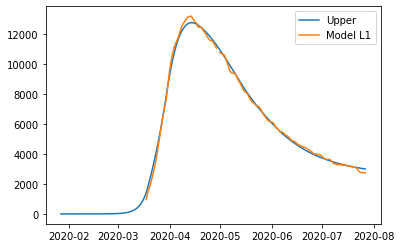

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123229073361995, 'other': 0.4136792305269252, 'school': 0.2290265164773532, 'transport': 0.25591049031412794, 'work': 0.41367963666824026}
{'home': 1.0, 'leisure': 0.3374571896168701, 'other': 0.452579751107469, 'school': 0.29075292390091845, 'transport': 0.28519006183376155, 'work': 0.5544678894329725}
{'home': 1.0, 'leisure': 0.36169381895894526, 'other': 0.4900909673815649, 'school': 0.3502748167736421, 'transport': 0.31342393437055116, 'work': 0.6902279903132501}
{'home': 1.0, 'leisure': 0.3814421836080436, 'other': 0.5206556621234208, 'school': 0.3987741368921577, 'transport': 0.33642931199312043, 'work': 0.8008473317712541}
{'home': 1.0, 'leisure': 0.3931116718097835, 'other': 0.5387166181072447, 'school': 0.4274328260530987, 'transport': 0.3500233987700932, 'work': 0.8662133062691655}
{'home': 1.0, 'leisure': 0.39939524237995117, 'other': 0.5484417482523807, 'sch

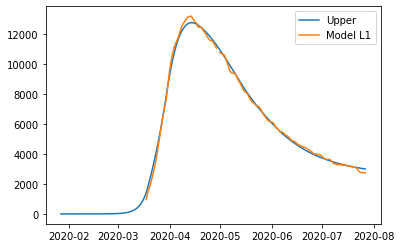

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232290833464105, 'other': 0.41367922491905285, 'school': 0.22902651881005698, 'transport': 0.25591049206275923, 'work': 0.4136796451348759}
{'home': 1.0, 'leisure': 0.3374571905947695, 'other': 0.4525797456348082, 'school': 0.29075292613286663, 'transport': 0.2851900635728635, 'work': 0.5544678978276183}
{'home': 1.0, 'leisure': 0.36169381991703614, 'other': 0.4900909620392865, 'school': 0.35027481890843304, 'transport': 0.31342393610046393, 'work': 0.690227998638477}
{'home': 1.0, 'leisure': 0.3814421845499942, 'other': 0.5206556568873799, 'school': 0.3987741389477835, 'transport': 0.33642931371554585, 'work': 0.8008473400399174}
{'home': 1.0, 'leisure': 0.3931116727421966, 'other': 0.5387166129339807, 'school': 0.4274328280619451, 'transport': 0.3500234004880942, 'work': 0.8662133145044049}
{'home': 1.0, 'leisure': 0.39939524330722875, 'other': 0.5484417431129195, 's

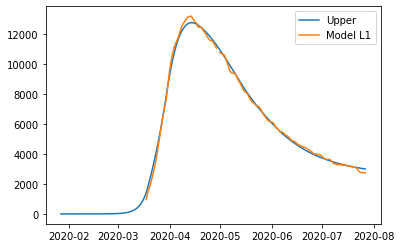

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123229065493868, 'other': 0.4136792321560012, 'school': 0.22902651442571337, 'transport': 0.2559104899830707, 'work': 0.4136796351348759}
{'home': 1.0, 'leisure': 0.33745718880951525, 'other': 0.45257975287175656, 'school': 0.290752921748523, 'transport': 0.28519006149317494, 'work': 0.5544678878276182}
{'home': 1.0, 'leisure': 0.3616938181317819, 'other': 0.4900909692762349, 'school': 0.3502748145240895, 'transport': 0.3134239340207754, 'work': 0.690227988638477}
{'home': 1.0, 'leisure': 0.38144218276473996, 'other': 0.5206556641243284, 'school': 0.39877413456343996, 'transport': 0.3364293116358573, 'work': 0.8008473300399175}
{'home': 1.0, 'leisure': 0.39311167095694244, 'other': 0.538716620170929, 'school': 0.42743282367760155, 'transport': 0.3500233984084057, 'work': 0.8662133045044049}
{'home': 1.0, 'leisure': 0.39939524152197453, 'other': 0.5484417503498679, 'scho

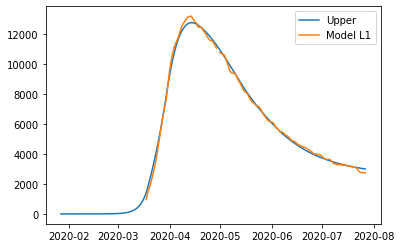

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123229064223323, 'other': 0.41367923241906457, 'school': 0.22902651409441438, 'transport': 0.2559104899296116, 'work': 0.41367963488726806}
{'home': 1.0, 'leisure': 0.33745718867914354, 'other': 0.4525797531566539, 'school': 0.29075292140095405, 'transport': 0.285190061438177, 'work': 0.5544678875683855}
{'home': 1.0, 'leisure': 0.36169381799821154, 'other': 0.4900909695821864, 'school': 0.3502748141608315, 'transport': 0.31342393396429363, 'work': 0.6902279883680345}
{'home': 1.0, 'leisure': 0.3814421826285632, 'other': 0.5206556644474352, 'school': 0.3987741341873984, 'transport': 0.33642931157816647, 'work': 0.800847329760341}
{'home': 1.0, 'leisure': 0.3931116708192256, 'other': 0.538716620504173, 'school': 0.42743282329400606, 'transport': 0.3500233983500004, 'work': 0.8662133042194312}
{'home': 1.0, 'leisure': 0.3993952413834284, 'other': 0.5484417506885704, 'scho

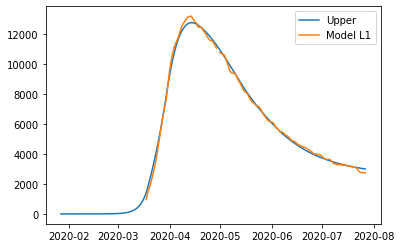

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123229062953816, 'other': 0.4136792326819128, 'school': 0.2290265137633863, 'transport': 0.25591048987619613, 'work': 0.41367963463986274}
{'home': 1.0, 'leisure': 0.3374571885488784, 'other': 0.4525797534413182, 'school': 0.2907529210536692, 'transport': 0.285190061383224, 'work': 0.5544678873093647}
{'home': 1.0, 'leisure': 0.3616938178647503, 'other': 0.4900909698878877, 'school': 0.35027481379787057, 'transport': 0.313423933907858, 'work': 0.690227988097813}
{'home': 1.0, 'leisure': 0.38144218249249784, 'other': 0.5206556647702776, 'school': 0.3987741338116643, 'transport': 0.3364293115205228, 'work': 0.8008473294809932}
{'home': 1.0, 'leisure': 0.39311167068162134, 'other': 0.5387166208371443, 'school': 0.4274328229107242, 'transport': 0.35002339829164286, 'work': 0.8662133039346905}
{'home': 1.0, 'leisure': 0.39939524124499554, 'other': 0.5484417510269958, 'school

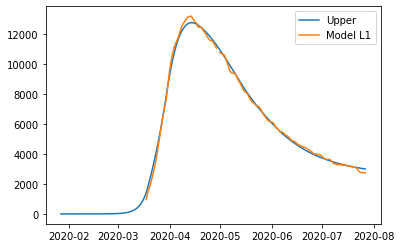

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232290615316743, 'other': 0.4136792329763636, 'school': 0.22902651339255836, 'transport': 0.2559104898163585, 'work': 0.41367963436271155}
{'home': 1.0, 'leisure': 0.33745718840295136, 'other': 0.45257975376020804, 'school': 0.29075292066462993, 'transport': 0.2851900613216639, 'work': 0.5544678870192016}
{'home': 1.0, 'leisure': 0.3616938177152429, 'other': 0.49009097023034376, 'school': 0.35027481339127037, 'transport': 0.31342393384463707, 'work': 0.6902279877951026}
{'home': 1.0, 'leisure': 0.3814421823400731, 'other': 0.5206556651319358, 'school': 0.39877413339075524, 'transport': 0.33642931145594845, 'work': 0.8008473291680591}
{'home': 1.0, 'leisure': 0.39311167052747276, 'other': 0.5387166212101493, 'school': 0.4274328224813599, 'transport': 0.3500233982262688, 'work': 0.8662133036157151}
{'home': 1.0, 'leisure': 0.39939524108991875, 'other': 0.5484417514061104

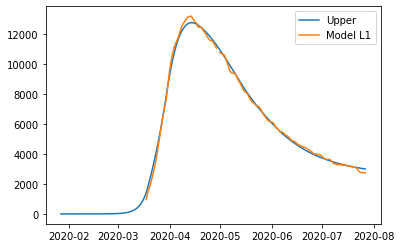

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123229060113038, 'other': 0.4136792332700888, 'school': 0.22902651302264415, 'transport': 0.2559104897566683, 'work': 0.4136796340862433}
{'home': 1.0, 'leisure': 0.3374571882573839, 'other': 0.4525797540783122, 'school': 0.29075292027654936, 'transport': 0.2851900612602556, 'work': 0.5544678867297534}
{'home': 1.0, 'leisure': 0.36169381756610397, 'other': 0.49009097057195605, 'school': 0.35027481298567215, 'transport': 0.31342393378157185, 'work': 0.6902279874931381}
{'home': 1.0, 'leisure': 0.38144218218802406, 'other': 0.5206556654927029, 'school': 0.3987741329708834, 'transport': 0.3364293113915333, 'work': 0.800847328855896}
{'home': 1.0, 'leisure': 0.3931116703737041, 'other': 0.5387166215822352, 'school': 0.42743282205305366, 'transport': 0.350023398161056, 'work': 0.8662133032975258}
{'home': 1.0, 'leisure': 0.39939524093522405, 'other': 0.548441751784291, 'scho

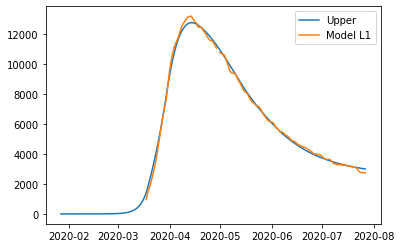

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232287171952516, 'other': 0.4136792942703611, 'school': 0.22902642360570843, 'transport': 0.2559104753281506, 'work': 0.41367956725738503}
{'home': 1.0, 'leisure': 0.3374571530703126, 'other': 0.4525798209715262, 'school': 0.2907528264683657, 'transport': 0.2851900464164156, 'work': 0.5544678167633469}
{'home': 1.0, 'leisure': 0.36169378151571474, 'other': 0.49009104314764973, 'school': 0.35027471494307094, 'transport': 0.3134239185372425, 'work': 0.6902279145012387}
{'home': 1.0, 'leisure': 0.3814421454341905, 'other': 0.5206557426985651, 'school': 0.39877403147801593, 'transport': 0.3364292958208793, 'work': 0.80084725339878}
{'home': 1.0, 'leisure': 0.39311163320419895, 'other': 0.538716701524106, 'school': 0.4274327185213926, 'transport': 0.35002338239757375, 'work': 0.8662132263836909}
{'home': 1.0, 'leisure': 0.39939520354189584, 'other': 0.5484418331993973, 'sch

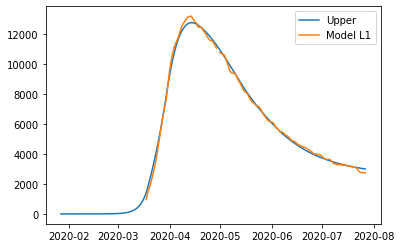

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232287171952516, 'other': 0.4136792942703611, 'school': 0.22902642360570843, 'transport': 0.2559104753281506, 'work': 0.41367956725738503}
{'home': 1.0, 'leisure': 0.337457153520647, 'other': 0.4525798216685123, 'school': 0.2907528275743262, 'transport': 0.28519004694102174, 'work': 0.5544678192858694}
{'home': 1.0, 'leisure': 0.36169378240030015, 'other': 0.4900910445167296, 'school': 0.35027471711549335, 'transport': 0.31342391956771887, 'work': 0.6902279194561936}
{'home': 1.0, 'leisure': 0.3814421466726101, 'other': 0.520655744615277, 'school': 0.39877403451940735, 'transport': 0.33642929726354615, 'work': 0.8008472603357171}
{'home': 1.0, 'leisure': 0.3931116346517024, 'other': 0.5387167037644186, 'school': 0.4274327220762656, 'transport': 0.35002338408380773, 'work': 0.8662132344917991}
{'home': 1.0, 'leisure': 0.3993952051019829, 'other': 0.5484418356139564, 'sc

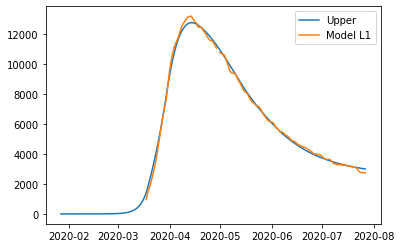

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123228735047794, 'other': 0.4136792970334132, 'school': 0.2290264279900518, 'transport': 0.2559104774078392, 'work': 0.413679577257385}
{'home': 1.0, 'leisure': 0.33745715485556677, 'other': 0.4525798237345783, 'school': 0.2907528308527091, 'transport': 0.28519004849610413, 'work': 0.5544678267633468}
{'home': 1.0, 'leisure': 0.3616937833009689, 'other': 0.49009104591070174, 'school': 0.35027471932741433, 'transport': 0.3134239206169311, 'work': 0.6902279245012386}
{'home': 1.0, 'leisure': 0.38144214721944475, 'other': 0.5206557454616172, 'school': 0.3987740358623593, 'transport': 0.33642929790056786, 'work': 0.8008472633987801}
{'home': 1.0, 'leisure': 0.39311163498945323, 'other': 0.5387167042871581, 'school': 0.427432722905736, 'transport': 0.35002338447726233, 'work': 0.866213236383691}
{'home': 1.0, 'leisure': 0.39939520532715006, 'other': 0.5484418359624494, 'scho

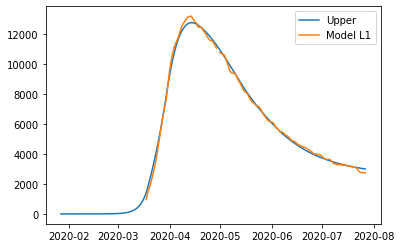

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232287171952516, 'other': 0.41367930427036115, 'school': 0.22902642360570843, 'transport': 0.2559104753281506, 'work': 0.41367956725738503}
{'home': 1.0, 'leisure': 0.3374571530703126, 'other': 0.4525798309715262, 'school': 0.2907528264683657, 'transport': 0.2851900464164156, 'work': 0.5544678167633469}
{'home': 1.0, 'leisure': 0.36169378151571474, 'other': 0.49009105314764967, 'school': 0.35027471494307094, 'transport': 0.3134239185372425, 'work': 0.6902279145012387}
{'home': 1.0, 'leisure': 0.3814421454341905, 'other': 0.5206557526985651, 'school': 0.39877403147801593, 'transport': 0.3364292958208793, 'work': 0.80084725339878}
{'home': 1.0, 'leisure': 0.39311163320419895, 'other': 0.538716711524106, 'school': 0.4274327185213926, 'transport': 0.35002338239757375, 'work': 0.8662132263836909}
{'home': 1.0, 'leisure': 0.39939520354189584, 'other': 0.5484418431993974, 'sc

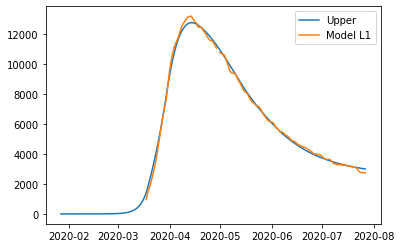

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232282329455985, 'other': 0.413679394533034, 'school': 0.22902629733602914, 'transport': 0.25591045495299025, 'work': 0.4136794728853429}
{'home': 1.0, 'leisure': 0.33745710338106416, 'other': 0.4525799295558871, 'school': 0.29075269399760767, 'transport': 0.2851900254547599, 'work': 0.5544677179606314}
{'home': 1.0, 'leisure': 0.3616937306073362, 'other': 0.49009115975649553, 'school': 0.3502745764927012, 'transport': 0.31342389701003776, 'work': 0.6902278114260882}
{'home': 1.0, 'leisure': 0.38144209353244674, 'other': 0.5206558658458802, 'school': 0.39877388815537, 'transport': 0.3364292738328567, 'work': 0.8008471468423863}
{'home': 1.0, 'leisure': 0.3931115807154666, 'other': 0.5387168285350621, 'school': 0.42743257231967435, 'transport': 0.3500233601372498, 'work': 0.8662131177701989}
{'home': 1.0, 'leisure': 0.39939515073709264, 'other': 0.5484419622907754, 'sch

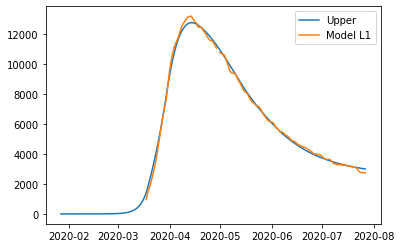

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232282329455985, 'other': 0.413679394533034, 'school': 0.22902629733602914, 'transport': 0.25591045495299025, 'work': 0.4136794728853429}
{'home': 1.0, 'leisure': 0.33745710383139854, 'other': 0.45257993025287346, 'school': 0.29075269510356805, 'transport': 0.285190025979366, 'work': 0.554467720483154}
{'home': 1.0, 'leisure': 0.3616937314919216, 'other': 0.4900911611255758, 'school': 0.3502745786651235, 'transport': 0.31342389804051407, 'work': 0.6902278163810432}
{'home': 1.0, 'leisure': 0.38144209477086627, 'other': 0.5206558677625925, 'school': 0.3987738911967612, 'transport': 0.3364292752755236, 'work': 0.8008471537793234}
{'home': 1.0, 'leisure': 0.39311158216296993, 'other': 0.5387168307753751, 'school': 0.4274325758745471, 'transport': 0.35002336182348376, 'work': 0.866213125878307}
{'home': 1.0, 'leisure': 0.3993951522971796, 'other': 0.548441964705335, 'schoo

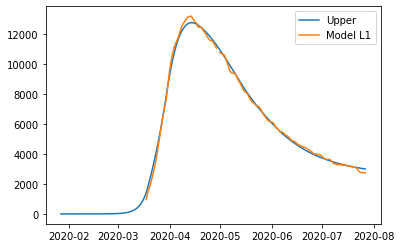

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.312322825079814, 'other': 0.4136793972960867, 'school': 0.22902630172037225, 'transport': 0.25591045703267884, 'work': 0.4136794828853429}
{'home': 1.0, 'leisure': 0.3374571051663183, 'other': 0.4525799323189399, 'school': 0.2907526983819507, 'transport': 0.28519002753444844, 'work': 0.5544677279606314}
{'home': 1.0, 'leisure': 0.36169373239259034, 'other': 0.4900911625195483, 'school': 0.3502745808770443, 'transport': 0.31342389908972634, 'work': 0.6902278214260882}
{'home': 1.0, 'leisure': 0.3814420953177009, 'other': 0.520655868608933, 'school': 0.3987738925397131, 'transport': 0.33642927591254534, 'work': 0.8008471568423864}
{'home': 1.0, 'leisure': 0.39311158250072076, 'other': 0.5387168312981149, 'school': 0.42743257670401746, 'transport': 0.3500233622169384, 'work': 0.866213127770199}
{'home': 1.0, 'leisure': 0.3993951525223468, 'other': 0.5484419650538281, 'schoo

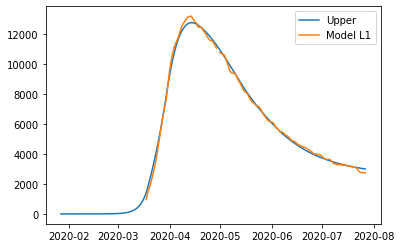

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232282329455985, 'other': 0.413679404533034, 'school': 0.22902629733602914, 'transport': 0.25591045495299025, 'work': 0.4136794728853429}
{'home': 1.0, 'leisure': 0.33745710338106416, 'other': 0.45257993955588716, 'school': 0.29075269399760767, 'transport': 0.2851900254547599, 'work': 0.5544677179606314}
{'home': 1.0, 'leisure': 0.3616937306073362, 'other': 0.4900911697564956, 'school': 0.3502745764927012, 'transport': 0.31342389701003776, 'work': 0.6902278114260882}
{'home': 1.0, 'leisure': 0.38144209353244674, 'other': 0.5206558758458801, 'school': 0.39877388815537, 'transport': 0.3364292738328567, 'work': 0.8008471468423863}
{'home': 1.0, 'leisure': 0.3931115807154666, 'other': 0.538716838535062, 'school': 0.42743257231967435, 'transport': 0.3500233601372498, 'work': 0.8662131177701989}
{'home': 1.0, 'leisure': 0.39939515073709264, 'other': 0.5484419722907753, 'scho

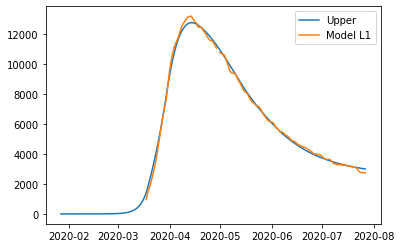

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232281309388266, 'other': 0.41367941565327815, 'school': 0.22902627073743054, 'transport': 0.25591045066098017, 'work': 0.4136794530059534}
{'home': 1.0, 'leisure': 0.3374570929140668, 'other': 0.4525799524290877, 'school': 0.2907526660927571, 'transport': 0.28519002103920504, 'work': 0.5544676971479243}
{'home': 1.0, 'leisure': 0.3616937198835301, 'other': 0.49009118432004695, 'school': 0.3502745473282506, 'transport': 0.3134238924753505, 'work': 0.6902277897133964}
{'home': 1.0, 'leisure': 0.3814420825993891, 'other': 0.5206558917867544, 'school': 0.3987738579645787, 'transport': 0.3364292692010986, 'work': 0.8008471243963737}
{'home': 1.0, 'leisure': 0.39311156965876026, 'other': 0.5387168552898088, 'school': 0.4274325415224089, 'transport': 0.35002335544813157, 'work': 0.8662130948908602}
{'home': 1.0, 'leisure': 0.39939513961380635, 'other': 0.5484419894837612, 's

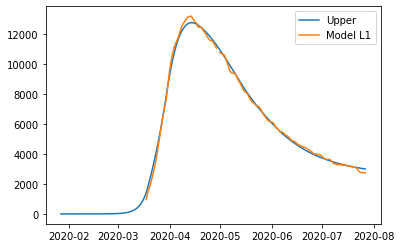

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232281309388266, 'other': 0.41367941565327815, 'school': 0.22902627073743054, 'transport': 0.25591045066098017, 'work': 0.4136794530059534}
{'home': 1.0, 'leisure': 0.3374570933644012, 'other': 0.452579953126074, 'school': 0.29075266719871756, 'transport': 0.28519002156381124, 'work': 0.554467699670447}
{'home': 1.0, 'leisure': 0.3616937207681155, 'other': 0.4900911856891272, 'school': 0.3502745495006728, 'transport': 0.3134238935058268, 'work': 0.6902277946683514}
{'home': 1.0, 'leisure': 0.38144208383780864, 'other': 0.5206558937034668, 'school': 0.39877386100596973, 'transport': 0.3364292706437655, 'work': 0.8008471313333105}
{'home': 1.0, 'leisure': 0.3931115711062637, 'other': 0.538716857530122, 'school': 0.4274325450772816, 'transport': 0.3500233571343656, 'work': 0.8662131029989684}
{'home': 1.0, 'leisure': 0.3993951411738933, 'other': 0.548441991898321, 'school

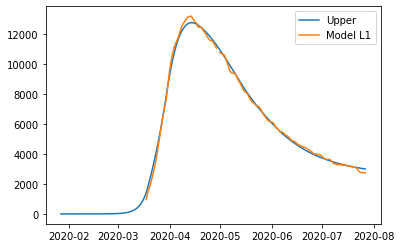

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123228148791368, 'other': 0.4136794184163311, 'school': 0.22902627512177354, 'transport': 0.25591045274066876, 'work': 0.4136794630059534}
{'home': 1.0, 'leisure': 0.33745709469932095, 'other': 0.45257995519214067, 'school': 0.29075267047710013, 'transport': 0.28519002311889363, 'work': 0.5544677071479244}
{'home': 1.0, 'leisure': 0.3616937216687843, 'other': 0.49009118708309984, 'school': 0.35027455171259364, 'transport': 0.31342389455503905, 'work': 0.6902277997133964}
{'home': 1.0, 'leisure': 0.3814420843846432, 'other': 0.5206558945498073, 'school': 0.3987738623489217, 'transport': 0.3364292712807872, 'work': 0.8008471343963737}
{'home': 1.0, 'leisure': 0.39311157144401443, 'other': 0.5387168580528617, 'school': 0.42743254590675184, 'transport': 0.3500233575278202, 'work': 0.8662131048908601}
{'home': 1.0, 'leisure': 0.3993951413990605, 'other': 0.5484419922468141, 

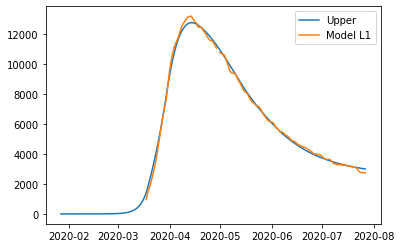

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232281309388266, 'other': 0.4136794256532782, 'school': 0.22902627073743054, 'transport': 0.25591045066098017, 'work': 0.4136794530059534}
{'home': 1.0, 'leisure': 0.3374570929140668, 'other': 0.4525799624290877, 'school': 0.2907526660927571, 'transport': 0.28519002103920504, 'work': 0.5544676971479243}
{'home': 1.0, 'leisure': 0.3616937198835301, 'other': 0.4900911943200469, 'school': 0.3502745473282506, 'transport': 0.3134238924753505, 'work': 0.6902277897133964}
{'home': 1.0, 'leisure': 0.3814420825993891, 'other': 0.5206559017867545, 'school': 0.3987738579645787, 'transport': 0.3364292692010986, 'work': 0.8008471243963737}
{'home': 1.0, 'leisure': 0.39311156965876026, 'other': 0.5387168652898089, 'school': 0.4274325415224089, 'transport': 0.35002335544813157, 'work': 0.8662130948908602}
{'home': 1.0, 'leisure': 0.39939513961380635, 'other': 0.5484419994837613, 'sch

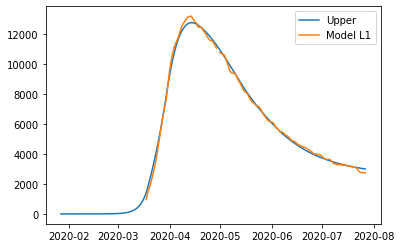

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123228130434187, 'other': 0.41367942575776256, 'school': 0.22902627060584407, 'transport': 0.2559104506397471, 'work': 0.41367945290760766}
{'home': 1.0, 'leisure': 0.3374570928622853, 'other': 0.4525799625422442, 'school': 0.2907526659547085, 'transport': 0.2851900210173608, 'work': 0.5544676970449615}
{'home': 1.0, 'leisure': 0.36169371983047816, 'other': 0.4900911944415658, 'school': 0.3502745471839706, 'transport': 0.31342389245291685, 'work': 0.6902277896059812}
{'home': 1.0, 'leisure': 0.381442082545302, 'other': 0.520655901915087, 'school': 0.39877385781522123, 'transport': 0.3364292691781848, 'work': 0.8008471242853306}
{'home': 1.0, 'leisure': 0.39311156960406146, 'other': 0.5387168654221678, 'school': 0.42743254137005116, 'transport': 0.350023355424934, 'work': 0.8662130947776734}
{'home': 1.0, 'leisure': 0.39939513955877814, 'other': 0.5484419996182882, 'scho

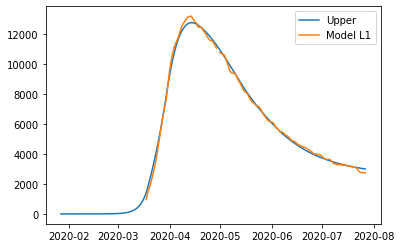

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123228052880514, 'other': 0.4136794318150541, 'school': 0.2290262503834709, 'transport': 0.25591044737661917, 'work': 0.4136794377937123}
{'home': 1.0, 'leisure': 0.33745708490444026, 'other': 0.4525799699322728, 'school': 0.2907526447392186, 'transport': 0.2851900176603043, 'work': 0.5544676812214837}
{'home': 1.0, 'leisure': 0.3616937116773866, 'other': 0.4900912031167336, 'school': 0.35027452501083245, 'transport': 0.3134238890052864, 'work': 0.6902277730982633}
{'home': 1.0, 'leisure': 0.3814420742331207, 'other': 0.5206559116374054, 'school': 0.3987738348617771, 'transport': 0.3364292656567533, 'work': 0.8008471072200838}
{'home': 1.0, 'leisure': 0.3931115611978727, 'other': 0.538716875763257, 'school': 0.4274325179555171, 'transport': 0.35002335185989286, 'work': 0.8662130773829777}
{'home': 1.0, 'leisure': 0.3993951311019699, 'other': 0.5484420102925617, 'school'

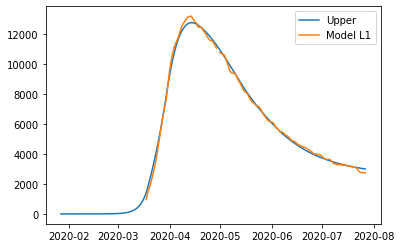

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123228052880514, 'other': 0.4136794318150541, 'school': 0.2290262503834709, 'transport': 0.25591044737661917, 'work': 0.4136794377937123}
{'home': 1.0, 'leisure': 0.33745708535477464, 'other': 0.45257997062925914, 'school': 0.290752645845179, 'transport': 0.28519001818491047, 'work': 0.5544676837440063}
{'home': 1.0, 'leisure': 0.361693712561972, 'other': 0.490091204485814, 'school': 0.3502745271832547, 'transport': 0.31342389003576276, 'work': 0.6902277780532183}
{'home': 1.0, 'leisure': 0.3814420754715403, 'other': 0.5206559135541179, 'school': 0.3987738379031682, 'transport': 0.33642926709942017, 'work': 0.8008471141570208}
{'home': 1.0, 'leisure': 0.39311156264537606, 'other': 0.5387168780035703, 'school': 0.4274325215103898, 'transport': 0.3500233535461268, 'work': 0.8662130854910858}
{'home': 1.0, 'leisure': 0.39939513266205684, 'other': 0.5484420127071215, 'schoo

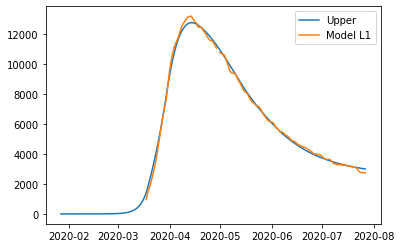

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123228070733055, 'other': 0.41367943457810713, 'school': 0.22902625476781385, 'transport': 0.25591044945630775, 'work': 0.4136794477937123}
{'home': 1.0, 'leisure': 0.3374570866896944, 'other': 0.4525799726953258, 'school': 0.2907526491235616, 'transport': 0.2851900197399929, 'work': 0.5544676912214838}
{'home': 1.0, 'leisure': 0.3616937134626408, 'other': 0.49009120587978666, 'school': 0.35027452939517545, 'transport': 0.313423891084975, 'work': 0.6902277830982634}
{'home': 1.0, 'leisure': 0.3814420760183749, 'other': 0.5206559144004584, 'school': 0.3987738392461201, 'transport': 0.3364292677364419, 'work': 0.8008471172200838}
{'home': 1.0, 'leisure': 0.3931115629831269, 'other': 0.53871687852631, 'school': 0.42743252233986007, 'transport': 0.3500233539395814, 'work': 0.8662130873829776}
{'home': 1.0, 'leisure': 0.39939513288722406, 'other': 0.5484420130556147, 'school

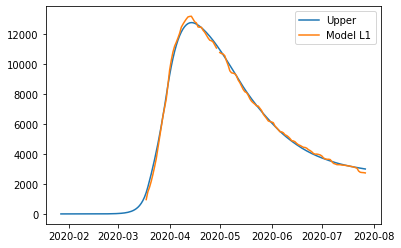

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232591499115214, 'other': 0.41369957279186087, 'school': 0.2290349363208604, 'transport': 0.2559154554069069, 'work': 0.4137036583642717}
{'home': 1.0, 'leisure': 0.33746883100182, 'other': 0.4526133588757284, 'school': 0.29077591238612244, 'transport': 0.2852019630029301, 'work': 0.5545230266393593}
{'home': 1.0, 'leisure': 0.36171378572639257, 'other': 0.490137366885172, 'school': 0.3503118535919108, 'transport': 0.3134425238990953, 'work': 0.690313131761765}
{'home': 1.0, 'leisure': 0.38146893402048876, 'other': 0.5207124845224965, 'school': 0.398822620500331, 'transport': 0.33645335129597076, 'work': 0.8009569211207624}
{'home': 1.0, 'leisure': 0.39314243073972743, 'other': 0.5387795994900064, 'school': 0.4274880736734884, 'transport': 0.3500506583941244, 'work': 0.8663373421056245}
{'home': 1.0, 'leisure': 0.39942815974239443, 'other': 0.5485080460109732, 'school'

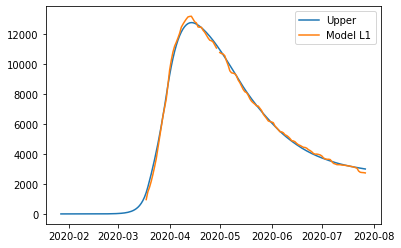

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232591499115214, 'other': 0.41369957279186087, 'school': 0.2290349363208604, 'transport': 0.2559154554069069, 'work': 0.4137036583642717}
{'home': 1.0, 'leisure': 0.33746883145220957, 'other': 0.452613359572798, 'school': 0.2907759134920996, 'transport': 0.28520196352754457, 'work': 0.5545230291618818}
{'home': 1.0, 'leisure': 0.36171378661108633, 'other': 0.4901373682544159, 'school': 0.3503118557643659, 'transport': 0.313442524929588, 'work': 0.69031313671672}
{'home': 1.0, 'leisure': 0.38146893525906, 'other': 0.5207124864394379, 'school': 0.3988226235417682, 'transport': 0.3364533527386605, 'work': 0.8009569280576994}
{'home': 1.0, 'leisure': 0.39314243218740813, 'other': 0.5387796017305873, 'school': 0.4274880772284149, 'transport': 0.3500506600803851, 'work': 0.8663373502137326}
{'home': 1.0, 'leisure': 0.39942816130267245, 'other': 0.5485080484258216, 'school': 

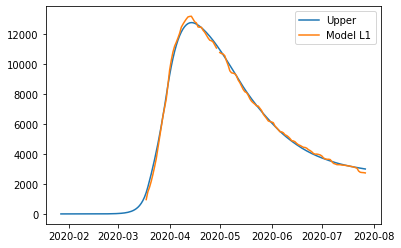

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.312325916776625, 'other': 0.413699575555244, 'school': 0.22903494070526978, 'transport': 0.2559154574866285, 'work': 0.4137036683642717}
{'home': 1.0, 'leisure': 0.3374688327872929, 'other': 0.4526133616391115, 'school': 0.29077591677053183, 'transport': 0.28520196508265167, 'work': 0.5545230366393592}
{'home': 1.0, 'leisure': 0.36171378751186545, 'other': 0.49013736964855514, 'school': 0.3503118579763202, 'transport': 0.31344252597881694, 'work': 0.6903131417617651}
{'home': 1.0, 'leisure': 0.38146893580596164, 'other': 0.5207124872858796, 'school': 0.39882262488474046, 'transport': 0.3364533533756924, 'work': 0.8009569311207625}
{'home': 1.0, 'leisure': 0.3931424325252003, 'other': 0.5387796022533895, 'school': 0.42748807805789785, 'transport': 0.350050660473846, 'work': 0.8663373521056246}
{'home': 1.0, 'leisure': 0.39942816152786725, 'other': 0.5485080487743563, 'sch

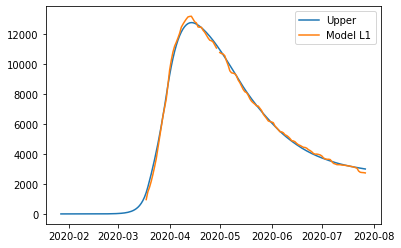

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232591499115214, 'other': 0.4136995827918609, 'school': 0.2290349363208604, 'transport': 0.2559154554069069, 'work': 0.4137036583642717}
{'home': 1.0, 'leisure': 0.33746883100182, 'other': 0.4526133688757284, 'school': 0.29077591238612244, 'transport': 0.2852019630029301, 'work': 0.5545230266393593}
{'home': 1.0, 'leisure': 0.36171378572639257, 'other': 0.490137376885172, 'school': 0.3503118535919108, 'transport': 0.3134425238990953, 'work': 0.690313131761765}
{'home': 1.0, 'leisure': 0.38146893402048876, 'other': 0.5207124945224965, 'school': 0.398822620500331, 'transport': 0.33645335129597076, 'work': 0.8009569211207624}
{'home': 1.0, 'leisure': 0.39314243073972743, 'other': 0.5387796094900064, 'school': 0.4274880736734884, 'transport': 0.3500506583941244, 'work': 0.8663373421056245}
{'home': 1.0, 'leisure': 0.39942815974239443, 'other': 0.5485080560109733, 'school':

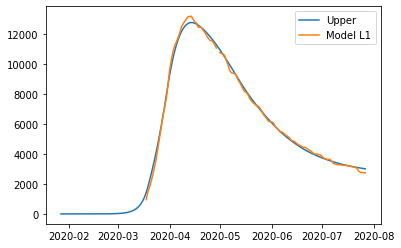

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123444279878316, 'other': 0.4138219569748625, 'school': 0.22908656344057685, 'transport': 0.2559456170317551, 'work': 0.4138492586341901}
{'home': 1.0, 'leisure': 0.33753950622664664, 'other': 0.4528158290919566, 'school': 0.2909155547076626, 'transport': 0.28527401467242774, 'work': 0.5548565092197211}
{'home': 1.0, 'leisure': 0.3618347602426469, 'other': 0.49041706291915466, 'school': 0.35053636771520963, 'transport': 0.3135549695402192, 'work': 0.6908277865700547}
{'home': 1.0, 'leisure': 0.381630893144573, 'other': 0.5210551052968715, 'school': 0.3991162894250627, 'transport': 0.33659871054360485, 'work': 0.8016191977444005}
{'home': 1.0, 'leisure': 0.39332860804116565, 'other': 0.5391594030655222, 'school': 0.4278226067990668, 'transport': 0.35021546659106, 'work': 0.8670868498019685}
{'home': 1.0, 'leisure': 0.3996273776008694, 'other': 0.5489078710947959, 'school

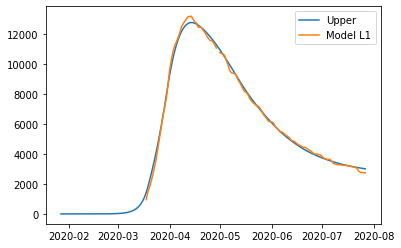

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123444279878316, 'other': 0.4138219569748625, 'school': 0.22908656344057685, 'transport': 0.2559456170317551, 'work': 0.4138492586341901}
{'home': 1.0, 'leisure': 0.33753950622664664, 'other': 0.4528158290919566, 'school': 0.2909155547076626, 'transport': 0.28527401467242774, 'work': 0.5548565092197211}
{'home': 1.0, 'leisure': 0.3618347602426469, 'other': 0.49041706291915466, 'school': 0.35053636771520963, 'transport': 0.3135549695402192, 'work': 0.6908277865700547}
{'home': 1.0, 'leisure': 0.381630893144573, 'other': 0.5210551052968715, 'school': 0.3991162894250627, 'transport': 0.33659871054360485, 'work': 0.8016191977444005}
{'home': 1.0, 'leisure': 0.39332860804116565, 'other': 0.5391594030655222, 'school': 0.4278226067990668, 'transport': 0.35021546659106, 'work': 0.8670868498019685}
{'home': 1.0, 'leisure': 0.3996273776008694, 'other': 0.5489078710947959, 'school

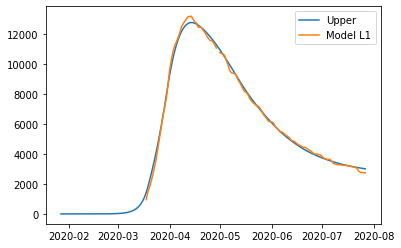

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123444279878316, 'other': 0.4138219569748625, 'school': 0.22908656344057685, 'transport': 0.2559456170317551, 'work': 0.4138492586341901}
{'home': 1.0, 'leisure': 0.33753950622664664, 'other': 0.4528158290919566, 'school': 0.2909155547076626, 'transport': 0.28527401467242774, 'work': 0.5548565092197211}
{'home': 1.0, 'leisure': 0.3618347602426469, 'other': 0.49041706291915466, 'school': 0.35053636771520963, 'transport': 0.3135549695402192, 'work': 0.6908277865700547}
{'home': 1.0, 'leisure': 0.381630893144573, 'other': 0.5210551052968715, 'school': 0.3991162894250627, 'transport': 0.33659871054360485, 'work': 0.8016191977444005}
{'home': 1.0, 'leisure': 0.39332860804116565, 'other': 0.5391594030655222, 'school': 0.4278226067990668, 'transport': 0.35021546659106, 'work': 0.8670868498019685}
{'home': 1.0, 'leisure': 0.3996273776008694, 'other': 0.5489078710947959, 'school

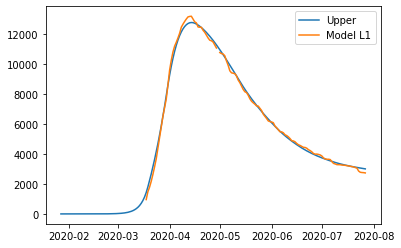

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233761329058085, 'other': 0.4138068208498991, 'school': 0.2290703338756157, 'transport': 0.25593938311569053, 'work': 0.4138241090010386}
{'home': 1.0, 'leisure': 0.3375262216217718, 'other': 0.4527914709477876, 'school': 0.2908879607742735, 'transport': 0.2852625375543576, 'work': 0.5548081837547405}
{'home': 1.0, 'leisure': 0.3618152367982774, 'other': 0.4903838121136087, 'school': 0.3504978152836935, 'transport': 0.313538436477358, 'work': 0.6907571129815245}
{'home': 1.0, 'leisure': 0.38160628620135595, 'other': 0.5210146086190925, 'school': 0.39906880784692467, 'transport': 0.3365780578220251, 'work': 0.8015303145737189}
{'home': 1.0, 'leisure': 0.3933009972122661, 'other': 0.5391146247359694, 'school': 0.42776984890701575, 'transport': 0.35019237952569193, 'work': 0.8669872064236519}
{'home': 1.0, 'leisure': 0.39959814929506376, 'other': 0.5488607872604415, 'scho

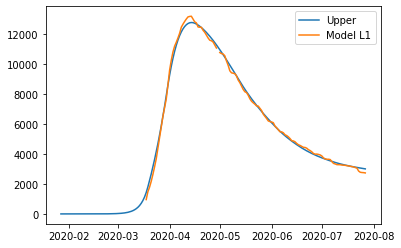

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233761329058085, 'other': 0.4138068208498991, 'school': 0.2290703338756157, 'transport': 0.25593938311569053, 'work': 0.4138241090010386}
{'home': 1.0, 'leisure': 0.3375262216217718, 'other': 0.4527914709477876, 'school': 0.2908879607742735, 'transport': 0.2852625375543576, 'work': 0.5548081837547405}
{'home': 1.0, 'leisure': 0.3618152367982774, 'other': 0.4903838121136087, 'school': 0.3504978152836935, 'transport': 0.313538436477358, 'work': 0.6907571129815245}
{'home': 1.0, 'leisure': 0.38160628620135595, 'other': 0.5210146086190925, 'school': 0.39906880784692467, 'transport': 0.3365780578220251, 'work': 0.8015303145737189}
{'home': 1.0, 'leisure': 0.3933009972122661, 'other': 0.5391146247359694, 'school': 0.42776984890701575, 'transport': 0.35019237952569193, 'work': 0.8669872064236519}
{'home': 1.0, 'leisure': 0.39959814929506376, 'other': 0.5488607872604415, 'scho

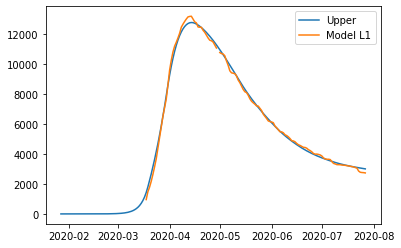

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233761329058085, 'other': 0.4138068208498991, 'school': 0.2290703338756157, 'transport': 0.25593938311569053, 'work': 0.4138241090010386}
{'home': 1.0, 'leisure': 0.3375262216217718, 'other': 0.4527914709477876, 'school': 0.2908879607742735, 'transport': 0.2852625375543576, 'work': 0.5548081837547405}
{'home': 1.0, 'leisure': 0.3618152367982774, 'other': 0.4903838121136087, 'school': 0.3504978152836935, 'transport': 0.313538436477358, 'work': 0.6907571129815245}
{'home': 1.0, 'leisure': 0.38160628620135595, 'other': 0.5210146086190925, 'school': 0.39906880784692467, 'transport': 0.3365780578220251, 'work': 0.8015303145737189}
{'home': 1.0, 'leisure': 0.3933009972122661, 'other': 0.5391146247359694, 'school': 0.42776984890701575, 'transport': 0.35019237952569193, 'work': 0.8669872064236519}
{'home': 1.0, 'leisure': 0.39959814929506376, 'other': 0.5488607872604415, 'scho

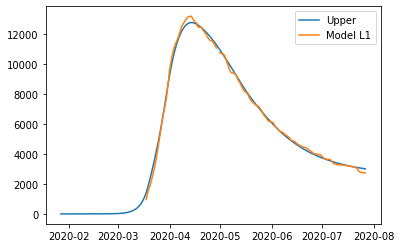

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233749215781975, 'other': 0.4138068186097692, 'school': 0.22907010781166157, 'transport': 0.2559393133249587, 'work': 0.41382394444278464}
{'home': 1.0, 'leisure': 0.3375261030726422, 'other': 0.45279148750849074, 'school': 0.29088772819039954, 'transport': 0.28526246810624256, 'work': 0.5548080342900976}
{'home': 1.0, 'leisure': 0.3618151207405067, 'other': 0.4903838468036865, 'school': 0.35049757641275414, 'transport': 0.3135383673596235, 'work': 0.6907569780714353}
{'home': 1.0, 'leisure': 0.3816061721735814, 'other': 0.5210146580812535, 'school': 0.39906856385319106, 'transport': 0.33657798897348934, 'work': 0.8015301915228954}
{'home': 1.0, 'leisure': 0.3933008843840347, 'other': 0.5391146829270885, 'school': 0.42776960188617663, 'transport': 0.3501923108362283, 'work': 0.8669870903805765}
{'home': 1.0, 'leisure': 0.39959803711274033, 'other': 0.5488608501517689, 

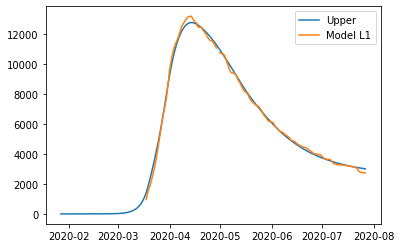

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233749215781975, 'other': 0.4138068186097692, 'school': 0.22907010781166157, 'transport': 0.2559393133249587, 'work': 0.41382394444278464}
{'home': 1.0, 'leisure': 0.3375261030726422, 'other': 0.45279148750849074, 'school': 0.29088772819039954, 'transport': 0.28526246810624256, 'work': 0.5548080342900976}
{'home': 1.0, 'leisure': 0.3618151207405067, 'other': 0.4903838468036865, 'school': 0.35049757641275414, 'transport': 0.3135383673596235, 'work': 0.6907569780714353}
{'home': 1.0, 'leisure': 0.3816061721735814, 'other': 0.5210146580812535, 'school': 0.39906856385319106, 'transport': 0.33657798897348934, 'work': 0.8015301915228954}
{'home': 1.0, 'leisure': 0.3933008843840347, 'other': 0.5391146829270885, 'school': 0.42776960188617663, 'transport': 0.3501923108362283, 'work': 0.8669870903805765}
{'home': 1.0, 'leisure': 0.39959803711274033, 'other': 0.5488608501517689, 

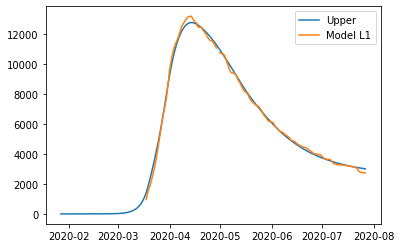

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233749215781975, 'other': 0.4138068186097692, 'school': 0.22907010781166157, 'transport': 0.2559393133249587, 'work': 0.41382394444278464}
{'home': 1.0, 'leisure': 0.3375261030726422, 'other': 0.45279148750849074, 'school': 0.29088772819039954, 'transport': 0.28526246810624256, 'work': 0.5548080342900976}
{'home': 1.0, 'leisure': 0.3618151207405067, 'other': 0.4903838468036865, 'school': 0.35049757641275414, 'transport': 0.3135383673596235, 'work': 0.6907569780714353}
{'home': 1.0, 'leisure': 0.3816061721735814, 'other': 0.5210146580812535, 'school': 0.39906856385319106, 'transport': 0.33657798897348934, 'work': 0.8015301915228954}
{'home': 1.0, 'leisure': 0.3933008843840347, 'other': 0.5391146829270885, 'school': 0.42776960188617663, 'transport': 0.3501923108362283, 'work': 0.8669870903805765}
{'home': 1.0, 'leisure': 0.39959803711274033, 'other': 0.5488608501517689, 

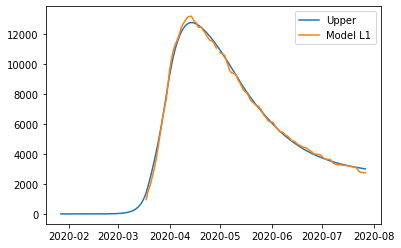

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233480914112177, 'other': 0.41380676898350416, 'school': 0.2290651006408443, 'transport': 0.2559377675044955, 'work': 0.41382029957784316}
{'home': 1.0, 'leisure': 0.3375234772817992, 'other': 0.45279185431001145, 'school': 0.2908825766066154, 'transport': 0.28526092987437857, 'work': 0.5548047237394346}
{'home': 1.0, 'leisure': 0.3618125501317382, 'other': 0.4903846151605721, 'school': 0.35049228557360884, 'transport': 0.31353683644533725, 'work': 0.6907539898952548}
{'home': 1.0, 'leisure': 0.38160364652798473, 'other': 0.5210157536313992, 'school': 0.3990631595467146, 'transport': 0.3365764640216739, 'work': 0.8015274660222194}
{'home': 1.0, 'leisure': 0.393298385307585, 'other': 0.5391159718187061, 'school': 0.4277641305308226, 'transport': 0.350190789407691, 'work': 0.8669845200972439}
{'home': 1.0, 'leisure': 0.39959555234275435, 'other': 0.5488622431503329, 'sch

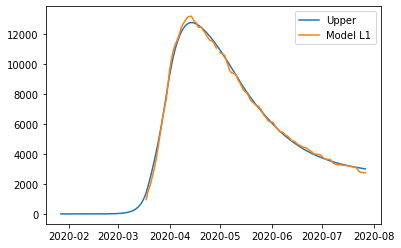

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233480914112177, 'other': 0.41380676898350416, 'school': 0.2290651006408443, 'transport': 0.2559377675044955, 'work': 0.41382029957784316}
{'home': 1.0, 'leisure': 0.3375234772817992, 'other': 0.45279185431001145, 'school': 0.2908825766066154, 'transport': 0.28526092987437857, 'work': 0.5548047237394346}
{'home': 1.0, 'leisure': 0.3618125501317382, 'other': 0.4903846151605721, 'school': 0.35049228557360884, 'transport': 0.31353683644533725, 'work': 0.6907539898952548}
{'home': 1.0, 'leisure': 0.38160364652798473, 'other': 0.5210157536313992, 'school': 0.3990631595467146, 'transport': 0.3365764640216739, 'work': 0.8015274660222194}
{'home': 1.0, 'leisure': 0.393298385307585, 'other': 0.5391159718187061, 'school': 0.4277641305308226, 'transport': 0.350190789407691, 'work': 0.8669845200972439}
{'home': 1.0, 'leisure': 0.39959555234275435, 'other': 0.5488622431503329, 'sch

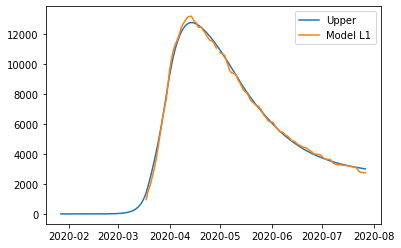

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233480914112177, 'other': 0.41380676898350416, 'school': 0.2290651006408443, 'transport': 0.2559377675044955, 'work': 0.41382029957784316}
{'home': 1.0, 'leisure': 0.3375234772817992, 'other': 0.45279185431001145, 'school': 0.2908825766066154, 'transport': 0.28526092987437857, 'work': 0.5548047237394346}
{'home': 1.0, 'leisure': 0.3618125501317382, 'other': 0.4903846151605721, 'school': 0.35049228557360884, 'transport': 0.31353683644533725, 'work': 0.6907539898952548}
{'home': 1.0, 'leisure': 0.38160364652798473, 'other': 0.5210157536313992, 'school': 0.3990631595467146, 'transport': 0.3365764640216739, 'work': 0.8015274660222194}
{'home': 1.0, 'leisure': 0.393298385307585, 'other': 0.5391159718187061, 'school': 0.4277641305308226, 'transport': 0.350190789407691, 'work': 0.8669845200972439}
{'home': 1.0, 'leisure': 0.39959555234275435, 'other': 0.5488622431503329, 'sch

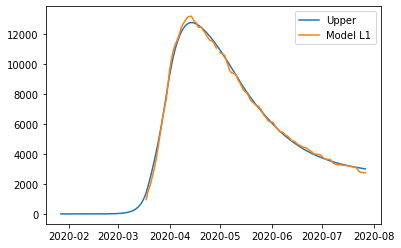

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31233480914112177, 'other': 0.41380676898350416, 'school': 0.2290651006408443, 'transport': 0.2559377675044955, 'work': 0.41382029957784316}
{'home': 1.0, 'leisure': 0.3375234772817992, 'other': 0.45279185431001145, 'school': 0.2908825766066154, 'transport': 0.28526092987437857, 'work': 0.5548047237394346}
{'home': 1.0, 'leisure': 0.3618125501317382, 'other': 0.4903846151605721, 'school': 0.35049228557360884, 'transport': 0.31353683644533725, 'work': 0.6907539898952548}
{'home': 1.0, 'leisure': 0.38160364652798473, 'other': 0.5210157536313992, 'school': 0.3990631595467146, 'transport': 0.3365764640216739, 'work': 0.8015274660222194}
{'home': 1.0, 'leisure': 0.393298385307585, 'other': 0.5391159718187061, 'school': 0.4277641305308226, 'transport': 0.350190789407691, 'work': 0.8669845200972439}
{'home': 1.0, 'leisure': 0.39959555234275435, 'other': 0.5488622431503329, 'sch

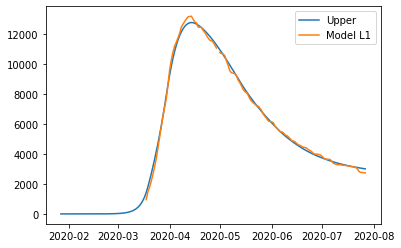

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.312325084221451, 'other': 0.4138065889666614, 'school': 0.22904695166655917, 'transport': 0.25593216451682366, 'work': 0.4138070883209964}
{'home': 1.0, 'leisure': 0.33751395978410936, 'other': 0.4527931836992679, 'school': 0.290863904178378, 'transport': 0.28525535439004623, 'work': 0.5547927242454018}
{'home': 1.0, 'leisure': 0.3618032326481014, 'other': 0.49038740004856707, 'school': 0.3504731083862034, 'transport': 0.31353128748208237, 'work': 0.6907431588867929}
{'home': 1.0, 'leisure': 0.3815944920187615, 'other': 0.5210197244813293, 'school': 0.3990435710740611, 'transport': 0.3365709366681858, 'work': 0.8015175871131115}
{'home': 1.0, 'leisure': 0.39328932710142434, 'other': 0.5391206434643252, 'school': 0.427744299025977, 'transport': 0.3501852748236106, 'work': 0.8669752037922998}
{'home': 1.0, 'leisure': 0.39958654599208887, 'other': 0.5488672921474769, 'schoo

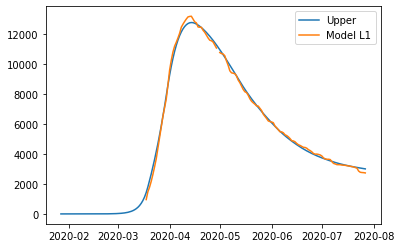

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.312325084221451, 'other': 0.4138065889666614, 'school': 0.22904695166655917, 'transport': 0.25593216451682366, 'work': 0.4138070883209964}
{'home': 1.0, 'leisure': 0.33751395978410936, 'other': 0.4527931836992679, 'school': 0.290863904178378, 'transport': 0.28525535439004623, 'work': 0.5547927242454018}
{'home': 1.0, 'leisure': 0.3618032326481014, 'other': 0.49038740004856707, 'school': 0.3504731083862034, 'transport': 0.31353128748208237, 'work': 0.6907431588867929}
{'home': 1.0, 'leisure': 0.3815944920187615, 'other': 0.5210197244813293, 'school': 0.3990435710740611, 'transport': 0.3365709366681858, 'work': 0.8015175871131115}
{'home': 1.0, 'leisure': 0.39328932710142434, 'other': 0.5391206434643252, 'school': 0.427744299025977, 'transport': 0.3501852748236106, 'work': 0.8669752037922998}
{'home': 1.0, 'leisure': 0.39958654599208887, 'other': 0.5488672921474769, 'schoo

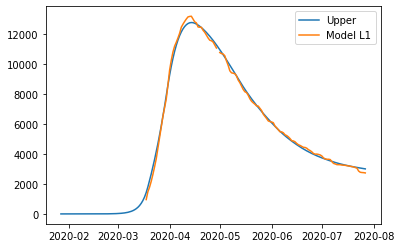

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.312325084221451, 'other': 0.4138065889666614, 'school': 0.22904695166655917, 'transport': 0.25593216451682366, 'work': 0.4138070883209964}
{'home': 1.0, 'leisure': 0.33751395978410936, 'other': 0.4527931836992679, 'school': 0.290863904178378, 'transport': 0.28525535439004623, 'work': 0.5547927242454018}
{'home': 1.0, 'leisure': 0.3618032326481014, 'other': 0.49038740004856707, 'school': 0.3504731083862034, 'transport': 0.31353128748208237, 'work': 0.6907431588867929}
{'home': 1.0, 'leisure': 0.3815944920187615, 'other': 0.5210197244813293, 'school': 0.3990435710740611, 'transport': 0.3365709366681858, 'work': 0.8015175871131115}
{'home': 1.0, 'leisure': 0.39328932710142434, 'other': 0.5391206434643252, 'school': 0.427744299025977, 'transport': 0.3501852748236106, 'work': 0.8669752037922998}
{'home': 1.0, 'leisure': 0.39958654599208887, 'other': 0.5488672921474769, 'schoo

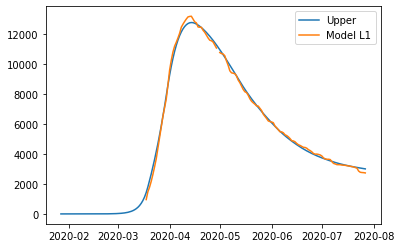

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123250793084804, 'other': 0.41380658887566235, 'school': 0.2290469424978564, 'transport': 0.25593216168623856, 'work': 0.41380708164674884}
{'home': 1.0, 'leisure': 0.3375139549759271, 'other': 0.45279318437081684, 'school': 0.2908638947452249, 'transport': 0.28525535157335474, 'work': 0.5547927181833296}
{'home': 1.0, 'leisure': 0.361803227940965, 'other': 0.49038740145543014, 'school': 0.3504730986980445, 'transport': 0.3135312846787882, 'work': 0.6907431534150326}
{'home': 1.0, 'leisure': 0.38159448739395874, 'other': 0.5210197264873373, 'school': 0.3990435611781197, 'transport': 0.33657093387580805, 'work': 0.8015175821223459}
{'home': 1.0, 'leisure': 0.3932893225252733, 'other': 0.5391206458243734, 'school': 0.4277442890072551, 'transport': 0.35018527203768346, 'work': 0.8669751990857585}
{'home': 1.0, 'leisure': 0.399586541442135, 'other': 0.5488672946981619, 'sch

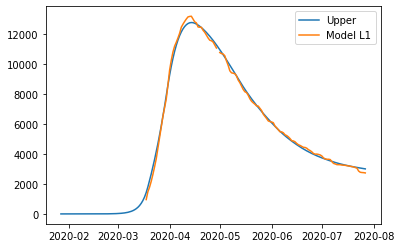

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123250757059716, 'other': 0.41380658880893595, 'school': 0.22904693577476853, 'transport': 0.2559321596106699, 'work': 0.4138070767527574}
{'home': 1.0, 'leisure': 0.33751395145025587, 'other': 0.4527931848632401, 'school': 0.29086388782822487, 'transport': 0.2852553495079737, 'work': 0.5547927137382248}
{'home': 1.0, 'leisure': 0.3618032244893871, 'other': 0.49038740248703344, 'school': 0.35047309159405776, 'transport': 0.313531282623231, 'work': 0.6907431494027827}
{'home': 1.0, 'leisure': 0.3815944840027533, 'other': 0.5210197279582724, 'school': 0.39904355392177343, 'transport': 0.33657093182825537, 'work': 0.8015175784627928}
{'home': 1.0, 'leisure': 0.3932893191697424, 'other': 0.5391206475549137, 'school': 0.42774428166087813, 'transport': 0.35018526999486077, 'work': 0.866975195634617}
{'home': 1.0, 'leisure': 0.39958653810581346, 'other': 0.5488672965684898, 's

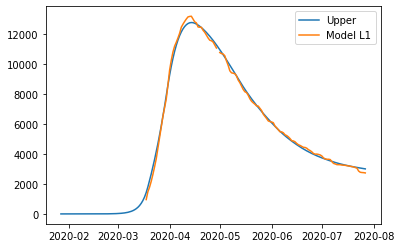

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.312325072844343, 'other': 0.41380658875593224, 'school': 0.22904693043432914, 'transport': 0.25593215796195595, 'work': 0.41380707286524837}
{'home': 1.0, 'leisure': 0.3375139486496627, 'other': 0.45279318525439316, 'school': 0.29086388233375265, 'transport': 0.2852553478673523, 'work': 0.5547927102072859}
{'home': 1.0, 'leisure': 0.3618032217476495, 'other': 0.49038740330648056, 'school': 0.35047308595105386, 'transport': 0.31353128099041305, 'work': 0.6907431462156792}
{'home': 1.0, 'leisure': 0.3815944813089721, 'other': 0.5210197291266999, 'school': 0.3990435481577438, 'transport': 0.33657093020179585, 'work': 0.8015175755558517}
{'home': 1.0, 'leisure': 0.3932893165042991, 'other': 0.5391206489295568, 'school': 0.4277442758253332, 'transport': 0.3501852683721584, 'work': 0.8669751928932261}
{'home': 1.0, 'leisure': 0.399586535455629, 'other': 0.548867298054172, 'sch

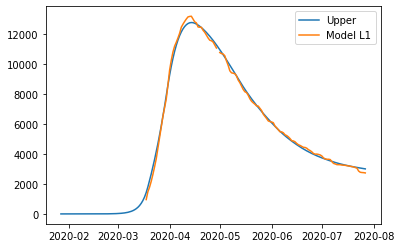

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232506999869103, 'other': 0.4138065887032244, 'school': 0.22904692512370547, 'transport': 0.2559321563224468, 'work': 0.4138070689994433}
{'home': 1.0, 'leisure': 0.3375139458647053, 'other': 0.45279318564336246, 'school': 0.2908638768699561, 'transport': 0.28525534623589044, 'work': 0.5547927066960602}
{'home': 1.0, 'leisure': 0.36180321902121915, 'other': 0.4903874041213526, 'school': 0.3504730803395549, 'transport': 0.3135312793667111, 'work': 0.6907431430463693}
{'home': 1.0, 'leisure': 0.3815944786302304, 'other': 0.5210197302886039, 'school': 0.3990435424258946, 'transport': 0.3365709285844168, 'work': 0.8015175726651397}
{'home': 1.0, 'leisure': 0.393289313853737, 'other': 0.5391206502965251, 'school': 0.4277442700223681, 'transport': 0.3501852667585156, 'work': 0.8669751901671403}
{'home': 1.0, 'leisure': 0.3995865328202406, 'other': 0.5488672995315597, 'school

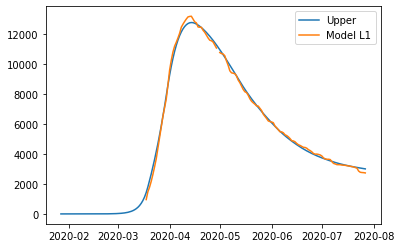

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232506748655425, 'other': 0.41380659020016786, 'school': 0.22904692187536874, 'transport': 0.2559321536160766, 'work': 0.41380706572482495}
{'home': 1.0, 'leisure': 0.3375139434960529, 'other': 0.4527931881909472, 'school': 0.29086387351850246, 'transport': 0.28525534348060616, 'work': 0.5547927043019384}
{'home': 1.0, 'leisure': 0.36180321679092653, 'other': 0.4903874076820558, 'school': 0.350473076888667, 'transport': 0.31353127656425966, 'work': 0.6907431415012977}
{'home': 1.0, 'leisure': 0.3815944765126754, 'other': 0.521019734674811, 'school': 0.3990435388939864, 'transport': 0.3365709257435329, 'work': 0.8015175718118869}
{'home': 1.0, 'leisure': 0.3932893118027998, 'other': 0.53912065517053, 'school': 0.4277442664425842, 'transport': 0.35018526389492166, 'work': 0.8669751897226895}
{'home': 1.0, 'leisure': 0.3995865308051745, 'other': 0.5488673046682249, 'schoo

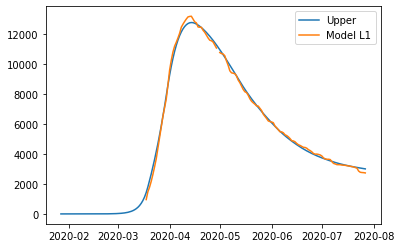

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123250650014234, 'other': 0.41380659168101896, 'school': 0.2290469186619521, 'transport': 0.2559321509388002, 'work': 0.4138070624854092}
{'home': 1.0, 'leisure': 0.3375139411528638, 'other': 0.45279319071114504, 'school': 0.2908638702030773, 'transport': 0.2852553407549415, 'work': 0.5547927019335537}
{'home': 1.0, 'leisure': 0.3618032145846099, 'other': 0.4903874112044809, 'school': 0.3504730734748766, 'transport': 0.313531273791935, 'work': 0.6907431399728359}
{'home': 1.0, 'leisure': 0.3815944744178845, 'other': 0.5210197390138657, 'school': 0.3990435354000465, 'transport': 0.3365709229331889, 'work': 0.8015175709678066}
{'home': 1.0, 'leisure': 0.3932893097739104, 'other': 0.5391206599921385, 'school': 0.4277442629012832, 'transport': 0.3501852610621117, 'work': 0.8669751892830165}
{'home': 1.0, 'leisure': 0.39958652881177054, 'other': 0.54886730974967, 'school': 0

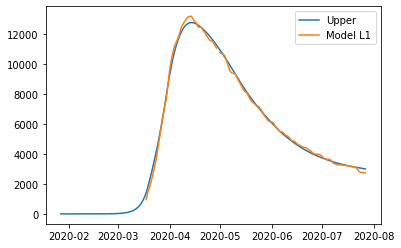

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123250286002522, 'other': 0.4138066133719101, 'school': 0.22904687159315498, 'transport': 0.2559321117231628, 'work': 0.4138070150357854}
{'home': 1.0, 'leisure': 0.3375139068307976, 'other': 0.45279322762595947, 'school': 0.29086382164010216, 'transport': 0.2852553008305331, 'work': 0.5547926672424335}
{'home': 1.0, 'leisure': 0.36180318226739505, 'other': 0.4903874627995071, 'school': 0.35047302347108705, 'transport': 0.3135312331840687, 'work': 0.6907431175845586}
{'home': 1.0, 'leisure': 0.3815944437342522, 'other': 0.5210198025705459, 'school': 0.39904348422225977, 'transport': 0.3365708817684311, 'work': 0.8015175586040678}
{'home': 1.0, 'leisure': 0.3932892800555769, 'other': 0.5391207306170689, 'school': 0.427744211029771, 'transport': 0.35018521956828164, 'work': 0.8669751828428688}
{'home': 1.0, 'leisure': 0.39958649961321324, 'other': 0.5488673841805811, 'sch

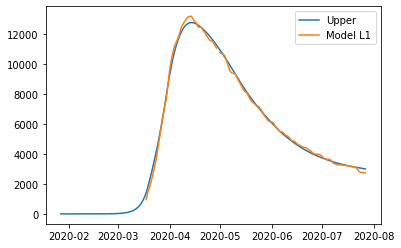

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123250286002522, 'other': 0.4138066133719101, 'school': 0.22904687159315498, 'transport': 0.2559321117231628, 'work': 0.4138070150357854}
{'home': 1.0, 'leisure': 0.3375139068307976, 'other': 0.45279322762595947, 'school': 0.29086382164010216, 'transport': 0.2852553008305331, 'work': 0.5547926672424335}
{'home': 1.0, 'leisure': 0.36180318226739505, 'other': 0.4903874627995071, 'school': 0.35047302347108705, 'transport': 0.3135312331840687, 'work': 0.6907431175845586}
{'home': 1.0, 'leisure': 0.3815944437342522, 'other': 0.5210198025705459, 'school': 0.39904348422225977, 'transport': 0.3365708817684311, 'work': 0.8015175586040678}
{'home': 1.0, 'leisure': 0.3932892800555769, 'other': 0.5391207306170689, 'school': 0.427744211029771, 'transport': 0.35018521956828164, 'work': 0.8669751828428688}
{'home': 1.0, 'leisure': 0.39958649961321324, 'other': 0.5488673841805811, 'sch

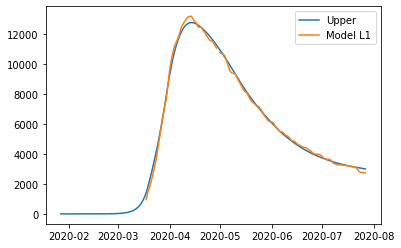

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123250286002522, 'other': 0.4138066133719101, 'school': 0.22904687159315498, 'transport': 0.2559321117231628, 'work': 0.4138070150357854}
{'home': 1.0, 'leisure': 0.3375139068307976, 'other': 0.45279322762595947, 'school': 0.29086382164010216, 'transport': 0.2852553008305331, 'work': 0.5547926672424335}
{'home': 1.0, 'leisure': 0.36180318226739505, 'other': 0.4903874627995071, 'school': 0.35047302347108705, 'transport': 0.3135312331840687, 'work': 0.6907431175845586}
{'home': 1.0, 'leisure': 0.3815944437342522, 'other': 0.5210198025705459, 'school': 0.39904348422225977, 'transport': 0.3365708817684311, 'work': 0.8015175586040678}
{'home': 1.0, 'leisure': 0.3932892800555769, 'other': 0.5391207306170689, 'school': 0.427744211029771, 'transport': 0.35018521956828164, 'work': 0.8669751828428688}
{'home': 1.0, 'leisure': 0.39958649961321324, 'other': 0.5488673841805811, 'sch

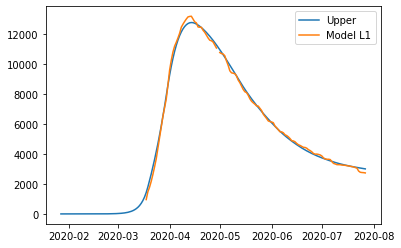

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232500377178374, 'other': 0.41380662816680336, 'school': 0.22904683948852733, 'transport': 0.25593208497500775, 'work': 0.41380698267140115}
{'home': 1.0, 'leisure': 0.33751388342044275, 'other': 0.4527932528047699, 'school': 0.2908637885163266, 'transport': 0.28525527359894, 'work': 0.5547926435803547}
{'home': 1.0, 'leisure': 0.3618031602245068, 'other': 0.4903874979913804, 'school': 0.3504729893645616, 'transport': 0.3135312054863032, 'work': 0.6907431023139885}
{'home': 1.0, 'leisure': 0.381594422805596, 'other': 0.5210198459212112, 'school': 0.3990434493149753, 'transport': 0.3365708536908213, 'work': 0.8015175501710234}
{'home': 1.0, 'leisure': 0.3932892597853306, 'other': 0.5391207787888386, 'school': 0.42774417564931067, 'transport': 0.3501851912662184, 'work': 0.8669751784501804}
{'home': 1.0, 'leisure': 0.3995864796974953, 'other': 0.5488674349483302, 'school

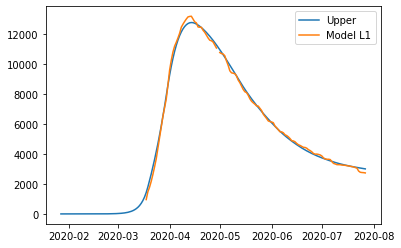

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232500377178374, 'other': 0.41380662816680336, 'school': 0.22904683948852733, 'transport': 0.25593208497500775, 'work': 0.41380698267140115}
{'home': 1.0, 'leisure': 0.33751388342044275, 'other': 0.4527932528047699, 'school': 0.2908637885163266, 'transport': 0.28525527359894, 'work': 0.5547926435803547}
{'home': 1.0, 'leisure': 0.3618031602245068, 'other': 0.4903874979913804, 'school': 0.3504729893645616, 'transport': 0.3135312054863032, 'work': 0.6907431023139885}
{'home': 1.0, 'leisure': 0.381594422805596, 'other': 0.5210198459212112, 'school': 0.3990434493149753, 'transport': 0.3365708536908213, 'work': 0.8015175501710234}
{'home': 1.0, 'leisure': 0.3932892597853306, 'other': 0.5391207787888386, 'school': 0.42774417564931067, 'transport': 0.3501851912662184, 'work': 0.8669751784501804}
{'home': 1.0, 'leisure': 0.3995864796974953, 'other': 0.5488674349483302, 'school

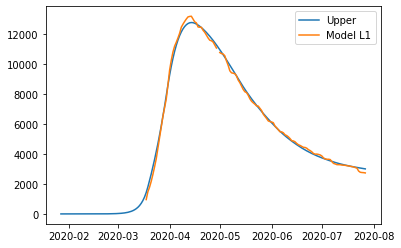

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232500377178374, 'other': 0.41380662816680336, 'school': 0.22904683948852733, 'transport': 0.25593208497500775, 'work': 0.41380698267140115}
{'home': 1.0, 'leisure': 0.33751388342044275, 'other': 0.4527932528047699, 'school': 0.2908637885163266, 'transport': 0.28525527359894, 'work': 0.5547926435803547}
{'home': 1.0, 'leisure': 0.3618031602245068, 'other': 0.4903874979913804, 'school': 0.3504729893645616, 'transport': 0.3135312054863032, 'work': 0.6907431023139885}
{'home': 1.0, 'leisure': 0.381594422805596, 'other': 0.5210198459212112, 'school': 0.3990434493149753, 'transport': 0.3365708536908213, 'work': 0.8015175501710234}
{'home': 1.0, 'leisure': 0.3932892597853306, 'other': 0.5391207787888386, 'school': 0.42774417564931067, 'transport': 0.3501851912662184, 'work': 0.8669751784501804}
{'home': 1.0, 'leisure': 0.3995864796974953, 'other': 0.5488674349483302, 'school

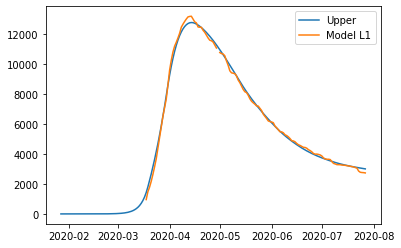

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232485732047466, 'other': 0.41380671543475805, 'school': 0.2290466501186641, 'transport': 0.25593192720040164, 'work': 0.41380679176931234}
{'home': 1.0, 'leisure': 0.33751374533390965, 'other': 0.4527934013225262, 'school': 0.2908635931349828, 'transport': 0.285255112972757, 'work': 0.5547925040090205}
{'home': 1.0, 'leisure': 0.36180303020400767, 'other': 0.4903877055714455, 'school': 0.35047278818643296, 'transport': 0.3135310421103854, 'work': 0.6907430122401677}
{'home': 1.0, 'leisure': 0.38159429935742084, 'other': 0.5210201016261204, 'school': 0.3990432434135405, 'transport': 0.33657068807437895, 'work': 0.8015175004285098}
{'home': 1.0, 'leisure': 0.3932891402208014, 'other': 0.5391210629311557, 'school': 0.42774396695683137, 'transport': 0.35018502432582965, 'work': 0.8669751525398028}
{'home': 1.0, 'leisure': 0.3995863622241601, 'other': 0.5488677344030977, '

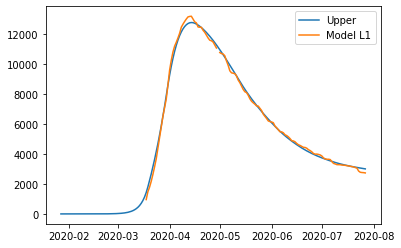

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232485732047466, 'other': 0.41380671543475805, 'school': 0.2290466501186641, 'transport': 0.25593192720040164, 'work': 0.41380679176931234}
{'home': 1.0, 'leisure': 0.33751374533390965, 'other': 0.4527934013225262, 'school': 0.2908635931349828, 'transport': 0.285255112972757, 'work': 0.5547925040090205}
{'home': 1.0, 'leisure': 0.36180303020400767, 'other': 0.4903877055714455, 'school': 0.35047278818643296, 'transport': 0.3135310421103854, 'work': 0.6907430122401677}
{'home': 1.0, 'leisure': 0.38159429935742084, 'other': 0.5210201016261204, 'school': 0.3990432434135405, 'transport': 0.33657068807437895, 'work': 0.8015175004285098}
{'home': 1.0, 'leisure': 0.3932891402208014, 'other': 0.5391210629311557, 'school': 0.42774396695683137, 'transport': 0.35018502432582965, 'work': 0.8669751525398028}
{'home': 1.0, 'leisure': 0.3995863622241601, 'other': 0.5488677344030977, '

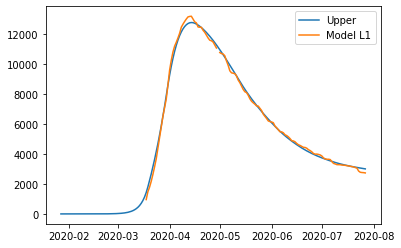

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232485732047466, 'other': 0.41380671543475805, 'school': 0.2290466501186641, 'transport': 0.25593192720040164, 'work': 0.41380679176931234}
{'home': 1.0, 'leisure': 0.33751374533390965, 'other': 0.4527934013225262, 'school': 0.2908635931349828, 'transport': 0.285255112972757, 'work': 0.5547925040090205}
{'home': 1.0, 'leisure': 0.36180303020400767, 'other': 0.4903877055714455, 'school': 0.35047278818643296, 'transport': 0.3135310421103854, 'work': 0.6907430122401677}
{'home': 1.0, 'leisure': 0.38159429935742084, 'other': 0.5210201016261204, 'school': 0.3990432434135405, 'transport': 0.33657068807437895, 'work': 0.8015175004285098}
{'home': 1.0, 'leisure': 0.3932891402208014, 'other': 0.5391210629311557, 'school': 0.42774396695683137, 'transport': 0.35018502432582965, 'work': 0.8669751525398028}
{'home': 1.0, 'leisure': 0.3995863622241601, 'other': 0.5488677344030977, '

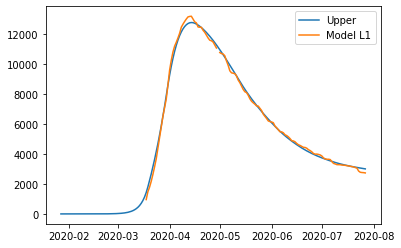

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123248569100167, 'other': 0.41380671567934313, 'school': 0.22904664958791873, 'transport': 0.255931926758208, 'work': 0.41380679123427255}
{'home': 1.0, 'leisure': 0.33751374494689557, 'other': 0.4527934017387757, 'school': 0.2908635925873891, 'transport': 0.2852551125225713, 'work': 0.554792503617845}
{'home': 1.0, 'leisure': 0.3618030298396002, 'other': 0.49038770615322846, 'school': 0.3504727876225926, 'transport': 0.313531041652493, 'work': 0.6907430119877185}
{'home': 1.0, 'leisure': 0.3815942990114336, 'other': 0.5210201023427826, 'school': 0.3990432428364622, 'transport': 0.33657068761020703, 'work': 0.8015175002890969}
{'home': 1.0, 'leisure': 0.3932891398856988, 'other': 0.5391210637275191, 'school': 0.4277439663719305, 'transport': 0.35018502385794714, 'work': 0.866975152467184}
{'home': 1.0, 'leisure': 0.3995863618949186, 'other': 0.5488677352423773, 'school'

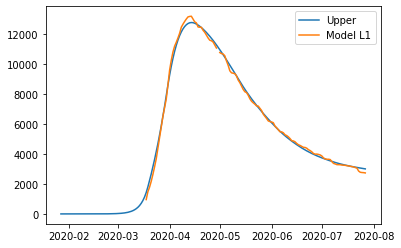

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232485650282693, 'other': 0.41380671592198076, 'school': 0.22904664906139927, 'transport': 0.2559319263195352, 'work': 0.4138067907034928}
{'home': 1.0, 'leisure': 0.337513744562963, 'other': 0.4527934021517109, 'school': 0.2908635920441554, 'transport': 0.28525511207597, 'work': 0.5547925032297841}
{'home': 1.0, 'leisure': 0.3618030294780943, 'other': 0.49038770673037924, 'school': 0.35047278706324164, 'transport': 0.31353104119824643, 'work': 0.6907430117372793}
{'home': 1.0, 'leisure': 0.3815942986682012, 'other': 0.5210201030537386, 'school': 0.39904324226397864, 'transport': 0.33657068714973093, 'work': 0.8015175001507939}
{'home': 1.0, 'leisure': 0.3932891395532644, 'other': 0.5391210645175419, 'school': 0.42774396579168683, 'transport': 0.35018502339379, 'work': 0.8669751523951434}
{'home': 1.0, 'leisure': 0.3995863615682984, 'other': 0.5488677360749744, 'school

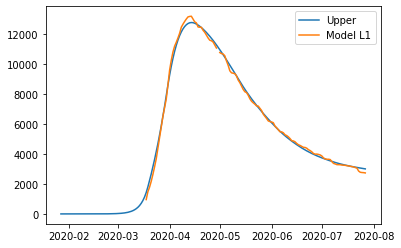

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232485592550496, 'other': 0.41380671626599724, 'school': 0.22904664831488938, 'transport': 0.25593192569757606, 'work': 0.4138067899509426}
{'home': 1.0, 'leisure': 0.33751374401861567, 'other': 0.4527934027371787, 'school': 0.2908635912739478, 'transport': 0.2852551114427697, 'work': 0.5547925026795836}
{'home': 1.0, 'leisure': 0.36180302896554384, 'other': 0.4903877075486751, 'school': 0.3504727862701827, 'transport': 0.31353104055420655, 'work': 0.6907430113822017}
{'home': 1.0, 'leisure': 0.3815942981815593, 'other': 0.5210201040617463, 'school': 0.3990432414522999, 'transport': 0.3365706864968587, 'work': 0.8015174999547052}
{'home': 1.0, 'leisure': 0.39328913908193214, 'other': 0.5391210656376519, 'school': 0.42774396496900563, 'transport': 0.3501850227356986, 'work': 0.8669751522930029}
{'home': 1.0, 'leisure': 0.39958636110520984, 'other': 0.5488677372554472, '

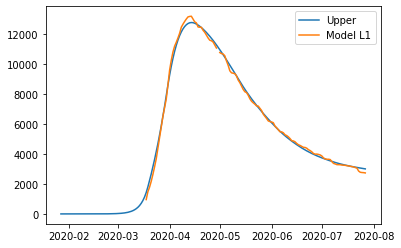

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.3123248553154192, 'other': 0.41380671662953716, 'school': 0.22904664752601395, 'transport': 0.25593192504031986, 'work': 0.4138067891556841}
{'home': 1.0, 'leisure': 0.3375137434433758, 'other': 0.4527934033558727, 'school': 0.2908635904600297, 'transport': 0.2852551107736344, 'work': 0.5547925020981583}
{'home': 1.0, 'leisure': 0.3618030284239054, 'other': 0.4903877084134105, 'school': 0.3504727854321163, 'transport': 0.3135310398736163, 'work': 0.6907430110069728}
{'home': 1.0, 'leisure': 0.38159429766729985, 'other': 0.5210201051269598, 'school': 0.3990432405945573, 'transport': 0.33657068580693494, 'work': 0.8015174997474883}
{'home': 1.0, 'leisure': 0.3932891385838511, 'other': 0.5391210668213298, 'school': 0.427743964099636, 'transport': 0.35018502204025953, 'work': 0.8669751521850655}
{'home': 1.0, 'leisure': 0.3995863606158403, 'other': 0.5488677385029137, 'schoo

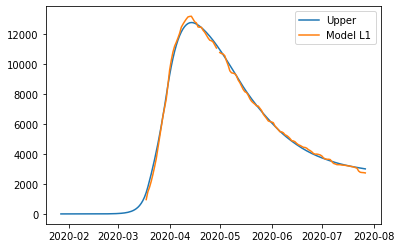

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232481950070806, 'other': 0.4138067379709218, 'school': 0.22904660121556925, 'transport': 0.2559318864564984, 'work': 0.4138067424705211}
{'home': 1.0, 'leisure': 0.3375137096742731, 'other': 0.45279343967592, 'school': 0.29086354267947245, 'transport': 0.2852550714924575, 'work': 0.5547924679659468}
{'home': 1.0, 'leisure': 0.36180299662735355, 'other': 0.49038775917716815, 'school': 0.3504727362339505, 'transport': 0.31353099991998945, 'work': 0.6907429889793929}
{'home': 1.0, 'leisure': 0.38159426747801173, 'other': 0.5210201676596667, 'school': 0.3990431902413029, 'transport': 0.33657064530538583, 'work': 0.8015174875829416}
{'home': 1.0, 'leisure': 0.3932891093443097, 'other': 0.5391211363084158, 'school': 0.4277439130638294, 'transport': 0.35018498121493824, 'work': 0.866975145848675}
{'home': 1.0, 'leisure': 0.399586331887701, 'other': 0.5488678117346654, 'schoo

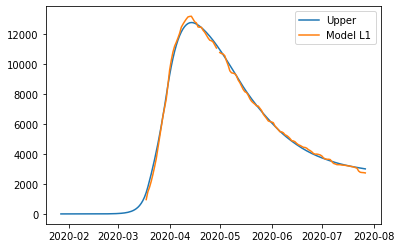

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232481950070806, 'other': 0.4138067379709218, 'school': 0.22904660121556925, 'transport': 0.2559318864564984, 'work': 0.4138067424705211}
{'home': 1.0, 'leisure': 0.3375137096742731, 'other': 0.45279343967592, 'school': 0.29086354267947245, 'transport': 0.2852550714924575, 'work': 0.5547924679659468}
{'home': 1.0, 'leisure': 0.36180299662735355, 'other': 0.49038775917716815, 'school': 0.3504727362339505, 'transport': 0.31353099991998945, 'work': 0.6907429889793929}
{'home': 1.0, 'leisure': 0.38159426747801173, 'other': 0.5210201676596667, 'school': 0.3990431902413029, 'transport': 0.33657064530538583, 'work': 0.8015174875829416}
{'home': 1.0, 'leisure': 0.3932891093443097, 'other': 0.5391211363084158, 'school': 0.4277439130638294, 'transport': 0.35018498121493824, 'work': 0.866975145848675}
{'home': 1.0, 'leisure': 0.399586331887701, 'other': 0.5488678117346654, 'schoo

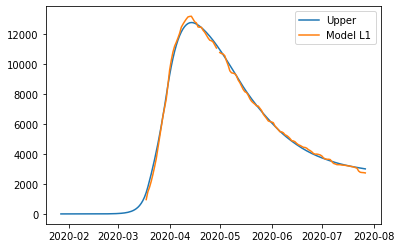

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.31232481950070806, 'other': 0.4138067379709218, 'school': 0.22904660121556925, 'transport': 0.2559318864564984, 'work': 0.4138067424705211}
{'home': 1.0, 'leisure': 0.3375137096742731, 'other': 0.45279343967592, 'school': 0.29086354267947245, 'transport': 0.2852550714924575, 'work': 0.5547924679659468}
{'home': 1.0, 'leisure': 0.36180299662735355, 'other': 0.49038775917716815, 'school': 0.3504727362339505, 'transport': 0.31353099991998945, 'work': 0.6907429889793929}
{'home': 1.0, 'leisure': 0.38159426747801173, 'other': 0.5210201676596667, 'school': 0.3990431902413029, 'transport': 0.33657064530538583, 'work': 0.8015174875829416}
{'home': 1.0, 'leisure': 0.3932891093443097, 'other': 0.5391211363084158, 'school': 0.4277439130638294, 'transport': 0.35018498121493824, 'work': 0.866975145848675}
{'home': 1.0, 'leisure': 0.399586331887701, 'other': 0.5488678117346654, 'schoo

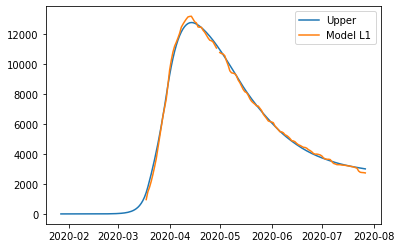

{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
{'home': 1.0, 'leisure': 0.312324819113193, 'other': 0.41380673801705214, 'school': 0.2290466007057587, 'transport': 0.2559318861993485, 'work': 0.41380674195658546}
{'home': 1.0, 'leisure': 0.3375137092977548, 'other': 0.452793439803006, 'school': 0.2908635421195545, 'transport': 0.28525507124303723, 'work': 0.5547924675128315}
{'home': 1.0, 'leisure': 0.36180299626143947, 'other': 0.49038775938231877, 'school': 0.3504727356257148, 'transport': 0.3135309996780229, 'work': 0.690742988584926}
{'home': 1.0, 'leisure': 0.3815942671207381, 'other': 0.5210201679284254, 'school': 0.3990431895936972, 'transport': 0.33657064506949264, 'work': 0.8015174872362623}
{'home': 1.0, 'leisure': 0.39328910899214176, 'other': 0.5391211366147611, 'school': 0.4277439123929596, 'transport': 0.3501849809826339, 'work': 0.8669751455302337}
{'home': 1.0, 'leisure': 0.3995863315382822, 'other': 0.5488678120612496, 'school

In [25]:
from scipy.optimize import minimize, Bounds, shgo, differential_evolution

bounds = Bounds(lb,ub)

result = minimize(error, v0, bounds = bounds)

In [25]:
best_v = [5.08875347e+01, 2.36561708e-01, 1.31254708e+00, 1.47852085e+00,
 5.00000000e-01, 1.01443896e+01, 5.58907697e-01, 4.13806742e-01,
 1.78662699e-01, 2.38392990e-01, 2.76529426e-01, 2.99376997e-01,
 2.07986907e-01, 1.69865502e-01, 4.38462413e-01, 4.76078982e-02]

In [26]:
v = best_v

days_ahead = v[0]
alpha_mixing = v[1]
beta_mixing = v[2]
gamma_mixing_before = v[3]
gamma_mixing_after = v[3]*(1-v[4])
gamma_change = v[5] + v[0]

upper_bound_home = 1.0
upper_bound_leisure = 1.0
upper_bound_other = 1.0
upper_bound_school = 1.0
upper_bound_work = 1.0
upper_bound_transport = 1.0

work_alpha = v[6]
work_beta = v[7]

leisure_alpha = v[8]
leisure_beta = v[9]

other_alpha = v[10]
other_beta = v[11]

transport_alpha = v[12]
transport_beta = v[13]

school_alpha = v[14]
school_beta = v[15]


# Number of days
days_before_date_1 = int(days_ahead)
days_between_dates_1_2 = (date_2-date_1).days
days_between_dates_2_3 = (date_3-date_2).days
days_between_dates_3_4 = (date_4-date_3).days
days_between_dates_4_5 = (date_5-date_4).days
days_between_dates_5_6 = (date_6-date_5).days
days_between_dates_6_7 = (date_7-date_6).days

days_after_date_7 = (final_date-date_7).days
total_days = days_before_date_1 + days_between_dates_1_2 + days_between_dates_2_3 + days_between_dates_3_4 + days_between_dates_4_5+ days_between_dates_5_6+ days_between_dates_6_7 + days_after_date_7
days_denom = days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6+days_between_dates_6_7


# Construct initialization
initialization = copy.deepcopy(original_initialization)
for i,group in enumerate(age_groups):
    if group == "age_group_40_49":
        initialization[group]["I"] = initialization[group]["I"] + 1
        initialization[group]["S"] = initialization[group]["S"] - 1
    initialization[group]["N"] = initialization[group]["S"] + initialization[group]["E"] + initialization[group]["I"] + initialization[group]["R"]


# Alphas
a_before_date_1 = {
    'home':upper_bound_home,
    'leisure':upper_bound_leisure,
    'other':upper_bound_other,
    'school':upper_bound_school,
    'transport':upper_bound_transport,
    'work':upper_bound_work
}

work_between_date_1_2 = work_alpha/days_denom*0 +work_beta
a_between_date_1_2 = {
    'home':upper_bound_home,
    'leisure':(work_between_date_1_2*leisure_alpha + leisure_beta)*upper_bound_leisure,
    'other':(work_between_date_1_2*other_alpha + other_beta)*upper_bound_other,
    'school':(work_between_date_1_2*school_alpha + school_beta)*upper_bound_school,
    'transport':(work_between_date_1_2*transport_alpha + transport_beta)*upper_bound_transport,
    'work':work_between_date_1_2*upper_bound_work
}

violation = (
    max(-(1-leisure_alpha)*work_between_date_1_2*upper_bound_work + leisure_beta,0)+
    max(-(1-other_alpha)*work_between_date_1_2*upper_bound_work + other_beta,0)+
    max(-(1-school_alpha)*work_between_date_1_2*upper_bound_work + school_beta,0)+
    max(-(1-transport_alpha)*work_between_date_1_2*upper_bound_work + transport_beta,0)+
    max(work_alpha+work_beta-1,0)
)

work_between_date_2_3 = work_alpha/days_denom*(days_between_dates_1_2) +work_beta
a_between_date_2_3 = {
    'home':upper_bound_home,
    'leisure':(work_between_date_2_3*leisure_alpha + leisure_beta)*upper_bound_leisure,
    'other':(work_between_date_2_3*other_alpha + other_beta)*upper_bound_other,
    'school':(work_between_date_2_3*school_alpha + school_beta)*upper_bound_school,
    'transport':(work_between_date_2_3*transport_alpha + transport_beta)*upper_bound_transport,
    'work':work_between_date_2_3*upper_bound_work
}

work_between_date_3_4 = work_alpha/days_denom*(days_between_dates_1_2+days_between_dates_2_3) +work_beta
a_between_date_3_4 = {
    'home':upper_bound_home,
    'leisure':(work_between_date_3_4*leisure_alpha + leisure_beta)*upper_bound_leisure,
    'other':(work_between_date_3_4*other_alpha + other_beta)*upper_bound_other,
    'school':(work_between_date_3_4*school_alpha + school_beta)*upper_bound_school,
    'transport':(work_between_date_3_4*transport_alpha + transport_beta)*upper_bound_transport,
    'work':work_between_date_3_4*upper_bound_work
}

work_between_date_4_5 = work_alpha/days_denom*(days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4) +work_beta
a_between_date_4_5 = {
    'home':upper_bound_home,
    'leisure':(work_between_date_4_5*leisure_alpha + leisure_beta)*upper_bound_leisure,
    'other':(work_between_date_4_5*other_alpha + other_beta)*upper_bound_other,
    'school':(work_between_date_4_5*school_alpha + school_beta)*upper_bound_school,
    'transport':(work_between_date_4_5*transport_alpha + transport_beta)*upper_bound_transport,
    'work':work_between_date_4_5*upper_bound_work
}

work_between_date_5_6 = work_alpha/days_denom*(days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5) +work_beta
a_between_date_5_6 = {
    'home':upper_bound_home,
    'leisure':(work_between_date_5_6*leisure_alpha + leisure_beta)*upper_bound_leisure,
    'other':(work_between_date_5_6*other_alpha + other_beta)*upper_bound_other,
    'school':(work_between_date_5_6*school_alpha + school_beta)*upper_bound_school,
    'transport':(work_between_date_5_6*transport_alpha + transport_beta)*upper_bound_transport,
    'work':work_between_date_5_6*upper_bound_work
}

work_between_date_6_7 = work_alpha/days_denom*(days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6) +work_beta
a_between_date_6_7 = {
    'home':upper_bound_home,
    'leisure':(work_between_date_6_7*leisure_alpha + leisure_beta)*upper_bound_leisure,
    'other':(work_between_date_6_7*other_alpha + other_beta)*upper_bound_other,
    'school':(work_between_date_6_7*school_alpha + school_beta)*upper_bound_school,
    'transport':(work_between_date_6_7*transport_alpha + transport_beta)*upper_bound_transport,
    'work':work_between_date_6_7*upper_bound_work
}

work_after_date_7 = work_alpha/days_denom*(days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6+days_between_dates_6_7) +work_beta
a_after_date_7 = {
    'home':upper_bound_home,
    'leisure':(work_after_date_7*leisure_alpha + leisure_beta)*upper_bound_leisure,
    'other':(work_after_date_7*other_alpha + other_beta)*upper_bound_other,
    'school':(work_after_date_7*school_alpha + school_beta)*upper_bound_school,
    'transport':(work_after_date_7*transport_alpha + transport_beta)*upper_bound_transport,
    'work':work_after_date_7*upper_bound_work
}

# Determine mixing method
mixing_method_before = {
    "name":"mult",
    "param_alpha":alpha_mixing,
    "param_beta":beta_mixing,
}

# Determine mixing method
mixing_method_after = {
    "name":"mult",
    "param_alpha":alpha_mixing,
    "param_beta":beta_mixing,
}
#dynModel.mixing_method = mixing_method_after




# Calculate alphas
alphas_vec = []
for t in range(days_before_date_1):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_before_date_1
    alphas_vec.append(alphas)
for t in range(days_between_dates_1_2):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_between_date_1_2
    alphas_vec.append(alphas)
for t in range(days_between_dates_2_3):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_between_date_2_3
    alphas_vec.append(alphas)
for t in range(days_between_dates_3_4):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_between_date_3_4
    alphas_vec.append(alphas)
for t in range(days_between_dates_4_5):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_between_date_4_5
    alphas_vec.append(alphas)
for t in range(days_between_dates_5_6):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_between_date_5_6
    alphas_vec.append(alphas)
for t in range(days_between_dates_6_7):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_between_date_6_7
    alphas_vec.append(alphas)
for t in range(days_after_date_7):
    alphas = {}
    for age_group in age_groups:
        alphas[age_group] = a_after_date_7
    alphas_vec.append(alphas)

mixing_vec = []
for t in range(int(gamma_change)):
    mixing_vec.append(mixing_method_before)
for t in range(int(gamma_change),total_days):
    mixing_vec.append(mixing_method_after)




# Calculate tests
tests = np.zeros(len(age_groups))


# Run model
model_data_beds = {ag:[] for ag in age_groups+["total"]}
model_data_icus = {ag:[] for ag in age_groups+["total"]}
model_data_deaths = {ag:[] for ag in age_groups+["total"]}

state = state_to_matrix(initialization)
t_beds = 0
t_icus = 0
t_deaths = 0
for i,ag in enumerate(age_groups):
    state_H = state[i,cont.index("H")]
    state_ICU = state[i,cont.index("ICU")]
    state_D = state[i,cont.index("D")]
    model_data_beds[ag].append(state_H)
    model_data_icus[ag].append(state_ICU)
    model_data_deaths[ag].append(state_D)
    t_beds+= state_H
    t_icus+= state_ICU
    t_deaths+= state_D
model_data_beds["total"].append(t_beds)
model_data_icus["total"].append(t_icus)
model_data_deaths["total"].append(t_deaths)

recalc_days = [0,
             days_before_date_1,
             days_before_date_1+days_between_dates_1_2,
             days_before_date_1+days_between_dates_1_2+days_between_dates_2_3,
             days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4,
             days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5,
             days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6,
             days_before_date_1+days_between_dates_1_2+days_between_dates_2_3+days_between_dates_3_4+days_between_dates_4_5+days_between_dates_5_6+days_between_dates_6_7,
            int(gamma_change)
            ]

dynModel.beta = np.zeros((len(age_groups),len(dynModel.groups[age_groups[0]].parameters["beta"])))
for i in range(len(age_groups)):
    for j in range(len(dynModel.groups[age_groups[0]].parameters["beta"])):
        if j < int(gamma_change):
            dynModel.beta[i,j] = original_beta * gamma_mixing_before
        else:
            dynModel.beta[i,j] = original_beta * gamma_mixing_after

for t in range(total_days):
    if t in recalc_days:
        update_contacts = True
    else:
        update_contacts = False

    dynModel.mixing_method = mixing_vec[t]
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]), t, update_contacts=update_contacts)
    t_beds = 0
    t_icus = 0
    t_deaths = 0
    for i,ag in enumerate(age_groups):
        state_H = state[i,cont.index("H")]
        state_ICU = state[i,cont.index("ICU")]
        state_D = state[i,cont.index("D")]
        model_data_beds[ag].append(state_H)
        model_data_icus[ag].append(state_ICU)
        model_data_deaths[ag].append(state_D)
        t_beds+= state_H
        t_icus+= state_ICU
        t_deaths+= state_D
    print(t_beds)
    model_data_beds["total"].append(t_beds)
    model_data_icus["total"].append(t_icus)
    model_data_deaths["total"].append(t_deaths)


initial_date = date_1-timedelta(days=days_before_date_1)

# Calculate the days of the model
days_model = [initial_date+timedelta(days = t) for t in range(total_days + 1)]

# Indices where to put the real data
indices = [(datetime.strptime(d, '%Y-%m-%d') - initial_date).days for d in days]

# Real data
real_data_beds = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
real_data_icus = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}
real_data_deaths = {ag:[float('nan')]*len(days_model) for ag in age_groups+["total"]}

for k,ind in enumerate(indices):
    for ag in age_groups+["total"]:
        real_data_beds[ag][ind] = beds_real[ag][k]
        real_data_icus[ag][ind] = icus_real[ag][k]
        real_data_deaths[ag][ind] = deaths_real[ag][k]


error_beds = 0
error_icus = 0
error_deaths = 0
for ag in age_groups:
    error_beds += np.nanmean(np.abs(np.array(model_data_beds[ag])-np.array(real_data_beds[ag])))
    error_icus += np.nanmean(np.abs(np.array(model_data_icus[ag])-np.array(real_data_icus[ag])))
    error_deaths += np.nanmean(np.abs(np.array(model_data_deaths[ag])-np.array(real_data_deaths[ag])))
error_beds_total = np.nanmean(np.abs(np.array(model_data_beds["total"])-np.array(real_data_beds["total"])))
error_icus_total = np.nanmean(np.abs(np.array(model_data_icus["total"])-np.array(real_data_icus["total"])))
error_deaths_total = np.nanmean(np.abs(np.array(model_data_deaths["total"])-np.array(real_data_deaths["total"])))

diff = np.array(model_data_beds["total"])-np.array(real_data_beds["total"])
error_beds_above = np.nanmean([max(d,0) for d in diff])
error_beds_below = -np.nanmean([min(d,0) for d in diff])

cumm_beds_model = [sum([model_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(model_data_beds["total"]))]
cumm_beds_real = [sum([real_data_beds["total"][k] for k in range(i+1) if not math.isnan(real_data_beds["total"][k])]) for i in range(len(real_data_beds["total"]))]
diff_cumm = np.array(cumm_beds_model)-np.array(cumm_beds_real)
error_cumm_above = np.nanmean([max(d,0) for d in diff_cumm])
error_cumm_below = -np.nanmean([min(d,0) for d in diff_cumm])



#     error = error_beds_total
#     error = mult_icus*error_icus_total
#     error = mult_deaths*error_deaths_total
upper_model_data = model_data_beds["total"]
upper_days_model = days_model
upper_real_data = real_data_beds["total"]
error = error_beds+5*error_beds_total + violation*1000000






0.0033064996693500004
0.005534162394714904
0.009344824167996493
0.015365951685431534
0.023701690034282123
0.034388256420948386
0.04755011870564915
0.06346430873553231
0.08259688661871106
0.10563482257993798
0.13352367338404406
0.16751703076756727
0.20924236110408362
0.2607878287890121
0.32481540731037833
0.4047068259511043
0.5047506331074373
0.6303809206653452
0.788481146138386
0.9877701578421905
1.2392921716936
1.5570383234767387
1.958734856257403
2.466842416571077
3.109822854211608
3.9237450187947127
4.954320169259012
6.2594818316890795
7.912655610385931
10.006903286659037
12.66017468582842
16.021962971761862
20.281737655669783
25.679628967486803
32.51996269562131
41.18840283685006
52.17365870123696
66.09496370124663
83.73684739847548
106.09311555372261
134.42244282789642
170.3185901909166
215.79900730419138
273.41649383022786
346.39969640588083
438.8295277303986
555.8601144934983
703.9945867218113
891.4278352118381
1128.4701183070392
1428.0667770919217
1806.4297632545158
2226.047764

In [27]:
print("Before 03-17")
print(a_before_date_1)
print(date_1)
print(a_between_date_1_2)
print(date_2)
print(a_between_date_2_3)
print(date_3)
print(a_between_date_3_4)
print(date_4)
print(a_between_date_4_5)
print(date_5)
print(a_between_date_5_6)
print(date_6)
print(a_between_date_6_7)
print(date_7)
print(a_after_date_7)

Before 03-17
{'home': 1.0, 'leisure': 1.0, 'other': 1.0, 'school': 1.0, 'transport': 1.0, 'work': 1.0}
2020-03-17 00:00:00
{'home': 1.0, 'leisure': 0.3123248193901167, 'other': 0.41380673784019006, 'school': 0.22904660081298844, 'transport': 0.255931886364327, 'work': 0.413806742}
2020-04-14 00:00:00
{'home': 1.0, 'leisure': 0.337513709605081, 'other': 0.45279343955077545, 'school': 0.29086354215699745, 'transport': 0.28525507131505357, 'work': 0.5547924673693694}
2020-05-11 00:00:00
{'home': 1.0, 'leisure': 0.36180299659808224, 'other': 0.4903877590574113, 'school': 0.3504727355958633, 'transport': 0.313530999660397, 'work': 0.6907429882612612}
2020-06-02 00:00:00
{'home': 1.0, 'leisure': 0.38159426748126846, 'other': 0.5210201675442998, 'school': 0.3990431895090132, 'transport': 0.33657064497882505, 'work': 0.8015174867657657}
2020-06-15 00:00:00
{'home': 1.0, 'leisure': 0.3932891093667876, 'other': 0.539121136195643, 'school': 0.42774391227587455, 'transport': 0.3501849808488052, 'w

In [28]:
with open("../initialization/initialization.yaml") as file:
    initialization = yaml.load(file, Loader=yaml.FullLoader)
with open("../parameters/Ile-de-France.yaml") as file:
    # The FullLoader parameter handles the conversion from YAML
    # scalar values to Python the dictionary format
    universe_params = yaml.load(file, Loader=yaml.FullLoader)


In [29]:
# Modify parameters
universe_params['mixing'] = {
    "name":"mult",
    "param_alpha":float(alpha_mixing),
    "param_beta":float(beta_mixing),
    "param_gamma_before":float(gamma_mixing_before),
    "param_gamma_after":float(gamma_mixing_after),
}
universe_params['days_before_gamma'] = float(gamma_change)
universe_params['upper_bounds'] = {
    "transport":float(upper_bound_transport),
    "leisure":float(upper_bound_leisure),
    "other":float(upper_bound_other),
    "school":float(upper_bound_school),
    "home":float(upper_bound_home),
    "work":float(upper_bound_work)
}



In [30]:
# Modify beta
for ag in universe_params['seir-groups']:
    universe_params['seir-groups'][ag]['parameters']['beta'] = [(original_beta*gamma_mixing_before if t<int(gamma_change) else original_beta*gamma_mixing_after) for t in range(t_days_beta)]


In [31]:
with open('../parameters/fitted.yaml', 'w') as file:
    yaml.dump(universe_params, file)
    

In [32]:
# Add economic value parameters
contrib = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="contributions_normal", index_col = 0)
gains = pd.read_excel("./ile-de-france_data_master.xlsx",sheet_name="activity_levels_as_%_of_full", index_col = 0)

empl_params = {}
empl_params["v"] = {}
for age_group in age_groups:
    empl_params["v"][age_group] = {}
    for activity in econ_activities:
        empl_params["v"][age_group][activity] = float(contrib[age_group][activity])/365.0


In [33]:
# Calculate l-april and l-may
l_april = a_between_date_1_2
l_may = {}
for a in a_between_date_1_2.keys():
    l_may[a] = a_between_date_1_2[a]/3.0 + a_between_date_3_4[a]*2.0/3.0

In [34]:
l_april

{'home': 1.0,
 'leisure': 0.3123248193901167,
 'other': 0.41380673784019006,
 'school': 0.22904660081298844,
 'transport': 0.255931886364327,
 'work': 0.413806742}

In [35]:
l_may

{'home': 1.0,
 'leisure': 0.34531027086209376,
 'other': 0.4648607519850042,
 'school': 0.309997357334905,
 'transport': 0.29433129522837365,
 'work': 0.5984309061741742}

In [36]:
from gurobipy import *

eq_activities = ['leisure','other','school','transport']
upper_bounds = {
    "transport":upper_bound_transport,
    "leisure":upper_bound_leisure,
    "other":upper_bound_other,
    "school":upper_bound_school,
    "home":upper_bound_home,
    "work":upper_bound_work,
}
m = Model()
nu = m.addVar(vtype=GRB.CONTINUOUS, name="nu", lb = 0)
gamma = m.addVar(vtype=GRB.CONTINUOUS, name="gamma", lb = 0)
epsilonp_1 = m.addVar(vtype=GRB.CONTINUOUS, name="epsilonp_1", lb = 0)
epsilonn_1 = m.addVar(vtype=GRB.CONTINUOUS, name="epsilonn_1", lb = 0)
epsilonp_2 = m.addVar(vtype=GRB.CONTINUOUS, name="epsilonp_2", lb = 0)
epsilonn_2 = m.addVar(vtype=GRB.CONTINUOUS, name="epsilonn_2", lb = 0)

m.addConstr(nu*upper_bound_work+gamma==1)
m.addConstr(
        nu*l_april["work"]  + gamma == 0.5851+epsilonp_1-epsilonn_1
)

m.setObjective(epsilonp_1+epsilonn_1+epsilonp_2+epsilonn_2)
m.update()
m.optimize()

empl_params['nu'] = 0.95*float(nu.x)
empl_params['gamma'] = float(gamma.x)
empl_params['eta'] = 0.05*float(nu.x)

print("nu",empl_params['nu'])
print("eta",empl_params['eta'])
print("gamma",empl_params['gamma'])

Using license file /Users/sergioacamelogomez/gurobi.lic
Academic license - for non-commercial use only
Gurobi Optimizer version 9.0.2 build v9.0.2rc0 (mac64)
Optimize a model with 2 rows, 6 columns and 6 nonzeros
Model fingerprint: 0x265d82bb
Coefficient statistics:
  Matrix range     [4e-01, 1e+00]
  Objective range  [1e+00, 1e+00]
  Bounds range     [0e+00, 0e+00]
  RHS range        [6e-01, 1e+00]
Presolve removed 1 rows and 3 columns
Presolve time: 0.00s
Presolved: 1 rows, 3 columns, 3 nonzeros

Iteration    Objective       Primal Inf.    Dual Inf.      Time
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s
       0    0.0000000e+00   0.000000e+00   0.000000e+00      0s

Solved in 0 iterations and 0.01 seconds
Optimal objective  0.000000000e+00
nu 0.6723977026702685
eta 0.0353893527721194
gamma 0.29221294455761204


In [37]:
empl_params

{'v': {'age_group_0_9': {'transport': 0.0, 'leisure': 0.0, 'other': 0.0},
  'age_group_10_19': {'transport': 0.42995936063784673,
   'leisure': 0.7068903576182438,
   'other': 4.574913439411911},
  'age_group_20_29': {'transport': 2.421870523023006,
   'leisure': 3.981764503475539,
   'other': 25.769523863503046},
  'age_group_30_39': {'transport': 5.3207402525299345,
   'leisure': 8.74775693759741,
   'other': 56.61448108213707},
  'age_group_40_49': {'transport': 6.5473065780407085,
   'leisure': 10.764338009809762,
   'other': 69.6655628368981},
  'age_group_50_59': {'transport': 6.717886370840974,
   'leisure': 11.04478593529775,
   'other': 71.48058969296267},
  'age_group_60_69': {'transport': 2.606993951947998,
   'leisure': 4.286123424007397,
   'other': 27.739299941136395},
  'age_group_70_79': {'transport': 0.0, 'leisure': 0.0, 'other': 0.0},
  'age_group_80_plus': {'transport': 0.0, 'leisure': 0.0, 'other': 0.0}},
 'nu': 0.6723977026702685,
 'gamma': 0.29221294455761204,
 'e

In [38]:
# Calculate the schooling parameter
r = 0.03
schooling_param = {}
for age_group in age_groups:
    if age_group == "age_group_0_9":
        schooling_param[age_group] = (1+r)**(-15)*sum([empl_params["v"]["age_group_20_29"][act] for act in econ_activities])/upper_bound_school
    elif age_group == "age_group_10_19":
        schooling_param[age_group] = 0.907*(1+r)**(-5)*sum([empl_params["v"]["age_group_20_29"][act] for act in econ_activities])/upper_bound_school
    else:
        schooling_param[age_group] = 0

In [39]:
# Calculate the cost of death
econ_cost_death = {}
age_groups_n = [0,10,20,30,40,50,60,70,80]
for i,age_group in enumerate(age_groups):
    s = 0
    for tao in range(age_groups_n[i]+5,70):
        ag = "age_group_%d_%d"%(int(tao/10)*10,int(tao/10)*10+9)
        s+=(1+r)**(-(tao-age_groups_n[i]))*sum([empl_params["v"][ag][act] for act in econ_activities])*365
    econ_cost_death[age_group] = float(s)

In [40]:
econ_params = {
    "employment_params":empl_params,
    "schooling_params":schooling_param,
    "econ_cost_death":econ_cost_death,
    "upper_bounds":upper_bounds,
}
with open('../parameters/econ.yaml', 'w') as file:
    yaml.dump(econ_params, file)

In [41]:
print(econ_params)

{'employment_params': {'v': {'age_group_0_9': {'transport': 0.0, 'leisure': 0.0, 'other': 0.0}, 'age_group_10_19': {'transport': 0.42995936063784673, 'leisure': 0.7068903576182438, 'other': 4.574913439411911}, 'age_group_20_29': {'transport': 2.421870523023006, 'leisure': 3.981764503475539, 'other': 25.769523863503046}, 'age_group_30_39': {'transport': 5.3207402525299345, 'leisure': 8.74775693759741, 'other': 56.61448108213707}, 'age_group_40_49': {'transport': 6.5473065780407085, 'leisure': 10.764338009809762, 'other': 69.6655628368981}, 'age_group_50_59': {'transport': 6.717886370840974, 'leisure': 11.04478593529775, 'other': 71.48058969296267}, 'age_group_60_69': {'transport': 2.606993951947998, 'leisure': 4.286123424007397, 'other': 27.739299941136395}, 'age_group_70_79': {'transport': 0.0, 'leisure': 0.0, 'other': 0.0}, 'age_group_80_plus': {'transport': 0.0, 'leisure': 0.0, 'other': 0.0}}, 'nu': 0.6723977026702685, 'gamma': 0.29221294455761204, 'eta': 0.0353893527721194}, 'school

In [42]:
# Initialization
# Construct initialization
initialization = copy.deepcopy(original_initialization)
for i,group in enumerate(age_groups):
    if group == "age_group_40_49":
        initialization[group]["I"] = initialization[group]["I"] + 1
        initialization[group]["S"] = initialization[group]["S"] - 1
    initialization[group]["N"] = initialization[group]["S"] + initialization[group]["E"] + initialization[group]["I"] + initialization[group]["R"]

# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(10):
    dynModel.mixing_method = mixing_vec[t]
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),t)

def matrix_to_state(m):
    state = {}
    for i,age_group in enumerate(age_groups):
        state[age_group] = {}
        for j,c in enumerate(cont):
            state[age_group][c] = float(m[i,j])
    return state

with open('../initialization/10days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)
    

In [43]:
# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(20):
    dynModel.mixing_method = mixing_vec[t]
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),t)


with open('../initialization/20days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [44]:
# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(30):
    dynModel.mixing_method = mixing_vec[t]
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),t)

with open('../initialization/30days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [45]:
# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(40):
    dynModel.mixing_method = mixing_vec[t]
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),t)

with open('../initialization/40days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [46]:
# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(50):
    dynModel.mixing_method = mixing_vec[t]
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),t)


with open('../initialization/50days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [47]:
# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(60):
    dynModel.mixing_method = mixing_vec[t]
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),t)


with open('../initialization/60days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [48]:
# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(70):
    dynModel.mixing_method = mixing_vec[t]
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),t)


with open('../initialization/70days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [49]:
# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(80):
    dynModel.mixing_method = mixing_vec[t]
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),t)


with open('../initialization/80days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [50]:
# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(90):
    dynModel.mixing_method = mixing_vec[t]
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),t)


with open('../initialization/90days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [51]:
# Run model
model_data = []
state = state_to_matrix(initialization)

for t in range(100):
    dynModel.mixing_method = mixing_vec[t]
    state,_ = dynModel.take_time_step(state, tests, tests, alphas_to_matrix(alphas_vec[t]),t)


with open('../initialization/100days.yaml', 'w') as file:
    yaml.dump(matrix_to_state(state), file)

In [52]:
alpha_groups = [a_before_date_1,a_between_date_1_2, a_between_date_2_3,a_between_date_3_4,a_between_date_4_5,
               a_between_date_5_6,a_between_date_6_7,a_after_date_7]

for d in alpha_groups:
    for act in d:
        if act not in ["date"]:
            d[act] = float(d[act])


In [53]:
# Construct alphas
from copy import deepcopy
alphas = []

c = 0
# Alphas
for i in range(days_before_date_1):
    a_before_date_1.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
    })
    alphas.append(deepcopy(a_before_date_1))
    c+=1
for i in range(days_between_dates_1_2):
    a_between_date_1_2.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
    })
    alphas.append(deepcopy(a_between_date_1_2))
    c+=1
for i in range(days_between_dates_2_3):
    a_between_date_2_3.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
    })
    alphas.append(deepcopy(a_between_date_2_3))
    c+=1
for i in range(days_between_dates_3_4):
    a_between_date_3_4.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
    })
    alphas.append(deepcopy(a_between_date_3_4))
    c+=1
for i in range(days_between_dates_4_5):
    a_between_date_4_5.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
    })
    alphas.append(deepcopy(a_between_date_4_5))
    c+=1
for i in range(days_between_dates_5_6):
    a_between_date_5_6.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
    })
    alphas.append(deepcopy(a_between_date_5_6))
    c+=1
for i in range(days_between_dates_6_7):
    a_between_date_6_7.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
    })
    alphas.append(deepcopy(a_between_date_6_7))
    c+=1
for i in range(days_after_date_7):
    a_after_date_7.update({
        'date':(initial_date + timedelta(days=c)).strftime('%Y-%m-%d'),
        'days_from_lockdown':c-days_before_date_1,
    })
    alphas.append(deepcopy(a_after_date_7))
    c+=1

with open('../policies/fitted.yaml', 'w') as file:
    yaml.dump(alphas, file)

In [54]:
low_bounds = {
    "transport":0,
    "leisure":0,
    "other":0,
    "school":0,
    "home":0,
    "work":0,
}

In [55]:
with open('../lower_bounds/fitted.yaml', 'w') as file:
    yaml.dump(low_bounds, file)